In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import nltk
import re

In [2]:
df = pd.read_csv('Hotel_reviews.csv')

df.head()

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk ba...,210,1403,Great location in nice surroundings the bar a...,26,1,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line y...,140,1403,Amazing location and building Romantic setting,8,3,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968


In [3]:
df.shape

(515738, 17)

In [4]:
df.isnull().sum()

Hotel_Address                                    0
Additional_Number_of_Scoring                     0
Review_Date                                      0
Average_Score                                    0
Hotel_Name                                       0
Reviewer_Nationality                             0
Negative_Review                                  0
Review_Total_Negative_Word_Counts                0
Total_Number_of_Reviews                          0
Positive_Review                                  0
Review_Total_Positive_Word_Counts                0
Total_Number_of_Reviews_Reviewer_Has_Given       0
Reviewer_Score                                   0
Tags                                             0
days_since_review                                0
lat                                           3268
lng                                           3268
dtype: int64

## Data clean up

In [5]:
#drop duplicate
print(sum(df.duplicated()))
df = df.drop_duplicates()

526


In [6]:
df.drop(['lat','lng'],axis = 1, inplace = True)

In [7]:
df.dtypes

Hotel_Address                                  object
Additional_Number_of_Scoring                    int64
Review_Date                                    object
Average_Score                                 float64
Hotel_Name                                     object
Reviewer_Nationality                           object
Negative_Review                                object
Review_Total_Negative_Word_Counts               int64
Total_Number_of_Reviews                         int64
Positive_Review                                object
Review_Total_Positive_Word_Counts               int64
Total_Number_of_Reviews_Reviewer_Has_Given      int64
Reviewer_Score                                float64
Tags                                           object
days_since_review                              object
dtype: object

In [8]:
df.shape

(515212, 15)

In [9]:
df['review'] = df['Negative_Review'].str.rstrip() + ". " + df['Positive_Review'].str.lstrip() 
df['review'] = df['review'].apply(lambda x: x.replace('No Negative','').replace("No Positive",""))

In [10]:
df['review'].iloc[5]

' Backyard of the hotel is total mess shouldn t happen in hotel with 4 stars. Good restaurant with modern design great chill out place Great park nearby the hotel and awesome main stairs '

In [11]:
print((df["review"].values == '. ').sum() )
df['review'].replace(". ", np.nan, inplace=True)
df.dropna(subset=['review'],inplace = True)
print((df["review"].values == '').sum() )

236
0


In [12]:
df.drop(df[df['review'].str.isspace()].index,inplace=True)

In [13]:
# add number of characters column
df["nb_chars"] = df["review"].apply(lambda x: len(x))

# add number of words column
df["nb_words"] = df["review"].apply(lambda x: len(x.split(" ")))

In [14]:
df.drop(df[df["nb_chars"] < 10].index,inplace= True)

## Sentiment Score from Flair

In [15]:
df.head(2)

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,review,nb_chars,nb_words
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,I am so angry that i made this post available...,1913,406
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,. No real complaints the hotel was great great...,612,105


In [16]:
from flair.models import TextClassifier
from flair.data import Sentence


classifier = TextClassifier.load('en-sentiment')
def predict(sentence):
    """ Predict the sentiment of a sentence """
    if sentence == "" or sentence == ". " or sentence == "." or sentence.lower() == "nothing." :
        return 0
    
    text = Sentence(sentence)
    # stacked_embeddings.embed(text)
    classifier.predict(text)
    print(text.labels,sentence)
    value = text.labels[0].to_dict()['value'] 
    if value == 'POSITIVE':
        result = text.to_dict()['labels'][0]['confidence']
    else:
        result = -(text.to_dict()['labels'][0]['confidence'])
    return round(result, 3)

RuntimeError: Failed to import transformers.trainer_utils because of the following error (look up to see its traceback):
Descriptors cannot not be created directly.
If this call came from a _pb2.py file, your generated code is out of date and must be regenerated with protoc >= 3.19.0.
If you cannot immediately regenerate your protos, some other possible workarounds are:
 1. Downgrade the protobuf package to 3.20.x or lower.
 2. Set PROTOCOL_BUFFERS_PYTHON_IMPLEMENTATION=python (but this will use pure-Python parsing and will be much slower).

More information: https://developers.google.com/protocol-buffers/docs/news/2022-05-06#python-updates

In [17]:
from segtok.segmenter import split_single

def make_sentences(text):
    """ Break apart text into a list of sentences """
    sentences = [sent for sent in split_single(text)]
    return sentences

In [18]:
df['review_sentences'] = df['review'].apply(make_sentences)

KeyboardInterrupt: 

In [ ]:
df['review_sentences'].iloc[5]

In [20]:
def get_scores(sentences):
    """ Call predict on every sentence of a text """
    results = []
    
    for i in range(0, len(sentences)): 
        results.append(predict(sentences[i]))
    return results

def get_sum(scores):
    
    result = round(sum(scores), 3)
    return result

In [21]:
df['sentiment_flair'] = df['review_sentences'].apply(get_scores)
df['sentiment_flair_sum'] = df['sentiment_flair'].apply(get_sum)

[NEGATIVE (0.9922)] Would have appreciated a shop in the hotel that sold drinking water etc but not necessity Would recommend if like us you arrive late at night to bring drinks from plane airport as there s no shop nearby There is a minibar though if you want to pay those prices.
[POSITIVE (0.9556)] Hotel was great clean friendly staff free breakfast every morning with good selection good wifi connection nice sized room with bath fridge in room Personally loved the fact that the hotel isn t in the city centre but is literally next to a train station that you can easily get to and from the airport city Would definitely stay again
[NEGATIVE (0.9994)] No tissue paper box was present at the room.
[POSITIVE (0.9758)] Pillows.
[POSITIVE (0.9819)] Nice welcoming and service
[POSITIVE (0.9879)] Everything including the nice upgrade The Hotel has been revamped and what a surprise Love every second of it including in room dining which was excellent
[POSITIVE (0.9933)] Lovely hotel v welcoming s

[POSITIVE (0.996)] The room size
[POSITIVE (0.9834)] Very friendly welcome Worth while upgrading to the executive club Beer wine and nibbles from 5 8 each evening and no queue for breakfast like the main restaurant
[POSITIVE (0.9245)] IT IS A GOOD HOTEL NEAR THE calso of the vienne but too far away from the centre of the vienne it is why we just book one night there when we visite the calso thanks regards danielle
[NEGATIVE (0.999)] Room is a little too minimalistic for my taste but overall was fine There was kind of a weird smell in my room like the carpet was recently shampooed with something strong.
[POSITIVE (0.8955)] Gym was awesome
[POSITIVE (0.9514)] Pillows are a bit too soft but bed is awesome.
[POSITIVE (0.9918)] Beautiful hotel in great location with wonderful staff
[POSITIVE (0.9966)] All are excellent.
[POSITIVE (0.9978)] Location staff support view room size welcoming my kids in the same room
[POSITIVE (0.994)] Excellent location 10 min walking from catalonya plaza 2 min 

[NEGATIVE (0.8232)] Long wait for check in arrived at 6 30pm and gained entry at 9pm.
[NEGATIVE (0.9981)] Check in seemed unnecessarily time consuming leading to queues Took 25 mins between arriving at hotel and getting to room.
[POSITIVE (0.9941)] The views from the Sky Lounge were amazing
[NEGATIVE (0.9643)] Room quite small at front of hotel and at times quite noisey.
[POSITIVE (0.9772)] Location is great next to railway and metro links Very generous continental breakfast and comfortable room
[POSITIVE (0.9639)] Free coffee if wanted during breakfast without eating the large buffet Inner garden Blue lights in our hall Friendly staff Newer room Great shower Comp bikes though we didn t use them No time So close to the market
[POSITIVE (0.9818)] Beds were really comfy and hotel was spotless
[NEGATIVE (0.9937)] Only one person was at the reception had to wait around 8 11mins to be spoken to location is the middle of a dual carriage.
[POSITIVE (0.9907)] Clean was really spacious and love

[NEGATIVE (1.0)] The reception clerks English was too Bad to understand My room was bed only I was asked if I want breakfast so I said tomorrow yes the day after I l see so I was asked for my credit card and was informed that they want a 30 pound deposit and when I leave I will get Mack any money still due This never happened to me in any hotel in the world Especially as I showed my Priotity holiday card When I asked for a newspaper I was told tha I can only get the independent free any other I will be charged The room was small and there was no easy chair so I could relax I spoke to the duty manager and complained He promised to give me better service when I return This I m writing to you for your sake and others that will come here.
[POSITIVE (0.9582)] The location is good
[NEGATIVE (0.985)] The staff That is the most important thing in a hotel or at least in a luxury hotel I m still waiting for something I asked them They said they will call me back and I m still waiting.
[POSITIVE 

[POSITIVE (0.9403)] Local restaurants a bit limited but many more only a couple of metro stops away.
[POSITIVE (0.9948)] Excellent access to the Metro and RER a few meters walk Velib bike rack across the street marvellous breakfast with lots of options The staff were superb Easy transfer via RER from CDG airport and a short walk to our Seine river cruise ship
[POSITIVE (0.9962)] Staff at the breakfast buffet.
[POSITIVE (0.9981)] Priceworthy
[NEGATIVE (0.999)] The bed was a bit too hard for me I think there was perfume in the air conditioning or used in the room cleaning I have perfume allergy and I did not like the perfume smell in the bedroom But I was able to open the window so that helped The dining room did not open until 7 30pm so I had to wait from 6pm and I was hungry The food prices are not cheap but its similar to other hotels much cheaper to eat outside the hotel.
[POSITIVE (0.9928)] It was raining on my arrival A staff member came out with an umbrella as I was getting out of

[POSITIVE (0.9861)] The views from Barcelona are awesome and the room has a beautiful relaxed style and is pretty much comfortable The international breakfast is very good
[POSITIVE (0.9769)] we liked your service and the cooperation of your staff
[NEGATIVE (1.0)] One of the worst places we have ever stayed for sure I have travelled all around the world but this place for sure deserves to be entitled campsite They are under staffed and over loaded You ask for some ice and get charged 5 Euros even for delivering food to your room they charged you 5 They don t change the bedsheets and pillow case assuming that you would not find out They just turn them around and use the same dirty sheets The location of the hotel is awfull where you seriously fear for your life if you want to go out after 8 pm Even taxi drivers refuse to drop you off there Honestly there is no management at all Btw your breakfast was awful and the same Sh every day I will never ever stay at your awful place again and no

[POSITIVE (0.9685)] Location was outstanding
[POSITIVE (0.9524)] We loved the room the view was fantastic across the Thames bed was comfy pillow menu was fantastic spacious room hotel staff always wanted to help always somebody at the reception or main door to greet you wish you a good morning or night at any time of the day
[POSITIVE (0.9993)] a Most receptionists never acknowledged guests on their way in and out but kept head low or on computer screen Eye contact and greetings make a difference b I would add some pastries for breakfast like croissants.
[POSITIVE (0.9151)] a Cleanliness and facilities were very good b Breakfast very good and decent timings c Close to transport restaurants etc d Free WiFi e Luggage room available
[NEGATIVE (0.9957)] Staff was unfriendly.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9999)] The room was cold and the bathroom heater was broken No refund or discount when asked They offered other rooms but they were no better and colder.
[NEGATIVE (0.9998)] th

[POSITIVE (0.8498)] The Shower needed updating but adequate enough.
[POSITIVE (0.9956)] Everything The hotel was amazing The staff so helpful and friendly the location for the underground fantastic The breakfast loads to choose from and eat as much as you like We asked for something for the room and it was replaced within five minutes They even left a bottle of wine in our room when I told them it was my birthday Great place to stay We asked for and got a quiet room Loved it Good location for shops and restaurents
[POSITIVE (0.726)] the receptionist are friendly
[NEGATIVE (0.7729)] Expensive bar.
[POSITIVE (0.9941)] Friendly staff and comfortable room
[POSITIVE (0.9027)] My room had a door to the adjacent room which was not properly soundproofed So when a next door visitor started to speak over the telephone at 5 AM I could literally hear every word.
[POSITIVE (0.9797)] Excellent location spacey room comfortable bad good cleaness
[NEGATIVE (0.9985)] The last day elevator was not workin

[NEGATIVE (0.9998)] The shower temperature was a little awkward to control and maintain The mattress on the double bed was smaller than the base and seemed to be not quite double sized.
[POSITIVE (0.619)] Pleasant stay The staff were all very welcoming and helpful Room was basic but comfortable good fridge and sink area Free wifi was good We were on the ground floor near reception and partly under the stairs but there was very little in the way of noise or disturbance
[POSITIVE (0.9947)] The view out of my window.
[POSITIVE (0.9956)] Amazing location
[POSITIVE (0.9973)] No faults found.
[POSITIVE (0.9536)] Staff very helpful Great location for Euston tube all tourist facilities Nice decor in communal areas All round good choice
[NEGATIVE (1.0)] My room had a really strong smell of polish that wouldn t go away and hairs in the bath.
[POSITIVE (0.9846)] Comfy bed great view nice staff
[POSITIVE (0.965)] This hotel comes with an interesting history The hotel staff take you on a little tou

[POSITIVE (0.9491)] Hotel is located in a quiet place in noisy area My room windows were from patio side the room was really silent Very good comfort and friendly staff I will visit hotel again
[NEGATIVE (1.0)] The room was not being cleaned according to our expectations The cups were not washed and left in the sink and the next day we were given a broken cup.
[POSITIVE (0.9892)] The calmness good breakfast and kind staff
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9997)] Breakfast the corridors to rooms were dark and dingy Bathrooms old and in need of revamp.
[NEGATIVE (1.0)] The breakfast ingredients were very poor quality
[NEGATIVE (0.6642)] Breakfast a little bit basic.
[POSITIVE (0.9959)] Location great staff super friendly
[NEGATIVE (0.9032)] Rooms a little small.
[POSITIVE (0.9694)] The staff So helpful and very nice
[POSITIVE (0.9835)] I loved our suite and the view of the whole city from our room The roof top pool and bar was a total bonus loved loved
[POSITIVE (0.9745)] Breakfa

[POSITIVE (0.9988)] It s a bit noisy but that s due to where it is close to bars late night shops etc Didn t bother me but it s something to be aware of.
[POSITIVE (0.9774)] Great location for shopping centre and nighlife Room seemed a little bit bigger than most similar hotels in Paris Very pleasant
[POSITIVE (0.9647)] Great location friendly staff and a large room and large bathroom The bed was the huge and very comfortable
[NEGATIVE (0.9791)] No charge in room Only can do on front desk.
[POSITIVE (0.9949)] Breakfast.
[POSITIVE (0.9988)] Lovely hotel bus stop right outside that takes u in to Amsterdam in 15mins friendly staff
[POSITIVE (0.9974)] Lovely breakfast snack hanging next to the door in the morning Great way to start your day with a smile
[NEGATIVE (0.9565)] small rooms.
[POSITIVE (0.9656)] Location
[NEGATIVE (1.0)] I did not like all the little add on charges and thought the breakfast option at 13 95 each plus an extra 2 if you had not already pre booked even if you wanted 

[NEGATIVE (0.9988)] Room was small and over crowded by big old wooden furniture.
[POSITIVE (0.9901)] Great location
[NEGATIVE (0.9925)] ok Service friendly but not excellent Didnt get bath towels on second day and had to ask twice for them.
[POSITIVE (0.9986)] Super stay
[NEGATIVE (0.9995)] Room was very small and pricey.
[POSITIVE (0.9491)] Location is great with easy access to entire city and Heathrow from Paddington station which is a 5 min walk Staff were friendly and helpful
[NEGATIVE (0.9999)] The shower doesnt have the ability to keep water in prepare extra towels for a slightly wet floor.
[POSITIVE (0.9994)] The location is perfect literally 1 min away from concorde metro yellow line I was able to walk to lourve eiffel etc and the brasserie opposite the hotel serves good food too
[POSITIVE (0.9683)] building work workmen working outside the bedroom window on scaffolding 2nd floor had to keep curtains closed at all times for privacy.
[POSITIVE (0.9674)] location was excellent cl

[NEGATIVE (0.997)] That woman at desk My husband is diabetic and insulin dependent and needs a refrigerator for his medicine and necessary food otherwise he will die so it s not frivolous We were guaranteed the fridge when we booked 5 months prior but the lady was rude and said there is no fridge and acted as if it was not a necessity We book a week in Aug Sept every year and we have been loyal since we have always been guaranteed a fridge Otherwise we d book elsewhere She said we wouldn t get one and made it seem impossible so I asked for the manager who was actually lovely and got us our fridge Next time I d appreciate some yes we can attitude from the front desk instead of making us feel as if it s a lot to request for someone with a life threatening disease PS the carpet in our room was filthy Wasn t in the new section of hotel.
[POSITIVE (0.9668)] Convenience We stay there every year and most staff is nice excluding one woman at desk
[POSITIVE (0.7331)] We cudn t fault this hotel 

[POSITIVE (0.9983)] Loved the ambience of the Hotel It has an artistic feel The rooms are spotless and the beds are very comfortable The staff made every effort to ensure you enjoyed the stay Christina Anna and their colleagues were extremely helpful always courteous and so friendly that it really made our stay very special The Location of the hotel is just perfect within walking distance of great restaurants shops and the louvre etc Lots of museums and galleries yet to be visited on our next trip We definitely will return
[NEGATIVE (0.9934)] Despite the stars our room was not very clean staining on the carpet missing bathroom stuff few towels no shower caps tissue not replaced room cleaning staff loudly chatting early in the morning Booked a superior room and being asked to pay additional rate for view Breakfast too expensive therefore has it outside the hotel.
[POSITIVE (0.9515)] Everybody from the concierge and reception staff was nice and helpful Great position to visit the city In

[POSITIVE (0.9934)] Everything was good.
[POSITIVE (0.9814)] All was good The staff were very helpful
[NEGATIVE (0.9985)] Staff has no idea about hospitalety except the location nothing is good.
[NEGATIVE (0.9602)] Location and only location
[POSITIVE (0.9946)] rooftop views location
[POSITIVE (0.9962)] The delightful friendly helpful staff are one of this hotel s greatest assets Probably shouldn t say this but as a smoker it was lovely to be allocated an appropriate room and not have to go outside
[POSITIVE (0.9848)] Access by car.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9942)] Great beds and beautiful location
[NEGATIVE (0.9522)] The bed were too hard for me but the hotel manager quickly fixed the mattress stiffness problem by adding a thin mattress on top It worked.
[POSITIVE (0.977)] Very nice cosy place Well located Staff was always super helpful
[NEGATIVE (0.9999)] The beds were not the most comfortable.
[POSITIVE (0.9956)] The breakfast and the room
[POSITIVE (0.9891)] Excelle

[POSITIVE (0.9847)] 1 Very Clean 2 Breakfast was delicious 3 The pool was very clean as well
[POSITIVE (0.9807)] No negatives at all.
[POSITIVE (0.9689)] The TVs in the bar area.
[POSITIVE (0.9376)] Everyone was really friendly and we were made to feel very welcome The room free upgrade was spacious and very comfortable The service in the restaurant at dinner and breakfast was very attentive
[NEGATIVE (0.9566)] Room anemities housekeeping.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9623)] Thought reception staff could have been more welcoming they did the job ok but didn t put any soul into it.
[POSITIVE (0.9913)] Very clean good breakfast good location good transport links and easy to walk to some major sights
[POSITIVE (0.9885)] Goooddddd
[NEGATIVE (1.0)] Die Adresse ist wrong very difficult to access with auto.
[POSITIVE (0.979)] Room decor Fr hst ck
[NEGATIVE (1.0)] The breakfast wasn t fresh and the bread was quite stale The dinner was also overpriced and lacked flavour Shuttle bus

[POSITIVE (0.9795)] CONCIERGE RECEPTION SERVICE EXCELLENT
[NEGATIVE (0.979)] Unfortunately the hotel shows on Booking com as Occidental Athenea Mar on Paseo Garcia Faria HOWEVER the sat nav listed it as the Barcelona Athenea Mar on Passeig Garcia Faria so couldn t find it Very stressful when arriving in Barcelona for the first time by car after a very long drive.
[POSITIVE (0.9921)] Extremely comfy beds brilliant shower great breakfast all in all any excellent stay
[POSITIVE (0.9984)] Nothing not to like.
[POSITIVE (0.9878)] Excellent location close to the Royal Albert Hall 1 2 mile Across the road is a NCP 38 24 hrs cheap in this part of town High Street Kensington tube 1 4 mile away Room perfect Staff very helpful and courteous Value for money
[POSITIVE (0.9729)] The location is perfect room and hotel very clean and super friendly staff The bed very comfortable and the air conditioning from the room was like paradise in those hot days We would definitely go back
[NEGATIVE (0.5037)] E

[NEGATIVE (0.9999)] the breakfast was not very good and not value for money.
[POSITIVE (0.7092)] The service was good Rooms were nice and clean
[POSITIVE (0.9996)] The Falkensteiner Hotel Wien Margareten is a relatively new hotel with clean and modern facilities The beds were comfortable and the bathroom was clean and excellent We stayed for five nights and found the hotel to be conveniently located two blocks from a metro station that was three stations away from the city centre The breakfast buffet was extensive and the quality of the food was excellent Our room overlooked the street which was quiet and had a nice outlook but we had to draw the curtains at night as flashes from the tram were like lightening not a problem
[POSITIVE (0.9652)] We thought the whole hotel was amazing great friendly staff made it a lovely stay
[NEGATIVE (0.9523)] my room was really small but ok The floor I was on 1st looked shabby and in need of TLC but that was about it on the down side.
[POSITIVE (0.9874

[NEGATIVE (1.0)] The whole sorry experience.
[NEGATIVE (0.9995)] We couldnt get anywheree near the hotel by car all access roads closed staff finally admitted this and stopped guiding us in Car park Non existent Farcical
[NEGATIVE (0.8646)] Ground floor room a bit noisy early in the morning.
[POSITIVE (0.9994)] The position can t be beaten alongside the natural history museum
[POSITIVE (0.9866)] Lovely room and very friendly helpful staff Great stay would definitely stay again
[POSITIVE (0.9424)] Great location with very helpful staff Very comfortable room with all amenities such as tea and coffee in room on request Great gym and spa We had a afternoon flight and were given a 1pm check out Nice lobby to meet people
[NEGATIVE (0.9999)] It wasn t easy to maneuver the streets even using a map Somewhat tucked away from things.
[POSITIVE (0.974)] The room was large and very comfortable
[POSITIVE (0.9891)] Excellent location
[NEGATIVE (1.0)] Swimming pool was empty and internet sucks.
[POSIT

[POSITIVE (0.9808)] Excellent location friendly staff room was clean bed comfortable Definitely will stay there again
[NEGATIVE (0.997)] There is no kettle in rooms so feel a bit inconvenient.
[POSITIVE (0.9403)] The staff in this hotel are very kind and helpful The location is good and convenient to go to airport
[POSITIVE (0.9851)] Going home.
[POSITIVE (0.9828)] Beds were amazing
[POSITIVE (0.9693)] Loved my stay would highly recommend
[POSITIVE (0.7918)] N A.
[POSITIVE (0.997)] Just a perfect hotel from the room to the staff
[NEGATIVE (0.9981)] Thought the breakfast price was a bit high so if it was lower then we probably would have tried it.
[POSITIVE (0.9854)] Room was really modern and the beds were comfy and the shower was powerful and spacious Hotel was lovely and the food was very good Perfect location being across the road from the train station
[POSITIVE (0.9533)] Breakfast was very good and staff very attentive
[NEGATIVE (0.9994)] Air conditioning didn t work.
[POSITIVE (0

[POSITIVE (0.9305)] Staff friendly bar area seemed nice Good location for team and amazing bakery a short walk down road
[POSITIVE (0.9999)] Flexible arrangement
[NEGATIVE (0.9969)] bed too soft breakfast was ok but was expecting better from a 4 stars.
[POSITIVE (0.9894)] friendly staff
[NEGATIVE (0.9924)] no parking the valet parking is always full and can not accommodate the car when not full it s extremely expensive.
[POSITIVE (0.9958)] Everything was perfect The hotel is near a metro station 5 minutes by foot to the station then 18 minutes with metro to Amsterdam centraal in front of Amsterdam Arena and Ziggo dome The room is large with a special design the bathroom looks well with some high tech facilities The bed is big and comfortable There is a good breakfast The internet connection works well One of the best hotels that I stayed in Highly recommended The price of the room may be a little problem but it worths the money
[POSITIVE (0.9793)] Nice Breakfast
[NEGATIVE (0.9997)] Roo

[NEGATIVE (1.0)] Couldn t get on Wifi.
[POSITIVE (0.9899)] Very helpful staff
[NEGATIVE (0.9999)] Price of food and drink was very unreasonable for example 8 euros for half lager or 28 euros for breakfast not good value for money Also the selection of food available is poor.
[POSITIVE (0.9942)] Huge bed and bathroom area very gorgeous room with fabulous views
[NEGATIVE (0.9543)] Initially we were not given the room we had booked we got it the next day so we had to repack and unpack twice.
[POSITIVE (0.9726)] Very friendly and accomodating staff and manager Very responsive to our requests Nice and quite location with good access to public transportation convenient for getting around all parts of London
[NEGATIVE (0.8776)] the cleaning people were a bit too pushy check out was at 12 and since 9 am someone came 4 5 times to ask if we are still there.
[POSITIVE (0.9749)] overall atmosphere comfortable rooms beds nicely equipped gym
[POSITIVE (0.9753)] Location is great and staff very helpf

[NEGATIVE (1.0)] The wellness centre area is in a poor state of repair with bits of card board taped to the walls to cover up some problems The area around the pool needs repainted as there is a lot of rusty bits The changing rooms did not have nice toiletry dispensers or products which I would normally expect from this sort of hotel they were clean though.
[POSITIVE (0.9769)] The hotel was lovely and quiet we were on the seventh floor so potentially a long way from any of the general hotel noises
[NEGATIVE (0.9941)] I suppose the bar experience was quite good with very good and friendly staff The price of drinks was i felt high hence the reason why very few were there when frequented it.
[POSITIVE (0.964)] The business Center was a great help and quite The printers kept running out of paper but the staff at reception were professional in sorting this out
[NEGATIVE (0.9999)] On our floor 46th there was a funky smell like rotten water.
[POSITIVE (0.9971)] The service was impeccable The 

[NEGATIVE (0.9995)] Prices in the mini bar too expensive especially for water.
[POSITIVE (0.9641)] Breakfast is outstanding
[NEGATIVE (0.8802)] no parking costs 28 euro per night no facilities room is tight for family.
[POSITIVE (0.9596)] special thanks to the staff of the restaurant serving breakfast very much kind and helpfull this had made the breakfast better location good close to restaurants and Centrak Station
[NEGATIVE (0.6811)] Got locked out of my room but the staff had my back
[POSITIVE (0.9996)] Best bed I ve ever slept in
[POSITIVE (0.9644)] All staff were very friendly and helpful Great location for galleries cinemas theatre opera and the underground
[POSITIVE (0.9981)] Staff Room and lovely hot breakfast
[POSITIVE (0.9979)] Everything of the hotel.
[POSITIVE (0.9947)] Excellent buffet breakfast
[NEGATIVE (0.8991)] Expensive Size of original room.
[POSITIVE (0.9546)] Very comfy bed Good service breakfast I would esp Like to thal Fatima at reception who was very courteous 

[NEGATIVE (0.9995)] Personal nicht so hilfreich Problems with the lifts Wrong booking for the restaurant We ve been asked to leave the restaurant at 10 50 because they arr closing st 11 00 They went to every table for it This is a no go for this type of ranking hotel.
[NEGATIVE (0.9931)] The bathtub had a little problem and as we were on a Sunday there there was no one to fix it The room had a view on the outdoor stairs.
[POSITIVE (0.997)] It with well within three metro stations from the Duomo The breakfast was very good and the room clean and convenient
[POSITIVE (0.9956)] The breakfast was very well done The location was perfect
[POSITIVE (0.9932)] Noting.
[POSITIVE (0.9881)] Location is very good
[NEGATIVE (0.9967)] Room outlook obscured by ventilation ducts.
[POSITIVE (0.9983)] Location convenient for central London
[NEGATIVE (0.9904)] I had to move rooms due to the window either being broken or would not close as it was wide open 3rd room lucky.
[POSITIVE (0.9656)] Location
[NEGA

[POSITIVE (0.9965)] I was pleasantly surprised Lovely hotel with pub restaurant next door I will definitely visit again if there s a need to be in the area We wanted a single room for three friends and was not expecting to have such a large and comfortable room in this area of London The beds and pillow were so comfortable the extra bed was a proper bed Lovely
[NEGATIVE (0.6196)] Room was dark View from window was wall of next building.
[POSITIVE (0.9927)] Staff friendly and helpful
[POSITIVE (0.974)] It wasn t my first time choosing this hotel is always my first option in London
[NEGATIVE (0.9842)] Breakfast was average.
[POSITIVE (0.9921)] Great lication
[NEGATIVE (0.9996)] It nothing major but it s also worth to mention that the hotel took care of these minor issues 1 The AC was not working so it was sometimes too warm during the night Next morning I reported the problem and the hotel staff took care of it 2 We had one night the door locked but surprisingly the housekeeping managed 

[NEGATIVE (0.9997)] There is a lack of lighting in a room to dark in my point of view To drive in out of the garage would test your driver skill to limit especially if you drive a big car.
[POSITIVE (0.8588)] Staff was very kind and helpful Best Western is a brand that keep a certain level of quality
[POSITIVE (0.8985)] Public parking a little far.
[POSITIVE (0.9691)] Staff are very helpful Breakfast is excellent
[POSITIVE (0.9911)] The room and location very comfortable bed
[NEGATIVE (0.8383)] My only complaint was the breakfast However it was only a minor complaint and the cost was deducted from my bill without question.
[POSITIVE (0.9903)] Excellent for disabled travellers ramps lifts wet room It was very clean and great access to metro buses and train cafe s bars restaurants supermarkets
[POSITIVE (0.98)] Great location friendly staff quiet room
[NEGATIVE (0.9994)] Staff were quite difficult to understand Very expensive drinks Bathplug didn t work.
[POSITIVE (0.9868)] Good location

[POSITIVE (0.9997)] Sound insulation.
[POSITIVE (0.9976)] Location and staff
[NEGATIVE (0.9983)] Queue to check in was very long and had been on the two occasions I have stayed.
[POSITIVE (0.9769)] Room is modern clean and beds are comfortable
[POSITIVE (0.9923)] Everything was great
[POSITIVE (0.9974)] they do that bit extra
[NEGATIVE (0.9873)] Breakfast room small for the amount of people Felt very busy and had to wait a while for drinks The food was good standard though.
[POSITIVE (0.967)] Great location Room was excellent very comfy bed Didn t want to get out of the shower Had a free upgrade which was amazing
[POSITIVE (0.9958)] Room seaside view
[NEGATIVE (0.9747)] There was background noise at night a base line quietly but annoyingly.
[POSITIVE (0.9896)] Great location metro stop right opposite the hotel Such friendly and helpful staff Rooms nice and quiet no noise from outside
[POSITIVE (0.9533)] The staff were extremely friendly and professional the room was luxurious the pool 

[POSITIVE (0.998)] GREAT BREAKFAST IN A NICE DINING FOOM
[NEGATIVE (0.9968)] The modern decor in reception actually made it look slightly scruffy.
[POSITIVE (0.9849)] Exceptional bed spacious room very helpful staff
[NEGATIVE (0.8182)] Stayed on a Saturday night and the live music was a little distracting We knew about this in advance and it finished at 11pm so wasn t too disturbing.
[POSITIVE (0.9687)] Staff were very friendly and had good local knowledge Well situated hotel within reach of all local attractions Breakfast was a bonus
[NEGATIVE (0.9987)] I found the hotel a little too warm for my tastes.
[POSITIVE (0.9913)] Lovely evening meal in restaurant with a charming attentive waiter Large comfortable bed I was pleased to see a friendly resident cat I so miss my cats when I m away
[POSITIVE (0.9966)] Nothing really The only minor downside is that there can sometimes be some noise from the road but not every time It was a problem when I stayed in the superior room but never an iss

[POSITIVE (0.9987)] It is a very clean and modern hotel near to the Milan Central Train Station and Metro stop In our next visit to Milan we will prefer this hotel again
[POSITIVE (0.9959)] Everything was just amazing
[POSITIVE (0.9974)] Everything
[NEGATIVE (0.9876)] We returned back at 15 15 and our room had not been cleaned they came at around 15 45 however that was not convenient they suggest they come when we were out in the evening which they did however only did half a job We have stayed at lots of 4 and 5 star hotel here and in the USA this is a good 4 star The staff were of 5 star standard other than the cleaning organiser.
[POSITIVE (0.5108)] Good roof top bar however at 10 for a pint of larger it was too expensive even for London
[NEGATIVE (1.0)] Hotel Vienna is overall supposed to be Viennese semi luxury but actually it is totally outdated with some 90 s updates which makes it even worst in terms of deco style and appearance The corridors are with heavy old carpets and smel

[NEGATIVE (1.0)] Th location was a building site which was never higlighted not wven a note on the websitw to state the condition of the site When I spoke to the staff about this matter the response was its on the government website which is appauling A room which is advertised as a suite was no way near a suite instead a large bedroom Overall experience of this hotel poor customer service and no regard for customer relations.
[NEGATIVE (0.9996)] toilet wasn t clean I found an organic dirty.
[POSITIVE (0.9827)] friendly and helpful personal nice room with terrace excellent size of bed
[POSITIVE (0.9725)] Fantastic hotel Service good Pool and spa facilities very good Prize raffle on arrival nice touch
[NEGATIVE (0.9883)] Small room Restroom divided into 2 tiny rooms No facilities.
[POSITIVE (0.9969)] Very clean Good location
[NEGATIVE (0.9989)] The hotel is in need of some maintenance our first room did not have a working air conditioner some light bulbs needed replacing and the maid se

[POSITIVE (0.6486)] Location is too far room without window dirty bathroom no fridge.
[POSITIVE (0.8774)] The lobby
[POSITIVE (0.9944)] We got a Privilege room even though we only paid for the Standard room Very nice very clean Also very good location not right in the centre but within walking distance 15 20mins to the Stephansdom Perfect for a weekend trip
[NEGATIVE (1.0)] The room was not well illuminated and small.
[POSITIVE (0.9956)] I got the room with the view of Arc de Triumph and it was nice I could also see the Eiffel from my room
[POSITIVE (0.9875)] Great view and swimming pool
[NEGATIVE (0.9717)] A British hotel not having provision for making tea in the room Also it was inconvenient not to have walk in shower.
[POSITIVE (0.9889)] Breakfast was great so was the service The Concierge was superb
[NEGATIVE (0.9999)] We weren t that happy about the sink being outside the bathroom and the transparency of the shower.
[POSITIVE (0.9911)] We loved the staff and the bed
[NEGATIVE (0.

[NEGATIVE (0.7191)] The cleaning staff do not supply room with new soaps and bath kits daily but nothing serious.
[POSITIVE (0.9779)] Excellent value quiet warm atmosphere large comfortable executive lounge good feeling all around If u know how to use tram and bus very close to public transport as well as a nice Park and of course SchonBrunn palace
[POSITIVE (0.6994)] The whole experience will come bk when in London staff made my mums bday very special
[POSITIVE (0.504)] If you wanted a bath robe you had to request for one.
[POSITIVE (0.9725)] I liked the orange juice at breakfast and the amazing staff at reception
[POSITIVE (0.9993)] There is nothing bad what I can say about that hotel.
[POSITIVE (0.9943)] Definitely recommended Also very tasty breakfast
[POSITIVE (0.9947)] Wonderful place to stay very home feeling
[NEGATIVE (0.8046)] Price was high.
[POSITIVE (0.9913)] Fabulous location and quiet considering the busy area Lovely staff spacious room and quite comfortable
[POSITIVE (0.

[NEGATIVE (0.9998)] Broken air con in room.
[POSITIVE (0.9945)] The room and the service helped to make our anniversary special
[NEGATIVE (0.512)] price.
[POSITIVE (0.9648)] its nice location and the menager mr nachos very friendly
[POSITIVE (0.8901)] Couples travelling with large bags need a Club Room just to have a little space.
[POSITIVE (0.9753)] Staff members were very helpful
[POSITIVE (0.9943)] Location was great and the food was delicious
[NEGATIVE (1.0)] Curtains sheers and curtain rods falling off the ceiling Walls needed painting very badly Carpets dirty Bathroom tub and shower had black mold between tub and tiles The fact you had to pay for the Internet and wifi and it didn t work most of the time Would not consider this to be a 4 star hotel after staying in other 4 star hotels.
[POSITIVE (0.9381)] Close to the tube and the concierge s
[POSITIVE (0.9887)] Our initial allocation of a room on the 2nd floor this floor has yet to be renovated and was a smoking floor We complain

[NEGATIVE (0.9892)] Wifi is very hit and miss Works in the bathroom but struggles in the actual room Only two elevators servicing the entire hotel leads to problems during the busy times.
[POSITIVE (0.9827)] Very nice hotel in a great location
[NEGATIVE (0.9872)] Small shower only 1 elevator at the hotel and wifi reception was average at best.
[POSITIVE (0.9958)] Location very clean friendly and professional lady at the reception
[POSITIVE (0.9912)] Location good atmosphere accessibility The staff send me a little cake with candle for my birthday
[NEGATIVE (0.9994)] Facility was not as updated as pictures suggest.
[POSITIVE (0.9665)] Location to trains
[NEGATIVE (0.9935)] The only thing I would comment on is when dining in the evening the young lady that was waiting on us was chewing gum Don t get me wrong she was very good at her job but the chewing gum doesn t look good at all when in a restaurant.
[POSITIVE (0.9872)] Loved the fact that we could get an upgrade and the room was well 

[POSITIVE (0.9822)] Location in the heart of the city Quiet rooms Very helpful staff Easy to reach on foot many sites in Barcelona
[POSITIVE (0.9996)] cleanlniness. location
[POSITIVE (0.9869)] Absolutely loved the staff and facilities couldn t have flawed the hotel if i tried
[POSITIVE (0.8595)] Staff can t do enough for you and the best breakfast in London
[NEGATIVE (0.9997)] Excellent location Very close to the London Eye and the Waterloo train station Unfortunately this 14 floor hotel has 3 very slow elevators Once it took me 10 minutes to reach my room at the 13th floor from the reception With the price they are charging it is simply ridiculous to have such an experience.
[NEGATIVE (0.9997)] The pool was very small.
[POSITIVE (0.9934)] The bed was very good firm one
[NEGATIVE (1.0)] I was on a work trip and had to work from my hotel room at some points but the wifi was very weak and I could not send emails.
[POSITIVE (0.9932)] Very friendly staff and the breakfast was delicious
[P

[NEGATIVE (0.894)] We had to wait like 10 minutes as there wasn t anyone at front desk when I got to hotel Plus we found our card details laying on the front desk Was really shocked There was only 1person working so maybe had to do something.
[POSITIVE (0.9949)] The hotel is very clean and looks like it recently refurbished as the bathroom was spotless and stylish The Room is also clean and big for a Paris hotel Customer service was very friendly
[NEGATIVE (0.9748)] still expensive.
[POSITIVE (0.9972)] modern clean comfortable
[POSITIVE (0.9709)] Staff was amazing
[NEGATIVE (0.8768)] Breakfast buffet need to be enhanced.
[POSITIVE (0.9848)] Location location location
[NEGATIVE (0.9675)] No shower Limited breakfast for 22 euro.
[NEGATIVE (0.9886)] There was no GYM.
[POSITIVE (0.8848)] Very friendly staff rich breakfast amazing rooms we stayed there twice during July in a two different periods In general I highly recommend everybody to stay in NH hotel
[POSITIVE (0.9982)] Not much to com

[POSITIVE (0.9979)] The location the hotel The staff were accommodating
[NEGATIVE (0.9886)] Room was very small and had a small staircase up to the bed.
[POSITIVE (0.9549)] Bed was really comfortable
[POSITIVE (0.9788)] Right in front on Gare du Nord train station Very convenient if you r travelling by train
[NEGATIVE (0.9653)] Very far from the center and scary neighbourhood and no parking place.
[NEGATIVE (0.7363)] The staff was ok
[NEGATIVE (0.9992)] The room wasn t very clean Dirty ceilings old food in the mini fridge.
[POSITIVE (0.9665)] The location and staff were both fantastic The breakfast was also really good
[NEGATIVE (0.9998)] We booked the hotel as room was advertised for 3 people and as having 3 single beds suitable for a holiday for myself and 2 friends The room actually only had 2 single beds and a small camp bed more suitable for a child The room was made up for 2 adults with 2 mugs towels toiletries etc The hotel staff cleanliness and breakfast was all very good but I

[POSITIVE (0.9916)] Breakfast was too much expensive Not enough free bikes when we arrived they were all finished.
[POSITIVE (0.9825)] Very nice room and shared space
[NEGATIVE (0.9996)] Very few staff members spoke English as their first language which made expressing our needs very difficult The night manager was argumentative rude and unhelpful.
[POSITIVE (0.9988)] hot water location and beautiful entryway
[POSITIVE (0.9973)] room size.
[POSITIVE (0.9842)] nice and quite
[POSITIVE (0.9773)] Staff were exceptionally helpful welcoming and accommodating The special arrangements for the Ride London cycling event were exceptional Thank you
[NEGATIVE (0.925)] It would be nit picking to criticise anything.
[POSITIVE (0.9979)] From the moment that we arrived we were made to feel at home Welcomed by Marco who was always courteous and helpful The room was spacious by usual Paris standards and the bed was very comfortable Location near La Madeleine was perfect We will definitely stay here agai

[POSITIVE (0.9963)] The room was at a good standard of mod cons and clean
[NEGATIVE (1.0)] My room service egg sandwich was not edible the bread was very stale I couldn t even cut with a knife.
[NEGATIVE (0.9995)] On the Saturday night there was a private function and the music was so loud we were kept awake until past 1 am There was no warning that this would be the case and the staff couldn t do anything to help in this matter.
[POSITIVE (0.9792)] The staff were friendly and informative and the hotel and room were to a great standard
[POSITIVE (0.9989)] Nive evening meal in the restaurant
[NEGATIVE (0.9999)] Too old furnishings and too low quality of hotel for such high price.
[POSITIVE (0.9774)] Good location
[NEGATIVE (0.9984)] Staff very unfriendly.
[POSITIVE (0.9954)] Good Location and very good value of money
[NEGATIVE (0.9989)] Room was connected with adjacent one with a door So we could hear the other couple clearly No place for privacy Big dissapointment
[POSITIVE (0.9959)] R

[NEGATIVE (0.9999)] 1 We were travelling with a baby and asked for a quiet room when booking our room was just next to the 3 lifts 2 We arrived 1 hour before the end of the breakfast and half of the buffet was empty no fruits but apples no croissants anymore.
[POSITIVE (0.9807)] Modern hotel one station away from Centraal Amsterdam
[NEGATIVE (0.9624)] Not one thing.
[POSITIVE (0.9844)] Bed bath and views outstanding Toilet was the talking point Staff were very accommodating
[POSITIVE (0.9767)] I cant think of anything bad or lousy of course they could spare a pair of throw away slippers which we always need and a bath robe yes.
[POSITIVE (0.9864)] good little bar good staff good place to be in like return home food always great surrounded by good restaurants too
[NEGATIVE (0.9787)] Restaurant should be improved.
[POSITIVE (0.9946)] Room Fitness Clealiness
[POSITIVE (0.9928)] Easy and quick transfer from airport Great location close to city centre and very kind and helpful staff on rece

[POSITIVE (0.9983)] ALLLLL EXCELLENT STAFF FROM CHECK IN CONCIERGE THROUGH BAR DINNER TOP MENU BREAKFAST SERVICING OF ROOM TO DEPARTURE WHEN LEE WAS PARTICULARLY HELPFUL LOCATION WAS BANG ON FOR OUR VISIT TO THE MOUSTRAP AND THE IVY
[NEGATIVE (0.6995)] The original room was not ready on arrival so they offered the deal to upgrade I think they probably offer this to everyone who arrives early and is definitely a sales technique targeting weary travellers.
[POSITIVE (0.9902)] This is a lovely hotel which is minutes away from Dam square and the central station We upgraded to the club room package on arrival The room was very comfortable and wifi was included in the club package at a cost of 65 extra per night The club package also gave us breakfast afternoon pastries and even drinks in the club room This was great introduction to the hotel
[POSITIVE (0.9785)] The hotel is very modern extremely clean the rooms are nice large the bathroom is large as well The location was excellent very clo

[NEGATIVE (0.9933)] In a club room but had to askf for a robe No room in breakfast club room so had to have breakfast in the main room Wasn t worth the extra money for a club room.
[POSITIVE (0.9906)] It was all good.
[POSITIVE (0.9598)] The whole experience of the hotel was fab Room was a good size and clean and all the staff were so friendly couldn t do enough for you
[POSITIVE (0.9922)] We chose this hotel for its location and customer service We were not disappointed We could not fault it for the price we paid
[NEGATIVE (0.8446)] Not a lot of breakfast choices and a little away from city centre.
[POSITIVE (0.9977)] Good sunlight in rooms Bicycle rental at hotel
[NEGATIVE (0.9964)] Insufficient milk cartons in room Bar prices.
[POSITIVE (0.9618)] Good location for Dominion Theater and Oxford Street shopping Very good breakfast
[NEGATIVE (0.9999)] Minor really but at Breakfast I did ask for poached eggs on brown bread but I got poached eggs that were not cooked and on white bread jus

[NEGATIVE (0.9998)] Well the beds could be movable we booked a triple room with 3 separate beds but 2 beds were still fixed next to each other as if it was a double Coffee machine was moody at times just spitting the pads out Could not use the loyalty points card Other than that no comments.
[POSITIVE (0.9897)] Beds were excellent loved the location direct and frequent tram the bf the coffee machine and that extra coffee pads were available We could even store the cheese in the fridge at the reception Parking is spacious and comfy
[POSITIVE (0.9925)] Very honest hotel Close to the center very clean and very good breakfast
[POSITIVE (0.9902)] Very friendly staff and very helpful especially that I travelled with my heavy shopping scooter
[NEGATIVE (0.9844)] Lot of passage ways to go through before getting to lift.
[POSITIVE (0.9982)] Lots of fresh fruits for breakfast
[NEGATIVE (1.0)] This time I was on second floor and one floor above was very loud and I couldnt sleep well I woke up at 

[NEGATIVE (0.9997)] Asked for early check in and a quite room as my wife needs rests during the day arrived and was told no rooms available before 2pm then given one at the back of the hotel right next to a very busy main rail route with constant train noise and room was very hot so had to keep the window open as air conditioner was very noisy so had nearly no sleep mentioned this when checking out and got no apology or recognition that there was something wrong Breakfast was over priced for what was on offer won t be staying there again We felt we were brushed off by the staff when checking in and when discussing the room at check out.
[NEGATIVE (0.9651)] Nothing
[POSITIVE (0.9618)] Bar area was very good Cleanliness and overall presentation was outstanding
[POSITIVE (0.9978)] Complimentary coffee tea and cakes biscuits
[NEGATIVE (0.9994)] Breakfast had poor range and was very expensive.
[POSITIVE (0.9572)] Staff is great Location is very good
[POSITIVE (0.9819)] Location near to offi

[POSITIVE (0.9513)] Housekeeping came in late to our room The first day we told them it was ok and there was nothing to clean yet so we took towels and papers And then it looks like they took advantage of it that we were easy going about it Long story short we took towels from the housekeeper till the last night than we asked them to tend for our room So out of the 4 nights we stayed we had our room clean once out the time we checked in.
[NEGATIVE (0.9142)] Rooms and beds they put two beds together I bought double bed they were renovating some rooms Hence we couldn t get good sleep.
[POSITIVE (0.9723)] Personel staff was helpful
[POSITIVE (0.9838)] The staff at reception The house keeper services.
[POSITIVE (0.9971)] what a good choice for breakfast
[POSITIVE (0.8556)] It was nice place for stay in Amterdam
[POSITIVE (0.98)] Put the coffee and tea making in a more open space not the cupboard.
[POSITIVE (0.9798)] Quiet for London comfortable very clean and fresh Great bed and shower Fri

[NEGATIVE (0.998)] Your staff could be more insightful on recommendations tips and they could generally be more interactive with guests.
[POSITIVE (0.9988)] Beautiful interiors
[POSITIVE (0.9983)] Location The bathtub was amazing
[POSITIVE (0.5027)] the location is about 10 minutes away from the centre.
[POSITIVE (0.9926)] I ve liked the room facilities and staff attitude
[POSITIVE (0.9935)] Great place and staff
[POSITIVE (0.7946)] Significant differences between the ordered and received room a city view room paid but I receiving for a room overlooking the inner courtyard What I paid Air Conditioning Private bathroom City view Free WiFi What I got The city instead of first checking out a few office buildings and metal pipes near the window that s not a good start The hop on hop off bus and or a city view room synonymous with the city view I see this Image inside oom and outside in hotel area.
[POSITIVE (0.9895)] High quality clean room Equipped and existing system The quality of break

[NEGATIVE (0.9981)] The only let down was the breakfast on Arriveing at the dining room at 9am the breakfast was all over cooked stood standing 5 mins before somebody came a threw a load of over cooked greasy bacon in the tray had to asked for our tea twice sorry it was let down.
[POSITIVE (0.8717)] Hotel and staff were excellent couldn t do enough for us
[NEGATIVE (0.9766)] To far out of London long walk to tube.
[POSITIVE (0.989)] Quiet for London clean and comfortable value for money
[POSITIVE (0.9508)] Location and all that goes along with a night in London
[POSITIVE (0.9984)] Very clean And the spare chargers in the hotel room Excellent touch and a life saver
[POSITIVE (0.9965)] In principle I should admit this trip in particular we had no problems what so ever.
[POSITIVE (0.9944)] Staff in general were more than cooperative and were always smiling And I must state that after the complete refurbishment the Hotel has become one of the Best in London with no doubt
[POSITIVE (0.9977)

[POSITIVE (0.7918)] N A.
[POSITIVE (0.9405)] The rooms were comfortable and all the staff were really nice
[NEGATIVE (0.5944)] This is second time paid alot of money and give pad rooms.
[POSITIVE (0.9904)] Great location for visiting Royal Albert Hall and Victoria and Albert Museum Good value
[NEGATIVE (0.9996)] The cleanliness of the room was disappointing we found hair in our bed and in the bathtub The toilet had a brown stain around the rim of the seat and the air conditioning didn t seem to work properly so we ended up sleeping on top of the bed all night.
[POSITIVE (0.9372)] Your staff were polite and very helpful the food was excellent with plenty to choose from The restaurants were very clean and the views were fantastic
[NEGATIVE (0.981)] The rooms are small That s a typical feature of hotels near Paddington of course.
[POSITIVE (0.9179)] The location is great A good option for those who travel from Heathrow and other places to Paddington Although this is more a preference for 

[POSITIVE (0.9571)] Great location and fantastic coffee shop downstairs Good value for money spacious room good storage nice windows comfy bed
[POSITIVE (0.9723)] We nice hotel very efficient an good front office staff special mention of Vincent Jennifer and Maria they went out of their way to see that we r comfortable were centrally located and good connectivity to go any where in Paris
[POSITIVE (0.8617)] Gabriella alla reception
[NEGATIVE (0.9999)] No much space in the room.
[POSITIVE (0.9954)] Staff and location
[NEGATIVE (0.9998)] Walls aren t great you can hear what is going on in the room next to you.
[POSITIVE (0.9955)] Great location close to Greenwich DLR station
[NEGATIVE (0.9954)] It looks like the bar is the primary business with the hotel lodge being more a side business if you want to check in you have to enter the pub and ask the Bartender its just a bit strange Its a bit too expensive for the room I got looking at the emergency plan I noticed I got the smallest room No

[POSITIVE (0.9998)] Perfect location for our trip Price was really good for this type of hotel I was surprise to get this price for a Marriott Hotel in Vienna
[NEGATIVE (0.9988)] we were given the wrong room on arrival the gym also does not look like the pictures you have on your website the rooms are also expensive for what you get a little run down.
[POSITIVE (0.9601)] i liked that the rooms were clean and tidy
[POSITIVE (0.9913)] Excellent Staff made very welcome
[POSITIVE (0.9993)] There was nothing to dislike about this place.
[POSITIVE (0.983)] If you like elegance then this is the hotel for you superb all round Loved the courtyard garden and help yourself bar akin to a fine sitting room Will definitely be back soon
[NEGATIVE (0.8646)] It s location
[POSITIVE (0.9795)] Bed was super comfy Amazing pillows
[NEGATIVE (0.916)] the room was service daily however it was not hoovered and cleaned the way I would have expected.
[POSITIVE (0.9835)] Loved the location
[NEGATIVE (0.9998)] Be

[NEGATIVE (0.9942)] Just wish that they have better mattresses it was slightly uncomfortable to sleep on the bed.
[POSITIVE (0.9818)] They realised the reason why we came to stay was for my partner s birthday and sorted out a cake and a lovely message for my partner without us even asking it was a great surprise and I will definitely recommend the hotel to everyone I know Thank you for a great and comfortable stay
[POSITIVE (0.991)] This is the best luxury hotel in London the staff are peerless and always attentive and professional Excellent rooms and top bedding make this a must stay option
[NEGATIVE (0.9994)] Firstly to get a fair picture of the actual room Secondly if they will offer a crappy room that is not on the pictures price it appropriately.
[NEGATIVE (1.0)] Horrible experience One of those that you feel stolen The pictures on the booking com website are totally misleading Hotel was extremely expensive around EUR 400 a night rooms are tiny and not new The door between the bed

[NEGATIVE (1.0)] The beds were uncomfortable We requested a double room and got two twin beds put together with double duvet The middle of the bed was impossible to sleep on.
[POSITIVE (0.8805)] The buffet breakfast was excellent The breakfast lady was super friendly lovely lady Receptionists spoke english and were very helpful
[POSITIVE (0.9971)] Good location close to Paddington and Lancaster Gate stations Near to Hyde Park
[NEGATIVE (0.9999)] Room leaking water had to put a bucket under the leek staff did nothing to repair or clean very disappointed needs a good clean would not go back.
[POSITIVE (0.9632)] Modern room with windows that look at quiet gardens Staff very friendly staff and a good breakfast The location was great
[POSITIVE (0.9906)] Great location just around the corner from the Queen with comfy beds and very attentive staff
[NEGATIVE (0.9826)] A man that was in the entrance of the roof terrace didn t let us get in the terrace saying that it was was fully booked We went

[NEGATIVE (0.9951)] Quite noisy soggy bed.
[POSITIVE (0.9923)] Great location clean room
[POSITIVE (0.9656)] Location
[POSITIVE (0.9683)] Loved everything Specially the staff
[NEGATIVE (0.9986)] No baked beans with the Full English breakfast They promised to fix this though.
[POSITIVE (0.9955)] Super staff Great location Excellent rooms
[NEGATIVE (0.995)] Having to pay for wi fi when you can go to a coffee shop and its free.
[POSITIVE (0.9975)] Absolutely everything about this hotel is first class you will not be disappointed
[NEGATIVE (0.9359)] The Shower curtain in the shower was a bit short plus the spray was sideways on facing the narrower part of the shower shower when it might have been better at one end of the longer shower space and so taking a shower got the floor of the bathroom a bit drippy which I took care to dry up so as not to walk wet onto the carpetting of the room.
[NEGATIVE (0.9049)] I was provided for a reasonable sum of money with a continental breakfast in my room

[NEGATIVE (0.6304)] Double room was very compact even with the upgrade.
[POSITIVE (0.9996)] Breakfast in room perfectly cooked and very hot
[NEGATIVE (0.9985)] The rooms were very small with minimal storage space For the price we paid we expected much larger room.
[POSITIVE (0.9663)] Breakfast was excellent
[NEGATIVE (1.0)] Two major unacceptable issues 1 The room was located pn 1st floor just opposite a huge generator which was creating extremely annoying sound Supposingly the generator was witched off after 10PM but this was not the case for the 3 nights we were there 2 Additionally the temperatur was unmanagable when we checked in the room the temperature was freezing cold We tried to open the old heater but heating did not work The 2nd day when we returned to our room the heating was working and the room temperature are most probably around 28C We tried to lowr the heating turned many times the antique sweating valves without success sleeping in such hot enviroment was total nightm

[NEGATIVE (1.0)] The rooms do not have any sound insulation You really hear everything people talking in the next room staff using vacuum cleaners doors opening and closing the noise from the street As other hotels in Spain have the same problem exzeption W Hotel in Barcelona I suppose that Spanish architects are not able to plan good sound insulations Thus I recommend German architects They are absolutely able to implement a good sound insulation In the corridor there is rubbish from the rooms nearly all the day No seperate elevators for the staff.
[POSITIVE (0.9864)] I really liked the shower Sauna and pool were also great
[NEGATIVE (0.9999)] Very low quality price ratio for 200 euros without breakfast I would have expected much more Small room Noisy.
[NEGATIVE (0.9996)] I wanted to stay near the top of the hotel for the view however during the night between 1 5am there was always a lot of noise coming from above us like dragging tables chairs etc that s the only fault I had with the

[NEGATIVE (0.9998)] I booked room for 2 people the toiletries were for 1 person only Secondly I was very dissapointed as I run my marathon next day I couldnt sleep properly at night due to heat in the room There was no way to reduce the temperature for air contitioning As I opened the window was very noisy I came for 1 night only so it mattered to me a lot.
[POSITIVE (0.9822)] Very nice room friendly staff I have asked for late check out due to marathon as I wanted to take shower after and they offered me shower in the gym after I was very pleased
[NEGATIVE (1.0)] the room felt slightly cold and we couldn t adjust the heating.
[POSITIVE (0.999)] the food the staff the room
[NEGATIVE (0.9778)] Breakfast and pillows and room too hot.
[POSITIVE (0.9774)] Good location
[NEGATIVE (0.9548)] Room is not clein.
[POSITIVE (0.9881)] Location is very good
[NEGATIVE (0.9663)] Smallish room but OK Heating on during the night in room but we should have turned it off at the wall.
[POSITIVE (0.9896)] 

[NEGATIVE (0.9982)] it s expensive given it was a very compact room and that breakfast isn t included Unable to open window for some fresh air.
[POSITIVE (0.9969)] The staff were friendly and did get me some extra milk when I asked
[POSITIVE (0.9936)] Warm approach by staff members We were given a complimentary upgrade on arrival and a good deal on the quality breakfast The room was both comfortable and well equipped with Free Wi Fi The location is perfectly placed in central London 5 mins walk from the palace gates
[NEGATIVE (0.9924)] One staff advised us to go to a larger supermarket when we wanted somewhere to buy cheese but she neglected to tell us how far a walk it was Looks close on map but it was at least 25min walk and it was dark She should have known better and advised us to take a cab.
[POSITIVE (0.9887)] Breakfast especially the eggs station and the coffee Well done
[NEGATIVE (0.8879)] Air con in bedroom a bit noisy.
[POSITIVE (0.9775)] Coffee for breakfast was very good
[N

[POSITIVE (0.9075)] excelent location very friendly staff old decorated rooms but comfortable good selection of breakfast
[NEGATIVE (1.0)] Carpets and tepich are very old and dirty.
[POSITIVE (0.5692)] Very guiet but in the centre of city
[POSITIVE (0.9985)] A little more pricey than I wanted but worth it.
[POSITIVE (0.9859)] Great location very accommodating staff
[POSITIVE (0.9948)] Brand new hotel amazing room and facilities beautiful terrace very friendly staff Probably the best hotel I ve been in in a long time
[NEGATIVE (0.9997)] They could have explained better that the service charge of 12 5 was optional.
[POSITIVE (0.9268)] Being in the Hotel refurbishment industry I tend to notice more than most the Hotel for where it is in Mayfair could do with a bit of modernisation program carpets bathroom tiles ceilings in lobbies water damaged.
[POSITIVE (0.9792)] Bed very comfy bathroom ok breakfast great
[NEGATIVE (0.9706)] Television needs updating.
[POSITIVE (0.9856)] We liked recept

[POSITIVE (0.9784)] I love that the hotel is centrally located yet very private and secluded from noise The hotel is very clean and well interiored and the staff are very helpful
[NEGATIVE (0.9994)] no granola at breakfast no access to BBC on TV.
[POSITIVE (0.9967)] great pillow choice
[NEGATIVE (0.9997)] The rooms are in desperate need of a refresh The beds are horrible The bathroom is more updated and functional You have to hunt for a plug and the carpets need to be replaced.
[POSITIVE (0.9961)] Great location if you know the city and helpful staff Just a few blocks from Rue de Rivoli at the Louvre and the Metro Easy walk to Chatelet les Halles and Pompidou
[POSITIVE (0.9956)] Very quite during the night Big and very clean room Very close to the metro station
[NEGATIVE (0.9954)] No complimentary tea or coffee.
[NEGATIVE (0.9363)] Bed
[POSITIVE (0.9974)] Everything
[POSITIVE (0.992)] I love the surrounding area how close it is in walking distance to the tube buses
[NEGATIVE (0.9999)] 

[POSITIVE (0.972)] Located very conveniently to the Wien Westbahnhof for connections by train and bus to the airport Rooms are small but well equipped Breakfast is very good providing a combination of hot and cold food Staff was very friendly and helpful
[POSITIVE (0.9907)] Lovely hotel like stepping back in time full of charm and character The bar was amazing
[NEGATIVE (0.9999)] Rooms were outdated dirty wouldn t sit on the couch it was filthy and ripped.
[NEGATIVE (0.9997)] The heather did not work the tv didn t work and the bath bubbles did nt work and therefore I would expect something in return.
[POSITIVE (0.7954)] The location was fine take the boat into the centre
[NEGATIVE (0.9999)] Do not expect abt coffee I was supposed to pay in cash so i exchanged money for it but they just got paid with my credit card without asking or even mentioning it at all The hotel and the cathedral church right next to the hotel are under construction So one of our window was useless.
[POSITIVE (0.9

[POSITIVE (0.9766)] Staff was great and polite was close to train station and shopping mall
[NEGATIVE (0.9908)] Currently undergoing building work so view of building site next door not great.
[POSITIVE (0.9963)] Friendly staff comfy room and luxurious bathroom
[NEGATIVE (0.991)] The check in took ages when we got to the desk it took 20 minutes We were short of time because of this and then when we got to the room there was someone else s luggage in it which then delayed us getting ready to go out to a show as we had to wait for the owner to collect it apparently the hotel staff had misplaced it.
[POSITIVE (0.8586)] We had a free upgrade for both rooms Very nice rooms well equipped and comfortable
[NEGATIVE (1.0)] Pillows could be more comfortable and housekeeping could do better in terms of cleaning bed making and replenishing toilet rolls.
[POSITIVE (0.9973)] This hotel was superbly located for us as we like to stay in a quiet location The area has a brilliant supermarket and plenty 

[POSITIVE (0.8892)] nice comfortable room Excellent front office very friendly and helpful I had great time in the Dry martini bar and I believe it was because of the staff Great idea the welcome healthy drinks in the lobby
[POSITIVE (0.9949)] Breakfast.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.6571)] The road noise from traffic and pedestrians was extreme Ask for quiet room.
[POSITIVE (0.9868)] Very helpful staff Quiet spacious room
[NEGATIVE (1.0)] The hotel has seen better days The d cor generally was tired Various fittings in the room were in need of repair notably the table which wasn t level and the sink tap which bled black bits after use The room also stank of smoke which got worse when the a c was turned on The staff were generally uninterested On early arrival I asked if I could have access to the room to get changed as I had cut my leg while travelling I wished to dress the cut and change any clothing which had blood on it Two of the three staff members I asked were perplex

[POSITIVE (0.9898)] Nice clean room and bath room helpfull staff and good reasonably priced spa services Only a mins walk from metro station and 5mins from train station from which you can get a train direct to the airport Nice view of the la Sagrada Familia and the hills in the background from the roof And free wifi
[POSITIVE (0.9881)] small rooms no view expensive.
[POSITIVE (0.9891)] excellent location
[POSITIVE (0.9941)] Fabulous hotel Great staff Safe parking well worth paying Ideal location for Wembley stadium
[POSITIVE (0.9939)] Boutique hotel in the great location close to Eiffel Tower Hotel design is very good
[NEGATIVE (0.9997)] The holder of the shower head could be better the excellent water pressure means the holder can go into an uncontrollable spin if you lose concentration for a second.
[POSITIVE (0.9941)] The staff in the reception were very friendly and we were happy to try their recommendation of a nearby place with great coffee The room itself was very pleasant full

[POSITIVE (0.9419)] Room is good and bed comfortable Amenities ok
[NEGATIVE (1.0)] On friday an saturnday there s loud music in a club under the hotel 1 floor We came tired late on friday and was settled into the worstest room in a hotel which right over the club There had been loud music and singing until 1 20 am and hotel s administrator cannot do nothing I m sure it s a usual story for this room on the first floor and near the far elevator The hotel shount settle here on friday an saturnday nights But greed is overcome Next day we has moved to the top floor where there s quite rooms Breakfast is expensive Near the hotel there s nice places with good breakfast for half the hotel price.
[POSITIVE (0.825)] The hotel is close to metro station There s a nice places with a good breakfast right near the hotel Catalynia place is 10 minutes of walk
[NEGATIVE (0.9103)] nothing in particular.
[POSITIVE (0.9534)] Breakfast was very good Rooms spacious And the staff was very co operative nice
[P

[NEGATIVE (0.9997)] No free Wi Fi which is really ridiculous for the room price.
[POSITIVE (0.9977)] Super easy to get there from Paris Orly Airport
[NEGATIVE (0.7907)] Far from the central London.
[POSITIVE (0.9938)] Room beds and the bath
[NEGATIVE (1.0)] could have been better signposted.
[POSITIVE (0.9831)] large bed very comfortable everything in the room well presented carpet prestine
[POSITIVE (0.9928)] The view from the hotel is second to none The hotel and staff are excellent It was a pleasure to stay there again as we are regular visitors to the hotel
[NEGATIVE (1.0)] On entering the room the immediate reaction was of ingrained dust It really smelled like the carpets and curtains needed replacing Bathroom was clean Air conditioning didn t work and I constantly had to ask for it to be looked at I woke up on the first two nights out of three very hot and stuffy The bed and pillows were incredibly hard and uncomfortable.
[NEGATIVE (0.5482)] This hotel is directly across the road

[POSITIVE (0.9856)] The staff at reception outstanding Got great assistance on train times etc I went to a match in Crystal Palace to see Leicester one of the staff briefed me fully what to expect etc This was a big help
[NEGATIVE (0.9941)] Check in staff tried to up sell us a couple of times.
[NEGATIVE (0.7742)] Room was very quiet
[POSITIVE (0.9889)] room was a little dated but very clean.
[POSITIVE (0.9861)] great location and very nice staff
[POSITIVE (0.9997)] What is there not to like.
[POSITIVE (0.9455)] We love the location and the roof top bar Find it difficult to go out in the evening when so much to look at
[NEGATIVE (0.9999)] Thermostat needs turned up ran a bath after a long day in London and it was dissapointing requested a southern view but didn t receive even after check in staff told me I did have breakfast was lukewarm so once it hit the plates it became cold quickly was asked for 60 deposit for mini bar and when checking out they managed to charge me again instead of

[POSITIVE (0.9952)] A big and clean room Coffee and tea making facilities in the room Good breakfast Good location Belvedere park is just round the corner Rennweg train station train from to the arport is 350 mins away Sauna facilities on the 5th floor give a chance to have a shower and refresh after your flight in case you arrrive early before your room s ready
[NEGATIVE (0.8905)] Read the positive this is mostly event related The room we were given was very small tiny for 2 It was the only available one as Milan was hosting the Expo 2015 We chose to stay again 4 days later from our road trip to the south and we were given a larger room very adequate No Parking however PAID at least but expensive.
[POSITIVE (0.9935)] The room and Bathrooms are very clean and very well maintained The staff was very helpful over our 3 nights stay The location is very convenient of the high street quite yet close and a 10 minute walk from the shopping and outlet areas Breakfast buffet is rich and comfy s

[NEGATIVE (0.9998)] A lot of noise The door was creaking all the time Small room and breakfast does not have many options.
[NEGATIVE (0.9651)] Nothing
[NEGATIVE (0.9295)] a bit a crowded hotel.
[POSITIVE (0.9915)] Small rooms but it s not an issue because come for enjoying seeing the city.
[POSITIVE (0.9501)] Great stay location was excellent staff friendly and helpful very nice quality Thanks
[NEGATIVE (0.9944)] The hotel itself was a little noisy think we were located below a generator.
[POSITIVE (0.9013)] The location was great for tube station a deal for sight seeing Breakfast was lovely plenty choice Had a balcony in our room with a lovely view
[POSITIVE (0.9894)] 30 euro per day extra charge for the parking garage.
[POSITIVE (0.9894)] Friendly staff
[NEGATIVE (1.0)] The rooms were awfully designed extremely clostrophopic dark and simply ugly The wifi is crazy slow.
[NEGATIVE (0.8949)] Location was the only convenient thing
[NEGATIVE (0.9994)] Breakfast was average and the staff s

[NEGATIVE (0.9999)] I have stayed in other mercures and the breakfast wasn t as varied The make your own coffee machine was in an awkward position and there was always a queue In previous hotels the staff bring you coffee pots to your table and this machine meant we didn t get to enjoy our meal together as one of us was in a queue for a good portion of the meal for a hot drink They need to refill food a little quicker as the fruit salad was mainly grapes and a little disappointing.
[POSITIVE (0.9892)] We enjoyed the shower and the pillow menu as well being close to the station for ease of travel into central Amsterdam It was a nice and modern hotel with electric buttons to press for clean up or do not disturb as well as enough lifts etc Staff were helpful
[POSITIVE (0.9985)] An amazing hotel The views were breath taking
[POSITIVE (0.9856)] Room was nicely set up
[NEGATIVE (0.9994)] The lack of communication Been over charged.
[NEGATIVE (0.944)] I didn t like there wasn t a pantry to pu

[POSITIVE (0.9709)] The room was immaculate The cleaners obviously take their work very seriously which is nice
[POSITIVE (0.9345)] The location is terrific staff all super friendly and helpful all fluent in English with clean modern rooms Prior reviews cited slow wifi but we did not find that to be the case
[POSITIVE (0.9939)] Great choice of breakfast great location easy access to Thames Clippers for a speedy ride into the centre of London
[NEGATIVE (0.9997)] The bed was too hard.
[POSITIVE (0.9847)] The location was great right next to Hyde park and the tour hop on hop off buses were round the front of the hotel so that was excellent The huge bed however was too hard and could do with a topper The breakfast choice was very good and the staff very pleasant and helpful
[POSITIVE (0.7434)] Busy street traffic in front of your room.
[POSITIVE (0.9033)] Location 10 mins from train to the airport
[NEGATIVE (1.0)] I did not like being at the front of the hotel We stayed for a few days at t

[NEGATIVE (0.9999)] My room smelled like cigarettes I had to sleep with the window open and then I got a cold I could hear people walking around upstairs from 1pm until 2am Honestly I think someone was just walking around back and forth all day.
[NEGATIVE (0.7993)] the chicken curry was undercooked but they brought a fresh one.
[POSITIVE (0.9936)] It was absolutely amazing the staff where great and we even got upgraded it was great definitely recommend it
[NEGATIVE (0.987)] There was nothing I didn t like.
[POSITIVE (0.8999)] I liked everything about the hotel Lovely rooms comfy bed friendly staff I can t fault it at all
[NEGATIVE (0.9998)] The room windows are old and not sound proof uncomfortable due to street noise.
[POSITIVE (0.9863)] Location is good very friendly and supportive staff
[POSITIVE (0.9696)] The hotel was well situated in a lovely part of London the room was clean and comfortable and the staff were friendly and helpful
[NEGATIVE (0.9175)] There was not breakfast.
[POS

[POSITIVE (0.9932)] The room was excellent very clean spacious Special mention must also go to the reception staff who were really helpful and very pleasant especially the girl who help me with my city tour trip when the bus went without us even though we were waiting in reception she managed to get it sorted and was very efficient many thanks
[NEGATIVE (0.9643)] wifi could be more performing.
[POSITIVE (0.9895)] Brand new hotel it looks so very nice and modern room
[NEGATIVE (0.9999)] Weak hairdryer.
[POSITIVE (0.9958)] Clean room friendly staff
[POSITIVE (0.999)] No issues.
[POSITIVE (0.9992)] Clean and simple
[NEGATIVE (0.9999)] The wifi didn t work.
[POSITIVE (0.9869)] Bed was really comfy and was really close to the tube
[NEGATIVE (0.9989)] The duvet on the single bed in twin room didn t cover my feet It was too small and I m only 5 6 Two men came to the door and said they needed to check the mattresses For two girls who were staying this was quite intimidating especially because 

[POSITIVE (0.9954)] Room was exceptionally clean and uniquely appointed Breakfast Excellent quality food Bacon eggs apple cake etc
[POSITIVE (0.9828)] The hotel suited our needs and was good value for money I would recommend this hotel
[NEGATIVE (0.9779)] The hotel is very far from city center I would only stay here if I will transit in Amsterdam.
[POSITIVE (0.9601)] The rooms are big and clean The bed is very comfortable The hotel has all the facilities you might need
[NEGATIVE (0.9997)] This hotel has some problem with the ventillation no individual exhaust from bathrooms as if the ducts were narrow So the first impression is not good Afterwards when the AC is operating it is not that bad A good roof ventillator why not with a solar panel should solve the problem.
[POSITIVE (0.9676)] Very friendly and helpful staff esp during breakfasts Location is just excellent close to the airport shuttle bus and metro Pl Espania On the 1st floor there are 2 PCs available in case you need to buy a

[POSITIVE (0.951)] Service was excellent in all areas particularly housekeeping staff Toiletries very good Breakfast most enjoyable and varied Dinner also excellent No complaints on this second visit and hope to visit again in 2017
[POSITIVE (0.7918)] N A.
[POSITIVE (0.9741)] Comfortable beds good hot breakfast all good Too many people know about this it will be harder to book a room Staff is very friendly and helpful
[NEGATIVE (0.9997)] Restaurant menu to limited.
[POSITIVE (0.9991)] Location great for theatres
[POSITIVE (0.997)] The open plan bathroom and toilet.
[POSITIVE (0.9954)] Fabulous position on bus route and easy walk to all Barcelona attractions Loved the rooftop bar for cocktails and sunset
[POSITIVE (0.8511)] Good location accessibility cleanliness and accomodation The hotel room is very comfortable The staff was helpful Will come back to stay in this hotel Highly recommended
[POSITIVE (0.8896)] Would like to put thanks for hospitality staff Rebecca and Laura
[NEGATIVE (0

[POSITIVE (0.9961)] I booked this hotel because it s rating was so high I stayed in Hotel Sacher and Imerial Hotel before San Sochi and I can tell you San Souci is as good as them but it s only half price so it s the best value hotel for people who don t want to spend huge money but expect luxury hotel When I booked it I don t really like the bathroom with boring doors But the real room is much more beautiful than the photos They have a huge TV embedded in the large mirror this is very smart and trendy Every staff is very polite and professional of course their front desk handsome manager is the best he gave me a little gift after checkout Thanks for that
[NEGATIVE (0.9998)] The WiFi was very slow that I could not work whilst at the hotel.
[NEGATIVE (0.9124)] Nothing everything was great.
[POSITIVE (0.9933)] The location is really close to the city center and public transportation Car rental is also close staff is very kind rooms are very clean Breakfast is descent
[NEGATIVE (0.9507)] 

[NEGATIVE (0.9909)] Well priced for a fairly central location not far from Invalides and the Eiffel Tower Reasonable quality but lacking character throughout as one would expect from Holiday Inn Restaurant maitre d deserves a mention for his help and enthusiasm
[NEGATIVE (0.9995)] The interior style was old Room size and elevator was so small.
[POSITIVE (0.9039)] The staff were friendly specially Sana
[POSITIVE (0.9815)] The room is very large and the stuff is quite nice It is a really good choose
[POSITIVE (0.9856)] Place is fabulous modern but quirky staff are outstanding
[NEGATIVE (0.9972)] Thought we had breakfast included but didn t an extremely expensive hotel so did expect to have something like breakfast inlcuded rather than paying so much for a room Exchange rate changed by the time we were there and the difference was HUGE also so pay upfront when booking Not allowed to reserve a table for drinks at the rooftop meaning both nights we went up we could not sit down and therefor

[POSITIVE (0.8637)] The room had a view of the city It felt warm cozy and was a good size I liked how you could open windows for fresh air Bedding was very comfortable Good bed side lighting
[POSITIVE (0.9942)] Comfy bed good size room close to station
[NEGATIVE (0.5556)] That the spa was an additional charge over and above the room charge the snacks at the guest service were over priced but thats to be expected the view from my window was that of a construction sight but the area is under development and i expect in the coming years that it will be built up and a very good place for travellers to stay just outside the historic Amsterdam.
[POSITIVE (0.9857)] The spa was lovely and the bar and restaurant staff and food very good also 25 percent off was a nice perk The quaint Pool and Hammam steam room were fantastic well done i hope you look after that little oasis thanks
[POSITIVE (0.9936)] Good location and a very clean hotel the staff are wonderful and very heplful I would certainly 

[NEGATIVE (0.9946)] Old furniture worn out carpets.
[POSITIVE (0.9734)] Good place kind staff swimming pool Good for short stay
[NEGATIVE (1.0)] Very very very dusty awful views and location is half estate half riverside Wooden furniture looks tired also.
[POSITIVE (0.9822)] Great bar open late and great location
[NEGATIVE (0.9998)] No hot water for a shower Room was next to motorway and you could hear the traffic all night long Toilet handle broke when pushed Door wouldn t open with key Management was totally unsympathetic to concerns Never again.
[POSITIVE (0.914)] The staff was very friendly The food in the bar was good and priced fairly
[NEGATIVE (0.999)] no wardrobe one chair for two persones far from underground.
[POSITIVE (0.9948)] friendly staff everything is clean
[POSITIVE (0.9942)] Clean Excellent location
[NEGATIVE (0.9977)] Room was not ready at check in time This caused us to be late for the event we were attending Poor considering the price and type of hotel Expected it 

[NEGATIVE (0.9765)] Check in took forever Fridge with some sensors kids opened several times a day and had a bill for 200gbp but canceled afterfards.
[POSITIVE (0.9994)] Location the view from room
[NEGATIVE (1.0)] Room was shubby Very very small bathroom difficult to operate there even no electric socket for a hsir dryer there the hairdryer itself was hidden in a drawer of a work desk the panel with electrical sockrts on a table was falling away from the table broken latch on the door Very small and uncomfortsble elevator.
[POSITIVE (0.9615)] Location and price
[POSITIVE (0.9929)] The staff were all very friendly and the facilities were brilliant
[NEGATIVE (0.9998)] despite the hotel is brand new and was opened 3 weeks ago hotel felt old in terms of furniture floors and even the color mix is ugly Moreover the reception area is tiny and there is no in room service menu.
[POSITIVE (0.9271)] Location is great very close to the central station
[NEGATIVE (0.9993)] Room mix up but this was 

[POSITIVE (0.9978)] The hotel is very luxurious and opulent It is located in a central location within a short walk of the centre of Vienna
[POSITIVE (0.9995)] Perfect location with easy connections to get around
[NEGATIVE (0.9999)] Very poor lighting in room.
[POSITIVE (0.9437)] Location free newspaper free WiFi really good towels
[NEGATIVE (0.9962)] There were no bathrobes.
[POSITIVE (0.9963)] Bed linen and duvet and pillows amazing Great with loads of plugs everywhere
[NEGATIVE (0.7231)] Not much in local area have to eat and drink in hotel at hotel prices.
[POSITIVE (0.9668)] Good hotel near Metro Easy to get to from Airport Went to event at Velodrome about 30 min walk away
[NEGATIVE (0.9996)] Lifts kept breaking down.
[POSITIVE (0.6427)] Location is A1
[POSITIVE (0.993)] We liked everything.
[POSITIVE (0.995)] Great location Lovely breakfast Beautiful room Close to restaurants Not too far from Duomo
[NEGATIVE (0.9996)] Lack of view from the room.
[POSITIVE (0.9943)] Cocktail bar
[

[POSITIVE (0.9864)] I always choose the Marriotts West India Quay when I m staying in London The service is consistently good and I would highly recommend this hotel to anyone
[NEGATIVE (0.9994)] Room cleaning is done relatively superficial Also in common areas elevator for example for 5 days as it was not given a vacuum cleaner ever It is one of the first impressions that you make it For hotel claims it is not too good.
[POSITIVE (0.8904)] The bed extra confy
[POSITIVE (0.9447)] Location Staff etc
[POSITIVE (0.9318)] own gym but did nto need it this time bigger room service menu but did not need it this time own more bikes.
[POSITIVE (0.9316)] Location allowed walking to museums and parks Beds were good nice to have balcony Quiet Breakfast
[NEGATIVE (0.9997)] there needs to be frosted glass on the toilet window of room 116.
[POSITIVE (0.9904)] very close and central to the o2 and not that far to get to central london
[NEGATIVE (0.9958)] Nothing all very good.
[POSITIVE (0.9972)] Locat

[POSITIVE (0.7918)] n a.
[POSITIVE (0.955)] Rooms are clean nicely decorated Staff is friendly helpful
[NEGATIVE (0.9972)] Bed was a bit short for my tall husband but he still slept really well Bathroom was cold and had no heating but thats just finding fault because you re insisting O yes and the wifi kept dropping out quite annoying.
[POSITIVE (0.9991)] Cannot fault it It was perfectly positioned for Royal Albert Hall evening entertainment and day browsing in Chelsea and visit to the V A Great sleep in lovely pristine white sheets It was lovely Penhalligon soaps in the dish perfect a great bit of extravagance Afternoon tea served with fresh biscotti in warm interesting lounge Lots of old books to browse through
[POSITIVE (0.9992)] There is nothing negative i could say about this lovely place apart from an expensive breakfast which works out much cheaper if you get it yourself from the bakery across the road the same bakery hotel gets it from and ofcause if you are driving parking is 

[POSITIVE (0.9656)] Location
[NEGATIVE (0.9966)] Noise you can hear everything in the street or the room next to yours slow elevators complemintory drinking water only for first arrival day conjusted tiny room and toilet even for superior rooms old furniture and carpet smelly rooms room service is it that tasty or great and not advisable expensive for whatever you get Small double beds they are queen size actually.
[NEGATIVE (0.9904)] The location 3 minutes from harrads and smiley staff
[NEGATIVE (0.8985)] The smell first floor hall The squeeqy bed Not falsly cgarging extra at the end.
[POSITIVE (0.9819)] The staff were friendly and helpful in guiding
[NEGATIVE (0.9778)] The room was a bit on the small side and it was quite expensive.
[POSITIVE (0.9762)] The staff were very helpful the location excellent and the hotel very clean
[NEGATIVE (0.9998)] Breakfast was listed as included but there are no food drink facilities in the hotel at all Told on the 3rd day that they d stopped offerin

[NEGATIVE (0.9377)] A restaurant with longer hours would be nice.
[NEGATIVE (0.9999)] We ordered off the breakfast menu the first morning it was very slow the 2nd morning it didn t come at all and the waitress said we didn t place an order when we certainly had and it was difficult to get a member of the staffs attention.
[POSITIVE (0.9804)] Location was good the room was fine
[NEGATIVE (0.9999)] Asked for champagne glasses 3 times and never recieved them Over priced and spa facilities not included in price Not worth the money that was paid.
[POSITIVE (0.9676)] Food location and rooms where very nice
[POSITIVE (0.939)] Nice place I like the place and coming back.
[POSITIVE (0.9867)] Ver nice staff
[NEGATIVE (0.674)] Small lift.
[POSITIVE (0.9865)] Excellent staff very accommodating and helpful The room was comfy and stylish with a lovely view of the Paris skyline
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9768)] cost i suppose it was new year eve.
[POSITIVE (0.994)] good location in lon

[NEGATIVE (1.0)] Room to hot and too noisy if you opened the window.
[POSITIVE (0.9961)] Staff were brilliant
[POSITIVE (0.9969)] Beautiful hotel fantastic staff This is our third stay here and will stay again
[NEGATIVE (0.8856)] Although we came to the hotel much earlier than checkin time the staff in reception gave us an update room
[POSITIVE (0.9403)] for this second time i wish i had a bigger bathroom or shower instead of tub.
[POSITIVE (0.9965)] i love this hotel second time here i think it s a great location and good price for location next time i want a room with a balcony
[NEGATIVE (1.0)] The double bed is actually two single beds combined it s uncomfortable if you are used to sleep in the middle of the bed.
[POSITIVE (0.9729)] This is my second stay in this Hotel and hopefully won t be my last Very friendly staff Room and bathroom were very clean Gail s Coffee is one of the best in London The location can not be more central You are a walking distance to the trendy restaurants

[NEGATIVE (0.9182)] rooms are elegants but very small.
[POSITIVE (0.9972)] croissanrs were delicious and the patio is really nice
[POSITIVE (0.9681)] We are pretty happy with everything and was really happy during our stay For people who wants hard bed might want check again.
[POSITIVE (0.9152)] It is a very nice hotel and not so far from all the sites Will stay again
[POSITIVE (0.9712)] Cash free hotel.
[POSITIVE (0.9995)] Perfect for a short stay in Amsterdam Walking distance to the center Pleasant check in and out
[NEGATIVE (1.0)] Room was very cold couldn t sleep.
[POSITIVE (0.9362)] Breakfast
[NEGATIVE (0.9898)] Walls are like from paper you can actually hear every move and sound from next rooms and when somebody clean the room because they drag chairs.
[POSITIVE (0.9512)] Breakfast was very good
[POSITIVE (0.9996)] Location confort staff
[NEGATIVE (0.9982)] Small room overpriced unusual to pay before the visit.
[POSITIVE (0.9858)] Loved the artwork decor location was perfect
[POS

[NEGATIVE (0.9998)] The room for 3 person are not very big And another very bad surprise is with Booking Hotel i Made a reservation with a breakfast but when i arrived at hotel the breakfast didn t inclused.
[POSITIVE (0.9874)] The location is very good in near the subway The staff and breakfast are excellent
[POSITIVE (0.987)] Very good access to the South Bank and central London Will be staying again
[POSITIVE (0.9805)] Cleaning of the hotel
[NEGATIVE (1.0)] Everything was terrible Room was very uncomfortable bed was very old it hurts your spine pillows were ancient even the toilet papers are the cheapest terrible ones we paid a fortune to holidayinn I don t care about the location it was not a fact for me I needed to rest because of my health and everything was just so very bad and uncomfortable you ask for mozerrela avacado sandwich they bring cheddar and avocado tasteless sandwich room and windows were very dusty heating never worked you have to call the reception they turn it on 

[POSITIVE (0.9993)] The beds were very comfortable and the sheets super soft The breakfasts were made to order fresh and flavorful The 24h availability of food in the area near the reception desk made it very welcoming for all guests Great place to relax after being out all day touring or to recharge before the next adventure And the location was perfect Close to two metro stations and walking distance to most sites
[POSITIVE (0.9824)] The staff was especially accommodating All of our needs were met with a smile
[POSITIVE (0.988)] Bed very comfy staff so nice food delicious at breakfast loved the pool
[POSITIVE (0.8448)] Crowd in front hotel.
[POSITIVE (0.9891)] Excellent location
[NEGATIVE (0.9997)] Room cold due to inadequate heating.
[POSITIVE (0.9816)] Good location apart from being next to railway line
[POSITIVE (0.9755)] location is convenient room is clean tidy
[POSITIVE (0.9309)] The images in the room parking and thier massage.
[POSITIVE (0.673)] Every thing thier
[NEGATIVE (0

[POSITIVE (0.8983)] Room with small window on last floor To access the room you needed to open two additional doors cross some stairs etc.
[NEGATIVE (0.9035)] Small hotel
[NEGATIVE (0.9994)] The staff seems unprofessional and cold.
[POSITIVE (0.9163)] The location is well near the underground station
[POSITIVE (0.9528)] All good A bit pricey but it is central Amsterdam and at a busy time.
[POSITIVE (0.9711)] This is everything you expect from Swissotel clean comfortable functional and in the right location Usual good stuff tea and coffee facilities nice beds pillow choices courtesy fruit etc Great and welcome staff on reception All in all a very good hotel in a very good location
[NEGATIVE (0.9711)] Parking was an issue as the customer designated car park was only suitable for approximately 30 40 cars which considering the hotel would house hundreds of guests presented itself as an issue Additional parking was available but came at a cost of 12 per day which on a smaller budget can aff

[NEGATIVE (0.9172)] The price seems to be steep compared to the rooms.
[POSITIVE (0.9925)] The location and staff is excellent
[NEGATIVE (0.9976)] The room is quite small.
[POSITIVE (0.9865)] Good location with convenient transport
[NEGATIVE (0.584)] I genuinely cannot think of anything.
[POSITIVE (0.9918)] Wow this hotel is really fab However it was the staff who really stood out for us and in particular the concierge Dominic He was so efficient and pleasant and nothing was too much for him to sort We had a number of requests and he literally had everything organised within 1 hour So impressed with him
[NEGATIVE (0.9986)] not the best part of the city at night quite many beggars etc nicer shops at least 5 blocks away almost no TV channels which are not Italian.
[POSITIVE (0.7795)] close to main station parking garage not too far from centre to stll walk there free internet
[NEGATIVE (0.9972)] Wasn t easy to find the carpark.
[POSITIVE (0.9852)] Had a fab time in London Staying at the 

[NEGATIVE (0.9998)] I have reserved through Booking com for a discounted rate When I arrived at the property I was told that my reservation was cancelled and that the rate provided by Booking is not accepted by the property so I had no reservation The staff were friendly but there was actually no reservation My Easter weekend was ruined thanks for booking com.
[NEGATIVE (0.9999)] We were given room 1 off reception and it is tiny tiny which we kind of expected what we did not expect is that there are no windows and it is like sleeping in a dark box Very uncomfortable The staff apologised but were full so we couldnt be moved If you are are claustrophobic avoid this room.
[POSITIVE (0.9971)] Super bed and bedding a lovely bar and great staff The location of this hotel could not be better Not much in the way of breakfast but there are endless cafes right on the doorstep so no shortage of food
[POSITIVE (0.994)] We were attending a concert at the O2 so the location could not have been any b

[NEGATIVE (0.9997)] Given a disabled person s room and didn t like the bathroom with shower curtain.
[POSITIVE (0.9457)] Location.
[NEGATIVE (0.6277)] Room a bit small but ok for just one night Would definitely want something bigger for longer stay Would definitely book again.
[POSITIVE (0.9885)] Perfect location for what we wanted Staff so friendly and helpful Breakfast excellent and no problem to have full English
[NEGATIVE (0.9988)] Air conditioning not working No ceramic cups for tea No milk provided for tea Reception staff aloof with superior attitude.
[POSITIVE (0.8145)] shuttle bus to train station
[NEGATIVE (0.9986)] Price of breakfast and lack of communal space.
[POSITIVE (0.9954)] Location comfort cleanliness and friendly staff
[NEGATIVE (0.9332)] Wifi was a bit temperamental and there was a small que to be seated at breakfast.
[POSITIVE (0.9958)] Excellent location for shops thearte s and museums Hotel clean with friendly staff Like the updated reception area Hotel always ac

[POSITIVE (0.9554)] The location is very nice
[NEGATIVE (0.9998)] As most hotels in central Amsterdam they are overpriced This hotel is no exception To pay an extra EUR29 per day for the breakfast buffet on top of the already high room rate is just ridiculous The buffet did not look that great to suggest such exorbitant rate would be justified I only had breakfast in the hotel one morning and instead just had breakfast for less than half the price in one of the cafes nearby Or simply grab some nice food and a coffee from one of the nearby bakeries The room was overlooking one of the streets with restaurants and bars so Thu Sun night usually means drunk people yelling off the top of their voices until 5am in the morning The room s windows weren t sealed that well to cancel out the noise In fact the first night I got up twice to check that all the windows were closed completely which they were but it was just that noisy.
[POSITIVE (0.9758)] This hotel is located in the heart of Amsterdam

[POSITIVE (0.9943)] Gorgeous historical ambiance with excellent conveniences Perfect location in city centre but on a lovely quiet street Congenial staff very comfortable great breakfast Absolutely our first choice for the next visit
[POSITIVE (0.983)] It was a very pleasant return to a well located and very comfortable hotel I simply enjoyed my stay The new branding and fresh look is very welcoming
[POSITIVE (0.9543)] The hotel is easy to get to and in a great location close to Gloucester Road underground The staff were very friendly helpful Overall good value for money
[NEGATIVE (0.9336)] Having to pay an extra 5 50 pounds for breakfast included rates yes I know it was free for continental but I think if you ve given a free breakfast included just be generous with it My room was also a tad cold nothing too bothersome however.
[POSITIVE (0.9638)] The rooms were really wonderful clean and spacious I got a lovely room overlooking the white mansions of Hyde Park Staff were genuine and fr

[POSITIVE (0.9945)] Easy access to station
[POSITIVE (0.9988)] It wasn t finished being built but when it is it will be perfect.
[POSITIVE (0.9945)] The bed the bar and the location
[NEGATIVE (0.9956)] Could have been more choice at breakfast.
[POSITIVE (0.9521)] The air conditioning was pre set and not easy to change the small pool was not open but this was not a problem Make sure you put a do not disturb sign on the door otherwise you will be woken up at 8 30 am.
[POSITIVE (0.9987)] This hotel has a great location right beside the Sagrada familia great roof top area for drinks and tapas bring your own does not seem to be a problem especially when there is a Spar around the corner 10 10 great restaurants are within the square and you can walk to La Rambla within an hour totally a flat walk Great local bar offering the cheapest tapas basque bar in Barcelona Hotel is only 20 minutes from airport and roughly 35 euros
[POSITIVE (0.938)] we did not eat at the hotel but our stay was great
[

[POSITIVE (0.9737)] Size of room for Paris was very nice Staff were fantastic and the hotel was really quiet even though it s 500 metres from Champs lys es
[NEGATIVE (0.8788)] A bit expensive.
[POSITIVE (0.9903)] Very good location clean rooms friendly staff
[NEGATIVE (0.986)] The shower didnt have a door so the floor got wet.
[POSITIVE (0.9674)] The room was so luxurious very comfy bed and modern decor Hotel had character
[NEGATIVE (0.955)] Half depth elevator.
[POSITIVE (0.9991)] nice big room unusual for Paris
[POSITIVE (0.9962)] Simple system easy check in and out clean great shower and comfortable bed
[NEGATIVE (0.9999)] The pools are a joke they are very small the room service is bad we ordered a pizza and it looked like a frozen pizza just put in the microwave the location is far from the major points of interest in Barcelona You have a metro station near the hotel but you have to take at least 10 15 station to reach a point of interest.
[POSITIVE (0.9585)] The cleaning service 

[POSITIVE (0.9869)] The rooms were big and very comfortable A quiet location with surprisingly fast free WiFi
[NEGATIVE (0.987)] There was nothing I didn t like.
[POSITIVE (0.9522)] The bed was very comfortable and me and my girlfriend slept like a dream The staff were very helpful and informative
[NEGATIVE (0.9999)] the dated room design didnt match the modern architecture of the lobby or outside presentation.
[POSITIVE (0.9978)] The price for that location is really good
[NEGATIVE (0.9981)] Too far from the cent
[POSITIVE (0.9989)] Superb location if you are considering to stay in the Gaixample area Close to bars and clubs if you are planning to go out at night There is an amazing Tapas Bar across the street from the hotel The staff here are all friendly and always ready to assist with a smile
[POSITIVE (0.9837)] Staff was excellent and accommodating
[POSITIVE (0.9737)] The hotel the staff and location are fantastic Quiet gracious room I felt very safe at this hotel I am glad that I 

[POSITIVE (0.991)] Just a short walk from the station and metro Lovely friendly staff rooms breakfast sound system even into the bathroom Great roof terrace although not open yet for the summer
[NEGATIVE (0.9516)] There was nothing l didn t like.
[POSITIVE (0.9667)] The rooms were very comfortable The reception staff were very efficient The hotel was in a very convenient location
[NEGATIVE (0.9989)] Nothing a great experience.
[POSITIVE (0.9995)] I got help with my luggage from front desk There was chilled water available in the foyer The room was very spacious and sheets were crisp The fruit at breakfast was gorgeous fresh and varied Cappucinos were available self service and lots of freshly sqeezed orange juice The staff were very courteous and professional It s in a quiet location but just minutes from several metro stops and with the Placa de Catalunya a pleasant stroll away
[NEGATIVE (0.7803)] Small rooms for the money.
[POSITIVE (0.9905)] Very helpful and friendly staff great loc

[NEGATIVE (0.9696)] Staff with vacuum cleaner on terrace was noisy and slightly premature whilst we were finishing breakfast but they soon stopped when we asked Other than that wish we could have stayed longer.
[POSITIVE (0.9632)] Reception staff excellent and most helpful Very exclusive hotel and location and we were made to feel special The attention to detail finding out in advance the purpose of our visit a concert at the O2 was a nice touch as this was part of our welcome message in our rooms
[NEGATIVE (0.9998)] The hotel should give a location map for the place where the shuttle picks up Just mentioning Parking G does not help Most people are unaware of its exact location.
[NEGATIVE (0.9271)] It was not clear enough how to get the room cleaned up it is not a complaine but maybe it helps if someone explanes it by check in All good great excellent.
[POSITIVE (0.9985)] The staff the energy the design the loud outside the room quiet the location i felt home and same time loaded with 

[POSITIVE (0.9755)] Lovely clean room Friendly staff Very good breakfast Quiet location
[NEGATIVE (0.7148)] heater on all time due to age of building and room bit small for three adults in suite.
[POSITIVE (0.9615)] location and price
[POSITIVE (0.9891)] Food from room service.
[POSITIVE (0.9644)] Bed was comfy great view air condition nice staff
[POSITIVE (0.9078)] Breakfest extremely exspensive.
[POSITIVE (0.9546)] hotel is located very close to Tower Bridge and Tower of London Pub is at the ground floor in the Hotel
[NEGATIVE (0.999)] Breakfast was too expensive Air con too noisy Lights in the room very complicated to switch all off.
[NEGATIVE (0.9999)] Our room smelt kind of damp I guess this was because of the poor ventilation in the bathroom.
[POSITIVE (0.9961)] The staff at this hotel are amazingly helpful especially at breakfast We found we had everything we needed the location is great very quiet with good links to the very center of London There are many places around to eat 

[POSITIVE (0.9944)] This hotel is away from the bustle on London clean and comfortable We loved that our room had a view of the Thames city lights The frequent complimentry ferry service to Canary Wharf made traveling to London sights easy and fun Breakfast in the restaurant was wonderful and our son ate free
[NEGATIVE (0.9841)] Location location location In a foodie area of Barcelona so spoilt for choice Clean hotel
[NEGATIVE (0.9997)] The staff were very friendly except for the nightshift guy who politely kicked us out of the hotel until our check in time of 2 PM One of our friends was very sick and we needed to rest from the 8 hour bus ride and he said it wasn t permitted to stay in the lobby which was very unfortunate as we only needed to catch a breath.
[POSITIVE (0.9984)] The place was super clean and very new It s walking distance to Sloterdijk station which is a 5 min train from the center A bargain really
[NEGATIVE (0.8984)] Needed redecorating I liked the style just needed a 

[POSITIVE (0.9176)] gaucho s and a witherspoons attached to the hotel
[NEGATIVE (0.9835)] Would have liked a bar.
[NEGATIVE (0.6512)] Near the tram stop
[POSITIVE (0.9786)] The shower.
[POSITIVE (0.9315)] The snacks and breakfast including the coffee at the caf bar were excellent Staff very friendly and helpful Very quiet for a city hotel great soundproofing Very Clean Comfortable beds w
[NEGATIVE (0.9995)] The bathroom area was very cramped and being an old building you did hear other guests moving around in their room above.
[POSITIVE (0.9353)] The staff were great We asked for an upgrade and got it for a small extra fee which we were happy to pay The mini bar had a small area for personal use which was great And the complementary various coffee was great
[NEGATIVE (0.9826)] Someone at the check in desk gave us the wrong time for the shuttle bus we were almost late and would have missed our flight.
[POSITIVE (0.9943)] The room s coffee was awesome i took some home with me
[NEGATIVE (

[POSITIVE (0.9927)] Enjoyed the little samosa thingys in the club lounge They were pretty amazing
[POSITIVE (0.9964)] Room was perfect for what we needed Was a quick and easy check in and out Great view from room
[NEGATIVE (0.9991)] No Bill boy or Toillet hose.
[NEGATIVE (0.6129)] Near Metro station Nestroplatz
[POSITIVE (0.9923)] Everything was great
[NEGATIVE (0.9712)] I would do with some mini bar selection but that was a minor setback.
[POSITIVE (0.8137)] Staff was extremely friendly polite and helpful room was nice and spacious breakfast offered good value for money wi fi was fast and reliable
[POSITIVE (0.9835)] Swimming pool next door
[POSITIVE (0.5605)] Distance.
[POSITIVE (0.9974)] Everything
[NEGATIVE (0.9998)] bed not comfy. location
[POSITIVE (0.7123)] Room was a little on the small size but adequate.
[POSITIVE (0.9347)] Beautiful old historic building with a lot of original features The staff were very friendly and helpful Good quality breakfast with lots of choice Excelle

[NEGATIVE (0.7824)] Sauna closed at 9 30pm ex lounge closes at 10pm both too early Arcotel allows more flexibility.
[POSITIVE (0.9998)] Modern Clean and lovely decor superb location for tube and Shard
[NEGATIVE (0.9991)] What s to dislike.
[POSITIVE (0.9972)] The royal rooms are extra comfy and absolutely soundproofed You won t find a better location
[NEGATIVE (0.9896)] Bit pricey.
[POSITIVE (0.9639)] Roof top bar
[NEGATIVE (0.9825)] No mirror in bedroom no socket in bathroom for hair straighteners room small for Superior Room Too hot and temperature centrally controlled.
[POSITIVE (0.9818)] Bed really comfy sweets and chilled fruity water in Reception free newspapers good location for sights
[POSITIVE (0.9853)] The location was great just off a busy street with lots to do around including the Latin Quarter and the great metro system The room was pretty well insulated though we could hear the couple in the adjoining room Most of the staff was friendly and energetic
[NEGATIVE (0.9995)] 

[NEGATIVE (1.0)] towels were thin one had a hole in it.
[NEGATIVE (0.9032)] There was not a b fast option reasonably priced or coffee in a convenient place No coffee in room This is a high rise hotel.
[POSITIVE (0.9866)] Loved the view size of room balcony and water pressure
[NEGATIVE (0.9988)] quite far from all attractions places.
[NEGATIVE (0.9793)] every things accept the receptions staff they are rude
[NEGATIVE (1.0)] Dissapointing brekfast for a 4 star hotel Not much choice for hot drink Coffee was not very good Staff at check in was very rude We did not feel welcomed His behaviour was unacceptable Checking out was with a lady was fine.
[POSITIVE (0.9936)] Near metro station Quite and pieceful
[NEGATIVE (0.9998)] Rooms were small Our room was not clean when we arrived The staff were disorganized and not always helpful.
[POSITIVE (0.9958)] Well located
[POSITIVE (0.995)] The hotel is very impressive looking They have a lovely little dragon in the stairwell
[POSITIVE (0.9989)] We f

[NEGATIVE (0.9996)] King helton executive room it dosent look like that its a king executive.
[NEGATIVE (0.9984)] The bar location spa and the gym but its littile and tine
[POSITIVE (0.9788)] Nice sized room very friendly and helpful staff
[POSITIVE (0.9964)] Like the location and was a massive bed
[NEGATIVE (0.5191)] the room was a bit small especially our triple room for 3 of us Some of the staff were more helpful then others when it came to knowledge about the area restaurants etc.
[POSITIVE (0.9583)] Good location very easy to walk to many attractions and shopping areas The hotel is small but the staff is helpful and the breakfast is good
[POSITIVE (0.9816)] Nice and comfortable hotel Breakfast spread was good Modern deco Short walk to the Duomo
[NEGATIVE (0.9999)] Doesn t deserve 4 stars Cleaning staff from early morning ocupying stairs and elevator Breakfast not very good.
[POSITIVE (0.9955)] Clean room Very good location
[NEGATIVE (0.9287)] Very noisy room small room bar closed.

[POSITIVE (0.9912)] The location was perfect and centrally located near shopping restaurants and transportation We liked the boutique feel of the hotel The room was cool and quiet
[NEGATIVE (0.9905)] Very busy impersonal hotel.
[POSITIVE (0.9926)] Close to tube station and Kensington shops Lift to all floors Some car parking
[NEGATIVE (1.0)] We were placed on the 8 floor one room from the lift shaft The whole nite we had the lift dynamo run and keept us awake Not happy at all Also location is really out of the way And the area is not nice Thanks god it was for one nite only.
[POSITIVE (0.9991)] Clean and practical
[POSITIVE (0.9896)] Personnel very professional and helpful
[NEGATIVE (0.9704)] Everything Try to get a room on the 6th floor They have floor to ceiling windows and a balcony
[NEGATIVE (0.5293)] None.
[POSITIVE (0.9951)] Friendly and helpful staff Arranged airport transfer and booked popular restaurant for us Very clean room Complementary soft drinks and local wine Tasty brea

[NEGATIVE (0.9996)] Too small room to move Elevator so small I used the steps.
[NEGATIVE (0.9897)] Great staff Clean good location But Doing some remodeling and carpet was missing Very tiny elevator if small spaces bother you and the room tiny Could hardly move around bed although bed was adequate
[NEGATIVE (0.7115)] Wish there was a pool.
[POSITIVE (0.9707)] The excellent family rooms were spacious and comfy great for a family of 5 like us
[NEGATIVE (0.9997)] When it was time to check out down at the reception the staff there tried to impose a bill on me that wasn t mine They accused me of taking a bottle of beer even when I don t drink they even went further to say there was an empty bottle of beer right on my fridge That was a big lie.
[POSITIVE (0.9801)] The massage spa facilities were excellent and the members of staff there were very cordial effective and respectful
[POSITIVE (0.9918)] The staff were welcoming and efficent
[POSITIVE (0.991)] The hotel is stunning the rooms are im

[POSITIVE (0.9865)] Great room with private balcony and plung pool Central location with shopping bars and restaurants close by Breakfasts were great Staff very helpful and professional Excellent base for the old city
[POSITIVE (0.8466)] Breakfast can be included.
[POSITIVE (0.9924)] Location was perfect you can walk every were around city center towers are quite clean and workers at Th reception was very helpful
[POSITIVE (0.9969)] Peaceful modern faultless
[POSITIVE (0.9821)] Situated on the banks of River Thames with views of St Pauls Cathedral Great situation with good travel links to all the sights Very modern and trendy hotel
[NEGATIVE (0.9998)] The bathroom unpleasant smell I m assuming it s an old building.
[POSITIVE (0.9894)] Friendly staff
[NEGATIVE (0.9994)] no space.
[NEGATIVE (0.9085)] Room was a little cramped for 2 people and luggage.
[POSITIVE (0.9882)] Great location pretty street and staff were very helpful with car parking
[POSITIVE (0.6898)] The bar was pricy but it

[POSITIVE (0.9957)] Hotel Manin is a very convenient place to stay for its modern clean rooms central location professional staff nice breakfast buffet Brera Area Duomo nice restaurants in short walking distance The nearby park is excellent for jogging and strolling
[NEGATIVE (0.9989)] Provided with map from hotel to find car park we drive around for 2 hours looking for it it s completely out of sight under shopping Center and no signs in the end we paid a taxi driver 10 to show us advice better map better instructions.
[POSITIVE (0.9896)] Just about everything
[NEGATIVE (0.999)] Went down to the pool to relax However since it is a small area and lots of kids it was very loud and frustrating I understand this is out of your hands so maybe implementing a kids hour or two would make the pool area a little more peaceful.
[POSITIVE (0.9935)] The view in our room was the best I ve ever had Big Ben and the view of the bridge were amazing
[POSITIVE (0.9932)] We were in this hotel almost in th

[NEGATIVE (0.9995)] Carpet stained with blood drops flagged to reception but obviously ignored by housekeeping Reception immediately offered another room Despite Booking com stating 1 room safe 2 pay per view channels neither were available.
[POSITIVE (0.9678)] Good location OK bar restaurant Good gym
[POSITIVE (0.9777)] Love that 24h shop and all staffs are very friendly and helpful
[POSITIVE (0.9264)] Parking charges.
[POSITIVE (0.6694)] TV in the bath
[POSITIVE (0.9997)] room view. location
[NEGATIVE (0.9979)] Staff was rude and unpolite at reception desk and restaurant breakfast Room doors were not working property card key was several times not working.
[NEGATIVE (1.0)] The whole property feels and looks dated.
[POSITIVE (0.9783)] Friendly staff Club floor provided great coffee and breakfast Great view from the room window
[NEGATIVE (0.9956)] Reception is always very busy Breakfast is not so good considering the price.
[POSITIVE (0.9927)] Close to metro station comfortable bed com

[NEGATIVE (0.9999)] The breakfast was very poor There were only croissants coffee cheese ham cornflakes bread and yogurt If you want to eat something hot it has scrupled or fried eggs and pancakes it was included in the breakfast but you had to order it and wait at list 10 15 min This waiting time was with no other people in the breakfast room imagine a busy day.
[POSITIVE (0.976)] The rooms were huge Very comfortable bed and excellent location
[POSITIVE (0.9307)] waiting time at the elevator. rooms
[POSITIVE (0.9795)] size of the room.
[POSITIVE (0.9022)] location towels
[NEGATIVE (1.0)] The room was so sad with a horrible and dirty looking wall to wall carpet and the best days of the furniture were long gone.
[POSITIVE (0.9795)] Good location Very nice and friendly staff
[POSITIVE (0.9972)] The Savoy experience is not one to miss
[POSITIVE (0.999)] No faults.
[POSITIVE (0.9888)] Good bed and location clean and good shower
[NEGATIVE (1.0)] Pillow is hard like a rubber ball.
[POSITIVE 

[POSITIVE (0.9787)] The location was quite good close to the train station The staff was helpful special thanks to Tafreen who helped us in all kinds and made our stay comfortable
[NEGATIVE (0.9996)] The glass panel for the shower too small and easy to make the bathroom wet.
[POSITIVE (0.9974)] The details in the room the decor friendliness of staff Large windows
[NEGATIVE (0.9999)] Unable to access games room as it was being used for a conference during our stay.
[POSITIVE (0.9868)] Lovely hotel great location and comfortable stylish room Friendly staff
[NEGATIVE (0.9882)] There was a portable a c unit in our room which stopped working unless I emptied the water from it I probably shouldn t have to do this on vacation But I guess that s part of the charm of an older building I like the Cranley so much I liked my visit anyway.
[NEGATIVE (0.9969)] Room size quite small Bathroom in the middle of the room Uncomfortable Bathroom.
[POSITIVE (0.8955)] Design Atmosphere of the Lobby Check in 

[NEGATIVE (0.9974)] The pressure to pay for an upgrade to our room by subtly suggesting our room wasn t that good.
[POSITIVE (0.9869)] Free printing facilities to print boarding passes are a great addition
[POSITIVE (0.9894)] Location staff was great clean
[POSITIVE (0.995)] This hotel exceeded our expectations in every way would not hesitate to recommend it to friends.
[POSITIVE (0.9918)] Complementary drinks and snacks around rooftop pool Attentive willing happy staff always available but not obtrusive Spacious room huge shower comfortable bed
[POSITIVE (0.9912)] From the initial greeting given to us when checking in Natalie to the warm goodbyes exchanged a week later this hotel was A Randa was extremely helpful with directions suggestions all given with a big smile and lots of sincerity Joshua was extremely efficient when we had a slight problem with the AC No contestation quick solution all done amiably Even a good recommendation for supper the next evening As for the comfort linen

[POSITIVE (0.992)] All was good.
[POSITIVE (0.995)] Great modern room with excellent wifi
[NEGATIVE (0.9957)] Our standard double room was really small just about wide enough to fit the bed It was ok for 2 nights and we were out for most of the day but it wouldn t have been comfortable for a longer stay.
[POSITIVE (0.9384)] The hotel is in an excellent location close to several tube stations and nice places for lunch and dinner Staff were very friendly and helpful I loved having an espresso machine in the room it really makes a difference when you can start your day with a great cup of coffee
[POSITIVE (0.9808)] Shower room was excellent the facilities were extremely good only down size was the room was cramped but will certainly use again
[NEGATIVE (0.9999)] The room was absolutely freezing cold.
[POSITIVE (0.9862)] Location lovely with lovely views
[POSITIVE (0.9897)] Washbasin a little tiny but The shower is quite large so not a r al issue.
[POSITIVE (0.9927)] The underground proxim

[NEGATIVE (1.0)] The wifi broke down on our first day of arrival which was extremely inconvenient as we struggled to find a store that sold SIM card on a Sunday We asked the receptionist and she said it was because the hotel was fully booked It was not an acceptable excuse and we had to use the paper map to plan tomorrow s trip without a way to communicate with our family and friends Nevertheless it was already fixed on the next day The bed on the other hand was not the cleanest one I found dusts on my blanket so it was not very confortable For the location although there were quite a number of shops on the street right before you make a turn towards the hotel it was 10 minutes away from the Wien Westhbf.
[NEGATIVE (0.7662)] Breakfast was nice in general Although it was really full on the first day and we struggled to find a seat at first The room size was great Plenty of space in the bathroom and a separate washroom
[NEGATIVE (0.9997)] We have no particular issue with the hotel We can

[POSITIVE (0.9733)] Clean and nice rooms tasty breakfast
[POSITIVE (0.9894)] super nice location staff facilities and breakfast Will definitely make it again
[NEGATIVE (0.9908)] No tea and coffee making facility in room.
[POSITIVE (0.976)] Good comfortable rooms Late check out
[POSITIVE (0.9679)] Bed linens and bed very comfortable Room s extremely clean Quiet Front desk was terrific with dinner reservations transportation arrangements and local suggestions Service was excellent Loved that elevator
[NEGATIVE (0.9996)] We were on the 2nd floor and were woken up at 8am by workmen constantly hammering in the first floor room I phoned reception and was offered a complimentary breakfast Very nice but would have preferred a lie in on our holiday No bacon or any pork products for breakfast and the hotel does not serve alcohol it s owned by a Muslim who adheres to Sharia law Didn t bother us veggie breakfast was good but if this is something you want don t book here.
[POSITIVE (0.9581)] Good h

[POSITIVE (0.9975)] In a very convenient area
[POSITIVE (0.996)] Fresh flowers adorned lobby staff very accommodating Fresh fruit in room
[NEGATIVE (0.9983)] Rooms were small.
[POSITIVE (0.886)] It was a nice old building with new interior Staff was polite and relatively fast check in and check out
[POSITIVE (0.9437)] Chartered apartment a price 160eur I got an average Budget hotel in the suites st up to 80eur No apology not discount.
[POSITIVE (0.9978)] Beautiful view of the whole of Wienna
[POSITIVE (0.9706)] Great location extremely comfortable room beds staff were very friendly
[NEGATIVE (0.9876)] Room not ready for 2pm check in No window in room.
[POSITIVE (0.9923)] Lovely clean room Staff very nice Good location for buses tubes into London Cricklewood station only 5 min walk from hotel Plenty of shops restaurants within walking distance
[NEGATIVE (0.9999)] We were in room 114 which is nothing like it shows in the display picture Whilst I understand these things are bound to be va

[NEGATIVE (0.9372)] Parking is first serve basis only 7 spots we did not get one so had to park 5 mins walk from hotel with kids and bags and 37 Euro charge per day.
[POSITIVE (0.9844)] Great location Great family room and breakfast
[NEGATIVE (0.9996)] Could hear the Underground from room Some of the rooms can be very small.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9997)] Nothing really.
[POSITIVE (0.9005)] very helpful friendly and accommodating staff They responded to any request very well I left some items in the room by mistake and they offered to mail them to me Excellent service thank you
[NEGATIVE (0.9997)] I arrived 1 30 pm and they gave me the room at 2 15 pm they were very slow and late in check in The room is very small and old furniture with poor Internet connection An advice don t go for the location itself as there is no specific center in Amsterdam.
[POSITIVE (0.9919)] It s location is great and breakfast was delicious
[NEGATIVE (0.9344)] You still need to do more compl

[POSITIVE (0.9811)] Lovely staff lovely hotel with nice decor very clean and great location in really easy walking distance to two tube stations It was a birthday so they left a complimentary bottle of wine which I thought was a nice touch
[NEGATIVE (0.9995)] Room service burger was brought after 1 25 hours and although got a call after 30 mins telling me the chef was very busy and my ordered wine would be brought up which I wasn t burger was very good in the end in the morning I mentioned this and my email was taken so half expected some follow up so a nice hotel let down a little by the kitchen.
[POSITIVE (0.9658)] Nice room
[POSITIVE (0.9987)] The way they done there dinner.
[POSITIVE (0.9912)] I liked every thing apart from my meal at restrant
[NEGATIVE (0.9998)] Hard to access no help upon artivall.
[NEGATIVE (0.7723)] Different than others
[NEGATIVE (0.9942)] Room size was less than expected.
[POSITIVE (0.9529)] People and location were excellent Breakfast and facilities were abo

[POSITIVE (0.8705)] Good bed friendly reception and manned 24hr
[NEGATIVE (0.9773)] Room a bit bigger it seemed very compact.
[POSITIVE (0.9933)] Mattress was very comfortable and staff helped with bags to the room
[POSITIVE (0.9955)] Everything was new so really clean Bathroom a bit small but immaculate
[NEGATIVE (0.9998)] Hairdryer stopped working when it got hot Nowhere to hang hand towel in bathroom.
[POSITIVE (0.9767)] Excellent location really friendly and helpful staff lovely clean hotel and room very comfortable bed
[POSITIVE (0.999)] The hairdryer.
[POSITIVE (0.968)] The room was very clean and hotel was conveniently located The management honoured their commitment to us as they confirmed the availability of a room by 830am upon our arrival Since it was not available they had upgraded us instead The manager was super hospitable She gave me a cup of tea while waiting in the lobby after checking out I still remembered that evening was a rainy cold Friday evening in Paris
[NEGATI

[POSITIVE (0.9848)] Excellent location Could find it at once even though it was 9at night Clean Good breakfast Nice staff Definitely visit it again
[NEGATIVE (0.9999)] The room is too small and was not good as expected.
[POSITIVE (0.5117)] Location is just opposite the metro station
[POSITIVE (0.9968)] No complaints.
[POSITIVE (0.9844)] Amazing location Lovely atmosphere and loved the executive lounge great breakfast there hot fresh and loads of choice
[POSITIVE (0.9878)] breakfast good proper fruit thanks
[NEGATIVE (0.9999)] Overpriced for a hotel that needs updating Our room was tiny and had no air con Won t be back You pay for the location of the hotel and not the rooms.
[POSITIVE (0.8644)] Breakfast was nice Staff were friendly Entrance impressive Location was amazing
[POSITIVE (0.9345)] Room is clean Reception is polite and helpful Good breakfast
[POSITIVE (0.9579)] The reception and bar staff were very friendly and helpful
[NEGATIVE (0.9441)] was awoken early by housekeeping even

[NEGATIVE (1.0)] Worst experience using Booking com Booking recommended a Deluxe King Room to me for 2 adults and 2 children however when I arrived at the hotel they told me I can t stay in that room because We have 4 people even though my little daughter is only 8 months old I have to upgrade the room to a Junior Suite and cost me 200 euros more It s a terrible experience and I contacted Booking right away but got no reply until now 12 days passed.
[POSITIVE (0.9901)] Great location
[POSITIVE (0.9954)] Housekeeping.
[POSITIVE (0.9894)] the location and wifi
[NEGATIVE (0.9869)] cleanliness of room Bad WIFI signal no bar at 10 30 pm. the lobby
[NEGATIVE (0.9999)] Internet is too bad.
[POSITIVE (0.9762)] Very clean hotel rooms spotless clean staff friendly and helpful Very nice warm cookie on arrival
[POSITIVE (0.9775)] Beds and room very comfortable For two friends travelling the large beds were a bonus Had a problem with the washbasin which was fixed immediately Would choose to stay ag

[POSITIVE (0.9898)] Such a beaut hotel with modern quirky decor Most comfortable mattress ever and was a pleasant stay all round Very helpful staff too
[NEGATIVE (1.0)] The facility overall is quite old.
[POSITIVE (0.9771)] The service is good staff is very kind Excellent location next to the Champs Elysees avenue
[NEGATIVE (0.9999)] there was strong smell of paint and chemicals during our stay every morning at 830 the sounds of construction could be heard loudly in our rooms we called ahead to ask about the renovation and we were told that we would not hear anything as they were putting final touches such as paint and no heavy construction was being done they failed to mention that the building next door was under complete construction and the sounds of jackhammers and drills could be heard easily through the walls.
[POSITIVE (0.9964)] the location was amazing in Mayfair and the rooms are nicely remodeled
[POSITIVE (0.9707)] Everything was great the bed could have been a little more c

[POSITIVE (0.9765)] The hotel is a beautiful mix of modern and old I particularly liked the use of color of blacks dark purple and light plum The main rooms are lovely with a nice small bar in the reception area and then a small lobby where you can sit and relax The garden is lovely and quite a nice aspect of the hotel Incredibly friendly and helpful staff Large well appointed rooms Lovely breakfast served each day Great location
[NEGATIVE (0.9217)] walk to the station was a bit far bath bar soap would have been a good addition to their amenities.
[POSITIVE (0.9649)] night manager and staff were very helpful and accommodating despite the 2am check in Rooms were clean and bed was very comfortable Imac in room was helpful breakfast was good concierge staff very helpful in booking us our van so i did not have to resort to calling those expensive car services
[NEGATIVE (0.9995)] I paid 120 to get room with A c it was tiny old room when told them Ac is not working they sent someone he came 

[POSITIVE (0.9877)] Very friendly and helpful staff especially Carmen on reception
[NEGATIVE (1.0)] Executive club food was awful all dried up Cold breakfast food at 7am Only Prosecco no Champagne or sparkling wine Very poor selection of alcoholic drinks felt like an airport lounge rather than an executive club.
[POSITIVE (0.9761)] Very comfortable hotel spacious with comfy beds nice toiletries good night s sleep Quiet Excellent location plenty of lovely walks Tate Gallery Thames The Shard all close by Staff were so helpful very attentive and professional
[POSITIVE (0.989)] Good view kind staff comfortable room
[NEGATIVE (0.9748)] Expensively.
[POSITIVE (0.9891)] Excellent location
[NEGATIVE (0.9998)] Service Water in the pool was very cold Not good value for money Menu was very limited.
[POSITIVE (0.9915)] The decor of the room was lovely
[NEGATIVE (0.9988)] Bar not being open.
[NEGATIVE (0.6528)] We stayed on a Sunday night and the bar was closed which was a disappointment other than

[POSITIVE (0.9983)] the hotel is perfect for theatre land and far enough away from Oxford Street to avoid the crowds The staff were without exception superb
[POSITIVE (0.9856)] The bed and pillows were really comfortable and the blackout blind was great
[POSITIVE (0.9855)] Very good location close to the main train railway
[POSITIVE (0.9655)] Our room junior suite was lovely the hotel was only a short walk to Paddington station so very useful the surrounding area was quiet and beautiful too
[POSITIVE (0.9953)] Great time staying in the hotel
[NEGATIVE (0.9985)] Room not ready on arrival rudeness of maid staff.
[POSITIVE (0.9813)] Friendly staff on reception would do whatever they could to make your stay pleasant
[POSITIVE (0.9929)] Perfect Everything was more then we expected stuff very kind room very comftable we got updated eiffel view at night breathtaking location 3min walk from louvre museum we will come back for sure thank you
[POSITIVE (0.9964)] All good
[NEGATIVE (0.998)] Ants 

[POSITIVE (0.936)] i wish it will be possible to really check in earlier. was my second time staying there and room was very comfortable and really enjoyed me stay will definately come back
[POSITIVE (0.9899)] Love everything about The Arch
[POSITIVE (0.9624)] Wonderful beds and pillows No mini bar but communal cafe where guests could enjoy food and drinks all day free
[NEGATIVE (0.9999)] We wouldn t class this Hotel as a 4 star Rooms were very small and cramped insufficient hanging and drawer space Shower was not up to standard and badly designed After having a shower the whole floor got soaked.
[POSITIVE (0.9988)] Location and central for everything
[POSITIVE (0.9983)] Parking is very convenient just across the street and in a secure garage The parking is not cheap but seems about average for Vienna Our room was large and comfortable and also fairly quiet considering how good the location is
[POSITIVE (0.9559)] Well presented room pleasant staff and good public areas Enjoyed sitting 

[NEGATIVE (0.9998)] There were a couple of issues that were solved apologetically The lady who brought our breakfast was fantastically attentive However the reception lady when we checked out was not despite me passing on feedback that her colleague was so helpful her response was I m sorry about that Please listen to your customers when they are giving you feedback you arrogant woman
[NEGATIVE (0.7742)] Noisy because of cars racing in front street.
[POSITIVE (0.9901)] Great Location
[POSITIVE (0.9947)] I just wish we didn t have to leave.
[POSITIVE (0.9934)] This was the second time we stayed here we requested the same room as before and were so lucky to get it As always the room was beautiful the staff were incredible the service was spectacular
[NEGATIVE (1.0)] Very unstable wifi connection So troublesome to reconnect everytime we returned to the Hotel Took very long time to connect to the wifi Some dead flies insects on blanket wall of toilet and bath towel Sadly we stayed right ne

[NEGATIVE (0.9982)] The rooms we were offered on the Montague St side are small noisy with the window open stuffy with the window closed The room we changed to Bloom s Town House was quiet but too dark and there was a strange smell cleaning products These days every hotel should have unlimited free wifi not requiring repeated logins guests should not have to pay for normal unlimited wifi here called Premium.
[POSITIVE (0.9598)] Interesting historic Bloomsbury house good furniture and pictures good location near Russell Square
[NEGATIVE (0.9992)] Given a poor quality room that was not the one we booked and Overcharged Several maintenance issues with room Several service mistakes by hotel and restaurant staff.
[POSITIVE (0.9829)] Good location Nice decor
[NEGATIVE (0.9943)] A bit complicated to get to this place from airport by public transport.
[POSITIVE (0.999)] Perfect place for its price I got everything I needed and even more
[NEGATIVE (0.9999)] Small hot room with dated decor No A 

[POSITIVE (0.8671)] Room size for two guys travelling together Would have been better to bring the wife.
[POSITIVE (0.9938)] Area decoration nearby restaurants staff most of it
[NEGATIVE (0.9948)] air con sl noisy.
[POSITIVE (0.9985)] spacious room
[POSITIVE (0.9919)] Customer service was easily the best customer service I ve had at a hotel
[POSITIVE (0.967)] So impressed Super friendly vibe amazing staff unbelievable breakfast and restaurant comfortable bed awesome facilities
[POSITIVE (0.982)] Location was very good There was just next to the belvedere Palace We went for a walk in the morning to Belvedere Palace Airconditioner is good working
[NEGATIVE (0.9998)] Were given a wheelchair adapted room which means a sink the size of a large shoe no bath and nowhere to put your toiletries Also there were no set times for closing the bar which apparently closed 2 minutes before we showed up each night with no way to serve us a beer though it was still staffed and full of customers.
[POSITI

[POSITIVE (0.974)] Our room was lovely and the bed very comfy with great views
[POSITIVE (0.5002)] The staff were extra friendly the hotel itself was amazing and the breakfast was unreal Planning to go back at Christmas and cancelling our original hotel
[NEGATIVE (0.5879)] Fitness room basic breakfast can be slightly improved.
[POSITIVE (0.9066)] Staff and level of their service friendly and very competent persons I had few issues and they answered very friendly and quickly
[POSITIVE (0.9513)] a little away from the CBD.
[POSITIVE (0.9867)] neat and near the subway station
[NEGATIVE (0.9985)] Cleaning service works in strange late hours not very comfortable when you want to come back relax in the room at noon afternoon.
[POSITIVE (0.9678)] Great location 2 min walk from Dam square but very quite Nice la carte breakfast Clean nice big room very comfortable bed wonderful huge rain shower coffee machine small fridge in the room good WIFI
[NEGATIVE (0.9981)] The price of the breakfast was 

[POSITIVE (0.9782)] Very convenient to metro Very helpful competent and friendly staff Spacious room Good value
[NEGATIVE (0.9957)] No luggage stand no comfy chair to sit in No night tables unable to make the room completely dark as even when all lights are off there is emergency lighting above the door that stays on.
[POSITIVE (0.9969)] Nothing went wrong.
[POSITIVE (0.9987)] Everthing was perfect
[POSITIVE (0.8824)] I liked that I have asked for an iron and they gave me one for the whole week without taking it back
[POSITIVE (0.6521)] Noisy in night but to be expected in London.
[POSITIVE (0.9684)] Good service good location good breakfast
[POSITIVE (0.9853)] All great staff very helpful
[NEGATIVE (0.9993)] Too expensive.
[POSITIVE (0.9917)] Very nice staff and very interesting place totally different from what we have ever experienced in a hotel
[NEGATIVE (0.9996)] Didn t adhere to original requests booked over 4 months in advance not ideal but arrived late at night tired couldn t b

[NEGATIVE (0.9997)] A C was not working and they could not fix it nor did they had another room for us We opened the windows but it was very noisy We had to go to another hotel.
[NEGATIVE (0.5889)] Location is excellent Staff was very nice but they could not help us with the A C
[NEGATIVE (0.9156)] The cost of breakfast when I had had thought it was inclusive A booking com issue not the hotels.
[POSITIVE (0.9656)] Location
[POSITIVE (0.98)] Hotel staff was friendly helpful Leon seemed genuinely interested in assuring we got the most out of our visit Lovely boutique hotel
[POSITIVE (0.6675)] Although the acces to the hotel from the city center and from the airport is easy tube bus still it is pretty far from the city center and to cover that distance takes some time.
[POSITIVE (0.9325)] Very kind friendly and helpfull staff nice room and very clean good bed all at a good price The hotel area is safe and clean but far from restaurants and shops
[NEGATIVE (0.9756)] Nothing It was really g

[NEGATIVE (0.9994)] Unfortunately the parking was 25 euros for an overnight stay which I thought was a bit steep It was also a little confusing as we had to drive to a separate car park across the road which is affiliated with the hotel and leave the car keys with the guys there this wasn t explained and we didn t feel terribly comfortable doing this The hotel assured me this was ok On picking up the car it had damage a scuff to the right passenger side bumper Luckily we saved ourselves a headache by having full insurance with the hire company but I d be cautious of letting them Park my car again.
[POSITIVE (0.9935)] The hotel room was beautiful clean and had a lovely king size bed Very clean and finished well The staff were friendly and helpful It was a 25 minute walk to the Duomo main square so was a great location for us The hotel does have parking as well
[NEGATIVE (0.9996)] Air conditioning wasn t very good.
[POSITIVE (0.9609)] Nice rooms near the beach staff really helpful
[NEGAT

[POSITIVE (0.99)] The beds were superb very comfy The rooms were also cleaned exceptionally well
[POSITIVE (0.995)] I wish there were more people at the lobby bar.
[POSITIVE (0.9935)] Decent room Amazing style and stuff I travel once per month to Paris and I will adopt this hotel
[NEGATIVE (0.9985)] Had to wait almost one hour for roomservice two mornings.
[POSITIVE (0.9907)] The hotel staff is excellent
[POSITIVE (0.5427)] No complaints with the standard of the hotel But be aware staying here is only really a viable option if arriving by public transport as parking anywhere near would be insanely expensive.
[POSITIVE (0.9826)] Within easy walking distance of High Street Kensington Tube station and Royal Albert Hall which was ideal for my visit Good buffet breakfast included Room was comfortable and well equipped
[POSITIVE (0.9599)] The nearest train is depart every 30 minutes.
[POSITIVE (0.9832)] They upgraded our room good services and delicious breakfast
[NEGATIVE (0.9987)] Small li

[POSITIVE (0.9996)] The staff were helpful and for a London hotel the room was very large and had a great use of the space with sockets in the right place near a mirror for the hair dryer tables to put things on and lots of subtle lighting
[NEGATIVE (0.9991)] Would have liked breakfast included for price we paid No tv stations in English.
[POSITIVE (0.993)] Location is excellent right next to metro station lots of restaurants in area safe starbucks right next door
[POSITIVE (0.7715)] Breakfast a little expensive.
[POSITIVE (0.9951)] Comfy bed quiet position near to the superb cathedral Close to shops sights in particular Las Ramblas
[POSITIVE (0.982)] Impeccably clean room Comfortable bed The room was facing the courtyard no noise at all and a very nice view Breakfast selection was modest but of good quality Staff everywhere in the hotel was helpful and cheerful
[POSITIVE (0.9967)] Lovely rooms
[POSITIVE (0.999)] The shower is integrated to the bathtub.
[POSITIVE (0.9998)] Surprise fre

[NEGATIVE (1.0)] The breakfast could have been better the croissants were thick heavy with no facility for fresh toasts.
[NEGATIVE (0.9978)] Room size and view and lack of air conditioning in all rooms.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9934)] We loved our room on the 13th floor that had a spacious balcony It was nice to come home at the end of the day of sightseeing and be able to unwind and look over the beautiful city and it s landmarks The breakfast was outstanding a wide variety of anything that you would eat for breakfast or lunch The location was perfect
[NEGATIVE (1.0)] Everything was very dated and dusty We didn t even shower because the bathroom was disgusting I ll never go back in that hotel I usually use hostels for my travels and they are far better than this hotel.
[NEGATIVE (0.9975)] The only thing that I liked is that the bed sheets and towels were cleaned
[NEGATIVE (0.9988)] Room was changed from double to twin which did not suit purposes.
[POSITIVE (0.996)] Gr

[POSITIVE (0.9882)] The comfort level of the rooms was exceptional and the location perfect Staff were accommodating and friendly and the style of the building interesting and elegant
[NEGATIVE (0.9993)] Although we upgraded from the last time we stayed the room was smaller with not such a good view of tower bridge.
[POSITIVE (0.9212)] The upgrade facilities were very good eating breakfast and snacks in a private room was excellent
[POSITIVE (0.9939)] Location near Metro great staff parking
[POSITIVE (0.9958)] Value for money
[NEGATIVE (0.9999)] The rooms were really dated The bathroom had the old Spanish tile The shower was not comfortable as it was bath tub with shower The shower had a half glass door so water would get all over floor We would prefer a standing shower and a more modern bathroom and room.
[POSITIVE (0.9915)] We loved the location of the hotel as it as extremely convenient to shops eateries and sights
[NEGATIVE (0.9956)] There was no bath only shower.
[POSITIVE (0.9998

[NEGATIVE (0.9922)] The fact that contacted the hotel the day before check in to enquire about nearest parking site and was told parking was available onsite Turned up on day to be informed available parking had all been taken No offer made to resolve issue.
[POSITIVE (0.9957)] New hotel so all facilities still in good nick Great if attending Wembley Stadium Not so great if not
[POSITIVE (0.9804)] Welcomed with a warm cookie Nice thought
[POSITIVE (0.9977)] There was nothing to dislike.
[POSITIVE (0.999)] The custard in the croissants was a bonus indeed the breakfast was superb The staff were brilliant The afternoon tea was novel The recommendation for dinner at Mamma Rosa on Piazza Cincinnato 4 was inspired The staff were brilliant and would particularly like to mention Letizia and Fallilico The hotel was a nice walk from the Duomo but could have used the tram system The trams were a bit like the old Blackpool trams with loads of character Did the Hop on Hop Off Bus and really saw the

[NEGATIVE (1.0)] The air conditioning in our room was broken and it took us a long time after talking to 3 different persons at the reception to change the room apparently personal there do not communicate with each other very well Finally we were given a lux suite with working air conditioning so at more than 35 C outside it was definitely worth complaining.
[POSITIVE (0.9417)] It was a nice and modern hotel with great breakfast and located in very close proximity to the subway and shopping streets Personal was friendly and professional most of the time see above
[NEGATIVE (0.9989)] It would have been nice to have had a swimming pool in the hotel which we would have used most days The gym was adequate and well equipped and the sauna was good shame about the swimming pool.
[POSITIVE (0.9746)] The hotel staff were excellent starting with the reception staff who were very helpful to the staff in the hotel bar and then to the staff in the executive lounge who were extremely engaging and h

[NEGATIVE (0.9999)] No free coffee or tea bag at room you need to pay The water basin at bathroom is kind of stuck and water doesn t go away quickly quite annoying when you brush teeth A bit smell from the shower guess the same reason as water basin.
[POSITIVE (0.9924)] Hotel is very nice decorated room very confortable with windows at bedro and bathroom facing a nice patio calm location in a safe and rich neighborhood near Eiffel tower
[NEGATIVE (0.9999)] Air conditioning could have been better.
[POSITIVE (0.9292)] The staff were very helpful and friendly and the room was lovely
[NEGATIVE (0.9473)] Breakfast was expensive the second night.
[POSITIVE (0.9957)] Comfortable and good temperature in the room
[NEGATIVE (0.9903)] I had a need to telephone the hotel before arrival and the member of staff was unhelpful.
[POSITIVE (0.9362)] Breakfast
[NEGATIVE (0.9913)] Unable to comment.
[POSITIVE (0.997)] I have stayed a the Riz Savoy the Hilton and man other hotels in London but I have never

[POSITIVE (0.8276)] Location Staff Executive room had big space big bathroom coffee machine
[POSITIVE (0.848)] When Julio wasn t there.
[POSITIVE (0.9999)] Julio is the man
[POSITIVE (0.9894)] Location location and location
[NEGATIVE (0.9996)] Staff and the general lack of service greeting acknowledgement that you exist.
[POSITIVE (0.9656)] Location
[POSITIVE (0.7918)] N a.
[POSITIVE (0.9962)] Lovely rooms and friendly staff to greet us
[NEGATIVE (0.9941)] Pre authorization transaction of 148 EUR is still not credited back.
[POSITIVE (0.9968)] Awesome location
[POSITIVE (0.9985)] Perfect location for our business meetings great breakfast to get us started for the day
[NEGATIVE (0.9998)] Up grade room wasn t worth the cost Very basic room.
[NEGATIVE (0.9997)] No air condittioning WIFI was free BUT was NOT secure so could not use it Bar was not available to grab a cocktail after a long day of work.
[POSITIVE (0.9871)] Location was good as was the staff
[POSITIVE (0.5036)] Groceries shop 

[POSITIVE (0.9992)] New boutique hotel in excellent location very fast wi fi elegant decoration polite and smiley staff at the reception desk and willing to help Absence of noise and clean room If you don t want to walk in a few meters there is a station of metro and you can go everywhere you want in Barcelona Muchas gracias Well and Come Hotel
[NEGATIVE (0.9809)] No cancellations even within 24 hours Only 8 TV channels no radio I ended up listening to streaming music on my WiFi.
[POSITIVE (0.9935)] Excellent rehab A lot of similar hotels in the area have simply chopped up the rooms and haven t really done much refurbishment But it was lovely clean and modernized Staff was very friendly and I had quite a nice stay
[POSITIVE (0.9924)] Great hotel in an excellent location
[NEGATIVE (0.6468)] I couldn t fault it.
[POSITIVE (0.9643)] Bed was very comfortable shower was amazing room extremely clean Very central with easy access to all amenities Best value for money hotel I have ever stayed 

[POSITIVE (0.9929)] As we have already been to this hotel 3 times I would assume that tells you all you need to know
[NEGATIVE (0.5986)] No car park Very small bar so it is better to drink eat out in the evening.
[POSITIVE (0.9535)] Staff was very good
[NEGATIVE (0.5293)] None.
[POSITIVE (0.9944)] Quiet location easy access great staff Very clean Thanks to felomina the cleaner of our room She has done an excellent job
[NEGATIVE (0.9995)] Dinner could be better Not bad but not at the standards I would expect in a good 4 star hotel in Barcelona Chilled red wine was quickly replaced by wine at normal temperature by friendly waitress Must be a Spanish thing.
[POSITIVE (0.9811)] Location is great
[POSITIVE (0.9992)] The modern and comfy style
[POSITIVE (0.9938)] The service was amazing Nothing was too much trouble for the staff The room was perfect Gorgeous view of the Eiffel Tower Bathroom was the biggest I ve seen in Europe and the shower had a waterfall shower head Room was very spacious

[POSITIVE (0.9661)] Location bed was comfy
[NEGATIVE (0.9986)] The reception Staff are abrupt house keepers not the best.
[POSITIVE (0.9697)] The hotel room is beautiful the bed was so comfortable the porters are so helpful great little location
[NEGATIVE (0.9923)] FEEL THAT IT IS A LITTLE OVERPRICED FOR WHAT YOU GET.
[POSITIVE (0.9804)] THE ROOM WAS A GOOD SIZE FOR BOTH MY HUSBAND AND I GOOD LOCATION
[NEGATIVE (0.9994)] The fact that no complimentary water bottle was provided in the room.
[POSITIVE (0.9907)] Excellent experience
[POSITIVE (0.7634)] The attitude of the staff in floor 17.
[NEGATIVE (0.9313)] The cleaning staff was awesome so helpful Whatever you re paying them it s not enough
[NEGATIVE (1.0)] Very bad furnishings in the room It s a new hotel but very cheap materials were used everything is falling apart Horrible pillows and beds Water pressure is not strong enogh in the shower.
[POSITIVE (0.9977)] Next to aero express stop Nice staff Good breakfast Cozy little bar downs

[POSITIVE (0.9841)] Very comfortable bed bedding A solid clean hotel and fabulous location if you wish to visit the Belvedere
[POSITIVE (0.9875)] Some renovation can help making the hotel looks more modern.
[POSITIVE (0.997)] Location and friendly staff
[NEGATIVE (0.9991)] Not being able to pay by cash for drinks in the bar Preferred to have had just the accommodation on credit carc.
[POSITIVE (0.9957)] Room could have been a bit bigger but overall very pleased indeed
[POSITIVE (0.9968)] Very luxurious hotel in heart of Barcelona s gothic quarter
[NEGATIVE (0.9999)] weak water pressure in the shower.
[POSITIVE (0.9744)] good staff great breakfast
[NEGATIVE (0.9896)] no kettle in room so hard to get boiling water for baby milk The bar could give hot water but it is not open late.
[POSITIVE (0.9934)] location is fantastic very close to metro and para lell is a long road that leads to placa espanya which is close to magic fountain near museum Staff were helpfull
[NEGATIVE (0.9985)] One th

[POSITIVE (0.9802)] The location was excellent the room was clean and the staff was helpful
[NEGATIVE (0.9998)] Breakfast which you paid extra for was poor and the staff were slow and rude.
[POSITIVE (0.9864)] Good facilities in a good location overall a very good hotel
[NEGATIVE (0.9999)] Unclean shoddy room Smelly carpet No soaps etc.
[POSITIVE (0.7902)] Location ok
[NEGATIVE (0.9998)] Pillows too soft.
[POSITIVE (0.9958)] Sky lounge
[NEGATIVE (0.9985)] The restaurant bar downstairs is overpriced 9 euros for a cappuccino is ridiculous.
[POSITIVE (0.9934)] The hospitality
[POSITIVE (0.9966)] Stunning boutique hotel in the heart of Barcelona but very quiet Lovely terrace and swimming pool Afternoon snacks drinks complimentary Shower huge Would stay here every time
[NEGATIVE (0.9987)] The Windows needed cleaning the rooms looked worn.
[POSITIVE (0.9794)] The location was great the view was amazing
[NEGATIVE (0.997)] There was a quilt on our bed but no sheet and as the room was warm the 

[NEGATIVE (0.9988)] short fly of stairs inside the room makes it a bit of a hazard but fine for young people certainly not for seniors.
[POSITIVE (0.9956)] we book the room in a discount offer and it was by far the best value for money room in Vienna Even without discount the value of the self contained room with kitchenette was superb
[NEGATIVE (0.6942)] A gym.
[POSITIVE (0.9749)] Service was great location excellent and price decent
[NEGATIVE (0.7228)] Not much Bed a teeny bit too soft but that s subjective.
[POSITIVE (0.9988)] Really clean beautifully decorated and fantastic location
[NEGATIVE (0.9997)] unfortunality on christmastime there was a Irland group clients very bad behavier and very disturbing impossible to be in the bar aerea.
[POSITIVE (0.9807)] I really like the hotel easy to reach confortable and helpfull staff
[NEGATIVE (0.9999)] I saw the food and wasn t impressed I didn t have this included in my room price but there was a distinct lack of options.
[POSITIVE (0.9844

[NEGATIVE (0.9998)] Our room was on the first floor below the ground so I didn t have a window Very disappointed with this.
[POSITIVE (0.9764)] The room was beautiful facilities were top notch and the bed was really comfy
[NEGATIVE (0.9229)] Leaving.
[POSITIVE (0.9974)] Everything
[NEGATIVE (0.9999)] The taken my credit card copy front back Which is not acceptable at all with every one Rooms too small.
[POSITIVE (0.9607)] The staff was very good from tounis I think his name is Arif Asst manger handle the case very well when I talk to him at night he over me good service
[POSITIVE (0.9846)] No milk in fridge but quickly sortedwent perfectly to plan.
[POSITIVE (0.9893)] Excellent breakfast choice Attentive staff Perfect stay
[POSITIVE (0.9817)] Lovely room nice extra touches Let me a card and a piece of cake as they realised it was my birthday Nice quiet location Staff were excellent
[POSITIVE (0.9785)] THE HOTEL WAS OUTSTANDING AND THE ALL HE STAFF VERY GOOD BREAKFASTS IN A CONVENIANT L

[NEGATIVE (0.9997)] Not the best service in the bar in the evenings Deliberatly slow forgot our orders No view from the room aircondition regulation of heater did not work.
[POSITIVE (0.9404)] Perfect location nice and spacious rooms Mostly friendly staff good service
[NEGATIVE (0.9996)] As a member of IHG we were not given complimentary drink when arrived un like in Manila every checkin people were given complimentary drinks as soon as they checkin we arrived at 10 30am but have to wait till 2pm for our room to be readied we hv been flying for 15 hours The worst is when we checked out we hv to wait for more than 30 minutes in the room for the concierge to pickup our baggage we kept telling room 742 n he keep going to 702 may be he was a confused guy he only remember number 2 it caused us late to the airport.
[POSITIVE (0.5342)] Its location at Westfield Stratford City just one stop to MileEnd where my son study at INTO LONDON EDUCATION CENTRE and only one minute from Holiday Inn Westf

[POSITIVE (0.9974)] All good.
[POSITIVE (0.9764)] Excellent staff Room was well equipped with nice bathroom You get a duck to take away The hotel sends you a pre visit list of extras you might enjoy some are free such as a mini bar I had to catch an early train and they gave me a breakfast takeway
[POSITIVE (0.9878)] I was happy with all aspects of my stay.
[POSITIVE (0.9944)] Great location and value for money
[NEGATIVE (0.9915)] Lower your breakfast cost.
[POSITIVE (0.9974)] Clean and very aceesible to tram 2 station Staff are friendly
[NEGATIVE (0.9996)] Croisants at breakfast were not as fresh as they should have been A heat up in the oven suggested.
[POSITIVE (0.964)] Staffincluding manager were all very helpful
[POSITIVE (0.9778)] This is my third time at the hotel and once again met my expectations friendly staff clean rooms very nice breakfast and very central I ll be back
[NEGATIVE (0.9999)] The person who checked us in was rude The room looked tired and a little shabby The du

[NEGATIVE (0.9999)] The restaurant Located in the basement and never open when we were hungry Smelt of fish and unappealing.
[POSITIVE (0.9985)] Wonderful location We booked for one night as we went to the Proms at the Albert Hall Easy walking distance to there and Hyde Park for a morning run and coffee
[POSITIVE (0.9901)] very clean and staff where friendly
[NEGATIVE (0.9999)] Room 1 pax had no safe.
[POSITIVE (0.9983)] Friendly staff and warm welcome Modern and clean accommodation Centrally located in Paris near Metro lines 1 and 9 and parking garage
[POSITIVE (0.6804)] Only thing I found not good was the fried bread was very hard to cut but that could be down to us going for breakfast a little later.
[POSITIVE (0.9679)] Had a fantastic stay the staff and service was excellent as was the food
[POSITIVE (0.997)] Great location just far enough from the hustle of the city but close enough to go out for drinks and dinner.
[POSITIVE (0.9955)] The room was fantastic loads of space and the 

[POSITIVE (0.991)] Staff gives a great service House keeping are awesome always putting the hairdryer back to his Place The hotel is a walking distance to all major stores in oxford street Tottenham Court Road Station is 2 minutes away We had a very pleasant stay and would happy to be back in the future Thank you
[NEGATIVE (0.9991)] Don t be fooled by the nice pictures we booked a classic double we got put into a family room which was really dark and old fashioned nothing like the pictures we asked to be upgraded 50 extra per night and still the room looked nothing like the pictures Both rooms we stayed in where dark with only lamps as lights one small radiator infront of the window which meant the room was cold.
[POSITIVE (0.9958)] The beds where comfy good coffee machine nice location easy to access all areas
[NEGATIVE (0.9982)] The position of the flat screen t v on the back wall effectively behind two of the beds was a little strange.
[POSITIVE (0.9589)] The location of the hotel i

[POSITIVE (0.9905)] Lovely hotel really friendly staff and great location
[NEGATIVE (0.9997)] Shower fixtures stick out too far pretty but made for a much larger stall Delux room is tiny.
[POSITIVE (0.9959)] Sunny Side of the street with canal view great bed
[NEGATIVE (0.987)] Nice hotel however the deluxe room was rather bijoux and there was little space either side of the bed which made it difficult getting in and out of the ensuite as the bed stopped the door opening fully I had my grandson with me who is 3 years old and the difficult access to ensuite proved a bit of an issue.
[POSITIVE (0.9829)] Breakfast was good and the room very clean
[NEGATIVE (0.9983)] not much.
[POSITIVE (0.974)] Very clean and well equiped rooms Very quiet Very nice staff Well located
[NEGATIVE (1.0)] There was a stain in the ceiling from where the air conditioning had leaked i think.
[POSITIVE (0.9855)] the breakfast was fantastic
[NEGATIVE (0.9984)] Checkin and checkout crowded and unlogic too crowded.
[P

[POSITIVE (0.9874)] Great hotel with outstanding rooms and excellent location Definetelly will come back
[NEGATIVE (1.0)] Initially they gave us a horrible almost windowless interior room I had to change it immediately it s quite an expensive hotel for what you get and I chose it largely because it was attractive so to be offered a very ugly room was really depressing I couldn t have spent 1 night in there let alone 3 That said the minute I protested I was given another room But I would have preferred not to have started my holiday like that Not very soundproof I was woken by my neighbour s telephone alarm Location is convenient for museums and boats but it s a big noisy square full of tourists drinkers and right now roadworks Next time I would stay in the museum quarter itself or in Jordaan.
[POSITIVE (0.992)] I chose it for the art deco architecture and proximity to museums It s a fun building beautiful deco cafe room and lovely window in our room Very comfortable bed important after

[NEGATIVE (0.9999)] Too little room for a 4 star hotel bathroom is broken.
[POSITIVE (0.9778)] Nice place
[NEGATIVE (0.9996)] I booked a queen room but when we got there the only rooms available were twin rooms so was a tad bit annoyed as i paid for a queen room.
[POSITIVE (0.9911)] Lovely hotel
[NEGATIVE (0.8787)] No iron in room due to fire regulations although a laundry room by reception.
[POSITIVE (0.992)] Super view down the canal out of the three large bedroom windows Lovely room with great character walking down the corridors was like an modern art exhibition Staff very helpful
[POSITIVE (0.9761)] Excellent train and tram connections Relaxing bar area and a good selection of food for breakfast Helpful and friendly staff
[NEGATIVE (0.9993)] Air conditioner didn t switch to cooling mode.
[POSITIVE (0.9887)] Very nice view on the top floor
[NEGATIVE (0.9957)] Renovations ripped curtains poor facilities.
[POSITIVE (0.9949)] Canal views
[NEGATIVE (0.9999)] Breakfast at the restaurant

[NEGATIVE (0.9929)] Price is a little too high for me Air conditioning is a little noisy.
[POSITIVE (0.9827)] Room was very clean comfortable and everything about the Hotel staff and facilities were excellent
[POSITIVE (0.9503)] Kids pay using existing beds.
[POSITIVE (0.9005)] Good breakfast and room
[POSITIVE (0.9922)] Friendly team helpfull
[NEGATIVE (0.9999)] Glass was not clean.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.992)] Seeing that I was paying more than the average hotel prices a few more teabags on the hospitality tray would have been appreciated along with a couple of biscuits I also thought the meal in the Carvery Restaurant was very overpriced The desk unit and desk chair in the room need an update.
[POSITIVE (0.9432)] The location is excellent a few minutes walk to Buckingham Palace The Reception Staff were very welcoming and the Doormen were especially helpful and very pleasant Our room had a great view of the Royal Mews The bed and pillows were clean and very comfort

[POSITIVE (0.9625)] Great location very nice and helpfull staff clean and confortable room quiet we enjoyed every minute
[POSITIVE (0.9949)] Breakfast.
[NEGATIVE (0.9996)] Drainage in the bathroom was quite slow.
[POSITIVE (0.9407)] Staff is extremely friendly The hotel looks very nice especially at Christmas time Tastefully decorated They have a printer and two computers and we were able to print our bording tickets
[POSITIVE (0.9928)] breakfast ten out ten
[POSITIVE (0.9974)] Everything
[NEGATIVE (0.9989)] We always make a short trip to Paris in September and have stayed in quite a few boutique hotels but the rooms at The Chess Hotel were shockingly small We made reservations for the SUPERIOR Double Room but it felt like what we would in England call a SMALL double room There was only space for a bed and a long narrow side table to one side of the the wall right below the suspended TV Also there needs to be more than ONE staff member in the evenings The poor man was in charge of mann

[NEGATIVE (0.9999)] Wifi is not acceptable way too slow or not working at all.
[NEGATIVE (1.0)] The room we booked was too old and too small and we upgraded to another renovated one and ended up paying fashion week fair an extra 100euro per night The room was not clean although we informed the receptionist on our way out but when we came back it wasn t cleaned either On our last 2 days our used cups of tea were still on the table and there was no water refill in the mini bar the sink still had our toothpaste traces we called housekeeping and they assured us they will clean up once we leave for dinner and when we came back the room was still the same The beds are not very comfy and they have a heating chauffage in the bathroom that is burning hot and so wronly placed that we both burned our hands and arms The breakfast is very poor in variety and presentation although the breakfast staff were very friendly Apon checking out we told the receptionist about the lack of cleanliness there wa

[POSITIVE (0.9827)] Car park facilities
[NEGATIVE (0.8344)] Traffic noise in early morning.
[POSITIVE (0.9506)] Quick and easy check in by friendly staff Comfortable room Easy access to Greenwich tourist attractions and O2 Arena
[NEGATIVE (0.9999)] Room in need of repair tiles all broken in bathroom with grout missing on most of them.
[POSITIVE (0.9749)] Wonderful location staff breakfast
[POSITIVE (0.9756)] Very comfortable room we were given an upgrade
[POSITIVE (0.9941)] Location Helpful staff Always a great choice
[NEGATIVE (0.9313)] Room was tiny could hardly get round bed but then again we were hardly in room.
[POSITIVE (0.9893)] Bed comfortable nice bathroom
[NEGATIVE (0.9999)] Very small breakfast room service was 25 for one person Arrived after 45 minutes cold with cold tea and missing two items Would expect better service and quality for that money.
[POSITIVE (0.9804)] Great location with parking Nice hotel and good value accommodation
[NEGATIVE (0.9948)] A bit more variety i

[POSITIVE (0.9464)] Very warm welcome at check in staff very helpful and the same standard of service during check out
[POSITIVE (0.9869)] Spa is Small but good as wasn t busy once we were in.
[NEGATIVE (0.9878)] Staff Score should be 20 out of 10 Super friendly and helpful from check in until check out Liked the High ceiling room and very good breakfast
[NEGATIVE (0.9614)] There were a couple of touch ups required in the bathroom.
[POSITIVE (0.6745)] Bed staff and free phone
[NEGATIVE (0.9485)] Location hotel is opposite Kensington Gardens not Hyde Park rooms small very basic clinical reception area house keeping needs to be tightened up.
[POSITIVE (0.9914)] Nespresso coffee machine in room
[NEGATIVE (0.7294)] Ask for a room not facing leitana street VERY NOISY Don t order breakfast there are many nice places around which are much cheaper with greater value look for MILK cafe near by. location location location Close to the cost road 1 minute walk and the metro 3 minutes walk Not so f

[POSITIVE (0.978)] A good location with a very comfortable bed friendly staff and a excellent breakfast
[POSITIVE (0.9981)] The rooms are very small But for the price and location it s easy to overlook.
[POSITIVE (0.994)] The amenities are very thoughtful Adapters ready for use in the room The kitchenette is very convenient and stocked with Nespresso pods and tea The rooms are simple and modern Central and close to everything
[NEGATIVE (0.9756)] There wasn t anything we didn t like.
[POSITIVE (0.9979)] Great quality and food for a very reasonable price We ll definitely be staying again Thank you
[POSITIVE (0.9915)] Excellent room and very friendly receptionists
[NEGATIVE (0.992)] Staff was a little untrained Someone walked into my room whilst I was getting changed He had knocked on the door once and then just unlocked the door even before I could say wait a minute please I rushed to the door as he was about to come in and I said that I wasn t dressed He apologised and waited outside wh

[NEGATIVE (0.999)] Room is way too small.
[NEGATIVE (0.9931)] No butter milk or mamalade on table at breakfast toast does not cook enough tired barmen at 10 30 pm.
[POSITIVE (0.9798)] Friendly staff at reception an dinner comfortable bed
[NEGATIVE (0.9276)] Nothing to add My new favorite spot for Paris visits.
[POSITIVE (0.998)] Extremely stylish and well run traditional Parisian style booutique hotel in excellent location preper top 5 start standard and much cheaper than other large international chain hotel in the vicinity
[NEGATIVE (0.7865)] We requested a room on an upper level as we had read that the lower level rooms suffered noise from the underground trains We had a room on the 4th floor out of 6 but you can still hear a gentle rumble of trains until the service stops around midnight although that didn t seem to stop us getting to sleep maybe because the bed was so comfortable and the cocktails so nice The Wifi was not great which might have been an issue if I had been on a bus

[POSITIVE (0.9994)] Clean rooms central location
[POSITIVE (0.9773)] Ideal location and easy access to the centre of London by bus Rooms were very pleasant and soundproofing was very good
[NEGATIVE (0.9998)] The Tv could have been a bit bigger with the choice of paper view.
[POSITIVE (0.9919)] The staff where very helpful I lost my car key whilst my stay at the hotel and they where kind enough to let me hold my car there free of charge
[NEGATIVE (0.9823)] One staff in reception is a little bit unhelpful.
[POSITIVE (0.9876)] The room is comfortable
[POSITIVE (0.9611)] The location was great 2 minute walk to train and tram stop The staff were very friendly with maps and giving advice Prompt service The room was good basic but comfortable Very clean Great heating
[NEGATIVE (0.8724)] We got a lot of troubles so they have to change our rooms 2 times but the staff cristian xavier and cristina were excellent I ll go back definitely
[NEGATIVE (0.9998)] Lights and phone not working properly in 

[POSITIVE (0.9942)] Professional helpful staff especially doorman Printer to print boarding passes Comfy beds Good shower Great central location
[POSITIVE (0.9926)] Good location quiet street friendly staff access to lovely garden square and excellent breakfast
[NEGATIVE (0.9999)] No bedside table on one side and nowhere convenient to plug in the kettle.
[POSITIVE (0.9911)] A very comfortable quiet room
[POSITIVE (0.9304)] The staff were lovely extremely helpful and friendly The breakfasts were delicious and cozy again staff were friendly warm and helpful
[NEGATIVE (0.9996)] The price of the car park is a rip off.
[NEGATIVE (0.9622)] The fact that the water park closed.
[POSITIVE (0.9516)] The rooms were excellent and the staff were helpful and friendly
[NEGATIVE (0.9404)] We were attending a wedding so called to confirm an early check in to arrive be told it would be 3 instead of the prior 11am It did get resolved after I requested to see the manager however don t believe we ended up 

[POSITIVE (0.9873)] Reasonable rates very accomodating and friendly staff good location near Paddington station and tube Hyde Park and Kensington rooms are quite big for London they have an elevator and beds are very comfortable I slept like a baby
[NEGATIVE (0.9698)] I asked to shorten my stay by one day and initially was informed that this was possible without penalty only to be informed after I left that this was not possible and the full charge would be applied.
[POSITIVE (0.997)] Close to my meeting venue
[POSITIVE (0.9402)] It was rather warm and at 10pm noisy with cars on Sloane Street.
[POSITIVE (0.9867)] Loved the location and the room was nice Very clean
[NEGATIVE (0.8105)] The girl in the cafe gave us a small table not comfortable for us and 2 dogs and didn t give us a big one in a lobby before the manager said that it is Ok and we can sit there because he knew that we stayed in Mandarin Oriental a lot of time all over the world.
[POSITIVE (0.9916)] Super new rooms and megac

[POSITIVE (0.9291)] We enjoyed our stay the hotel and staff was very welcoming
[NEGATIVE (0.9999)] The rooms are so small it s insulting and not a fair trade to the amount I spent on them The add on booking com was very misleading and unfair to my perspective.
[POSITIVE (0.9703)] Nice staff
[NEGATIVE (0.9998)] Too hot air con not working Bed was a very small double almost like a single No plug by bed so had to charge phone across the room.
[POSITIVE (0.9993)] Easy to find
[POSITIVE (0.9976)] Great price very central
[NEGATIVE (0.9998)] Air conditioning didn t work I thought it rather poor for the money sweated every night Double bed was two singles breakfast at 28 euros each was atrocious No milk for drinks.
[NEGATIVE (0.9906)] Only the location
[NEGATIVE (0.9798)] Third night surprise by charging 45 euros more this was not quoted when I made booking Reason given was hotel availability.
[POSITIVE (0.9712)] Breakfast and staff were excellent
[POSITIVE (0.7395)] Room was a bit on the war

[NEGATIVE (0.9992)] I found my stay very average
[NEGATIVE (0.9825)] Door key took three times to get working which was a little bit of a pain after a long day needing to trek up and down the stairs each time to let reception know Reception dealt with kindly and courteously Being upgraded to the room that I had booked ie from Street View to Garden View But no biggie as only there one night and could not be troubled to get out my paperwork to prove the point better to be nice than right.
[POSITIVE (0.9884)] Nicely organised room with everything needed in a small compact space Nice and clean Thoughtful touches nice toiletries enough towels spare toilet tissue
[NEGATIVE (0.9907)] Bar wasn t open on Sunday.
[POSITIVE (0.9976)] Location and staff
[NEGATIVE (0.9989)] no thing.
[POSITIVE (0.993)] location great good prices
[NEGATIVE (0.9989)] Towels didn t change for one week No spray water for bathroom.
[POSITIVE (0.9945)] Great location Friendly staff Affordable prices
[NEGATIVE (0.9976)] T

[POSITIVE (0.9723)] Rooms are great staff are SO very helpful and friendly 10 minutes by tram from Leidsplein Wonderful hotel
[NEGATIVE (0.9992)] Room is too small.
[POSITIVE (0.9982)] High tech facilities
[POSITIVE (0.9974)] All good.
[POSITIVE (0.6093)] Quiet location but very to public transport and restaurants
[POSITIVE (0.8747)] Hallways need painting and serious work actual rooms need repair also.
[POSITIVE (0.9877)] Staff were very helpful Location was great for underground transport
[NEGATIVE (0.9995)] The ventilatiin is noisy and not way to change it The shower head was not flowing correctly because of bad maintenance The douche of the bathtub was not working At last why are there still rooms with twin bed and no king size beds.
[POSITIVE (0.9993)] Location is perfect big rooms
[POSITIVE (0.9885)] breakfast and location
[NEGATIVE (0.9575)] Bathrooms need improvement.
[POSITIVE (0.988)] Excellent staff
[NEGATIVE (1.0)] With a bit more attention this hotel has a huge potential A

[POSITIVE (0.9966)] The perfect location and also everything was great
[NEGATIVE (0.9912)] Room a little warm unable to open window due to noisy vents outside not a pleasant outlook from the room.
[POSITIVE (0.9995)] Super location walked to Oxford street and Covent Gatrden from the hotel Great bars restaurants and independent shops on Marylebone high street just around the corner Luxury toiletries very comfy mattress Speedy check in and out
[NEGATIVE (0.9999)] Entered in a superior room and find a toilet super small just 1slipper and no robes for us after they delivered to the room Ordered dinner in the room terrific burger breakfast in the room very bad presentation on the tray sausages dry.
[POSITIVE (0.9503)] Very warm welcome from receptionist Monika plus her her collegue lovely Spanish girl but I don t remember the name help me with trouble on my second key Good the business lounge where you can have some drink and snack all day long Asked for a very firm pillow and I have receiv

[POSITIVE (0.9891)] The entire staff was lovely and so helpful on funding fun things to do The barista Jeremy was amazing He befriended us and made us feel really welcome The area is quiet which was nice at night but one block away there are streets and streets of bars and restaurants frequented by locals Amazing experience all around We went as a group of friends but it s definitely a place I ll go back to again and again
[NEGATIVE (0.9786)] Room was a bit small.
[POSITIVE (0.9871)] Clean room friendly staff quiet
[NEGATIVE (0.9996)] Walls were thin so we could hear people in the next room talking on the telephone and snoring.
[POSITIVE (0.9979)] Comfortable and clean room
[POSITIVE (0.9968)] Service quality
[NEGATIVE (1.0)] The shower was awkward to get in and out of and screen door did not close properly.
[POSITIVE (0.9811)] Size of the room
[NEGATIVE (0.9999)] Clogged drain in the shower Filthy carpet.
[POSITIVE (0.9989)] Convenient location friendly staff
[POSITIVE (0.9996)] Best 

[POSITIVE (0.9906)] All was great
[POSITIVE (0.9962)] The friendly staff and cleanliness
[NEGATIVE (0.9933)] Cooked breakfast was only just warm Would have liked pot of coffee The Carnaby Room lacked staff and had no atmosphere Loose plug on hairdryer.
[POSITIVE (0.9762)] The central location Loved the bar
[POSITIVE (0.9972)] Staff were extremely helpful and always with a smile to assist Food at the restaurant was exquisite D cor and style makes you feel Vienna In a single word I would say that stay was Superb
[POSITIVE (0.9942)] Good location for station and buses to CDG Airport
[NEGATIVE (0.9999)] Rooms too small and not worth the money there is gap between the entrance door and floor of a cm and u get the noise and light all night.
[POSITIVE (0.7918)] N a.
[POSITIVE (0.9879)] The location
[NEGATIVE (0.5555)] All the people for some reason that were hanging around out the front.
[POSITIVE (0.9769)] Was a lovely hotel right in the centre of town easy to find from the train station
[PO

[POSITIVE (0.9707)] Check in staff very polite and welcoming Location great for City of London Tower of London Bridge and transport links
[NEGATIVE (0.9991)] The reception and customers service was dreadful The hotel damaged my proterty and was extremely rude about compensating me.
[POSITIVE (0.9715)] The food was very nice
[POSITIVE (0.9913)] We were lucky enough to get a superb upgrade Even without that we would have been impressed but that was a clincher What a view The photos say it all Very convenient location Definitely one of the best for access to central London
[NEGATIVE (0.999)] Very very small rooms i am sure we will get the bigger rooms in London for same price lot of noise from air condition system.
[POSITIVE (0.9833)] Staff very polite and helpful
[NEGATIVE (0.9975)] To expensive for that hotel they dont have room service they dont change the linen.
[NEGATIVE (0.99)] They dont change the linen
[POSITIVE (0.9599)] Location was great for us staff very freindly
[POSITIVE (0.

[NEGATIVE (0.9958)] Temperature control was a little off and cold air was coming in from under the door but it didn t bug me much wifi died for like 5 minutes The only thing that bugged me was a bad smell that came from the bathroom a little bit like sewage I didn t spend much time in the room and it wasn t as noticable if you closed the door Again nothing really major to complain.
[POSITIVE (0.9699)] Staff were super nice and helpful superb location comfy beds
[POSITIVE (0.968)] There were two very awesome staff members Marco F and Davide they were so friendly and super helpful will visit again because of them
[POSITIVE (0.9222)] it was very nice I need the dorsett to send me a receipt for the stay though could you get them to forward it to me P
[NEGATIVE (0.9996)] Focus on design over comfort in room No drinks facilities in room No exterior windows Room felt overpriced for what it was Not especially close to a tube line.
[POSITIVE (0.9242)] Staff were friendly
[POSITIVE (0.9902)] Gre

[NEGATIVE (0.9987)] The bath I our room was small and had a large shower partition Difficult to get out of bath shower I fact it is very dangerous.
[POSITIVE (0.9874)] Vicinity to Expo and shuttle service to Expo and train station
[POSITIVE (0.9324)] The pleasant service I like to come to a comfortable room when I am travelling so Best Western always meets expectations Friendly staff Good breakfast No issues
[NEGATIVE (0.9864)] Rude staff no customer service called several time for coffee maker but only stories There is absolutely no service or help But rooms are good comfortable good breakfast.
[POSITIVE (0.9359)] Good breakfast and staff in restaurant helpful
[NEGATIVE (0.9997)] The room is somehow tiny.
[POSITIVE (0.9942)] Great staff very helpful Location is particularly good in Milan and literally two steps from the underground
[POSITIVE (0.9778)] Liked the area Very clean with plenty of activity Right on the DLR for quick access Beautiful surroundings Also like the more generous 

[NEGATIVE (0.9023)] Bit pricey at the bar.
[POSITIVE (0.9921)] Staff were superb
[NEGATIVE (1.0)] The internet connection was poor even free.
[NEGATIVE (0.9991)] Room too warm didn t fully understand cooling air con till next morning My wife was really looking forward to a bath as our bathroom is out of action but no bath in room Breakfast was nothing special and breakfast staff were uninformatve as to what was available.
[POSITIVE (0.9944)] Modern facility and extremely comfy bed
[POSITIVE (0.9982)] The lovely staff helped me to surprise my fiance on his birthday by bringing a birthday cake in our room while we were having breakfast
[POSITIVE (0.9781)] Great service and left feeling very happy I would recommend to anyone
[NEGATIVE (0.9993)] The room was very small for the price we paid.
[POSITIVE (0.9855)] The hotel was in a great location The rooms were very clean and bathroom nice
[POSITIVE (0.9888)] At the beginning of January our room was very warm and the bed very comfortable We 

[NEGATIVE (0.993)] We got an upgrade to a room facing the back of the hotel with a view of the wall The hotell missed that we travelled for my wifes anniversary and since a couple next to our table got a small birthday cake one morning I where a bit surpriced We where charged for one breakfast to many even though we ate outside the hotel So all in all for the money spent on this hotel I think you can find better value for money.
[POSITIVE (0.5173)] Ecru endings of staff
[POSITIVE (0.6982)] Small bathroom.
[POSITIVE (0.9965)] Clean tidy room with a big comfy bed I had a delxue room which was very spacious
[NEGATIVE (0.9995)] Rooms relatively dark at night no proper lighting installed All sockets used by lamps.
[POSITIVE (0.9931)] Good value for money Great location You can get from the airport by AeroBus and get off at the Pl Universitat stop Hotel is 200 m away You can use also this metro stop to reach anywhere in the city Wi fi is good Rooms are clean 5 m walk to Placa Catalunya
[POSI

[POSITIVE (0.9603)] The room was lovely it was very comforting and I had booked the hotel room for my birthday night and it was a very great stay
[POSITIVE (0.8206)] cushions. location
[POSITIVE (0.9854)] Nice and quiet hotel with super rooms and good location
[POSITIVE (0.994)] Good location Easy to find Comfortable clean room Convenient for Royal Albert Hall concert and other sites
[NEGATIVE (0.9938)] A bit too far from center.
[POSITIVE (0.9978)] Location view for the city
[NEGATIVE (0.9935)] The air con is a little noisy even when the fans are switched off Wardrobe doors broken in room.
[POSITIVE (0.9837)] I ve stayed in this hotel 2 or 3 nights a week for the last 5 weeks whilst working in London and will stay again in future I agree with others that the rooms are a little dated but they are clean comfortable and a good size for central London It is within walking distance of 3 DLR stations I haven t eaten in the main restaurant but the pizzeria is reasonably good Room service is 

[POSITIVE (0.999)] Perfect location Clean and spacious enough room
[NEGATIVE (0.9549)] Budget bathroom being ripped off on New Year s Eve room was twice as much as normal but not too fussed about the price as it was New Year s Eve Cleaning staff knocking at 10 in the morning when check out was at 12.
[POSITIVE (0.9947)] Restaurant downstairs and adjoining pub comfortable bed location
[POSITIVE (0.9914)] The hotel was perfect located in a perfect spot easy to get to and easy to find Felt very welcome
[POSITIVE (0.989)] Very nice location near Covent Garden
[POSITIVE (0.8425)] The hotel is just 3 mins walk from metro station in a calm area
[POSITIVE (0.9949)] I simply love it best Hotel I ever stayed at in all ways
[NEGATIVE (1.0)] We were located by the lift and asked to be moved because of the noise of the lift The room we were given was worse as it was on the busy Main Street right outside a bus stop Not very thoughtful considering we asked to be moved regarding the noise Also have to

[NEGATIVE (1.0)] No tea or coffee facilities in the room or complementary water snacks like all other hotels we have stayed Dental kits arent great with horrible tasting toothpaste that still leaves your teeth feeling dirty Considering it is a hilton hotel we expected it to be much better than any other hotel we ve stayed at Next time we would definitely choose the crowne plaza again over the hilton Not a great experience.
[POSITIVE (0.9316)] Location was good and look of the hotel was very nice
[NEGATIVE (0.9463)] On arrival the reception staff was not very inviting at all but was professional Room view was directly on looking others rooms so have to be careful when undressing with curtains opened Restaurant although lovely did have some lounging sofa and chairs which made comfortable eating a little difficult if seated in those furnishings.
[POSITIVE (0.9829)] The rooms are fantastic Room service restaurantstaff and check out staff all amazingly helpful and professional Very nice hot

[POSITIVE (0.9853)] The bed room was clean and nice and the location in middle between milan and como lake which was great for 2 nights stay for visit the two
[NEGATIVE (0.7938)] Room was a bit small given the price.
[POSITIVE (0.9918)] Excellent location Lovely roof terrace Friendly and helpful staff
[NEGATIVE (0.9762)] more comfortable orthopedic mattress is our personal preference for better sleep.
[POSITIVE (0.9871)] tasty breakfasts beautiful window view and kind helpful staff there created amazing atmosphere of our pleasant mornings our special thanks are to the Manager Vasiliy as well as to Vasile and Alina who mainly contributed to our positive mood and amazing pleasant staying in the hotel
[POSITIVE (0.999)] We stayed here for the third time as we like the location and their price compared to other similar hotels is really good The builiding of the hotal looks great and you feel youself a part of the remarkable British history when staying there All major attrractions can be r

[NEGATIVE (0.9999)] The staff were very arrogant and rude had a bad experience would not recommend it.
[NEGATIVE (0.549)] The bed
[POSITIVE (0.991)] Great location Great facilities
[POSITIVE (0.98)] Reception staff are awesome very comfortable beds
[POSITIVE (0.9978)] Once in you Austrian trip you have to choose an expensive hotel to enjoy the journey This is not so expensive but it offer a nice ambiance of a great hotel Try it at least once We tried this for the second time now
[POSITIVE (0.9942)] Great place to stay
[POSITIVE (0.9815)] Small room but very comfortable.
[POSITIVE (0.9832)] Staff was great Location to Eiffel Tower and nearby restaurants and grocery store was great
[POSITIVE (0.9343)] We booked a special price no breakfast no cancellation without charge but still paid 100 for a night which felt quite high But we were in Amsterdam the first time and don t know the usual rates in similar hotels The price for the breakfast is too high For 20 you get an exquisit breakfast in

[POSITIVE (0.9679)] I was very pleased with the service provided by your staff Particularly Luanne She was polite and professional and she allocated me a room suitable to my needs Julion Jueion my apologies if the spellings are incorrect he was very professional and arranged breakfast for me on 20 Jan 2016 very early The other staff members Oleg Nerijus and Rita were very helpful Thank you all See you soon
[NEGATIVE (0.6314)] Our Tea in the afternoon was served without sugar During our breakfast we had three times to ask for butter It wasn t on the buffet but normal on every table In the room we had no space to store our personal things beside the clothes to hang On Sunday morning at 8 00 am there was a big noise with glass which was ranged away outside During our last experiences with booking com the rooms were the farthest away very little not as beautiful as described on the website and when we booked directly on the websites of the hotels everything was much better and comfortable.

[NEGATIVE (0.9982)] The top of the main outside window was slightly open making the room slightly cold and letting the noise from the main road into the room as the double glazing did not stop this This did not stop me getting a good nights sleep and was brought to the hotel s attention to be dealt with for the next guest.
[POSITIVE (0.9963)] There was plenty of choice for the continental breakfast Reasonable size room Heated floor in the bathroom Well located for the West End and Holland Park
[NEGATIVE (0.9998)] Our room was very small and had no view Tea and coffee facilities in the room would be an added bonus.
[POSITIVE (0.9609)] The hotel is beautifully decorated The staff was very friendly and accommodating The restaurant had a good breakfast selection I can definitely recommend the hotel to anybody who would like a boutique hotel experience The hotel is within walking distance from Lords cricket grounds The mini bar is well stocked
[POSITIVE (0.9725)] Arrived early but still got

[POSITIVE (0.997)] Impeccable service Small but very cleverly fitted room Quiet This one goes on my favorites list
[NEGATIVE (1.0)] The room itself wasn t up to the standard of a four star hotel Features on the wall were coming off crack tiles on the floor Also the door for the balcony had broke so you couldn t close it properly Value of money was extremely poor and given that i would defiantly look else where to stay next time in Amsterdam.
[POSITIVE (0.9901)] The location of the hotel was very good situated perfectly in and around the shops and restaurants easily within walking distance Also nice added feature was the balcony which overlooked a street with bars and restaurants
[NEGATIVE (1.0)] The staff were haughty and rude which when one is paying 400 a night is really uncalled for Please avoid this hotel if you have a choice it is really not worth the money and as Stephanie who can look down her nose at you from about 100 feet was quick to inform me you pay extra for breakfast Ben

[POSITIVE (0.9854)] Good breakfast and wifi Clean and confortable
[NEGATIVE (0.9973)] No information telling you that you can be seen undressing in front of your bedroom window assumed it was one way glass Also spa was unavailable apparently should have booked but didn t see anything when I booked online.
[POSITIVE (0.9985)] Location service design of the hotel
[NEGATIVE (0.9998)] TV wasn t tuned in correctly so no ITV or C4 Left a note on the TV 2 days running but it didn t get sorted out.
[POSITIVE (0.9948)] The views from the room were fantastic overlooking the park The staff were really friendly and when the room wasn t ready on check in we were offered a complimentary glass of wine Thank you The Wi Fi was quick and easy to get onto
[NEGATIVE (0.9995)] Old fashion and not well maintained rooms.
[POSITIVE (0.9875)] Service provided by the front desk staff Eiffel Tower view
[NEGATIVE (0.999)] Poor wifi infrastructure low speed and mess with numerous access points inner yard looks goo

[POSITIVE (0.9956)] Fantastic Stay 0 complaints
[NEGATIVE (0.9983)] Not much.
[POSITIVE (0.9988)] Closeness to heathrow express
[NEGATIVE (0.9836)] The bed was two singles joined together rather than a double which seems to be becoming more common which was disappointing for the price The room while clean and comfortable was a little tired with damage to decoration and some fittings Also the climate control did not work although that did not impact on our stay.
[POSITIVE (0.9276)] All staff were helpful polite and pleasant Breakfast was well prepared with plenty of choice The room was spacious and the bed very comfortable
[NEGATIVE (0.9992)] Having to pay for wi Fi in room.
[NEGATIVE (0.9999)] Staff was impolite We arrived with the child and they did not assist us with the luggage We asked for the parking place in the garage and they just gave us card with the location of nearby garage where we could park our car Rooms need renovation We expected that they follow the Hilton standards a

[NEGATIVE (0.9999)] Very bad hotel and staff are very rude it is in the meddle of a very bad part of Barcelona.
[NEGATIVE (0.9999)] I like nothing about this hotel
[NEGATIVE (0.9997)] Room too small.
[POSITIVE (0.9896)] Excellent location lovely staff
[NEGATIVE (0.873)] Bathroom door configuration was a bit of a challenge and the rooms are on the small side.
[POSITIVE (0.9663)] Breakfast was good plenty of selection in the free section Coffee was excellent
[NEGATIVE (0.6301)] Mainly resident permit area for the on road weekend parking Had to park near South Kensington.
[POSITIVE (0.9935)] Reasonably close to all amenities
[NEGATIVE (0.9997)] Very small room Horrible pillow extremely crowded breakfast.
[POSITIVE (0.9793)] Good breakfast comfy rooms
[NEGATIVE (0.9998)] Wi fi was only in lobby and for only 2 20 minutes sessions per day Had to pay 4 pounds to use the pool Staff said they would give a box breakfast since we were leaving before breaksfast started and we had breakfast include

[POSITIVE (0.9323)] The room was very nice
[POSITIVE (0.9958)] Lovely rooms Staff did everything to make your stay excellent
[NEGATIVE (0.9999)] 15 POUNDS FOR BREAKFAST WAS A L TTLE B T EXAGGERATED.
[POSITIVE (0.9607)] Connection to the Gattwick airport was excellent
[NEGATIVE (1.0)] If you are not traveling alone in business mind I highly recommend to avoid this hotel We booked their double premium room as expected to have normal size bed and larger room What we get was smaller room than in description and the bed was less than 160cm wide and bumpy in center For two it was very difficult to sleep and caused backaches After two nights we got another room but there was no warm water in the shower only freezing cold In morning when we waited long for it to be fixed we lost our prebooked transportation to the airport and although they promised that manager will contact us later no contact or any compensation Never visit there again if travel as couple.
[NEGATIVE (0.9999)] I think you fell

[POSITIVE (0.9902)] Llocation and staff
[NEGATIVE (0.9994)] made me pay twice took over a week to refund.
[NEGATIVE (0.9984)] Room was quite small Lift was very very slow.
[POSITIVE (0.9692)] Location and breakfast were very good
[NEGATIVE (0.9964)] Upon checking in I was informed I had been upgraded from a Classic to Premium room If that was the case I wouldn t like to know what the classic looks like The Premium was dark and plainly furnished with only the very basic facilities The bed was very firm and pillows were small and hard For the price was disappointed.
[NEGATIVE (0.966)] Location of hotel was good for purpose in London and the car park nearby was useful notice at car park states it will soon cease to operate as a car park
[NEGATIVE (0.999)] Room is very small also the tv channels are all Italian For the breakfast I prefer to have it outdoor on the garden but that option wasn t available.
[POSITIVE (0.9953)] I like the location as well as the spirit of he hotel I felt that I

[POSITIVE (0.986)] I came with my mother who was celebrating her birthday We were welcomed with balloons and banners in the room as well as 2 free cocktails
[NEGATIVE (1.0)] The bath tub is great but it s not properly cleanesed and it s really dirty Not a good feeling when you only discovered them after you use it It has got so much residue and dirt in the bath tub and I m so disgusted when I found out Have to take another shower to cleanse myself again Terrible.
[POSITIVE (0.9356)] the hotel is very quirky have a comfortable lounge area hotel staff is helpful with question we can even buy the transportation pass from them have a travelers guidebook in the room telling you what s good to eat and to explore nearby
[POSITIVE (0.9877)] Great rooms great staff and great comfort
[NEGATIVE (0.9999)] Staff are rude furniture looks like more than 30 years old.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9118)] We made the mistake of forgetting one of our passports at home so they would not let u

[POSITIVE (0.938)] The hotel is located near the Tower Bridge and the Tower of London and you can reach a lot of good location on foot Right next to the building is a tube station for the Circle and District lines which take you to a wide range of points of interest buses 15 25 are also close by and the Tower millennium pier is a 5 minute walk the rooms are small but very modern with a smart room control system via tablet lights airco media blinds curtains etc can all be controlled from one tablet The rooms are modern have good quality Matrasses and pillows and are very clean The overal atmosphere in the hotel is very nice the staff was helpful and on the 7th floor there is a bar with a pretty good view over the area of the city hall tower bridge und Tower of London
[POSITIVE (0.9017)] I would like to thanks Mr Hani
[NEGATIVE (0.9999)] The bathroom was badly designed You couldn t go in after someone had taken a shower as there was no shower basin just a trendy drain away style hole in 

[POSITIVE (0.9899)] Conciergerie
[NEGATIVE (0.9987)] Service at reception they didn t seem to be expecting us we had to be asked to be directed to our room bar restaurant etc Concierge was having a very loud telephone conversation with a temporary member of staff who had gone home early Service in bar very slow and at points non existent TV remote didn t work in shower TV didn t work 2 people in room but only 1 packet of crisps and 1 chocolate bar in the mini bar although more importantly there were 2 of each beverage huge sink in the bathroom made bathroom a bit of an obstacle course very expensive room rate when you consider that no breakfast was included Turned out that booking com was not the best rate that had been available but by the time we found this out the hotel had sold out of the offer.
[POSITIVE (0.9881)] brilliant location beautiful building super comfortable bed comfortable room with air conditioning drinks provided in mini bar
[POSITIVE (0.9941)] Great for a weekend tr

[POSITIVE (0.9963)] Excellent location a minute from Gloucester Road tube station opportunity to get a drink from the bar until 11 30PM excellent price quality ratio
[NEGATIVE (0.9997)] The room was not very warm.
[POSITIVE (0.9901)] The hotel was beautiful particularly loved the cells in the bar
[POSITIVE (0.9975)] Fantasticly positioned for the heart of Paris Quirky friendly and so very helpful Nothing was too much trouble Even order for flowers not too much trouble Noemie was a star Would come back time and time again
[NEGATIVE (0.9999)] The room we stayed in was in need of a bit of a refurb The wallpaper looked tatty and blinds were broken this was a little disappointing and I did contemplate asking to be moved However we were on a tight schedule for the day so didn t want to get upset over it Rooms are very small.
[POSITIVE (0.9794)] The staff were all SO helpful and very nice They all made us feel extremely welcome and were very attentive They also put a card with some chocolates

[POSITIVE (0.8897)] the room was very nice the bed really comfortable Original decoration Nespresso coffee machine and a nice selection of coffee flavours Efficient air conditioning The restaurant is high level nicely decorated with an open kitchen
[POSITIVE (0.9983)] Super staff
[NEGATIVE (0.9999)] Wifi signal was poor at room.
[POSITIVE (0.9834)] Myself and my daughter stayed in the sydney james suite One word Wow Id recommend the bailey hotel to everyone Breakfast was fab and lovely staff
[NEGATIVE (0.9155)] Extremely hard to find the microlocation building and entrance.
[POSITIVE (0.5633)] Small shower.
[POSITIVE (0.9915)] Great location Very friendly staff
[NEGATIVE (0.8862)] Drinks in the bar are expensive.
[POSITIVE (0.9647)] The spa and leisure facilities were very good as was the hotel food The staff on the door and on reception were very welcoming and helpful Location of hotel also perfect
[NEGATIVE (1.0)] The first room we got put in was tiny and had a smell of urine.
[POSIT

[NEGATIVE (0.736)] Nithing.
[POSITIVE (0.9974)] Everything
[NEGATIVE (0.9994)] Small rooms for the price Cramped and not easy to move around in Refreshment fridge was broken and not told for many hours but promised complimentary items which were never fulfilled Room had many defects and loose fittings and fixtures.
[POSITIVE (0.8582)] The location was good
[POSITIVE (0.8883)] On parking got parking fine.
[POSITIVE (0.995)] The bed was the best in memory
[NEGATIVE (0.998)] room could have been bigger.
[POSITIVE (0.9806)] helpful staff very good value for a nice hotel in central london
[NEGATIVE (0.6751)] Breakfast was very good but it would have been better with fresh berries.
[POSITIVE (0.995)] Very helpful staff Easy access to underground Numerous restaurants nearby
[NEGATIVE (0.906)] Cold water Heating was noisy No tissues box in room.
[POSITIVE (0.9976)] Location and staff
[POSITIVE (0.7638)] Couldn t fault a thing.
[POSITIVE (0.9752)] I was lucky enough to be upgraded to a suite wh

[POSITIVE (0.9945)] Had a problem with the sink in our bathroom which was resolved very quickly Good service
[POSITIVE (0.9865)] La literie
[NEGATIVE (1.0)] very small swimming pool carpets are old and with smell leaking on the top floor from ceiling.
[POSITIVE (0.9499)] The room was big and nice with good view of the city
[POSITIVE (0.9161)] Staff was friendly helpful responsive and courteous Location was perfect for us the breakfasts were more than ample Great place to stay and will return
[NEGATIVE (0.9972)] Wifi needs to be stronger.
[NEGATIVE (0.6639)] A little old furniture When the neighbors are loud you can hear it all.
[POSITIVE (0.9842)] Was really very clean had a good connection with the city center and the staff was very kind Breakfast also satisfying and tasted good We had a really great time
[NEGATIVE (0.9786)] Room was a bit small.
[POSITIVE (0.9927)] Good location Close to public transport Good restaurants close to the hotel
[NEGATIVE (0.9856)] Only small thing but I w

[NEGATIVE (0.5277)] It s a perfectly fine hotel if you re just staying for one night The rooms are basic but clean Small but okay for one person Nice clean bathrooms
[NEGATIVE (1.0)] The room was tiny extremely small and not well laid out at all There was no fridge for us to keep anything in and we only had water on the first night Not worth 411 for 3 nights at all and definitely not 4.
[NEGATIVE (0.7381)] We ended up staying at the Paddington hotel as there were issues with the hot water here
[POSITIVE (0.9797)] Location is quiet peaceful convenient and close to Tube station Room was clean There was no need to bother the staff
[POSITIVE (0.9973)] When we opened the curtains in our room WOW what a fantastic view of the seine The room was clean and the bed very comfortable we liked that our 15 year old daughter was just out of view around the corner giving her the privacy she needed Highly recommended would stay again
[NEGATIVE (0.9999)] There was absolutely nothing about this hotel we 

[NEGATIVE (0.9993)] There was not a huge variety for breakfast and the service there was a bit odd too 10 Euros is abit expensive Rooms could also do with better soundproofing as our sleep was constantly interrupted by people who returned late at night.
[POSITIVE (0.9812)] Staff were friendly and helpful room service was good Location was also convenient just a short walk from one of the Sant s exits metro Railway station is nearby Supermarkets and shopping mall is a short 10 15 min walk away Rooms were comfortable and had good facilities
[POSITIVE (0.9959)] Super comfy bed with lovely sheets
[POSITIVE (0.9877)] Courteous staff friendly atmosphere thoroughly enjoyed our stay
[POSITIVE (0.9952)] Convience tio everything
[POSITIVE (0.986)] excellent location very nice and professional staff comfy and spacious room wide selection for breakfast
[NEGATIVE (0.9818)] Check out staff were a little short with us Shower door didn t seal entirely so you had to be careful that the base didn t over

[POSITIVE (0.9975)] Nothing to dislike.
[POSITIVE (0.9881)] An outstanding location in duomo Nice staff Thanks for the free suite upgrade It was our anniversary which became perfect Very good facilities for the price The normal room to other friends was also huge We stayed on B1 and B2 floors Don t knw of other floors room size Breakfast had variety The morning reception guy was very nice and humble
[POSITIVE (0.9801)] Standard room review Breakfast was lovely lots of it and special mention of the array of Croissants that we re all very tasty Comfy bed nice staff great location Had it all Definitely would stay again
[POSITIVE (0.9841)] Very spacious room comfortable bed polite and courteous staff
[NEGATIVE (0.6933)] Would have liked to be a little closer to the centre of town About a 15 min walk but ok to do by metro Tickets cost 2 20 each.
[POSITIVE (0.9216)] Coffee available in foyer 24 7 Helpful staff Street was quiet at night Close to the metro
[POSITIVE (0.9675)] Friendly helpful 

[POSITIVE (0.9845)] The staff were very helpful friendly and professional The hotel was very clean and modern with a comfortable homely feel The hotel was exactly where we needed to be a really good central location
[POSITIVE (0.9911)] Everything The location was perfect We especially loved the rustic appeal of the hotel the super friendly staff The hotel was spotlessly clean The bedrooms and bathrooms were on separate levels giving you plenty of space
[NEGATIVE (0.9999)] The room that was given to us was blocked by a tall building and nothing to see from the other side There was an option to take the riverside but the price was not reasonable.
[POSITIVE (0.9956)] The location is the best and made our the only one day stay memorable Our trip was a transit from Oxford to the Airport
[POSITIVE (0.9967)] Friendly welcome and a hot towel when you arrive to clean your hands and face post travel I had gone to the hotel to celebrate my partners birthday I arranged champagne for the room and t

[POSITIVE (0.6232)] OTT prices on room food and drink the quality and size of the bath towels the tv wasn t originally working checking out and being back in the real world.
[POSITIVE (0.9975)] The history the architecture the thrill at climbing the entrance steps booking in opening the room door for the first time the breakfast being part of it all for just a day magical
[POSITIVE (0.9957)] Very classy
[POSITIVE (0.9895)] The hotel has a beautiful exterior and cool interior It is an easy walk to three underground stations and Hyde Park The staff are friendly and the whole hotel clean and comfortable
[POSITIVE (0.9802)] Helpful staff with good facilities
[POSITIVE (0.9909)] Loved the room and the bed as well as the spa facilities
[NEGATIVE (0.9998)] Seems everything is joined to apple Not my choice.
[POSITIVE (0.9992)] brilliant Room Quietest hotel room ever
[POSITIVE (0.878)] Friendly staff Liked the parking next door very useful.
[POSITIVE (0.9923)] Everything was great
[NEGATIVE (0.

[POSITIVE (0.9968)] Shower had good pressure which is always a plus Comfy beds large room and the Apple TV was excellent Loved the location of the hotel Could see Tower Bridge from the rooftop bar Would stay here again in a heart beat
[NEGATIVE (0.786)] The breakfast was a buffet The cooked food in heated vessels It was the same every day Fruit and yogurt very ordinary considering the availability of better products The towels in the room were thick and luxurious bath sheets but there was nowhere to hang them to allow them to dry A towel rack would have been helpful First world problem tho.
[POSITIVE (0.9616)] It was just newly renovated Beautifully done
[NEGATIVE (0.9985)] Wi Fi not very good without router box on second day and still a bit hit and miss Bathroom a bit tired.
[POSITIVE (0.9904)] Air con thankfully working beautifully in 37 degrees heat outside Great location and friendly helpful staff Nice breakfast
[NEGATIVE (0.9996)] We booked a week stay and on our first night they 

[POSITIVE (0.6385)] Who in the earth would like to have plastic linen in their bed Anyhow it is there Under ordinary bed linen If you wake up sweaty and uncomfortable it is not that you you re coming down with a cold it is add linen they have assigned to you.
[NEGATIVE (0.8258)] Fabulous view from the roof but downstairs it life is just bearable nothing fabulous there A bit too much wear and tear everywhere for 4 However staff was nice
[POSITIVE (0.9896)] Cleaning.
[POSITIVE (0.9759)] The breakfast was excellent
[POSITIVE (0.9996)] The best location 2 min from underground station Close to the best spots such as good quality restaurants cafes bars The room was with big terrassa with magnifique view The best way to start a day breakfast at the room in terrassa and then just go the 9th floor for enjoying the roof top view in the swimming pool
[POSITIVE (0.9956)] Food and drink is very expensive and only of average quality Room service charge is steep but staff are efficient and friendly.


[NEGATIVE (0.9987)] There was no instructor in the gym plus some of gym facilities were out of order.
[POSITIVE (0.8878)] Stuff hospitality they were friendly cooperative and sooo humble Nabeel Fahad Taqi Aga Fich Farhan and the French girl can t remember her name
[POSITIVE (0.9942)] There were 5 of us all adults stayed in the family room which was very clean and comfortable All the staff are polite and helpful Breakfast has a good variety and in lovely surroundings The Christmas decorations add a little bit of magic Just a fantastic hotel this is our fourth stay and we will return
[POSITIVE (0.9987)] Fantastic bed and pillows The view over St Katherine s dock felt like we were in a small town not busy London but we were in very easy reach of everything we wanted to see and do
[POSITIVE (0.9957)] The garden was lovely peaceful and romantic
[POSITIVE (0.9547)] Location is excellent and staff was very helpful Rooms were comfortable and well appointed and large enough by European standard

[POSITIVE (0.9535)] it was clean
[POSITIVE (0.9942)] Had a wet room bathroom not my cup of tea but we were given a room set up for a wheelchair user so impressive that the hotel has these facilities.
[POSITIVE (0.9931)] Location is excellent Efficient staff Clean room
[POSITIVE (0.5387)] The bathroom was a bit small the changing rooms were a long way from the swimming pool when leaving you had to go down stairs when wet quite dangerous Noise from bathroom above and outside window.
[POSITIVE (0.9981)] The beds pillows were comfy and the room was clean
[NEGATIVE (0.9682)] Bed sheets weren t changed Trash was rarely taken out.
[POSITIVE (0.9988)] Location and style of hotel
[NEGATIVE (0.9982)] Charging minibar when it was not even used Very poor Breakfast buffet.
[POSITIVE (0.9916)] Nice bathrooms
[NEGATIVE (0.9973)] the food not nice.
[POSITIVE (0.9582)] the location is good
[NEGATIVE (1.0)] Had to change rooms 5 times The first time the door wasnt locking another room the shower head wa

[NEGATIVE (0.9999)] The breakfast staff were rude the room floor was uneven the bed was tilted on one side making it difficult to sleep in without falling out the window had a huge gap in the frame letting quite a draft in.
[POSITIVE (0.8912)] The location was good breakfast was good
[NEGATIVE (0.9916)] Pillows need replacing.
[POSITIVE (0.9781)] Staff very helpful very quiet and clean
[POSITIVE (0.9975)] Clean and tidy hotel in an excellent location
[POSITIVE (0.7739)] Room was a little compact.
[POSITIVE (0.9812)] Location and the helpful staff
[NEGATIVE (1.0)] The food was absolutely terrible.
[POSITIVE (0.6917)] The bathroom
[POSITIVE (0.9797)] Lovely well kept hotel Facilities were excellent and the staff were incredibly friendly Would love to stay again
[POSITIVE (0.9825)] Great Location friendly staff acceptable facilities
[NEGATIVE (0.9999)] the room has no view window opens to the tiny court yard of the hotel. beddings
[POSITIVE (0.999)] Value of money.
[POSITIVE (0.9974)] Eve

[NEGATIVE (1.0)] Two staff members on in the morning were very helpful in swapping my room following being woken in the night twice by the stench of sewage in my room Staff on in the evening didn t really have a good grasp of English which didn t help checking in I asked for directions to a race my son was to run again I asked the same staff members for directions and the internet wasn t working well at all therefore no directions for me advice was to get a uber I paid for my stay upon arrival and upon check it was told I need to pay government tax again I had no idea what they were on about as they didn t explain nothing to me upon arrival And following the smell of sewage and very poor wifi which lost signal so frequently it was ridiculous and that the heated towel rail had its dial hanging off by the exposed wires I was so angry Overa would never return.
[POSITIVE (0.6872)] Two daytime staff members were nice and helpful
[NEGATIVE (0.9909)] The service was much below what I would ex

[NEGATIVE (0.9994)] but not very well organised.
[POSITIVE (0.9743)] Staff were pleasant and friendly
[NEGATIVE (0.9999)] The room had a bed smell of cigarettes Travelling with small children you could expect that they would be more helpful in finding solution though didnt help much.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9916)] It s a splurge even with savings from booking com But if you want luxury at a slightly lower than luxury price its worth it.
[POSITIVE (0.9891)] Very friendly and helpful staff Quality facility room lounges dining etc Great albeit expensive afternoon tea service Excellent location next to the British Museum and walkable to Covent Gardens and the theater district Underground nearby
[NEGATIVE (0.9996)] The room service was 1hr and 30 mins late and wasn t up to standard and my order was missing chips which I ordered and felt the food was not worth the money me and my girlfriend paid.
[POSITIVE (0.9947)] How close to the major landmarks the hotel was
[NEGATIVE (

[POSITIVE (0.9638)] Good shower comfortable bed good linen
[POSITIVE (0.9718)] Tasty breakfast great location small but comfy room 24 7 access to bar
[POSITIVE (0.9953)] The bed is comfortable and the location is superb Extremely near to Victoria station
[NEGATIVE (0.9998)] I booked a double bed with a window paid extra to avoid a room without window but got a twin room with no window there was a queue of around 15 20 people to checkin and the staff were very slow i had to wait more than 30 minutes staff need basic training in customer service most of them cudnt understand english and had to call thier supervisor to answer a question while i was checkin out the lady at the counter appeared very rude and she dint even bother to look at my face.
[POSITIVE (0.9541)] The price was cheaper compared to other hotels around canary wharf
[NEGATIVE (0.9999)] the wifi is not great.
[POSITIVE (0.994)] The Staff are amazing and so are the views from the upper floors
[POSITIVE (0.9683)] The rooms an

[POSITIVE (0.9993)] It was a great hotel amazing location and the patio room was stunning The same unique scent in the reception as the hotel in LA brilliant
[NEGATIVE (0.9773)] Room overpriced for quality of hotel only real downside.
[POSITIVE (0.9944)] Great location for Wembley stadium and good car parking facilities
[NEGATIVE (1.0)] Do not buy Scala tickets from the front office It would cost you a fortune and your places could be so bad that you will be obliged to leave the show not having even enough space to stand up to see the stage Waste of money waste of time.
[POSITIVE (0.9907)] the room with the parc view the excellent breakfast proximity to the center and of course Ms Ylana smiling face and warm welcome
[POSITIVE (0.9957)] reception stuff size of the room.
[NEGATIVE (0.9981)] The bar staff in the evening were appalling and the Reception chap was on a go slow.
[POSITIVE (0.9738)] Great location Great Breakfast and nice comfortable rooms
[POSITIVE (0.9939)] Quite nice stay B

[NEGATIVE (0.9996)] They did not sweep the room floor but tidied up the bed and the sink.
[POSITIVE (0.9734)] The location was perfect Very accessible to all places you wanted to see in Barcelona Bed and pillows were really comfortable The shower was great too
[POSITIVE (0.9656)] Location
[NEGATIVE (0.6094)] Nothing much may be reviewing the pricing.
[POSITIVE (0.9976)] Location and staff
[NEGATIVE (0.9663)] no coffee tea services in room.
[POSITIVE (0.9896)] everything hotel was confortable clean located well staff friendly just fab
[NEGATIVE (0.9899)] Pillows are really thick.
[NEGATIVE (0.9966)] Cosy atmosphere
[POSITIVE (0.9867)] great staff l ovely room great atmosphere location excellent
[NEGATIVE (0.9613)] I got a deal and I don t think I would have felt it was such good value if I had paid full price for over 800 for 3 nights I would at least expect a bath better blinds on the windows and extra storage space.
[POSITIVE (0.9946)] The staff were lovely and the food was delicious


[POSITIVE (0.9923)] This is a beautiful boutique hotel situated within walking distance to everything but not in a particularly noisy busy area The staff is phenomenal very kind patient and helpful The two gentlemen at the front desk assisted us in parking our car and bringing our bags to the room The bar library area is so cozy and the bartender was extremely friendly Our room was beautifully decorated with opulent fabrics and we loved the high ceilings and chandelier The bathroom modern and clean with heated floors We ate one of our dinners at the restaurant and the food was excellent Overall though the hotel was a bit of a splurge for us you certainly get what you pay for and we had no complaints Thank you Vout William Mark and the rest of the staff for your hospitality and great customer service
[NEGATIVE (0.5904)] The location of the hotel is in the financial district a stone s throw away from Tower Bridge It is useful to note that if you are staying at the weekend most of the res

[POSITIVE (0.9792)] The rooms were fantastic the staff were amazing what a great hotel will stay again as it made our weekend having such a great hotel
[POSITIVE (0.9717)] The staff were lovely always willing to help and go the extra mile Would definitely stay again and recommend to others Location was perfect
[NEGATIVE (0.9239)] Needs attention to detail on cleaning.
[POSITIVE (0.9735)] Location was excellent
[POSITIVE (0.9754)] Excellent hotel fantastic location staff couldn t have been more helpful Would recommend this hotel without hesitation
[POSITIVE (0.9905)] Lovely hotel great location
[NEGATIVE (0.9999)] room was very dark and difficult to read.
[POSITIVE (0.9809)] comfortable room and good staff
[NEGATIVE (0.9786)] Room was a bit small.
[POSITIVE (0.9989)] Brilliant location comfy bed
[NEGATIVE (0.9922)] When we first went into our room there was no kettle This was reported to reception at once as we would have liked a hot drink on our arrival I phone reception an hour later 

[NEGATIVE (0.9993)] Customer service TV not working housekeeping guy knocking the door three times starting at 6am for cleaning even after telling him to come after we check out I selected a double bed while booking but got allotted a twin room not sure if this is by booking com or from the hotel.
[POSITIVE (0.9747)] Hotel shuttle to and from the hotel
[NEGATIVE (0.509)] Only bad point Bedroom was very dark even with the lights on full.
[POSITIVE (0.9981)] Perfect location Very modern clean hotel Would definetly return to this hotel
[NEGATIVE (0.9997)] Lift too small Breakfast poor.
[POSITIVE (0.9976)] New high spec renovation
[NEGATIVE (1.0)] 1 Simply when I arrived at the hotel I felt that I did a mistake Even my wife said on the spot that it seems like bad hotel 2 A five star hotel however my grand room had a Malfunctioning door which you cant open from outside once closed never had this before in any hotel asked them 3 times to come and fix it 3 A 5 star hotel however they forgot t

[POSITIVE (0.9917)] Overall nice hotel in good location
[POSITIVE (0.9924)] can t think of negative comments.
[POSITIVE (0.9708)] everything is excellent Courteous and helpful staff Abundant and very good breakfast quiet location and not far from the attractions will refer this hotel to friends
[POSITIVE (0.9117)] Nothing really to complain about Don t book as a base if you intend going into london its to far out.
[POSITIVE (0.9983)] Location to Wembley stadium
[NEGATIVE (0.9226)] Website suggests there is a pool sadly not.
[NEGATIVE (0.7308)] Great location in fancy neighbourhood Being a bit further out means you get a lot nicer place for less money Staff were helpful Hotel was clean and quiet Safe pretty neighbourhood Close to public transport Small but good gym and if you re fitness minded good area for a run
[NEGATIVE (0.5293)] none.
[POSITIVE (0.9999)] flavoured water and an apple at arrival would be my hotel for the next years to come
[POSITIVE (0.9768)] I have stayed at Banke be

[NEGATIVE (0.9366)] Toothpaste provided would have been amazing.
[POSITIVE (0.9977)] Great bed size Really impressed to see an iron and hairdryer in the room
[NEGATIVE (0.9994)] The entrance key needed to be programmed everyday as it didn t work The housekeeping service was inconsistent The hotel decor is too dark perhaps the designer of the hotel focused too much on being trendy The feeling of cosy and comfort are very important too.
[POSITIVE (0.9732)] The location breakfast
[NEGATIVE (1.0)] There was persistent water leak next to shower glass curtain on the bathroom floor The water is left daily on the floor by housekeeping When I returned to the room at 9 30 pm I found the that the toilet flush is constantly pouring heavy water into the toilet since cleaned by housekeeping and the flush handles actuators are defecting where I had to call for the technician who came around 10 00 pm The the handle of bathroom door was loose and keeps falling off The minibar refrigerator was not worki

[POSITIVE (0.8803)] everything was ok staff is very kind and always available for any need reception is open 24 7 wi fi was fast
[NEGATIVE (0.9995)] The chairs in the bars were uncomfortable for me being pregnant just needed abit more comfort to sit.
[POSITIVE (0.962)] The room was lovely an cosy
[NEGATIVE (0.9999)] Rooms smelled bad we dont know why they should solve this problem.
[POSITIVE (0.9655)] Location is good
[NEGATIVE (0.9898)] i prefer breakfast with buffet formula
[NEGATIVE (0.998)] The staff didn t seem fully informed They were helpful but lacked full knowledge.
[POSITIVE (0.9998)] The rooms location ambience building overall
[NEGATIVE (0.9958)] The windows were quite thin so you could hear some traffic from the main road and the batteries in the sky remote kept running out but these are picky little things that probably only I picked up I loved my stay here and this doesn t affect my opinion in the slightest.
[POSITIVE (0.9731)] It was more like a 5 hotel to me staff were

[POSITIVE (0.9953)] The Location is 5 min walk to the beach and 15 min metro ride to center Price was affordable The staff was attentive And the hotel was very clean
[NEGATIVE (0.9893)] Breakfast wasn t included.
[NEGATIVE (0.9998)] no fruit was available to take away at breakfast as I only have coffee it would have been nice to take away a piece of fruit for later in morning seeing as I paid for it the bathroom tiles were a little stained and the plug did not fit in bath so water would not stay in could not sleep as very noisy and we were on 10th floor so did not expect so much noise.
[POSITIVE (0.9866)] the rooms were a very good size
[POSITIVE (0.9935)] I honestly can say there was nothing I didn t like everything was just right.
[POSITIVE (0.9556)] We were on 5th floor excellent room mini bar safe bath and shower I really liked the toilet was in separate room The windows opened in which was great as was warm Location was ideal for us bed was very comfy I m sure it was memory foam t

[NEGATIVE (0.9997)] Reception area too small Staff need some retraining as they appeared to have a standard script but were unable to cope with a question that was a little different Bed was not at all comfortable and pillows appalling.
[POSITIVE (0.9939)] Being so close to Trafalgar Square making it easier to see galleries etc
[NEGATIVE (0.9718)] Rooms have almost no natural light but that is the price paid for staying in the Gothic Quarter Courtyard facing rooms might be better in this regard 28 EU Breakfast was a bit excessive The breakfast was lovely but essentially fruit pastries and eggs.
[POSITIVE (0.992)] The staff were really warm and accommodating Rooftop terrace is lovely Beds are great and decor is very modern and not too Gotov as some of the other luxury hotels are spaces are bright and airy The fact that the building incorporates Roman Ruins is just amazing In many ways world class
[NEGATIVE (0.9999)] Staff were not friendly on check in the welcome was poor staff going ab

[POSITIVE (0.998)] We had the tiny room with views of the Eiffel tower and garden The bed was comfortable and it was quiet enough despite overlooking a busy road Staff was accommodating Even though the room was compact the bathroom was spacious with nice toiletries and fresh towels Shower pressure was good Lighting and heating good I would stay here again and is one of the better four star hotels in the center
[NEGATIVE (0.9284)] room is a bit small location is not that good but I already knew it. bathroom has a very good size hotel is new
[NEGATIVE (0.967)] No on site parking.
[POSITIVE (0.9916)] Extremely helpful staff Lovely room with balcony
[NEGATIVE (0.5081)] Internet was a little slow but usable.
[POSITIVE (0.9935)] Very friendly and helpful staff
[POSITIVE (0.9896)] Very helpful end professional stuff in reception clean room thanks
[NEGATIVE (0.9911)] The service at dinner was very slow not the fault of the waitress but something had gone wrong in the system.
[POSITIVE (0.9968)

[POSITIVE (0.9826)] Very helpful and friendly staff Great location for tube connection to Kings cross station
[POSITIVE (0.9627)] Very close to the train station and shopping area
[POSITIVE (0.9974)] Excellent location has to be the best in Paris Attentive and professional staff as always made to feel extremely welcome
[NEGATIVE (0.996)] There was no tea coffee biscuits in the room Would have been nice to have had a kettle.
[POSITIVE (0.9969)] Hugest bed I ve ever stayed in coolest London hotel I ve ever stayed in all rooms controlled by an ipad like the colours blinds mood movies etc great selection of movies and lovely shower and fluffy towels Loved it There was no noise all night the rooms are so plush and just fantastic I will be back again
[POSITIVE (0.9982)] Personal touch Staff sincerely attentive
[POSITIVE (0.9006)] the staff was super friendly super great made the stay very enjoyable I just wish they can extend the checkout time
[NEGATIVE (0.9969)] The bed was a little hard.
[

[POSITIVE (0.9916)] Great location for the 02 and fabulous views from the spacious room Very friendly staff
[POSITIVE (0.9921)] We love the Movenpick and wouldn t stay anywhere else in Amsterdam
[POSITIVE (0.9923)] Frokost gratis for barn Business center utmerket
[POSITIVE (0.9948)] Very pleasant staff who arranged a free bottle of wine as we mentioned it was my husbands birthday
[POSITIVE (0.8081)] Location Room Check in Additional Facilities
[POSITIVE (0.9559)] Good conditions and breakfast Very friendly and ready to help Big plus with parking at hotel
[POSITIVE (0.989)] Cleaning the bathroom.
[POSITIVE (0.9918)] Choice in breakfast very good Location excellent Harrods Albert Museum Kensington Gardens Hyde Park all in walking distance
[POSITIVE (0.9971)] The public space is pleasantly surprised exquisite furniture comfortable space and many more
[NEGATIVE (1.0)] 1 Staff was very unprofessional Although some tried to be service minded it did not come natural Some were just plain rude 

[POSITIVE (0.6557)] Good breakfast and free parking The hotel itself has a different style
[NEGATIVE (0.9998)] Room odour and very small size.
[POSITIVE (0.9883)] Location and Breskfast
[NEGATIVE (0.8299)] Breakfast was very busy as it s such a large hotel.
[POSITIVE (0.8954)] Location location location Fab coffee shop on entrance
[POSITIVE (0.9807)] The bed was amazing
[NEGATIVE (0.9834)] No gym.
[POSITIVE (0.99)] Great location and good value for money
[NEGATIVE (0.9985)] My only disappointment was the fact that our hot water wasn t working probably and it took 4 full days to fix We had to show someone from the staff what we meant There was plenty of hot water going into the bath but only cold water would flow from the rain shower it was very weird They only offered us breakfast as compensation twice We had to keep complaining We found this a bit poor Otherwise the staff were helpful and knowledge.
[POSITIVE (0.9872)] Fantastic position Comfortable bed
[NEGATIVE (0.9983)] Breakfast c

[POSITIVE (0.9894)] Well put together hotel nice decor and detail both in common areas and rooms Really friendly staff both at reception and concierge desk Appreciated all the amenities e g good quality hygiene products in room as well as the small thoughtful details water and sweets available in lobby Excellent location on a quiet er side street but still close to most you want to do or see As London hotels go this is a really good one and I ll certainly come back
[POSITIVE (0.7012)] Parking was available at the hotelI
[NEGATIVE (0.7164)] Choice of pancakes omelette or ready made breakfast sandwich would be fun.
[POSITIVE (0.722)] Mostly all
[POSITIVE (0.9939)] Perfect for a very short stay
[NEGATIVE (0.9996)] Soft beds bad smell from the bathroom no refrigerator.
[POSITIVE (0.9421)] Good wifi nice breakfast playground for kids
[POSITIVE (0.9766)] Location Swimming Breakfast
[POSITIVE (0.999)] excellent location modern and spacious rooms considering it is Paris we even had a balcony a

[POSITIVE (0.9954)] well situated and absolutely clean with large suite and in a quiet area
[NEGATIVE (0.9998)] Staffs were very rude and only money oriented.
[NEGATIVE (0.9693)] A bit overprices.
[POSITIVE (0.9774)] Good location
[NEGATIVE (0.9972)] Breakfast is very poor.
[NEGATIVE (0.9918)] The Toilets need more repair.
[POSITIVE (0.8995)] Very Close to the Railway station
[NEGATIVE (0.9998)] Had issues with my card being pre authorised money in my account being blocked incorrectly numerous times by the hotel which led to me having no money for the whole time I was in london It took over a week for this to be resolved.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9458)] No complaints save perhaps plumbing is a rad noisy.
[POSITIVE (0.9742)] Staff were friendly and attentive Maria at reception is as good a hotelier as I ve ever met
[NEGATIVE (0.9986)] My room should no longer be sold at in its state Maybe just as a add on for kid to ajoining room A joke to charge 125 excl breakfast for 

[NEGATIVE (0.9936)] Classes in the pool were a bit annoying and loud when I wanted to relax.
[POSITIVE (0.8992)] Was really nice experience staff were great location great spa facilities good
[POSITIVE (0.5801)] Room was pretty small but I am sure that is normal for London.
[POSITIVE (0.9699)] The staff were excellent Really liked them a lot and the place was very clean
[POSITIVE (0.9863)] All staff vertical helpful and pleasant
[NEGATIVE (0.9511)] Old style.
[POSITIVE (0.9804)] Position
[NEGATIVE (0.8066)] Nothing Everything was perfect.
[POSITIVE (0.9964)] The staff and location were amazing When we mentioned that we were honeymooners they sent us a complimentary cake to congratulate us They also accommodated to all of our requests with pleasure The location is perfect Literally the first building you see when exiting the central metro station The view at night was also very pleasant
[POSITIVE (0.7852)] Breakfast options are a little expensive.
[POSITIVE (0.9854)] Really friendly sta

[POSITIVE (0.9977)] Stayed in the Rookery a number of times and never disappointed Excellent location gorgeous rooms and bathrooms and helpful and understanding staff Will be coming back
[NEGATIVE (0.9992)] I had stayed at the same hotel 2 years ago I didn t avoid noticing this time some problems regarding cleanliness too much dust and hair from previous guests upon arrival.
[POSITIVE (0.9634)] Nice warm welcoming atmosphere Excellent personal at the reception Good location convenient traffic by bus metro
[NEGATIVE (0.9997)] The room was very very cold and someone had to try and fix heating three times in the end I got a electric heater but had to keep my scarf and jacket on for hours.
[POSITIVE (0.9652)] Staff were lovely and helpful
[NEGATIVE (0.9997)] Nothing really.
[POSITIVE (0.9922)] Location very close to the subway Personnel friendly and helpful Design I would describe it as alternative Clean
[POSITIVE (0.9944)] Coffee and tea not replaced each day.
[POSITIVE (0.9952)] Ease of 

[NEGATIVE (0.9955)] Hotel is a little tattered Needs some interiors TLC updating Could be wonderful Breakfast over priced so never taken at the Hotel.
[POSITIVE (0.9806)] Location was great Some of the desk staff were lovely Bellmen were very helpful Room sizes seemed good for Parisian Hotel
[POSITIVE (0.7999)] A lot of small things need to be improved from condition of the carpet to service of a lot of the staff.
[POSITIVE (0.9996)] The view from the room
[POSITIVE (0.9964)] All was fine nothing to complain.
[POSITIVE (0.9459)] Room was cleaned and bed was comfortable had nice sleep every nite
[NEGATIVE (0.9802)] No tea making facilities No pool.
[POSITIVE (0.9977)] Staff helpful especially the security man Also we had an early flight left hotel at 3 30am and staff had prepared some food and drink to take with us following my request Location was excellent 5 min walk to the main piazza and Duomo train station
[POSITIVE (0.9971)] I had made a request prior to my arrival for non allergi

[POSITIVE (0.9941)] Excellent breakfast good variety of food Near hotel is U Bahn station 6 stops to Stefansplatz Nice location close to skyscrapers it is not in Inner Stadt but very close to Donauinsel 3 stops to Prater They have free parking garage but there is not enough space if hotel is full of guests But it is possible to park on the street near hotel
[NEGATIVE (0.9993)] Extremely noisy not clean How this hotel can be a 4 stars hotel.
[NEGATIVE (0.8938)] The room is quite small Vey cozy The closet is small because it contains the minibar.
[NEGATIVE (0.9977)] the elevator in front of the entrance is not allowed for guests.
[POSITIVE (0.9917)] the location and the property itself
[NEGATIVE (0.9994)] pool area could have been tidier.
[POSITIVE (0.9918)] good location and friendly staff
[POSITIVE (0.8439)] Only disappointment was not being able to go into the hotel bar for a drink before the concert as it was pre event diners only which was a bit odd given that we were hotel guests.


[POSITIVE (0.9969)] Convenient location Good breakfast spread Efficient staff The rooms were ready both times when we checked in 11am even though the official checkin is 3pm
[POSITIVE (0.9923)] bar man is very nice guy and kind man
[POSITIVE (0.9608)] Everything was excellent stuff is friendly and useful Location is perfect near center of the city Room is large with a lot of place for baggage
[NEGATIVE (0.8416)] Just information about garden area.
[POSITIVE (0.7104)] Hotel was lovely But it would of been good to have been told about the garden area As it s a busy city and it would of been lovely to know there was somewhere to chill
[NEGATIVE (0.9985)] One slight niggle there was a small green fire exit light in the room near the door which illuminated the room in the night we ended up covering it with blue tac haha.
[POSITIVE (0.9816)] Very friendly staff easily accessible from the tube room was large modern Able to leave luggage before and after check in out
[POSITIVE (0.5368)] Only a

[NEGATIVE (0.9999)] Lighting in sitting area could have been better but only a minor criticism.
[POSITIVE (0.9914)] Spa bath excellent shower and toilet facilities large comfy bed coffee facility
[POSITIVE (0.9919)] Great family rooms
[NEGATIVE (0.9649)] It was only a 2 night booking.
[POSITIVE (0.9936)] Best Bed I ve ever slept on 90 of the staff were extremely welcoming and friendly
[NEGATIVE (0.9999)] Lack of basic amenities such as cotton buds Glasses left unwashed for days and then taken away and never returned Room key having to be reset once and often twice a day Cost of laundry Having to call maintenance 3 times for things broken.
[POSITIVE (0.9792)] The staff and the location of the hotel were faultless Breakfast was a good variety of items so not bored if staying a few days
[NEGATIVE (0.8603)] Expect to wake up at 7 in the morning in a noisy building yard just in front of your window if it is looking to the inner court.
[POSITIVE (0.9881)] Nice clean hotel Good location and s

[POSITIVE (0.9826)] Good location and nice staff very comfortable like home
[NEGATIVE (0.9979)] Double room rather small.
[POSITIVE (0.9993)] The staff fit and finish of room
[NEGATIVE (1.0)] couldn t sleep all night due to street noise from noisy street room on 1st floor backyard with old windows that didn t filter noise 5 am morning men in front of window were yelling loud for hours next morning therefore asked to check out 1 day earlier than booked but they refused and charged me one more night despite I checked out early am and didn t stay there and I had NOT booked an advanced purchase flat rate but an expensive Extremely bad customer service very disappointing and annoying never happened to me in any hotel worldwide and I travel a lot they didn t even apologize will never stay there walls dirty had spillings.
[POSITIVE (0.998)] the rooftop bar terrace location centrally
[NEGATIVE (0.9706)] Room was small and noisy on main road.
[POSITIVE (0.9835)] Staff great service and location

[NEGATIVE (1.0)] No iron in room and room details stated there would be There was a leak over the window and the dripping water dropping onto the internal window sill woke me up and I had to put a towel under it This isn t new you can see from the state of the coving above the window.
[POSITIVE (0.9822)] Great location and I had an upgraded room Staff lovely and facilities on the whole very good
[POSITIVE (0.95)] Check in and check out a little slow but not really a worry.
[POSITIVE (0.9916)] From the moment we were greeted at the entrance until the time of departure everyone and everything exceeded our expectations Super friendly and efficient staff Incredible location Design of the hotel and rooms Great amenities and abundant breakfast Couldn t find a fault
[NEGATIVE (0.998)] Our room was quite cramped.
[POSITIVE (0.8774)] The lobby
[NEGATIVE (1.0)] The rooms were very small and could be make to feel larger with a different layout I would not recommend it to anyone above 5 56 feet as

[NEGATIVE (0.9726)] The door doesnt have good isolation So when people are coming into their rooms you hear them quite clear almost like if they were going to go in your room I got used to that quite fast anyway D.
[POSITIVE (0.9803)] The hotel is quite new and finishes are good The WIFI is excellent about 20mbps download The location is super good quite many shops around and small cafes restaurants You dont really need to aim for the city center always you can get many good surprises in less turistic areas Loved it
[POSITIVE (0.5866)] Slightly noisy.
[NEGATIVE (0.914)] We booked a suite for my family 3 people which seemed small compared to the duplex my wife and I booked in July 2016.
[POSITIVE (0.9988)] Location and style of hotel
[POSITIVE (0.9965)] Card strawberries and chocolates in room as was our anniversary.
[POSITIVE (0.6223)] Extras let us check our hour later
[POSITIVE (0.9877)] Staff knowing the check out times.
[POSITIVE (0.9942)] The bed was comfy and the hotel was in a g

[NEGATIVE (0.5164)] Location it s a bit away from the center of London.
[POSITIVE (0.8746)] It s a very nice hotel Breakfast is excellent Staff friendly Room nice
[NEGATIVE (0.9998)] We would have liked to have breakfast really but were offered it at 20 each which seems ridiculous It was probably possible to have just coffee and croissant for less but we didn t feel like finding out.
[POSITIVE (0.9918)] The bed was marvellously large and comfortable The bathroom was sparkling and efficient We liked having a view over London rooftops and famous sights We have stayed twice in order to attend concerts at the Festival hall which is 10 minutes walk away ideal It would not be very convenient for the West End however It is possible to find up to a dozen reasonable and varies places to eat within the same 10 15 minute walk we didn t try the hotel restaurant feeling it was likely to be pricey
[NEGATIVE (0.9997)] I arrived at breakfast within the breakfast window only to be told about 3 times wi

[NEGATIVE (0.9943)] No hot water for 2 days in the whole hotel.
[POSITIVE (0.9799)] Nice surroundings
[NEGATIVE (0.9997)] Really really tiny room Lack of acoustic insulation room was on the street and was very noisy during the night.
[POSITIVE (0.994)] Newly renovated room Very optimised space Good as it s really small Modern shower room
[POSITIVE (0.998)] Everything a great place to stay
[POSITIVE (0.984)] Great staff Fast Check in out Clean and all in it room Next to central station metro and taxi
[NEGATIVE (0.9995)] Value for money slow service.
[POSITIVE (0.9879)] The location
[NEGATIVE (1.0)] The TV and menu system was so slow it was actually painful The gym was more of a token gesture and not up to scratch To get to the gym you have to use a crappy service elevator at the far end of the hotel which made a poor experience even worse On arrival we were offered an upgrade to a room with a view but this came at extra cost To be honest they weren t busy and outside our window was a bu

[POSITIVE (0.9743)] very comfortable
[POSITIVE (0.9559)] Friendly helpful welcome with a warm cookie Quiet comfortable room Cannot fault Thank you
[NEGATIVE (0.9991)] There was no warning that the cord in the shower cubicle was for emergency.
[POSITIVE (0.9477)] The location of the hotel was excellent for us to be able to access sightseeing and tours with hotel staff helpful with advice Very comfortable bed and well appointed room provided a good nights rest and even though hotel is in a busy area our room was very quiet Loved the access to so many restaurants and public transport
[POSITIVE (0.9965)] Location within walking distance of Wembley The staff were very attentive The food was good and reasonably priced
[NEGATIVE (0.862)] Unfortunately loud people in the room next door could be heard.
[POSITIVE (0.9706)] Location was excellent Staff were very friendly
[POSITIVE (0.9995)] Lighting in the bathroom could have been brighter a small point but essential.
[POSITIVE (0.975)] The staff

[NEGATIVE (1.0)] Nothing about it was as portrayed on their website The entry and check in was extremely sub standard The room was only accessible by numerous stairs and extremely small with the toilet and shower in the bed room in full view no walls the view out of the room was to a very close brick wall The entire hotel was VERY dark We were told by the staff that it was an hour from the Eiffel Tower yet it comes up under the heading of Hotels in close proximity to the Eiffel Tower We were charged an extra 30euros to be put in an only VERY SLIGHTLY larger room that was accessible by lift with the toilet in its own little room Again with an awful brick wall view When I requested to take photos of the original room that we were given they refused to let me have access The only attractive thing about both rooms were the bed linens The staff were very rude when we voiced our disappointment.
[NEGATIVE (0.9651)] NOTHING
[POSITIVE (0.6241)] high prices for children at term times.
[POSITIVE 

[POSITIVE (0.9798)] Excellent service very friendly my room wasn t cleaned in time so the guys straight away got me another
[NEGATIVE (0.9993)] The car park was advertised as open it was closed They did not advertise that you had to pay for the gym I have never heard of that before in a hotel The lifts did not work and they did not put up a sign saying so we were put on the smoking floor they serve terrible wine at the bar The place is under refurbishment and needs it the whole place needs it.
[NEGATIVE (0.9997)] Nothing really
[NEGATIVE (0.9901)] The bathroom was very small We couldn t get 24 room service.
[POSITIVE (0.9123)] All the staff were wonderful and friendly The room was stylish turn down treats and nice coffee machine
[POSITIVE (0.9891)] Very good location
[POSITIVE (0.9918)] Great place
[NEGATIVE (0.9997)] they have holde money 364 Euro on my credit card and didnt return it back.
[NEGATIVE (0.9927)] I experienced a price mismatch during my booking The next day of my reserva

[NEGATIVE (1.0)] Their room have rough damp smell and very old furnitures Pillow size is not standart so you can t feel comfy You order frech fries and they send potato chip Zero price performance ratio.
[POSITIVE (0.9928)] I stay here twice a year the reason why Warm homley feeling location is great rooms funky easy walk to sights and underground or the river
[POSITIVE (0.9908)] All goid.
[POSITIVE (0.9846)] Eealky enjoyed our stay
[POSITIVE (0.9956)] Restaurant was excellent and allowed us to bring our own beers to have with the meal The room was small but of high quality
[NEGATIVE (1.0)] Except the bed everything was horrible.
[POSITIVE (0.9831)] The bed and the shower
[NEGATIVE (0.9839)] Restaurant very expensive.
[POSITIVE (0.9873)] Clean and adequate
[POSITIVE (0.9498)] Nice breakfast and friendly People comfortable room for wheelchair drivers Easy access to the everywhere
[NEGATIVE (0.9997)] restaurant staff were not really on the ball.
[POSITIVE (0.9889)] good location clean an

[POSITIVE (0.9145)] The rooms are small although very nicely appointed and comfortable.
[POSITIVE (0.9894)] The location is extraordinary It is 2 short blocks from the Louvre easy to walk to Notre Dame yet on a quiet street The breakfast is excellent
[POSITIVE (0.9932)] very friendly staff Lovely location and facilities Everything was perfect
[NEGATIVE (0.9995)] Staff was not very helpful.
[POSITIVE (0.9921)] Good location subway lines were very near Very nice room and available amenities
[POSITIVE (0.988)] Staff.
[POSITIVE (0.9714)] Next to the park the museum and the mall rooms are good size
[POSITIVE (0.9994)] Best location to see the 5th of January Kings parade in Barcelona Plaza Catalunya
[NEGATIVE (0.9945)] slow check in check out process.
[NEGATIVE (0.9996)] It did not have the Boose as stated I paid for delux but apparently this means you get Boose sound which we didn t and use of the gym I didn t use this as it wasn t shown on booking and didn t really want it anyway so in the

[POSITIVE (0.9888)] It is always a pleasure being greeted with the smiling faces of the staff very engaging with guests ready to help The smell and overall cleanliness of the bathroom More importantly location location location
[NEGATIVE (0.9998)] Could not control the a c Two light bulbs not working Long confusing walk to the room from reception.
[POSITIVE (0.9854)] Bed very comfortable Staff welcoming and efficient Room well equipped
[NEGATIVE (0.9966)] Having to pay a deposit on credit card of 20.
[POSITIVE (0.9793)] Really good breakfast Friendly staff on the whole
[NEGATIVE (0.9973)] Bedroom very small and air con noisy.
[NEGATIVE (0.9775)] No parking onsite Overnight parking 14 Rooms also need updating requested early room booking in but had to wait while the room was being prepared we counted at least eight other people being booked in and given room keys would we stay there again only at a push better hotels around the area.
[POSITIVE (0.9834)] Location was the main factor We h

[POSITIVE (0.9965)] Location and character of the hotel
[POSITIVE (0.5259)] fitness facility can be a bit bigger.
[POSITIVE (0.9831)] Excellent location well connected clean place wifi working well good breakfast
[NEGATIVE (0.9349)] Could hear the lift going up and down.
[POSITIVE (0.9719)] Bed s comfortable breakfast good
[NEGATIVE (1.0)] It s old and tired and doesn t look like the photos.
[NEGATIVE (0.8963)] The gym and new spa area looked good although it wasn t finished
[NEGATIVE (0.9855)] Housekeeping did not do our room one day Reason unknown.
[POSITIVE (0.9743)] Staff were of great assistance with any issue or question
[NEGATIVE (1.0)] The change of hotel story it repeated with every gusts so I have reviewed some of gust comments before and I faced the same If you booked a room for three adult which is queen bed and sofa beds you will stay in the basement which I will not recommend So the only room fit 3 adult is in the basement otherwise they move you up in room with extra bed

[POSITIVE (0.999)] Fab location and very clean hotel
[NEGATIVE (0.9665)] It is pricey.
[POSITIVE (0.9805)] Bed was superb
[POSITIVE (0.9969)] Great location and fantastic suite Bed was amazing Cannot wait to book again for next year
[POSITIVE (0.9934)] I stayed at Hotel V Nesplein for nine nights during an extended business trip I really enjoyed and appreciated every aspect of my stay room staff location menu cost etc Without question I ll be returning to Hotel V at my next opportunity be that for business or holiday
[POSITIVE (0.9996)] WiFi and lift.
[NEGATIVE (0.9999)] I hate the wifi
[NEGATIVE (0.5293)] None.
[POSITIVE (0.9884)] Very quiet and hotel plus great staff
[POSITIVE (0.9745)] Bed comfy
[POSITIVE (0.9946)] Nothing No complaints.
[POSITIVE (0.983)] The service level was very high Fantastic staff Great room and location Superb view
[NEGATIVE (0.9997)] Man at the reception did not know English at all.
[NEGATIVE (0.998)] A bit impersonal.
[POSITIVE (0.9755)] The pool at the top

[POSITIVE (0.9977)] Frindly staff super clean excellent location
[POSITIVE (0.9335)] Bathroom door could bet get in bathroom very easily Small room but bathroom ajward.
[POSITIVE (0.7505)] Bedding
[POSITIVE (0.9726)] Free breakfast was awesome
[NEGATIVE (0.9736)] Didn t specify that lobby was under renovation Waiting area limited to 2 chairs.
[POSITIVE (0.9875)] Front desk staff were very friendly and accommodating Internet dongle was provided free of charge and it proved a great help
[NEGATIVE (0.9988)] Since the hotel is located in a 300 years old building it was confusing getting to my room and I had to request the help of the staff Hotel is located on the Financial district so location is not very convenient for tourism purposes Metro was located a few blocks away Rooms are small WIFI worked well.
[POSITIVE (0.8698)] The staff was very helpful Breakfast was very good Hotel lobby is beautiful
[POSITIVE (0.6049)] the elevator.
[POSITIVE (0.9995)] the location the staff
[NEGATIVE (1.0

[NEGATIVE (1.0)] In the morning when I was supposed to arrive at the hotel I saw a payment on my card s statement toward the hotel for the whole amount of the 2 rooms I booked around 900 euros and not informed about that at the booking s moment Once arrived they explained me that they had just freezed the money and that I would have been able to see them in 3 to 5 days and I therefor decided to pay with a different card Now what is scandalous is that after 6 working days I still don t see the considerable amount on my card and calling the hotel I just got always the same answer you have to wait few more days Well guess what this hotel got in one day 1800 euros for two rooms and I am still waiting to get back my 900 This can t and must not happen.
[NEGATIVE (0.9982)] The condition of the room and the furniture Feel it is aging and can do with some refurbishment.
[POSITIVE (0.9879)] The location
[NEGATIVE (0.6509)] service in the restaurant could be better long waiting time in the breakf

[POSITIVE (0.9911)] Great interior
[NEGATIVE (1.0)] I never usually bother to write reviews however I had such a bad experience I have decided to make an exception This hotel if it can be called that is responsible for without doubt the worst nights sleep that I have ever had having spent 12 years in the army i m not exactly a princess about where I sleep either The bed was terrible sleeping on the pavement outside would of been more comfortable I have never felt a bed so hard My back still hurts now an its two days later The shower was also terrible with only luke warm water Breakfast is served from 0730 which is no good when you have to be somewhere early When it is being served its horrendous hardly any selection Stale tasteless croissants served with bitter coffee Also the reception is not manned between 2300 0730hrs so if you do need anything you can t get it anyway I would never stay here again I have no idea how this place has had good reviews Poor poor standards.
[NEGATIVE (0.9

[NEGATIVE (0.9352)] The restaurant was ok
[NEGATIVE (0.512)] Price.
[NEGATIVE (0.9843)] NA
[POSITIVE (0.919)] Replace carpets in hallways and rooms please.
[POSITIVE (0.9794)] Reception staff really professional and friendly
[NEGATIVE (0.9937)] they don t clean the room unless you put the singe for cleanning.
[NEGATIVE (0.9964)] Design of the hotel is not the strong side It is intentionally too much Neighbourhood is a bit spooky since the hotel is between two abandoned buildings but itself is very good Local signs to the hotel are not existing.
[POSITIVE (0.985)] Good value very good cleanliness and comfort Very good breakfast Close to the train station for going to centre
[POSITIVE (0.9908)] Very very friendly staff clean rooms perfect internet connection well organized parking facilities easy reachable from highway and also close to city center
[NEGATIVE (0.9964)] The room was located next to the Air con motors didn t get much sleep Not good when you pay 150 per night.
[NEGATIVE (1.0

[NEGATIVE (0.9985)] Some signs on the light switches would of helped also how to turn up the heating.
[POSITIVE (0.9812)] I loved the beds very comfortable Had problems figuring out the shower but once I got it working the water was nice and hot with good pressure Having a kettle with tea was a god send after a hard day sight seeing
[NEGATIVE (0.9998)] Quite basic considering price paid Not even kettle or coffee provided Quite dated furniture.
[POSITIVE (0.9942)] Fantastic location Really Friendly Staff Comfortable Bed
[POSITIVE (0.9808)] Small but clean and functional rooms in a great location Great links to metro and rail making all parts of Paris accessible Breakfast was good but perhaps hard to compete with all the local food options close by Overall I would certainly reccomend this hotel
[POSITIVE (0.9896)] Bedroom view was beautiful
[NEGATIVE (0.9997)] terrible customer service.
[NEGATIVE (0.9222)] nothing bad bad customer service
[POSITIVE (0.9764)] Useful to have booked executi

[POSITIVE (0.9992)] We had twin beds in our room and they do tend to give your the feel of hospital beds They are on wheels and tend to move around a bit Would also be nice to have a few more English channels on the choice of TV channels.
[POSITIVE (0.9868)] Excellent location to get around Barcelona and see the sights Rooms are comfortable and of a good size Great choice at the breakfast
[NEGATIVE (0.9999)] Wifi was not working great.
[POSITIVE (0.9928)] great location and service
[NEGATIVE (0.999)] the rooms are really small had to upgrade.
[NEGATIVE (0.9978)] the minimal look
[POSITIVE (0.9895)] Good selection of breakfast food and excellent service
[POSITIVE (0.9474)] The staff were ultra friendly and ultra helpful small things like best place to eat adapter for electric socket
[NEGATIVE (0.9999)] That the bedding was feather However when asked staff if they could change it due to parnter having skin condition no questions asked and they changed it straight away.
[POSITIVE (0.9852)

[POSITIVE (0.9877)] Quiet hotel well located comfortable beds Lovely staff and great facilities
[POSITIVE (0.9968)] No complaints.
[POSITIVE (0.9663)] Very good location very polite and helpful staff good spacious and clean room comfortable bed All in all a very good experience
[POSITIVE (0.9928)] Best hotel beds we have slept in and great pillows Also having free WiFi a bonus thanks In a good area for Easton train station within walking distance
[NEGATIVE (0.994)] Bathroom door didn t close all the way.
[POSITIVE (0.8918)] Great updated room for 5 people could ve slept 6 Beds were clean and comfortable Location was great Front desk helped us call a taxi that could fit 5 people Stored our luggage before check in with no issues
[POSITIVE (0.9891)] Excellent location
[POSITIVE (0.9172)] A bit loud at night but that is to be expected in Paris.
[POSITIVE (0.9948)] Exceptional staff Clean nice location with great shops and restaraunts in the area Close to Metro and Moulin Rouge
[POSITIVE (0

[NEGATIVE (0.9999)] nothing will definitely return to this hotel.
[POSITIVE (0.9805)] we liked everything about this gorgeous hotel comfy bed breakfast was excellent about 15 minutes walk to Leicester square excellent base for sightseeing
[POSITIVE (0.9933)] Received an upgrade to a room with a view fab Exceptionally friendly staff especially Pavia who checked us in Gift and note in room with birthday wishes
[NEGATIVE (0.9936)] Had to walk inside then outside then inside to reach room It was very cold weather so not ideal.
[POSITIVE (0.9933)] Still NH has high priced breakfast.
[POSITIVE (0.9781)] That s a good example of NH hotels as a business hotel Nicely decorated professional staff comfortable rooms Accessing the wonderful gym round the corner for free is GREAT Fantastic WiFi
[NEGATIVE (1.0)] No double bed when booked one so give a room with 2 singles pushed together no double quilt for the bed terrible pillows and I would just never stay there again it s absolutely awful I heard 

[POSITIVE (0.8323)] Check in et chek out automatique.
[POSITIVE (0.6201)] Situation centre de Londres
[POSITIVE (0.9988)] Excellent location in the very heart of Barcelona
[NEGATIVE (0.9998)] Pillows uncomfortable.
[NEGATIVE (0.9363)] Bed
[NEGATIVE (0.9998)] 4 broken lights in bedroom which were fixed bathroom extractor going 24 7 which was not fixed It was noisy and an environmental disgrace.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9939)] Beds were super comfy and the sheets were the softest I ve ever slept in Also the shower was amazing and efficient
[POSITIVE (0.9743)] Location Friendly staff Cleanliness Next time in Paris might consider staying there
[NEGATIVE (0.9989)] Bar service is so slow Staff seemed preoccupied.
[POSITIVE (0.9689)] Breakfast was great
[NEGATIVE (0.8683)] Just a fresh coat of paint in the hallways and a vacuum would help.
[NEGATIVE (0.9894)] Good breakfast good location not 4 star
[NEGATIVE (0.9952)] It was ok room a bit boxy Was ok
[NEGATIVE (0.9989)] Bathr

[POSITIVE (0.9762)] Location is very good And the room is clean and the view is good outside is a small green garden Nice place
[POSITIVE (0.9603)] stlish hotel close to London direct tube 2oo m 30 mins to Victoria
[NEGATIVE (0.9993)] However another example of the LondonNewYorkTokyo effect That is where every inch of space is maximised Result The toilet was in such an awkward position it required one to sit side saddle to er vacate hangar two If you know what I mean.
[POSITIVE (0.9941)] Perfect for short term stay Great location Room single was very compact quiet clean and staff were extremely helpful
[NEGATIVE (1.0)] The room was very tired looking and needs to be updated expected a lot more for a four star hotel The receptionist never said where the breakfast room was or evening meals didn t promote the fact you could eat at the hotel Breakfast was average wasn t worth the money I paid Was disappointed with the amount of money I paid.
[POSITIVE (0.9733)] Room service was very good
[

[POSITIVE (0.9955)] If you are looking for sightseeing this is the place to stay as everything is close to this hotel The couch became a double bed while we had a king size double bed as well When we walked in everyone was open and started complimenting me and my friends
[NEGATIVE (0.9671)] First room the air conditioning did not work but we were moved to another room which was fine.
[POSITIVE (0.9572)] Room was fine and the bed was comfortable
[NEGATIVE (0.9998)] 2 times no bread available for breakfast room 311 to small.
[POSITIVE (0.986)] great little hotel in general
[NEGATIVE (0.991)] Very small bathroom.
[POSITIVE (0.9892)] Staff very very helpful
[POSITIVE (0.9944)] Everything was amazing
[NEGATIVE (0.9868)] Issue with remote for TV.
[POSITIVE (0.9941)] Comfortable beds
[NEGATIVE (0.9972)] Superficial cleaning Limited variety on breakfast.
[POSITIVE (0.9912)] Excellent location Friendly staff
[POSITIVE (0.9636)] Very nice receptionist even after check out took care of our luggag

[POSITIVE (0.9595)] The staff was very friendly and helpful
[POSITIVE (0.9501)] Beautifully designed and well laid out rooms Clean and tidy Staff was very friendly and helpful Delicious breakfast Lovely roof top pool for warmer months Great location Would highly recommend
[NEGATIVE (0.9825)] The lift is a little bit slow in operation especially in weekend.
[POSITIVE (0.9737)] Excellent breakfast Comfortable room
[POSITIVE (0.995)] Everything was OK.
[POSITIVE (0.7527)] The staff was amazing especially the waitress at breakfast very smiling and helpful Excellent breakfast just coffee from the machine was not good Thank you for a pleasant stay
[POSITIVE (0.9987)] Perfect location friendly and laid back atmosphere That was our second stay there and we ll definitely chose the hotel again in future
[POSITIVE (0.9985)] The style of Batty Langley s is sensational wood panelled walls luxurious bedding amazing bathrooms the who place oozes luxury comfort and calm I would like to live in this ho

[NEGATIVE (0.9696)] Not much to do in the vicinity at night You will need to take public transit or a taxi if you want to go for a drink The hotel bar is fantastic but was too quiet for us on a Saturday night.
[POSITIVE (0.9878)] The bed was out of this world comfortable and the staff at the door were all fantastic Really tremendous service from those guys The hotel design in spectacular and will really amaze you everything is impeccably done up
[NEGATIVE (0.9997)] Reception ask for 100 euro deposit which you get back at the end of stay just a bit of an annoyance if you only have enough for your stay however you can order food and get tram passes etc to the room which will come off that bill.
[POSITIVE (0.987)] Hotel was very modern and clean
[NEGATIVE (0.9998)] Dirty bed and bathroom A C didn t work properly.
[NEGATIVE (1.0)] Ceiling lights with no way to turn them off at night other than removing key card So if you need to use the washroom at night you disturb the other person as the

[NEGATIVE (0.9999)] No sink in toilet or shower Small room Expensive The all white and mirror look dont fit my taste and show marks of use.
[POSITIVE (0.9564)] Clean Good bed Nice location near good restaurants and more Very kind and helpful personell who speaks excellent English
[NEGATIVE (0.9842)] I was given a room right next to a school and it was very noisy when the children were outside playing in the morning starting at 8am and then again from 3pm to 4 30pm.
[POSITIVE (0.9979)] The hotel is located 2 blocks from the tube station and just a few blocks to Buckingham Palace Westminster Abbey and New Scotland Yard The neighborhood is very safe at night and there are quite a few restaurants in the area to choose from
[NEGATIVE (0.8952)] We had the same breakfast menu everyday during our stay Things look little unorganized even though have met some brilliant staff members.
[POSITIVE (0.9076)] Accessibility Everyone was friendly and trying to help
[POSITIVE (0.9951)] Breakfast Staff Am

[NEGATIVE (0.9999)] I would almost call it a scam the pictures are not reflecting the actual rooms From the pictures you expect a brand new modern boutique style accommodation but you get 20 to 25 year old rooms.
[POSITIVE (0.9816)] Friendly staff good breakfast
[NEGATIVE (0.9995)] Noticed a few cobwebs in ceiling corners but nothing scarey Decor showing small signs of wear and tear.
[POSITIVE (0.9943)] Bed nice and firm Bathroom spotlessly clean Breakfast room and staff welcoming
[NEGATIVE (0.9824)] No water for one night and they inform us few hours before.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9935)] Everything were good.
[POSITIVE (0.998)] Soundproof windows and door from hallway well cooked English breakfast very high ceilings more air in room
[NEGATIVE (0.5404)] no. breakfast is satisfied The room bed is large Staff there are nice
[NEGATIVE (0.9988)] Restaurant area very dark Shower slippery.
[POSITIVE (0.9895)] Beds comfortable
[POSITIVE (0.9905)] Breakfast was limited but v

[POSITIVE (0.9991)] location staff restaurant breakfast ambiance
[NEGATIVE (0.9979)] We stayed too short to enjoy the chic bar in the ground floor We will keep it for next time.
[POSITIVE (0.9911)] Amazing new hotel at best possible location Stylish trendy comfortable and very cozy Even though windows overlook Central Station square the room is very quiet and you can fully relax and enjoy the designed bathroom and pleasant interior of the room The breakfast had a variety of choices and was very tasty Italian ham cheese but also standard but quality continental choice We definitely enjoyed the stay and would recommend it to anyone visiting Milan as one of the best values for money you can get
[POSITIVE (0.9954)] Everything was perfect Breakfast was delicious and the room was beautiful and clean
[POSITIVE (0.9898)] Clean very goood position and the staff was extremely kind and helpful which was very well regarded since we were there during hard days for the city
[NEGATIVE (0.9507)] The r

[POSITIVE (0.9974)] Very impressed with everything
[NEGATIVE (1.0)] Carpet in the room was humid and smelly since water comes from the bathroom It was almost impossible to stay The room was really dirty hair of other people all over the places Wardrobe very small Extremely expensive for the quality.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9656)] Location
[POSITIVE (0.999)] Location room warm personnel
[NEGATIVE (0.9999)] WiFi doesn t work in the room at all and in the lobby also not well enough Some of staffs are not friendly enough.
[NEGATIVE (0.982)] Small room.
[POSITIVE (0.9712)] Very nice staff
[POSITIVE (0.9983)] Extremely friendly staff and incredible location
[NEGATIVE (1.0)] Size of room for a deluxe is terrible.
[NEGATIVE (0.9994)] Nothing it was terrible
[NEGATIVE (0.9997)] We could not use Wi Fi in the room.
[POSITIVE (0.9833)] All staff are so friendly
[POSITIVE (0.9938)] Lovely big bed
[NEGATIVE (0.9998)] small ironing board is annoying for ironing shirts issues with ai

[NEGATIVE (0.9858)] Calling room service and the reception desk took a few calls to get attention The safe in the room worked intermittently had to call reception a few times to unlock it.
[POSITIVE (0.9996)] The beds and pillows the bathroom and whirlpool bath
[POSITIVE (0.988)] Always happy with my stay Charming staff Comfortable surroundings
[NEGATIVE (0.6308)] There was live music across the road until late fri sat night which we could hear in our room.
[POSITIVE (0.9806)] The pool is great staff is friendly and professional The location is good especially with a young baby because you can walk along the waterfront and find a taxi easily The metro station is also within walking distance as well as the K11 mall with some take out dining options and supermarket Other options for breakfast and groceries across the road
[POSITIVE (0.9977)] This trip will most definitely be a memorable one we enjoyed every second of our stay the staff were fantastic and the views were jaw dropping Thank

[NEGATIVE (0.9999)] The floor of the shower was as slick as ice I had to put a towel on it so I didn t slip and fall Quite dangerous.
[POSITIVE (0.9408)] The staff was outstanding Everyone was friendly helpful and treated us like family
[POSITIVE (0.7539)] The location was great The facilities are very nice The staff was very helpful I would definitely return
[POSITIVE (0.9656)] Location
[POSITIVE (0.6045)] Good advice from staff about travel ticket options We then purchased a ticket valid for 48 hrs which allowed us unrestricted travel on tram train bus and metro Great option for 8 25
[POSITIVE (0.9942)] Cosy hotel great restaurant with lovely food
[NEGATIVE (0.997)] breakfast not included and was told it was.
[POSITIVE (0.9837)] Hotel staff very helpful
[NEGATIVE (0.9778)] Very expensive breakfast with no discount in the bar the pool for residents Price for hotel was also high but not too unreasonable.
[POSITIVE (0.9888)] Very comfy large bed Free condoms Very cool lobby games area
[

[NEGATIVE (0.9993)] On arriving I was given a swipe card that didn t work so had to trail back down to reception with all my luggage so they could amend this My partner had arrived really early after travelling by night bus despite phoning to notify them of this the previous night she had to wait a couple of hours then ask to get a room Despite these inconveniences they still wanted an extra 10 per hour if we wanted to check out late There was no iron board in the room which we had to ask for which I thought odd considering it s hardly a luxury something that most places provide The walls are paper thin so you can hear more than you would like And we had housekeeping chap on our door at 8 40am to ask if we needed our room serviced Luckily we were up but I don t imagine many people would be at that time Just lots of stupid little things that if hadn t have happened would have gave me a lot better impression of the hotel s overall service Was otherwise fine for the short time we were the

[NEGATIVE (0.5666)] Staff Flexibility for example we had in the booking continental breakfast and asked for English and they made us pay the full price of it instead of the difference Water pressure in bathroom Bathroom size and especially bathtub size Luck of acoustic insulation between rooms.
[POSITIVE (0.9824)] Amazing private balcony with views Delicious breakfast Nice traditional building Very cosy and comfortable
[POSITIVE (0.996)] tidy and comfortable
[NEGATIVE (0.8033)] Noise in adjoining bedrooms.
[POSITIVE (0.9918)] The coffee making facilities in the room
[POSITIVE (0.9922)] Everything was perfect thanks for this hotel do it my best holiday ever
[POSITIVE (0.9605)] Amazing hotel would be even better if it had a gym
[POSITIVE (0.959)] I loved the modern room and very comfortable bed Fantastic shower too Breakfast was amazing so much variety and pleasant staff
[POSITIVE (0.9638)] Breakfast very expensive but very nice.
[POSITIVE (0.9919)] Great facilities in the room free soft

[NEGATIVE (1.0)] After a 6 hours journey Curtain rails fell when I entered the room Basin plug did not work Internet not working Took over one hour to find the problem This room had no range Had to change room.
[POSITIVE (0.975)] Good breakfast
[NEGATIVE (0.9997)] Sloping floors in our room and low pressure water from the handheld nozzle in the bathtub we had a lovely bath but difficult to have a quick wash.
[POSITIVE (0.9946)] Beautiful atmosphere and unique design Attentive and friendly staff Lovely experience And four poster bed
[NEGATIVE (0.9997)] Breakfast was mass produced Not up to par with the rest of the hotel.
[POSITIVE (0.9985)] Location Room amenities
[POSITIVE (0.9958)] Room service.
[NEGATIVE (0.9945)] Staff treatment No drinking water Shampoo is not enough for two persons.
[POSITIVE (0.9774)] Good location
[POSITIVE (0.993)] We liked everything.
[POSITIVE (0.9908)] Value for money absolutely Location was excellent
[POSITIVE (0.9437)] Breakfast lobby bar room amenities wi

[POSITIVE (0.9493)] The LOCATION is awesome right in the center if you re interested in shopping zone There is also great transport communication for all London in just 2min walk underground buses The staff was nice and helpful
[POSITIVE (0.9953)] excellente situation hotel un peu vielliot mais qui conserve son charme
[POSITIVE (0.9912)] The staff were amazingly helpful and the room was quite spacious
[NEGATIVE (0.9904)] No adress on card holder of hotel got lost 1st day after getting off metro on return to hotel Stress to visitors on leaving reception importance of knowing adress of hotel.
[POSITIVE (0.9568)] Very comfortable bed no noise staff very friendly
[NEGATIVE (1.0)] terrible breakfast.
[POSITIVE (0.9774)] good location
[POSITIVE (0.9909)] Staff location
[NEGATIVE (0.9991)] Very high payment request 50 for very slight late checkout one hour Frankly they get down to 25 after a discussion but still it is too much.
[POSITIVE (0.9913)] Environment
[NEGATIVE (0.9999)] I think it s 

[NEGATIVE (0.9999)] It wasn t until the morning that we realised that the seal for the door that led to the balcony was broken the room was quite noisy because of that and my daughter and I were tired the next day down to lack of sleep I did try to inform the staff when checking out however the hotel was very busy with a private function so we weren t really a priority I did email the hotel twice to let them know about the broken seal and to be honest I am rather disappointed that they have not responded a month on.
[POSITIVE (0.9969)] Loved the decor of the hotel and the rooms Once you step through the doors you see why it s called The Exhibitionist I love art so this was my kind of place You are asked to chose you re own room fragrance when you check in which is a lovely touch The location is superb short walk to museums and galleries and excellent choice of restaurants and bars
[NEGATIVE (0.9998)] Room is so small Harldy have any space.
[NEGATIVE (0.9927)] Would really have to be pi

[NEGATIVE (0.9836)] Bathroom door open to wrong side.
[POSITIVE (0.9362)] Breakfast
[NEGATIVE (1.0)] There was nothing exept shampoo even no body lotion Always wet in the bathroom no heating during the summer Towels always wet because of that we had to change them every time that s not ecologically friendly Location is not convinient for tourist travelling for sightseeing quite far away of the city center 50 min by foot 15 by tram Seems to be it is good for business travellers seminars or for the organised groups Not easy to find from the St Marx metro station.
[POSITIVE (0.9272)] Hotel is rather new Stylish Room is quite spacy Good shower
[POSITIVE (0.9903)] Very friendly staff and helpful also
[POSITIVE (0.9895)] Comfortable bed
[POSITIVE (0.9947)] Everything is ok
[NEGATIVE (0.6659)] Room service and house keeping close at night which is very annoying.
[POSITIVE (0.9487)] Hotel is clean and nice Great location staff were friendly
[POSITIVE (0.9781)] Amazing location lots of space in

[NEGATIVE (0.9998)] Why stop serving wine and food i the Executive Lounge at a time when guests are returning from theatre shows etc Even some cheeses biscuits bread would be nice with a glass of wine Really cheap And the breakfast is chaotic When myself and my wife got up from our table to get some cooked food leaving our half finished fruit juices and coffee s on the table we returned to find some people had taken our places and the table had been cleared We had to find somewhere else to sit This happened to two other couples whilst we were there.
[POSITIVE (0.9769)] Nice room good outlook onto Hyde Park great pillows
[POSITIVE (0.8993)] The rooms are clean and comfortable Breakfast is very good and staff is nice Location is fantastic
[POSITIVE (0.7324)] the house keeping and the concierge who forgot to one piece of the languages in the car and we had to pay for it to be delivered to air port.
[POSITIVE (0.9993)] I liked the location and size of room and bath
[POSITIVE (0.9689)] Brea

[NEGATIVE (0.9639)] Breakfast was very disorganised had to que to get a juice then que to actually get breakfast so by the time we were sat to actually collecting ur meal was about 30 mins.
[POSITIVE (0.9768)] Staff were very friendly
[NEGATIVE (0.9989)] Even with a lift there are a lot of stairs I have had spinal surgery so stairs aren t helpful Breakfast is very basic just pastries served to your room not worth 13.
[POSITIVE (0.9586)] Staff were very friendly and helpful Location very close to bayswater loads of eating places and tube
[POSITIVE (0.9884)] Staff were excellent Had a problem with a booking made for drinks before dinner in Dandelyan bar but it was quickly dealt with
[NEGATIVE (0.9985)] the facilities and the room are a bit run down and can do with a face lift The service and the food at the club lounge are very basic and need improvement.
[POSITIVE (0.952)] the location is excellent The bed is very comfy
[NEGATIVE (0.996)] No car park.
[POSITIVE (0.9941)] Spotlessly clea

[POSITIVE (0.5525)] Little noisy but only to be expected given the location Sunday check in was very late due to their lazy Sunday policy so didn t get into the room until 4 30pm arrive at 10 30am should make this clear on booking.
[POSITIVE (0.9936)] Location staff and the room
[NEGATIVE (0.9653)] Would have liked water in the room all day not just at turn down.
[POSITIVE (0.9824)] Loved the querkyness of the hotel Staff were excellent Bed so comfy and sheets wonderful
[NEGATIVE (1.0)] Water pressure was very weak and the bed is really small.
[POSITIVE (0.971)] Free WiFi was great hotel is very clean and it is in a good location
[NEGATIVE (1.0)] The walls were very thin I could hear everything.
[POSITIVE (0.9975)] Very easy to get to Sagrada Familia
[POSITIVE (0.9747)] Hotel in a good area reasonable walking distance to Duomo Staff very helpful and room very spacious and comfortable Easy area to explore
[NEGATIVE (0.9619)] Room service in room bar drinks very expensive and breakfast n

[NEGATIVE (0.9977)] The lifts were very slow and at one point it stopped completely when I was alone Scary Though the breakfast was nice not good value too expensive Although there were glasses and bottles of wine at reception I didn t see anyone getting offered a drink I had written when booking that a room with a view would be appreciated as we were on our first wedding anniversary Not mentioned on arrival and no view.
[POSITIVE (0.9872)] The location of hotel was fabulous It was spotless and loved the roof top swimming pool
[POSITIVE (0.9819)] location staff helpfulness
[NEGATIVE (0.9994)] Breakfast was nice for the majority of our stay but my husband ate some scrambled eggs on the morning we checked out and by the time we got to Vienna airport at 3pm to catch the flight home he was being sick all over the place which made the journey back to Heathrow horrendous.
[POSITIVE (0.9897)] Location was fantastic it was close to everything and the transport system made it easy to get around

[POSITIVE (0.9528)] Staff wonderful Breakfast great Location great
[POSITIVE (0.9994)] Every thing is perfection
[NEGATIVE (0.9843)] When I reached at hotel it was really hot but aurconditioning was not working On my complain it was suggested to open the windows No maintenance staff was available during off hours On my protest a fan was provided Luckily temperature went down rains for the rest of my 6 days stay and I stayed with fan.
[POSITIVE (0.9916)] Location is good 7 min walk from city center metro station Bus stop is also at the hotel enterance
[POSITIVE (0.999)] Never seen anything like that The Altstadt combines excellent architecture artwork and cuisine breakfast afternoon tea with a friendly atmosphere and open minded staff A symphony of hospitality and style
[NEGATIVE (0.88)] Very limited space for hanging clothes No dresser Necessary to live out of suitcase for 5 days Used large desk surface area for suitcases Wonderful location for our purposes with easy connections to bus

[POSITIVE (0.9163)] Received an amazing room upgrade Super welcome and very helpful staff
[NEGATIVE (0.9998)] Did not permit use of Swimming pool for children under age of 6 We went all the way down to Spa in our robes with our daughter and were unable to use the swimming pool Very disappointing.
[POSITIVE (0.9561)] Service of Staff very friendly and accommodating Especially with our daughter who has special needs Excellent service food very nice and room very luxurious Junior Suite Good value for money
[NEGATIVE (0.633)] A lot of noice from the street and a nearby bar.
[POSITIVE (0.9938)] Recently renovated and nice rooms
[POSITIVE (0.9921)] Location Cleanliness Friendly staff Room was spacious Spa and salon services
[NEGATIVE (0.9825)] nothing all fantastic.
[POSITIVE (0.9837)] I was there with my husband for concert and we were very satisfied with room breakfast accommodation all Hotel is situated on nice area so we must come back Next time with our son
[NEGATIVE (0.9994)] I don t t

[POSITIVE (0.9957)] Hotel Regina is a gem located in the perfect spot for a few days in Barcelona whether coming in for a cruise or just to visit this great city on your own The beds were very comfortable best on our trip The cubby for hanging clothes and shelving cubes were great for getting organized The bathroom was large and nice to have 2 separate sinks outside the tub toilet area Nice high quality soap dispensers with upgraded soaps Also liked having a bathtub to relax after a full day of sightseeing The pull out sofa bed was newer and had a decent mattress for our teen The hotel had a lobby to relax upon return and a bar Staff were very pleasant
[NEGATIVE (0.9943)] Our room was too warm With the window as far open as it could go we then had the Friday evening noise from outside.
[POSITIVE (0.9928)] Friendliness and helpfulness of the staff and the location of the hotel Parking was easy to access and reasonably priced too
[NEGATIVE (0.9999)] The room was very small with a difficu

[POSITIVE (0.9963)] Amazing views
[NEGATIVE (0.9996)] Room not up to standard shower door didn t close properly overflow of water in shower Basin plug to release water not working properly TV remote control not working properly.
[POSITIVE (0.9811)] Location is great
[NEGATIVE (0.9989)] A bit old and squeeky feeling in the room i got and the view was towards a square.
[POSITIVE (0.9751)] Very nicely located and the staff and facilities are very good
[POSITIVE (0.9807)] Staff were great very central
[NEGATIVE (0.9963)] Small room Small left Very Old hotel.
[POSITIVE (0.9656)] Location
[POSITIVE (0.7918)] N A.
[POSITIVE (0.9852)] Staff very friendly and polite swimming pool and spa were amazing and I had the Best Ever Pimms cocktail made for me Overall would definetly recommend and I would book again in a instance
[POSITIVE (0.9792)] The best feature about this hotel is the amazing hospitality of the staff everyone was absolutely lovely thank you for such an amazing experience Very courte

[NEGATIVE (0.997)] No sauna small rooms.
[POSITIVE (0.9814)] Location close to subway Friendly staff
[NEGATIVE (0.9999)] River view was a very bad stretch of the neck over a balcony need to be honest guys my view was a tennis court.
[POSITIVE (0.971)] Location location location free pass on the ferry
[POSITIVE (0.9974)] EVERYTHING
[POSITIVE (0.999)] My only issue was that our room backed onto the street and it was a little noisy on a late evening but it is in the heart of London so you are going to get that so it was not a problem for us.
[POSITIVE (0.9653)] The staff were really helpful and the location is excellent The room is clean and was great for our stay the bed was really comfy too had a great two nights sleep I love this hotel and can not wait to go back the location is excellent you are right in Covent Garden with all of the theatres is walking distance the staff are on hand if you need directions I was really impressed with the service and would highly recommend any one to s

[NEGATIVE (1.0)] The pictures are misleading Grubby experience Bathroom was not clean ie subtle urine stains on underside of toilet Perhaps I expected too much for a fair price of 70 for the night however I would definitely not stay here again with my girlfriend.
[POSITIVE (0.9819)] Nice bed
[NEGATIVE (0.9998)] Windows didn t open.
[POSITIVE (0.9953)] very large beds and chocolate at night time by bed
[NEGATIVE (0.9983)] Breakfast took a long time to be served.
[POSITIVE (0.999)] Cleanliness and location
[POSITIVE (0.9883)] Joanne on reception is an asset to the hotel nothing was too much trouble Loved the room and bathroom the coffee machine and lots of USB points are nice touches Good value breakfast with lots of choice The tram stop outside the hotel makes it easy to get into the city centre Also some nice restaurants a couple of tram stops or short stroll away
[NEGATIVE (0.9999)] We didn t have dinner but he breakfast was horrible.
[POSITIVE (0.9872)] Everything was good the staff 

[POSITIVE (0.9616)] The staff were accommodating the location is very good The restaurant is great pricey but as you d expect as Michelin stared
[NEGATIVE (0.9999)] The fact that our shower tap broke and continually spewed water out which could not be stopped When reported we were told that someone would come EARLY in the morning to fix it Obviously we would not accept this and we were moved at our suggestion to another room It was dealt with OK in the end but to suggest to a guest that they could listen to pouring water overnight and then be woken if they got any sleep by a maintenance person EARLY when they were on holiday was to say the least a little stupid and thoughless The new room was great better than the original one.
[POSITIVE (0.9519)] Breakfast was superb could not fault it for the cost The restaurant looked fantastic with a good menu but sadly we did not get a chance to use it Very happy with our stay
[POSITIVE (0.9795)] Fantastic location Very quiet and discreet but clos

[POSITIVE (0.9884)] Upgraded to king size bed
[NEGATIVE (0.9999)] too small room very complicated building like a labyrinth totally inconvenient design for a hotel.
[POSITIVE (0.9937)] Nothing i like everything just little far from Knightsbridge and Harrods and really i strongly recommend this hotel.
[POSITIVE (0.9989)] Fantastic Conceirge thanks to Tom and Nice and Clean Hotel
[NEGATIVE (0.5616)] My room was small and I could hear my neighbor talking on the phone.
[POSITIVE (0.9872)] Very friendly staff and very efficient Rooms were very clean
[NEGATIVE (0.9927)] On arrival receptionist wasn t full of the joys of spring the transaction seemed more important than the service.
[POSITIVE (0.9965)] Private basement room spacious comfortable and very clean modern
[NEGATIVE (0.7729)] They don t change the towels every day Also the sheets The breakfast is not that much and when I order omelet They charge me extra.
[POSITIVE (0.9956)] Large space of rooms I get connected rooms
[NEGATIVE (0.99

[NEGATIVE (0.9999)] Some how reminded me of a bunker of sorts And you had better have a lot of nerve if you re going to use the underground parking My travelling companion was not willing to be in the vehicle when it was time to come out She still to this day can t imagine how I managed it without either hitting one of the walls and there was copious evidence of that having happened or pooping my pants So fine cheap parking elsewhere and get there by subway and on foot.
[POSITIVE (0.9376)] Half decent breakfast which is about all one can expect I suppose Good coffee from a dedicated machine which I find is the most important item of all
[POSITIVE (0.7323)] The cost for renting a meeting room.
[NEGATIVE (1.0)] The Windows to our room 410 were useless they did not keep out any of the passing noise ALL NIGHT In a hotel of this calibre I would expect that Windows would be sound proof from the outdoor activities to ensure a good nights sleep Also the fire alarm was sounded apparently by nex

[NEGATIVE (0.9992)] The breakfast was adequate but eggs were powdered.
[POSITIVE (0.9753)] Good size rooms and the staff went out of their way to help
[POSITIVE (0.9533)] The staff were very helpful especially the manager All the staff were very friendly We travelled over for the moonwalk There was plenty of staff on hand in the bar area restaurant The room was small but very clean Service was very speedy pleasant Definitely stay here again great location Thank you to all the staff
[NEGATIVE (0.9898)] Our room was not cleaned until 4 30 in the afternoon This was a little inconvenient since we had come back to the room to change for the eventing We had been out all day touring We had to go wait in the lobby for a while until they were finished.
[POSITIVE (0.9309)] This hotel is in a nice location Walking distance to several tube stations and many attractions The staff was very friendly and helpful The rooms were comfortable
[POSITIVE (0.9992)] One of the waitresses in the restaurant was

[NEGATIVE (0.9963)] No bathroom slippers no bath wrap no iron.
[POSITIVE (0.9819)] Good location nice staff excellent cleaning service pretty room
[POSITIVE (0.9968)] No complaints.
[POSITIVE (0.9777)] The staff are efficient and friendly My room was ready exactly what I asked for Although I did not eat there the restaurant looked very inviting I would definitely stay again when in town
[NEGATIVE (0.9987)] The size of room and low height of roof very small elevator only 2 people could fit in.
[POSITIVE (0.9855)] Great location only 2min walk to Elyzee staff were so friendly polite and kind WIFI was working well everything was renovated and clean
[NEGATIVE (0.9987)] Found it difficult to find rooms on first floor as went up stairs Had to cross through conference hall while it was being used which felt awkward.
[POSITIVE (0.9634)] Great location wonderful variety at breakfast super comfy bar for cocktails Room great with very comfy bed and great shower in the bathroom
[NEGATIVE (0.9981)]

[NEGATIVE (0.9121)] Breakfast at 17 pounds sterling Full breakfast in Ireland 10 12 euro max.
[POSITIVE (0.9883)] Location excellent Food in the bar in the evening was fab and reasonably priced
[NEGATIVE (0.9976)] Shampoo and shower gel are not good please replace them Maintenance is slow curtain not fixed for 2 days.
[POSITIVE (0.9879)] Staff and the balcony
[NEGATIVE (0.9926)] Bath room the entrance to shower is very narrow the sink looks good but not functional darkness not enough light Electrical wall outlets located not for tourists who need to charge cameras and phones They are located under the table between windows without places to put your phones and cameras.
[POSITIVE (0.994)] Design comfortable bed breakfast location and people working there
[NEGATIVE (0.9994)] wifi laggard slow wifi.
[POSITIVE (0.9927)] location near to the metro tram and bus breakfast good room clean large
[POSITIVE (0.8163)] Soundproofing can be upgraded.
[POSITIVE (0.9703)] Nice staff
[NEGATIVE (0.6014)

[POSITIVE (0.9844)] The hotel was terrific It is well located in the 6th arrondissement near the wonderful rue de Seine and rue de Buci The neighborhood is busy and lively but the hotel is on a quiet street the staff were all polite friendly and helpful The many extras like a welcome bottle of wine a gift upon departure heated towel bar in the bathroom and bedtime chocolates on the pillow were much appreciated It is an expensive hotel but worth it
[NEGATIVE (0.512)] Price.
[POSITIVE (0.9967)] Breakfast Bag Comfortable Pillows Location Hip Hotel
[NEGATIVE (0.9999)] The breakfast was not impressed there s not many options not like the ordinary English breakfast which supposed to be great and the staff at the breakfast zone don t have a good manner The room is very narrow even I m just a little asian girl.
[POSITIVE (0.9975)] The cleanliness of this hotel is perfect The decorations is lovely
[NEGATIVE (0.9977)] The noise from the tubes.
[POSITIVE (0.9901)] Great location
[NEGATIVE (0.9375

[NEGATIVE (0.5434)] I was on a business trip and my meetings always started at 8 am Breakfast only started at 7 30 Since I also had to consider travel time etc it was just too late for me I like to have breakfast usually not later than 6 30.
[POSITIVE (0.9982)] restaurant menu. breakfasts
[POSITIVE (0.9947)] one of the only 5 hotels with a pool
[POSITIVE (0.9961)] Perfect location and great staff
[NEGATIVE (0.9899)] Inexperienced staff on the bar Food was just average.
[POSITIVE (0.9944)] Convenient and great location
[NEGATIVE (0.9945)] One lady staff was very rude.
[POSITIVE (0.9975)] very clean
[NEGATIVE (0.9995)] The breakfast could have a bigger choice.
[POSITIVE (0.9939)] Extremely polite and helpful staff
[POSITIVE (0.9883)] super staff Very flexible Loved the location it was perfect
[POSITIVE (0.9667)] internet wi fi was not good at room but everything else was perfect.
[NEGATIVE (0.9999)] Rooms were a little basic tea and coffee facilities in the room were very basic one milk 

[POSITIVE (0.9862)] Loved the design elements of the decor the quality breakfast amazing staff and superb location We would definitely stay here whenever we are in Milan again
[NEGATIVE (0.7994)] There was building work going on and it woke up us up very early.
[POSITIVE (0.9892)] I loved the location the decoration of the hotel and the bed was lovely
[NEGATIVE (0.9877)] ROOM CLEANING BED COVER WAS NOT CHANGED UNTIL WE ASKED FOR.
[POSITIVE (0.9656)] LOCATION
[NEGATIVE (0.9982)] Having to queue ages to check in which was also the same queue for checking out Had to also queue for a substantial amount of time for breakfast as the room could not cater for the number of guests possible solution is booking a table at the time that suits The bed was very hard the air freshener was over powering.
[POSITIVE (0.9866)] Location near to two tube stations In walking distance to Marble Arch
[POSITIVE (0.9938)] Excellent location comfortable rooms
[POSITIVE (0.9745)] The excellent location and very h

[NEGATIVE (0.9997)] Coffee was from a machine and not good.
[POSITIVE (0.9983)] Comfy beds
[POSITIVE (0.9723)] excellent breakfast really nice staff
[NEGATIVE (0.8263)] More pillows would be good.
[POSITIVE (0.8143)] Heated bathroom mirror great Free WiFi without password and signup
[NEGATIVE (0.9995)] Breakfast if not included in your room rate is 17 euro a day You can grab a coffee and toast croissant down the road for 3euro The small rooms wouldn t suit if you were staying longer than a weekend They have a privilege suite however that looked to be bigger The corridors are VERY narrow and I imagine a claustrophobe s nightmare.
[POSITIVE (0.9988)] While the rooms are small they are totally functional and everything you need is there They make excellent use of the small space and we wanted for nothing We booked a twin room on the 5th floor the windows let in very little noise we had a safe mini fridge bath and shower and enough wardrobe space Hotel staff were very pleasant and friendly

[NEGATIVE (0.9998)] Poor in room facilities One upright chair Only a shelf type table No easy chair Not good for two people.
[POSITIVE (0.9988)] convenient location
[NEGATIVE (1.0)] Although the entrance hall and public areas on the ground floor were spacious upstairs was a warren of narrow corridors and it was very easy to lose your bearings Clearer signs are needed We were genuinely concerned about getting out if an emergency had arisen We think the hotel should address this issue The room was smaller than we expected This was ok for a couple of nights but not for longer stays Really slow lifts which led to queues and they always seemed to be full when they finally arrived The stairs were narrow and also difficult to locate Checkout was not very swift or smooth They initially tried to charge us for breakfasts which were included in our booking This error was rectified immediately when we protested We overheard the same thing happening to other guests It seemed a bit odd as details of

[POSITIVE (0.991)] Great location and great breakfast choice
[NEGATIVE (1.0)] The hotel could ve been cleaner the location wasn t the best as it feels like it s a bit out of the way There are a few cafes and bars around but it still a good walk from the marina and the beach The surrounding area is quite shabby and there are a lot of rundown buildings lots of graffiti and squats I think the price was expensive for what it was there was no iron in the room and the breakfast was incredibly overpriced The weekend was also really noisy one morning we couldn t sleep until 3 AM I wouldn t stay here again.
[POSITIVE (0.7815)] I paid for an upgrade and the room was very nice we had a balcony and a spacious lounge seating area
[POSITIVE (0.9874)] Upgraded to a larger room which was a pleasant surprise after a long flight Nice added touch of tea at 4pm and champagne at 6pm each day in the drawing room beautiful gardens behind the hotel Enjoyed the bath tub in the bathroom Room service was prompt 

[POSITIVE (0.9584)] Good selection at breakfast and car parking available
[NEGATIVE (0.9948)] The bath was a little bit dirty.
[POSITIVE (0.98)] I loved my stay here
[NEGATIVE (0.512)] Price.
[POSITIVE (0.9408)] As Above
[POSITIVE (0.9057)] They only had a first floor room it was noisy on the back parking lot we would have rather been able to keep the curtains open more We had a reservation months ahead but were told they were booked up and that s all they had left for us.
[POSITIVE (0.9059)] Location was superb The bed was comfortable The staff of young people were super nice and helpful Tried to use their guest laundry facilities and had trouble getting the machines started the nice young man walked with me to help Didn t just give an explanation
[POSITIVE (0.9795)] The rooms where spacious the reception was beautiful and cosy the staff were very helpful and friendly
[NEGATIVE (0.9913)] There were no sweets in reception this time.
[POSITIVE (0.9847)] The location was great and we sle

[POSITIVE (0.9986)] The staff the place the atmosphere everything was PERFECT
[NEGATIVE (0.9993)] Rooms very small Bar not open.
[POSITIVE (0.9955)] Friendly and efficient staff good location and tube access
[NEGATIVE (0.9986)] At check in the room was freezing cold.
[POSITIVE (0.9965)] beautiful modern hotel
[NEGATIVE (0.9632)] Duvet needed to be bigger for that giant bed Lift takes forever to get to 9th floor sometimes.
[POSITIVE (0.9911)] Mood lighting and giant bed were great The added Birthday touches were appreciated
[POSITIVE (0.521)] I m sure I booked a double bed but we had twin beds but I didn t want to complain as the staff had been so helpful.
[POSITIVE (0.976)] The bed was very comfortable and the shower was great
[POSITIVE (0.9976)] the room and the hotel just fantastic very rich breakfast as is not usual for italy D
[POSITIVE (0.9874)] Great location Very comfy bed Pre check in request for low floor was done
[POSITIVE (0.9956)] The room and the location
[POSITIVE (0.926)

[POSITIVE (0.9914)] The location of the hotel was fantastic
[POSITIVE (0.9971)] Excellent location less than 5 minute walk to 3 different metro stations and lines Shops and amenities close by Very clean and comfortable rooms would use again
[NEGATIVE (0.9998)] The temperature of the hotel in general The duvet was too warm to sleep under.
[NEGATIVE (0.9997)] Small sark dingy room.
[POSITIVE (0.9877)] Amazing staff
[POSITIVE (0.9531)] The location was excellent and the service was very good
[POSITIVE (0.5136)] The swimming pool was close and iy was not said anywhere The cleaning staff knock the door and clean noisily the next room on a Sunday quite early so I could not use my relax day to sleep longer One of the towels was dirty.
[POSITIVE (0.9257)] It was clean The staff was super nice The location was good well communicated by public transport Worth the price
[NEGATIVE (0.9724)] The location of the hotel couldn t have been better right ontop of the theatres and Covent Garden surrounded

[POSITIVE (0.7783)] The breakfast was not bad.
[NEGATIVE (1.0)] The bed was so uncomfortable the sink in the room was disgusting the stainless steel was peeling of it made the toilet dirty
[POSITIVE (0.9959)] It is a small hotel and the staff soon know who you are and were very helpful The breakfast room was beautiful and the food excellent The entrance and lobby don t give a good idea of how nice the rest of the hotel is My room was huge and my only grumble that it was too echo y and would have benefitted from more pictures or hangings on the walls I understand why it is easier not to have a carpeted floor
[NEGATIVE (0.9999)] Lobby a little bit dated didn t reflect our modern room or professionalism of staff Do yourselves a favour modernise your lobby Staff name badges or maybe I didn t see them.
[POSITIVE (0.9571)] We liked everything about our stay at The Chamberln Staff Staff Staff everyone there had excellent customer care skills
[NEGATIVE (0.9428)] No option for diner but good re

[POSITIVE (0.9955)] The restaurant en the breakfast
[POSITIVE (0.9395)] Great hotel although location is a bit too residential Bar and food good Nice staff and clean and comfortable rooms
[NEGATIVE (0.9993)] Evening meal was not good Room aircon didn t work reception staff balked at moving 2 shirts and a jacket and a small case I stayed here many many times when it was the Conrad The Conrad it ain t.
[POSITIVE (0.9908)] The suites are a great size an value for money
[NEGATIVE (1.0)] Weak WiFi in some parts of room Lack of space for luggage clothes.
[POSITIVE (0.9819)] Modern as seen in pictures Shower was great Quiet
[POSITIVE (0.8048)] Lovely staff very comfortable good sized room and great breakfast A little outside the main tourist area but this meant nice local restaurants and bars
[NEGATIVE (0.9942)] no swimming poolout of action.
[POSITIVE (0.9907)] all good nice staff always happy to help
[POSITIVE (0.9897)] Comfort
[POSITIVE (0.9954)] Location breakfast and staff
[NEGATIVE (0.9

[NEGATIVE (0.9986)] During a booking process I made mistake and booked wrong dates for nonrefundable package wrong month July instead for June This booking was cancelled by hotel with no charges Big thanks to the hotel staff again
[NEGATIVE (0.9998)] POOR STAFF COMMUNICATION AT TIMES I HAD BOOKED A BABYSITTER FOR 7PM AND WAS TOLD SHE WOULD COME TEN MINUTES EARLY I CHECKED TWICE WITH THE HOTEL TO BE SURE SHE WAS BOOKED AND WOULD COME ON TIME SHE ACTUALLY ARRIVED 30 MINUTES LATER THAN EXPECTED AND HAD BEEN TOLD BY THE HOTEL SHE WAS REQUIRED FOR 8PM AND HAD BEEN ASKED TO PREPARE FOR A 3YR OLD AND 7YR OLD MY CHILDREN ARE 8YRS AND 12YRS THIS WAS THE HOTELS FAULT AND NOT THE BABYSITTER AS THE WRONG INFORMATION HAD BEEN GIVEN TO HER THIS WAS UNACCEPTABLE TO US AS MY HUSBAND AND I WERE LOOKING FORWARD TO A RARE NIGHT OUT THE HOTEL DID NOT COMPENSATE US FOR THEIR ERROR EITHER THE CLEANERS WERE INCONSISTENT AT TIMES ESPECIALLY WHEN FILLING UP THE COFFEE PODS TEA AND SUGARS AND DID NOT ALWAYS REM

[POSITIVE (0.9873)] Guest svc manager Francesco was very helpful with our questions on places to go and ways to get there Room bed was extremely comfortable and good sized Bathroom was also a good sized bathroom with a long bath and a cute Apex duck a very cute and novel idea
[POSITIVE (0.99)] Excellent quiet room very good decor and service
[POSITIVE (0.9959)] Brilliant hotel in a excellent location in what I consider to be the best city in Europe Hotel staff were very friendly and couldn t do enough to help
[NEGATIVE (0.9999)] Issue with the room choice We paid extra for a city view got to our room to find a view of train station which wasn t pleasant Complained at reception to get a response saying u can see the shard barely could She then went on to say they were nearly fully booked We still weren t happy so she spoke to the manager and he said we could upgrade and get a better view for just 20 which we weren t happy for as we had originally paid extra for a view that we never got 

[POSITIVE (0.9977)] everything you feel home everyone is trying to help you out it was an amazing hotel I would definitely come back
[NEGATIVE (0.997)] Rather small room completely dominated by 4 poster bed shower screen not quite big enough.
[POSITIVE (0.9928)] Historic hotel good location clean nice bathroom friendly staff
[NEGATIVE (0.9982)] Due to location can be noisy but nothing that a pair of ear plugs couldn t fix.
[POSITIVE (0.99)] The staff were extremely friendly
[NEGATIVE (0.786)] A bit on the expensive side.
[POSITIVE (0.9865)] Excellent facilities great staff great location
[NEGATIVE (0.9594)] The location was perfect for our occasion next to Ziggo Dome but not great for going to city center.
[POSITIVE (0.9956)] Great breakfast open late in the weekend perfect
[POSITIVE (0.5041)] Housekeeping forget to fill fridge or coffee.
[POSITIVE (0.9911)] Great location and friendly staff Great breakfast buffet
[NEGATIVE (0.9979)] Hi tech but it doesn t always work.
[POSITIVE (0.932

[POSITIVE (0.9275)] Great staff really great service great facility we took a suite it was really comfortable and well equipped This is not really an hotel for kids but they do made an effort to entertain them I would definitely recommend the hotel
[NEGATIVE (1.0)] We were unimpressed by the bar food It was and way below par for a hotel of this nature The fries were like straw and the Wagyu burger was tasteless and had been way over pressed in my opinion We did not try the Caxton grill so please don t let this put you off what look very impressive on the menu.
[POSITIVE (0.9957)] Staff in the hotel were incredibly helpful and went out of their way to make you feel welcome Beautiful hotel Quiet central location right next to the tube station in a stunning building
[NEGATIVE (0.899)] The room was clean and comfortable but we would have preferred a room that was not so ultra modern The toilet area was a little small and it felt confining.
[POSITIVE (0.96)] The location was excellent and t

[POSITIVE (0.9801)] The hotel was real luxury with personal touches I was in Amsterdam for my birthday when we arrived to out room there was a card and chocolate waiting for me to wish me happy birthday and we got a room on the top Thank you The beds were big and comfy The room was clean The breakfast buffet and coffee were really nice I was full for the day
[POSITIVE (0.9947)] Lovely hotel in excellent spot
[POSITIVE (0.9814)] Friendly reception
[POSITIVE (0.9997)] location of hotel to venue also how modern and well finished the rooms where
[NEGATIVE (1.0)] I didnt like the location its quite far from city centre travelling with a tram took ages The bed wasnt comfortable at all and it was really small Big minus u cant open a window.
[NEGATIVE (0.9994)] NA.
[POSITIVE (0.9983)] Location staff local amenities
[NEGATIVE (0.9998)] 8 per hour for Internet It s unexaptable at hotel that cost you 700 per night Transfer that cost 140 for a distance of 2 5km is absurd as well.
[POSITIVE (0.9993

[POSITIVE (0.5315)] The location of the property and that there was access to Canary Wharf via ferry which was free Food was nice
[NEGATIVE (0.9993)] shower with flimsy curtain is a bit dated these days.
[POSITIVE (0.9895)] comfortable bed
[NEGATIVE (0.9999)] Could have been a bigger pool.
[POSITIVE (0.9899)] Spa was amazing and so was the room
[NEGATIVE (0.9996)] Rooms ridiculously too small Airconditioner not working Poor water pressure in shower.
[POSITIVE (0.9656)] Location
[POSITIVE (0.5996)] A littel far away to Barcelona city but very closed to the Metro station Staffs are really helpful
[NEGATIVE (0.9998)] If the parking would be reduced to at least 15 a day would be fair.
[POSITIVE (0.9871)] The whole hotel is very comfortable and very clean Great and friendly staff
[NEGATIVE (1.0)] The sausages were like rubber and a little too spicy for morning fried eggs looked awful and overcooked.
[POSITIVE (0.9829)] Excellent beds shower very pleasant reception staff and helpful Waitress

[POSITIVE (0.9826)] The hotel is very good overall staff location and facilities We also found the on site parking very useful since we had our own car
[NEGATIVE (0.8973)] Being able to make tea and coffee in the bedrooms would be nice.
[POSITIVE (0.9917)] Old fashioned style and comfort attentive and friendly service
[NEGATIVE (0.9958)] No pool no gym.
[POSITIVE (0.9879)] The location
[NEGATIVE (0.989)] Staff gave wrong room to start with so had to change.
[POSITIVE (0.9185)] Quite and close to Wembley had parking
[NEGATIVE (0.9977)] Restaurant shut at 10 30pm and very few welcoming other eateries if you been to a game at Wembley.
[POSITIVE (0.9941)] Good parking facilities and we ll placed for Wembley and Central London
[NEGATIVE (0.5293)] None.
[POSITIVE (0.9968)] Location was perfect for an event at the Grosvenor House Hotel for 10 employees Value for money great
[NEGATIVE (0.9942)] The bed was mattresses on the floor.
[NEGATIVE (0.9802)] Location was great we stayed in one of the 

[NEGATIVE (0.9487)] Bottled water in room would have been nice.
[POSITIVE (0.9622)] Room was spacious and very comfortable Bed made for a very good night s sleep
[NEGATIVE (0.9994)] NA.
[POSITIVE (0.9767)] Amazing staff welcoming people The bed mattress were very comfort Near to the metro station
[NEGATIVE (0.9954)] Room was a little too warm and even with air con on it wouldn t cool down Possibly need stronger air con as was waking up in the night as so hot and can t open window Everything else however was wonderful would defiantly recommend.
[POSITIVE (0.9878)] It was all delightful It is one of the loveliest hotels that we have stayed in
[POSITIVE (0.9976)] Old fashioned as can be.
[NEGATIVE (0.6739)] Lage direkt an der K rntner Strasse
[NEGATIVE (0.8309)] its a lil bit noisy outside But it doesn t matter.
[POSITIVE (0.9835)] Great place great hotel
[NEGATIVE (0.9999)] It was kind of uncomfortable to have a sink inside the room rather than bathroom Also I was missing simple thing li

[NEGATIVE (1.0)] Very disappointed to have booked a double room through Booking com and be told we could only have a twin room on arrival That took a lot away from what should have been an amazing night in a great hotel.
[POSITIVE (0.9903)] The hotel completely met expectations Facilities were great
[NEGATIVE (0.9925)] It needs an update SOON.
[POSITIVE (0.9503)] Location is convinient
[NEGATIVE (0.9999)] My details were wrong on database offered biscuits cheese and wine but never materialised Very poor gym facilities ladies sauna not working very dirty room felt like I was treated as though no one wanted me there Will not return.
[POSITIVE (0.9706)] Bed very comfortable TV good Generally very comfortable
[NEGATIVE (0.9984)] Staff not smiling and a bit rude sometimes.
[POSITIVE (0.9774)] good location
[NEGATIVE (1.0)] The hold breakfast experience was poor to say the least kept running out of plates and when the plates arrived they run out of eggs bacon and sausage Very poorly organise

[NEGATIVE (1.0)] You have to pay for WiFi Mini Bar empty The room was pretty small You have to pay to enter their gym Ended up after 4 nights switching to another hotel nearby for better value for money.
[POSITIVE (0.9968)] Bathroom is gorgeous
[NEGATIVE (0.9995)] bed is smaller than it looks in photos Among all the great restaurant in town the receptionist recommended us to one of the worst and most tourist restaurant of them all.
[POSITIVE (0.99)] nice location friendly staff nice room with a reasonable price
[NEGATIVE (0.9999)] Many things I didn t like and I don t advise anyone to go there the stuff is very rude They blocked my card 4 days before I come and they day I arrived all the amount was blocked and each time I use or eat something my card is been used even for 18 euro the bank almost blocked my cards because it was daily block they do not trust their guest then how they want us to trust them or trust their service They room service is very very bad and the parking 50 euros.

[POSITIVE (0.8115)] Hotel was lovely staff super helpful We were there for the Grand Prix and travel to the race track was made much easier due to location of hotel Once we paid to upgrade to the suite it was very nice a couple of little niggles like door not staying closed to the bathroom and tech could do with an upgrade but nothing that would make us even slightly bothered
[POSITIVE (0.926)] The location was great The staff were friendly
[POSITIVE (0.9928)] Executive lounge great breakfast great afternoon drinks
[POSITIVE (0.9992)] Everything was perfect.
[POSITIVE (0.9921)] The staff was excellent Juan the bartender was wonderful he was trying so hard to teach us Spanish words Miguel the Desk Clerk was also wonderful He treated every guest with courtesy and patience He also helped with our adventures in Barcelona
[NEGATIVE (0.9992)] Hotel took a huge deposit when I checked in and didn t really explain properly I assumed that they would take the price of the stay from that and give 

[POSITIVE (0.8893)] English speaking and friendly staff and helpful with directions and restaurant recommendations Latin Quarter is walking distance for some sightseeing Metra is close for the airport and Versailles
[POSITIVE (0.9956)] Location close to Gloucester Rd Tube Friendliness of staff No queues at checkin or out Sorted out a problem with my hairdryer quickly Comfort and cleanliness of room Value for money I got a great deal
[NEGATIVE (0.9941)] The bed in our studio was very unconfortable having a big hole on which you could put pillows due to the fact the bed was retractable to a vertical position flushing the wall Everyday my neck was hurting or i ended up with my head in the hole Like an ostrich.
[POSITIVE (0.9727)] Location was excellent not far from the subway station
[POSITIVE (0.7171)] Bar prices.
[POSITIVE (0.9978)] Location to O2 arena and has car parking on site
[POSITIVE (0.9857)] Housekeeping service response to fix the room curtain blackout when reported.
[POSITIVE

[NEGATIVE (0.9926)] The room We had to move room 3 times for the 6 nights we were there and the last room we were moved to was extremely small The first 2 nights we were in a small room 14 later in they move us to a room in an executive floor The room is 3 times larger and is considered a suite although that size of that room would be considered a standard size in the US After spending 2 nights in the larger room the plumbing on the entire floor didn t work and it discharged a very unpleasant smell in to the rooms Again had to move to another room that s even smaller than the first one You can only get on the bed from one side to open the window you have to get on the bed and you can t open your luggage unless it s laid on the bed But we managed The staff since many of the staff if not all are not British native most are from Eastern Europe reception wasn t warm They re cold but professional Except for one tall young man I think his name is MICHAEL whose customer service skill is of th

[POSITIVE (0.9958)] Right next to tube station Comfortable rooms and massive comfy bed We also got a great rate pre opening
[POSITIVE (0.9945)] Lovely quaint old hotel Beautiful leaded windows We had a 6th floor double deluxe room Rooms are small but well equipped and clean Just around the corner from a busy High Streer and Tube on the Central Line Would definitely go back
[NEGATIVE (0.9997)] It s old and kind of smelly overpriced.
[NEGATIVE (0.9996)] It s bad manners of a waitress in breakfast buffet to let an eighty years old man who is EU dependent take an inconvenient and uncomfortable table even though I told her there s an old man At same time she didn t give direction to any other guest All the other guests found their tables as they liked Don t discriminate any face at any time.
[POSITIVE (0.984)] Wifi works well Good money value in London
[NEGATIVE (0.8849)] Our room was next to the breakfast room and at 06 30 the staff were really noisy setting up for breakfast.
[POSITIVE (0.

[NEGATIVE (0.9977)] very small lobby waiting for staff to finish typing document before serve us checking in.
[NEGATIVE (0.9999)] To old need renovation To hot.
[POSITIVE (0.9831)] Location Staff
[POSITIVE (0.9966)] Comfort of the room
[POSITIVE (0.9714)] Loved the atmosphere of the place Staff were so lovely and helpful Breakfast was delicious and the parking facilities were amazing
[NEGATIVE (0.9103)] Breakfast is expensive at 20 each unless you have a big appetite Children eat free Bakery just on the corner of next road for pastries croissants 4 for 3 and coffee or nearby cafes serve breakfast for about 9 No restaurant for lunch or dinner though some room service options.
[POSITIVE (0.9827)] Outside a good metro line Great base for sight seeing
[POSITIVE (0.9457)] Location.
[POSITIVE (0.9912)] Breakfast and room
[POSITIVE (0.9987)] This roof top pool
[NEGATIVE (0.8066)] Nothing everything was perfect.
[POSITIVE (0.982)] Great central location big room quiet excellent staff and was a

[POSITIVE (0.9912)] The very friendly staff Any time of the day
[POSITIVE (0.9991)] Location and facilities
[POSITIVE (0.9955)] We were surprised at the level of noise we could hear from neighboring rooms as well as the street.
[POSITIVE (0.9422)] The staff was very helpful and courteous We loved the location and the ambiance
[POSITIVE (0.9984)] Location to where I had things to do
[NEGATIVE (0.9992)] On Booking com it says the single room has tea coffee making facilities in the room There was none When asked I was told they had already informed booking com and if it was not rectified they were not responsible 2 lights in the room were not working but these were attended to once informed My room was getting cold in the night as it was raining outside and the heater didn t appear to be working This I informed at the desk but there was no change in the performance There is no iron in the room as mentioned on booking com but was told I can be given one when I needed it Bed was not very co

[POSITIVE (0.9862)] This hotel was interesting with its mock diamonds inlaid into most of the furniture Almost everything else is made to sparkle too
[NEGATIVE (0.9865)] The lift was very small for several suitcases Service could be slow especially for breakfast perhaps need more staff.
[POSITIVE (0.995)] Comfortable bed great facilities seperate toilet friendly staff Gorgeous outdoor table settings
[NEGATIVE (0.9981)] we booked for double room and it was alreay very expensive but when we enter the Hotel we asked for twin bed and they chared us 60 Euro more why did I have to pay 60 euro more they said they that they upgarated our room but it was just a old standart room I paid because I had no other option I am very surprise that booking is working com such as this Hotel should not.
[NEGATIVE (0.8073)] only location
[POSITIVE (0.9616)] Excellent location near the main quarters and metro but it didn t feel too busy Breakfast was fantastic Bed extremely comfortable
[NEGATIVE (0.9985)] Ti

[POSITIVE (0.9704)] Every one of staff were very nice
[NEGATIVE (0.9998)] Non functional bathroom Need partition between the shower and the toilet Rooms on the first floor is nonsense.
[POSITIVE (0.9989)] Convenient location Friendly staff Regular cleaning of the room
[NEGATIVE (1.0)] Wifi was bad Kept dropping and had issues connecting The TV in the room wouldn t turn on.
[POSITIVE (0.9614)] Staff were friendly and location was fantastic Rooms were comfy and clean and a great size
[POSITIVE (0.9841)] Excellent location comfy room nice compact gym and good selection of quality food at breakfast
[NEGATIVE (0.9992)] The speaker In our room was muffled bath for 2 would have been perfect.
[POSITIVE (0.9974)] Everything
[NEGATIVE (0.9984)] Rather noisy No BBC TV channel No fixed bathroom door Rather expensive.
[POSITIVE (0.9991)] Convenient for Station Garibaldi
[POSITIVE (0.9993)] Repair needed to bathroom door.
[POSITIVE (0.9921)] Locality staff excellent
[POSITIVE (0.9677)] All ok.
[POSI

[POSITIVE (0.9757)] Friendly staff Good choice of breakfast options
[POSITIVE (0.7918)] N a.
[POSITIVE (0.9905)] Love the lounge area with fireplace
[NEGATIVE (0.9996)] No air conditionar.
[POSITIVE (0.9842)] Very easy to find Near the center by metro Very clean Good breakfast good surrondings
[NEGATIVE (0.6282)] A bit noisy in the street.
[POSITIVE (0.9894)] Excellent breakfast
[POSITIVE (0.9945)] Views amazing
[POSITIVE (0.9785)] Booked 2 rooms for my family to stay in as I got married at their venue Check in was very good and I was able to get rooms close together and managed to get an early check in The wedding finished late my family were able to get a late check out upon request Customer service is everything and this made their stay that much more comfortable As I left them for my honeymoon I was very happy with the way all staff interacted with me Absolutely perfect stay Good value for money Reputation intact I am a Londoner so this review takes into account many other places I

[NEGATIVE (0.9978)] Tiny rooms no residents bar.
[POSITIVE (0.9201)] Near to hyde park
[NEGATIVE (0.9998)] The elevators were very slow and stopped at every level This was very frustrating when on the 18th floor.
[POSITIVE (0.99)] Loved the shutters the shower and the bed was wonderful
[POSITIVE (0.8815)] A little noisy at night time with traffic and people.
[POSITIVE (0.9992)] Fabulous breakfast with so much choice
[NEGATIVE (1.0)] The triple room we had wasn t particularly clean and smelt very damp Stayed at better hotels in London Wouldn t rate the location for families as there isn t much else around.
[POSITIVE (0.9418)] Staff were very helpful breakfast although not a huge choice was very tasty
[POSITIVE (0.9925)] Excellent hotel The shower was blocked and flooded the bathroom but the hotel fixed it in no time The cocktail bar is fabulous too
[NEGATIVE (0.9624)] We had small problem only with the cleaning.
[POSITIVE (0.9494)] We got a room with balcony It was fantastic The staff w

[POSITIVE (0.9966)] King size bed comfortable room self service breakfast
[POSITIVE (0.9651)] Just outside the congestion zone but very near the West End shops Theatres
[POSITIVE (0.9547)] Hotel was really nice and friendly rooms very good all the extras you could need the team right out side takes you were ever you wanted to go was nice to be away from the centre more relaxing
[NEGATIVE (0.9794)] Hardly worth mentioning but the shower screen was a little too low small for the power shower hence wet towels and loo roll Oops Room 16.
[POSITIVE (0.9937)] Bed very comfortable room extremely quiet location perfect shower excellent ie powerful
[NEGATIVE (0.5293)] None.
[POSITIVE (0.9948)] Everything is great
[NEGATIVE (0.9983)] one morning we were startled by the fire alarm according to the person at the reception it was triggered because somebody was taking a hot shower for too long room was small breakfast was not particularly good. location
[NEGATIVE (0.9983)] They re in the process on r

[NEGATIVE (0.8803)] Near central station
[POSITIVE (0.9811)] Keep up the good work
[POSITIVE (0.9524)] The location of the hotel
[NEGATIVE (0.9994)] The service in the rooftop bar was lovely during the day but lacked a bit of service in the evening constructive criticism only Room was nice but a little dated in terms of decor and corridors were so hot not like the cool reception and rooms.
[POSITIVE (0.8887)] We loved the views and the roof terrace was lovely Good friendly service all round the lady on arrival at the front desk was extremely welcoming exactly what you want on arrival as they say first impressions really do count
[POSITIVE (0.994)] The location is perfect and close to everything The studio was good to accomdate my family 2 adults plus two kids and baby the bed and sofa bed were comfortable no noise it was very quiet the hotel staff were very nice and very cooperative
[NEGATIVE (0.9761)] Nothing about the hotel It was great.
[POSITIVE (0.9467)] Staff were very helpful Ro

[POSITIVE (0.9448)] Exceptional cool hotel with young staff and audience The ugly exterior is more than made up for by a very hip interior design Would go there again in a heartbeat
[POSITIVE (0.999)] They decorated the bed and put a cake in the room for an anniversary gift
[POSITIVE (0.9824)] Excellent service comfortable bed and good shower I told the hotel it I d booked the room for my girlfriend s birthday The hotel gave us an upgrade to a deluxe king size room included a free bottle wine and some cakes Couldn t ask for more
[NEGATIVE (0.9986)] i really have to search for something negative maybe they could provide free water in the room.
[POSITIVE (0.9984)] nice room perfect location 5 min walk from central train station close to attractions and restaurants bars
[NEGATIVE (0.9993)] The checking in and checking out processes are very slow with staff not taking any notice of people arriving Serving people in the wrong order is just annoying first come first served should be respecte

[POSITIVE (0.9516)] Everything was just perfect the staff friendly and helpful the room was large and comfortable everything was clean and the wifi was good
[NEGATIVE (0.8387)] no iron only laundry service.
[POSITIVE (0.9894)] friendly staff
[NEGATIVE (0.9882)] Nothing Every concieveable senario thought of by management.
[POSITIVE (0.9816)] Great location Friendly and helpful staff Nothing a problem Buffet was great Bar open til 1 am was a bonus Overall fantastic
[POSITIVE (0.9986)] Outstanding in every way
[POSITIVE (0.7995)] Our room 215 was a little dark as it overlooked a courtyard but was overlooked by other rooms which meant we needed to close curtains even in daytime.
[POSITIVE (0.9842)] Bed excellent Bathroom very good Good shower Delightful cosy bar and very friendly staff
[NEGATIVE (0.9999)] Society Restaurant Mediocre Rooms Stuck in the 70 s Need an overhaul massively The shower was poor and the size of the bathtub was too small for a regular sized adult.
[POSITIVE (0.9851)]

[POSITIVE (0.9801)] Great location excellent facilities and the restaurant food and service were tops The room we had was huge and extremely comfortable Couldn t have stayed in a better hotel
[NEGATIVE (1.0)] Room outdated and carpeting smelled very bad.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9999)] I did n t like anyrhing over there.
[NEGATIVE (1.0)] It is pathetic and horrible
[POSITIVE (0.9929)] Loved the breakfast
[POSITIVE (0.8594)] A bit of a long walk from the main town square and the market.
[POSITIVE (0.9954)] Excellent panoramic view room
[POSITIVE (0.9535)] The bed was extra extra extra comfy Great views of Wembley too Felt very upper class here Felt like a star wonderful hotel
[NEGATIVE (0.6829)] The breakfast is quite expensive even if it is very good and plenty of choices.
[POSITIVE (0.941)] Very nice Hotel in strategic position 2 different station are near and on different lines Comfortable rooms and excellent breakfast
[POSITIVE (0.9977)] Everything was fantastic.
[P

[NEGATIVE (0.9998)] The bathroom had a glass door and it felt like there was no door at all.
[POSITIVE (0.9824)] Staff was very friendly location is good not far from the city centre and in a relatively quiet area the room was clean and bright
[NEGATIVE (0.9983)] Pillows to soft.
[POSITIVE (0.9794)] Great location great breakfast
[POSITIVE (0.9813)] Breakfast was wonderful Lots of options available Most comfortable bed I have slept in in hotel
[NEGATIVE (1.0)] First night wasn t wifi there was some problem with the heating system the bed is too hard The gym didn t existed.
[POSITIVE (0.8144)] Simple design the hotel is closed to the centrum ten minutes walk the breakfast is nice coffee is good
[POSITIVE (0.9051)] A little farther from Paddington Station than l expected 24hour room service would be nice.
[POSITIVE (0.9892)] Modern room well kept very clean Good bathroom with walk in shower Heating system very quick to work Good WiFi
[NEGATIVE (0.9995)] Staff cannot speak English properl

[POSITIVE (0.9926)] Extremely clean really comfortable bed and the decor was very modern
[NEGATIVE (1.0)] Over priced for what it is shower was terribly lit and the guest bathroom was dirty downstairs No atmosphere at all.
[POSITIVE (0.9831)] Location staff
[NEGATIVE (0.776)] The bed and the turndown service were good The view was underwhelming and the bathroom was tight The value for money is still very good
[NEGATIVE (0.9999)] Hotel very old fashioned Breakfast was very poor Night porter extremely unhelpful wouldn t give us a glass of water going to bed told us to purchase it from the mini bar.
[POSITIVE (0.983)] Good location friendly staff on reception
[NEGATIVE (0.998)] wifi was terrible in our room however it worked on well the reception.
[POSITIVE (0.9774)] good location
[POSITIVE (0.9957)] Very central location Clean Helpfull staff
[NEGATIVE (0.7019)] A pool.
[POSITIVE (0.9909)] Breakfast was a great start to the day Location was perfect for us Can t wait to come back
[POSITIVE

[NEGATIVE (0.991)] Walls a bit thin so you can hear conversations in the next room Fortunately they didn t stay up late.
[POSITIVE (0.9859)] Close to the train station Really friendly staff Restaurants close by and a little bar snack bar in the hotel if you want a drink nibble when you get back Warm room and the wifi and TV worked fine
[POSITIVE (0.9929)] Hotel is looking a bit old but it s best value for money in Mayfair location.
[POSITIVE (0.9573)] Staff are super helpful and friendly Service is excellent Better than at luxury hotels
[POSITIVE (0.9931)] Couldn t ask anything more from this hotel
[NEGATIVE (0.9785)] A better view from the room would have been an added bonus however we appreciate the City location offers limited aspects Consequently the characteristics are dominated by the might of The Capital.
[POSITIVE (0.9955)] Our short extremely enjoyable stay was thoroughly enjoyed The perfect location in all aspects The breakfast s in Kaspers were outstanding Room service was p

[POSITIVE (0.9445)] There is very young man worked as the main in charge at the breakfast I asked him to make a pot of tea with warm milk and sugar He listened very carefully without interrupting me until I finish my explanations and came with exactly what I have asked He was well dressed quite very young to have the responsibility I wish him all the best and he may even take over the hotel management one day I am sorry I couldn t remember his name The hotel service spoke fine English and there is no problem communicating with anyone
[NEGATIVE (0.7079)] Parking is via a 3rd party and costs 2 90 per hour.
[POSITIVE (0.9984)] Everything was perfect
[POSITIVE (0.9975)] Excellent choice of food
[NEGATIVE (0.9976)] It is more an office building than a hotel Tiny entrance really packed at rush hours Aggressive perfume or cleaning products that were irritating Opening hours of the terrace.
[POSITIVE (0.9882)] Good Location on top of Pg de Gracia Friendly Staff Modern and comfortable rooms Nic

[POSITIVE (0.9727)] Close to city centre but far enough from the busy streets breakfast good bed is super comfortable prompt staff service
[NEGATIVE (0.9987)] It was aiming for high class but just missed the mark and appeared a bit underfinished The first room we had was very dark and overlooked the centre carpark so we asked to be moved which they did and had a better room which was helpful.
[POSITIVE (0.9864)] Nice sized rooms for London though it was a bit further out but still short distance to west London There was a good gym and spa facilities which was a bonus Staff were helpful Good sized bathrooms Nice White company toiletries Nice cocktail bar overlooking the Thames
[NEGATIVE (0.9991)] Got food poisoning in the main restaurant.
[POSITIVE (0.9926)] Everyone was welcoming and helpf
[NEGATIVE (1.0)] Room we stayed in 2611 was very tired and not very clean cracked basin in bathroom door to bathroom would not slide closed properly very disappointed.
[NEGATIVE (0.9746)] Very tight 

[NEGATIVE (0.7534)] Parking charges are by the day good car park and fair prices but staying from 4 pm on arrival day til 6pm on the next day were asked to pay for two premium prices however the manager did lower this after I asked so can t really complain.
[POSITIVE (0.9984)] Stayed here to visit Wembley stadium great location easy walk to the stadium via the outlet shops Took no more than 10 mins with my dad who is 82 Good clean rooms good buffet breakfast staff were friendly despite being very busy
[NEGATIVE (0.9999)] Wasn t worth the money.
[POSITIVE (0.9864)] Really comfy bed Nice and quiet Great location for where we needed to be Polite staff Beautiful room
[NEGATIVE (0.9969)] Modern design seemed a bit cold required a 50 euro deposit against damages incidentals which other hotels did not require.
[POSITIVE (0.9914)] Spacious room comfortable bed helpful staff good location near the flower market and Rembrandtplein
[NEGATIVE (0.9969)] Looks a bit old fashioned.
[POSITIVE (0.9863)

[NEGATIVE (0.9998)] Unfortunately floor was dusty with somebody s hair It all then transferred to the bed when our son climbed to the bed after walking on the floor barefoot.
[POSITIVE (0.9984)] everything was perfect
[POSITIVE (0.9993)] Spacious room and bathroom
[POSITIVE (0.9941)] Modern hotel with great facilities
[NEGATIVE (0.9996)] Design of room a little bit out dated.
[POSITIVE (0.9986)] Location Efficiency Clean Staff
[NEGATIVE (0.9991)] Noise in bedroom from street at night Lifts didn t smell clean Full English Breakfast Poor quality and expensive.
[POSITIVE (0.9234)] Staff Location service
[POSITIVE (0.8367)] The hotel staff were very friendly and helpful Bed was very comfortable
[NEGATIVE (0.9916)] Didn t like leaving.
[POSITIVE (0.9859)] The staff are very friendly and extremely efficient The beds are big and very very comfortable The location is excellent My third stay here Would not hesitate to return to this hotel
[NEGATIVE (0.9971)] Noisy no restaurant no bar.
[POSITIV

[NEGATIVE (0.9998)] I do not recommend driving to this hotel if it can be avoided Because it s in the middle of everything it can take a while to reach the garage I also found the staff minimally helpful.
[POSITIVE (0.9754)] The location was outstanding
[POSITIVE (0.9918)] Excellent very helpful staff
[NEGATIVE (1.0)] The rooms were cold.
[POSITIVE (0.9961)] The location is superb Not cheap but worth the money
[NEGATIVE (0.9999)] When we went upstairs there was an indefinable smell Our room was shabby and many things didn t work The water in the bathroom was a slow trickle We tried to open the blinds once up they would not come back down the cord was hung up on the top The lights in the bathroom didn t work and in the room itself they were little more than a feint glow The bed itself was very worn in and oddly comfortable which was the one plus The air conditioning was attached to the window in a strange tube structure that I ve never seen before and it fell out in the middle of the ni

[POSITIVE (0.9995)] convenient location for my work at reasonable price
[NEGATIVE (0.9997)] difficult location.
[POSITIVE (0.9947)] staff and comfort
[NEGATIVE (0.6849)] I was very impressed with the whole experience until on the morning of check out the housekeeping staff came knocking on the door expecting us to be out of the room by 9 15am I was under the impression check out was at 11am and as we had a very tired young child with us I would have preferred to let her sleep on However with housekeeping staff waiting right outside the door we felt we had to rush to get ready and leave.
[POSITIVE (0.9974)] There was little in the way of food to choose from in the hotel but there is a nearby small Spar shop which is well stocked and a couple of cafes outside the train station a five minute walk away There is no lunch on offer so if you arrive after 10am don t expect any chance to order food until the evening Very close to Sloterdijk station which is 6 mins train rode from Amsterdam Cent

[NEGATIVE (0.6598)] There are stairways leading to some rooms to the hotel which is pretty tough if you have big luggages to carry.
[POSITIVE (0.9817)] Great convenient location Very cosy breakfast area with hot breakfast
[NEGATIVE (0.9982)] The staff was ok but one of them working at the reception was unkind Paid Wi Fi is unacceptable for such a price for the room.
[POSITIVE (0.9981)] The location very near to the underground and in a quiet and nice neighborhood The cleanliness and comfort of the room
[NEGATIVE (1.0)] The hotel is very old There was a terrible odor in the room They said there were some chemicals to kill the bacteria Must be die hard one as per the smell intensity.
[POSITIVE (0.9967)] The location is very convenient the stuff was trying to assist in all matters
[POSITIVE (0.9935)] Brilliant location Great value Really helpful staff
[POSITIVE (0.8492)] Just the location not terrible Easy links to the airport via train 2 mins walk away Tram into centre also 2 5 minutes w

[NEGATIVE (0.9994)] Unable to book in for 1hour after booking in time was told we were getting an upgrade Will never know if we did would rather have been offered complimentary drink in bar only access to 1 restaurant bar and not the bar shown on advertisement for hotel Once in room no TV remote.
[POSITIVE (0.7866)] Bed was comfy room was spotless
[NEGATIVE (0.9836)] this stay was more expensive than usual.
[POSITIVE (0.9996)] location ease of check in knowing what the chain offers
[NEGATIVE (0.9979)] One of the staff was not polite and friendly Breakfast has to be improved.
[POSITIVE (0.9822)] Nice location
[POSITIVE (0.996)] Good tram link to Milan Excellent food and cocktails at the bar
[NEGATIVE (0.9999)] The bathroom fixtures and fittings were a little cheap and the shower head could have done with a deep clean or renewing.
[POSITIVE (0.9853)] The pool and steam room were great and very relaxing and there was plenty to choose from when the breakfast buffet opened
[NEGATIVE (0.9999

[POSITIVE (0.9829)] Good location parking clean very helpful friendly staff best price via booking com
[POSITIVE (0.9797)] Excellent staff especially Gianina and Aldrich they always did whatever they could to make us feel welcome The location is very good just blocks from Paddington Station Our room was small like all London hotel rooms are but very comfortable with multiple options for lighting a microwave and small refrigerator good beds and a desk Always immaculate
[POSITIVE (0.774)] No water cattle in the room but you could get tea downstairs at any day nighttime Basic breakfast though very tasty.
[POSITIVE (0.9946)] Lovely small rooms very comfortable and clean Friendly stuff
[NEGATIVE (0.9997)] Very slow service in the bar More staff obviously needed.
[POSITIVE (0.9836)] excellent breakfast Great location
[NEGATIVE (0.9985)] The hotel is 4 stars but not a real four stars its too old there is no AC and the room is too hot There is only a small fan.
[POSITIVE (0.9865)] Location Jus

[NEGATIVE (0.9998)] The room especially the bathroom is not well maintained.
[POSITIVE (0.9941)] Breakfast saved it all The hotel is well located by the metro station Breakfast is perfect
[NEGATIVE (1.0)] The staff is inexperienced and ill trained At first they gave me a room in the basement and that s a 4 star hotel I made a complaint at reception right away I was eventually given a room on the top floor Just like the room in the basement it was small windows were single glass metal frame old and filthy bin was filthy broken tiles in the bathroom smell of rotten food etc I took photos as proof In a nut shell dreadful place Don t go there.
[NEGATIVE (0.9977)] The pros It was only one night stay
[NEGATIVE (1.0)] Pillows too stiff and small Hot water took long time to get from the shower.
[POSITIVE (0.9935)] Great breakfast
[NEGATIVE (1.0)] 1 the spiders We spotted at least 3 spiders in the room One hanging down from the ceiling two in the bath tub 2 the water is too hot we can t adjust 

[NEGATIVE (0.9999)] Air con could have worked better.
[POSITIVE (0.9764)] sky bar is great
[NEGATIVE (0.9998)] no plug for bath only one bathrobe provided.
[POSITIVE (0.9744)] really comfortable bed and pillows nice warm room staff made extra effort to help us charge phones when we had no adapter
[NEGATIVE (0.874)] Bit of a rumble from the underground in my room Room not available until after 15 00.
[NEGATIVE (0.8498)] Friendly staff Breakfast was OK
[NEGATIVE (0.9997)] The room was very noisy Boiler woke us everytime somone in the hotel used water The bedroom upstairs floor creaked as such we had a poor nights sleep.
[POSITIVE (0.9561)] Wifi and location
[NEGATIVE (0.9997)] Cleanness Dated furniture Wifi is so bad Smelly rooms Very small bathrooms Overrated price.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9927)] 1 Room seemed soulless 2 Breakfast just OK big queue for it on 2nd morning at 9am and so didn t bother went round corner into Covent Garden for breakfast.
[POSITIVE (0.9926)] 

[POSITIVE (0.9912)] excellent location very friendly and helpful staff rooms very clean wifi working perfectly
[POSITIVE (0.9902)] Beautiful decor friendly boutique great location helpful staff
[POSITIVE (0.992)] The hotel management.
[POSITIVE (0.9964)] The hotel location
[POSITIVE (0.9718)] This modern conveniently located hotel was fantastic value for money and without exception had staff that could not do enough for you The area was respectable clean quiet at night and has some lovely little restaurants for evening meals The bed was supreme the service was faultless and friendly the breakfast had a great selection of hot and cold food etc and the cleanliness was of the highest standard In short we enjoyed everything about this functional hotel with its fantastic staff
[POSITIVE (0.9701)] The continental breakfast was excellent value for money and the beds were very comfortable The staff were very very friendly and couldn t do enough for you
[NEGATIVE (0.9997)] Locker card are demag

[POSITIVE (0.9747)] The location of the place is superb for connectivity and for an early morning run in the park 5 mins away The staff is kind and helpful though not particularly warm at reception The bed was comfortable and the toilet spacious compared to the size of the room
[POSITIVE (0.9896)] All
[NEGATIVE (0.9961)] Noisy room couldn t open windows Had to switch all the lights on during the night otherwise the bathroom light wouldn t come on.
[POSITIVE (0.9831)] The connectivity pack was realy useful
[NEGATIVE (0.9999)] If you open the window you can here the train and road traffic noise which is normal for London but you can here the noise from the open air bar below The swimming pool was freezing and the shower in ladies didn t work.
[POSITIVE (0.9972)] Easy walk from Paddington station and to the tube and great breakfast
[NEGATIVE (0.9999)] Hotel not acceptable from all different ways.
[NEGATIVE (0.9651)] Nothing
[NEGATIVE (0.9998)] The speed of reception service is too slow We

[NEGATIVE (0.834)] Long delay for dinner although they did advise even though not many people in restaurant food was overcooked 12 5 automatic charge on everything barman decided to do a double gin and tonic when only asked for one double charge.
[POSITIVE (0.9902)] Friendly staff clean lovely appearance wonderful breakfast
[POSITIVE (0.9971)] The baths could do with remodeling in the near future But one can tell that when the baths were fitted they were of the highest quality.
[POSITIVE (0.9999)] Super Location for Paris Photo in the Grand Palais Classic old style Parisian Hotel Outstanding staff friendly and not remotely stuffy
[POSITIVE (0.9883)] Staff very friendly and so helpful Old property but rooms renewed Best location in Paris
[NEGATIVE (0.998)] it would be 10 10 hotel if they just refurbished it also the internet could be better the speed is good but the Wi Fi keep logging off.
[POSITIVE (0.9455)] it is my favorite hotel in Barcelona the staff are great location is good I wi

[POSITIVE (0.9977)] I was particularly impressed with staff and how helpful they were The location was excellent within a few minutes walk of underground station
[POSITIVE (0.9872)] Close proximity to shops tube station the excellent standard of the decor Tha availability of free on road parking lose to the hotel at weekend
[NEGATIVE (0.9819)] One of the smallest single bedrooms I ve ever experienced.
[POSITIVE (0.9933)] Excellent location Friendly courteous staff
[POSITIVE (0.9956)] Staff were amazingly helpful
[NEGATIVE (0.9835)] BREAKFAST NOT VARY GOOD.
[POSITIVE (0.9871)] LOCATION VERY GOOD
[NEGATIVE (0.9996)] There s little space for clothes to unpack The breakfast was not good enough.
[POSITIVE (0.9798)] The room created a great atmosphere we enjoyed the lighting and media The bed was supercomfy
[NEGATIVE (0.9988)] 2 star hotel at best.
[POSITIVE (0.9681)] The staff very nice
[POSITIVE (0.8673)] breakfirst is so so. the service is splendid
[NEGATIVE (1.0)] You could hear the prop

[POSITIVE (0.9789)] Great Service Good location
[NEGATIVE (0.9974)] Room a little too small.
[POSITIVE (0.9996)] Perfect central location
[NEGATIVE (0.9996)] Badroom was a bit old at least part of it.
[POSITIVE (0.957)] We ve got free upgrade for a better room Wifi was good working Personel was very helpful and the subway was very close Room was very lagre and well organised It was also very clean All needed facilities were available in the room
[NEGATIVE (1.0)] the room was very small and dirty full of dust I had problem for having the correct invoice they made the invoice to me not to my company and said could not change it There was a mistaken pre authorization on my credit card even after I paid the full bill which is still on after 5 days.
[POSITIVE (0.9892)] the position of the hotel between DAM and Leidsplein square the bathroom big and modern
[POSITIVE (0.9935)] Location comfort friendliness and good value
[NEGATIVE (0.9998)] Not too much negative stuff to report as this hotel 

[POSITIVE (0.9929)] Good location Very good breakfast with nicely coooked scrambled eggs bacon sausages choice of biscuits
[POSITIVE (0.9897)] sweet potato and lentil coconut curry was excellent so pungent full flavoured yet light on heat not chili hot This from a meat eater Food service in the restaurant was top quality So was the staff s warmness and service on the front desk
[POSITIVE (0.9515)] The pool area was lovely and the staff very friendly and helpful
[NEGATIVE (0.9997)] the air conditioner was not effective I had to keep my window open to keep the room a bit cooler that resulted in traffic noise coming into the room The nearest stations Garibaldi or Republica were both 9 10 min walk The connection from Linate airport is not convenient.
[POSITIVE (0.9543)] Staff was helpful Room was spacious Standard breakfast
[NEGATIVE (0.9842)] I ve booked a luxury room and there was 2 single beds in my email through booking I ve asked to have 1 king size bed and they kindly replied that we

[POSITIVE (0.9612)] Breakfast was good and delivered to room on time Staff very friendly and attentive
[NEGATIVE (0.512)] Price.
[POSITIVE (0.9656)] Location
[NEGATIVE (1.0)] The blankets were very dirty.
[POSITIVE (0.9879)] The location
[NEGATIVE (0.9996)] Dreadful food Room cleaning very late in the day.
[NEGATIVE (0.9996)] Rude bartender my husband struck his head on the slanted ceiling in our room and went down to the bar and asked the bartender for ice The bartender acted like my husband was inconveniencing him and snapped at him to wait.
[POSITIVE (0.9727)] Continental breakfast buffet was convenient as there wasn t much else around to eat Can t eat the hot breakfast for more than a few days though it ll make you sick
[NEGATIVE (0.9983)] Staff and lack of plug sockets in room Cramped space.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.984)] Front desk was too busy helping people booking opera tickets than checking people in made for a slow check in experience.
[POSITIVE (0.9304)] Lo

[POSITIVE (0.9963)] Location Good shower Average sized room
[POSITIVE (0.9634)] From controlled with iPad big comfy bed fab lighting
[POSITIVE (0.9181)] More staff on reception and on room service duties.
[NEGATIVE (0.9533)] No one on reception on arrival Room had twin beds instead of double as booked Breakfast room service arrived late
[POSITIVE (0.9054)] You could hear the outside noise in the room but it wasn t too much of a problem.
[POSITIVE (0.99)] It was nice to have the lounge area with access to hot drinks It made it feel like a home away from home
[NEGATIVE (0.9997)] There is a charge to get ice sent to the room and the hotel could not provide postal stamps or find a way for to get them for me.
[POSITIVE (0.9796)] The size of the rooms especially the spacious bathroom awesome location of the hotel and front desk was helpful with restaurant recommendations
[NEGATIVE (0.6037)] Nothing to say.
[POSITIVE (0.9976)] All was perfect professional staff cleanliness location N
[POSITIV

[POSITIVE (0.9669)] All the staff from manager to steward all took great care of us We were helped and guided at all the times
[NEGATIVE (0.982)] Small room.
[POSITIVE (0.9946)] Comfort and friendly staff
[NEGATIVE (0.6035)] Small breakfast area.
[POSITIVE (0.8702)] Helpful staff location and breakfast
[NEGATIVE (1.0)] I booked a doublet room as a single and got a single room I complained and they say we can not do anything we are full after long arguments they accepted at least to lower the price a little bit A very unfriendly way of treating the guests Also I booked the hotel because of the gym big mistake it was so small and only had weights to 10 kilos Overall I was so disappointed with my visit to the hotel I will never go back and will not recommend anyone to stay there.
[NEGATIVE (0.9935)] i wonder why WIFI is only free at the lobby and on charge in rooms the result of this is that by evening you will find mostly all hotel residence are in the lobby surfing net this actually wha

[POSITIVE (0.9767)] Location was great easy to find nice area and easy access by tram Good bathroom and fairly comfortable bed Staff was professional
[POSITIVE (0.9983)] We only saw a little of Milan but the cathedral La Scala and the Galleria were exceptionally beautiful
[POSITIVE (0.9887)] Complimentary minibar was much appreciated in the heat of summer Totally professional operation One of the best places we ve ever stayed
[NEGATIVE (0.9842)] Poor room view Food was excellent in restaurant but surroundings setting could be better but assume that is down to lack of space The service throughout is excellent but in the restaurant the waiter was what I would describe as too keen He whipped plates away before one of us had finished eating which I was brought up to believe was bad manners etiquette and he was a bit pushy trying to get us to have a second main course.
[POSITIVE (0.9986)] The Maserati Quattro Porte We booked it for the transfer from Kings Cross but then also took advantage 

[NEGATIVE (0.9988)] Staff were getting into a fight with guests shouting and arguing in front of other guests.
[POSITIVE (0.9986)] Location and cleanliness and comfort
[POSITIVE (0.9815)] Car park walking distance of shops convenient
[NEGATIVE (1.0)] We were charged 620 by mistake as a deposit for incidental damage and was told 50 would be taken Could not sleep as there was a strange clicking sound coming from the hall in our room of a night which sounded like a key being inserted into the door Staff did not seem to know what they were doing.
[POSITIVE (0.9964)] Breakfast was lovely and in a perfect location
[POSITIVE (0.9942)] Great location the tram stop was close to the hotel Friendly staff
[NEGATIVE (0.9113)] The stampede for the buffet breakfast The service level of the Cocktail lounge and breakfast diner The lack of creature comfrots in the room and cocktail bar No turn down service in our room Not a single complementary chocolate or flower in our room.
[POSITIVE (0.9991)] The qu

[POSITIVE (0.9789)] The roof top pool area was better than I had expected
[POSITIVE (0.9678)] The room was very comfortable and the team was very nice There s a subway near the hotel it s was great
[POSITIVE (0.9972)] It s a bit pricey but that s London and when you consider the location and the standard of the hotel it is worth it It s a pity Australia isn t one of the countries you can make free calls to on the room smartphone.
[POSITIVE (0.9962)] This is the 3rd time we have stayed at the Rembrandt and we love everything about it From the service to the food and the innovative smartphone which now comes with every room English breakfast with black pudding was amazing as always
[POSITIVE (0.975)] Extremely nice
[NEGATIVE (0.8664)] Need more cold food at breakfast.
[POSITIVE (0.9656)] Location
[POSITIVE (0.7504)] We were there only for an overnight stay to change trains The hotel had a modern European design By this time we had become accustomed to B B S
[NEGATIVE (0.9973)] Could have

[POSITIVE (0.9866)] Great location Good for shops and transport links
[NEGATIVE (0.9821)] With a bathtub it would have been perfect.
[POSITIVE (0.9921)] Well located by tram in 15min to the heart of the city The room was comfy We were at the 6th floor and had a nice view of the city Try the breakfast at the 17th floor the view is amazing and the food is fine
[POSITIVE (0.7202)] Hotel gives itself a 4 rating I think four star hotels should supply bottled water in the rooms Water from the cold tap was warm even after running for some time.
[POSITIVE (0.961)] Location is good for Oxford Street central London
[POSITIVE (0.9907)] Wonderful location and beautiful appointed hotel Staff extremely helpful
[NEGATIVE (0.9999)] No room with a view.
[POSITIVE (0.9911)] Great interior
[NEGATIVE (0.9974)] The beds were very firm Noisy from deliveries at 6 30 am on a sunday.
[NEGATIVE (0.9996)] After booking through Booking com I ve checked hotel s own web site to realize that I ve just overpaid 90 Cl

[NEGATIVE (0.8396)] Great location just off the Ramblas The room was spacious and modern Nice bathroom but there was no place to keep the soap shampoo other than in the floor Would have been really nice if there was tea coffee making facilities in the room But we could go to the bar and get hot water and use our tea bags provided the bar was open The staff were very helpful and very friendly Nice outdoor square to relax in and sip a sangria but they didn t have any hot snacks just nuts and crisps from a packet But we had a nice time despite this
[NEGATIVE (0.9404)] Room location on the front of the hotel meant there was considerable noise.
[NEGATIVE (0.8384)] Breakfast choice and quality below expectation for this hotel standard Quiet peaceful breakfast would be appreciated early in the morning.
[POSITIVE (0.9741)] Location could not be better room on Rivoli street facing Le Louvre well insulated from street noise
[NEGATIVE (0.9452)] Nice if there could be a comfortable chair in the ro

[NEGATIVE (1.0)] The whole setting is bad beginning with the point that they do not have a parking space so we had to use the public parking from the mall 40 day The entrance is currently on the 4th floor only to be accessed from inside the mall The whole hotel seems to be under construction and this is influencing the operation in a very bad way I ordered a delux room with kingsize bed I got a very small room with a double bed From 10 00 to 18 00 you hear very loud construction noise so no chance to rest or stay in the room during this time On booking com com was no information about the current situation construction And if you complain at the reception they tell you they can t do anything for you They don t even offered us a drink for free or something simple Even the room service is just from illy brought in a bag do not order.
[POSITIVE (0.9984)] I was really happy to have my girl with me and was finaly able to leave the hotel not as you would expect through the front door as the 

[POSITIVE (0.9961)] Everything was excellent.
[POSITIVE (0.9966)] Friendly staff excellent location and rooms designe
[NEGATIVE (0.9999)] everything was nice expect the receptionists My parents needed to change to a different room because I left after two nights staying with them The receptionist told me I can upgrade their room for 20 more per night with breakfast Then when I helped my parents check in to the new room the next day another receptionist who did the check in told me that the upgrade is free but breakfast was not included Finally when my parents checked out the third receptionist told them it was still 20 more per night with breakfast I mean seriously you guys were nice but this is just too messed up.
[POSITIVE (0.9724)] Excellent value for money had a great experience Would stay there again
[POSITIVE (0.9879)] Car Parking is at a premium.
[POSITIVE (0.983)] The staff were excellent
[POSITIVE (0.9949)] Breakfast.
[NEGATIVE (0.9998)] Room s little run down wallpaper needed

[NEGATIVE (0.9999)] I didn t like how close to the main road we were as I did not have a good night sleep due to the noisy traffic however that cannot be helped.
[POSITIVE (0.9925)] The bed was comfortable the tv had a variety of different channels and there were plenty of mirrors and wardrobe space
[POSITIVE (0.9788)] 10 minutes to nearest Metro station but no hardship if you re fit and able.
[POSITIVE (0.9948)] Spotlessly clean room and bathroom Staff friendly and helpful
[NEGATIVE (0.9995)] The breakfast tables were quite small and staff there was not as friendly.
[POSITIVE (0.9329)] Great location great reception area and personnel Room was very comfortable and bedding was fabulous
[NEGATIVE (0.9999)] Beds not very comfy mateess toper senthetic sheetskin not nice.
[NEGATIVE (0.9903)] The room service takes an unexpectedly long amount of time and orders are often wrong.
[POSITIVE (0.9025)] The staff were lovely and the beds so comfortable Nice big rooms and love the bath and open wa

[POSITIVE (0.9973)] Room size.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.98)] Not a bad experience the room was just a little run down and could have been a bit smarter.
[POSITIVE (0.9376)] Location excellent and staff very friendly Room was small but comfortable and very good value for money
[NEGATIVE (0.9429)] It is slightly overpriced I would have been happier with it being between 60 80.
[POSITIVE (0.9755)] Great breakfast very friendly staff Also good to have the free airport shuttle at your disposal
[POSITIVE (0.9998)] Room cleanness.
[POSITIVE (0.9996)] No drawer space no problem for overnight stays or business people.
[POSITIVE (0.9897)] Small but stylish room with great bed V quiet even though next to the station Bar busy and fun good bar food Main restaurant excellent Love the pantry on each floor with comp coffee papers sweeties and mince pies
[POSITIVE (0.9797)] We had a wonderful corner room very good room rates The resturaunt is top quality as we re all the personel Wonde

[POSITIVE (0.6884)] Location mainly
[POSITIVE (0.9868)] Lovely staff who were efficient but relaxed atmosphere Lovely breakfast comfy room
[NEGATIVE (0.9997)] On arrival we had to wait quite a bit and due to some of our foreign friends not appreciating the art of queuing we kept getting cast aside There should have perhaps been more staff on reception as there were only two although there were 4 desks in total However this didn t impact my overall experience of the hotel as naturally sometimes there are just busier spurts and that can t be helped.
[POSITIVE (0.9974)] The hotel room was much more than I expected with little gimmicks like the control pad next to the bed to open or close the electronic curtains which made the whole experience that bit more luxurious and extravagant The bed was lovely and comfortable and the bathroom was great The room was spotless and a fantastic size given the fact you re in London We stayed in the standard room but still had a view of the river London w

[POSITIVE (0.9586)] The staff was great and everything was to my liking
[NEGATIVE (0.9997)] Stairs no lift.
[POSITIVE (0.9707)] The place was comfortable
[POSITIVE (0.9093)] Nothing this is the best accommodation I have stayed at in London.
[POSITIVE (0.9863)] Hotel staff are very helpful and friendly Everything you could practically need at your finger tips peace and quiet within the rooms felt like we were the only ones staying there
[POSITIVE (0.5272)] Swimming pool and roof terrace disappointing More selection on evening menu.
[POSITIVE (0.9966)] Friendly staff Complimentary champagne given to celebrate our sons birthday
[POSITIVE (0.9958)] The comfort the cleanliness and the great staff Bonus to have a jacuzzi bathroom
[POSITIVE (0.9961)] I liked the fact is was easy to get to and wasn t far from amsterdam centraal Literally 10 mins by tram and train sprinter Rooms were clean and modern The shower was gorgeous I wish i could take it with me
[NEGATIVE (0.9986)] Slightly dated.
[POS

[POSITIVE (0.9854)] The room was clean and the breakfast was very good
[NEGATIVE (0.9998)] Poor heating Electrical items had out of date pat test certs Breakfast very average.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9955)] Expensive for the facilities offered.
[POSITIVE (0.9992)] Location was perfect
[NEGATIVE (0.9996)] Bit impersonal Very pricey on drinks Sky garden closed Was disappointed with that Didn t have cocktail menus So busy after concert couldn t get a seat.
[POSITIVE (0.9845)] Comfortable clean room Loved breakfast and restaurant Lovely waiter in there
[POSITIVE (0.9721)] Staff Atmosphere
[NEGATIVE (0.9965)] room is not secured though we used do not disturb tag yet we still find someone is entring our room and play with our stuff.
[NEGATIVE (1.0)] The rooms were way too small could not even walk in the room properly.
[POSITIVE (0.9964)] The location of the hotel is excellent and is very convenient to commute via underground
[NEGATIVE (0.7754)] Friendly helpful staff Quiet

[POSITIVE (0.9935)] Air conditioning was ideally cool to escape from the sweltering heat of the city on the hot day outside it was about 30 degrees yet inside it was cool Staff very attentive at all stages of stay it was a nice treat to get some fresh fruit after checking in delivered to my room
[POSITIVE (0.988)] My family loved the way Guest Services Host Karolina Lasinska wished Birthday to my Wife
[POSITIVE (0.9949)] breakfast.
[POSITIVE (0.9774)] good location
[NEGATIVE (0.997)] The location is a bit far from the center People had camera in the SPA First room 20sqm was not arrange in a way that uses the space efficiently.
[NEGATIVE (0.9949)] I did like the art deco style of the hotel
[NEGATIVE (0.987)] The hair dryer could have been more powerful.
[POSITIVE (0.9755)] The staff was incredibly helpful and welcoming The room was well appointed and spacious Additionally the hotel was in a terrific location
[NEGATIVE (0.9999)] Greeting could be better and more welcoming Not really kid 

[POSITIVE (0.9417)] Amazing view from fabulous room we had 10th floor upgrade for an extra 32 It was worth it Room was super comfy Our son was unwell so we stayed in our room for dinner Room service was excellent Lovely bathroom with bath and separate shower Bathrobes send slippers provided too
[POSITIVE (0.9912)] A fabulous property
[NEGATIVE (0.9994)] Uncomfortable bed.
[POSITIVE (0.9954)] Lovely clean hotel very spacious room
[NEGATIVE (0.9996)] Very old hotel Would need full refurbishing.
[POSITIVE (0.9929)] Location is great for catching a train
[NEGATIVE (1.0)] AC in room did not work and made the room smell of curry Needed to sleep with the window open which made it noisy A kettle for tea would have been nice Shower was terrible not much water coming through although the pressure for the bath water was fine My freinds were upgraded to a superior room and had a mouse in it they also had slippers bathrobes and a kettle Room much too expensive Taxi could not find the place.
[NEGATI

[POSITIVE (0.956)] Service helpfulness location facilities breakfast cost value for money
[NEGATIVE (0.9995)] Coffee machine didn t work at breakfast one day and on same day the water in the samovar for tea wasn t hot enough.
[POSITIVE (0.9497)] Location great for tourists like us excellent breakfasts lovely cello and piano concert on sunday evening Friendly and helpful staff
[NEGATIVE (0.9986)] Parking for rental car cost 48 euro per day which is insanely expensive Room was not clean properly at the first day I booked and paid for two rooms under my name but the other guest who was with me received much batter and bigger room with a view I complained about it in the reception since I paid for these two rooms why I was not given the batter room the women in the desk did not had anything to answer about it.
[POSITIVE (0.9673)] Location is excellent Nice breakfast
[POSITIVE (0.9602)] Was quite a way out of the city and the tube station was further away and up a big hill than it looked Ce

[NEGATIVE (1.0)] the hairdryer was wired into the socket and had a short lead next to the bed near the floor so it couldn t be moved and was no where near the mirror which was on the wardrobe door on the other side of the room making it virtually impossible to use the hairdryer effectively i had to kneel on the floor by the side of the bed in the corner of the room to use the hairdryer and prop a small mirror that i d brought with me up against the lamp on the bedside table so i could see what i was doing the free wifi didn t work with my phone there was a cracked floor tile in the kitchen area which was dangerously sharp the water from the shower wasn t very powerful which made it difficult to wash properly.
[POSITIVE (0.978)] the bed was comfortable the shower cubicle was huge the air conditioning unit was a wonderful addition to the room the hairdryer was a decent size and of good power
[NEGATIVE (0.9999)] We had requested a nice double room with a sea view but instead got a room wi

[POSITIVE (0.9966)] Incredibly cool and clean and a fascinating and fun hotel to stay in Great value for money in the area If you want to avoid huge corporate hotels and like something different this is the place for you Amazing art on every wall I will order a bigger room next time but that is personal choice
[POSITIVE (0.9983)] Firmer pillows.
[POSITIVE (0.966)] Good well equipped room Near to the Millenium bridge Good restaurant attached
[NEGATIVE (0.9928)] I booked the room through Booking com however when we arrived at the property the receptionist told us that there is no spare bed for my 10 yrs old child and were told that the hotel doesn t take responsibility The guy said that the hotel wouldn t take responsibility for an error made by Booking com.
[POSITIVE (0.994)] Bigger room but still nice.
[POSITIVE (0.9982)] Quirky in a good way Decor Comfy bed Friendly people Tchnology in room
[NEGATIVE (0.9979)] The hotels spa was closed which we wasn t informed about and also the noise

[POSITIVE (0.9984)] Beautiful bar and restaurant
[NEGATIVE (0.9999)] Not happy with the fact we were probably given the crappiest room in the hotel the one literally right next to the breakfast room in the basement Was not able to open suitcase in the room anywhere else but on the bed as not enough space in the room Be wary when booking the genious offer on here as they will give you a room that looks nothing like the photos above.
[POSITIVE (0.9933)] Very happy the breakfast and wifi were included Around the corner from Earl s Court tube stop which was excellent
[NEGATIVE (0.9461)] Needed to book a time to use pool and sauna between 5pm and 8pm.
[POSITIVE (0.9927)] Facilities available
[POSITIVE (0.9942)] Towels.
[POSITIVE (0.9869)] Terrace
[POSITIVE (0.9978)] Location and friendliness of staff
[NEGATIVE (0.9999)] The room was cold in the morning.
[NEGATIVE (1.0)] Bad location Toliet is not comfort Low quality.
[NEGATIVE (1.0)] The electricity on the desk was not working and although 

[NEGATIVE (0.9997)] Bathroom dirty door had flaking paint at the bottom shower wasn t very good at all No mirror above the dressing table View was out onto a roof.
[POSITIVE (0.9523)] Great staff on reception Very comfy bed
[POSITIVE (0.9985)] Perfect location Staff was amazing
[NEGATIVE (0.9811)] A bit far No utensils in the kitchen.
[POSITIVE (0.9889)] Very good hotel A little bit far from the centre but it s super fast with the subway By foot is about 30 minutes from the centre Because it s not central there are a lot of cool spots around max 10 15 mins away without many tourists The service was great the room was clean not noisy at all We stayed there only for 3 days so we didn t use the common spaces but everything looked very good Bonus points cool interior stroopwafles upon arrival
[NEGATIVE (0.9995)] The room was very small and compact Think this maybe because we were on the top floor I would request a bigger room next time.
[POSITIVE (0.9538)] The location was great as was the

[POSITIVE (0.9979)] Very modern with great views and nice touches in the bedrooms The roof top bar is superb if not a little pricey
[NEGATIVE (0.9997)] Bar had no beer or wine available Room offered had been smoked in and required a room change which was done quickly.
[POSITIVE (0.9988)] Convenient location
[POSITIVE (0.6125)] Bed very comfy Made up for rubbish view
[NEGATIVE (0.9999)] Bottle opener for mini bar was difficult to use and my sister hurt herself using it Recommend replacing with better design.
[POSITIVE (0.985)] Amazing location with easy access to everywhere Having Cafe Central 20 feet away was great
[POSITIVE (0.9873)] Room was a bit small but that s what I always complain about when I visit Paris.
[POSITIVE (0.9919)] The staff are absolutely excellent A special thanks to Sanjay who was hands down one of the most helpful and informative I ve met made our stay even better Location is amazing and the hotel was recently refurbished March 16 and feels brand new
[NEGATIVE (0

[POSITIVE (0.8692)] At breakfast the dining room was very full and though it didn t bother me much personally I had to share a table in the corner with another guest Breakfast itself was alright.
[POSITIVE (0.9941)] Amazing location really convenient for a stay after arriving at Paddington from London Heathrow and for transit on the tube Room was small but big enough for a single person to exist comfortably in and very cute The A C was nice as it was quite warm out The bathroom was big and clean WiFi worked wonderfully
[NEGATIVE (0.9968)] The GYM is very small and basic.
[NEGATIVE (0.6948)] you are less than 2 minutes walk away from Oxford street and Hyde Park
[POSITIVE (0.9968)] Everything was sold as advertised
[POSITIVE (0.9962)] we like everything.
[POSITIVE (0.988)] you have very good staff
[NEGATIVE (1.0)] Room service breakfasts where vile and vastly over priced considering Shower was outdated frankly and lacked any decent temperature control Could use an update honestly conside

[POSITIVE (0.9971)] Nice rooms and bathrooms Quite new premises with onsite parking Noise free
[POSITIVE (0.983)] All staff was very very friendly except for the older man during checkout.
[POSITIVE (0.9836)] We had the suite which was enormous
[POSITIVE (0.9982)] Top hotel one of the best on London
[POSITIVE (0.9962)] Central comfortable and very clean Definitely would go back
[NEGATIVE (0.9994)] The staff wasn t kind and helpful The breakfast was a bit poor.
[POSITIVE (0.9846)] The hotel is well located The room is comfortable and clean
[NEGATIVE (0.9953)] It rained every day.
[POSITIVE (0.941)] From the our 1st contact with the hotel staff were welcoming attentive and helpful Breakfast staff and food excellent Rooms large very comfortable
[NEGATIVE (0.9999)] The cleanliness was really very poor The staff was impolite.
[POSITIVE (0.9879)] The location
[NEGATIVE (0.9998)] the TV was confusing to work and not many English Chanel s.
[POSITIVE (0.9924)] Close to everything Very convenien

[NEGATIVE (0.6089)] It was a bit noisy at times due to some renovations.
[POSITIVE (0.9342)] Choice at breakfast was great
[POSITIVE (0.701)] We did not have ID so we were told we could not stay After a long debate the manager intervened and we were given a beautiful room.
[POSITIVE (0.9975)] complete luxury
[NEGATIVE (0.9996)] Demora no check in.
[POSITIVE (0.9941)] Good location near Wien Mitte nice breakfast clean and comfortable room kind staff
[POSITIVE (0.9892)] Not a single thing it was a great stay in all respects.
[POSITIVE (0.9664)] The hotel was very well situated very close to Amstel station The staff was extraordinary helpful atentive polite they were great The food is a chapter in its own right breakfast was amazing and the hotel restaurant is fantastic
[NEGATIVE (1.0)] The room was the smallest one I have ever had in any hotel in any country My legs did not fit in the bed and there was a continuous noise from the street also during the night The breakfast was well very b

[NEGATIVE (0.9994)] The bathroom was dirty.
[POSITIVE (0.9099)] La posizione
[POSITIVE (0.9995)] Cold plates and warm breakfast rather than hot.
[POSITIVE (0.9926)] Friendlyness of staff location
[POSITIVE (0.9961)] Modern hotel in excellent location near Plaza Catalunya yet away from the crowds Afternoon free snacks a bonus excellent breakfast and friendly and welcoming staff Would definitely stay here again
[NEGATIVE (0.9997)] Though we had booked a family room because of its unavailability we were upgraded to an executive room The room was too small and bathroom even tinier Wonder how much smaller the family room would have been Very different from the description on Booking com based on which we booked.
[NEGATIVE (0.574)] The best thing about this property is its Location And the buffet breakfast was also good Thats it
[POSITIVE (0.8726)] Size of room.
[POSITIVE (0.9656)] Location
[POSITIVE (0.978)] Location is very convenient The shop has reasonably priced items Nice pancakes at t

[NEGATIVE (0.9989)] Road at back of hotel slippery when wet.
[POSITIVE (0.9876)] Very quite location Fantastic facilities Staff very helpful
[NEGATIVE (0.9999)] The lighting in our room was a little dim for reading and the TV channels didn t have any english channels and we couldn t change the subtitles either.
[POSITIVE (0.9951)] Spacious modern good location The jazz club next door was brilliant Balcony was a nice bonus and we could see the Eiffel Tower in the distant The staff were very attentive
[NEGATIVE (0.9941)] Wifi isn t free pool closes early.
[POSITIVE (0.9893)] Nice room all basic nessesities provided
[NEGATIVE (1.0)] We travelled with three teenage children and three adults on a special trip to Olympia all booked separately via booking com My friend booked on the same day as us and got a much better deal including breakfast 105 00 we had to pay 120 per night We were staying two nights and the hotel wanted to charge 17 00 each for breakfast which for a buffet style meal and

[POSITIVE (0.9986)] Scrambled eggs very good Excellent power shower
[NEGATIVE (0.9996)] The TV remote was temperamental and the taps dials for the bath and shower were difficult to navigate due to some being worn and wonky They also ran out of tables during breakfast in the restaurant area so we were sidelined to the bar area where no waiters waitresses were available meaning we had to physically get up and walk around to get anyone s attention.
[POSITIVE (0.9929)] The staff at the hotel were very welcoming and helpful They really went out of their way to make my birthday weekend special with wonderful unexpected surprises such as a card balloons rose petals and champagne The full English breakfast was also very tasty and filling
[POSITIVE (0.9965)] The inhouse breakfast buffet was extensive and delicious The restaurant attached to the Hotel was fantastic and the sky bar a great place to have a cocktail Very close to multiple transport options Tube DLR and ferries why I chose it in fir

[NEGATIVE (0.9998)] Could do with a fresh coat of paint in the rooms Inside rooms with no windows could have air conditioning or fans supplied for customer use.
[POSITIVE (0.9521)] This was my first stay at the Victoria location I ve stayed at the Westminster location which is also very nice but much bigger I had a great stay at this location The staff was very friendly and the room was clean and comfortable The Victoria train station is just a 5 minute walk from this location which is very convenient
[POSITIVE (0.9984)] Modern contemporary new hotel with cleverly designed public spaces The hotel is within a few metres of Wibautstraat Metro station The room is very comfortable There is a breakfast area in the lounge of the foyer where fresh pastries and tea coffee can be bought for just a few euros
[NEGATIVE (0.9999)] The man on reception on our first night was not overly helpful barely told us anything about the hotel breakfast or anything and then wouldn t turn the air conditioning d

[NEGATIVE (0.9971)] Our room looked a bit different from the advertised photos.
[POSITIVE (0.997)] Location Luxury in details
[NEGATIVE (0.9849)] No aircon in the gym.
[NEGATIVE (0.9955)] Room size with ref to bed position which was up against the wall at one side Should have booked a larger room I think Will do so next time.
[POSITIVE (0.9967)] All likes already stated
[POSITIVE (0.9969)] The coffee and milk are very cheap in the rooms and couple biscuits is always nice on arrival after travelling.
[POSITIVE (0.8679)] The staff are so friendly and helpful beds really comfortable great views across the city great local amenities
[NEGATIVE (0.7214)] Close to public transport Very quiet you wouldn t know there was anyone else in the hotel
[POSITIVE (0.9416)] I have stayed at this property before it changed ownership and the availability of room types and value for money was better under the previous management However it was a comfortable room and my stay was fine
[NEGATIVE (0.9956)] Whe

[NEGATIVE (0.9919)] Spa facilities were out of use
[POSITIVE (0.9859)] Very good service with nice room and great location The hotel leaves me a very friendly and lovely impression of Barcelona as well
[NEGATIVE (0.8547)] The sooner the City of Milan completes the road works outside the hotel the better Hotel management may well want to monitor and control the behaviour of some riffraff and taxi drivers who congregate a little too close to the main entrance.
[POSITIVE (0.9869)] We loved the themed rooms which are so well appointed The breakfast and dinner were first class I mean first class The glorious old building is superbly maintained and so well located being only 12 minutes walk along De Montfort to the Square and central shopping areas
[NEGATIVE (0.9996)] The room very small.
[POSITIVE (0.9606)] The location and staff are helpful
[NEGATIVE (0.9991)] Snacks were extremely expensive and they charged if you d used the robes.
[NEGATIVE (0.5516)] The underfloor heating in the bathroo

[POSITIVE (0.9953)] Location and friendly staff always eager to help Good breakfast As we arrived in an early flight at check in they let us go to our room earlier than 2PM At check out they also let us store our luggage until late in the afternoon
[NEGATIVE (0.6248)] Can t think of anything.
[POSITIVE (0.9923)] The fragrance in the foyer was superb I would love to know what it was A lovely welcoming feeling on arrival All the staff we met were very friendly
[POSITIVE (0.9732)] very pleasant staff even the cleaners were polite and friendly 5 Stars all round
[NEGATIVE (0.9847)] They told us there s continental breakfast but you had to pay for it and we didn t know.
[POSITIVE (0.9746)] Really enjoyed the stay
[NEGATIVE (0.9773)] The room could be a touch bigger but for this kind of money in that location it is still a great deal The shower contraption not great could be upgraded to avoid cold dripping water from the top bit waking you up too fast Good coffee machine beware not to have to

[POSITIVE (0.9802)] Location for Albert Hall
[NEGATIVE (0.9457)] I was not to sure of the glass wall between room and shower toilet some things should remain private Went to bar where they automatically added 12 5 service charge to bill When I queried it I was told this was normal in England I did get a refund but maybe staff need retraining Breakfast was huge plenty of choice but as with all buffet breakfasts food must be kept hot and replenished.
[POSITIVE (0.9941)] Lovely Hotel in the heart of The Bush not far from the tube and plenty of buses from o s of hotel within striking distance of the West End Staff v good Easy check in Three lifts that were quick I think it is worth the price
[POSITIVE (0.9782)] Great breakfast friendly staff great facilities for families fab location brilliant value
[POSITIVE (0.9591)] The hotel was wonderful Really great breakfast will a lot of variety I also got early check in and late check out which saved me from a lot of troubles Really excellent expe

[NEGATIVE (0.9994)] The room was very small and there was considerable noise from the neighbouring hotel consruction.
[POSITIVE (0.9941)] Lovely breakfast
[POSITIVE (0.996)] The staff were delightful and made my boyfriend s birthday really special even leaving some delicious cake in our room for when we arrived The bed was also uber comfy
[NEGATIVE (0.999)] For the class of hotel the breakfast could be better or provide more options.
[POSITIVE (0.9871)] Beautiful rooms great location great facilities friendly staff and close to Eiffel Tower
[POSITIVE (0.9597)] Our room was right by the checking in desk and front door you can hear everything from people coming in to the man behind the checking in desk on his computer plus there us a gap under the door which lets in a lot of light.
[POSITIVE (0.9743)] Like the fact the shower was hot
[NEGATIVE (0.9647)] City Tax is suppose to vary from 2 5 depending on the room size class etc but looks like its 5 for every room as i stayed in a single ro

[NEGATIVE (0.9987)] Bathroom too small no tea making facilities in room.
[POSITIVE (0.9488)] The staff were great room nice size
[NEGATIVE (0.9124)] Nothing everything was great.
[POSITIVE (0.9555)] Very comfy beds Rooms were clean and good looking Nice area Wifi
[NEGATIVE (1.0)] As an architect I looked at my stay with an analytical eye When I arrived at my room on the third floor of the modern wing the first thing that struck me was that the hallway with the cupboards is too narrow People want space to open their suitcases but not on the bed where I would never think to put them as they would soil the duvet The desk may be too long Perhaps make it shorter to provide a bench for opening suitcases In fact make it a double decker so that a lighter suitcase can be lifted to the upper shelf The marble in the bathroom was lovely but the mastic used to seal the seams completely undoes any aesthetic gesture We do not use SO MUCH of it in the US There must be some alternative to stem any dama

[NEGATIVE (0.7226)] We have stayed at this hotel many times the location is great The staff are generally good The facilities are now looking tired and part of the hotel was under repair renovation Our in laws another couple on my booking had no hot water and an odd bathroom door layout the hot water was fixed later in the day Bit more focus on overall presentation required going forward
[NEGATIVE (0.9993)] We have booked two rooms and both of them Smelly WC and room permamently stank came from WC and sink.
[POSITIVE (0.8864)] Bed was comfortable Room was clean
[NEGATIVE (0.9432)] the bedroom was a bit small.
[POSITIVE (0.9448)] The bed was really comfortable lovely bathroom and facilities Good restaurant
[NEGATIVE (0.9979)] Elevators were very small and poor for this size of hotel and they were very crowded in breakfast and checkout time.
[POSITIVE (0.7905)] Breakfast was good nice view and atmosphere location staff were very friendly and helpful
[NEGATIVE (0.9985)] Breakfast could ha

[POSITIVE (0.9927)] Front desk exceptional Christof thank you so much Took into consideration how upset we were from being lost for so long and provided an upgrade for us Wonderful accomodations
[NEGATIVE (0.9998)] One of the towels in the bathroom was dirty when we arrived.
[POSITIVE (0.9947)] Everything was great Great idea to include drinks in the room
[POSITIVE (0.9955)] Initially put in a room with a walk in shower so not a great start But they did make up for it with a free upgrade to king Size room However we did have issues getting into the room with the electronic cards Once that was sorted the rest of the experience was enjoyable.
[POSITIVE (0.9877)] Great location very close to the 02 Accessible via the Emirates Air Line which was also a pleasant experience
[POSITIVE (0.9974)] Everything
[POSITIVE (0.9943)] Loved the excellent choice of breakfast buffet
[POSITIVE (0.9959)] Nothing could fault the hotel.
[POSITIVE (0.9973)] Staff were of the highest of professional quality
[N

[NEGATIVE (0.9999)] could do with air con fridge in room or tv didnt work concierge fixed tv 3 times fridge never.
[POSITIVE (0.9835)] comfortable hotel great location helpful staff
[NEGATIVE (0.9971)] The cost of parking in the area If you are taking your car in and out of the recommended car park the hotel has no reduced price deal The result is a cost of a mere 5 an hour.
[POSITIVE (0.9903)] Good well equipped room with a great view
[POSITIVE (0.9862)] Lovely friendly hotel
[NEGATIVE (0.9996)] Carpet in the room needs to be replaced.
[POSITIVE (0.9927)] Great location and friendly staff
[POSITIVE (0.9585)] staff was friendly and prompt food quality was good cleanliness was excellence
[POSITIVE (0.9595)] location room was lovely we were upgraded
[NEGATIVE (1.0)] The sound bar on the TVs was difficult to operate there was no sound when the TV was switched on.
[POSITIVE (0.9862)] The attention and professionalism of the staff was amazing best we have ever experienced the ambience was s

[NEGATIVE (1.0)] Decor is outdated there was only one bath towel even though we ve booked a double room for 2 My friends were located in a single bed room even though we ve booked 2 double bed rooms for 4 persons Luckily they have managed to find a double bed room however that s not what you wish at 1am at night after tireing trip Breakfast was not great either Will never use ibis hotels in future.
[NEGATIVE (0.9999)] Pretty much nothing
[NEGATIVE (0.9907)] Front desk crew was lost Not helpful and frazzled.
[POSITIVE (0.9973)] Location the design and the adjoining bar
[NEGATIVE (0.9999)] Reservation not in system on arrival Hotel was tired Carpets in hallways threadbare Poor value for money Breakfast not included.
[POSITIVE (0.9885)] Great location friendly staff quiet yrt close to everything Very comfortable
[NEGATIVE (0.9977)] Guy at reception was quite rude luckily ladies were the opposite The sink pipe was nearly blocked but they didn t do anything during our stay to fix it despite

[NEGATIVE (0.9943)] This is our second stay at the hotel within the last 3 years However the hotel itself is starting to look tired and would benefit from a makeover Our room was disappointing in comparison to our first visit I think for the money you could do better.
[POSITIVE (0.9244)] location is good breakfasts were pretty good too
[POSITIVE (0.9806)] Very big room for central Paris
[NEGATIVE (0.9927)] Bed was next to room wall on one side so made it difficult to go in out.
[POSITIVE (0.9974)] All good.
[POSITIVE (0.9979)] Friendliness of the staff Modern stylish interior d cor views of Big Ben etc Hop on bus stop just across the road Good breakfast Lovely bathroom
[POSITIVE (0.9832)] Location was great for touring shopping Excellent service great restaurant recommendations from staff
[NEGATIVE (0.9999)] The room left a lot to be desired because of its size Also the pictures for the room showed a bathtub however when I got there it only had a shower For the price paid I was expecti

[NEGATIVE (0.9951)] Loudness of the tv.
[POSITIVE (0.9914)] The location was brilliant staff were very friendly on check in and check out
[POSITIVE (0.9959)] Clean good location friendly staff
[POSITIVE (0.804)] Being woken early by the cleaner but we learned our lesson and used the do not disturb sign after that.
[POSITIVE (0.9696)] The staff on the reception were friendly and welcoming The room was spotless clean and I liked the modern decor the best thing was probably the location It was a short walk to Leicester Square Oxford St Soho and many more places Would definitely stay again
[POSITIVE (0.9949)] Small room but on ground floor so great for getting around if you have any mobility issues.
[POSITIVE (0.9977)] Well located and clean
[NEGATIVE (0.9315)] Executive lounge breakfast was limited as was drink selection at Distillery Bar Great if you like gin though.
[POSITIVE (0.9967)] Friendly and helpful staff Great location for several attractions and access to City of London
[NEGATI

[NEGATIVE (0.5033)] The lift didn t know we had to put our card in.
[POSITIVE (0.9889)] Great breakfast Room clean spacious and central venue Staff let us check in early before the matinee too little gesture but really enhanced our experience Also appreciated the birthday treats for the 2 members of our party
[NEGATIVE (0.9999)] Lift was really slow and took ages to arrive when you requested it.
[POSITIVE (0.9518)] Choice of restaurants bar to eat in Cocktails were beautiful Staff very efficient and friendly The hotel is situated in an ideal location for transport Late checkout time is helpful
[POSITIVE (0.9877)] Comfortable and quiet room Great outside bar area
[POSITIVE (0.9925)] The hotel is in a very central location but tucked away quite discreetly so it feels private The room was very comfortable no sound carried over from the rooms or hallways allowing us a decent night of sleep The bathroom was beautifully luxurious and clean We also had a drink in the hotel bar which was very 

[NEGATIVE (0.9869)] Tiny Restaurant.
[POSITIVE (0.9972)] Clean Hotel
[NEGATIVE (0.9991)] I felt the lack of staff and attitude wasnt helpful Also more supplies were needed in the rooms such as towels.
[POSITIVE (0.9863)] Really good spacious rooms and a really great breakfast
[POSITIVE (0.9966)] Hard to find any faults really exceeded all expectations.
[POSITIVE (0.9898)] All round comfort and very helpful staff
[POSITIVE (0.9846)] The hotel is in central position which is quite good
[NEGATIVE (0.9999)] The phone was not working when ask for assistance they just refuse to change the devise nor the room the a c was unhealthy warm and smells again they didn t do anything bad place with bad people.
[POSITIVE (0.9919)] Excellent location Comfortable accommodation
[POSITIVE (0.8815)] There was no television set in my room and I was a bit taken aback by that However there are so many sights in the city I realised that you really do not need a tv An iron and ironing board would have been grea

[POSITIVE (0.9858)] Comfortable large bed and pillows were excellent Breakfast was well controlled with sufficient staff overseeing tables and food on the buffet It was easy to walk to the tube the bus and plenty of good restaurants The Olive on Gloucester road was exceptional value serving delicious food
[NEGATIVE (0.8303)] Parking on site should be free.
[POSITIVE (0.9463)] Staff were amazing and helpful The room was perfect
[NEGATIVE (0.9965)] breakfast too expensive.
[POSITIVE (0.9818)] staff very helpful
[NEGATIVE (0.9996)] Our beds was not made up.
[POSITIVE (0.9378)] Location was perfect lady at the reception counter excellent gave us great advise on what to visit and on the travelling by metro etc
[NEGATIVE (0.9999)] The staff wouldn t let my boss his guests vacate the hotel until they had paid for breakfast which I had arranged to settle using the corporate credit card The staff said they couldn t take payment over the phone Useless.
[POSITIVE (0.9123)] Parking costs but we fo

[POSITIVE (0.9978)] Great location walking distance to Buckingham Palace and Westminster
[NEGATIVE (1.0)] Aircon did not really work at our room and it was far too hot Looks toilet was not cleaned well because there was urine smell There was marks at the door and was not cleaned still well even notified to the cleaning staff.
[POSITIVE (0.9594)] Staff was really helpful and friendly Location is really great and access to metro just behind the corner A lot restaurants within short walking distance
[NEGATIVE (0.9999)] One evening I could smell cigarette smoke from another room.
[POSITIVE (0.9841)] Staff was super friendly and helpful Location was perfect in the heart of the Gothic Quarter and near the subway
[NEGATIVE (0.9877)] Staff not eager to respond.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9931)] Excellent bathroom and helpful staff
[NEGATIVE (0.9999)] Room view was awful overpriced as was the breakfast Poor value for money closed the terrace bar at 8pm on a beautiful evening why 

[NEGATIVE (0.9997)] The room was in a different building.
[NEGATIVE (0.9896)] Thought it was a bit price to look out on the bins.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.915)] Noise from seagulls.
[POSITIVE (0.9972)] Ideal spot for central station and shops and bars
[POSITIVE (0.975)] Good breakfast
[POSITIVE (0.9876)] The lifts at times had a mind of their own On more than one occasion we met people totally confused as to where they were going This was true of us also.
[POSITIVE (0.9803)] The room was spacious and the bed very comfortable Also the sound proofing was superb and we could not hear the traffic ooutside
[NEGATIVE (0.9761)] Cleaner came in the room at 7 55am and 8 55 am far to early should wait until at least guests have gone to breakfast.
[NEGATIVE (0.9971)] Pillows Our room had two areas suite side so could fit at least 3 people tub shower on one side of room and toilet on other just a little awkward Several people around us smoked since they weren t allowed to in their

[POSITIVE (0.9958)] comfortable bed and room
[NEGATIVE (0.7588)] Room service food is good but very small portions I think you can provide more for those prices I paid 44 euro for 2 fish and chips meals usually I can t finish a meal myself in other hotels Those meals were barely enough to feed 2 adults or share with a kid.
[NEGATIVE (0.9996)] Room was surprisingly too small Bathroom looked old and not clean Bed not comfy I ll never be back again.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9994)] There was one toilet in the shower room but none in the spacious master bath The bath and shower in the master bath which had two sinks was great but for some reason the shower in the 1 2 bath never got beyond lukewarm.
[POSITIVE (0.9953)] The location was just outside le Marais with all major attractions within a short taxi or 15 minute walk Hotel was on a quiet side street The lobby was stylish and comfortable The staff was helpful friendly and courteous They gave us a glass of champagne upon 

[POSITIVE (0.9887)] Location for Wembley
[POSITIVE (0.9969)] Price of breakfast.
[POSITIVE (0.9984)] Rooftop pool location cleanliness nice size rooms
[NEGATIVE (0.9997)] The room is too small.
[POSITIVE (0.9403)] Sraff in reception were very friendly specially Marian thanx
[POSITIVE (0.5794)] Hubby and I felt a little old.
[POSITIVE (0.9873)] Breakfast was delicious great menu choices Hotel very funky and excellent value for money
[POSITIVE (0.5238)] no 24 24 reception services.
[POSITIVE (0.94)] the rooms were clean spacious the staff was nice good location
[NEGATIVE (0.989)] Twin beds instead of a proper double bed.
[POSITIVE (0.9893)] Location staff room
[NEGATIVE (0.8257)] 25 minute wait to check in just after 16 00.
[POSITIVE (0.9971)] Room clean and excellent location
[NEGATIVE (0.982)] Small room.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9845)] If you want a decent stay remember to book a room with a terrace.
[POSITIVE (0.9828)] Staff was perfect Location was really good
[POSI

[POSITIVE (0.96)] Very comfortable bed great gym staff were particularly friendly and accommodating
[NEGATIVE (0.7854)] Small room and elevator.
[POSITIVE (0.9685)] The staff are very nice
[POSITIVE (0.9897)] Great location friendly staff Would definitely book again
[POSITIVE (0.9876)] Very friendly helpful staff They upgraded my room to a suite with a great view over the square and the railway station The location was exceptionally good for my purposes I came in on the train and then had to go to the airport the following day It s walking distance to the station and the buses to the airports depart from the station This avoids having to get an expensive taxi to and from other more traffic choked central parts of the city There was some confusion on my part with my bill and the hotel followed up very quickly by e mail to clarify The d cor in my suite was striking in a modern way Wi Fi was good and reliable Altogether a very good experience I would most certainly stay there again
[NEGAT

[NEGATIVE (0.5293)] None.
[POSITIVE (0.9981)] The room was spacious with comfortable beds and extra blankets a fridge with minibar good mirrors and a big bathroom The towels were changed and the toilettries were added every day The bedlinen was changed every other day The location was very convenient with the sea just across the street There were many cafes shops and supermarkets in the area nearby The underground is within 10 mins walk The bus stop is close to the hotel with direct line to Catalanya Square and Espana Square The staff were friendly and helpful
[POSITIVE (0.9832)] A little bit far away from the city center but it is easy to figure out what transportation you need to use.
[POSITIVE (0.9685)] Nice hotel good service
[NEGATIVE (1.0)] Breakfast was poor where we sat half the listed products on the menu were not available later we saw people walking to another area for an improved choice Scrambled eggs seemed to be powder not fresh which looked more like porridge.
[POSITIVE 

[POSITIVE (0.9896)] When we arrived early the reception staff member was incredibly kind and very welcoming He gave us a room straight away at no extra cost after he learnt that the previous night we had had no sleep He was professional but also very warm including my child in a conversation The room was great though my only issue was it was too warm because they run the heater as a whole However a staff member came up to open a window straight away Breakfast was fresh and plentiful We were given a room facing Hyde Park which was fantastic as we were across the road For a twin room in London it was double the size and the beds were very comfortable 5 8 min walk from Queensway Station We would return to this hotel
[NEGATIVE (0.9996)] Two requests for early check in ignored no response at all.
[POSITIVE (0.9785)] Good location for Hyde Park very welcoming staff
[NEGATIVE (0.953)] room could be a little bit bigger.
[POSITIVE (0.8886)] rooms and hotel were very clean beds were made everyda

[POSITIVE (0.9882)] The location is fantastic right next to Buckingham Palace and a few minutes from Victoria Station The staff was very accommodating and responsive The kitchenette was a nice touch There is a designated Wifi network per room
[POSITIVE (0.7918)] N a.
[POSITIVE (0.9981)] Everything best breakfast
[POSITIVE (0.9912)] The staff were extremely welcoming and friendly we were given an upgrade when we got to the hotel which was a lovely surprise for our anniversary Breakfast was delivered to our bed and it was excellent quality food and drink The room was stunning including the 4 poster bed Kitty Fischer suite and the bathroom was especially impressive Great stay I would 100 recommend
[NEGATIVE (0.9146)] They could perhaps ensure you are aware that some items that are in the tea tray are chargeable.
[POSITIVE (0.9962)] Comfy beds and great superior suite
[NEGATIVE (0.9865)] Room was comfortable but decor is a bit tired Breakfast choice rather limited and overpriced.
[POSITIVE

[NEGATIVE (0.9971)] Not enough hot food options for breakfast Both days there was no bacon and was told we would have to wait 15 mins for it Also surprised that there wasn t a kettle in the room for a junior suite.
[POSITIVE (0.9084)] The room was great Bed very comfortable Great location for getting anywhere Staff were helpful
[POSITIVE (0.997)] the concierge staff was wonderful And Aubrey at checkout was superb Merci beau coup
[NEGATIVE (0.5067)] Quite noisy in the morning but don t think this was the hotel s fault.
[POSITIVE (0.99)] Free cake in the afternoon really happy and helpful staff superb breakfast
[POSITIVE (0.9866)] Every things were perfect lt was nice holiday
[NEGATIVE (0.8678)] Not many restaurants around within walking distance.
[POSITIVE (0.9802)] Excellent Service and Great Lounge
[POSITIVE (0.9665)] They need to just promote the metro right outside the hotel as when we were going we went the longest way around Barcelona also need to promote the market within 3 mins 

[NEGATIVE (1.0)] To low staffed in peak hours both in reception and in the Sky bar Running out of wine one day and not solve it either same day or latest to the day after is not what I expect from a hotel where I pay this much for the hotel and for the wine Maintenance of the hotel is disappointing A bit run down I would say Jacuzzi only partly functioning roof top terrace and the sun chairs are run down Move of the experienced waiters from Axel to the new hotel have changed the atmosphere to the worse.
[POSITIVE (0.9989)] Perfectly situated for the Gay traveler
[NEGATIVE (0.9982)] Asking for 5 Euros deposit for borrowing umbrella to go out in the rain Moreover from hotel guest who is still staying in the hotel and not checked out.
[POSITIVE (0.9862)] Very clean situated in wonderful location close to everywhere sightseeing shopping cafes and most important in very quite area so you can sleep well
[POSITIVE (0.6417)] The distance from downtown The construction noise early in the mornin

[NEGATIVE (0.9998)] Our room was in the basement right on a very noisy road traffic and people hardly slept at all Heating not working either in 2 of the 3 rooms we booked Also the location says South Kensington but it is NOT South Ken its Earls Court.
[POSITIVE (0.9832)] The staff were excellent and moved us to a much quieter room for the next night
[POSITIVE (0.9405)] Rooms are a bit small But that was fine because the lounge was there.
[POSITIVE (0.9549)] The staff are amazing they are super friendly and helpful We were upgraded to the club room which made our stay even easier There is a water sprayer too in the washroom The room service was quick too and very responsive
[NEGATIVE (0.9999)] The hotel is not worth the price.
[POSITIVE (0.9758)] Only downside was there wasn t a coffee shop or restaurant that you could get a coffee or drink during the day.
[POSITIVE (0.8553)] Hotel was lovely and the staff where very helpful polite and friendly
[NEGATIVE (0.9993)] Reception area very d

[NEGATIVE (0.99)] The service ran out of drinks at thebar.
[POSITIVE (0.868)] Breakfast was good vaule
[NEGATIVE (0.9934)] Wanted to be closer to Duomo and Via Spiga Was better for a business traveler.
[NEGATIVE (0.9598)] Bed for a nun Narrow and hard Only 1 pillow until I asked for more
[POSITIVE (0.6808)] Paying for WiFi size of room.
[POSITIVE (0.9953)] Breakfast customer service location
[NEGATIVE (0.973)] They have reserved 214 euros at the time of booking than charged one more time the same account at the time of leaving As I didn t expect extra spending the charge was declined Than I had to use another cc to pay the amount Now there are three times one can see the transactions and reserved money on two of my accounts In the bank they told me I had to wait for two weeks before money will be released.
[POSITIVE (0.986)] This is amazing hotel not far from all the attractions It is not big or small just right I had one of the best breakfasts for 4 star hotels anywhere
[NEGATIVE (0.5

[POSITIVE (0.9939)] Really lovely hotel Clean and up to date Clean everyday with fresh towels and toiletries which was a nice touch Ordered room service the first night as we had a flight delay and too shattered to go out the service was superb and the waiter was extremely pleasant and helpful Reception staff were very polite and cheerful Will definitely be staying again
[NEGATIVE (0.7083)] takes about 25 mins to get into central Amsterdam.
[POSITIVE (0.9919)] Harbour club kitchen great restaurant helpful staff easy to get to the train station and central Amsterdam Clean Nice rooms
[NEGATIVE (0.9949)] Gym and swimming pool where closed.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9989)] No air conditioning.
[NEGATIVE (0.9998)] The breakfast staff were not particularly friendly.
[POSITIVE (0.8437)] Loved the Junior Suite very lovely and comfortable We also enjoyed the check in process and staff Breakfast was very good
[POSITIVE (0.999)] The most comfortable hotel we have ever stayed in Tu

[NEGATIVE (1.0)] Paid for a premium room did not think it was good value for money we had a small court yard which was appalling the view was a medium size concrete wall with a satellite mask which was totally unexceptionable So overall I was extremely disappointed with my room and the cost.
[POSITIVE (0.9821)] Staff
[NEGATIVE (0.5273)] Parking was quite expensive missing information folder on the room with general information most necessary was inside the keycard holder.
[POSITIVE (0.9963)] Clean spacious room location good close to tram that lead straight to center Good looking welcoming Breakfast was fine plenty of staff to cleanup and replace food
[POSITIVE (0.9013)] Rooms were much more modern than I would have expected Very close to Metro and Central Station
[NEGATIVE (1.0)] Sauna rubbish.
[POSITIVE (0.9375)] Pool and breakfast
[POSITIVE (0.9918)] Breakfast was very good lots of choices.
[POSITIVE (0.9276)] Rooms were comfortable a little small very clean could not fault the clea

[POSITIVE (0.997)] Nothing I was only there to change for an event and sleep and everything was as I expected I didn t have breakfast.
[POSITIVE (0.9874)] The room was spacious clean and comfortable Location was excellent for the event I was attending and also easy to get back to the station to go home the next morning
[POSITIVE (0.9883)] Room very spacious
[NEGATIVE (0.9401)] Breakfast expensive.
[POSITIVE (0.9854)] Choice of food at breakfast polite friendly staff excellent location to access Schipol airport city
[NEGATIVE (0.9978)] Had to wait long time for check in.
[POSITIVE (0.9837)] Very good room facilities great location
[NEGATIVE (0.9999)] Dirty floor in the dining room.
[POSITIVE (0.9937)] I was chosen as the guest of the day Diego was great on the welcome desk My room was very comfortable and clean
[POSITIVE (0.9983)] Great breakfast bar and hot showers We could easily walk to Notre Dame Musee D Orsay and Eiffel Tower We loved the neighborhood and spent all of our time walk

[POSITIVE (0.8908)] camino in entrance
[POSITIVE (0.9916)] We stayed in a junior suite Great location great views to Hyde Park Good breakfast and superb service Comfy hardish beds
[NEGATIVE (0.6327)] it s very noisy you can here almost everything around you.
[POSITIVE (0.9656)] Location
[POSITIVE (0.8888)] . location
[NEGATIVE (0.9996)] For the price one would think breakfast would be included certainly not worth an extra 20 30 per person.
[POSITIVE (0.8768)] Very nice attention to detail nice welcoming and turn down services
[POSITIVE (0.9714)] We like everything in citizenm hotel The facilities were very advanced powered by IPAD the cleanliness was great The employees were very approachable and very helpful The breakfast serve was the best buffet breakfast ever Indeed I wish to go back again and recommend it
[NEGATIVE (0.9995)] Nothing other than an air con failure meant that we had to take a different room.
[POSITIVE (0.9835)] Location being close to theatreland and restaurants Brea

[NEGATIVE (1.0)] Couldn t sleep all night so many flies we been bite all over the body.
[POSITIVE (0.9989)] The view was as expected spectacular The tv in the bathroom was also a fabulous idea
[POSITIVE (0.9535)] Really nice and helpful member of staff who told us about nearby bars and how to get to the airport Free wi fi Amazing shower Lovely clean room
[NEGATIVE (0.9565)] Small rooms.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9588)] Prices for food drink are expensive with an automatic 12 5 surcharge 2 buffet breakfasts very ordinary over 51 There was also an extra 30 put on my bill I am still trying to find out why.
[POSITIVE (0.9817)] Very comfortable rooms location could not be better Lots of nice walks along the south Bank of the river
[NEGATIVE (0.5904)] Small rooms and comfort for the money smaller bed and very hard madress Not fully soundproof rooms so some noice in the evening and morning when cleaning rooms next door.
[POSITIVE (0.992)] Very welcome and PERFECT location in L

[POSITIVE (0.9708)] Immaculate hotel Room was great with a kitchen and a sofa Like home from home Breakfast was very good also Fabulous view from the dining area and the free coffee tea all day night was a great bonus The staff were excellent nothing was too much trouble Special thanks to Andre and Stefan and Natalia who went out of her way to try and fix a problem with our airline booking Room was spacious and well equipped bed very comfortable and bathroom was a huge wetroom Having the kitchen area was brilliant Location is excellent beside the Westfield Shopping Centre and transport links at Stratford Station
[NEGATIVE (0.9999)] The lack of proactivity and the coldness.
[POSITIVE (0.9799)] The room layout and the beds were very comfy Also the professionalism of the Duty Manager at the time of our visit
[NEGATIVE (0.8482)] Double bed instead of two beds together.
[POSITIVE (0.9177)] Staff was very friendly location the best
[NEGATIVE (0.9812)] The matrimonial bad was in fact two sing

[NEGATIVE (0.9998)] Bit disappointing there was no coffee tea making facilities in room.
[POSITIVE (0.9979)] Hard to judge We stayed overnight on way to airport Staff were very helpful in organising us Transport to Hotel
[POSITIVE (0.9682)] My only slightly negative comment was the room itself was a little cold The air con either blew cold or not at all Aside from that though I would definitely stay here again and have already recommended a friend.
[POSITIVE (0.9942)] Booked to stay here for my partners birthday The hotel exterior is beautiful and the interior to match All the staff were extremely welcoming and happy to help even at 3 am when we ordered room service and locked ourselves out of the room We booked an executive double with river view but upon arrival were told weve received a COMPLIMENTARY upgrade to a plaza river view suite Beautiful
[NEGATIVE (0.9982)] Room is indeed small bathroom included The neighborhood can look sketchy but you only take a minute to walk to the hote

[NEGATIVE (1.0)] I could not open the window.
[POSITIVE (0.9973)] The atmosphere
[NEGATIVE (0.9982)] Staff could have been friendlier.
[NEGATIVE (0.6806)] The rooms were large
[POSITIVE (0.9952)] Location and breakfasts were great and fresh
[NEGATIVE (1.0)] Very small rooms Lift to small as well and incredibly slow.
[POSITIVE (0.9973)] Clean and very well located
[NEGATIVE (0.9999)] Breakfast staff were unfriendly with no indication of how their system worked The only words spoken having arrived at the breakfast check in was find yourself a table The food quality was not very good The breakfast experiience was the downside of our stay.
[POSITIVE (0.8871)] The location was very good The room had older style furnishings but very clean The airconditioning functioned very well Good friendly staff at reception
[NEGATIVE (0.9996)] I didn t like the room service food.
[POSITIVE (0.9956)] I liked most the location and their massage at the spa
[POSITIVE (0.9765)] Friendly staff The bedroom was 

[POSITIVE (0.9673)] We loved everything about this hotel We got a free upgrade card bubbly for my Fianc e s birthday It s the first hotel we ve stayed in where everything in the fridge is free beer wine water coke chocolate crisps more The staff were very friendly and couldn t do enough for us Despite the busy location the noise was barely noticeable at night Most importantly the room was very nice and and the stay overall was outstanding
[NEGATIVE (0.597)] Great location walking distance from city center great breakfast including lactose free options friendly staff parking available and didn t charge for moto
[POSITIVE (0.9909)] the staff were efficient and courteous specially when they extended my checkout because our flight was in the late evening
[POSITIVE (0.9955)] Proximity to Milan Centrale fantastic after a long flight and train to the city Room ready on early arrival friendly and helpful staff great breakfast
[POSITIVE (0.9978)] air conditioning dandy work very well. everythin

[NEGATIVE (0.9997)] Location quitness
[NEGATIVE (0.9999)] Water in bathroom is kind of oily It took long time to wash off Weird This is the only place i experienced this kind of water in London.
[POSITIVE (0.9893)] Location and locattion Convinence Comfy bed
[POSITIVE (0.9594)] The location was a bit to far from the city centre but there are good metro links.
[POSITIVE (0.9543)] The room was very welcoming the bed was king size and just how I like it Not too soft
[NEGATIVE (0.9997)] Lighting was a bit poor in the room.
[POSITIVE (0.9975)] The bed was comfy and room layout was beautifully marked
[NEGATIVE (0.999)] The tax not being added to my he total.
[POSITIVE (0.9637)] The staff were excellent so was the breakfast Nice hotel near to all the facilities
[NEGATIVE (0.9995)] Over promised based on how it was presented online especially when it came to the pool spa.
[POSITIVE (0.9304)] Location was great
[NEGATIVE (0.9992)] Rooms are too small and came without a desk a no go for business

[POSITIVE (0.9983)] Ease commute to destinations around area of London
[POSITIVE (0.9421)] staff was really friendly and helpful
[POSITIVE (0.9884)] Smoking room with small kids.
[POSITIVE (0.9656)] Location
[NEGATIVE (1.0)] The internet was VERY poor weak signal very slow I lost often connection and than i had to login again And i lost VERY often connection The internet quality was very beyond what you may expect from a hotel of this standard and price.
[NEGATIVE (0.9528)] The hotel is located in a quiet street near Bastille There are a lot of all different kind of restaurants in the surrounding The staf is very friendly alt ought not very helpful to solve the internet problem
[POSITIVE (0.9922)] excellent facility and staff We would definitely stay again
[NEGATIVE (0.9905)] Breakfast room a bit cramped in rush hour.
[POSITIVE (0.983)] Great location Friendly staff Informal
[NEGATIVE (1.0)] paper thin walls and ceilings with late night and early morning disturbance when people were mo

[POSITIVE (0.9742)] The staff the breakfast the location and the view from my room not telling you which one
[POSITIVE (0.8051)] Friendly staff The room was more than alright
[NEGATIVE (0.8863)] Dark room.
[POSITIVE (0.9677)] Pool and bar
[NEGATIVE (0.991)] There was a wedding function at the hotel we were pre warned about possible noise which was useful However they said the music would stop by midnight We never heard any music but at about 2 30am guests returned to rooms on our floor slammed doors had extended loud conversations in the corridors woke us up However after contacting reception they sorted it out quite swiftly Also There really should be FREE WiFi offered here.
[POSITIVE (0.9579)] Great location Close to Camden Lock Market Room comfortable two double beds were great for our purpose Contemporary feel
[POSITIVE (0.5376)] Little noisy could hear it when my neighbour had his shower at 6 in the morning Low water pressure in shower Somewhat small bread selection at breakfast.


[POSITIVE (0.9958)] Excellent location Clean rooms
[NEGATIVE (1.0)] plughole in sink blocked black gunk kept coming up and terrible odour.
[NEGATIVE (0.7054)] Small rooms but probably par for London.
[POSITIVE (0.9846)] Good location for visiting London
[NEGATIVE (0.9991)] For breakfast I had coffee on the first two days espresso and cafe latte I do not know why but it was lukewarm on both days The machine needed warming up time As on both days I was the first customer to ask for coffee I opted for tea afterwards People seemed to be enjoying their coffee so it was probably just accidental Or maybe I like coffee very hot which might be wrong preference.
[POSITIVE (0.9989)] They provide very good ham pastrami cheese fresh from the oven croissant yoghurt and fresh fruit cocktail for breakfast in a very nice room like a conservatory Very comfortable bed in a neat and stylish room
[POSITIVE (0.862)] A little far from city center.
[POSITIVE (0.9977)] Concierge services best I have encountere

[POSITIVE (0.9808)] The shower in my room was very slow at draining which meant there was a lot of dirt at the bottom when it did eventually drain No fridge in room to keep my drinks cold Other than this I had a great stay.
[POSITIVE (0.9971)] The staff were very friendly and helpful Anything I needed was never too much trouble The location was great only 2 underground stops from Kings Cross train station and a short walk from Holborn underground Right outside was Lincoln s Fields park which was nice place to go hang out on Sunday afternoon after check out Plenty of shops bars and restaurants nearby The rooms were clean spacious and comfortable with almost everything needed
[NEGATIVE (0.979)] breakfast too expensive it was much cheaper in local bars etc.
[POSITIVE (0.989)] friendly staff excellent location good atmosphere
[NEGATIVE (0.9999)] Poor braekfast.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.5674)] We didn t find anything we didn t like A great experience Highly recommended and 

[NEGATIVE (1.0)] There was a small of rubbish in the hall way on first floor all the time as we walked to our room The smell was quite off putting.
[POSITIVE (0.99)] I thought the size of the rooms was amazing
[POSITIVE (0.9973)] Barcelona is incredibly full during vacation periods.
[POSITIVE (0.9949)] Lovely hotel with attentive service and an outstanding location
[NEGATIVE (0.9661)] Room not ready till 4pm offered complimentary drink and free breakfast but would of been disappointed if I had paid Not worth 25 Service excellent though No tea making facilities in room but were available along the corridor with complimentary cakes For a King room could just squeeze past wall to get into far side of bed and bathroom too close to bed for any privacy when using toilet.
[POSITIVE (0.955)] Location was great clean comfortable room staff helpful
[POSITIVE (0.9935)] Location next to Russell Square and close to British Museum Comfortable bed Friendly staff
[POSITIVE (0.982)] A kettle in the roo

[NEGATIVE (0.9999)] Pool misrepresented and tiny area around it Shower leaked into entrance Smoke detector covers with plastic bag Illegal.
[POSITIVE (0.9872)] Modern hotel Good staff Good location
[NEGATIVE (0.9993)] It wasn t clear if the Pringles left out were complimentary or part of the mini bar Breakfast was overpriced An option of a 7 8 euro basic breakfast would be good.
[POSITIVE (0.9826)] Nice room nice pool ice machine
[NEGATIVE (0.7607)] There were people in the front bar that were noisy during the night.
[POSITIVE (0.9923)] Staff were efficient and polite We were given written directions and map provided for the local train to Milan a three minute walk from the hotel Room was large clean and overlooked the front garden Wifi in room was very good Parking on site was also good Breakfast had lots of variety and very good
[NEGATIVE (1.0)] The WiFi was always in On Off mode and never easily logged on It was the same breakfast everyday with no change in menu The water heater nev

[NEGATIVE (1.0)] The room was far too small Very poor value for money Wouldn t use this hotel again for that reason.
[NEGATIVE (0.9998)] The double bed was hard up against the wall The room could hardly be described as a double room
[NEGATIVE (0.9944)] NO.
[POSITIVE (0.9963)] AAL OF IT
[POSITIVE (0.9949)] For the price we paid on a Friday night the room was fantastic Everything was clean updated and comfortable The hotel is within view of Big Ben and easy walking distance of the underground
[NEGATIVE (1.0)] Check in was dreadful I was late for my client dinner as I had to queue for so long I also have changed my email address so I can t access my club carlson details I asked the lady to check wrote down all of my information Nobody came back to me as promised and when I checked out it wasn t found noted anywhere so very disappointing.
[POSITIVE (0.9706)] I have stayed at this hotel many time the location is fantastic Staff are friendly and the rooms even the internal facing ones are ni

[NEGATIVE (0.9996)] Too small room and they want to charge 7 extra for a sightly bigger one there are some bad smells in the hotel like sweet or dirty hard to describe.
[POSITIVE (0.7966)] The staff was really nice and helpful the location was also very convenient
[POSITIVE (0.9982)] Everything was just perfect We had an early morning flight so we arrived earlier than the check in time but luckily they had a room ready so we could sleep a few hours before starting to explore Barcelona The room and the bathroom was spacious modern and very clean The bed was super comfortable as well The location is also great Bogatell metro station is just 3 minutes walk away Both Nova Icaria and Bogatell beach can be reached with a 10 15 minute walk
[NEGATIVE (0.9972)] Would have been nice to have a larger lounge are.
[POSITIVE (0.9824)] Bed and pillows extremely comfortable Liked the fact that iron and ironing board and complimentary tea and coffee provided in the room
[POSITIVE (0.9997)] Take with yo

[POSITIVE (0.9656)] Helpful Staff Great location Comfortable king sized bed room
[NEGATIVE (0.997)] nothing. evryhting
[NEGATIVE (0.9735)] Dinner menu was ok daily specials was the same for three nights.
[POSITIVE (0.9897)] Great view from the 8th floor great breakfast Nice clean room
[POSITIVE (0.9934)] Everything a stunning hotel Love it and can t wait to go back
[NEGATIVE (0.9996)] very old building.
[POSITIVE (0.9929)] very close to luxury brands
[POSITIVE (0.9381)] Location is great the hotel staff was very friendly and helpfull Breakfast had a large choice of foods coffee was good The room was huge with probably the best bed i have ever slept in although i do wish it was one big bed not two beds together we really liked everything at this hotel
[POSITIVE (0.967)] Everything We had a great stay the room was beautiful and the bathroom was really fantastic awesome shower Staff were really lovely and helpful the pool is great excellent location really great value for money
[POSITIVE 

[NEGATIVE (0.9995)] I hate hotels that charge extra for internet and would not have considered booking again only you gave me the free offer You need to realise some people cannot claim back internet costs.
[POSITIVE (0.7962)] Location is great I was offered free internet and free breakfast if I accepted a disabled room Hard call as I really wanted a bath tub
[NEGATIVE (0.9998)] Too noisy and permanent smell in the bathroom.
[POSITIVE (0.9902)] The staff were amazing Talk about going the extra mile they did the marathon Breakfast ingredients top quality and great organisation ensuring that no one waited too long
[POSITIVE (0.9831)] Great location Lovely hotel
[POSITIVE (0.9995)] Location and the ambience
[NEGATIVE (0.6263)] Concierge sold us tour tickets to Buckingham Palace without advising us that if we bought them onsite we could have gotten a senior discount.
[POSITIVE (0.8857)] Location and breakfast
[NEGATIVE (1.0)] Room too small and hotel doesn t deserve 4 stars only because of

[NEGATIVE (1.0)] The room was shockingly small for a twin bedded room I was meeting my friend there for a three day stay and I have more bruises on my legs because there was no room to get around the bottom of the bed to use facilities This is a single room with twin beds pushed in The bathroom was appauling You could not stretch over to turn on the water to fill the bath because it was such a tight squeeze Pathetic toiletries on offer and the TV was crap no sky no decent programmes I use to stay here regular when it was the Kensington Close Hotel with no complaints at all I will not be staying again.
[NEGATIVE (0.9651)] Nothing
[POSITIVE (0.9904)] It s very close to the train station it s perfect if you need to catch your early train
[NEGATIVE (1.0)] The towels looked a bit old and dirty to me.
[POSITIVE (0.9566)] Bed was very comfy The view was great
[NEGATIVE (0.9007)] Reserved tables that were not used.
[NEGATIVE (0.9998)] The room for three people was incredibly small and we were 

[POSITIVE (0.9751)] Excellent room with large comfortable bed Great breakfast but a little expensive
[POSITIVE (0.6406)] The distance from the center.
[POSITIVE (0.9959)] Breakfast clean room
[POSITIVE (0.9927)] Clean rooms Friendly staff
[NEGATIVE (0.7366)] Not a lot of commodities offered robe slippers etc They need to be requested.
[NEGATIVE (0.9987)] Rooms don t have black outs and the curtains are fairly sea through.
[POSITIVE (0.9859)] Great location right beside the Aero Bus to the airport but very central in the city
[NEGATIVE (0.6487)] Room was cold and quite small Comfortable bed though.
[POSITIVE (0.9885)] Location is fantastic nice lobby
[NEGATIVE (0.5022)] Expensive drinks.
[POSITIVE (0.9962)] Lovely bright very clean hotel with great beds
[POSITIVE (0.9956)] Clean smart rooms Comfy beds large shower and a pleasant environment in general around the hotel Great facilities roof top bar was beautiful Easy team service straight outside hotel as well as a scenic walk through a 

[POSITIVE (0.9871)] The breakfast was the best we have had anywhere in the world and we travel frequently
[POSITIVE (0.9661)] The staff were really friendly and polite We stayed in the Barlow Wing room was exceptionally quiet which is unusual and welcome for a London hotel After check out we were offered some bottled water to take with us for our day s activities nice touch
[NEGATIVE (0.9774)] room was very small but the price was good so i guess that reflects the room size.
[NEGATIVE (0.9667)] Bed was good no bath towels and it took a couple of phone calls to obtain some
[NEGATIVE (0.9981)] Facilities are bad some of them old and they want change with new.
[POSITIVE (0.9879)] The Response when we call you
[POSITIVE (0.9952)] Tea and Coffee in the room.
[POSITIVE (0.9991)] Location and cleanliness
[NEGATIVE (1.0)] Shower leaked onto floor our nonsmoking room reeked of smoke It wasn t a pretty walk to the Eiffel Tower Not the place to stay if you want to be exposed to local residents.
[

[NEGATIVE (1.0)] 6 euro for 1 day for Wi Fi Are we living in 2015 The quality of a 6 euro Wi Fi is awful couldn t check my email for 15 minutes When after a day long walk we came to the hotel and asked for a cup of tea we were sent to the vending machine Was it really difficult to organize this kind of service Air conditioning system system stopped working at 1 A M It was truly disappointing that it happened the night before our check out and flight home we really wanted to relax and wake up rested.
[POSITIVE (0.9581)] Really comfortable bed Spacious room Good enough breakfast
[NEGATIVE (0.9531)] Rate quite high compare with nearby hotels same category Also the GYM too small and have no advance machinery.
[POSITIVE (0.998)] Clean and comfort
[NEGATIVE (0.9978)] We were stopped outside the hotel at 11pm at night to show our hotel cards I believe 4 females should have been allowed inside to lobby to comply with this request very off putting to and RUDE We were all dressed respectable and

[NEGATIVE (0.9942)] There s NOTHING that we didn t like about this hotel.
[POSITIVE (0.9747)] Pullman hotel is a big WOW beautiful hotel and all of the staff there are lovely and respectful and also very helpful We definitely will go back to same hotel We got a beautiful view of Eiffel from our room
[POSITIVE (0.9926)] No complaints other than the company forgot to include breakfast in the rate and I had to go to the desk to get a ticket as opposed to being able to add it to the bill when checking out Small item
[NEGATIVE (0.982)] Small room.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9998)] Poor food small room cold window toilet didn t flush or cistern filled continuously.
[POSITIVE (0.9656)] Location
[POSITIVE (0.815)] I was informed by a very happy member of staff that I was staying in the room immediately after John Prescott this was an unsettling thought.
[POSITIVE (0.9963)] Complimentary upgrade with access to club lounge
[NEGATIVE (0.9721)] Odd room service no facilities eg pool

[NEGATIVE (0.9996)] The standard room was really too small so they offered to upgrade us to a bigger room We really appreciated that because we were going to spend 6 days in that hotel But even the bigger room is not that big however we realized that this is the case in nearly all London hotels The room did not have central heating It was December and for people like us who are accustomed to warmer climate the room was really cold When we told about it they supplied an electric radiator for us which heated the room but the bathroom was still very cold As in all London central hotels this hotel is also not value for money If it were say in Munich or Milan it definitely would be half this price.
[POSITIVE (0.9862)] Its central location its proximity to metro station 3 min walk to Earl s Court Underground Station free internet delicious and varied food for breakfast and most importantly the really friendly and helpful staff members were the plus sides
[NEGATIVE (0.9987)] Size of room Smal

[NEGATIVE (1.0)] Poor comfort no airconditioning no air in the room smell of urine in the room.
[NEGATIVE (0.9809)] No parking and swimming pool.
[POSITIVE (0.9956)] Clean comfortable a really good value for money I think this hotel deserves more I love it because it encouraged my family to walk you walk down the road you get to Place du Trocadero with best place to see Eiffel Tower and from the other side you walk you get to Champs Elysees
[NEGATIVE (0.9989)] The breakfast the food wasn t very hot.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9999)] The problem there was no internet in the rooms and the lobby was poor recetptoon
[NEGATIVE (0.9995)] Shower was mouldy Room was dusty Bedside light not working vanity mirror in bathroom broken Two other lights in room not working Tv screen was to dark and couldn t adjust table in Grosvenor Arms was wonky the staff in the Arms were miserable and the food menu was too limited.
[POSITIVE (0.8047)] Bed was great
[POSITIVE (0.9725)] Great room goo

[NEGATIVE (0.989)] There was a bad smell in the room but we could have requested a change and didn t So we shouldn t complain.
[NEGATIVE (0.5384)] Our room was small and we had a view of the road at the back not the lovely canal at the front which was a shame We were only there one night otherwise I would have asked to move.
[POSITIVE (0.9911)] The hotel is lovely in a perfect spot overlooking the canal Singel near the flower market There is a canal cruise that leaves from right outside the front door The room was small but very pretty and the bed was very comfortable Bathroom was perfect with big bath separate shower and a separate loo so loads of space Breakfast buffet was very nice with loads of choice of hot and cold food There was a tea coffee machine to help yourself all day along with pastries and cake We didnt eat dinner in the hotel but there were plenty of restaurants nearby It was the perfect hotel for a night or two in Amsterdam
[POSITIVE (0.9943)] The room was a bit run do

[NEGATIVE (1.0)] Our first room had scaffolding all over the windows We complained and were upgraded to a suite which was big but still with awful views over a noisy train line The bathroom had limescale all over it and the furniture was all chipped and broken We had a balcony a tiny pointless outdoor area only big enough for one person standing that was covered in pigeon poo Didn t really add much to the view Everything was just generally a bit tatty worn and tired Very disappointing for a birthday stay especially for over 100 and with no breakfast even included.
[POSITIVE (0.9016)] The bed was comfy and the suite they upgraded us to was big The lobby looked fancy
[POSITIVE (0.9879)] THE LOCATION
[POSITIVE (0.9948)] We are smokers and it was great to have our own balcony to relax.
[POSITIVE (0.9879)] Very centre
[NEGATIVE (1.0)] Noise Heat the awful smell room was falling apart Charged more that what was advertised on the website.
[NEGATIVE (0.9997)] The only positive thing about this

[POSITIVE (0.9875)] Very nice and clean hotel
[POSITIVE (0.9209)] Sofa bed was very comfortable Breakfast was lovely Free parking
[NEGATIVE (0.9964)] Hygiene in the public toilets could be improved a lot.
[POSITIVE (0.974)] Excellent location Friendly staff Excellent breakfast with lots of choice Comfortable room the bathroom is a bit older but still clean so that was more than OK
[NEGATIVE (0.9979)] Rooms were a little too small.
[POSITIVE (0.9901)] great location
[POSITIVE (0.9942)] Awesome service Kind and attentive
[NEGATIVE (0.9997)] Mainly the manager She was extremely rude Terrible experience.
[POSITIVE (0.9922)] The room was quiet bed comfortable Breakfast super choice of fresh fruits chocolate croissant delicious
[NEGATIVE (0.9841)] We were there as part of a wedding party but may not have gone other wises to a hotel that seems to be aimed at younger people.
[POSITIVE (0.9939)] We were treated very well and anything that we asked to have sorted out was give prompt and cheerful

[POSITIVE (0.9795)] Can t say that there was anything I did not like.
[POSITIVE (0.9975)] Studio rooms provide excellent space to live in this hotel
[NEGATIVE (0.9999)] Wifi very poor.
[NEGATIVE (0.9998)] Location and bath misuleanus
[POSITIVE (0.9963)] Cleanliness friendly staff efficient service
[NEGATIVE (0.9933)] Breakfast was over priced for what was slow service.
[POSITIVE (0.9815)] My room was very quiet and the bed was extremely comfortable The American Bar within the hotel is excellent a hidden gem
[POSITIVE (0.9889)] The comfort services and to be able to enjoy the calmness and silence afther a very busy day
[POSITIVE (0.9917)] A wider range on the restaurant menu.
[POSITIVE (0.9924)] 15 per day off the restaurant bill and the food was lovely
[NEGATIVE (0.999)] Rooms a little small and had to climb stairs to room no lift.
[POSITIVE (0.9775)] Beds comfy and position so vonvenient
[POSITIVE (0.9998)] best mattress I ve ever slept on
[NEGATIVE (0.999)] Wish they had mentioned th

[POSITIVE (0.9982)] Great Location 15 20 min walk to Plaza Espana and the Port 3 min walk to green line metro Lots of Restaurants and shops in the area
[NEGATIVE (0.6311)] everything was excellent or near except room a little too small which makes value for money average
[POSITIVE (0.8942)] Nothing to add.
[POSITIVE (0.9774)] The hotel was near to where I was attending a conference A few restaurants were within walking distance which was good after a long day The hotel was very clean and the staff were extremely welcoming and helpful The room was a decent size for a single and very comfy bed Check in and out was quick
[POSITIVE (0.9894)] Our room was lovely and clean We liked the bar outside seating area and food served up to 11pm
[NEGATIVE (0.9997)] Room a little small View was rubbish too.
[POSITIVE (0.9945)] Shower was powerful
[NEGATIVE (0.9996)] Well noise on the street did not allow to sleep with open windows and since AC was not operational yet it was kind of a problem for us si

[POSITIVE (0.9908)] Brilliant breakfast lovely staff
[NEGATIVE (0.9536)] Lift could be a bit faster.
[POSITIVE (0.9768)] Great location and love the renovation
[POSITIVE (0.9787)] for indoor swimming pool schedules for children in the morning from 10 to 11 in the evening from 3 to 5 I think they can expand the hours as it is a Resort.
[POSITIVE (0.9811)] great staff
[POSITIVE (0.9947)] Staff was brilliant
[NEGATIVE (0.9865)] Check in timing quite challenging I arrive at the apartment at 9 30am and just drop my luggage with receptionist While waiting for the room i walked by in shopping area near by I come back to apartment at 2 30pm and still not ready And just get inside the room at 3 30pm.
[POSITIVE (0.9965)] Staffs are amazing Perfect location and comfy apartment
[NEGATIVE (1.0)] The room was tiny and gloomy and bore no resemblance to the website There was a construction site at the end of the street not mentioned on the website and we were kept awake by trucks in the early hours of

[NEGATIVE (0.9739)] The beds are good apart from I am 6 3 and my feet hang out of the bed And the light dimmers do not work so it s on or off no inbetween.
[POSITIVE (0.9962)] Very comftable stay lovely place and well located
[NEGATIVE (0.9978)] Room bathroom very small Breakfast 17 50 pp far too expensive.
[POSITIVE (0.9961)] The room was clean
[NEGATIVE (0.998)] Some staff were grumpy and not approachable Wi fi was temperamental.
[POSITIVE (0.9962)] The shower and the view the bed was super comfy
[NEGATIVE (0.9768)] Staff clearly didn t listen to my special requests when I booked Breakfast served until 11am but at 10am hardly anything left not replenished.
[POSITIVE (0.9915)] Rooms are lovely
[NEGATIVE (0.9844)] Tweaks in the bathroom e g towel holder by the sink soap holder in the shower etc.
[POSITIVE (0.9754)] Breakfast is brilliant and staff were friendly Low noise levels Spacious room and bathroom powershower awesome Wifi pretty good Great location
[POSITIVE (0.9841)] Excellent 

[POSITIVE (0.9317)] Works are going on next door and so be prepared for noise from around 9am.
[POSITIVE (0.9965)] Great location for seeing all of the sights which were all within easy walking distance
[NEGATIVE (0.9938)] Wouldn t rate as 5 furniture in room damaged shower floods bathroom.
[POSITIVE (0.9907)] Very comfy bed
[POSITIVE (0.9923)] A great breakfast and with the executive room it was in a more intimate dining area
[POSITIVE (0.8807)] The big radio tv lights from the building in front.
[POSITIVE (0.9996)] Location and view
[POSITIVE (0.9754)] Fantastic location Very friendly helpful staff Great atmosphere
[NEGATIVE (0.9447)] More space between the door and the bed but that was a very minor issue Road works made walking a bit roundabout but nothing to do with the hotel.
[POSITIVE (0.9929)] The bed was very comfortable and our room very spacious We arrived on an early flight and we re lucky enough to check in early The hotel is in a great location for sightseeing easy access 

[POSITIVE (0.9519)] The staff were friendly and helpful the room was fantastic and it was close enough to all attractions and far enough to be peaceful
[POSITIVE (0.9939)] Big room wonderfully comfortable bed
[NEGATIVE (0.9273)] I had specifically requested for a room on the higher floor and a quiet room The request was denied The room was right above the club and the loud music disturbed us until the early hours of the morning.
[NEGATIVE (0.7051)] All the staff were very friendly except for the on that checked us in I am withholding the name as I do not want to sound unprofessional
[POSITIVE (0.9864)] The AC was broken in our first room but we were moved to a river view room which we loved.
[POSITIVE (0.9968)] The location was perfect and so beautiful
[NEGATIVE (0.9997)] Air conditioning didn t work Our room was overlooking the smoking area and lifts Wasn t much natural light.
[POSITIVE (0.9954)] Great central location Easy to get anywhere in Barcelona
[NEGATIVE (0.9999)] I booked a j

[POSITIVE (0.9974)] Everything
[POSITIVE (0.969)] The staff could not have been friendlier or more helpful Breakfast was lovely every day
[POSITIVE (0.9716)] My room was beautiful and looked out onto the park The old style hotel is elegant and comfortable and there are wonderful people on the staff A nice touch biscuits left with the tea set up in the room The area is great near Victoria and the Tate and a lively restaurant pub neighborhood with interesting shops
[NEGATIVE (0.9998)] The breakfast n drinks were so expensive 10 pound for cocktails 15 pound for breakfast where down in royal victoria dock cafes were giving full breakfasts for 5 piunds Also breakfast not tasty sausages were half raw n not nice.
[POSITIVE (0.9885)] Hotel rooms very tidy and comfortable Nice clean shower Nice location if bit far from city
[NEGATIVE (0.9996)] Mainly the advert of their room looks completely different to the actual room.
[NEGATIVE (0.9989)] The room wasn t ready when we got there The air condit

[POSITIVE (0.987)] Location very central to Liverpool St tube and restaurants everywhere Great staff that went out of their way to help and I was upgraded to a luxury room
[NEGATIVE (0.9994)] very small rooms and the housekeeping staff really bad she opened my stuff and left the open door of my room very poor cleaning.
[POSITIVE (0.9833)] Personal in reception ok
[POSITIVE (0.99)] Location is Just oppositie the metro line 6 Line 6 takes you directly to the Eiffeltower Trocadero and Champs Elysee Very friendly staff speaking English Breakfast was very good Overall impression very comfortable hotel
[NEGATIVE (1.0)] Shower leaks all over the floor Towel Radiator Broken Aircon Broken Light from hall through windows way to bright.
[POSITIVE (0.9788)] Friendly Helpful Staff
[POSITIVE (0.9847)] Beds were amazing having breakfast included was an extra delight location flawless and the staff were curtious and helpful
[POSITIVE (0.9923)] Everything was great
[POSITIVE (0.6755)] Frukosten.
[POSIT

[POSITIVE (0.9961)] Excellent location 30 minutes walk to theatreland Quiet at night with black out curtains so we got a great night sleep
[NEGATIVE (0.9998)] I was over charged by 50 by use of pre authorised payments and only realised this the following day so frustrating having to call and try to explain how I need a refund hopefully will be refunded in next few days but and unnecessary error I believe.
[POSITIVE (0.9983)] Location comfort and clean
[POSITIVE (0.9998)] Everything the views the pool the staff the cocktails
[POSITIVE (0.9605)] Location was 10 10 Bed and pillows were extremely comfy Got complimentary water and chocolates to room Staff were extremely helpful
[POSITIVE (0.9812)] bed was great the room was really clean and the breakfast excellent
[NEGATIVE (0.9998)] The superior double room was too small and in serious need of refurbishment When arrived TV wasn t working although it was later rectified the light bulb was out in one of the bedside lamps and the snack bar wa

[NEGATIVE (0.997)] Corridors boiling hot leaving the room aircon struggling.
[POSITIVE (0.9975)] Location parisian ambiance
[NEGATIVE (0.9877)] Really hot weather complimentry water the first day but none on the other days we were at the hotel only very expensive water from the mini bar Also very noisy at night with children running up and down the corridor.
[POSITIVE (0.9973)] The hotel location is great for visiting London and close to the tube network
[POSITIVE (0.9815)] From when we got there the service from everyone was amazing
[POSITIVE (0.8348)] I have requested a twin room studio room and I got a king size bed.
[POSITIVE (0.6226)] The staff was really professional The laundry service was exceptionnal
[POSITIVE (0.9821)] Very comfortable room and good facilities
[NEGATIVE (1.0)] The air conditioning was broken The ants were everywhere in the bathroom and room The paint from the door in the bathroomwas chipping off and marble bathroom was very old.
[POSITIVE (0.9656)] Location
[

[POSITIVE (0.9818)] everything was perfect thank you we will definitely come back see you soon
[POSITIVE (0.9985)] There was nothing to complain about.
[POSITIVE (0.9609)] Overall a very pleasant visit room lovely great shower Good choice for breakfast good value for money
[NEGATIVE (0.5293)] none.
[POSITIVE (0.6651)] like be in a classroom
[NEGATIVE (0.9924)] Mentioned a few issues we had in our bedroom but nothing was done about it.
[POSITIVE (0.9928)] Location is really good
[NEGATIVE (0.999)] The room was too small also for one person Very superficial daily clean.
[NEGATIVE (0.9036)] Good breakfast the location was ok
[NEGATIVE (0.8168)] A bit tired but ok for an overnight.
[POSITIVE (0.9964)] Very impressive Victorian building with ornate marble staircase
[POSITIVE (0.9825)] Beds super comfy staff very helpful and friendly
[NEGATIVE (0.9999)] Extremely small room.
[POSITIVE (0.999)] Location clean room
[POSITIVE (0.6763)] The room was hot and the air conditioned system been shoute

[POSITIVE (0.9794)] Very nice and tidy hotel
[POSITIVE (0.9948)] I stay in this hotel whenever I visit Milan Great staff and excellent location Excellent breakfast too
[POSITIVE (0.8576)] same breakfast every day.
[POSITIVE (0.9895)] Comfortable bed
[NEGATIVE (0.9993)] Only one set of towels for two of us No information manual.
[POSITIVE (0.9571)] Staff we met friendly and attentive Room was clean facilities and bed comfort good We both slept well no drink and nearly missed kicking out time Would stay here again definitely
[NEGATIVE (0.9999)] No information in rooms about London and some staff difficult to understand.
[POSITIVE (0.9983)] Comfy beds
[NEGATIVE (0.9974)] Reception were very keen to know where we were eating as we were not having breakfast or evening meals in the hotel They were quite expensive No complimentary water expensive mini bar for water Room was deceptively smaller than photos showed Tried to ask receptionist for help in purchasing some tampax everything closed at

[NEGATIVE (0.998)] Could do with a better parkibg system we had to wait 30 minutes as someone parked awkwardly and had to wait for an engineer to leave would prefer to pre book a parking space so its ready for arrival.
[POSITIVE (0.9773)] Loved the location of the hotel not to far away from most attractions Safe street of an evening and only 10 minute walk from shops restaurants and bars Staff very polite and helpful Room was compact but lovely and clean Bed and pillows were heaven Definitely book again
[NEGATIVE (0.9995)] I did find that the breakfast was a bit on the pricey side for what was included Therefore i opted not to include with my booking instead visited different cafes that are located outside of the hotel every morning which was alot cheaper.
[POSITIVE (0.998)] Absolutely loved staying in this hotel during my visit to Paris Literally no complaints whatsoever Fresh bedding on my super kingsize bed and nice smelling toiletries everyday The decor was beautiful which was a ma

[POSITIVE (0.977)] Staff were simply amazing Super comfortable bed
[NEGATIVE (0.937)] not constant receiptionist absence of the lift a bit aside from the city centre about 13 euro aside from Central Station.
[POSITIVE (0.9924)] restaurant serves very tasty food fast ready full of local people bartenders are nice and comunicative good atmospere
[POSITIVE (0.9872)] The hotel felt a bit expensive but I think all of Amsterdam is expensive so it was probably in keeping with local prices.
[POSITIVE (0.9989)] The INK Hotel is in a fantastic location near the Nine Streets and The Jordaan both picturesque areas within a network of canals The hotel is comfortable clean and friendly
[POSITIVE (0.9985)] nearly everything was in order.
[POSITIVE (0.9722)] the room styling bed was luxurious the balcony was great
[NEGATIVE (0.9993)] Sheets not changed after first night Breakfast was nice but items only warm.
[POSITIVE (0.885)] Room was nice bed comfortable
[POSITIVE (0.999)] rate of 5 stars.
[POSITIV

[NEGATIVE (0.9999)] I emailed 3 x regarding the gym use and facilities and no one got back to me Very poor customer service Me and my partner wanted to use the gym and sauna facilities but no response was heard.
[POSITIVE (0.9964)] Very good location so easy to access from Schiphol Airport via train as it is directly across from Centraal Station Short walk from Red Light District and various other attractions
[NEGATIVE (0.989)] Reception failed to explain to my wife how to use the room key to access the locked corridor leading to confusion and irritation on arriving late in the evening However the staff immediately apologised for the error with the offer of a complimentary drink which we did require but appreciated as an acknowledgement of that had occurred.
[POSITIVE (0.9913)] Excellent location for travelling to Kings Cross and from St Pancras High standard of room apparently an upgrade
[NEGATIVE (0.9594)] the kitchen closes way too early.
[POSITIVE (0.9847)] Nice place to stay after

[POSITIVE (0.9699)] Lovely hotel in perfect location and very attentive and friendly staff We look forward to returning already
[NEGATIVE (0.9978)] room exquisitely tiny barely fit the bed and desk shower water was cold would never stay there again If you weigh more than 150 pounds you will have a hard time fitting up that narrow staircase.
[POSITIVE (0.9965)] located very close to covent garden I could make a cup of tea in the room the staff were nice Easy to get to on public transportation from St Pancras
[POSITIVE (0.997)] I would stay there again my next trip to London Loved it.
[POSITIVE (0.9816)] Nice appointments Everything in place and the staff warm and friendly They took nice care of us when our drain didn t work and upgraded us to a much nicer room Loved how accommodating
[NEGATIVE (0.991)] Breakfast service poor.
[POSITIVE (0.9792)] Reception staff excellent
[POSITIVE (0.8253)] Always would like a larger room.
[POSITIVE (0.9916)] Nice hotel Superb staff
[POSITIVE (0.999)] N

[NEGATIVE (0.9975)] The Windows didn t open and so no fresh air Noisy air conditioning particularly noticeable at night.
[POSITIVE (0.9992)] Spacious room with large windows overlooking busy street so plenty to see and ideal for people watching Despite trams going by there was very little noise to be heard in the room Central location with short walk to museums dam square and the shops
[POSITIVE (0.994)] Great breakfast Much better than most in Italy Love the concept of a luxurious and chic yet ecological and sustainable place to stay
[POSITIVE (0.9976)] The sleeping couch for the children was pretty hard The matras was only 2 cm thick Rest was everything the best Nothing to complain about.
[POSITIVE (0.977)] The Staff was service minded and made sure our breakfast was taken extra care Also cleaning staff was very friendly very nice since they are the first you meet in the morning and make your day having a good start
[POSITIVE (0.9951)] Food was amazing and location really good
[NEGAT

[POSITIVE (0.9915)] Location Comfortable bed
[NEGATIVE (1.0)] Slow reception staff Mainly because of large air crew parties often checking in together mRoom key kept failing and card had to be reset a few times as wouldn t open door.
[POSITIVE (0.7124)] Location Quiet room
[NEGATIVE (0.6956)] The housekeeping don t leave tea bags cups and toiletries had to ring reception for them everyday They also advertise different toiletries on their website but actually give you cheaper and smaller ones When we asked I was told they would charge me 2 euros per item if I wanted them I would advise people to take their own tea bags and sugar and milk aswell if they want hot drinks.
[POSITIVE (0.9428)] I liked the size of the rooms the breakfast buffet was excellent The location of the hotel was good as it s very close to shops public transport and fast food places And of course the football stadium
[NEGATIVE (0.9997)] The view Very over priced.
[NEGATIVE (0.9868)] Service during breakfast Old room d

[POSITIVE (0.9742)] Great hassle free stay
[NEGATIVE (0.9998)] The bed was way too soft.
[POSITIVE (0.9747)] The feel of the hotel the staff The room was pleasant And the hotel is very well located next to a great neighbourhood
[NEGATIVE (0.9973)] not centrally located.
[POSITIVE (0.9971)] Beautiful views clean room large bathroom
[POSITIVE (0.9963)] Nice location friendly staff delicious food
[POSITIVE (0.9509)] Most comfortable bed and best night s rest I ever found had in a hotel proper sound proofing in a bustling area friendly helpful staff and great location with 9th and 18th within walking distance as well as several metro lines Even though the rooms are not large they are excellently outfitted and the design is comfortable and contemporary Hotel services such as breakfast room service and the fitness sauna hamam areas are great amenities
[NEGATIVE (0.9844)] Check in takes 30 minutes big line up staff unfriendly I called the desk no idea about my question I m still talking the p

[NEGATIVE (0.9999)] The breakfast was the same every day during our stay and there were no vegetables at all The kitchen had a long table everyone sits at the same table If you love private space I don t recommend the breakfast at this hotel for you Second day at the breakfast they ran out of bread There was a small bottle of red wine on the table in the room when we have arrived we have expected that this is a welcome drink At the checkout we had to pay 10 euro for that wine because it was part of the mini bar even if it was not in the mini bar but on the table The wine itself was quite poor so I recommend you not to drink it The hotel has a metro M5 station within 50meters but that line doesn t take you to the main attractions of Milan you have to change the line at Garibaldi Zara If you prefer to walk be prepared for a 45min walk to the cathedral The tourist tax is a bit expensive 5 euro day person we had to pay this extra at the checkout.
[POSITIVE (0.9087)] The interior design of 

[POSITIVE (0.9965)] Everything is great.
[POSITIVE (0.9784)] Staff is very good and room is clean
[NEGATIVE (0.9399)] It is advertised as city centre but it s really not It s a 20 min tram ride to the centre.
[POSITIVE (0.9858)] Bed comfortable Free beer in the room every day
[NEGATIVE (0.9973)] Rooms a little small and old looking.
[POSITIVE (0.9974)] Location clean
[NEGATIVE (0.9984)] Not applicable.
[POSITIVE (0.9853)] Loved the overall look of the hotel The spacious rooms and the friendly staff
[POSITIVE (0.9484)] service. location
[NEGATIVE (0.9998)] The cooked breakfast was a slight let down The chicken sausages were very strange.
[POSITIVE (0.9655)] The hotel was beautiful It was spotless and comfortable The best thing about it was the staff Every single person we dealt with went above and beyond their remit in order to help us I will definately be going there again A lady called Ine on reception was very kind and helpful to my family
[POSITIVE (0.9782)] Great location beautiful

[NEGATIVE (0.9998)] It is not a five star hotel in any way Our room has not even been cleaned We got back to our hotel at 7 pm after a long day and the room hasn t been cleaned I did not get an apology Just a confused look from the receptionist I asked for clean towels at least which took 45 min and one more phone call to the reception to remind them I would not stay again Location is great Otherwise I would not recommend.
[NEGATIVE (0.8488)] Location is the only benefit
[NEGATIVE (0.9999)] Mouse infestation in the lobby lounge area Mouse traps in the lobby Faint smell of sewage in lobby.
[POSITIVE (0.9579)] Great location Lovely room Good breakfast
[POSITIVE (0.8146)] I loved everything about this hotel I moved here from a 5 hotel and it was way better on every level The staff were pleasant helpful and very friendly The location was wonderful central and easily accessible The pool though small is nice and the afternoon snacks are a nice touch for guests Most importantly the rooms are 

[NEGATIVE (0.9746)] I had to chase staff to get thing done that should have been done without my input.
[POSITIVE (0.9899)] Generally nice environment
[POSITIVE (0.9999)] The fantastic view of London City
[NEGATIVE (0.9995)] Some noise from the opening and closing of an entrance door next to my room.
[POSITIVE (0.9676)] The room was modern and very nice
[NEGATIVE (0.9998)] Terrible staffs disaster services people are extremely rude have no idea of doing service.
[NEGATIVE (0.9651)] Nothing
[NEGATIVE (0.9998)] Our room was bad smelling.
[NEGATIVE (0.9995)] Rooms were quite small and in need of refurbishment.
[POSITIVE (0.9892)] Vey good location in the Marais and close to metro and restaurants Staff were friendly and helpful
[POSITIVE (0.9894)] Friendly staff
[POSITIVE (0.9586)] Location and confort
[NEGATIVE (0.9994)] Breakfast was overpriced they had only cooked Sausages Scrambled Egg and Mushrooms I had to ask for Bacon and B Beans to be cooked I would of thought they would of had th

[NEGATIVE (0.9978)] But poor location if using public transport to get into London Fine if in car.
[POSITIVE (0.9621)] Good staff etc
[NEGATIVE (0.9987)] The food was not very good at the restaurant for d ner.
[POSITIVE (0.9967)] The location and the staff
[POSITIVE (0.9951)] Perfect location very clean and modern rooms very friendly and helpful staff
[POSITIVE (0.9986)] buffet breakfast supper snacks Wine
[NEGATIVE (0.999)] Rest of staff were very unfriendly.
[POSITIVE (0.9975)] Excellent location Friendly door man
[NEGATIVE (0.9997)] windows didn t open No views from the window.
[POSITIVE (0.9953)] Lovely staff and room
[POSITIVE (0.9233)] Somewhat noisy because of proximity to main tourist night spot and tram line but it allowed for great people watching.
[POSITIVE (0.9969)] Upgraded to handicap accessible room large bed with lots of floor space and balcony overlooking fountain nice breakfast excellent location near museums restaurants shopping water taxi and tram line
[NEGATIVE (0.

[NEGATIVE (0.7357)] Good Location breakfast average but ok
[NEGATIVE (0.9995)] You have to keep windows closed as directly to Main Street saying that once closed no noise detectable.
[POSITIVE (0.9992)] Convenient located modern little room that allows comfortable stay close to everything you want to explore for a short Barcelona trip
[NEGATIVE (0.8685)] Room could have been ready earlier but we had to wait Hotel gave us voucher for one round of drinks.
[POSITIVE (0.9964)] Room clean Beds very comfy Panoramic view from top terrace
[POSITIVE (0.9975)] Nothing to dislike.
[POSITIVE (0.8845)] It was very clean quiet
[POSITIVE (0.9924)] Great location nice sky bar clean
[NEGATIVE (0.9997)] Breakfast was minimal Perhaps they weren t anticipating many takers as it was a Sunday morning but it was a disappointing spread.
[POSITIVE (0.9929)] We had a room at the back of the hotel which meant less traffic noise The room itself was clean and had everything we wanted The bed allowed for a good nig

[POSITIVE (0.9939)] Beautiful building decor really salubrious beautiful entrance lobby good size rooms and comfortable beds too
[POSITIVE (0.988)] The room was so clean and modern It was lovely and quiet real care had been taken to ensure a pleasant stay
[NEGATIVE (1.0)] Poor wifi.
[POSITIVE (0.9644)] Need to take metro to centre about five metro stops However the good thing is that it is next to a metro station It would help to buy day ticket or package ticket for metro tram and bus travel in the cold winter Otherwise it may take half an hour or so to walk to central station.
[POSITIVE (0.8957)] The room is well equipped with good wifi a safe and even a coffee maker It is clean and comfortable Was given a free upgrade from standard room The reception is very helpful
[NEGATIVE (0.8944)] Tea in the room would have been nice but it wasn t a deal breaker.
[POSITIVE (0.9918)] The bed was sooooo comfortable
[POSITIVE (0.9961)] Great location room very well furnished and big compare to typi

[NEGATIVE (0.6855)] Toilets do not have exhaust Did not receive toiletries initially and had to ask them separately.
[POSITIVE (0.8889)] Staff was very friendly and courteous Location is pretty good considering public transport to tourist destination
[NEGATIVE (0.999)] very little choice of breakfast at 10 o clock there was no bread scrambled eggs always cold the room wasn t ready 30 minutes after check in time.
[POSITIVE (0.9644)] good wifi
[NEGATIVE (0.9998)] See through bathroom The shower was weak.
[POSITIVE (0.9703)] Kind hotel staffs Good location It was very close to supermarket Good breakfast
[NEGATIVE (0.9995)] No hot water one day Only one person on reception No shower curtain in bathroom led to wet floor No restaurant Little character.
[POSITIVE (0.9938)] Parking available within half hour walk to city centre Reasonable look restaurants Spacious room
[POSITIVE (0.9983)] Everything 100
[POSITIVE (0.9821)] Everything Executive lounge was well run and a plus We had high tea one

[POSITIVE (0.9923)] Room 501 was in a quiet location and comfortable enough
[POSITIVE (0.9964)] The rooftop restaurant was private to the rest of the hotel hotel guests were priority only aloud In lifts with a hotel card which you receive when you pay for a room Classy lovely atmosphere clean and left you feeling special
[NEGATIVE (0.8639)] I had to leave.
[POSITIVE (0.9985)] The staff were amazing The hotel is right at the train station which makes it incredibly convenient and the complimentary Maserati into city central is an added bonus
[NEGATIVE (0.999)] Hair dryer and mirror were not combined.
[NEGATIVE (1.0)] Nothing I would book this hotel again.
[POSITIVE (0.9664)] Good location with bar and restaurant on site The Concierge was very knowledgeable and helpful and staff were generally helpful and pleasant throughout
[POSITIVE (0.9877)] Great location and a very welcoming hotel
[POSITIVE (0.9862)] Food was excellent
[NEGATIVE (0.9596)] Staff are helpful but at times a bit disinter

[POSITIVE (0.9977)] Close to Tube station very clean and spacious rooms
[NEGATIVE (0.9995)] It seems that they have been rushing to finish construction of the hotel my room was not flawless at all Nothing major though but it lowers the general impression.
[POSITIVE (0.9714)] The hotel is located close to metro it was very easy to get to the center from there Nice breakfast
[NEGATIVE (0.9995)] Rooms are small too small that there was no space to place our luggages Given limited space hotel could throw away the sofa facing the bed not the TV and rearrange the room layout to provide space for suitcases.
[POSITIVE (0.9953)] Good location close to central train station and royal palace
[POSITIVE (0.9911)] Everything was great i will recomend to my friends and stay again when will back in Milano
[NEGATIVE (0.9997)] They poor in service often we asked for bootal of water they didn t caar to us and they recused.
[POSITIVE (0.8552)] They was good welcoming us when we arrive
[POSITIVE (0.9966)] 

[POSITIVE (0.9826)] Lovely hotel small rooms but very compact good shower
[POSITIVE (0.9933)] They delivered all that they promised
[NEGATIVE (0.9988)] Having to pay for the TV.
[POSITIVE (0.9949)] Bathroom size of shower
[POSITIVE (0.9813)] The bed was amazingly comfortable and the staff extremely nice
[NEGATIVE (0.9998)] Noisy I could hear everything from outside Very hard to sleep Not worth the money.
[POSITIVE (0.9958)] Nice decorated rooms and facilities
[POSITIVE (0.9849)] Loved the hotel would definitely stay here again Friendly staff very heloful
[POSITIVE (0.9952)] Incredibly well located hotel Rooms are small but quaint
[POSITIVE (0.7247)] All the stuff were very helpful friendly also very welcoming will 100 be going back when next in London
[NEGATIVE (0.9998)] First of all we requested to stay in the new tower and we paid for it however they put us in the old tower We waited 5 hours to check in the staff was very rude and inpatient even though we are HHonars We also had to w

[POSITIVE (0.9571)] Customer service was brilliant asked if we could book another night and they was happy to help no trouble at all The bed was really comfy nice shower and the Air conditioning was a bonus
[POSITIVE (0.9868)] The stairs lol.
[POSITIVE (0.8421)] All staff were very friendly and helpful the room was clean bright and functional and my self and my daughter had a great stay Would recommend to friends and family and would stay again
[POSITIVE (0.9965)] Spacious room with beautifully appointed bathroom and large king size bed Located with many restaurants around it it made for a lovely night s stay
[NEGATIVE (0.6928)] We weren t old on arrival how to book the spa.
[POSITIVE (0.9792)] The barman and night staff were particularly friendly
[NEGATIVE (0.9993)] Hard to locate App to check in.
[POSITIVE (0.9897)] Comfort
[NEGATIVE (0.9871)] The smell of the corridors.
[POSITIVE (0.9998)] The location room size and view
[NEGATIVE (0.9996)] Superior king room rather small with 2 twi

[NEGATIVE (0.9424)] The day we arrived they were having a special event on the Terrace 12th floor which was open to everyone made checking in and getting to the hotel room quite difficult as the lifts were always in use.
[POSITIVE (0.9901)] Awesome hotel Very chic
[NEGATIVE (0.997)] Breakfast was not particularly nice considering the price.
[POSITIVE (0.9689)] Hotel was beautiful clean and rooms were very nice
[POSITIVE (0.9987)] There was nothing not to like A well balanced living environment.
[POSITIVE (0.9771)] The experience was great overall so much warmth and peace The food was always delicious the rooms were always kept clean lovely experience
[POSITIVE (0.995)] Everything Very kind and helpful staff renovated cosy rooms rich breakfast very good wifi great location mostly 10 minutes walk to the center many restaurants shops just around the hotel 1 minute walk to the subway Definetly recommend
[POSITIVE (0.9932)] Stunning place really liked it
[NEGATIVE (0.9551)] Minor faults wer

[POSITIVE (0.9927)] The staff was incredibly nice The service was impeccable The location was perfect Had connecting rooms family room with a king 2 twins attached in one room and a queen in the other VERY hard to come by in Europe Also having 2 full bathrooms was great Highly recommend this beautiful boutique hotel and would absolutely stay there again
[NEGATIVE (0.9999)] Tired looking room could definitely do with sprucing up.
[POSITIVE (0.9996)] The View from my room the Bar area
[NEGATIVE (0.994)] No concierge service no one assist on arrival No direction provided.
[NEGATIVE (0.9651)] Nothing
[POSITIVE (0.9931)] Only thing was I did not have a room with a city view but putting everything into perspective it was not an issue the hotel was great.
[POSITIVE (0.9559)] The staff were amazing the views were great and location excellent the free use of the complimentary ferry was very convenient
[POSITIVE (0.9759)] the staff were incredibly helpful and the rooms were lovely
[NEGATIVE (0.9

[POSITIVE (0.8197)] I really like the interior The ambient is really cool in this place The rooms are really nice and stylish For me the location was perfect because it was close to my workplace however even for the purpose of sightseeing it s ok since there is a train station and metro via which I can get from to the airport and the city centre
[POSITIVE (0.9986)] Upon arrival I innocently wished my husband and my friend a happy birthday as that was what our trip was about to celebrate their day Within minutes the reception staff had upgraded both our rooms Upon return to the hotel in the evening our bed had been decorated with rose petals and balloons there was a piece of birthday cake a box of chocolates and extra bits This was so kind of them to make their birthdays feel special Thank you
[POSITIVE (0.85)] Can t think of anything I didn t like but be aware of the fact that the landing strip of London City Airport is just at the end of the dock.
[POSITIVE (0.9849)] Great location on

[POSITIVE (0.9997)] The location for what i needed slightly expensive on taxis if u wanted to get into london centre staff so friendly Spotlessly clean
[NEGATIVE (0.999)] Air conditioning was poor.
[POSITIVE (0.9894)] Excellent breakfast
[NEGATIVE (0.9998)] Above shower leaked onto us in shower discusting and an old problem when we complained they fixed up stairs but did not address our disgust Room dirty with stcky residue from previous drinks Breakfast not up to standard Warn out floors.
[POSITIVE (0.9664)] Good helpful staff and good location
[NEGATIVE (0.9992)] Lack of chikdrens choice on menu in bars etc.
[POSITIVE (0.8884)] Kids packs children dressing gowns
[POSITIVE (0.9314)] Sound insulation between next room could literally hear EVERYTHING going on next door.
[POSITIVE (0.9941)] Great bed lovely newly decorated room architecture of hotel stunning great staff
[NEGATIVE (0.953)] Having to leave.
[POSITIVE (0.9997)] Everything Perfect You feel as if you re the only person stayin

[NEGATIVE (0.9998)] TV was not brilliant picture was poor.
[POSITIVE (0.9933)] Comfortable room
[NEGATIVE (0.9999)] Tired TV aircon had failed by reception provided electric heater Towel rail not working.
[POSITIVE (0.9935)] Very comfy bed staggeringly good view of Tower Bridge Excellent breakfast overlooking St Kats marina
[NEGATIVE (0.9963)] the sink in room 609 blocks.
[POSITIVE (0.9851)] very friendly staff good facilities enjoyable environment
[NEGATIVE (0.9993)] the bathroom was a little small and thr blowdryer didn t work well at all.
[POSITIVE (0.9903)] you cant beat the location of this hotel you walk out the back door and the Galleria and Duomo are literally right there Nice area with lots of shops and restaurants its also a short walk to via della spiga we got a triple room and it was actually quite big with two separate rooms with two separate beds it was clean and relatively comfortable but it was definitely a little run down It could certainly use a little freshening up B

[NEGATIVE (1.0)] Ants all over our bedroom and nothing was done about it even though we complained twice Staff were rude at times Having to pay for WiFi pool access and breakfast every day can be costly so we didn t use any of these better off choosing another hotel.
[POSITIVE (0.6766)] Location is good for the tube
[NEGATIVE (0.9207)] The rooms were showing signs of wear It ya be time for a refresh.
[POSITIVE (0.9833)] Art themes and staff were awesome
[NEGATIVE (0.9983)] The croissants at breakfast weren t from the neighborhood bakery but same boring convenience pastries you ll get in most hotels.
[POSITIVE (0.9897)] Great location on Place de Mexico close by to Trocadero and the Eiffel tower Good advise on local choice of restaurants from the front desk staff
[POSITIVE (0.9915)] Coffee.
[POSITIVE (0.9972)] Good food with lots of variety
[NEGATIVE (0.9988)] Bed was a bit too soft.
[POSITIVE (0.997)] Direct access into the city centre via tram 13 Good value for money
[NEGATIVE (0.998)

[POSITIVE (0.9746)] Fantastic rooms very spacious with a large comfy bed bathroom had a walk in shower hotel is very clean nice and modern the breakfast buffet was also good nice selection Would highly recommend this hotel
[NEGATIVE (0.9339)] wifi was as good as none.
[POSITIVE (0.9891)] Excellent location
[NEGATIVE (0.9999)] 1 The Sofa bed was so simple small and doesn t have comfortable mattress 2 The Air condition is not colod as expected especially in the daytime 3 I faced a delay in prepare table for me and my family in the executive lounge 2nd floor that caused me to wait for sometime outside the lounge or returned back on other time because number of tables and seats were less than the number of guests butting inconsideration the time available for the service it was until 10 10 30 AM.
[POSITIVE (0.9232)] 1 Location was good quiet and closed to Oxford Street 2 In general staff was in good behave and answer my questions I am personally grateful to Mr Othman from the concierge sta

[POSITIVE (0.9638)] The hotel the size of the rooms the single lift shared with the staff and laundry the dirty carpet the fact that the office staff could see straight into our room the tatty Reception and the fact that it looked nothing like a Radison.
[POSITIVE (0.9824)] The Staff and the breakfast
[NEGATIVE (0.987)] There was nothing I didn t like.
[POSITIVE (0.9902)] The hotel was beautiful the staff were friendly we got checked in quickly and our room was comfy and nicely designed We especially appreciated be allowed to leave our bags at the hotel after we had checked out we checked out at 12 noon and our train wasn t until 4pm allowing us to leave our bags meant we could explore London as little more without any hassle
[NEGATIVE (0.9998)] The size of room n no shower area Also the TV was very small.
[POSITIVE (0.816)] Breakfast was good and also the staff
[POSITIVE (0.795)] Nil.
[POSITIVE (0.9653)] Very good breakfast Location very close to train station and public transport so 

[POSITIVE (0.8993)] Location was good Breakfast pastries were good
[NEGATIVE (0.9999)] Lift not working Restaurant service abysmal Accommodation like a rabbit hutch Hotel is a converted prison ship Hence gangways are steep Not suitable for people with mobility issues such as myself.
[NEGATIVE (0.9651)] Nothing
[POSITIVE (0.9795)] The room size.
[POSITIVE (0.9977)] The location staff and cleanliness
[NEGATIVE (0.9985)] A strange phenomenon one is charged for removing any item from the mini bar whether it is used or not Case in point I wanted to look at the brand of sparkling water took it off the shelf read the label replaced it and was charged I presume electronic sensors indicate when something has been moved.
[NEGATIVE (0.9999)] No. Location
[NEGATIVE (0.999)] Cutlery at breakfast not clean The room itself is pretty clean but don t think they clean under surfaces some black particles came up from the drain when I ran the shower Housekeeping is somewhat spotty left a phone in the room

[NEGATIVE (0.9698)] Room wasn t ready at 2 we waited half an hour however the staff gave us a bigger room and we could make use of the snacks and drinks in the bar area so not really a negative.
[POSITIVE (0.9794)] Fabulous location Beautiful hotel with great facilities and the staff were lovely We would return to this hotel again
[NEGATIVE (0.9996)] Poor value for money Atrocious bar facilities The overall cleanliness of the rooms was poor Staff were grumpy.
[POSITIVE (0.9185)] Beside flower market
[POSITIVE (0.9956)] location staff clean
[NEGATIVE (0.9997)] the bathroom and room wasn t really clean.
[POSITIVE (0.9981)] the complimentary cookies with the tea and coffee
[POSITIVE (0.9903)] Great rooms incredible staff nice restaurant bar very close to metro and many dining options nearby
[POSITIVE (0.9953)] Just the price was a little high for a 19 year old but a great stay made up for that.
[POSITIVE (0.9734)] Lovely staff so helpful Clean and very tidy Comfy beds and nice modern cosy

[POSITIVE (0.9861)] Fantastic hotel Front desk amazing
[POSITIVE (0.9888)] The Staff treat you like a family member The room was spotlessly clean The Breakfast was superb
[NEGATIVE (0.9998)] I was asleep with my partner and then I got a phone call getting told to turn down the music because another guest complained which wouldn t have bothered me apart from we where asleep and had no music on and no TV on Bwing worken up and told to turn down the music no asked but told to i wasn t happy.
[POSITIVE (0.9916)] Very smart and had a lovely breakfast selection
[POSITIVE (0.9951)] The welcome bubbly underfloor heating overall smart and trendy feel comfy bed
[NEGATIVE (0.9994)] Free intent did not work.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9933)] Xmas party very loud and could be heard from my first floor bedroom.
[POSITIVE (0.9895)] Like a home from home great service and comfy bed
[POSITIVE (0.9828)] Rooms service.
[NEGATIVE (0.9999)] Very poor service room dirty very expensive for wha

[NEGATIVE (0.9723)] Staff Bar closing at 1 for residents Attitude of room service operator Attitude of bar person.
[POSITIVE (0.9854)] Reception staff
[NEGATIVE (0.9995)] The restaurant staff in the morning during breakfast weren t very welcoming and the room service menu does not have a variety of options.
[POSITIVE (0.9749)] Everything all the staff was so lovely and friendly xxx
[POSITIVE (0.9684)] The hotel was lovely in good location and the staff were friendly
[NEGATIVE (0.9991)] The noise above my room 509 and poor service for breakfast had to get tea and food else where No manager on site to take any complaints and nothing was done to help.
[POSITIVE (0.9859)] Close to stadium
[NEGATIVE (0.9928)] but the room was too small small bed for one person I m so confused how this room is called double room Too far from elevator u have to use 4 stairs after this which was not cool with bags after long day.
[POSITIVE (0.9888)] Good location and helpful staff
[POSITIVE (0.7523)] The parki

[POSITIVE (0.9962)] Everything is near to the hotel
[NEGATIVE (0.9995)] Aircon didnt work.
[POSITIVE (0.9851)] Great location and staff were great
[NEGATIVE (0.7147)] breakfast was a bit haphazard had to go hunting for knives salt pepper plates.
[POSITIVE (0.9873)] Very helpful staff Immaculate washroom with a very good rain shower Handicap people would love the WR
[POSITIVE (0.9038)] The staff was extra nice and super helpful I will definitely book at this hotel again
[NEGATIVE (0.9983)] The location wasn t ideal but not something to be complained about due to being close to the station.
[POSITIVE (0.9866)] The size of the rooms the amount of mirrors The free tea and coffee
[NEGATIVE (0.9891)] No extras in bathroom.
[POSITIVE (0.9828)] Decor
[NEGATIVE (1.0)] Old hotel very poorly maintained My first had a leak from ceiling they made me change room in the middle of the night they appologized and promised they will do better next time I gave them benefit of the doubt I showed them the r

[POSITIVE (0.9957)] The location of the hotel was really good just behind the key museums and within 5 mins walk from key attractions yet still reasonably quiet We had a very large double which was a beautiful room with a large bath shower room and with plenty of seating space It was well equipped and spacious and we particularly appreciated the Molton Brown accessories and the free tea The staff were absolutely excellent really helpful and friendly especially on the front desk and the front door Nothing was too much trouble from restaurant recommendations to hailing taxis Even the chambermaid checked every night to see if we needed anything which was a lovely touch The breakfasts were delicious with a huge variety of food and the service was equally good although we did not eat dinner there The outside of the hotel does not reflect the interior although we did not visit the spa all of the public areas were beautifully designed especially the reception
[NEGATIVE (0.9842)] Breakfast was

[POSITIVE (0.9663)] Beautiful location Good breakfast and staff generally helpful and efficient
[POSITIVE (0.9954)] There was nothing we disliked.
[POSITIVE (0.9568)] The staff were helpful and welcoming the bedding was extra fluffy and comfortable the room was beautiful and the location ideal Best hotel we have stayed in on the continent
[NEGATIVE (0.9774)] Could really improve on breakfast being from England maybe more of a full English breakfast.
[POSITIVE (0.9884)] Location was good staff helpful amazing views from the roof top terrace
[POSITIVE (0.9731)] Quite a walk from decent transport hub Away from main entertainment areas of London central if you want to be in and around leceister square oxford street theatres etc.
[POSITIVE (0.9361)] Plush great gym and spa area I was tired after a long day so appreciated a nice gym session and an amazing relaxing spa Very quiet room Floor 9 room 921 Slept soundly all night comfortable warm lovely Staff were great really nice greeting on arr

[NEGATIVE (0.9885)] We went to have breakfast 20 minutes before closing The cleaning lady kept rushing us She even asked for the keys to our suite even though our check out was scheduled one and a half hour later Because of the hurry we ended up having a haphazard and stressful breakfast.
[POSITIVE (0.9746)] Big suite Comfortable The staff who welcomed us in the evening was very nice
[NEGATIVE (1.0)] Strange smell of chemical cleaning products after the rooms had been cleaned A very strong smell Are you using some sort of Fume Sanitiser.
[POSITIVE (0.9991)] The most comfortable bed i have ever slept in
[POSITIVE (0.9656)] Location
[POSITIVE (0.9757)] My room had been recently renovated I have not traveled much in my lifetime but this was hands down the most luxurious room I have ever booked This was room 422 behind the large clock on building front The view was amazing
[NEGATIVE (0.9987)] Hard to get to subway with luggage.
[POSITIVE (0.9954)] Classic decor and a wonderful early bird b

[POSITIVE (0.9934)] Comfy bed great modern design helpful staff hot English breakfast held our bags for us after check out while we went sight seeing
[NEGATIVE (0.9871)] Receptionists need to be friendly especially the ones working night shifts name Alfonso They ignore customers and chitchat by themselves instead of paying attention to customers standing in front of them.
[NEGATIVE (0.75)] Rooms were comfortable Bathroom needs to be improved
[NEGATIVE (1.0)] I stayed there for 4 nights and I booked 2 rooms there was no kettle in the rooms and when i asked for a hot water and i took only one English breakfast tea bag they charged me for 5 euros which is not reasonable as the the whole pack is less than 5 euros and it contains much more Also there was insects that you can t see but it pinch in the room from the frist night so we couldn t sleep and I asked them for a spray for those insects they provided me but the problem was that it didn t kill those insects and we spent the 4 nights al

[NEGATIVE (0.9185)] There is almost no will to please of the staff every question results in several further connections.
[POSITIVE (0.9977)] The location is absolutely amazing
[POSITIVE (0.7918)] N A.
[POSITIVE (0.9923)] Everything was great
[POSITIVE (0.9974)] Lovely stuff best location clean and comfortable rooms
[NEGATIVE (0.9998)] The airport shuttle was a little troubling but in the end worked out fine Room is very basic cannot expect much For the price you pay I was disappointed Hotel personnel is quite cold and doesn t care much for you.
[POSITIVE (0.9153)] First floor of the Hotel is very nicely designed breakfast was very good with a nice variety
[POSITIVE (0.9934)] The property needs updating painting but very clean.
[POSITIVE (0.9956)] smoking room and friendly staff
[NEGATIVE (0.9997)] The breakfast was not very tasty and the baked goods was not fresh also the yoghurt drink provided was off There s no fridge in the room Staff were not very friendly and the location was far

[POSITIVE (0.9805)] 10 minute walk away from central but far enough away so not noisy Lovely hotel in general Breakfasts were amazing and views from the hotel We were able to hire bikes outside the hotel and tram 5 minute walk away Bed very comfortable and great pillows
[NEGATIVE (0.9953)] first room first night was noisy possibly from adjacent maintenance room.
[POSITIVE (0.9847)] very good selection at breakfast
[NEGATIVE (0.9993)] One of the receptionists did not seem professional or polite But that was just one.
[POSITIVE (0.999)] The bed The simpleness and the efficiency
[NEGATIVE (0.9999)] Absolutely nothing.
[POSITIVE (0.986)] Very nice location Very clean hotel
[NEGATIVE (0.9998)] We didn t like that the air conditioning unit was directly outside our room and was very noisy causing a restless night.
[POSITIVE (0.9056)] The rooms were very comfortable staff were very helpful
[NEGATIVE (0.9999)] Left some things in the room which housekeeping apparently didn t find or didn t subm

[POSITIVE (0.9891)] Excelente
[NEGATIVE (0.9277)] Can t go anywhere on foot need a taxi.
[POSITIVE (0.996)] Luxury
[NEGATIVE (0.9994)] Huge expectations that were met by ill trained staff claustrophobic interior and prison like rooms of ridiculous proportions
[NEGATIVE (1.0)] First night staff were terrible didn t explain if card had been charged On the second night we got back and cleaner had left our room open all day we then got relocated to another room as compensation which was then given away with all of our stuff in the room Staff had no idea what was going on and it was due to the manager not keeping record After an hour of worry and hassle we were relocated to again another room and offered us free room service We received our room service an hour after and once again a great disappointment I am a strict vegetarian and received meat in my salad after clearly stating this to staff We also received no cutlery and got our drinks an hour after Upon complaining to the manager her e

[POSITIVE (0.9986)] Very good size bedroom and bathroom Close to the U1 underground safe and very frequent service 4 minutes longest wait cost for 72 hour pass 16 50 Euros each
[NEGATIVE (0.9454)] No alcohol in bar Cleaners dont change sheets every day if at all.
[POSITIVE (0.9999)] Location Perfect for train station and trams to city center
[NEGATIVE (0.9482)] A bit noise late evening from outside the window more sound proofing would help.
[POSITIVE (0.9613)] Good location suited our needs
[NEGATIVE (0.999)] I choose a City view room which was a little noisy with traffic Would choose courtyard view next time.
[POSITIVE (0.9918)] Great place
[NEGATIVE (0.9972)] Gave our postcards at the reception but they never arrived.
[NEGATIVE (0.9955)] Needs a bit of cash spending on the building.
[POSITIVE (0.973)] Soft bed
[NEGATIVE (0.9999)] Wouldn t recommend for more than a couple of nights as the rooms were very small.
[POSITIVE (0.9915)] Close to Centraal Station and practically on de Dam Wi

[NEGATIVE (0.9688)] Street was being repaired and access to the hotel was obstructed due to the same Was a little noisy despite the windows being shut due to the convenient location.
[POSITIVE (0.9147)] Room was very clean and nice Well located Staff was very helpful Especially the concierge desk were all very courteous and helpful
[NEGATIVE (0.9385)] The breakfast buffet was charged to us even when we didn t eat it Easily resolved Removed without a problem.
[POSITIVE (0.9949)] Friendly staff Well versed in many languages
[NEGATIVE (0.9999)] Overpriced Very bad experience with my last stay I had to pay for 2 rooms to get an upgrade to better room with normal size bed.
[POSITIVE (0.9514)] SPA location hotel design
[NEGATIVE (0.9999)] The bed on our room wasn t very comfy the sofa was a lot softer and we would have shared that instead of the bed if it was bigger.
[POSITIVE (0.989)] The hotel was very clean and quite a night
[POSITIVE (0.9885)] Welcoming friendly staff great location clos

[NEGATIVE (0.8184)] Check in was 3pm and check out was 11 am a bit early if you you are on holiday no late check out either not sure if other hotels have the same 4 hour gap I may have not noticed it since everywhere I have stayed had atleast a check out time of 12 noon or a sympathetic extension this was a firm no without even a explanation that the hotel was booked out or something like this.
[POSITIVE (0.9835)] Great staff Great Location Rooms etc
[POSITIVE (0.9875)] Large spacious room for a family of 5 Comfortable modern and clean free wifi
[POSITIVE (0.9897)] The bed was extremely comfortable
[NEGATIVE (0.9999)] The hotel was so hot in all areas even the lifts Terrible nights sleep or rather lack of it.
[POSITIVE (0.9774)] Good location
[POSITIVE (0.9941)] Excellent hotel Delicious breakfast
[POSITIVE (0.9939)] Man seating customers for breakfast was very good brilliant customer service
[POSITIVE (0.9204)] The room was comfortable and nice Wifi was excellent Breakfast at Karpo wa

[NEGATIVE (0.9786)] No bad experiences it was just a hotel Whilst very clean the rooms are small with no facilities Only English tv channel was bbc world news.
[NEGATIVE (0.6961)] Located in suburbs which we liked as you mix with the locals It s not in a tourist area again which we liked
[POSITIVE (0.9898)] we loved the location the friendliness of staff and especially the personal approach from the management team
[NEGATIVE (0.8652)] No coffee tea making facilities in bedrooms Hotel bar seemed a little though not excessively pricey.
[POSITIVE (0.9877)] Well located for transport links into and out of the city Metro Main line trains and Trams Good breakfasts Hotel kept very clean and the room are well serviced Extremely helpful friendly staff who give useful advice Free WiFi
[NEGATIVE (0.9822)] no sky sports.
[POSITIVE (0.9987)] the tv in the shower the cleanliness the complementary tea coffee the breakfast
[NEGATIVE (0.9331)] Cost of alcohol.
[NEGATIVE (0.9885)] Bed was a bit hard.
[P

[POSITIVE (0.999)] Location was fantastic central for covent garden Westminster the galleries and the river
[NEGATIVE (0.8671)] The only negative was that upon booking I had specifically requested Room 16 for various reasons and whilst first having been told this room was available unfortunately due to unforeseen maintenance work this room wasn t available upon our arrival This in no way reflects badly against the hotel though it s just one of those things that unfortunately can happen and is just another reason not that it s needed to make sure we go back when Room 16 is available.
[POSITIVE (0.9943)] Everything Beautiful location lovely hotel with amazing rooms We had room 13 which has a bed so big you need a small ladder to climb in Whilst you don t have access to the private gardens which the rooms to the rear overlook they certainly do provide a great view especially if having breakfast in the room The best part though has to be the staff every person we met who worked at the hote

[NEGATIVE (0.9995)] Reception didn t tend to answer the phone and the room was really hot.
[NEGATIVE (1.0)] Had to ask for plates and bowls at breakfast which felt gritty when they came The coffee pot leaked over the table because it had a crack in the base The tables in reception were not wiped clean and the upholstery needed a good clean For a 4 star hotel it lacked attention.
[POSITIVE (0.9973)] Lovely comfortable room had all the essentials you could think of Staff friendly Perfect location for a concert at the O2
[POSITIVE (0.9874)] Very friendly staff good brekfast very nice and clean rooms top location value for money
[NEGATIVE (0.9944)] Shutting down the air conditioning Information for tours had to be requested in the reception having to wait on line for personnel to assist you.
[POSITIVE (0.9891)] Very good location
[NEGATIVE (0.9971)] At breakfast even though the closing time was 11am the staff started removing the food 1 2 hour earlier and to replenish food that run out you

[NEGATIVE (0.9131)] Only the breakfast
[POSITIVE (0.9971)] All great.
[POSITIVE (0.9998)] This was my second stay here and I m glad to say the high standard is clearly consistent I doubt I will ever stay anywhere else when I visit London
[POSITIVE (0.9974)] Everything
[POSITIVE (0.9856)] Very comfortable room Good food Excellent staff Great location
[POSITIVE (0.9639)] Staffs are very accommodating They printed our confirmation tickets quickly for free They gave directions on places we wanted to go Nice location near buses and train stations Taxis are easily available too
[POSITIVE (0.983)] The staff were excellent
[POSITIVE (0.969)] Great location nice cosy double room bar staff really great and friendly
[NEGATIVE (0.6315)] Perhaps a decaf coffee in the room and or more teabags.
[POSITIVE (0.9922)] Staff were extremely helpful and cheerful
[NEGATIVE (0.9952)] small room size for 3 persons ground floor thermostat not working very hot in room expected more compared to other CQ hotels. l

[POSITIVE (0.9818)] Good location great staff and good food Wifi great
[NEGATIVE (1.0)] WIFI is very slow far from the center.
[NEGATIVE (1.0)] Put up in another catalonia hotel we found out when we were their they have two hotels they did not put us up in the one booking com booked us we had no city view no baloney no swimming pool no bar on roof top ver up setting with the way they operate they even told us they have another hotel two blocks away with ever thing we expecting but got none at the hotel we were put up in.
[NEGATIVE (0.8847)] our room was on ground floor and it was looking towards the lobby yard and was noisy.
[POSITIVE (0.9937)] beautifully designed hotel very accurate interesting and unique details huge junior suite lots of sitting corner around the lobby and great bar and morning restaurant very friendly and helpful staff beautiful location on the canals
[POSITIVE (0.9806)] Breakfast coffee from a machine.
[POSITIVE (0.9954)] Very close to shops you can walk to the Du

[POSITIVE (0.9965)] Room decor and spec comfy bed
[POSITIVE (0.9503)] Salt for baths your water can be a little hard.
[POSITIVE (0.9811)] Bed large but cosy and linen crunchy and snugly bathroom lovely coffee facility good
[POSITIVE (0.9438)] The staff was very friendly and spoke great English Very accommodating and went above and beyond our expectations
[POSITIVE (0.9941)] A little gem in down town Milan car park next door Would go back again
[NEGATIVE (0.9969)] Too far from centre not much in area of hotel.
[POSITIVE (0.9966)] Rooms comfortable En suite perfect
[NEGATIVE (0.9965)] Breakfast too expensive.
[POSITIVE (0.9892)] Close to the centre Good public transport connections Integrated restaurant
[NEGATIVE (1.0)] Some broken bits that would have been easy to fix e g broken toilet roll holder and panel of the bath hanging off a little bit big greasy handprint on the wall Which was a shame because it would be so easy to fix but it did ruin the impression a little.
[POSITIVE (0.9965)

[POSITIVE (0.9784)] Elegance hotel room helpful and welcomeing host wonderful breakfast best location for shopper and tourist clean and quite
[NEGATIVE (0.9996)] The rooms were slightly too warm even with the air con on.
[NEGATIVE (0.9903)] The bed was super comfortable but the duvet was too thick
[NEGATIVE (0.9999)] The place in my opinion is not at all value for money The facilities that they have for sure it is not for a 4 star hotel.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9998)] Room was tired looking outdated the bed was cheap uncomfortable given the cost.
[POSITIVE (0.9951)] Location location location could not have been better Central to everything easy walking access to everything
[POSITIVE (0.9865)] The location was excellent The views from the rooftop bar are amazing Great value
[POSITIVE (0.9974)] Everything
[NEGATIVE (0.9997)] Access card didn t work regularly Sometimes room wasn t clean At 5 am in courtyard they have construction and it s impossible to sleep as too loud

[POSITIVE (0.9996)] The view from the room
[NEGATIVE (0.9989)] They need to get new towels as they are worn out or coloured from the laundry They also need to reduce their prices it can be compared to the catogary of St Regis Ritz Carlton etc Or maybe it was cause I was there during the Milan Expo 2015.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9999)] Draught from window awkward bathroom sliding door.
[POSITIVE (0.8128)] Location service
[NEGATIVE (0.9918)] The location Too far away from the city getting to and from trams etc was a bit of a trek.
[POSITIVE (0.9982)] Lovely spotlessly clean friendly helpful staff
[POSITIVE (0.9923)] Great staff amazing bed and close to all the action Quirky and stylish modern interior Top marks all round
[NEGATIVE (0.9994)] Extremely small rooms and beds.
[POSITIVE (0.9959)] Location breakfast overall service
[NEGATIVE (0.9986)] The room is small and wifi not perfect In high season the hotel is a bit expensive and local tax 5 euros per day per person is

[POSITIVE (0.9767)] Hotel is just great modern comfortable with very nice pool and steam sauna For those who went to go to central London the Prince Regent DLR Station right next to the hotel will take about 30 minutes
[POSITIVE (0.9503)] The parking is expensive although the garage is very secured.
[NEGATIVE (0.5808)] Good facilities and decent rooms very good soundproofing Breakfast was nice Although it says paid WIFI there was a free option if you do not want a super fast one
[POSITIVE (0.9998)] Perfect location if you want to be on the young rather than bourgeois side
[POSITIVE (0.9884)] loved everything.
[POSITIVE (0.9986)] The most important thing to me was cleanliness and the place was impeccable from the rooms to the bathrooms and even the restaurant bar restrooms downstairs The fact that the staff was courteous and extremely helpful was an added bonus The rooms are beautiful and the views are dynamic at any angle
[POSITIVE (0.9808)] Loved the room very spacious
[NEGATIVE (1.0)

[POSITIVE (0.9927)] Great concept they clearly know their customers
[NEGATIVE (0.9994)] Room was EXTREMELY small.
[POSITIVE (0.9898)] Amazing location nice staff very clean room
[NEGATIVE (0.9997)] Lacked character huge and not very Parisian Unfortunately despite very professional front desk being one branch of an homogeneous multi national hotel chain meant that we could have been anywhere.
[POSITIVE (0.9628)] Very comfy bedding though would have been good to have top sheet Really good coffee machine
[NEGATIVE (1.0)] There wasn t any windows in our room to ventilate the room so I had to open the door for a few times which was not very comfortable The color of the room and the furniture was so dark that the room was dark and dreary in general In our bathroom there was a window on the ceiling that we could not open from where we could see the upper floors so was wondering if the other visitors were seeing us in the bathroom Well the room in general was OK but there were these problems s

[POSITIVE (0.9752)] Staff were very friendly and helpful
[NEGATIVE (0.9985)] Bathroom could have been better more shelves and leaky shower glass curtain.
[POSITIVE (0.997)] Location and friendly staff
[NEGATIVE (0.9993)] Fridge and two lights were not working in room had engineer to come and fix Room was right next door to service room VERY NOISY all night slamming doors building was making loud creaking sounds all night must be old Air conditioning system and decor is dated Did not get complimentary water when my mother who was in the next room did No extra blankets available in the room Unfortunately I will not be returning.
[POSITIVE (0.9931)] Great location friendly staff clean Great water pressure in shower
[POSITIVE (0.9921)] Very friendly staff
[NEGATIVE (0.9986)] The facilities of the rooms were not appropriate for a 4 hotel.
[POSITIVE (0.8359)] The best thing was the calmness and being quite As expected from a Marriot hotel the bed and sleeping quality in general was great The

[NEGATIVE (1.0)] The rooms were dirty and cold.
[NEGATIVE (0.9986)] Staff very slow at cleaning tables at breakfast twice we had to clear them ourselves.
[POSITIVE (0.9917)] Stuart the barman for the restaurant and the outside patio area was fantastic nothing was too much trouble Excellent breakfast Great restaurant nearby
[POSITIVE (0.9957)] Price of the breakfast.
[POSITIVE (0.9978)] Great location modern design
[NEGATIVE (0.9983)] Wifi need to be charged The facilities I consider average for suck kind of hotel.
[POSITIVE (0.9774)] Good location
[POSITIVE (0.9992)] All perfect
[NEGATIVE (0.9927)] maybe they should sell water additional to the complimentary one you have to step out to buy water from a market.
[POSITIVE (0.9549)] reception staff is amazing they were very helpful with everyhing thank you all
[NEGATIVE (0.8287)] Location late breakfast times
[NEGATIVE (1.0)] Appalling tiny bathroom on the top floor Far too small and you couldn t get in or out of it without hitting your h

[POSITIVE (0.9942)] The staff were exceptionally friendly The location superb The breakfast delicious
[POSITIVE (0.9718)] Nothing Is a 3 star hotel but it has really a higher standard then London 4 stars hotels.
[POSITIVE (0.9368)] Executive room are excellent Loved the idea of giving to the guests a smartphone and also the bad and shower box are good
[NEGATIVE (0.9999)] There was no aircon and the room was very hot The fan didn t do much but I guess it only happens on a few days of the year.
[POSITIVE (0.9978)] Perfect location for what we wanted Good with parking on site too and only 10 day The staff were very friendly
[NEGATIVE (0.8461)] Ni have resturant 24 hours and no early check in when i was in 7am.
[POSITIVE (0.9805)] All thing I like but must have resturant 24 hours in this hotel all famusfor
[NEGATIVE (0.9988)] I was told free checkout until 1pm I asked reception if it was possible to have later checkout until 3pm and was told this would be a charge of 20 I was then asked fo

[NEGATIVE (0.9922)] Booked two rooms with double bed but got twin beds in both rooms The price this time too high for the value.
[POSITIVE (0.9711)] Good location for business travellers close to the highway
[POSITIVE (0.9946)] Decor and friendliness
[POSITIVE (0.9595)] the staff was very friendly and helpful
[POSITIVE (0.9986)] The proximity of hotel to Paris attractions cleanliness friendly multilingual staff and always understanding
[POSITIVE (0.9964)] Friendly staff throughout Great location
[POSITIVE (0.975)] Good breakfast
[POSITIVE (0.82)] The price of my glass of coke.
[POSITIVE (0.9965)] Everything A beautiful hotel
[NEGATIVE (0.9997)] Glass doors with no lock on the toilet.
[POSITIVE (0.9892)] Big bed good value for money
[NEGATIVE (0.9984)] The doors of the close closet swung open and hit the end of the bed Problem could be eliminated with slider doors on the closets Front desk staff was very porofessional friendly and helpful Breakfast was ver good Hotel was nicely decorate

[NEGATIVE (0.9834)] Nothing all was lovely.
[POSITIVE (0.9617)] All the staff were so friendly and helpful A great location Highly recommended
[POSITIVE (0.997)] Location and friendly staff
[NEGATIVE (0.982)] Small Room.
[NEGATIVE (1.0)] Hotel booking wrong took 2hrs to get room sorted booked for breakfast for 3 people kept telling us it was for 2 only every morning ages to sort out no booking record at restaurant had table finally then told to busy in bar to be able to have cocktails made took over an hour to get starter Staff unhelpful and offish at times Did not enjoy our stay found it very stressful and terrible for a hotel of that caliber.
[POSITIVE (0.8556)] location was good facilities were satisfactory
[NEGATIVE (1.0)] WiFi was poor room was not clean they gave me a smaller room than I pay for later changed.
[NEGATIVE (0.998)] Very small room for the price we paid too expensive for the car park Not a nice Lobby specially the bar area disepointed with breakfast.
[POSITIVE (0.965

[POSITIVE (0.9987)] Fridge in room location availability of refreshments in hotel and nearby Location of shops nearby Location to Lords Cricket ground and Paddington
[POSITIVE (0.8803)] Location is too far to walk You can but it is a good 20 minutes or a 13 euro taxi ride.
[POSITIVE (0.9232)] Breakfast was outstanding
[POSITIVE (0.8136)] The green exit light over the room door shone so brightly when the lights were off that it kept my husband and myself awake most of the night The bed was very small too.
[NEGATIVE (0.9999)] Waited to be offered food and drink in a quiet bar for 15 minutes then got fed up and went elsewhere.
[POSITIVE (0.8387)] The physical structure and its setting are eye popping The nightly rate at the time we visited was very reasonable so much so that I expected a bait and switch of some kind upon our arrival which never came
[POSITIVE (0.9831)] Was the best hotel we had in paris will certainly go back Liked best was the staff location hotel style and room space
[N

[POSITIVE (0.9726)] Room is clean and comfortable Staffs are nice
[POSITIVE (0.9758)] late night service.
[NEGATIVE (0.6025)] It s nice hotel but still small for my family
[NEGATIVE (0.9999)] bad wifi speed not many english tv channels no solid soap. spa
[POSITIVE (0.5143)] Double bed was a small double even though I did know this at time of booking it did mean a disturbed night sleep this was the only thing that let the hotel down.
[POSITIVE (0.9433)] For the location facilities and price this is by far the best hotel in the area Staff all friendly and the breakfast was AMAZING Will be using this hotel again
[NEGATIVE (0.9997)] I didn t like the food and recommend to not order from the room service.
[POSITIVE (0.996)] every thing was good
[NEGATIVE (0.9998)] very big hotel with 500 rooms making it very noisy busy and lacking any character and no personal touch Beyond the check in area we didn t see a single member of staff around.
[POSITIVE (0.9972)] Fabulous location right off Oxford

[NEGATIVE (0.9953)] Staff were sometimes difficult to understand You had to pre book breakfast the night before to get it at a reduced rate Odd.
[POSITIVE (0.9947)] The hotel was quiet and comfortable and adequate for our one night stay
[POSITIVE (0.9974)] Perfect location for Chelsea and Kensington V A Natural History and Science Museums loads of restaurants nearby Superior rooms have huge beds Friendly and helpful staff Good transport links bus and tube
[POSITIVE (0.9963)] I loved the quirky d cor the staff were delightful the bed was comfortable and everything was spotlessly clean My room had a stunning view of the Panth on
[POSITIVE (0.8083)] Bijoux room with wash sink in the bedroom not in a separate bathroom.
[POSITIVE (0.9977)] Comfy bed trendy room and buzzy bar
[POSITIVE (0.9979)] Nothing Couldn t fault this hotel.
[POSITIVE (0.9988)] Fab Hotel fab location and fab staff We honestly couldn t have asked for more We were upgraded without asking and as it was my boyfriend s b day

[NEGATIVE (0.9995)] Check in was pathetically slow Arriving at 3pm the hotel couldn t tell me if booking com or the hotel had already taken payment So I had to pay again hopefully not twice but still need to check my credit card statement Eventually zzzz checked in but they still didn t have a room available for me so I had to leave my bag and come back Check out was also very slow Seems like staff and booking system need more training examination etc.
[POSITIVE (0.9813)] The room was spacious good air con very clean and very comfy bed
[NEGATIVE (0.9996)] First night airco did not work and room very hot second night this was solved.
[POSITIVE (0.9989)] Spacious room location near Wimbledon to visit the Championships quiet
[POSITIVE (0.7918)] N A.
[POSITIVE (0.9954)] I liked the staff and also the way the room was set up
[NEGATIVE (0.9616)] Generally we enjoyed our stay The breakfast had good choice and well stocked though the tea and coffee were both poor quality not a great cuppa and 

[NEGATIVE (0.9994)] I paid 12 95 for cheese an egg and some ham for breakfast Since I don t eat bread my choices were really limited The bathroom was dirty my toilet seat had a yellow patch on it and a stray pube.
[POSITIVE (0.8236)] Bed was comfortable nice decor
[NEGATIVE (0.9973)] I didn t feel that I m welcomed I came 12pm which was 2 hours before the check in time and they didn t offer early check in however I had to respect that in case there weren t rooms left But when I came they kept me waiting for my luggage with no reason Also they gave me a room on the first floor just infront of they street and you could imagine that how difficult to get sleep Even I asked for a room on the upper floor I felt that I ve been treated like that because I m looking Arab it is really kind of racism and inconvenience.
[POSITIVE (0.9546)] The room is really nice also clean of the room WiFi was good there are many TV channels I watched Europe League Paris SG vs Barcelona on my room Also they offer

[NEGATIVE (0.9991)] The Steak and Lobster restaurant which is connected to the hotel has extremely limited choice for dinner If you don t feel like either steak or lobster then you need to go out which is not great when pouring rain This was really the only negative part of my stay.
[POSITIVE (0.8755)] The staff were very friendly and accommodating and allowed me a late checkout The room and breakfast were very reasonably priced The room was comfortable and quiet and breakfast had a good selection
[NEGATIVE (0.9964)] Noisy room seemed to be next to an office Lots of door slamming in the morning Also roadworks outside so taxis couldn t get to hotel Breakfast was poor.
[POSITIVE (0.9993)] Thwre was nothing I would mention here We will definitely come to stay again.
[POSITIVE (0.973)] Lovely hotel From the street it looks nothing but inside is very luxurious Particularly liked the foyer Our room was very comfortable and clean So close to Gloucester Road tube station
[NEGATIVE (0.992)] The

[NEGATIVE (0.9697)] Rooms are satisfactory but nothing to write home about.
[POSITIVE (0.9913)] Breakfast was excellent food in abundance staff very attentive Great value and should not be missed
[NEGATIVE (0.9999)] Ensuite could ve been resiliconed and paintwork tidied.
[POSITIVE (0.989)] Loved the complimentary cookies and ferry tickets Great idea
[NEGATIVE (0.9535)] No toilet roll in the toilets and no hand towels to dry your hands.
[NEGATIVE (0.9997)] Needs updating Poor decor Horrible carpets.
[NEGATIVE (0.9949)] Staff not customer service oriented.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9958)] Breakfast bar options and value for money. location
[POSITIVE (0.5093)] No separate checkout counter.
[POSITIVE (0.999)] Personalized message
[NEGATIVE (0.9784)] Reception upon arrival could not provide two connecting rooms as requested.
[NEGATIVE (1.0)] The Wifi connection to Internet was poor and unstable.
[POSITIVE (0.9345)] The appartment was very clean well equipped spacious nicely 

[NEGATIVE (0.977)] A little over priced.
[POSITIVE (0.9889)] Excellent location for travel from Gare de Lyon Comfortable bed
[NEGATIVE (0.9992)] Receptionist with bad attitude otherwise very nice staff Too expensive for no bkfst Asked for a box of tissues was told to go to the corner store Strong sewer smell in frint of hotel and in pur room when terrace door open Garbage and recyvling disposal containers right in front of hotel Plenty of homeless folks right in front too.
[POSITIVE (0.9966)] Nice suite and decor
[POSITIVE (0.9636)] All great location comfort staff cleanliness Couldn t fault a thing I d recommend it any time
[POSITIVE (0.9893)] very good location and friendly staff
[POSITIVE (0.9332)] Close to centre and train stations very helpful staff on front desk no hidden charges
[POSITIVE (0.9723)] Hotel was beautiful very modern and very clean The staff were very helpful and friendly Location was great with metro a few minutes walk from Hotel Would definitely recommend this hot

[NEGATIVE (0.9173)] Lobby was a bit outdated I didn t spend much time there so overall the hotel was great.
[POSITIVE (0.9919)] The staff and concierge were especially attentive to my needs
[POSITIVE (0.926)] The hotel smelled very clean always It looked clean too Very lovely rooms and friendly staff Centrally located
[NEGATIVE (0.9971)] Breakfast was unremarkable and a little pricey Pre packaged cheese was a little disappointing.
[POSITIVE (0.9949)] Great location steps from the Seine Very helpful staff gave good dinner recommendations Staff were happy to serve breakfast even when I got the timing wrong and arrived after they d officially stopped serving
[NEGATIVE (0.9999)] Hotel is very run down and old Disappointing as I thought Hiltons were good hotels
[NEGATIVE (1.0)] Customer service in general was poor We had problems with our air conditioning all weekend Reception staff were very unaccommodating and rigid The food was terrible We were served pizza without a tomato base I was ca

[POSITIVE (0.9957)] Amazing restaurant
[POSITIVE (0.713)] Laundry water and ice were down and across lobby and up to another wing.
[POSITIVE (0.9968)] Location was perfect and the overall condition was good
[POSITIVE (0.812)] it was extremely hot on the landings but the room was fine.
[POSITIVE (0.9282)] Room was extremely comfortable Staff were very helpful and friendly Our room was adjacent to the helipad but with the insulation we were not disturbed by it at all lovely bar area
[NEGATIVE (0.9937)] We were not informed that there was a refurbishment going on and there were no bar or restaurant facilities.
[POSITIVE (0.9965)] The location was excellent for visiting the sights of Paris
[NEGATIVE (0.7572)] Nothing could be mentioned specifically.
[POSITIVE (0.9966)] I like the location of the hotel in London city center and I like the hotel in total
[POSITIVE (0.9717)] Afternoon evening snacks available which was very nice Great location EXCELLENT STAFF
[POSITIVE (0.9961)] Nice rooms gr

[POSITIVE (0.9964)] perfect location professional staff and very kind simply one of the best hotels that we ve stayed in Europe thank you
[NEGATIVE (0.6386)] No comment.
[POSITIVE (0.9673)] The staff were so friendly and helpful We were upgraded to a room with a terrace at no extra cost The room included free access to the spa that had a Turkish bath sauna and jacuzzi which were all amazing They also offer treatments at a cost The location was great lots to do and see Easy access from and to airport for 5 90 each way Loved so much will definitely be returning
[NEGATIVE (0.9982)] A lot of street noise especially if window open Air conditioning did not work Small room.
[POSITIVE (0.9471)] Very clean and comfortable bed Very helpful and pleasant receptionist
[POSITIVE (0.9998)] Croissants were buttery perfect Best scrambled eggs Wide choice for cooked and cold breakfast on terrace overlooking Thames and 02
[POSITIVE (0.7587)] There wasn t much to fault I would say the only thing that wasn

[NEGATIVE (0.9999)] No mention of an extra charge for leisure facilities online or when checked in Had to go up to the room again to get cash When queried this at reception the lady was unhelful unfriendly and unapologetic One manager was very friendly and helpful however other staff did not smile or make conversation Leisure facilities were very poor The rest of the hotel was clean and tidy Leisure area carpet was filthy dirty rubbish bag on the floor carpet looked like it had not been hoovered Sauna was cold pool was cold pool area was outdated including walls peeling generally run down Dirty flannel at side of hot tub.
[POSITIVE (0.9819)] View over the dock was lovely and bar breakfast area Also the room was clean and spacious
[NEGATIVE (0.995)] Finding other customers food in the fridge Construction happening opposite no mention when booking.
[POSITIVE (0.9894)] Friendly staff
[POSITIVE (0.9974)] Everything
[NEGATIVE (0.9994)] Nothing all was great.
[POSITIVE (0.9332)] Beautiful pr

[POSITIVE (0.9448)] The location was a big plus really nice area The people are friendly too
[POSITIVE (0.9915)] Perfect stay Excellent lication comfy bed good breakfasts professional staff
[POSITIVE (0.94)] A little far from central London.
[POSITIVE (0.854)] Shuttle Bus to Canary Wharf
[POSITIVE (0.9781)] I really can t think of anything I didn t like.
[POSITIVE (0.9919)] I had a great experience staying at the Hotel Alimara The staff was friendly and courteous The rooms were clean and very comfortable I had close access to the metro and bus stops Everything I needed I would highly recommend this hotel
[NEGATIVE (0.9997)] Bit cold in rooms.
[POSITIVE (0.9884)] Very confy bed lovely staff
[NEGATIVE (0.9995)] The breakfast variety was very limited and over priced.
[POSITIVE (0.9857)] The hotel is in a fantastic location with great facilities The rooms were both clean and comfortable
[NEGATIVE (0.9944)] The only thing I didn t like was the lager on draught wasn t working.
[POSITIVE (0.9

[POSITIVE (0.9224)] Colse to Euston station
[NEGATIVE (0.9873)] Room service rooms are very small.
[POSITIVE (0.9879)] Cleanliness wifi bar staff and the garden in front of the hotel
[NEGATIVE (0.9999)] Nothing in particular we didn t like.
[POSITIVE (0.9443)] The service of staff was good and the room was nice and clean Would stay again
[POSITIVE (0.9362)] Breakfast
[POSITIVE (0.9559)] Paying for parking.
[POSITIVE (0.9974)] Everything
[POSITIVE (0.7832)] One member of staff took it upon herself to cancel my booking and run my credit card Because my daughter asked her what is the procedure IF we needed to cancel With that question the receptionist canceled my booking I m here in UK because my father died and I missed him by 5hrs I m stressed enough without stupidity from eager to sell the room staff members The rest of the staff have been amazing and friendly and helpful.
[NEGATIVE (0.797)] The location The price The staff
[POSITIVE (0.9942)] everything as usual
[POSITIVE (0.9998)] Fr

[NEGATIVE (0.9915)] some rooms interrupted by the next building work and reception didn t tell us during check in.
[POSITIVE (0.984)] Location quietness Staff food
[NEGATIVE (0.9995)] Will have to fined a new hotel for the end of the year.
[NEGATIVE (0.9994)] Have alway stayed in copthorne Been up to the hotel last month All changed Furniture missing Dont get chesterdraws and other things really basic told if you want extras you have to go up the tarrif
[POSITIVE (0.9495)] All good apart from the fact that it took a long time for the hot water to come through but that was a very minor glitch.
[POSITIVE (0.989)] Close to Oxford Street and also Palladium Theatre Comfortable bed and relaxing pillow Wonderful views over London from 15th floor bar and restaurant Lite bites available as well as formal meals
[POSITIVE (0.9926)] The size of the room.
[POSITIVE (0.9704)] It was clean and the staff where very nice and helpful
[POSITIVE (0.9568)] The Location.
[POSITIVE (0.7762)] The
[NEGATIVE (0

[POSITIVE (0.9965)] Location comfy bed AMAZING SHOWER very helpful front desk super clean effective aircon
[NEGATIVE (1.0)] poor wifi smelly room no cups and coffee space no place for clothes.
[POSITIVE (0.9009)] Breakfast was nice The location was convenient to the train station Staff very friendly and helpful
[POSITIVE (0.9905)] The staff were extremely helpful
[POSITIVE (0.9966)] Excellent and welcoming staff who were a pleasure to deal with both when at the hotel and in advance of the trip arranging restaurants and other activities The hotel itself is small and immaculately decorated A beautiful place to arrive at
[NEGATIVE (0.9999)] The lift was out of order and we were on the 4th floor steep stairs The staff were apologetic on arrival but we were not informed in advance anyone with any issues with walking or fitness would not have been able to get up the stairs The room was so so hot and the heating controls didn t work This was rectified after we complained at reception but we h

[POSITIVE (0.9927)] Nice hotel very clean and spacious rooms
[POSITIVE (0.952)] Overall very good one small point being room service is only an ordering takeaway service charged for a 75cl bottle when only a 37cl provided This was the takeaways fault not hotel though.
[POSITIVE (0.9329)] Friendly staff at reception location of hotel is excellent Rooms are quiet very clean
[NEGATIVE (0.9999)] The rooms were not ready when we landed at 2 30 pm and we were given a room at the end of the corridor with a very odd shape.
[POSITIVE (0.9968)] Extremely convenient location Tram stop eateries cafes etc all close by Very helpful staff
[POSITIVE (0.9974)] Excellent breakfast Everything perfect
[POSITIVE (0.7145)] Parking on site slightly prices for overnight stay.
[POSITIVE (0.9959)] Easy check in room was spacious
[NEGATIVE (0.9977)] Beds were too soft The room was too warm in the mornings.
[POSITIVE (0.9884)] The rooms were well furnished
[NEGATIVE (1.0)] Being woken at 6am by the cleaning staff

[POSITIVE (0.9936)] The plus point of this hotel is its location which is between two stations bays water and Queensway There are lots of eateries and we are spoiled for choice
[NEGATIVE (0.999)] The shower tub in room 315 was challenging to use and dangerous unless one is an acrobat My friends unit was not the same and was easy to use 410 Lighting is minimal so the room at night tended to be dark.
[POSITIVE (0.9932)] The bed and pillows were great The tub shower was very difficult to use Specific to my room the air was musty smelling but I used the A C periodically to freshen the air I loved the big windows and balcony
[POSITIVE (0.978)] Kind and helpful staff perfect breakfast and Times at 7 00 at your door Thank you very very much
[NEGATIVE (0.9997)] The room which was not very comfortable even though big enough and had a view on the very small and dark courtyard.
[POSITIVE (0.6713)] The location very central next to a metro station
[POSITIVE (0.8826)] Train Station across the road 

[NEGATIVE (0.733)] Road is a little noisey which meant sleeping with the window open wasn t possible Triple glazing quietens the road considerably it was a little hot in the room even with the radiator off.
[POSITIVE (0.9941)] Rooms were well equipped and decorated to a modern standard Kensington High Street is a 10 minute walk though there is a bus stop at the end of the road
[POSITIVE (0.8061)] British Air which left us with no help This was the closest nice accommodation not sold out that we could find With the help of transit officers we got there by train tube It was like finding shangrala.
[POSITIVE (0.9396)] Friendly with excellent service Breakfast was wonderful
[NEGATIVE (0.9777)] It was hard to find a right way to the hotel from Gare de Lyon at the first time.
[POSITIVE (0.9876)] big room nice facilities
[NEGATIVE (1.0)] The room was way too hot and there was no way to make the temperature suitable to sleep.
[NEGATIVE (0.9948)] Room windows should be cleaned more often as wel

[POSITIVE (0.9898)] The experience was EXCEPTIONAL I have travel a lot for business and have stayed at luxury hotels and this hotel was superb The staff and the upgrades of it being a modern chic hotel was awesome I loved the diversity in the neighborhood as well with eclectic food and the multicultural atmosphere It was close enough to city center but far enough to enjoy the charm of London Absolutely lovely
[POSITIVE (0.9971)] Excellent design of the room
[NEGATIVE (0.6648)] It would have been good to have a kettle in the room but I know on the continent this is not always possible.
[POSITIVE (0.9289)] All the staff were very friendly and helpful The 2 bar men were particularly kind and friendly The beds and pillows were the best I have known The location is perfect so close to everything I cannot wait to return
[POSITIVE (0.999)] No issues.
[POSITIVE (0.9935)] The evening desk clerk Kenny went above beyond in assisting us with adding two extra days to our stay So pleasant and helpfu

[NEGATIVE (0.9876)] Building construction of hotel facade for this price hearing hammering the whole time is ridiculous Hotel charged to much and when confronted no sign of regret or compensation Never ever again staying there.
[NEGATIVE (0.9464)] Location was ok
[NEGATIVE (0.9999)] While checking out to be asked if i would like to donate the deposit money 1 for a charity I myself a man who loves to help others but in this example i really felt disturbed as i felt i was pushed to donate even though i was asked in the kindest way It was just not cool.
[POSITIVE (0.9999)] Perfect location at a walking distance to most attractions and also to public transportation From the first moment you feel like you are somewhere you know for years
[POSITIVE (0.9953)] Very comfortable bed Perfect location very central and few minutes walk from the nearest tube station
[NEGATIVE (0.9965)] The staff working at restaurant area was generally rude.
[POSITIVE (0.99)] Localion is perfect 10 min walk to metro

[POSITIVE (0.9365)] Loved the hotel service and food Room was lovely and staff very helpful Fantastic experience
[POSITIVE (0.9658)] Size of room and price.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9979)] Great location for seeing main Vienna sights Just a 5 minute walk from the Parliament building and U bahn
[NEGATIVE (0.9987)] We asked for extra coffee and milk for the room but no coffee was left at all Croissants were disappointing.
[POSITIVE (0.9789)] bed very comfortable
[POSITIVE (0.9977)] Everything The restaurant The shower bathtube The room
[NEGATIVE (0.9995)] The restaurant is not open for dinner so you have to eat out in a restaurant As a solo traveler it meant eating alone in a restaurant which takes getting used to.
[POSITIVE (0.9757)] Breakfast buffet is excellent for Eur 18 Very well maintained and clean hotel Rooms are a good size Friendly staff
[POSITIVE (0.9911)] Excellent all round from staff to comfort and location
[NEGATIVE (0.9999)] The sink was in a cupboard and

[POSITIVE (0.9815)] super central location yet quiet rooms
[NEGATIVE (0.9998)] We thought that the room was a bit dirty and overall even though we had a good time it was a bit too expensive.
[POSITIVE (0.9941)] Te room has a very comfortable size and the wi fi was great The location is convenient right next to the Subway
[NEGATIVE (0.9626)] Building works were noisy during the day.
[POSITIVE (0.9979)] fantastic location
[NEGATIVE (1.0)] First experience at a Hilton Hotel I booked it thinking it would be a a step up over premiere inn and also perhaps a nice romantic place to stay It wasn t No attention to detail TV features for movies were slow and occasionally crashed the TV itself was pretty old with a terrible picture We ordered room service at 21 45 It was promised 20 30 minutes later but turned up passed 23 00 and stone cold Shower leaked everywhere Breakfast was a rush and pretty manic The bar at the hotel was pricey but the cocktails were good We had a voucher for 10 off which wa

[POSITIVE (0.9586)] Location and confort
[POSITIVE (0.992)] Booked late and enjoyed our stay very much
[NEGATIVE (0.7767)] There is a park between Metro and the hotel where many teenagers 7 10 people were having a party drinking alcohol at night.
[POSITIVE (0.9335)] Facilities are good Staffs are friendly and helpful Not too far from Metro
[POSITIVE (0.9761)] great beds linen and pillows comfy and quiet great location wrt the tube and islington main street
[NEGATIVE (0.8519)] Well everything ok just a bit expensive.
[POSITIVE (0.97)] Good location very good location The staff were very nice and helpful and we would be happy to come back again
[POSITIVE (0.9922)] Well positioned clean and comfy The staff is nice and helful
[NEGATIVE (0.9918)] Although if my German understands it there was a notice in the locker room of the health suite about nudity in the mixed sauna being forbidden there were still fully naked men hogging the sauna and no one was supervising this although there were tw

[POSITIVE (0.9787)] Great hotel right next to Euston station only short tube trip to center of town great staff and good food
[POSITIVE (0.9962)] Great location easy to travel around London
[NEGATIVE (0.9984)] very pricey.
[POSITIVE (0.9901)] beautiful hotel with quaint touches lovely rooftop terrace and very courteous staff The garden breakfast room was delightful
[POSITIVE (0.9985)] everything more than perfect i never see all staff in any other hotel in Holland like this hotel i miss the 2 person front of the door hotel this 2 person different color but same Blood this 2 person very friendly with all staff and all gust hotel many great to HR Manager for choosing all this staff in art otel with same cute and same blood i rely enjoyed my stay in art otel
[POSITIVE (0.9775)] Good breakfast and location
[POSITIVE (0.9904)] The location of the property was excellent just a short walk from Luxembourg train station with direct links to the airport and walking distance to the major attracti

[NEGATIVE (0.9999)] breakfast to expensive and not up to the standard of the hotel.
[POSITIVE (0.7334)] superb location walking distance to many places cosy atmosphere of the hotel
[POSITIVE (0.9568)] The Location.
[POSITIVE (0.9712)] Very Nice staff
[NEGATIVE (0.9777)] Restaurant service was so slow we had to cancel our drink as half an hour was not long enough to get a drink before our flight.
[POSITIVE (0.9933)] Tha concierge was super helpful and he had a great sense of humour
[NEGATIVE (0.9985)] Window was broke offered us a different room but would not have had double bed Nesprsso machine was funny worked one min and not the next.
[POSITIVE (0.988)] The bathroom facilities were lovely to great
[NEGATIVE (0.7501)] If I had to be critical a small fridge would be useful Coming from Australia we are used to this item in most hotel motels.
[POSITIVE (0.9863)] The room was spacious and there was ample hot water We particularly enjoyed the breakfast Beautiful period building
[NEGATIVE (

[POSITIVE (0.9894)] Comfort and clean room with clean towels every day Also the staff were extremely helpful throughout our stay
[NEGATIVE (0.8933)] Door slamming which woke us up starts early on a morning here and continues all day If you are on business this would probably be fine as you would already be awake.
[POSITIVE (0.9683)] Seriously comfy bed clean bedding and towels everyday Complimentary turn down service every evening and the in room facilities are very good
[NEGATIVE (0.998)] No elevator 53 steps to our room on the top floor which was a lot for a 75 year old.
[POSITIVE (0.9448)] The location was excellent for theater and museum visits Easy access to buses Quiet on the back side of the building Many new and interesting restaurants nearby
[NEGATIVE (0.5293)] none.
[POSITIVE (0.9949)] The breakfast and the meals were fantastic
[POSITIVE (0.9895)] I honestly could not find fault with anything from check in to check out.
[POSITIVE (0.9884)] The standard room was lovely plenty 

[POSITIVE (0.9563)] The spa was really nice and staff very helpful
[NEGATIVE (1.0)] The shower head was not in an ideal place It was able to be moved from 2 different height shower heads and when in the top one the water sprayed across to the other side of the shower not down I would put the bed in a different spot next to the window so you possibly wake up with a view of the tower.
[POSITIVE (0.9965)] We were on the 9th floor the view was amazing
[POSITIVE (0.9978)] I don t really have any complaints.
[POSITIVE (0.9851)] I loved the room and the appearance of the hotel in general It was very classy and clean
[NEGATIVE (0.9989)] too expensive small room.
[POSITIVE (0.9962)] atmosphere new clean chic trendy location
[NEGATIVE (0.9981)] central hotel nothing exceptional and nothing unexceptional would stay again though
[POSITIVE (0.9954)] Lovely clean facilities in the room and great facilities downstairs
[NEGATIVE (0.9995)] I purchased a 9 euro tea drink and when I got my bank statement

[POSITIVE (0.9987)] Attention to detail and cleanliness was superb
[POSITIVE (0.9846)] The Hotel is very modern and in a good location to get to Wembley The room was very modern with a large flat screen Samsung TV on the wall The bed was extremely comfortable and the blackout curtains were amazing the room was so dark we slept through until 10am
[POSITIVE (0.9963)] Everything I need is in this hotel relatively good rate good location
[POSITIVE (0.9473)] Modern clean hotel in convenient location Friendly helpful staff Nice breakfast
[NEGATIVE (1.0)] Wifi was not very good sometimes it was not possible to connect Even when connected an internet connection was not always possible And the speed was usually very low The TV had lots of channels but only news in English Some channels with entertainment from BBC or similar would be nice additions.
[POSITIVE (0.9772)] Clean and modern room big and comfortable bed very nice placement close to Gare de Lyon and metro system Breakfast was set in a 

[POSITIVE (0.9867)] A modern hotel with comfortable facilities The hotel was a 10 minute walk from the station and about 15 minute from Ann frank house The rooms very clean with very comfortable beds I would recommend this hotel although it may not be central enough for some people
[POSITIVE (0.9374)] Staff were incredibly friendly The rooms were luxurious and comfortable Really great location to town
[POSITIVE (0.873)] All the added extras e g paying for interner.
[POSITIVE (0.9909)] The hairdresser attached
[NEGATIVE (1.0)] We booked a suite for three nights There was pair of dirty socks underneath the table in sitting room on arrival lights not working in the sitting room had to ask twice to have fixed no flannels in bathrooms and all the clocks in the suite were wrong but hours not minutes Considering the competition for 5 hotels within a short distance of this hotel I was suprised how poor it was.
[POSITIVE (0.9102)] the location is not so far from the center but it is really a lo

[POSITIVE (0.9855)] The location Room was comfortable
[NEGATIVE (0.9934)] On sundays bar does not open given no options to guests.
[POSITIVE (0.9994)] Location is perfect close to metro station
[NEGATIVE (0.9835)] There seemed to be a lot of non UK plug sockets in the room.
[POSITIVE (0.9283)] I loved the view from our top floor room The breakfast was also very nice
[POSITIVE (0.9904)] Nice hotel in good location near Milan Central Station with good breakfast and friendly staff
[NEGATIVE (0.9958)] Road outside very noisy all night Cars rode over a loose manhole cover that kept me awake Probably a listed building so can t have double glazing but double glazed secondary would be a huge help.
[POSITIVE (0.9921)] Bed comfortable Bathroom clean and nicely done if a little small shower could be more powerful Great location to the tube
[NEGATIVE (0.9995)] Room is bit small and the bath tub wasn t practical at all.
[POSITIVE (0.9986)] Location hotel intererior styling is amazing and nice surro

[NEGATIVE (0.9998)] Slower internet hard to use whats up calls or skype calls.
[POSITIVE (0.9696)] Helpful staff free printing services Clean quiet great location
[NEGATIVE (0.9995)] the bathroom is very small and the sneak is out side you couldn t fell privacy in it the room very small i don t know why the rooms in London very small like that the last thing is the reception and the way to check in it s very wired.
[POSITIVE (0.9981)] i like the system when you control of the lights and the location very near to the underground
[NEGATIVE (0.9974)] Reception staff seemed undertrained.
[POSITIVE (0.9935)] Great Breakfast
[POSITIVE (0.991)] Good location for visiting London Close to train subway bus station About 10 minute walk to Big Ben London Eye
[NEGATIVE (0.9891)] No restaurant.
[POSITIVE (0.9823)] Staff very pleasant and helpfull
[POSITIVE (0.9595)] Really friendly and welcoming staff Spotless room Plenty of tables and choice at breakfast Great location and easy transport links Will

[NEGATIVE (0.7358)] Water in the bathroom is sometimes cold and sometimes hot a bit difficult to adjust the temperature There is only a bottle of water everytime you check in no matter how many days you booked.
[NEGATIVE (0.9674)] near to the train station and there is a large supermarket in the train station The tram station is nearby too very convenient
[POSITIVE (0.9921)] The accommodation was very spacious and surprisingly good value
[NEGATIVE (0.9313)] Very noisy
[POSITIVE (0.6144)] Vegetarian Breakfast Overall breakfast was brilliant However I am guessing that is quite normal unless the hotel explicitly specifies such.
[POSITIVE (0.9897)] Everything was good
[NEGATIVE (0.998)] The trainee reception staff were very inexperienced the check in lady made no mention of the dinning at the hotel the location of the bar or anything the check in was functional only.
[POSITIVE (0.9784)] The grand building no history was offered by any staff the beds are very comfy
[POSITIVE (0.9938)] The b

[POSITIVE (0.96)] Staff were great
[NEGATIVE (1.0)] No lift and weren t able to be transferred to a ground floor room.
[NEGATIVE (0.5099)] Long queue in check in and check out Hotel is Crowded all time Emergency alarms ring more than three times in the nights during my stay around 3 15AM.
[POSITIVE (0.9329)] location Breakfast
[POSITIVE (0.8497)] More glasses in the lounge.
[POSITIVE (0.9727)] Great facilities and liked the his and hers sinks in the bathroom Lounge and bar areas comfy Excellent breakfast and staff
[NEGATIVE (0.6872)] Late check in small elevators small rooms.
[POSITIVE (0.9755)] Nice location breakfast comfort beds quiet
[POSITIVE (0.7625)] the room including the bathroom were spacious and comfortable The help yourself bar was relaxing and well stocked The recommendation for restaurants was wonderful
[NEGATIVE (0.9999)] Absolutely tiny room Literally the size of the bed squeezed in between walls on all four sides with just enough space to open the door and either wedge

[POSITIVE (0.9856)] This property is ideally placed and all the staff were so friendly and helpful The rooms are not overly large but so well planned that it works Particularly like the wall paper telling story of area Restaurant excellent and so helpful to my wife who is coeliac
[NEGATIVE (0.9999)] the room was very small the shower head was poorly attached so difficult to use the view from window was awful.
[POSITIVE (0.936)] the staff were friendly
[NEGATIVE (0.9998)] We were given a small single bedroom for two people that had one set of everything pillows etc It was just for one night and we were too tired to complain.
[POSITIVE (0.9751)] Clean room Nice breakfast
[POSITIVE (0.9384)] Staff were very helpful and friendly Rooms were very good and the bed extremely comfy
[NEGATIVE (0.9998)] The breakfast was poor Scrambled eggs past their best bacon cold No semi skimmed milk Being charged for wifi was poor on top of paying over 300 for B B.
[POSITIVE (0.9827)] The suite was lovely ve

[NEGATIVE (0.9999)] The hotel was poor The room was tired the bathroom was aweful I cannot say a good word about the hotel It was so bad that we checked into the Hilton park lane
[NEGATIVE (0.9999)] Too much noise When I ve booked I ve asked for a quiet room Arriving there it was clear that was impossible too sleep I ve asked to change the room and it wasn t possible because was the cheapest Why they didn t say when I booked.
[POSITIVE (0.9969)] More towels.
[POSITIVE (0.9686)] Breakfast was amazing and staff friendly and helpful
[POSITIVE (0.9974)] Everything
[POSITIVE (0.9948)] central location 100 yards from St pauls Fleet Street and Blackfriars a couple of hundred yards away lovely room with work station fridge microwave cutlery etc Even free water bottles in the corridors A bargain as booked room early
[POSITIVE (0.5179)] Rooms a bit tiny but that s ok.
[POSITIVE (0.996)] Perfect location at Tower Hill subway and near Tower Gateway DLR very stylish hotel good breakfast
[POSITIVE (

[NEGATIVE (0.9998)] The hotel isn t in it s best condition The tap was leaking some of the elektronics wasn t working.
[POSITIVE (0.9995)] The location the staff
[POSITIVE (0.9934)] Great location wonderful staff Loved the happy hour at the restaurant and the quiet of the courtyard
[POSITIVE (0.9619)] this is very good hotel everything is the best we will come back for sure all the best in one central place
[NEGATIVE (0.9894)] Impossible to recover a jacket that I forgot in my closet s room Disappeared.
[NEGATIVE (0.9985)] I would have love to have a little more light in the room.
[POSITIVE (0.9101)] I found the hotel to be very user friendly and super clean Excellent bathroom The staff was very friendly and helpful
[POSITIVE (0.9708)] Staff were exceptional They were so hospitable and helpful Everything was in walking distance to significant tourist attractions
[NEGATIVE (0.9389)] nothing really quite happy.
[POSITIVE (0.9963)] lovely bathroom
[POSITIVE (0.9877)] Friendly staff and un

[NEGATIVE (0.999)] Was a little overpriced for a basic room The shower room smelt of stagnant water.
[POSITIVE (0.9785)] The shower was excellent and the bed was comfy The mobile phone in the room was great as you could take it out with you and wifi all day
[POSITIVE (0.9682)] Friendly reception staff Great location Good breakfast spread
[POSITIVE (0.9911)] Staff in reception and concerge.
[NEGATIVE (0.9651)] Nothing
[POSITIVE (0.812)] Nothing to not like.
[POSITIVE (0.8897)] Great location adjacent central station Room comfortable included breakfast very good
[POSITIVE (0.9967)] Comfort well equipped room Location
[NEGATIVE (0.9989)] Nothing All good.
[POSITIVE (0.9967)] The place is impeccably clean The staff is friendly courteous and helpful The towels are large and soft very comfortable There is the nice detail of the bath robes The sheets are of nice pure cotton so that after the long walks in London one feels like coming home Three blocks from Earl s court underground station Pic

[NEGATIVE (0.9998)] Lady at the reception wanted to move us to another sister hotel but when I disagree she got us at the proper room Weird behavior and she never explained what is the reason of the change and what kind of hotel is this Never gave us the price for the new hotel The neighborhood is quite hostile for strangers especially after dark.
[NEGATIVE (0.9976)] Inacurate information about where to find a doctor which we needed urgently Ficticious name and address.
[POSITIVE (0.9988)] Wuiet and confortable rooms
[NEGATIVE (0.9995)] Needs a new stair carpet gives the wrong first impression in its present state.
[POSITIVE (0.9714)] Great location very comfortable clean rooms Good nights sleep
[NEGATIVE (0.9992)] Expensive for what it was.
[POSITIVE (0.9927)] Executive Lounge and Breakfast
[POSITIVE (0.867)] I like the night shift manager She is very friendly when I arrived to the hotel in the morning at 6 30am with my Son she offered a room for us to rest Thank you so much Olga
[POS

[NEGATIVE (0.9533)] Our room smelt of damp due to the drain in the bathroom specifically the shower not working causing the bathroom to flood this ran into the main room and must have been like this for a while.
[POSITIVE (0.9647)] staff was amazing property was spotless great location
[NEGATIVE (0.9995)] The main light in the bedroom didn t work and although maintenance came quickly it was never replaced meaning the room was quite dark We also thought we would have a safety deposit box in our room which turned out not to be there.
[POSITIVE (0.9226)] Welcomed by very friendly staff comfortable bed and clean room The bar was especially good and the bar staff were very nice A convenient location
[NEGATIVE (0.9976)] Safety deposit box in our room was not open from previous guests who stayed We reported it on our first day but it was not resolved so we did not have one.
[POSITIVE (0.9767)] Good location comfortable hotel
[NEGATIVE (0.6615)] It wasn t close to main attractions but not a ne

[POSITIVE (0.909)] Breakfast was good
[NEGATIVE (0.9748)] Nothing it was best then expectations.
[POSITIVE (0.9671)] Staff were fantastic very accommodating would highly recommend and stay again
[POSITIVE (0.5433)] Stuff and cleaners are good she move our stuff at safe side easy for check out did not charge even we are late check out from small room up grade to large and comfy room
[NEGATIVE (0.877)] Location and the fact that you have to drag your bags to the lobby.
[POSITIVE (0.9682)] Great location for my needs very comfortable bed and great breakfast The staff were very nice in particular Tina at check in and out she even sent a cake to our room as it was my wife s birthday Really impressed
[NEGATIVE (0.9929)] Our check in should have been 3pm I had contacted the hotel for an earlier check in to which I had no reply Finally checked in at 5pm We were offered complimentary drinks in the bar but all the same to be checking in 2 hours later than we expected was disappointing.
[POSITIVE

[POSITIVE (0.9926)] Great hotel my favorite in Paris so far for the price you feel luxury I recommend to pay extra for the upgrade The rooms are HUGE
[POSITIVE (0.9542)] Time it takes to walk to and from nearest Docklands Light Railway trains.
[POSITIVE (0.9755)] Location to o2 venue Comfy luxurious stay and facilities available Good views Friendly and helpful staff
[NEGATIVE (0.9994)] Maybe the bed is dirty we all catch the erythema on our arms and legs.
[POSITIVE (0.9793)] Convenient
[NEGATIVE (0.9985)] Restaurant chairs were uncomfortable Restricted dinner menu choice Bed was slightly uncomfortable.
[POSITIVE (0.9934)] Great location for us
[POSITIVE (0.9881)] Excellent location Beatiful clean modern rooms Very comfortable beds
[POSITIVE (0.9778)] The re epsilon staff were extremely with everything we asked of them This ranged from tourist info to helping us change print our rail tickets
[NEGATIVE (1.0)] One day at 16 00 o clock the cleaning staff wanted to clean our room at 16 00 T

[NEGATIVE (0.9984)] Air conditioning was noisy and balcony door didn t lock without a key which we weren t allowed to have.
[POSITIVE (0.9071)] The cleaning service was good towels and toiletries were all provided
[NEGATIVE (0.9999)] Old.
[POSITIVE (0.9927)] Great view
[NEGATIVE (0.9999)] Pillows to hard Piece of plastics I chewed on from breakfast when Eating sausage.
[POSITIVE (0.9615)] Staff and Facility s
[POSITIVE (0.9546)] Fantastic Hotel Great Design Amazing Bed young fresh and luxury The staff is very nice and friendly A really 5 Hotel from 2016 Top
[NEGATIVE (0.9998)] The rooftop bar was not open during off season which is a real shame many guests tried to gain access to it.
[POSITIVE (0.9994)] Visca el Catalonia Barcelona Plaza Hotel Literally steps away from the wonderful views of Montjuic The National Palace Montjuic Fountain a Museum and the National Palace of Montjuic houses National Art Museum of Catalonia abbreviated as MNAC Museu Nacional I highly recommended you stay 

[POSITIVE (0.9868)] quirky hotel very close to all attractions comfortable lounge area friendly staff Bedrooms small but luxurious Comfortable beds good linen soft towels Great bathroom nothing too much troube for the staff
[POSITIVE (0.5752)] Huge bed
[NEGATIVE (0.782)] Sitting arrangements for breakfast If you are sitting along the wall on one of the long benches It is hard to get in and out without bumping or disturbing your neighbor to your left and right.
[POSITIVE (0.9827)] Love the free phone and the decor Will definitely recommend this hotel to others
[POSITIVE (0.9934)] Perfect position very central for all amenities and getting around London Convent Garden is a great place to stay in London with lots to do and see Staff were very helpful
[POSITIVE (0.9952)] Lovely hotel beautiful decor
[NEGATIVE (0.5184)] The breakfast is very expensive Luckily the hotel tipped us some info on a bakery nearby where you can sit down for coffee and freshly baked pastries.
[POSITIVE (0.9797)] Gr

[POSITIVE (0.9918)] For the location and time of year the room rate was reasonable considering you are in central london
[POSITIVE (0.9816)] The room was very clean and the bed very comfortable The lift take you directly from the garage to the rooms We really liked it
[POSITIVE (0.9835)] Attentive accommodating friendly staff Comfortable beds Excellent breakfast
[NEGATIVE (0.9999)] hallways are too complicated and not so good looking.
[POSITIVE (0.9839)] Beds are verry comfortable
[POSITIVE (0.9661)] Great hotel friendly staff Philip on the reception desk gave us a great welcome
[POSITIVE (0.7154)] my room was a bit dark as it looked in to an interior courtyard Next time I would upgrade to a room with an external window But otherwise the room etc was wonderful.
[POSITIVE (0.9292)] Location was excellent and staff very helpful and pleasant
[NEGATIVE (1.0)] I was at the 5th floor if i remember correctly During my one night stay on a Saturday past night from 12 AM to 3 30 AM the people fr

[POSITIVE (0.9606)] Bed was comfy
[POSITIVE (0.9914)] Lovely Hotel Very nice decor Good food
[NEGATIVE (1.0)] When we arrived our bathroom had a large puddle of urine e Reported it immediately and they waited until the next morning after another phone call before they cleaned it No compensation was offered We also were charged 3 times and had to call from another country to report this Two days later and it hasn t been fixed Over 1 000 in charges that we do not owe They said it would be fixed but to this date it had not reached or account.
[POSITIVE (0.9534)] The hotel as a whole was very nice
[NEGATIVE (0.9114)] Had to leave.
[POSITIVE (0.9988)] Just beautiful
[POSITIVE (0.9941)] The breakfast was delicious Big bedroom and kindly staff
[NEGATIVE (1.0)] Pricy We reserved a room with a sofa bet for us three adults They could not make one available because the air conditioner broke down The worst is that the receptionist tried to sell me a larger suite room by offering a discount without

[NEGATIVE (1.0)] Getting to the hotel was not very easy first of all arrived there and was told that our reservation was cancelled by them with no warning after travelling from Lyon to Paris before we go back home to Ireland The front office personnel was not very accommodating made us feel that we do not belong to this hotel If this is the case why is this hotel on booking com We had to give 50 euros as a deposit in case we open the mini bar or make a phone call Why were we not informed of this beforehand We my wife and I are both in the hospitality business and never did we experience a so called 4 star hotel like this and same for the staff We felt so small and as soon as we got the room we were shocked to see the state of the carpets as soon as we opened the door to the room filthy and stained all over as can be seen in the photos we were expecting to see a glance of the Eiffel tower but to our surprise when opening the curtains was more dirt and cigarettes butts everywhere The bat

[POSITIVE (0.9901)] Great location
[POSITIVE (0.9966)] Nice room with balcony Spacy and light hallways Nice pool and roof facilities Perfect location
[POSITIVE (0.9973)] Perfect location walking distance to all attractions within Old City including State Opera Stephansplatz Mozart house Hofburg and Sisi Museum famous coffee houses even to Cafe Central Very professional and friendly staff Very nice room
[POSITIVE (0.8164)] Bathroom becoming a little dated Could be improved with a more modern suite but overall not bad.
[POSITIVE (0.9567)] View of Tower Bridge was amazing Staff were very polite and efficient Breakfast was cooked well with a good variety of foods to select from Catering staff were again very polite and efficient
[NEGATIVE (0.9999)] The was no cooling of the room it was very stuffy There was no soap in the bathroom.
[POSITIVE (0.904)] Room was very good and bed very comfortable
[NEGATIVE (0.9998)] Due to a mistake of the reception I was invoiced in a different currency and 

[POSITIVE (0.9928)] Upon arrival the staff were excellent Best service ever The room was fantastic rose petals were even in the bath which was still warm on arrival lol The bed was extra comfy and no squeaks The breakfast was sublime pastry hamper was fantastic and was beautifully presented Will definitly be returning for our anniversary
[NEGATIVE (0.9996)] Window in the room facing a wall so not much natural light.
[POSITIVE (0.9996)] Location decoration of the room and roof top Terrace
[NEGATIVE (0.995)] If anything I would have liked a bigger tub.
[POSITIVE (0.9822)] The decoration of the place is amazing and I loved our spacious room The staff is amazing Loved their toiletries Is definitely more than just a hotel
[POSITIVE (0.9752)] Location Very nice staff
[POSITIVE (0.9814)] Location and Room
[NEGATIVE (0.9998)] No view at all Window faced a wall No tea or coffee making facilities in the room major let down Check in time is too late When I arrived the room was clean but there wer

[POSITIVE (0.987)] Breakfast buffet was excellent with a variety of eggs meats breads pastries fruits salmon and coffees Bed and pillows were the best on my 3 weeks trip to multiple locations Front desk staff was superb They were extremely attentive and efficient Having been in the hotel business in the past this was a really pleasant experience I give Olivia Balmes a wholehearted thumbs up Awesome
[NEGATIVE (0.9275)] V expensive breakfast.
[POSITIVE (0.6746)] V comfy bed
[POSITIVE (0.9924)] Staff location everything
[NEGATIVE (0.9999)] Honestly the room wasn t cleaned as it should be every morning we leave eatly to come back at night finding dust in the corners and some torn small pieces of paper still the same place they were The toilet is not sterilized accept the day we arrived and shoes where not removed to clean the floor below them Glass cups were exchanged only the 1st day and not with plastic wrap on them so I had to wash before using.
[POSITIVE (0.9679)] I liked most how the 

[NEGATIVE (0.9995)] The so called deluxe double room had the smallest double bed I have ever experienced and was hard against wall with no bedside table or light at the wall side Only way to get out of bed was to crawl over partner.
[NEGATIVE (0.9991)] The carpet in my room brause of Allergie My mini bar was empty during the whole time.
[POSITIVE (0.9886)] The Staff of the receptiion escpecially Mrs Ugur Aslan was very frindly and competent
[NEGATIVE (0.9965)] that we had to pay to be upgraded and the room we originally had had the smallest window and bed was lumpy not just that the hotel is divided into two the old one and the new one called the urban wing so make sure you go there and its really nice.
[POSITIVE (0.6976)] after we upgraded it was nice
[NEGATIVE (0.9578)] No kettle first hotel that I have stayed in for many years that did not have a kettle for making tea or coffee Not sure if this is standard in Barcelona.
[POSITIVE (0.8565)] Hotel was great the room was available to u

[NEGATIVE (0.9999)] Air con wasn t working in our room.
[POSITIVE (0.9953)] Excellent location steps away from Metro Free room upgrade Very clean and stylish
[POSITIVE (0.998)] Everything.
[POSITIVE (0.9974)] Everything
[POSITIVE (0.9883)] Nice friendly hotel very close to Lancaster Gate tube station Staff are excellent Two good pubs very close by Easy access to Hyde Park
[POSITIVE (0.9471)] Rooms were spacious and comfortable very clean and the staff is very friendly and helpful Was an absolute pleasure
[NEGATIVE (0.9999)] The photos of the rooms are very misleading of their actual size I know it s London and space is limited but the photos didn t show that The check in staff were very unhelpful anf rude with solving a simple check complication.
[POSITIVE (0.9596)] Location was excellent and breakfast was good
[POSITIVE (0.5015)] Breakfast needed toast or Roll.
[POSITIVE (0.9976)] Location and Staff
[NEGATIVE (1.0)] The bed is to hard.
[POSITIVE (0.8048)] Friedly staff
[NEGATIVE (0.99

[POSITIVE (0.9918)] An excellent hotel for acceptable price Friendly staff Excellent stylish room Nice breakfast every morning Close to the Subway and close to a bus to the airport Everything was great
[NEGATIVE (0.9927)] Bathroom was very small.
[POSITIVE (0.9774)] Loved the fact it was so close to the station Able to walk to many of Londons sights
[NEGATIVE (0.982)] Small room.
[POSITIVE (0.9876)] Location to Hyde Park
[NEGATIVE (0.9985)] Room could have been a little bigger.
[POSITIVE (0.9958)] Comfy bed
[NEGATIVE (0.9991)] Size of the room and the size of the toilet Bed size is small.
[POSITIVE (0.9794)] Location is very good Staff are cooperative
[NEGATIVE (0.9431)] No hairdryer in the room.
[POSITIVE (0.9897)] The room is very big and clean The facilities are modern The bathroom is beautiful
[NEGATIVE (0.9742)] Non.
[POSITIVE (0.9824)] Staff were great very smily and helpful
[NEGATIVE (0.9999)] Apartment are not up to standard as hotel rooms are.
[POSITIVE (0.9848)] Location loca

[POSITIVE (0.9815)] Very good hotel in a great location Great range of small bars and good restaurants within a five minute walk
[NEGATIVE (1.0)] The room was in the basement and it was very cold inside.
[POSITIVE (0.9894)] Friendly staff
[NEGATIVE (0.9974)] Rooms were too hot and the hotel didnot had AC.
[POSITIVE (0.8838)] Free wifi in room.
[NEGATIVE (0.9843)] Having to pay 15 pound for wifi in the room was tactless and i requested a room with a view and got a building site
[POSITIVE (0.9939)] Great service and location next to Chanel
[NEGATIVE (0.9954)] the breakfast isnt great.
[POSITIVE (0.9478)] room and bathroom are very comfortable the staff is welcoming and helpful
[POSITIVE (0.9938)] All stuff very kind All was clean For our vacation the locacion was very good Breakfast very good Raport quality price good
[NEGATIVE (0.9867)] Expensive parking breakfast not included in the room price.
[NEGATIVE (0.9999)] They did not inform about a major renovation of the roads just outside o

[POSITIVE (0.9034)] EXCELLENT STUFF AT THE RECEPTION Really a good Bed Almost everything supersuper It was a nice stay
[NEGATIVE (0.75)] The cost of the room per night was very expensive for such a basic room. location
[POSITIVE (0.9787)] The rooms were comfortable and clean The breakfast buffet was lovely It was very close to Hyde park where the winter wonderland was The hotel was expensive as we were along couple but was worth it
[NEGATIVE (0.9977)] Unfortunately the main entrance was closed having repairs done and there was a crane removing an airconditioning unit when we arrived so our driver could not get near the entrance we had to lug our suitcases across the canal The restaurant was closed and service in the outdoor restaurant was very slow So all in all not the best experience of the hotel.
[NEGATIVE (0.954)] Good location Rooms well appointed but rather small
[NEGATIVE (0.9998)] Photos are far from reality 3 stars hotel This is cheating on guests.
[POSITIVE (0.9885)] very goo

[POSITIVE (0.9983)] The grandeur of the hotel and its location Add to that a pleasant staff in a magical city and you have a perfect vacation I wasn t expecting the free breakfast or the welcome plate and wine Perfection
[POSITIVE (0.9956)] So glad we stayed here excellent in every way
[NEGATIVE (0.9996)] Very small room for a couple insufficient wardrobe space.
[POSITIVE (0.9732)] Location is good nice staff
[POSITIVE (0.9987)] Kindness like home in a beautiful location in the very city centre
[NEGATIVE (0.9998)] The room was not clean.
[NEGATIVE (0.9875)] Very little
[POSITIVE (0.9719)] Very large and comfortable bed swift check in and check out lovely big shower and everything was spotless Breakfast in bed was pretty good Bar downstairs was good and very comfortable seats Excellent location highly recommended
[POSITIVE (0.9822)] Friendly helpful staff Ideal location Good facilities
[POSITIVE (0.9866)] Very comfortable bed
[POSITIVE (0.9889)] I was very impressed by the knowledge of 

[NEGATIVE (0.9999)] The room was small and the condition was average e g The carpet in the room and in the hallway was worn Most unsatisfactory was that the air conditioning only worked when turned to 5 degrees which it didn t actually get anywhere near and only with the fan speed going full blast all night The result was a warm and noisy and not very restful night.
[POSITIVE (0.9962)] The lobby was a comfortable place to sit while waiting for our train
[NEGATIVE (0.9996)] The location Called Jaz in the City but so far out of town its not even on the city map.
[POSITIVE (0.9866)] Nice big room comfortable bed excellent shower
[NEGATIVE (0.9991)] 1 With all the staff we have met except the one in the breakfast room no one seems to be willing to smile to the guests but I am sure they do know how to smile 2 I was told the chechout time was 12 noon upon my arrival but on the date of my departure the woman behind the desk said their checkout time was 10 30 with a poker face only because I w

[POSITIVE (0.9939)] God morgenmad
[POSITIVE (0.9968)] No complaints.
[POSITIVE (0.9997)] convenient location on the underground from Heathrow didn t have to change trains
[POSITIVE (0.9936)] Great location and friendly efficient staff
[NEGATIVE (0.9981)] room are very small.
[POSITIVE (0.9286)] The staff were very efficient but very friendly especially helpful when my daughter sprained an ankle providing an ice pack and support bandage at 10pm The breakfast service was good with a varied choice of food representing good value for money
[NEGATIVE (0.9548)] They now do not provide bottled water in the rooms that they previously did.
[POSITIVE (0.998)] A little pricey but still competitive.
[POSITIVE (0.9724)] Comfort location surprisingly quiet
[NEGATIVE (0.9999)] I found the beds quite uncomfortable and the bathrooms were very cramped and awkward I wouldn t recommend staying in this hotel if you had any physical mobility issues.
[POSITIVE (0.9721)] Great location Nearby restaurants and 

[POSITIVE (0.9586)] Breakfast was rich Location to centre by bus was good
[NEGATIVE (0.9468)] Slightly larger shower so I could use it properly and advance notice of the local parking costs we did request this but didn t get an answer the charge at Euston for 2 days was quite a shock.
[NEGATIVE (0.9937)] The bed was far too soft and bouncy for my comfort but it was clean and a good size Shower was really good just very cramped
[NEGATIVE (0.9894)] Slow check in and check out no quiet bar.
[POSITIVE (0.9953)] Good location well appointed hotel very clean and new
[POSITIVE (0.9856)] Attractive and cozy room Helpful and friendly staff Good variety of foods for breakfast
[POSITIVE (0.9726)] The Breakfast was amazing and totally worth it Nice location as well with access to public transport
[POSITIVE (0.9856)] It was all pretty good.
[POSITIVE (0.9958)] Convenient location free parking close to East Putney tube Rooms very well fitted Nespresso machine in room a nice touch
[POSITIVE (0.9522)]

[POSITIVE (0.9862)] We only stayed one night cause we had to get a flight early next morning But everything was great for our short stay Lovely big room
[POSITIVE (0.9609)] amount of space in room.
[POSITIVE (0.9979)] staff cleanliness bed mattress shower
[POSITIVE (0.9075)] Single bed room a little small but adequate.
[POSITIVE (0.9993)] Location familiarity with property I have stayed there before but improved also by renovation Best lighting in any hotel room I have had recently could read easily on any chair in room and on bed
[NEGATIVE (0.9993)] Room was a bit cold.
[POSITIVE (0.9797)] Love the location the staff were great and breakfast was good Enjoyed ourselves so much we have booked to go again
[POSITIVE (0.9424)] blureview excellent
[NEGATIVE (0.7188)] View from the bedroom was directly across from someones office rubbish tv overpriced wifi but money shouldnt be an issue if your going to stay here.
[POSITIVE (0.9888)] Beds are great and the location too
[POSITIVE (0.7124)] ve

[POSITIVE (0.9877)] The staff were exceptionally polite and helpful The bathrooms were finished to a high standard and the whole apartment was clean and well maintained The location is great for access to attractions on the west side Arc de Triomphe Champs Elysees Eiffel Tower and close to metro and bus for others
[NEGATIVE (0.6336)] Nothing I loved everything.
[POSITIVE (0.9812)] The room was beautiful and the bed was very comfortable
[POSITIVE (0.9974)] The amazing service I was upgraded to a king suite at no extra cost After the level of customer service received I wish I had noted names I wasn t disappointed in the room either Overall amazing service and experience
[POSITIVE (0.6464)] I am a wheel chair user and the staff could not be more helpful whilst sensitive and not obtrusive Although no restaurant of their own other than breakfast the Marco restaurant within the hotel was wonderful The Under the Bridge club and music venue is literally next door so super good if you are goin

[NEGATIVE (1.0)] one suggestion we have would be in regards to breakfast We thought we would try breakfast at the hotel on our first morning in Barcelona Sadly we were a little let down as the food did not impress Small variety on the menu and after ordering our hot meal which arrived after 20 min it was not a hot meal at all we were left with over cooked eggs and bland tasting food for 22 Euros per person it was not worth it at all we sadly didn t return to breakfast However this would not determine the fact of if we would return on not as we most definitely will Can not thank the staff enough for their professionalism and willlingness to help.
[POSITIVE (0.983)] My partner and I stayed at H10 Portvell for 4 nights from the 6th July 10th July 2017 We would like to write to management and advise them how pleased we were Absolutely blown away by the exceptional customer service from Joel at the front desk as well as the x2 ladies blonde and brunette hair sorry we forgot their names All 

[NEGATIVE (0.9989)] Staff was very polite but did not really help us out when we asked for specific restaurants recommendations They just gave us general areas to go to which was difficult especially in AUG when many are closed Ordered 2 coffees in the lobby and was charged 10 Euros a rip off.
[POSITIVE (0.9514)] Room was clean and nice Staff was pleasant and friendly
[NEGATIVE (0.9998)] Shower head was not properly fixed in the wall tap on the sink also loose.
[POSITIVE (0.9785)] Bed comfortable room quiet
[NEGATIVE (0.9994)] We booked this hotel to have a view of the Eiffel Tower but they had no more rooms with a view There was no parking available so we had to spend a fortune on public parking.
[POSITIVE (0.9957)] It s easy to reach by car and it s very close to the Eiffel Tower There is a Velib bike station close by so you can reach other landmarks quickly
[POSITIVE (0.9926)] Excellent Hotel in a great area close to everything
[NEGATIVE (0.993)] Breakfast should be included in the 

[POSITIVE (0.9984)] My second room Bright and comfortable
[NEGATIVE (1.0)] noise from generators over night the bath plug leaked.
[POSITIVE (0.9967)] general service and compfort of room
[POSITIVE (0.9973)] Room size.
[POSITIVE (0.9971)] Clean room bathroom staff comfortable bed location
[NEGATIVE (0.9922)] no in room dining menu.
[POSITIVE (0.9978)] very modern very clean
[NEGATIVE (1.0)] Tea was very weak and not very nice so asked for a pot which was much better.
[POSITIVE (0.9818)] Staff were fantastic at sorting problem out with room mix up and correct executive room was perfect
[NEGATIVE (0.8124)] Located near the RAH
[POSITIVE (0.9598)] A great location Very friendly and helpful staff A comfortable bed in a quiet room The quality of the products at breakfast Great value for money
[NEGATIVE (0.9995)] Room phone didn t work Heating didn t work Bare wires in corridor ceiling Had to have burger well done ie overcooked because of health and safety.
[NEGATIVE (0.6133)] Free shuttle to

[NEGATIVE (0.9968)] Room 2 was too small for a couple could not open both wardrobe doors had a water leek from the bathroom ceiling the bar was not open in the evening we were there The price was good and staff were friendly good for Hyde park access.
[POSITIVE (0.9745)] Bed comfy
[NEGATIVE (0.9997)] The room in the basement is a bit less nice compared to the other rooms It has a blinded window only no chair no suitcase rest or whatever you call the thing on which you can put your suitcase and a built in cupboard without doors So nothing you can t survive but you do notice it Bit expensive.
[POSITIVE (0.9957)] Good WIFI more than enough for streaming video or video calls The rooms have everything you need including an iron and board Nice and clean room overall Good shower Ah yes and the airco is good as well no problems with that The machine does what you tell it to do which is not always the case The hotel has a luggage room if you want to store your luggage on your first last day The

[POSITIVE (0.9829)] The hotel was beautiful and made our wedding night very special The staff treated us extremely well we could not have been happier
[POSITIVE (0.8552)] shock drink prices in sky bar.
[POSITIVE (0.681)] Skybar views
[NEGATIVE (0.8849)] Room was a little shabby and needed a refurbishment Also the room decor and low level lighting added to its dowdiness Needs more bright colour and better lighting to make room more welcoming.
[POSITIVE (0.9926)] Great location efficient staff
[NEGATIVE (0.9999)] Some pillows were bit uncomfortable but overall nothing to compliant about.
[POSITIVE (0.9991)] Location friendly staff interior design breakfast and room service dining
[NEGATIVE (1.0)] The configuration of the room was really odd long and skinny with the rooms ie hallway bedroom and bathroom up and down different sets of small stairs Room quite compact Wifi didn t work in the room at all the whole stay which was really annoying considering that they sent someone to try and fix

[POSITIVE (0.987)] Good value
[POSITIVE (0.9975)] Just a small point New soap each day.
[POSITIVE (0.9925)] Attentive staff clean facilities attention to detail and a hugely comfortable bed in a well appointed room made this a great experience
[POSITIVE (0.969)] staff is wonderful so is bar area to work and relax
[NEGATIVE (0.9999)] Thin walls.
[POSITIVE (0.9917)] Uniqueness good decor very modern free drinks in the room and staff were more than accommodating
[POSITIVE (0.996)] It was a perfect hotel.
[POSITIVE (0.9896)] The bed was truly comfortable and top class customer service
[NEGATIVE (0.9993)] The bed was too small we are not big people A glass of wine at 10 in the bar where are the prices coming from.
[POSITIVE (0.9728)] Location is great staff really helpful Nice ambience
[NEGATIVE (0.9999)] We certainly did not like the arrangement of the door into our bedroom should be the other way around and the telephone was not fixed after asking staff to fix it several times Several lig

[POSITIVE (0.8598)] the location was really nice and quiet service was really good aswell as the fecilities
[NEGATIVE (0.985)] i would like to eat something in the hotel restaurant whenever i want it is impossible because the restaurant doesnt open at 4 pm. hotel location is amazing so closed the city center and underground
[NEGATIVE (1.0)] Nothing like the Standard of hotel we were expecting for the price and number of stars Paying only for the location
[NEGATIVE (0.998)] Too noisy.
[NEGATIVE (0.9968)] Too noisy
[NEGATIVE (0.958)] I wished the hotel was a bit closer to Hyde park.
[POSITIVE (0.9258)] The rooms were comfortable I also liked the quick response from the staff especially the late shift staff They were very helpful when we needed milk for my child and electric plugs
[NEGATIVE (0.9997)] There were homeless beggars next to the hotel entry There was no coat hanger at or near the room door you have to put your coat jacket in the wardrobe which is not nice when it is wet due to 

[NEGATIVE (0.9993)] Hotel room was so small on the basement I was not warned during reservation and at the reception If I knew I would chose other option.
[POSITIVE (0.9966)] Location friendly staff good breakfast and silence during night Clean and warm
[POSITIVE (0.9974)] All good.
[POSITIVE (0.9833)] AMAZING surprise We booked through a website and when we got there we were very pleased with everything Great location Nice staff We loved the hotel Highly Recommend
[POSITIVE (0.995)] the location very clean decorations fantastic staff so nice its the best choice of hotel in milan
[NEGATIVE (0.9989)] Room very small one small window so little light and had to keep curtains closed as overlooked by an office block Drawer handle on dressing table loose so I fixed with my Swiss army knife Hair in bed and shower Had to wait long time for breakfast to be served then coffee luke warm no butter At nearly 20 breakfast exorbitantly priced for very less than average fayre It was probably in the sm

[POSITIVE (0.9856)] The prawn tempura is just unbelievable So promise me you ll try it The room is big and clean and you can always find fresh fruits at lift well Honestly I just feel like home
[NEGATIVE (0.9392)] They put us in a room just near the elevator which was very loud We couldn t sleep at all However the staff was nice and found as another available room very quickly.
[POSITIVE (0.9761)] Location comfort helpful staff
[NEGATIVE (1.0)] Beds were extremely uncomfortable They were moving and screeching upon the slightest movement.
[POSITIVE (0.9899)] Good breakfast and location Cleanliness
[POSITIVE (0.8918)] The staff were helpful polite and keen to assist Breakfast was very comprehensive and presented well Beds very comfortable
[NEGATIVE (1.0)] wifi system does not work properly connection constantly drops and is dead slow totally unacceptable.
[POSITIVE (0.9989)] location room size service staff friendly and efficient
[POSITIVE (0.979)] The rooms were comfortable modern and v

[POSITIVE (0.9773)] The staff were excelent and there to help The breakfast was amazing
[NEGATIVE (1.0)] The bed was not comfortable.
[POSITIVE (0.937)] Good was that we wanted bath and we get it
[POSITIVE (0.9976)] Rooms above our favourite cocktail bar Friendliness of the staff Perfect location View of the historical square plus out to the Barbican from our room
[NEGATIVE (0.9998)] Very small shower cubicle and a stiff folding door Whilst the hotel has no control over other residents on the Saturday night a group of 20 30yr old males drank outside till 2am and then at 5 45 started shouting to each other along the corridor slamming doors I do believe that when inconsiderate morons are identified they should be put on a black list used by all hotels to prevent others being inconvenienced.
[POSITIVE (0.9909)] It was clean and comfortable
[NEGATIVE (0.9999)] the size of the room was far too smal.
[NEGATIVE (0.9997)] At 9 00 in the morning the cleaner let themselves into our room No knock

[NEGATIVE (0.9999)] My inability to access the WIFI but had to many sites to see and visit to worry about this issue The hotel does have WIFI access in the rooms and in the TV room so was not a major issue.
[POSITIVE (0.9909)] Excellent location and facilities The staff are very welcoming and knowledgeable about Barcelona and will go out of their way to assist I was lucky to have a 9th floor suite and a balcony to enjoy the amazing views of the city The breakfast offering caters to all tastes with a wide and well set out selection I also had a late lunch in their restaurant and was very pleased with the food and the wine recommended It was the little luxury extras with the robes and slippers in the wardrobe a door man at the main entrance and the selection of toiletries in the excellent bathroom spa bath included that make this a great experience
[POSITIVE (0.9329)] A great welcome thanks to receptionist and particularly to the security man very helpfully and nice The breakfast is exce

[NEGATIVE (1.0)] Trying to order room service took over 40 minutes a number of calls to reception that did not finish the call before putting the phone down and the kitchen restaurant not answering the phones Also the worst part was the fact that all the systems were down so i was unable to get a receipt on booking in they tried applying a 2nd charge then on checking out still unable to get a receipt and still today i have been unsuccessful in gaining a receipt meaning i shall not be able to claim on my expenses for the accommodation despite a number of messages to the hotel and calls i still have not got a receipt very disappointing and would recommend booking com removing them.
[POSITIVE (0.9661)] Room size and facilities were great
[NEGATIVE (0.7262)] 8 day to use swimming pool 100 to park car for 3 days in hotel carpark Breakfast average Room v small despite being a superior double room.
[POSITIVE (0.9736)] Very good location and staff pleasant
[POSITIVE (0.9335)] Hotel lounge back

[POSITIVE (0.9846)] The staff were so helpful and absolutely lovely my partner is in a wheelchair and they always went out there way to be of any assistance needed and more The room was a delight to enter with little extras thrown in as we were celebrating and the clerical staff did an amazing job which made coming in each night a delight
[NEGATIVE (0.8558)] There wasnt really something wrong There could have been slippers provided or some more bath products but its OK.
[POSITIVE (0.9794)] The Location is next to the train station and 3 min walk from Underground Comfortable bed Modern design Quiet Helpful Stuff Everything was perfect
[NEGATIVE (0.9998)] The Marco Pierre white restaurant we could buy a bottle of wine but NOT a glass And they had run out of the cheaper wines We were then challenged for asking to have the service charge removed as we wanted to tip waitress Disgusting service.
[NEGATIVE (0.9997)] Nothing really.
[POSITIVE (0.9797)] Very good location And very very good bre

[POSITIVE (0.9913)] very friendly staff and well located hotel easy to catch the train for the airport
[NEGATIVE (0.9913)] The size of the room small the bathroom very small.
[POSITIVE (0.9488)] We liked the location the comfort and the very friendly staff all were very helpful
[POSITIVE (0.9789)] Authentic 18th century feel with the 21st century comfort Attention to detail level insane
[POSITIVE (0.9893)] Shower.
[POSITIVE (0.9995)] Food
[POSITIVE (0.6285)] since its my 4th time i have booked for 12 days and had to leave in 10 days due to some other commitment however they refused to refund the amount i know its none refundable booking but since am loyal with them and with booking com which you can see i was in Qatar for the same dates i booked in Milan but none refunded the money.
[POSITIVE (0.9991)] its my 4th time i stay there and i like the location employees lobby breakfast and smell of the hotel
[NEGATIVE (0.9997)] Work in progress very high noise level on Saturday mid afternoon

[NEGATIVE (0.9997)] Dripping tap no water in room no main light switch had to turn each lamp of seperate not informed of the rates of the car park plus the additional rate it had gone up could of been at the holiday in 5 min down the road.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9982)] I found the bed quite hard although my husband thought it was fine.
[POSITIVE (0.9909)] We had a lovely spacious room which had French doors opening out to a marvellous view along the canal The room was well equipped and all staff were both friendly and helpful
[POSITIVE (0.9944)] Location close to the train station for access to Milan Central City
[POSITIVE (0.9565)] Having to share a table at breakfast.
[POSITIVE (0.9907)] Comfy beds Friendly staff All the basics catered for
[NEGATIVE (0.991)] Single room very small but everything was there Could have been refreshed for furniture and paper colour.
[POSITIVE (0.9934)] Nice staff very friendly Impressive breakfast buffet Not far from downtown 10 15 mn 

[NEGATIVE (0.7028)] The only problem with the touchscreen system was that after approximately 30 minutes the lights and tv went off This was annoying and happened while I was taking a bath I had to get out anc put them back on If I m in the room the lights should stay on until I turn them off or leave the room.
[POSITIVE (0.8776)] The bed was very comfortable the touchscreen system for lights and other amenities was excellent apart from one small problem Friendly staff good location for using the SSE
[NEGATIVE (0.9565)] Small Rooms.
[POSITIVE (0.9976)] Location and Staff
[NEGATIVE (0.9994)] Fridge was not in a working condition.
[POSITIVE (0.9925)] Location of the hotel
[POSITIVE (0.9839)] The location was the best thing we liked
[NEGATIVE (0.6222)] Breakfast was a little disappointing but with so many great places to eat near by this was not a problem for us The sound proofing between the rooms were very good but you could hear everything happening in the hallway We kept wondering if 

[POSITIVE (0.9926)] Efficient staff Lovely clean and comfortable room Bar facilities good with a wide choice
[NEGATIVE (0.9994)] Not cleaning properly sheet not changed for 5days during my 10days stay I have to tell them to do it Also the room wasn t service almost all day I called then despite that they clean 8pm at night till my returning and towels not placed not Hoovered not topped up tissues and not placed toilet paper Trolley with dirty towels was sitting not he coroner all day and night and some broken fridge not been removed whole weekend.
[POSITIVE (0.9656)] Location
[NEGATIVE (1.0)] The room was very very poor for the price Cheap furnishings no TV A computer monitor that had limited channels I understand after staying there it was a business hotel but the quality of the room was 3 star at the very best very disappointed and as it was a holiday week we had no choices or I would have refused to accept the room Extremely disappointed I have stayed in Doubletree and Hilton this w

[POSITIVE (0.9979)] The location was great bank and embankment are the just down the road The room was big and clean The shower was great very powerful and hot Little touches like the water Cooler in the corridor with free bottles to fill was a great idea
[POSITIVE (0.9992)] Only we had to wait nearly 1hour for dinner and we booked a table as we was going to the show
[POSITIVE (0.9003)] Breakfast was excellent Room was excellent Location very good
[NEGATIVE (0.9659)] I booked triple beds room The room is small for three people No room for chair and luggage.
[POSITIVE (0.873)] Staffs are very nice The location is good The bed is very comfortable
[NEGATIVE (1.0)] The room was awful the view was a brick wall inspite of the fact we paid for a better room there were no drawers to put anything in it looked shabby there was a tile coming of in the bathroom disappointed to say the least.
[POSITIVE (0.9924)] The staff on the desk were amazing very helpful a credit to the hotel
[NEGATIVE (0.9998

[POSITIVE (0.9715)] The first room i got had interior windows was small and dark Then i asked to change and i got a great room.
[POSITIVE (0.9801)] Everything Great location great breakfast
[NEGATIVE (0.9999)] Very small size of single room I would never stay there again.
[POSITIVE (0.9962)] The breakfast was perfect
[POSITIVE (0.9981)] Staff great mention for George on front desk great guy
[POSITIVE (0.9857)] Amazing Hotel Made very welcome and staff very friendly
[NEGATIVE (0.9454)] Parking was quite expensive.
[POSITIVE (0.9964)] Great position with tram 5 minute walk away to get to the city Sky bar is amazing Would highly recommend
[NEGATIVE (0.9984)] Too short a stay.
[POSITIVE (0.9868)] Great location Comfortable
[POSITIVE (0.9797)] The only thing we can complain about is that they wrote that they cared for the environment but still removed a soap that had just been opened and could have been used for several more days.
[POSITIVE (0.8041)] Very clean very quiet The staff was frie

[POSITIVE (0.9916)] The beds were extra comfortable The breakfast was delicious Loved the flower arrangements
[NEGATIVE (0.9865)] Breakfast a bit chaotic Not enough plates tables or staff Buffet kept running out Cooked breakfast was lukewarm.
[NEGATIVE (1.0)] Dusty room carpet everywhere and no way to open the windows.
[POSITIVE (0.9939)] Location was perfect Good breakfast
[POSITIVE (0.976)] Customer service when i rang up they were very understanding and friendly
[POSITIVE (0.9144)] The staff were very friendly and very helpful Location is fantastic I really couldn t pick any negatives Fantastic stay
[POSITIVE (0.9356)] Decor nice breakfast great Staff helpful
[POSITIVE (0.9421)] We came late in the evening and were received with a friendly receptionist that made us feel very welcome
[POSITIVE (0.9334)] No kettle in the room.
[POSITIVE (0.9962)] Beautiful facilities
[NEGATIVE (0.9998)] King size bed had a join down the middle which was uncomfortableft No extract ventilation working i

[NEGATIVE (0.9968)] Rooms on mezzanine floor are bit colder in the winter time than rooms on the other floors There is bit of draft coming from the windows and corridor.
[POSITIVE (0.9865)] Very friendly and helpful staff Central location Nice food
[POSITIVE (0.9982)] My view.
[NEGATIVE (0.9976)] Could hear people above us using the bathroom shower and toilet.
[POSITIVE (0.9879)] The location
[POSITIVE (0.9029)] despite notification of early arrival you could check in after 15 pm. great location experienced and very helpful staff and opportunity to book the sauna on exclusivity
[NEGATIVE (0.9998)] Left a phone charger in the room by accident Unable to talk to someone that would help passed between departments and still waiting the call to give me update.
[POSITIVE (0.9883)] Good hotel clean and well equipped
[NEGATIVE (1.0)] Rooms and decor outdated Vacuuming on floors in hallways could have been better Rooms not aired Rooms stuffy and stale Teabags not replaced when used.
[POSITIVE (0

[POSITIVE (0.9876)] Location excellent and staff very helpful
[NEGATIVE (0.9899)] Very compact room and limited storage.
[POSITIVE (0.9944)] Very friendly staff Excellent location
[POSITIVE (0.9969)] It was the birthday surprise for my wife The stuff was very friendly an every wish of us was getting realized The birthday cake on breakfast was the topping of this Grand stay at the steigenberger Vienna We will come back really
[NEGATIVE (1.0)] First I changed the room because walls were dirty with a lot of tracks on the walls They gave me another room but walls are still with tracks not so much as first room In the first night we eat into hotel s restaurant The dinner is like an buffet 15 euro person eat as you want like happy hours drinks were not included After booking at booking com I paid the room with an extra fee of 10 euro at the hotel I paid 5 euro each day person as local tax On booking was not listed the taxes TV does not worked normally using informations from the room I calle

[POSITIVE (0.9935)] THIS HOTEL IS ONE OF THE BEST HOTEL AND I ADVICE EVERY ONE TO VISIT AND AFTER THEY WILL BELIVE MY OPINION ALSO THE STAFF WAS VERY KIND I WENT WITH MY WIFE AND SHE IS WAS VERY HAPPY ONE OF THE THINGS WITCH I LIKE IT IS THE GIFT WICH WAS GIVEN FROM THE STAFF FOR US TO CONGRATULATE FINALLY IF I COME TO BARCELONA THIS HOTEL WILL BE THE FIRST CHOICE WITHOUT ANY THINKING
[NEGATIVE (0.9904)] few details to paint the shower.
[POSITIVE (0.9951)] Hotel its beatiufull
[NEGATIVE (0.969)] Gym was terriable.
[POSITIVE (0.9958)] Comfy bed
[POSITIVE (0.978)] Very clean very comfortable beds and extremely friendly and helpful staff great location walking distance to shops and tube station
[NEGATIVE (0.9984)] Size of both rooms was poor Bathroom very small Bedroom very small Building site opposite hotel not impressed.
[NEGATIVE (0.9993)] Photos depict a much higher standard of hotel than reality Good location but in quite a noisy area especially if on the front side of the hotel The 

[POSITIVE (0.9817)] The beds were very comfortable shower excellent and everywhere was very clean The roof terrace and pool was outstanding Reception staff were very helpful and check in was perfect with a nice welcoming drink
[NEGATIVE (0.5329)] Food at hotel average.
[POSITIVE (0.9904)] Fabulous
[POSITIVE (0.9975)] Nothing to dislike.
[POSITIVE (0.9922)] The whole experience was delightful
[NEGATIVE (0.9988)] The room was HOT as Sauna Not acceptable for the High Price.
[POSITIVE (0.9984)] elegqnt Olace
[NEGATIVE (0.9982)] Rooms are equipped with the most necessary however no extras coffee maker etc Windows were very dirty from the outside despite the fact they can be opened from the room.
[POSITIVE (0.9071)] Good free breakfast and free reliable WiFi Large rooms
[POSITIVE (0.9656)] Location
[POSITIVE (0.9936)] Location was a little far out but great transport links so this wasn t a problem.
[POSITIVE (0.9887)] Lovely hotel with friendly helpful staff
[NEGATIVE (1.0)] internet very we

[NEGATIVE (0.9875)] It was ok just very expensive for quite a basic room which was meant to be a superior room location wasn t ideal but public transport was close and handy to use the room was clean and nice and fresh
[NEGATIVE (0.9997)] Very cramped rooms Only one key per room.
[NEGATIVE (0.5216)] Good buffet breakfast Swimming pool great for the kids Rooms attractive but small
[POSITIVE (0.9773)] Ac is hot.
[POSITIVE (0.9814)] Location is good also speed internet parking available
[NEGATIVE (0.993)] About a 20 minute walk from the tourist attractions tour buses 20 minutes to harbour and restaurants The glass toilet door Pools small and cold.
[POSITIVE (0.9983)] Rooms modern and spacious Great views
[NEGATIVE (0.9992)] The hotel has to be renovate Everything is very old Far from the center.
[POSITIVE (0.9982)] The location view
[NEGATIVE (0.9999)] Definitely not a 4 star hotel The price is not justified
[POSITIVE (0.9108)] Out stay was very comfortable and all the staff were very hel

[POSITIVE (0.9755)] Staff were welcoming and polite Room was small but cleverly designed to have everything and keep space Continental breakfast was delicious and there was plenty on offer
[POSITIVE (0.9932)] Perfect location excellent service and very comfortable rooms
[POSITIVE (0.9975)] nothing to dislike.
[POSITIVE (0.8348)] Receptionist was friendly and efficient Bedroom was fairly large and beds were comfortable Good standard of cleanliness Excellent location and was quiet considering hotel was minutes from Euston Station
[POSITIVE (0.9945)] The room The bar
[NEGATIVE (0.7395)] Elevator is always late from 8 to 9 am.
[POSITIVE (0.9977)] Location very rich breakfast considering Italian standards
[POSITIVE (0.851)] everything was fine except the toiletries were not provided everyday.
[POSITIVE (0.997)] Location staff view of the room 47 interior design
[NEGATIVE (1.0)] The quality of breakfast food was terrible.
[NEGATIVE (0.9998)] Not great location.
[POSITIVE (0.9971)] Clean func

[POSITIVE (0.9791)] The staff were very polite and professional The location of the property was central
[NEGATIVE (0.9995)] Staff was impolite.
[POSITIVE (0.6481)] Not far away from the St Pancras Station Shower was nice
[NEGATIVE (0.9926)] Restaurant not available for dinner misleading advertising it was one of the reasons for going to the hotel.
[POSITIVE (0.6009)] More info on hotels
[NEGATIVE (0.8902)] A tat dark Plus my room quite small was off in the back Yes it was quiet in terms of street or city noise but something was clanging or dripping heater air con water system and thus i was awoken often during both nights I did mention it to the staff as I was leaving.
[POSITIVE (0.9712)] Loved the location Have been at this hotel many times before Nice building too
[NEGATIVE (0.9999)] The room was much smaller than described.
[POSITIVE (0.9879)] The location
[NEGATIVE (0.9708)] small rooms. location
[NEGATIVE (1.0)] The room was not nice at all it had nothing to do with the photos th

[POSITIVE (0.999)] buffet breakfast best of 7 places tea and coffe making facilities in room cleanliness staff
[POSITIVE (0.9986)] Great location perfect for what I needed
[POSITIVE (0.9268)] When I checked out the staff assisted another guest when I had clearly been waiting some time Also noted that the other guest was requested to take a survey and I was not Seems to be disorganised at reception.
[POSITIVE (0.8907)] Room was clean and comfortable Nice private balcony Hotel is close to Plaza Catalunya and Las Rambles but not too close and was quiet
[NEGATIVE (0.7818)] They didn t have 24 hour room service for food.
[POSITIVE (0.9656)] Location
[POSITIVE (0.7918)] N a.
[NEGATIVE (0.9385)] Good room didn t have breakfast very good rate on the offer
[NEGATIVE (0.9231)] The only problem I could see is some inconsiderate guests who left their towels left and right after leaving I also feel that the staff were a bit lenient about letting kids use the pool in the evenings even though they ar

[POSITIVE (0.998)] jacuzzi pool top floor bar terrace friendly staff comfy beds bedrooms location for trains and shoreditch
[POSITIVE (0.9902)] Every things is good and nice
[NEGATIVE (1.0)] First time I can here what next door is doing really horrible experience can t sleep.
[POSITIVE (0.9451)] Close to station
[POSITIVE (0.9895)] Rooms are a little small but well designed.
[POSITIVE (0.9904)] Strange but wonderful hotel with a great bar
[NEGATIVE (0.9958)] breakfast was not great at all.
[POSITIVE (0.9593)] Staff very nice and helpful Second time in this hotel will definitely be more
[POSITIVE (0.9848)] the whole experience.
[POSITIVE (0.9972)] Checking out
[POSITIVE (0.9969)] Really comfy bed and not too much street noise for central London
[NEGATIVE (0.9982)] While the room was clean nonsmoking it was actually quite smoky needed to be aired out Otherwise a very clean room.
[POSITIVE (0.9008)] Breakfast service was excellent staff was very attentive friendly Room was comfortable wel

[POSITIVE (0.9958)] The nice big room the good beds the friendly staff perfect location for Covent Garden
[NEGATIVE (0.9998)] Breakfast was poor in choice and quality.
[POSITIVE (0.9927)] Staff friendly and helpful
[NEGATIVE (0.9999)] I was treated like I was in a motor vehicle bureau when actually checking in late at night Unwelcoming indifferent suspicious demeanor on the night clerk felt dodgy Room smelled heavily of cleaning products Charmless.
[POSITIVE (0.9977)] Was reasonably priced and was treated courteously when I dropped off my bag precheckin in the morning before the work day Bed was fine
[POSITIVE (0.9909)] Amazing beds beautiful room with iPad control panel for lights mood curtains Apple tv Great location and amazing friendly staff
[POSITIVE (0.9944)] Nothing to complain.
[POSITIVE (0.9411)] House keeping was great
[POSITIVE (0.9768)] Great stay lovely staff that are very helpful and hotel very well located Good nights sleep every night and would definitely stay there aga

[NEGATIVE (0.9999)] The noise in this hotel was too much to bare constant doors slamming and banging throughout the night this continued every night for days we did not get much sleep so we checked out a day earlier due to lack of rest we were not offered any refund for that day which was disappointing.
[POSITIVE (0.9746)] We booked a luxury room but only managed to get it on the 2nd day of our stay this was after making a fuss The member of staff did put things right for us which we were grateful to We were then happy with the size and position of our room which was very clean and comfortable The location is good
[NEGATIVE (0.9088)] One of the most interesting sounding gluten free options pancakes was charged at an extra 11 90 The gluten free bread on the buffet was not good gf toast was provided The muffins I liked were the only excellent gf pastry.
[NEGATIVE (0.9735)] No noise whatsoever in the room 9th floor Several sizes of cushions in the room various gluten lactose and sugar fre

[POSITIVE (0.7758)] Location was good room was clean modern bathroom
[NEGATIVE (0.9967)] The noise from residents children who we allowed to do as they liked due to the fact that they were getting to stay and eat free.
[POSITIVE (0.9879)] The location
[POSITIVE (0.8444)] Our room had a toilet in a separate room on the opposite side of the room from the shower sink which was awkward Bed was a little stiff but not bad.
[POSITIVE (0.9779)] Excellent location Staff was very friendly Rooms were very modern and designed well Great value for the location
[NEGATIVE (0.9991)] not clean hotel itself. location
[NEGATIVE (0.9994)] Seems to have shortage of space to accommodate guests for breakfast and the quality and offering are pretty basic.
[POSITIVE (0.9959)] Beautifully decorated entrance pleasant atmosphere
[NEGATIVE (0.9998)] Room temperature is too warm.
[POSITIVE (0.9773)] Breakfast Bathroom Bedroom
[POSITIVE (0.9701)] Not a 5 hotel stars as advertise in booking but overall a really good 

[NEGATIVE (0.9998)] Being asked to pay for breakfast when it was already included in the rate and being made to feel like I was trying it on.
[POSITIVE (0.9964)] Great location staff and ambience
[POSITIVE (0.9795)] I liked the location and helpfulness of the staff
[POSITIVE (0.998)] Best shower
[NEGATIVE (0.9999)] Was cold cold very cold could not adjust A C.
[POSITIVE (0.985)] Good location for short London visit
[POSITIVE (0.9882)] Everything at W Hotel London is Great
[POSITIVE (0.9762)] The location was amazing the housekeeping cleanliness was probably the best I ve seen The bed linen was changed everyday which is a huge plus for our family my kids especially enjoyed the turndown service every night
[NEGATIVE (1.0)] No lift meant 6 flights of narrow stairs at least twice a day Breakfast very poor selection Bacon almost raw Milk ran out towards end of service Apparently there was none left in the hotel.
[POSITIVE (0.9961)] Convenient location for a nearby evening function
[NEGATIVE

[POSITIVE (0.9544)] Great location Value for money The staff were really pleasant especially the valet parking that always welcome you with a smile Great view of the port Very comfy pillows
[NEGATIVE (0.9993)] I didn t like the review under mine in TripAdvisor Complaining about location did they not read the website The location is good only 15 mins on the train and you get a big room lots of perks and it s quiet Their other complaint about smoking again they didn t read their key card wallet Look at what you buy and dint be disappointed.
[POSITIVE (0.9205)] I liked the temperature setting for the shower the bed was very very comfy breakfast was great and it had a live jazz band playing a great hotel
[POSITIVE (0.9969)] Friendly and helpful staff All wiling to go that extra mile The location is brilliant for all the main attractions in central London In short it was the friendly staff who really make the hotel such an enjoyable place to stay while in London
[NEGATIVE (0.9997)] However 

[POSITIVE (0.9779)] The hotel has everything a traveler could ask for in a hotel Snacks 24 hours a day and a terrace to relax was a wonderful and relaxing experience The staff was friendly and very helpful
[POSITIVE (0.975)] We received a very welcome from the owners and were shown to our room They very kindly accommodated an early check in as we had a wedding to go to that afternoon We had booked the King suite on the top floor It was perfect for our stay and very comfortable and private The bed and pillows both memory foam provided a wonderful sleep and the shower was excellent A brief but very enjoyable stay and I would definitely stay again Very clean room with everything you need provided for
[NEGATIVE (0.9567)] Need to change the late checkout early checkin policy to ensure the rooms are ready when they say they are.
[NEGATIVE (0.6326)] Great location and price Loved the hotel itself Breakfast was good Great helpful staff in all situations Checking in could have been better room 

[NEGATIVE (0.9999)] Staff very rude not helpfully at all I had two suits that I paid a lot of money for my dads 60th for a surprise and they stunk of the sewers we complained they said nothing we can do about that which I thought was horrendous Also didn t clean rooms correctly the window from our bathroom was steamed up 24 7 so could not sit in our bath to over look our views of Barcelona Then asked to use spa to freshen up after we had check out they said was fine so later went back to use the shower and refused us to use any of there facilities.
[POSITIVE (0.9041)] Location was good
[NEGATIVE (0.6487)] Nothing it was agood stay.
[POSITIVE (0.9809)] Very nice stage very safety hotel also it s so clean room
[NEGATIVE (0.8372)] Very technological TV took me time to learn how to operate.
[POSITIVE (0.9931)] Excellent staff breakfast above average great coffee bar tender
[POSITIVE (0.9692)] Bathroom great bed very comfy very quiet location Breakfast very nice
[NEGATIVE (0.985)] no tea an

[NEGATIVE (0.975)] The room decor of all white and mirrors looked better in the pictures than in real life Breakfast was still good but not as good as other Spain hotels we stayed at on the trip where they were excellent The location was at the edge of the sight seeing area of Barcelona.
[POSITIVE (0.9762)] The room having a balcony was a pleasant surprise The welcome when we arrived and the escort to our room were top notch The glass elevator was novel and fun The bed and pillows were comfortable The boutique aspect of the hotel was different in a nice way
[POSITIVE (0.9907)] A wonderful stay for our daughters wedding this weekend The staff were extremely helpful and accommodating Great location near Pantheon and Latin Quatier We enjoyed breakfast plenty of choice Perfect area for sights seeing Lots of restaurants and lovely shops We upgraded for larger rooms well worth the extra euros The junior suite room 503 was perfect for the wedding couple
[POSITIVE (0.9955)] breakfast prices.
[

[POSITIVE (0.9805)] The location was ideal pretty central for everywhere Hotel was clean though our room was a bit dated
[POSITIVE (0.9741)] Executive suite Breakfast was excellent
[POSITIVE (0.9913)] Excellent location friendly staff and comfortable room
[NEGATIVE (0.9986)] It s in need of an upgrade carpets in hallways and rooms but other then that very hoid.
[POSITIVE (0.9953)] Staff are friendly and the place is pleasantly clean
[NEGATIVE (0.994)] windows don t open but I guess this is kind of standard for London.
[POSITIVE (0.9945)] large comfortable rooms for London friendly and helpful staff good location close to Queensway tube stating and even closer bus stations 2 stops from marble arch
[POSITIVE (0.9422)] The only complaint is the spotty wi fi We were fine but some rooms on the first floor can get a lot of noise from the street at night.
[POSITIVE (0.9988)] The hotel is unique and georgeous We were ready for a comfortable city stay after a week long road trip through Iceland

[POSITIVE (0.9838)] The staff reception desk is very client oriented available friendly efficient We had a newly renovated room with all commodoties and then some Euro plug USB charger plug Android phone with free internet and local calls window with view on quiet street elevator access fridge micro wace etc Location is great 5 10 minutes walk to Paddington station or Hyde park Note that Lancaster gate Underground station is closed until July 2017 meaning the nearest Underground is at Paddington station We had scooters trotinettes with us at all times so any transport was faster than walking
[NEGATIVE (0.9984)] I asked for a double room at the time of reservation but we got a twin one instead The mini bar charge was more than what we consumed luckily I spotted this at checkout and it got fixed immediately 18 euro person day for breakfast is a bit unrealistic A bit too expensive from what it had to offer Room was a bit cold even with the heater maxed out I started to get weird unauthori

[POSITIVE (0.9877)] Great hospitality with bottle of complimentary water daily and a bottle of cava Great coffee maker machine
[NEGATIVE (0.9999)] Breakfast was a big let down re heated microwaved food very disappointing.
[POSITIVE (0.9419)] Loved the location very friendly stsff
[NEGATIVE (0.5494)] Wish it came with free breakfast.
[POSITIVE (0.9924)] Loved the location as it is right in the middle of la rambla It is situated close to metro stations and plenty of restaurants to choose from The hotel itself was really modern and up to date Lovely staff who always happy to help
[POSITIVE (0.9909)] Nice lication
[NEGATIVE (0.9999)] 14 for reasonable internet connection ridiculous.
[POSITIVE (0.9972)] Superb room fabulous shower gorgeous bed
[POSITIVE (0.9946)] Bed a bit hard but everything else excellent.
[POSITIVE (0.9791)] Very welcoming staff free tea sweeties clean fab breakfast
[NEGATIVE (0.9994)] We did not have internet access on the rooms Only in the lobby.
[POSITIVE (0.9952)] Th

[NEGATIVE (0.9423)] I can t really complain about the hotel because it exceeded expectations considering it is only a 4 star hotel But if I had to make a negative comment it would be that the shower takes a while to drain which can be annoying when you re standing in a puddle of water Also the shower door couldnt open fully because it would hit the sink We didn t try the breakfast so I can t comment but there seemed to be a lot of choice.
[POSITIVE (0.9991)] The staff were amazing very friendly Valentino welcomed us when we first checked in and gave us a map with the best restaurants to visit The hotel was in a perfect location right on the ramblas which offered a range of restaurants bars and shops with the metro station only 2 mins walk I was hesitant at first after reading reviews about the noise and problems with sleeping so I requested a room further away from the reception The hotel were very accommodating and gave me a room on the 4th floor where I had a perfect sleep no problem

[NEGATIVE (0.9978)] 1 House keeping is not good they are changing the towels and the bed No water refill no tea refill 2 stairs is so difficult to climb 3 very narrow elevator capacity of two persons only 4 room key didt work with me so i needed to get down to the reception 3 times then it worked dont know why.
[NEGATIVE (0.7732)] Location Few steps away from saint micheal metro station
[POSITIVE (0.9974)] Everything
[NEGATIVE (0.9998)] Poor response from manager over failure to make up room on first day room needs a lamp somewhere other than all spotlights.
[POSITIVE (0.9935)] Great breakfast
[POSITIVE (0.9939)] Very well appointed spacious comfortable rooms
[NEGATIVE (0.9985)] Rude reception at night.
[NEGATIVE (0.9778)] Could have done with more towels but that s being a bit picky.
[POSITIVE (0.9602)] Location was great Room was a good size 8th floor with views of big Ben Water dispenser and bottles was really handy Usb sockets in room for charging phones All perfect
[POSITIVE (0.99

[POSITIVE (0.9949)] The rooms were lovely and the beds were so comfy Great location as we was going to a concert at the o2 and the walk way to the hotel took 3 4 minutes
[POSITIVE (0.9726)] A great atmosphere Not like a chain hotel Everyone was kind and helpful Details were taken care of with the most care by the staff They go above to please everyone staying there The location was awesome
[NEGATIVE (0.9786)] Complementaries in bathroom bit sparse would have liked body moisturiser cotton buds cotton wool.
[POSITIVE (0.9902)] Comfortable quiet large room superior facilities for price
[NEGATIVE (0.975)] Rooms a little dark and bathroom needed a little bit of a revamp.
[POSITIVE (0.9891)] Friendly helpful staff great location for the tube and surrounded by great restaurants amazing breakfast was especially impressed with the smoothie and fruit shots on offer
[POSITIVE (0.9918)] A great hotel which was fantastic value for money Within a few minutes od the nearest tube stop and a 5 minute w

[NEGATIVE (0.9997)] To much old people.
[POSITIVE (0.9974)] Everything
[NEGATIVE (0.9999)] Cooked breakfast poor quality.
[POSITIVE (0.9652)] Good cold breakfast choice friendlystaff comfortable bar with good prices
[NEGATIVE (0.9589)] No coffee or milk in the room.
[POSITIVE (0.994)] We decided to pay for the suite Definitely worth it as it was amazing Location was excellent would def recommend using the metro one station was 100 yards from the station which was handy Would definitely stay there again
[NEGATIVE (0.9941)] Coming back after a concert and being served wine in plastic cups.
[POSITIVE (0.9901)] Very comfortable beds Friendly staff
[POSITIVE (0.9981)] Wonderful staff brilliant location
[NEGATIVE (0.5815)] The view from the room was not great it looked out to the back of the hotel I was happy with that as it was lovely and quiet and could not hear traffic noise
[POSITIVE (0.9628)] . was the second time so we knew parking is good uncomplicated cause we needed an extra bed the

[POSITIVE (0.9843)] Staff were extremely friendly beds were comfortable and the shower had hot water There was a balcony too but extremely small nothing wrong with that as most balconies in Paris are small
[NEGATIVE (0.9578)] Rooms could do with a touch up stayed in a suite which could have been an ordinary 3 or 4 star room Not worth the full price but with the discount it was good value for money.
[POSITIVE (0.9947)] Food was surprisingly well priced and really nice
[POSITIVE (0.9717)] Friendly staff location was good walking distance for theatres
[NEGATIVE (0.9997)] Rooms such as 363 and those nearby shouldn t exist in a 4 hotel Zero view little light and too noisy from ventilation.
[POSITIVE (0.9988)] Breakfast variety.
[POSITIVE (0.9933)] comfortable room
[NEGATIVE (0.9996)] High priced rooms which were very small WiFi was very poor was not functional most of the time.
[POSITIVE (0.9879)] Great location friendly and helpful staff
[NEGATIVE (0.9994)] night staff were not to helpful 

[POSITIVE (0.9218)] The breakfast was lovely All staff were friendly welcoming and when asked gave us information as requested
[NEGATIVE (0.9875)] Nothing It was over performing in every respect.
[POSITIVE (0.9996)] Perfect for any O2 event New and well run You need look no further for the right place to camp before and after a performance
[POSITIVE (0.9974)] Everything
[POSITIVE (0.9886)] Loved the decore of the hotel
[POSITIVE (0.9734)] Staff is very very good
[POSITIVE (0.7945)] Rooms need updating.
[POSITIVE (0.9959)] Brilliant location fantastic breakfast
[NEGATIVE (0.9997)] The bed is OK but the brown blanket is not comfortable as it is too hard and rough not smooth as the white cover.
[POSITIVE (0.9248)] I like the friendly staff at hotel and their great service
[POSITIVE (0.8774)] No room service Items missing after daily clean ie glasses cups tea had to ring down for restocking.
[POSITIVE (0.9985)] Location and bed comfort
[NEGATIVE (0.9999)] Corridors a little too dark could 

[POSITIVE (0.9882)] i liked the location of the hotel and the friendly staff
[NEGATIVE (0.5995)] Very impersonal decoration facilities staff overall atmosphere It once was a beautiful building Now it is completely without character Disappointing.
[NEGATIVE (0.9701)] Beds are oke
[NEGATIVE (0.9496)] We thought we had full english breakfast included in our room rate through bookings com but were informed by the hotel we would only get continental
[POSITIVE (0.9501)] Mirrors in the bed room would be expected in a 5 star hotel.
[POSITIVE (0.9966)] A 5 Star experience
[POSITIVE (0.8157)] If you don t go earlier to breakfast you will wait for a table.
[POSITIVE (0.9888)] Amazing staff and view is too beautiful
[NEGATIVE (0.9997)] Nothing really.
[POSITIVE (0.9293)] Bed was very comfortable and huge Lovely room free mini bar topped up daily clean towels freshly made bed plus tea and coffee in the room excellent
[NEGATIVE (0.994)] Room was ok nothing wrong but not the same standard as the rest

[POSITIVE (0.9963)] The rooms had a touch of luxury bed queen sized and rooms equipped with everything one needed for a relaxed break Also the rooms were very insulated and therefore totally quiet Westfield shopping and restaurants just up the road
[NEGATIVE (0.7517)] since there is a restaurant downstairs there is noise of the kitchen until 3 am makes sleeping hard.
[POSITIVE (0.991)] helpful staff we are really appreciated to staff for their kind help and support rooms are really modern and everything was brand new
[POSITIVE (0.9118)] Slightly slow service in the Boyds bar but otherwise no complaints.
[POSITIVE (0.8414)] Excellent staff Really friendly and helpful The room was lovely very quiet with a huge bed which was extremely comfortable We loved the ambience of the hotel and the bar area was lovely
[NEGATIVE (0.9998)] No benefit of genius advantages that were supposed to be there.
[POSITIVE (0.9908)] Amazing staff great cocktail bar fantastic decor and cleanliness great views
[P

[NEGATIVE (1.0)] Family rooms do not actually exist in this hotel We are a family of 4 2adults 2 small children we were also travelling with my mother So we booked a double room for mum and a family room for us and we got a double room and a room with three single beds So my poor mum had the kids and we had the double room however the rooms were not even next to each other Had we only booked a family room we would not have had enough beds This is after I responded to an email from the hotel specifically informing them of our requirements Decor in the rooms were horrid restaurant was severely understaffed and food was not that great Would not recommend at all especially for the price there is a better hotel even closer to the station which is 100 times better and cheaper same price We only stayed for one night as we were travelling through but I certainly would never stay there again even for one night.
[POSITIVE (0.9902)] Close to Barcelona Santa train station
[NEGATIVE (0.9998)] The r

[NEGATIVE (0.9999)] The most dissapointing trip ever The hotel has the most ridiculous and complicated procedures ever Prepare all the documents for that trip because you don t know what they may need They took the payment for the stay twice and took them 3 weeks to return it If I didn t get help from booking I don t know if I ever would get my money back The director was rude she ignored me and my emails It s a beautiful hotel and fantastic location but.
[POSITIVE (0.959)] It s a great location very nice and clean interiors All the staff but the director very kind and friendly
[NEGATIVE (0.9996)] Accommodation on 4th floor and for 3 days lift out of action dinner reservations not made fire alarm at 1 30am and staff unhelpful as to why it is on only the 4th floor List was endless Will not be staying here again.
[POSITIVE (0.9953)] Rooms very clean
[NEGATIVE (0.819)] IN 2017 I feel it is unacceptable to have a television within the region of 60 channels and the only channels in ENGLISH 

[NEGATIVE (0.9952)] Bathroom door s lock has to be renewed Shame for technical personnel looks like nobody checking condition during routine inspection All rest things are good.
[NEGATIVE (0.9996)] fussiness at the roof top bar about admission and number of guests.
[POSITIVE (0.9925)] great gym bars
[NEGATIVE (0.9994)] Nothing I didn t like.
[POSITIVE (0.9956)] The hotel was in a fabulous location for getting around London
[NEGATIVE (0.9996)] THE ROOM IS VERY SMALL WITH NO OPENINGS TV NEEDS A USER MANUAL TO WORK SAFE BOX WAS BLOCKED NO ONE TO HELP WITH THE LUGGAGE.
[NEGATIVE (0.5792)] NOTHING EXCEPT THE LOCATION
[POSITIVE (0.9919)] Room was a bit small but still worth it.
[POSITIVE (0.9869)] Everything Room was lovely Walking distance from station and history and science museum Easy travel into more central London Beds were amazing Rooms were amazing The little touches the lights The roses the bath which is rare in London hotels the showers were nice clean wellKept lovely staff the dec

[POSITIVE (0.9996)] Fantastic location if traveling to London or Wembley The full English buffet breakfast ranging from fruit muffins croissants danishes yougert eggs bacon sausages ash browns mushrooms tomatoes Amazing value set you up nicely for a day off traveling Rooms cleaned everyday on return back to hotel
[POSITIVE (0.9221)] it is a city centre hotel therefore you should expect some street noise Nothing too intrusive however.
[POSITIVE (0.99)] Excellent well trained and well informed staff Beautifully laid out rooms with superb cleanliness Helpful friendly Barrman and great service at breakfast
[POSITIVE (0.9162)] Staff amazingly friendly and helpful Free unlimited water and good value wine etc for your roo Bar area was superb bubbling and fun
[NEGATIVE (0.9823)] Nothing Well maybe some sunshine.
[POSITIVE (0.9927)] Large very clean and wonderfully quiet bedrooms great bathrooms and the most comfortable bed I ve ever found in a hotel Very friendly and helpful staff Highly compe

[POSITIVE (0.9982)] Every thing was amazing
[POSITIVE (0.9963)] Attentive and friendly staff
[POSITIVE (0.931)] The staff are very nice and efficient The room is spacious and the bed is really comfortable The breakfast is good too Location is perfect close to King s Cross Station
[NEGATIVE (0.9391)] For the price the room was a little small but it was only to sleep in so it didn t really matter.
[POSITIVE (0.9949)] The decoration of the hotel foyer was lovely and the paintings on the ceilings were fabulous
[NEGATIVE (0.9983)] Customer service when check out was very bad.
[POSITIVE (0.9917)] Room and location was fine
[POSITIVE (0.7186)] Lite b ttre tryck i duschen har man l ngt h r r det sv rt att tv tta h ret S ngarna r bra men lite kn lig madrass Inte mycket utrymme att f rvara kl der.
[NEGATIVE (0.6819)] Trevlig personal och n ra till den vackra Hyde Park ven n ra till Paddington s man kan g med v ska fr n stationen till hotellet om man vill ven n ra till tunnelbana och buss Tar kan

[NEGATIVE (0.9978)] The room was really tiny.
[POSITIVE (0.9901)] The decoration was really fun and cheerful and the location was amazing
[NEGATIVE (0.9986)] I had to wait 10min when I arrived because both of the receptioninsts were serving another customer I think one receptionist for each guest would be better The last night there was a problem with the water in bathroom It was very hot and had to wait 5 minutes for the water to get colder in order to wash my hands Also the heater needed some time to work everytime I was back in the room.
[POSITIVE (0.9685)] The hotel is in a good neighbourhood Near bayswater station and queensway station serving a good transport to the main tourists attractions I felt safe walking during the night
[NEGATIVE (1.0)] Mattress thin and felt the springs small table and chairs sofa would have been nice for an excecutive suite missused furniture luggage stand used for tv table shower height not adjustable Welcome pack not available had to search for the ho

[POSITIVE (0.9862)] Very helpful staff Rooms were clean and spacious Breakfast was good with plenty of choice and we chose to eat in the hotel restaurant which had an excellent ambience and the food was very good We found our room to be quiet and we had a restful stay and would return
[NEGATIVE (0.9843)] Rooms are small but I guess that s London.
[POSITIVE (0.993)] Gluten free bread available
[NEGATIVE (0.9538)] Room top floor was a little small due to the slope of roof.
[POSITIVE (0.9899)] Good central location close to transport and various attractions Hotel in good condition throughout
[POSITIVE (0.9752)] The bed in this hotel was amazing This was my first time abroad without parents or a school trip but the hotel staff could not have been more helpful with directions or any question we asked them
[POSITIVE (0.9289)] Very relaxing rooms were very good and big bathroom and shower was great staff are very friendly close to train station tour buses beaches taxis next to huge shopping c

[POSITIVE (0.9926)] The staff were professional engaged and kind Clearly they took pride in heir hotel that was justified
[NEGATIVE (0.9483)] Only got towels for 1 person but we didnt mind as the service staff was good.
[POSITIVE (0.9947)] Free room upgrade great price gave me a deal on parking to only pay 24H Parking is good and cheap 20euro a day instead of the parking nextdoor 35euro Good location for city
[NEGATIVE (0.929)] Furniture are old style but ok.
[POSITIVE (0.9652)] Locaci n 5 minutes walking to cat railway station and from there 15 minutes to airport Tram line 2 is in front if hotel In 10 minutes you are city centre Rooms are big Good breakfast and kind staff
[NEGATIVE (0.9994)] The exterior of the building makes it look a bit run down.
[NEGATIVE (0.9998)] The room was not 19 m2 but very very tiny Bed was far too narrow for two 131 cm The room was equipped for one person toiletries etc There was no minibar and no safety box as promised in hotel description One of main rea

[POSITIVE (0.8929)] I stayed for 7 nights Very enjoyable stay Tasty breakfast comfortable bed helpful and pleasant staff They put a lot of effort to make up the room every day Thank you
[POSITIVE (0.971)] Nice rooms Clean Breakfast OK but nothing special Don t know if it s 4 stars but good value for money anyway I actually was surprised to get such a nice hotel for that low price in Vienna city
[POSITIVE (0.9972)] They didn t replace the teas in my room and clean the coffee cups that were used.
[POSITIVE (0.9593)] Beds were very comfortable Staff was great
[POSITIVE (0.9742)] Very nice view of the church from guest room Wide range of choices at breakfast buffet Excellent location
[NEGATIVE (0.9702)] Room slightly bigger although well designed.
[POSITIVE (0.9961)] Excellent food with dinner included
[POSITIVE (0.9653)] Rooms were good size and clean Fridge in room not a minibar bathroom facilities clean Breakfast was pretty good and overall was happy with the hotel Location was where we

[POSITIVE (0.9691)] The staff were friendly and welcoming
[NEGATIVE (0.9997)] The suite room it was small and the aircondtion was not could.
[POSITIVE (0.7387)] I intersting by the location
[POSITIVE (0.9901)] Great location
[NEGATIVE (0.999)] Cleanliness of facility experienced it as run down.
[POSITIVE (0.9972)] Friendly Staff and location
[POSITIVE (0.9792)] nothing really apart from the little bug things in the pool and there was 2 in our room. everything
[NEGATIVE (0.9998)] Although free wifi is advertised this was slow and intermittent You could pay for a faster service The attached cafe where breakfast was served was SO expensive.
[POSITIVE (0.9955)] Location was perfect Nowhere was too far to walk Huge selection of cafes restaurants and bars nearby SO easy to arrive from airport by bus 197 stops just outside the hotel Welcoming hotel knowledgable front desk staff HUGE wide bed
[POSITIVE (0.9987)] There is nothing that i could fault with this hotel.
[POSITIVE (0.9574)] Location 

[POSITIVE (0.9862)] The Club lounge is a great haven to get away in the staff are great
[NEGATIVE (0.6037)] Nothing to say.
[POSITIVE (0.9993)] The hotel is really pretty Based In one of the most beautiful area in Paris just near Sait Germain is what i consider a human dimension place Not so big to have confusion when you get inside you feel the relax coming into you backgroud music no rumors from outside The staff is really ready to serve you the right way Surely a place to look at when you are in Paris
[POSITIVE (0.9943)] Attentive staff and great facilities
[POSITIVE (0.945)] Limited breakfast spread 3 star standard room facilities.
[POSITIVE (0.9945)] Cleanliness Kind staff Comfortable bed
[NEGATIVE (1.0)] Bed to small the beds in the Ibis down the road where I normally stay are much bigger.
[NEGATIVE (0.9157)] Housekeeping maid could be more alert in replenishing consummables.
[POSITIVE (0.9947)] Excellent front staff friendly eager to help went an extra mile I booked the room for

[POSITIVE (0.9891)] The staff at the hotel were excellent very friendly and very helpful and professional The hotel itself is really nice unbelieveably clean excellent location and one of the best I ve stayed in regardless of price It was amazing value and attention to detail and I would not consider staying anywhere else
[NEGATIVE (0.8917)] Concierge was unfriendly Bathroom very small but ok.
[POSITIVE (0.9538)] Reception staff gave a warm welcome and offered good advice
[NEGATIVE (0.9971)] Nothing we were treated very well.
[POSITIVE (0.9938)] We liked everything about The Zetter
[NEGATIVE (0.9997)] Rude staff in 20 twenty bar and room smells of cigarettes. location
[POSITIVE (0.9656)] Location
[POSITIVE (0.9052)] Hotel was centrally located and very comfortable The staff is wonderful and so helpful
[NEGATIVE (1.0)] This is not the place to stay in Paris for any reason We got a room not in the building but in the back yard right next to the cleaning storage very noisy Plus the room w

[POSITIVE (0.7483)] Near to Waterloo but not much else in terms of what we wanted.
[POSITIVE (0.9895)] Comfortable bed
[POSITIVE (0.9965)] breakfast was awesome lots of choice in a super cool ball room
[POSITIVE (0.9926)] Everything was ten
[NEGATIVE (0.9999)] The scrambled egg was really runny so just chose different things.
[POSITIVE (0.9951)] Tried a fruit juice concoction that I would not normally try and it was fabulous It was a very relaxed hotel and staying there on my own allowed me appreciate it even more
[NEGATIVE (1.0)] Breakfast is poor cappuccino is more an overheated caffelatte croissant and bread were stale absent service It is not the easiest solution if you have a car there is parking few minutes walk from the hotel To enter in Area C Milan restricted traffic area where the hotel parking is located you must purchase and activate an entrance ticket.
[POSITIVE (0.9929)] Quiet modern room
[POSITIVE (0.9892)] Beautiful hotel in an excellent location i e between the two maj

[NEGATIVE (0.9999)] The bathroom was tiny you could sit on the loo clean your teeth and enjoy a shower all at the same time not enough room to swing a cat I had to use the public toilets on returning to the hotel to collect my luggage and unfortunately it was down a flight of stairs and wasn t clean it smelled of stale urine not good.
[NEGATIVE (0.9678)] I asked for a quiet room and I only heard one siren but the outlook over the dumpsters wasn t spectacular It was a surprise to receive half a bottle of wine don t like Merlot so my friend enjoyed it but the thought was nice
[NEGATIVE (0.9999)] the rooms could have been a little bigger there was hardly any room to store our suitcase.
[POSITIVE (0.9937)] The staff were charming and helpful and the rooms were beautifully appointed
[NEGATIVE (0.9991)] Reception desk staff uninterested not at all service oriented Shower in slippery bathtub.
[POSITIVE (0.993)] Excellent location Spacious room
[NEGATIVE (0.9999)] Dirty windows.
[POSITIVE (0.9

[NEGATIVE (0.9983)] The room was in the basement with a scaffolding view not the beautiful sunrise I was hoping for Also room number 11 is in a right maze to get to I got lost every time I went out the hotel.
[POSITIVE (0.977)] Bed was comefortable and staff were very friendly Bath was very spacious and loved the sparkly pillows
[NEGATIVE (0.9996)] Breakfast room restaurant part was cold.
[POSITIVE (0.9643)] Great hotel Great Staff Very friendly and helpful Great neighbourhood
[POSITIVE (0.7925)] Rooms a good size Nice view of the park from most of rooms mainly on high floors Staff pleasant and very helpful
[NEGATIVE (0.9967)] Its pool was small and usually with cold water And also its jacuzzi was in repaire.
[POSITIVE (0.901)] It was near to the main streets and was good
[NEGATIVE (0.9988)] Check in to find because I did not have the credit card I paid with the payment has to be reversed and another card used I thought this was a bit over the top as I had my passport as ID It meant I 

[POSITIVE (0.9726)] The choice for breakfast was excellent
[POSITIVE (0.9885)] We have great stay here enjoy it
[POSITIVE (0.9869)] Lovely little hotel right in the Marais amazing location very cute room and lovely staff
[NEGATIVE (0.5072)] Noise from the square fantastic views but the squire is busy well into the early hours.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9896)] Good location.
[POSITIVE (0.9984)] Location Heart of city
[POSITIVE (0.9913)] The staff were fantastic from check in to every query we had with the concierge they made us feel like royalty Amazing location and a beautiful duplex upgraded room We will definitely visit again soon
[POSITIVE (0.7918)] N A.
[POSITIVE (0.9958)] The most amazing hotel inMilan
[NEGATIVE (0.9558)] Location is close to good areas but not close enough a few blocks away from the water and nicer areas.
[POSITIVE (0.9628)] Nice building and staff Good rooms and bathrooms are really good
[NEGATIVE (0.9989)] Wardrobe safe was in the bathroom toile

[NEGATIVE (0.9998)] Bed was very uncomfortable pillows were too hard duvet was too thin and room was too cold and kettle didnt work properly.
[POSITIVE (0.8573)] Hotel was very clean staff were very friendly breakfast was good once we got soft pillows and extra duvets we were fine
[NEGATIVE (0.9989)] AC unit in room was faulty and noisy reported the fault and the AC was repaired in that it kicked out cool air but was still very noisy.
[POSITIVE (0.9935)] Location was ideal for our visit
[POSITIVE (0.9202)] Staff very friendly and helpfull Great location Good breakfast
[NEGATIVE (0.9968)] Wifi kept dropping out but as it was free it wasn t too much of a concern.
[POSITIVE (0.9979)] Cleanliness and amenities
[POSITIVE (0.9699)] Lovely hotel polite and helpful staff very fashionable with contemporary art work Great breakfasts Location excellent
[POSITIVE (0.9853)] Great location Accommodating of my daughter
[NEGATIVE (0.9994)] I don t think staff at the reception cares They never acknowle

[POSITIVE (0.9985)] The location was perfect 2 minutes away from Placa da Catalunya with lots of good cafes and bars nearby The rooftop bar is also lovely staff there fantastic
[POSITIVE (0.9523)] location close to the underground and tram stations breakfast was nice the staff was friendly and helpful
[POSITIVE (0.9865)] Nearby subway line 1 good breakfast
[NEGATIVE (0.5981)] We had a bit of a frosty reception by one lady receptionist but other than that our stay was delightul We normally stay at t select hotel in the Latin quarter which we love and it s a little closer to the Latin quatre.
[POSITIVE (0.9962)] The pillows were amazingly soft our bed was a super King and very comfty indeed The reception men were very delightful and attentive we asked for an ice bucket two nights in a row to cool our champagne we had bought in t Latin quarter and got it strait away Fresh fruit was on offer each morning free of charge by the reception desk The rooms are lovely and clean as is all of the h

[POSITIVE (0.93)] Everything was perfect hotel staff was extremely pleasent and helpful They also prepared the room in accordance with my request
[POSITIVE (0.9971)] Room size
[POSITIVE (0.9913)] Friendly Hospitable
[NEGATIVE (0.9999)] Breakfast was not continually well stocked Lack of fruit Bacon was in bits rather than rashers.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9952)] The place and everything about the hotel
[POSITIVE (0.8848)] Slow wifi towels not replaced after cleaning the room.
[POSITIVE (0.9887)] Breakfast buffet close to metro station
[NEGATIVE (0.9986)] Service at breakfast twice was poor Took too long to take our order and bring our food out.
[POSITIVE (0.8725)] Beds were very comfortable Most staff were lovely and very helpful especially the front desk staff Food was amazing Great vibe in the bar area Great location
[POSITIVE (0.9755)] Was a lovely comfy bed and they gave my daughter a birthday cake as we came London for her 13th birthday Nice clean room and lovely b

[POSITIVE (0.9991)] We enjoyed our stay so much that we actually changed our flights to book an additional night The bed is really comfortable we loved the big clawfoot tub the quirky designs of the two rooms we had were fun and the location is excellent just a stone s throw from loads of small galleries bars caf s and restaurants and just minutes from the Picasso museum The staff are professional discreet and efficient We would certainly book here again and in fact we have already done so
[NEGATIVE (0.9999)] Room was too cold and air conditioner was automatically turned on when we left the room.
[POSITIVE (0.9746)] The location is immediately behind the parliament building and well within walking distance of the center of the city There is a parking charge for your car which is 25 Euros per night but that is common in European cities The buffet breakfast was lovely and even included champagne and orange juice It is possible to order French toast and Omelettes from the chef but there i

[NEGATIVE (0.9037)] Combined bar restaurant functional but too small felt penned in But service was good.
[POSITIVE (0.9972)] Non smoking room very clean good size 3 min walk to Milano Centrale station and reasonable area for cafes restaurants 25 min walk to the good shops
[POSITIVE (0.9538)] Quiet location in Eixample is a bit of a walk to Barri Gotic.
[POSITIVE (0.9842)] The staff were so friendly and helpful and the restaurant is very reasonably priced Thoughtful design everything is brand new and sparkling Metro stop and taxi stand right outside
[NEGATIVE (0.9825)] Breakfast could be better in order to reach top level Although when we asked omelette they satisfied our request imediately.
[POSITIVE (0.5544)] all members of the staff especially Alice was very kind and helpful The location was perfect at a very quiet neighborhood Very clean and warm room we ll be back soon Thank you all We apreciate what they did for us earlier check in and a bit later chek out
[NEGATIVE (0.9996)] No 

[POSITIVE (0.9407)] Internal spa in the room
[POSITIVE (0.992)] Service was excellent staff without exception courteous and polite room perfect management had left us a birthday cake on arrival If you want to make a loved one feel valued and special take them to the Ritz
[POSITIVE (0.991)] Lovely rooms staff always friendly
[NEGATIVE (0.9988)] we came for 4 nights the first night we spent in room 109 which had noise every time the rooms above us used the toilet or the sink after one night we changed to room 514 which was quite.
[POSITIVE (0.9861)] very nice stuff reception clean room large shower room
[POSITIVE (0.9094)] Good pillow
[POSITIVE (0.978)] Bigger Bathroom.
[POSITIVE (0.9714)] Helpful staff
[POSITIVE (0.9971)] Style comfort and location great place will be back
[NEGATIVE (0.9932)] We were unaware that it was impossible to get anything to eat apart from breakfast I arrived back mid afternoon after a few hours sightseeing looking forward to a cup of tea and a cake or a sandwic

[NEGATIVE (0.999)] The hotel standards compared to a stay 5 years ago have dropped dramatically i would not consider this hotel again.
[NEGATIVE (0.8437)] Leaving
[NEGATIVE (0.9909)] No kettle in room or iron so would suggest to bring travel ones with you Not all rooms have a balcony so woul suggest to request it when booking But it is not a major downer overall very happy with it with hotell Would defo stay again.
[POSITIVE (0.8873)] Room was lovely and spacious Clean and tidy which was done daily Free minibar too hotel has everything you need and more staff were lovely
[POSITIVE (0.7918)] N a.
[POSITIVE (0.9954)] Lovely city
[POSITIVE (0.9737)] Our room was very clean and comfy The staff were very friendly and helpful The breakfast was expensive but there was lots of choice and all the food was very nice and fresh The concierge team were extremely helpful They booked our trips and also recommended some very good restaurants and made table bookings for us A fab hotel in a great locati

[NEGATIVE (0.9982)] some staff racism towards arab i notice the hotel doesn t welcome arab tourist one resptionest was really not friendly if he has bad experince with one guest he shouldn t blame other.
[POSITIVE (0.9989)] location clean family hotel
[NEGATIVE (0.9226)] Rooms were little bit out of date.
[POSITIVE (0.9858)] Loved the friendly staff and funky room breakfast was excellent and perfect location
[POSITIVE (0.926)] location is really good if you re planning to take a train or airport shuttle breakfast was a bit lower than the average but not bad
[POSITIVE (0.8435)] The only issue I had was the bedroom was very dated and shabby looking for a hotel such as The Copthorne black stain marks on the ceiling from wall lights dirty skirting boards hems of curtains falling down etc but as only having an overnight stay as part of my daughters 21st birthday present she felt there was no need to make any issue of it but otherwise we had a very pleasant stay with alot of consideration gi

[POSITIVE (0.9991)] Hot and cold breakfast on offer and plentiful
[POSITIVE (0.9941)] Location is perfect Super super super close to Arc de Triomphe A lot of restaurants around this property The staffs in this hotel are extremely nice and professional The breakfast is various and delicious The hotel is clean Everything is amazing I will definitely stay in this hotel next time
[POSITIVE (0.9979)] The rooms are actually very good size for Paris and the location is second to none The Michelin star restaurant is amazing
[NEGATIVE (0.9991)] The windows did not open no fresh air really bad.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9977)] Tiny room.
[NEGATIVE (1.0)] Could hardly move in the shower double bed would have been nice.
[POSITIVE (0.925)] Bed was comfortable good breakfast buffet very friendly staff
[NEGATIVE (0.9837)] Lift was out of order and i was not informed at time of booking Room was basic.
[POSITIVE (0.9945)] Cleanliness
[NEGATIVE (0.9106)] Operating the elevator is a littl

[NEGATIVE (0.9999)] The cleaners left the window open letting in the rain and wind thus the room was wet and cold when I arrived it was difficult to get it warm The curtains did not block out the light The secondary glazing did not block out the street noise The shower control was stuck so I could not have a bath to warm up The towel radiator did not work Some of the lights did not work Its no good starting breakfast at 7 30 when you have business clientele who need an early start.
[NEGATIVE (0.9485)] The hapless girl on reception was trying to be helpful Breakfast was adequate
[NEGATIVE (0.9391)] When it s busy not enough lifts No external staircase in event of fire especially high floors.
[POSITIVE (0.977)] Breakfast vey good but very expensive Beds comfortable
[POSITIVE (0.9746)] no real negatives.
[POSITIVE (0.9999)] perfect location in the 7th very close the Eiffel Tower
[NEGATIVE (0.9999)] Tiny tiny bathroom which wasn t as clean as i would have liked but to be honest the cleaner

[POSITIVE (0.9981)] Room clean and nice Very close to Stadthalle
[NEGATIVE (0.9999)] Room was smelling like dirty feet.
[POSITIVE (0.9952)] Quiet place many places to park a car around close to metro station
[NEGATIVE (0.9948)] Dis honest cleaning staff who used phone after we had left the room Too hot in room air conditioning didn t go below 20.
[POSITIVE (0.9845)] Good shower and comfy bed
[POSITIVE (0.9939)] Nothing negative to say.
[POSITIVE (0.9627)] Location helpful staff good breakfast
[NEGATIVE (0.9998)] Check in is at 3 and we arrived at 11 very tired.
[POSITIVE (0.9039)] The bed was very comfortable and I appreciated the very fluffy blanket The breakfast buffet was delicious and offered a good variety of meals The staff was very friendly and very helpful There aren t many restaurants around the hotel but the bus stops next to the hotel which will take you to restaurants in 10 15 minutes depending where you want to go The buses are very reliable The hotel was in a quieter part

[POSITIVE (0.9687)] 1 excellent location with two nearby tube stations 2 quite neighborhood with cafes and restaurants 3 clean bathroom and bed sheets 4 comfy beds 5 junior suite was good and spacious6 underfloor heating was perfect especially in autumn cold weather
[NEGATIVE (0.9992)] Pillows were awful No spare pillows either.
[POSITIVE (0.9741)] The Hotel doesn t have fitness facilities like a gym steam or sauna These would make our stay very enjoyable.
[POSITIVE (0.9836)] the rooms are well maintained and the staff are very friendly and always willing to help
[POSITIVE (0.9936)] From start to finish my stay was flawless Great staff amazing setting Thank you
[NEGATIVE (0.9982)] Later bar opening hours do not disturb sign disappeared on the first night from the outside of door someone obviously took it and it wasn t replaced the next day.
[POSITIVE (0.9985)] Spacious room and bathroom microwave in room which Ive not seen before also we were allowed to leave our luggage at the hotel o

[NEGATIVE (0.9935)] Some rooms have no opening windows and limited air conditioning in old part of hotel.
[NEGATIVE (0.5905)] Some rooms in old part of hotel are very poor Upgraded to better room and was pleased All the staff are excellent and tried to make your experience better Will use again
[POSITIVE (0.915)] Last tram to the hotel from the centre is 2330 which is the only thing to watch out for.
[POSITIVE (0.9967)] Staff were very useful I asked for eggs sunny side up for breakfast and they whipped it up no problem
[NEGATIVE (0.9999)] The hotel lost its charm Bad staff noisy small room overpriced Could hear other guests sneeze and talk from room Very inconvenient and not how it was a few years ago I would not recommend this hotel.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9993)] The price is too high compared to the quality of services Few electrical plugs in the rooms Wifi relatively slow.
[POSITIVE (0.939)] Relatively large room for Barcelona Good situation
[NEGATIVE (0.9998)] I

[POSITIVE (0.9948)] Facilities.
[NEGATIVE (0.9651)] Nothing
[NEGATIVE (0.9972)] the bathroom is bad in a view of saifty the saifty bars are to be set in bath tub slipary.
[POSITIVE (0.9967)] No bad points at all.
[POSITIVE (0.9949)] Location near Trafalgar Square is superb with Covent Market a 10 minute walk Comfortable well presented accommodation
[POSITIVE (0.9911)] Very nice bedrooms and very clean hotel
[POSITIVE (0.9362)] Breakfast
[NEGATIVE (0.9989)] very little.
[POSITIVE (0.9651)] the breakfast arrangements were really good and the room was comfortable
[NEGATIVE (0.9806)] Nothing it was perfect.
[POSITIVE (0.9357)] The hotel room view was excellent The room was so spacious Very clean Staff were so helpful
[NEGATIVE (0.999)] Toilet cleanliness was disappointing wasn t as clean as I clean my toilet at home.
[POSITIVE (0.9978)] Amazing location comfiest bed stayed in at a hotel best sleep Quietest hotel ever stayed in too Very friendly staff gorgeous view of The Eiffel Tower from 

[NEGATIVE (1.0)] Pool is not warm.
[POSITIVE (0.8446)] Location spa room
[NEGATIVE (0.9995)] WiFi doesn t work well at all For a business hotel it is crucial to have a well functioning WiFi Also the gym could be improved A cross trainer and stair master and a couple of more weight machines.
[POSITIVE (0.9517)] Location is excellent Middle of Mayfair but still quiet at Grosvenor Square 5 mins walk to Hyde Park 15 mins taxi ride to Paddington Very nice and attentive staff If the WiFi worked well and the gym was better equipped this would be my favourite hotel to stay at when in London
[NEGATIVE (0.9989)] Nothing all good.
[POSITIVE (0.9936)] Excellent location very close to metro cycle hire shops supermarkets cafes and restaurants Also easy walking distance to most sights and the sea front Lovely terrace and pool on the roof rooms spacious and comfortable with everything you might need Not cheap but well worth what we paid Breakfast expensive but plenty of places nearby
[NEGATIVE (0.9997

[NEGATIVE (0.8402)] Alles was in orde
[POSITIVE (0.953)] Bed was very comfy
[POSITIVE (0.9939)] It s all pretty good really.
[POSITIVE (0.9326)] Lovely hotel great location nice bar and superb facilities not tried spa but it looks great Terrific value for what you get and the internal view rooms are totally fine for business travel
[POSITIVE (0.9928)] All the requests that we made before trip and during trip where done to the very best standard and first time on business with our toddler hotel staff extremely helpful All so friendly we travel a lot and this hotel is a gem
[NEGATIVE (0.9973)] No basin in the seperate toilet.
[POSITIVE (0.9994)] A great central location from where we were able to walk to many key attractions Louvre Magdalene Montmartre Eiffel Tower Arc de Triomphe and the bonus of great local eateries and don t forget the massive shopping opportunities nearby Galeries La Fayette for example
[NEGATIVE (0.9997)] Room small and cramped.
[POSITIVE (0.9955)] Good location to 

[POSITIVE (0.979)] Good location for train journey out of the city Room was spotlessly clean bright and well lit which is rare in hotels nowadays I loved the quirky design with each room having a different theme Really comfy bed The shower had great water pressure Good selection for breakfast Staff friendly and helpful
[NEGATIVE (0.9906)] Bathroom could be made more modern.
[POSITIVE (0.9992)] Comfortable beds and mattress
[POSITIVE (0.9908)] Clean rooms excellent decor spacious and superb facilities within room such as mini kitchen Friendly staff and very helpful
[NEGATIVE (0.9999)] Would have preferred a better view from our room.
[POSITIVE (0.9689)] Location excellent Breakfast was very good
[POSITIVE (0.9389)] Bed was excellent staff very friendly and helpful
[POSITIVE (0.9951)] The room was beautiful
[POSITIVE (0.9882)] Beds were great Location was good and the room was overall great even had a tv in the bath
[POSITIVE (0.9566)] Location and size of room
[POSITIVE (0.9818)] Very g

[NEGATIVE (1.0)] Terrible view from the window Noise in the early morning of workers in front building rehab.
[NEGATIVE (0.9986)] From an American stay away from the American coffee not well done.
[POSITIVE (0.9983)] Breakfast including good espresso and cappucino
[NEGATIVE (0.9993)] The rooms and bathrooms were much too small.
[POSITIVE (0.9935)] Very friendly and helpful staff
[POSITIVE (0.9852)] The proximity to the earls court station was a big plus point The street had good eating joints and was lively the staff was very helpful
[NEGATIVE (0.9975)] The shower intermittent water supply On Sunday morning utter chaos with long queue for breakfast waited around 30mins Lifts 2 out of the 4 not working Luggage room left our cases for a couple of hours it took concierge about 10mins finding them there were 100 s of cases just stored not in any order My case went with my husbands but was somewhere else.
[POSITIVE (0.9553)] Room v nice comfortable bed quiet room on 8th floor room 868 Staff

[NEGATIVE (0.9997)] The 2nd morning the staff let everything run out at the breakfast buffet There were no glasses no juices no hot food no bread for nearly 30 minutes It caused a delay in our day.
[POSITIVE (0.9958)] I loved the breakfast on the first morning The staff had everything filled at all times There was a beautiful variety of food Bread meat potatoes cheese juices coffee cereal fruit All wonderful
[NEGATIVE (0.9998)] Our room was on the P floor and had no window therefore no light and fresh air Additionally the subway was running just underneath the room which was a bit disturbing.
[POSITIVE (0.9179)] The atmosphere of this hotel is great the staff is super nice the breakfast is not the usual boring hotel buffet breakfast
[NEGATIVE (0.5416)] The location isn t the best as there aren t any restaurants or bars local enough to walk too however there is a free shuttle service to Clapham junction and common which is close enough and is full of beautiful chain and individual resta

[POSITIVE (0.9686)] The hotel staff were very accommodating The hotel was in a great location and was lovely and clean Rooms were clean and spacious
[NEGATIVE (1.0)] The size of the room the beds were not comfortable and final the bath tub is unsafe.
[NEGATIVE (0.6298)] The best thing is how the staff were friendly and helpful and the location was great
[NEGATIVE (0.8923)] The price but to be fair all hotels in Barcelona were expensive that week.
[POSITIVE (0.9993)] As I was working on Carcia Faria it was a very convenient location Staff were extremely friendly and professional I would definitely use this hotel again
[NEGATIVE (0.9982)] The room deluxe with the view has not 25 mts2 the size is a bit small The window is very small too.
[POSITIVE (0.992)] Breakfast Staff all inclusive concept
[POSITIVE (0.9473)] Only improvement might be to find a way to eliminate the bathroom lighting thru wall into bedroom area When my husband went to take shower very early the light woke me up.
[POSIT

[POSITIVE (0.968)] 4 There is no coffee and tea maker facilities Price expensive compared with the nearby 4 star hotels without breakfast.
[POSITIVE (0.961)] The room is clean Great TV Internet good
[POSITIVE (0.9911)] Cosy comfortable and convenient
[POSITIVE (0.8794)] Anthony the receptionist was very helpful and welcoming
[POSITIVE (0.9897)] Lovely boutique hotel with helpful and friendly staff The location was great within walking distance to eveywhere and metro right across the street
[NEGATIVE (0.9999)] ORANGE JUICE WASN T ORANGE JUICE THEY KEPT ADDING APPLE JUICE TO IT IT WATERED THE ORANGE FLAVOUR I WANTED ORANGE JUICE NOT A MIX OF JUICES.
[POSITIVE (0.994)] LOVELY ROOM VERY CLEAN BED VERY FIRM COMFY
[NEGATIVE (1.0)] I was VERY dissapointed with the room for the price i payed travelodge rooms are bigger just as comfortable with a bigger bed and they are cheaper if you get what you pay for im going to travelodge next time i stay in London overall feeling of being charged 156 for

[POSITIVE (0.991)] Very comfortable room and staff friendly and aiming to please
[NEGATIVE (0.9997)] Poor maintenance and facility condition.
[POSITIVE (0.9362)] Breakfast
[NEGATIVE (0.9788)] We were supposed to have connecting room We did not We were double charged for breakfast Good thing I checked the bill.
[NEGATIVE (0.9962)] Breakfast did not cope with amount of people at times not enough tables and food drinks only replaced when completely gone.
[POSITIVE (0.8673)] Location size of rooms
[NEGATIVE (0.9973)] No breakfast at the hotel you d have to go to a place next door Bathroom has a door but it s glass not suitable for people that are with someone and love their privacy.
[POSITIVE (0.9807)] They ve upgraded us to a Junior Suite as we arrived the following morning due to delay Very nice of them
[POSITIVE (0.977)] The people at the reception were very nice and helpful especially Florian
[NEGATIVE (0.9422)] A bit of noise from the street.
[POSITIVE (0.918)] Good location good size

[POSITIVE (0.9979)] The location was excellent as we had to take the TGV from Gare Montparnasse the next day There are a lot of shops and restaurants in the area The room was fairly newly and attractively renovated was comfortable and had good wifi The hot water jug and mugs were great An easy and pleasant walk to Jardin du Luxembourg and the Montparnasse Cemetery both well worth a visit
[NEGATIVE (0.9989)] Breakfast was very poor and extremely expensive.
[POSITIVE (0.9979)] Location room facilities and friendly staff
[NEGATIVE (0.9993)] Paid 430 for 2 ngts in privilege room all photos show Eiffel Tower out of window so we were very upset to see a high rise block of flats out of our window as we were on the opposite side of hotel to the tower Surely you can not justify that price for both sides of the privilege floor.
[POSITIVE (0.9939)] Overall location amazing Friendly helpful staff
[POSITIVE (0.9979)] Every thing
[NEGATIVE (0.5792)] Nicely appointed bathroom but bath drain wasn t go

[NEGATIVE (0.9285)] I think the tolits and bath rooms need to maintenance
[POSITIVE (0.9879)] The location
[NEGATIVE (0.9999)] The breakfast could have been nicer with a better selection of food and we had to ask for green tea.
[POSITIVE (0.9894)] Friendly Staff
[POSITIVE (0.9884)] Room was bigger than expected for Paris and really nicely fitted out Staff were really friendly and helpful
[POSITIVE (0.9881)] Nothing to fault.
[POSITIVE (0.9717)] The general services from all the staff was wonderful can t fault our stay
[POSITIVE (0.9948)] Excellent service staff welcoming and friendly
[POSITIVE (0.9942)] Friendly Hotel
[POSITIVE (0.8786)] Kind receptionist Pillow and bed really comfy And they consider my situation kindly change my reservation It was really nice of them Breakfast quality was excellent much better than any other 5 stars hotel
[NEGATIVE (0.9988)] The only area for improvement was the bath shower Low pressure and difficult to arrange on the overhead attachment it is really 

[POSITIVE (0.9769)] The rooms are very spacious comfortable and the breakfast was delightful
[POSITIVE (0.9975)] Fabulous large room good quality bedding and towels
[NEGATIVE (0.9997)] The bed was not that comfy and too small for a person the hotel location was quite away from the central.
[POSITIVE (0.9783)] The hotel staffs were very friendly
[NEGATIVE (0.9908)] Nice Hotel not a great location
[POSITIVE (0.9876)] Happy they gave me an upgrade
[POSITIVE (0.9642)] The only fault with this hotel was a lack of wardrobe space The hanging space would hardly be sufficient for a single room There were no drawers at all but plenty of space to accommodate some it was a lovely large room.
[POSITIVE (0.9979)] very conveniently positioned very clean and good food Ease of transport whether bus or taxi Close to beach and flat pleasant walking
[NEGATIVE (0.864)] Nothing Everything perfetto.
[POSITIVE (0.9994)] Simply Perfect Best Location Best Food Best view Simply Amazing
[NEGATIVE (1.0)] The hotel

[POSITIVE (0.9732)] The room was very nice and had a comfy bed
[NEGATIVE (0.9996)] I dont like counter of receptionis look not nice they have not atravtive fir a guess.
[POSITIVE (0.8467)] The interior of the room and size is nice and big also nice viewing through the window
[NEGATIVE (0.9998)] Uncomfortable bed and a lot of noise from the street outside so difficult to sleep.
[POSITIVE (0.9539)] Good staff
[NEGATIVE (0.9999)] This hotel is way too overrated The rooms are pretty large however although the cleanness isn t a strong point at all There were dirty deplorable towels and an awful persistent smell The cosmetic products were of a poor quality The elevator and the carpet were very dirty.
[NEGATIVE (0.5959)] The breakfast was the stong point unexpectedly good provided the poor overall hotel services Free parking
[POSITIVE (0.7828)] It was modern and quiet located close to Centraal Station
[NEGATIVE (0.9997)] can t understand why in this day and age wifi is not free 20 per day rid

[NEGATIVE (0.9986)] 3 times I have problem one time gave room in basement then transfer me to anthor hotel one they cancel my booking before 18 then transfer another hotel one tome we spent full night without ac ang evening team can not do any thing staff nice but no authority every thing the have to back to central
[NEGATIVE (0.8861)] Not enough t bags little niggle.
[NEGATIVE (0.9996)] The breakfast is not very good it was too industrial.
[POSITIVE (0.9637)] Bed is very comfortable The shower is spacious
[POSITIVE (0.9954)] The spa treatments were slightly pricey but super convenient so worth it It was a perfect stay nothing to complain about.
[POSITIVE (0.9866)] The hotel staff were friendly and service focused The room was beautifully decorated with designer walk in shower and very comfortable king bed TV was an Apple Mac and free wifi Nespresso coffee machine in the room The petite spa was a wonderful addition to the hotel with sweet little pool and steam room Massage treatment wa

[POSITIVE (0.9713)] the size of the room Also the bed was quite comfortable and the silence while sleeping All in all a great stay
[POSITIVE (0.9973)] Room size.
[POSITIVE (0.9974)] Everything
[POSITIVE (0.556)] Nothing everything was brilliant.
[POSITIVE (0.9983)] Interior design by Lazaro was excellent staff brilliant very clean central location Could not fault this great hotel
[NEGATIVE (0.9578)] Room in the basement.
[POSITIVE (0.9974)] Location clean
[POSITIVE (0.8149)] There could have been a couple more teabags and maybe some biscuits but that s not a major issue.
[POSITIVE (0.9959)] I stayed just one night as I had an exam the next day and found the room and bed very comfortable I was even upgraded to a double room for no extra cost which was even better
[NEGATIVE (0.88)] Having to leave we should of booked another night.
[POSITIVE (0.9836)] Friendly staff great breakfast very comfy bed the choice of mini bar safe Very peaceful even in the heart of London
[NEGATIVE (0.9997)] Re

[NEGATIVE (0.9989)] The air con in the room was pumping out warm air so as a result I didn t sleep well.
[POSITIVE (0.8888)] . location
[POSITIVE (0.9965)] Only one very small thing should provide face cloths daily.
[POSITIVE (0.9515)] Excellent helpful staff Wonderful amenities like free wifi and amazingly a free mobile phone you can use anywhere so long as you return it upon checkout Nice breakfast too Room small but good Great shower Can t be beat at the price point
[NEGATIVE (0.9998)] Poor maintainence poor staff.
[POSITIVE (0.9977)] Lication
[POSITIVE (0.9946)] Very handy location next to Sants station make this hotel an ideal base It s also just 10 15 minutes walk from the Camp Nou
[NEGATIVE (0.9997)] Our room was in the lower ground floor but we requested in higher floor we heard each step of the higher neighbors toilet was too loud.
[NEGATIVE (0.9999)] Well upon arrival was greeted and felt really welcome looked lovely inside and seemed tho we would have a lovely weekend Paid t

[POSITIVE (0.983)] Beautiful hotel perfect location quiet nice staff nice room clean and good breakfast
[NEGATIVE (0.5082)] Nothing it was a great stay and I look forward to staying there again.
[POSITIVE (0.9898)] The staff were really nice and made my son and I really welcome i will defiantly stay there every time we come to watch Barcelona play
[NEGATIVE (0.9979)] I would really have to nit pick to find fault and I can t find any nits.
[POSITIVE (0.9941)] Comfortable bed Quiet room Extremely clean Very modern facilities Super bathroom Everything in working order Fridge in room
[NEGATIVE (0.9919)] Personally I was expecting a king sized bed and it was a double It was also a tiny bit too firm for me although my husband was very comfortable The bedding was up to the usual high standard and as everything else was actually better than perfect and I can be difficult to please I would not let this stop me from staying again.
[POSITIVE (0.9888)] Check in was great we got an upgrade so we ha

[POSITIVE (0.9991)] Everything that we used there
[POSITIVE (0.9884)] A little gem of a hotel full of history but modern I thoroughly enjoyed my stay Soaking in the atmosphere and wonderful service
[POSITIVE (0.9871)] Rooms beginning to need redecoration but not a problem.
[POSITIVE (0.9959)] good location comfortable clean tremendous value
[POSITIVE (0.504)] Worn out Average toiletries Queing for breakfast.
[POSITIVE (0.9984)] Everything Perfection
[POSITIVE (0.9947)] The staff were fantastic and the hotel is modern clean and conveniently near a metro station
[NEGATIVE (0.9992)] Not a Lot.
[POSITIVE (0.9359)] Home from Home comfotable
[NEGATIVE (0.9973)] There is no bath And the room was too small even though it s Club room.
[POSITIVE (0.9941)] Staff very polite and proffessional room clean
[POSITIVE (0.9502)] Bed was a little hard and typical 2 single beds put together to make a queen size bed Everything else great.
[POSITIVE (0.8904)] Locations is great Staff freindly and helpful Br

[POSITIVE (0.9371)] Bed was comfy and staff very friendly
[NEGATIVE (0.7546)] The room was small stayed her before it was holiday inn and room was excellent.
[POSITIVE (0.9935)] Excellent location for Albert hall
[POSITIVE (0.9887)] Staff very gracious and friendly.
[NEGATIVE (0.9991)] If you are early for breakfast the croissant is not fresh hard not flaky The pratha should be more crispy rather than doughy Other than that breakfast choice is reasonable Fish and chips at Hamptons the batter is not crispy better F C at the pubs
[NEGATIVE (0.9998)] Price quality is not in balance Room was low and small Breakfast was okay but relatively expensive.
[POSITIVE (0.9887)] The staff was well trained and friendly
[POSITIVE (0.9917)] The room was clean and train station was near by It takes about half an hour to the centre of London
[POSITIVE (0.9219)] Bed was super comfy And the staff were so friendly polite and helpful
[POSITIVE (0.9976)] All thing.
[NEGATIVE (0.9651)] Nothing
[NEGATIVE (0.986

[NEGATIVE (0.9442)] Didn t have breakfast as it was too expensive and there were so many options right by the hotel
[POSITIVE (0.984)] Excellent hotel lovely room very clean and everything we needed already there in the room The staff were very welcoming and attentive
[POSITIVE (0.9946)] Such a lovely people and great breakfast
[NEGATIVE (0.9999)] There was no fridge in the room and the bathroom flooded completely when showering.
[POSITIVE (0.9042)] Good location but could use some updating like
[POSITIVE (0.9761)] I wouldn t complain about anything My experience was wonderful.
[POSITIVE (0.9944)] Beautiful property Very friendly staff And very close to tourist spots
[NEGATIVE (0.9999)] Poor internet within the room.
[POSITIVE (0.979)] Location was great Lots of good restaurants close to the Hotel Coffee team soft drinks available in the room
[POSITIVE (0.9989)] Clean good price easy acess to the city
[NEGATIVE (0.9999)] No plug sockets near mirrors and had to move kettle to a plug soc

[NEGATIVE (1.0)] I had asked for a quiet room when booking but on arrival was given a room that turned out to be extremely noisy and I didnt get any sleep In the end I complained to the night receptionist at 3am and they moved me to another room which was larger and quieter The initial room 204 was much smaller and only had a double bed in it even though it was an executive room whereas the one we moved to have a superking size bed and also was an executive room This room had been empty all along why had we not been put into this room in the first place We were also not given any refund or discount although I did ask for one Payment was up front so I couldnt withhold any but they said if I booked again they would then give me a discount.
[POSITIVE (0.9892)] The staff were friendly and the hotel and room was very clean
[NEGATIVE (0.9996)] Room was very small booking com didn t show the different size twin rooms The hotel is on a very busy road that is very noisy The aircon was very nois

[NEGATIVE (0.998)] Unfortunately no bar The room and lift a bit far too small.
[POSITIVE (0.9991)] Location ideal and practical
[POSITIVE (0.9985)] Amazing breakfast and location
[NEGATIVE (0.9999)] Room was dirty with very stained carpet I asked for earplugs which I didn t get WiFi didn t work.
[NEGATIVE (0.7427)] breakfast was OK
[NEGATIVE (0.9998)] Beds cheap matraze stains on the carpet dirty torn curtains spa.
[POSITIVE (0.993)] Very friendly staff good food
[NEGATIVE (0.9982)] Bed and pillows little bit too soft Room temperature high.
[POSITIVE (0.9971)] Nice breakfast with a variety of sweet and savoury food Tram stop out the front Staff friendly and helpful They ordered me a taxi which arrived immediately They allowed me to leave my baggage after check out so I could tour the city without carrying my luggage
[POSITIVE (0.9888)] Very good hotel The location is good too because it is very close to the beach and several public transportations bus subway city tour bus etc
[POSITIVE

[POSITIVE (0.9862)] They use memory foam mattresses and ours had collapsed a bit near the edge The breakfast is good but a little pricey at EURO 12 50 but there are many cafes nearby doing breakfast deals.
[POSITIVE (0.9932)] The location is great just a few minutes walk to bus stops and Cadet or Grandes Boulevards Metro Opera is 10 mins walk Plenty of bars cafes and restaurants around The hotel is clean quiet and comfortable and the staff fantastic
[POSITIVE (0.9481)] The hotel restraunt cafe is really the only option if you are on foot Average and expensive Told the fish was fresh when it was a packed crumbled fillet Excessively expensive breakfeast at 15 per person But no competition So if you don t need to eat there it is good.
[POSITIVE (0.9969)] Being close to a metro makes up for being so far out of the city centre Great room super bed helpful reception staff Helped me print my airline boarding pass
[NEGATIVE (0.9997)] Nothing really.
[POSITIVE (0.9183)] Kitchenette was excellen

[NEGATIVE (0.9191)] I booked for uncompromising service and couldn t get breakfast prior to London Marathon.
[POSITIVE (0.886)] Nothing really to be disliked Breakfast was a bit basic and lift a bit tailored to beginnig of the century the other century though standards.
[POSITIVE (0.995)] Location is just excellent Room on the 6th floor was quite small as I guess all the rooms around the Louvre are but had everything it was needed Lift to the floor was vintage and as such fairly small and slow Reccomendation for reastaurnats in the area was bang on Excellent price quality room espetially due to location
[POSITIVE (0.9952)] Friendly staff Good price for central London Decent standard of room and modern
[NEGATIVE (1.0)] WiFi kept on dropping out after 1 2 minutes It was also an add on For a hotel this expensive I expect it for free I wanted to stay an extra night and was not impressed that it would have cost 405 pounds but if I booked it online it would cost 160 pound I went to another h

[POSITIVE (0.9976)] Personal than we came thei give us map and discribed how to get to most popular palces and location near the stop of the bus to from Airport first stop from airport Magic fantain with park arena with restorants as well a metro in some 3 minutes of walk and train station Barcelona some 10 minutes
[NEGATIVE (1.0)] It did not feel value for money We had to request WIFI to be made free which it was Breakfast was not included Empty water bottles in the room were not replaced as these are not complimentary Walls between the rooms are too thin and could here noisy neighbors To get a cup of coffee late in the evening was a challenge and had to put up with uncourteous staff at the bar I was told that I would have got a better deal if I had booked directly with the hotel rather than with a third party platform.
[POSITIVE (0.9822)] The hotel was clean and concierge where helpful
[NEGATIVE (0.9998)] The room was like a hallway with a room on one side with a toilet only not a si

[NEGATIVE (0.9998)] Guidance about practicalities of securing taxi and specifics about rank location could have been explained a little better Would have saved 10 minutes and anxious moments trying to flag down a ride.
[POSITIVE (0.9699)] Balcony a welcome difference Pleasant facilities and perfect location for a 1 night stay Added a breakfast option upon arrival and glad we did as found the venue very pleasant with outdoor garden area a bonus selections for breakfast good also
[POSITIVE (0.9859)] Fantastic modern rooms lots of space evem in the bathrooms Tea and coffee in the rooms was a nice surprise as unexpected Staff were very friendly
[NEGATIVE (1.0)] pillows were rubbish.
[POSITIVE (0.9922)] excellent breakfast plenty of fresh fruit and different selection of food every day also great coffee
[POSITIVE (0.9919)] Spa facilities able at short notice to book in a body treatment Studio room was much more spacious than many London rooms of similar price Accessibility to South Bank
[NE

[POSITIVE (0.9953)] Lounge
[POSITIVE (0.9966)] Amazing location It s not as hectic as staying at the Dan square but there s lots to do around
[POSITIVE (0.997)] Excellent location close to Canary Wharf
[NEGATIVE (0.9771)] Barely hot water in the morning Not hot at all Cold Unpleasant morning.
[POSITIVE (0.9837)] It was a well presented hotel with very helpful staff
[NEGATIVE (0.9999)] WiFi could have been better at times.
[POSITIVE (0.9918)] The location was close to museums and London Underground Nice rooms and helpful staff The room was clean and had a good size
[POSITIVE (0.9954)] Room Service
[POSITIVE (0.9867)] Super comfy bed and reception staff were extreemely helpful
[NEGATIVE (0.983)] BREAKFAST WAS A SHAMBLES BY THE TIME YOU HAD WAITED 20MINS FOR ONE ITEM THEY RAN OUT OF OTHERS SO YOU HAD TO HAVE WHAT YOU COULD GET.
[NEGATIVE (0.9856)] Room is very small bed can be accessed from one side only tiny shower etc At this level I expected a coffee machine water kettle in the room bu

[NEGATIVE (0.9994)] The price is too much.
[POSITIVE (0.9976)] One of the best hotel I ever been Must see and stay again
[NEGATIVE (0.9999)] The wifi didn t work anywhere in the hotel As a business hotel that s a huge problem and the staff didn t understand what was wrong or how to fix it.
[POSITIVE (0.9989)] The location was perfect within walking distance from Heuston
[NEGATIVE (0.9943)] A man at the desk asked us if we had taken the riverboat ride on the Seine and strongly suggested we buy tickets from him for 15 Euros a piece We told him we had family at another hotel and needed to check with them He became a little too insistent for my comfort trying to sell us tickets for everyone We did go on the cruise and enjoyed it but our family bought the tickets from their hotel for 10 Euros per person.
[POSITIVE (0.9996)] We were able to check in early which we so appreciated since we flew all night and were anxious to freshen up The hotel was near the train station Gare St Lazare where w

[NEGATIVE (0.9997)] Location of the pool and it was too small.
[POSITIVE (0.9771)] Breakfast and room Staff helpful and friendly g
[NEGATIVE (0.9969)] Tap in bathroom didn t work properly and late night wake up call at 3am which we didn t request.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9995)] Convenience to station
[NEGATIVE (0.9577)] No mini bar.
[POSITIVE (0.9901)] Great location
[NEGATIVE (0.9996)] The welcome at reception Dirty bathroom No decent space to have breakfast in the room.
[POSITIVE (0.9879)] The location
[POSITIVE (0.9327)] The bathrobes
[NEGATIVE (0.5549)] The traffic noise from our room.
[POSITIVE (0.9879)] The location
[POSITIVE (0.5349)] Being very close to the tower it also means it is far from most other major attractions.
[POSITIVE (0.9949)] 10 min walk to the Eiffel tower and on a Sunday morning there is a great farmers market pop up outside Also very close to two separate tube stations Rooms are very clean and modern with views of the top of the tower Staff a

[NEGATIVE (0.9993)] OK everything was great but 2 annoying items The garbage can in the rooms was one the you have to step on the side lever to open You might have to chase the can around the room when it is empty A good old trash can would have been great Number 2 is this hotel is technically advanced with electronics Maybe too advanced you might have to play with items to get them to work or like I did call the front desk.
[POSITIVE (0.9884)] The front desk was beyond outstanding in every way The rooms were small but they had everything you need or could want If the room didn t have the staff would get it Terrific hotel
[NEGATIVE (0.9999)] Very poor staff and lacking basic facilities
[NEGATIVE (0.9995)] Floor 17 restaurant was not as good as it looked There was a door man who was unfriendly and not very helpfull It seemed an effort for staff to help us be seated and took 25 minutes to receive our first drink No apology given and there was only 30 people in the restaurant.
[POSITIVE (

[POSITIVE (0.9791)] Location was excellent a little out of town but well worth the extra walk We had dinner in the restaurant and the food was of a very high standard
[NEGATIVE (0.9996)] No instructions and bath plug did not seal plug making the bath difficult to use Shower difficult to reduce temperature.
[POSITIVE (0.9947)] Friendly and helpful staff
[NEGATIVE (0.973)] No alcohol beverages in restaurant sic.
[NEGATIVE (0.9998)] old fashioned small bed in a huge room no bed side tables no internet staff is smiling but not willing to do something. location
[NEGATIVE (0.9992)] not very modern for Milan centre very dark lobby.
[POSITIVE (0.9995)] all smooth and easy
[POSITIVE (0.9177)] I booked through Booking com and accidentally booked x2 rooms for two of us for two nights They kindly cancelled the second room which of course they didn t have to So we re very grateful that a booking error didn t cost us.
[POSITIVE (0.991)] The food was terrific Location great and very helpful staff par

[NEGATIVE (0.9952)] The hallway was noisy from 6 30 AM.
[NEGATIVE (0.7494)] Breakfast was excellent The bed was too short
[POSITIVE (0.9652)] The staff was very friendly and helpful Great rate the hotel is right across the street from the Louvre
[POSITIVE (0.9888)] The staff took good care of us and were very accomodating
[NEGATIVE (0.9932)] Room very small they should have more variety of food at breakfast.
[POSITIVE (0.9858)] Clean location staff very helpfull
[NEGATIVE (0.9999)] Rooms are very small Pillows lumpy.
[POSITIVE (0.9915)] Great shower very clean room
[POSITIVE (0.9968)] No complaints.
[POSITIVE (0.9845)] Excellent English spoken at reception Pretty good location In a quiet area but not too far a walk from main attractions 15 min to Sagrada Familia 30 to park Guell and a short walk to the metro Accommodations were excellent very comfortable bed excellent bathroom shower facilities Many freebies even a comb shower cap shaving kit
[POSITIVE (0.6131)] Baked Beans at breakfas

[NEGATIVE (0.9995)] Room decor In room facilities Door to room had a massive gap underneath so you can hear everything outside your room Within half an hour we had 4 house keeping people just enter the room without knocking Breakfast times not made clear so we lost 33pounds for 3 breakfasts Staff were rude about it as well.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.6723)] Disco across the street Noisy at 5am when people get out.
[POSITIVE (0.9955)] Central location Great mattress
[NEGATIVE (0.9992)] I had many problems in my bedroom Avery time I ask for solutions the were very negligent.
[NEGATIVE (0.9929)] the spa is more like a health club gym rather than a spa facility very small sauna steam room and a fitness pool Quite difficult to access but clean with good shower vanity facilities.
[POSITIVE (0.7924)] The staff were friendly the atmosphere welcoming the style chic the rooms comfortable and plush The location was excellent for shopping cafes and the park
[POSITIVE (0.7934)] Reall

[NEGATIVE (1.0)] Shabby and tired poor air con no hair dryer.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9995)] The fact that I wasn t told until I arrived that I had to pay a 50 deposit for each night that I stayed After leaving being told it would take 10 days to go back into my account and then to find out that they tried to take another 500 from my account once I left The view that we had was onlooking and wasn t very private.
[POSITIVE (0.9863)] The location was amazing Nice tidy room cleaned everyday
[NEGATIVE (0.9996)] We were not impressed by the restaurant.
[POSITIVE (0.9647)] Very nice and comfortable room which gave an oldfashioned impression No place at all to place your luggage Friendly and very helpful staff
[NEGATIVE (1.0)] This is not a 4 star hotel it is a 2 star guest house No tissues 1 bottle of water between 2 on request sink plug didn t seal difficult to shave old sticker on mirror window ledge outside thick with rubbish a 2 minute cleaning job breakfast had some fr

[POSITIVE (0.9986)] Amazing terrace where to have breakfast Best city and wineyards view
[NEGATIVE (0.9994)] Kettle did not work not even a sorry but a smart remark asking if I switched it on tape on the wallpaper.
[NEGATIVE (0.9861)] No gym pool in the hotel simple breakfast.
[POSITIVE (0.9903)] Location room personnel at reception and in the bar
[NEGATIVE (0.9992)] Couldn t close bathroom door so no privacy when using bathroom.
[POSITIVE (0.9952)] Bed so comfy great location
[NEGATIVE (0.997)] Although it is well located to Palais Royale the street is not very well lit at night and not highly trafficked so would not recommend walking solo even though the neighborhood is excellent overall.
[POSITIVE (0.9743)] The staff was SO nice The concierge called me a taxi and since it was very early and a woman traveling solo insisted I not go to the ATM and communicated with the cab driver I would need to stop or pay by card The rooms are small but so cozy and it is is very clean
[NEGATIVE (0.9

[NEGATIVE (0.9984)] Some of the finishes are a bit rushed cheap which detracts from the overall experience slightly.
[POSITIVE (0.9948)] Well located friendly staff clean and quiet
[NEGATIVE (0.96)] No fridge but then when one considers the price and that a supermarket Tesco is two restaurants away its ok.
[POSITIVE (0.9877)] The room was surprisingly large and elegant for Central London at this price I loved that I could get up and walk over to the National gallery The bus to Oxford St was right there Boyds restaurant was such a beautiful room to have breakfast in and not expensive Staff were lovely
[NEGATIVE (0.7664)] Building work taking place around the hotel so don t go expecting to have a lie in.
[POSITIVE (0.9919)] Located just a short walk from Paddington station so ideal for exploring London
[NEGATIVE (0.9965)] The neighbourhood was not so pleasant but ok since the walk to the Ramblas was rather short and metro station is also very near.
[POSITIVE (0.9845)] Very clean and comf

[NEGATIVE (0.8513)] The room was very nice but being in the basement meant we lacked light and air Saying that it didn t really affect us as we were out all day.
[POSITIVE (0.9958)] The location was perfect for us a short walk to the underground and then a few stops to Wimbledon Plenty of places around for food drink The staff were very helpful and friendly The hotel felt modern clean and efficiently run
[POSITIVE (0.9989)] Everything about our stay was perfect.
[POSITIVE (0.9913)] Very central location Beautiful hotel Great food and very comfortable beds
[POSITIVE (0.9988)] Decor and breakfast.
[NEGATIVE (0.9999)] Breakfast was terrible room was okay but dated needs a desperate makeover Staff at reception were friendly but breakfast staff were as miserable as sin We only stayed one night for BST Hyde park as the location was good
[POSITIVE (0.9757)] Our stay at the Chamberlain was perfect We are deeply grateful to staff for early check in upgrading our room and preparing take away bre

[POSITIVE (0.9843)] Breakfast was exceptional Personell extremely friendly and competent
[POSITIVE (0.9631)] I can t fault anything.
[POSITIVE (0.9588)] Free wifi comfy beds Location Clean hotel and staff was amazing and very very helpful
[POSITIVE (0.997)] We liked everything nothing bad to say.
[POSITIVE (0.9741)] I liked that we were chosen as guest of the day and was upgraded to the executive suite The room was immaculately clean tidy and very nice interior The staff were very friendly and very helpful
[POSITIVE (0.9993)] Location views from breakfast room in the am just set the day up well despite being a It nervous
[NEGATIVE (1.0)] Check in was horrible Make staff was very rude Very very disappointed Even after booking a suite we were given a room at 5 pm And when we asked politely why you delaying they answered what can we do no room Horrible experience not worth it.
[NEGATIVE (0.9812)] We made a mistake won t be coming back Not worth iit Just a 3 star hotel charging like a 5 st

[NEGATIVE (0.9999)] No Restaurant staff not friendly poor quality and rooms finish dirty and mouldy.
[NEGATIVE (0.6279)] Erm nothing apart from giving me somewhere to sleep
[NEGATIVE (0.9819)] Although booked a deluxe room certainly not deluxe by my standards 6 ceiling lights in bathroom only two were working Fridge did not keep things chilled I bought chilled water which when taken from fridge was at room temperature Breakfast was dreadful Hot food was unedible only option for fruit was tinned peaches.
[POSITIVE (0.9908)] Excellent location 2 mins to tube some very good cafe restaurants within walking distance Regents Park at end of road
[NEGATIVE (0.9999)] The parking isn t included in the room price 8 Euro per day Huge disappointment.
[POSITIVE (0.9861)] The price for us as a family was very good
[POSITIVE (0.9865)] Folks at the desk were extremely helpful place and food were top notch couldn t ask for better
[NEGATIVE (0.9181)] They don t provide tea maker in the room.
[POSITIVE (0

[POSITIVE (0.9963)] The room was quite small but it is Paris after all.
[POSITIVE (0.9587)] Good breakfast good bed very friendly and considerate staff
[POSITIVE (1.0)] Sometimes felt a bit dated but for the price and location it was perfect.
[POSITIVE (0.9883)] Amazing staff very helpful
[NEGATIVE (0.9998)] 30 00 pound added to my card to cover potential damages it could be included on the small print as I was on a tight budget Other than that it was perfect and my son loved it there There was also a tube strike which messed up our plans to visit the city and meant a lot of walking not planned for.
[POSITIVE (0.998)] Location excellent for Chelsea match and museum tour the following day Ideally located for tube and bus stops outside too 20 mins to history museum
[POSITIVE (0.9776)] The beds and especially the pillows were very comfy Good power shower Great breakfast choice Overall a very enjoyable stay and I would definitely stay there again
[NEGATIVE (0.7174)] better coffee in room.


[POSITIVE (0.9978)] The hotel was easy to locate from the tube station
[POSITIVE (0.9769)] Bed was perfect Excellent breakfast and a friendly and delightful staff We will return to this hotel
[POSITIVE (0.5259)] could improve a lot the menu.
[NEGATIVE (0.9999)] Resteraunt not open earley NO airconditioning only Heating very hot opened windows bitten by mosquitos or insects.
[POSITIVE (0.9613)] Rooms were clean Breakfast very good
[NEGATIVE (0.999)] The service of the staff provided wasn t good One of the receptionist was really rude.
[NEGATIVE (1.0)] The pillow is too high
[NEGATIVE (0.98)] Location was a little out of the way of the city centre.
[POSITIVE (0.9952)] Very clean and modern Staff were incredibly helpful showing us the best places to go in the city and allowing us to leave our bags there after check out
[POSITIVE (0.9685)] breakfast room excellent
[POSITIVE (0.9914)] Amazing Hotel for Couples
[NEGATIVE (0.997)] Hotel was tired and needs makeover Room needed refurbishment O

[POSITIVE (0.8706)] Every thing from arrival to departure
[POSITIVE (0.9988)] Very good location large rooms rare in London very very good price for the quality
[NEGATIVE (0.9999)] Poor breakfast room not comfy enough far from transport and city.
[POSITIVE (0.9455)] the staff on the reception are nice and very helpful
[NEGATIVE (0.9986)] 2 girls from the staff were really arrogant and they don t even know obvious infos to give to clients.
[POSITIVE (0.9958)] well located
[NEGATIVE (0.9816)] No cushions in hall and bar No bar until 5pm Wanted lunchtime drink with friend.
[POSITIVE (0.9766)] Position good value price thanks to you My partner was sick and hotel were sympathetic and quickly sent for a doctor Excellent response
[POSITIVE (0.9976)] Location and staff especially Chloe and maxmillian Very clean room and lovely and modern
[NEGATIVE (0.9992)] hotel rooms look very old and in need renovation as well as new furniture.
[POSITIVE (0.9304)] location was great
[POSITIVE (0.9888)] The 

[NEGATIVE (0.783)] Outside noises.
[POSITIVE (0.9667)] Staff was great and quick
[NEGATIVE (0.9996)] Terrible service No doorman to assist with bags A bizarre check in desk a couple standing tables with ineffectual staff Oh how we miss the days when the Hilton ran this property.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9898)] The place is in central of paris and the area is so nice
[NEGATIVE (0.998)] Smoking rooms r not garuanteed Not flexible for one free upgrade to lease a first comer.
[POSITIVE (0.9956)] Closest 4 hotel to central station Very tasty hot cookie at check in and whenever
[NEGATIVE (0.9824)] Excluding breakfast No kettle of coffee machine Worst mattress.
[POSITIVE (0.9948)] location room size
[NEGATIVE (0.9996)] No iron or ironing board provided I had to go downstairs in the lobby to iron because they couldn t provide an iron for security reasons.
[POSITIVE (0.9819)] Perhaps because I m a frequent guest I got upgraded to a really nice room with a bridge view 1110 Just 

[POSITIVE (0.9482)] the Location was great near all the attractions and the room was spacious MOMO restaurant is really good
[NEGATIVE (0.9574)] It was our third stay at this hotel So we like it No air conditioning but it is ok with the fan they provide.
[POSITIVE (0.9966)] We spent four nights at this hotel and we had a wonderful stay The location is perfect Greenwich is a good base if you plan to visit London use the Clipper Good English breakfast Good size room and clean bathroom Perfect
[POSITIVE (0.9976)] There was nothing not to like.
[POSITIVE (0.9685)] Room was very modern and comfortable
[NEGATIVE (0.9568)] Room small but adequate for our purposes so didn t impact on our stay.
[POSITIVE (0.9559)] Great location Very comfortable and the food was very tasty
[POSITIVE (0.6128)] It s not that close to Victoria train station if you have a suitcase with you Rooms are small and the shower bathroom was very small would not recommend for an extended stay High tech room is great but the

[POSITIVE (0.9977)] Bed was two twin beds shoved together but they were on wheels and they moved Very stark minimalist room If you wanted breakfast daily there was a huge extra charge daily.
[POSITIVE (0.9853)] Cleaning staff was friendly helpful and trustworthy Quiet hotel Right by a mall and close to downtown transportation within walking distance of many landmarks and attractions Taxi pick up spot located directly across the street by entrance
[NEGATIVE (0.9999)] Online a lots of beautiful pictures about this hotel but the REALLITY it s is not a good place for an hotel of 4 stars Online there is one adress that say it s the place of the hotel but we went by walk to the hotel and that wasn t the good adress It was fake And when i read more one mail from the Hotel it says if you have to put the GpS on your phone you have to put an other adress very weird Then it took us 1 30 hours to get from central station Mila to there Then there is no service like taxi shuttle for customer You jus

[NEGATIVE (0.9999)] shower only gave water so hot it wasnt possible to fully use.
[POSITIVE (0.9961)] guys on desk heplful and reasonable for a london room
[NEGATIVE (0.9595)] The regular rooms were a little on the small side.
[POSITIVE (0.9924)] The general air of quality about the place The most accomodating staff The excellant location
[POSITIVE (0.8069)] Two single beds instead of double bed.
[POSITIVE (0.9997)] Room size general cleanliness espresso machine in the bedroom
[POSITIVE (0.9819)] The staff were so friendly and when we rang the front desk for extra coffee pods and bathroom bits they were more than happy to help Super big extremely comfortable bed Lovely room
[NEGATIVE (0.9881)] Would have liked complimentary water in the fridge.
[POSITIVE (0.992)] Proximity to Wembley Stadium Delicious breakfast Friendly polite check in and comfy beds
[POSITIVE (0.9973)] Room is clean and spacious
[NEGATIVE (0.9993)] No tea making facilities and room service up to 30mins in not good eno

[POSITIVE (0.947)] Staff were very helpful friendly
[NEGATIVE (0.9369)] room is a little bit small.
[POSITIVE (0.9764)] bathroom is nice room quality is very good
[POSITIVE (0.9182)] Location updated rooms
[NEGATIVE (0.9996)] The room is small that is not suit for the price Room temperature can not adjust it is hot in the room.
[POSITIVE (0.9995)] Warm fridge.
[POSITIVE (0.989)] Very nice and kind staff
[NEGATIVE (0.9696)] If the room is bigger it would be excellent.
[POSITIVE (0.9913)] The excellent location The room is small but sweet The quiet environment
[NEGATIVE (0.9996)] it s not very important but I would have used some sleepers.
[POSITIVE (0.9896)] good location nice clean room good mattress and duvet beautiful tiled floor
[NEGATIVE (0.9999)] The internal rooms were very dark and felt closed in Would never book one of these rooms again.
[POSITIVE (0.9927)] Location great
[POSITIVE (0.9961)] Excellent facilities and location
[NEGATIVE (0.9993)] Lack of evening meal restaurant.


[NEGATIVE (0.9997)] Room very small especially the bathroom Could not fit two of us in at once which was a shame Location not scenic at all and not suited to tourists.
[POSITIVE (0.9633)] Bed was comfy and staff very good
[POSITIVE (0.7918)] N a.
[POSITIVE (0.9954)] The decor and ambience It s central location and Boyds Bar
[POSITIVE (0.9808)] The design and facilities of this hotel are superb The breakfast was bountiful It was a pleasure to come back after sightseeing and enjoy the ambiance
[NEGATIVE (0.9911)] Some staff were rude food was poor cold and wrong orders.
[POSITIVE (0.981)] The room was very nice clean and modern Hotel was located ideally
[POSITIVE (0.999)] Every thing I need
[NEGATIVE (0.9996)] My room was terribly small.
[POSITIVE (0.8609)] Staff was nice and helpful
[NEGATIVE (0.9998)] Poor attention to detail as I informed the team prior to my booking that this was my first wedding anniversary and no so much as a greeting was given.
[NEGATIVE (0.9997)] The sourounding 

[NEGATIVE (0.9992)] The information on Booking com about breakfast included in the room price was somewhat misleading What is offered free is of limited choice If one wishes English or Continental breakfast they are served on offer and charged additionally.
[POSITIVE (0.998)] Perfect location convenient public transport very clean warm and tidy kind and helpful staff It was a nice surprise to learn that the building was on the UNESCO Heritage list
[NEGATIVE (0.9999)] Bed was uncomfortable and the WiFi was inconsistent.
[POSITIVE (0.9954)] A well presented hotel located just off the main beach road highway with great access to public transport opposite a bus stop for Barcelona Bus Turistic and with only 5 10 minute walk across the road to the beach
[POSITIVE (0.966)] The best everything was done with love Cozy place very warm caring and welcoming people We love its details and will visit it again and again
[POSITIVE (0.9697)] The WiFi signal wasn t the best from our room but that wasn t

[POSITIVE (0.982)] Staff s professionalism and friendliness the food breakfast and brasserie an amazing chef location quiet the owners kindness and everybody s helpfulness
[POSITIVE (0.5932)] They don t have hair salon.
[POSITIVE (0.9896)] Every thing was good the staff and restaurant the location was excellent
[POSITIVE (0.9951)] The room was beautiful
[NEGATIVE (0.9998)] The WiFi charge is poor in this day and age.
[NEGATIVE (0.9999)] Duvet was too thin and small.
[POSITIVE (0.9561)] The size of bedroom was really good
[POSITIVE (0.9952)] The location is really really cool easy to connect
[NEGATIVE (0.8761)] We were hoping to get some dinner in the evening when we had arrived but most places in the area did not stay open till very late.
[POSITIVE (0.986)] My boyfriend and I stayed here for one night because we were taking an early bus to Antwerp the next morning We were very pleased with the hotel We thought the hotel staff was very nice the location was also very good in terms of pu

[NEGATIVE (0.9999)] Toilet looked like it hadn t been bleached for 6months Not my usual experience of a hilton hotel Took me 45 minutes to contact the reception desk and when finally through to request 2 rooms side by side the agent hung up on me Upon arrival the booking i had on my email clearly said 2 rooms but on arrival they only had one room ready so the other room was on a different corridor after requesting side by side rooms Wouldn t book a hilton again after this.
[POSITIVE (0.9967)] The room view and the housekeeping.
[POSITIVE (0.9182)] The Wifi was good and the front office manager was very pleasant
[NEGATIVE (0.9991)] Not very fast check in at night There was baby cot in room but there was no linen for it It was only one set of towels for one person We need to ask for more There was no baby chair in restaurant.
[POSITIVE (0.9739)] Clean comfortable space room with panoramic view of piazza and Milano centrale Everything is functional and convenient They confirmed and put ba

[POSITIVE (0.9383)] Very near to the old town everything in walking distance Staff nice and helpful Overall pleasant stay Thank you
[NEGATIVE (0.9195)] Just to be aware parking is 26 per night although it was waved for us It could be a bit of a surprise.
[POSITIVE (0.9957)] A very pleasant hotel As a surprise for an anniversary we were presented with cake and a bottle of wine Breakfast was good Will visit again
[NEGATIVE (0.9997)] Very expensive private parking at hotel Very slow WiFi.
[POSITIVE (0.5286)] Location near metro station
[POSITIVE (0.8689)] Bigger than average room for Paris Bathtub
[NEGATIVE (0.9997)] It s not clean like it suggest 4 star.
[POSITIVE (0.9774)] Good location
[POSITIVE (0.8166)] Staff deco
[POSITIVE (0.9556)] Hotel was very comfortable and our room was large for Paris Staff were very welcoming and friendly Breakfast was excellent
[NEGATIVE (1.0)] The worst bed we have ever slept in and the air conditioning was so noisy that we couldn t get any sleep.
[NEGATIV

[POSITIVE (0.9874)] The breakfast
[NEGATIVE (0.9966)] Bathroom window doesnt give privacy.
[POSITIVE (0.9944)] Location friendly staff and Nice New rooms
[POSITIVE (0.9629)] The breakfast is kept warm under lamps which dry out the food.
[POSITIVE (0.9915)] Ideally placed for Victoria Station and local attractions Friendly staff Spacious room Comfortable bed
[NEGATIVE (0.9997)] A few afternoons were very warm in the room and when there was a breeze it was comfortable However on a couple of days it was quite warm but the A C did not work It appeared that the units were on a timer since they did not function during certain parts of the afternoon the thermostat was locked out but the fan still worked This occurred in each of the rooms in which we stayed We did bring this to the attention of the front desk the first day it occurred but they were not able to adjust the thermostat either It did work later during the following afternoon.
[POSITIVE (0.9954)] The staff were very helpful and brea

[NEGATIVE (0.9999)] my dislike is very much prices are to high which is not good.
[NEGATIVE (0.9995)] staff are very help full but prices are to much no swimming pool when i book this room breakefast is include and when i reach in hotel she told me is not include other all things are ok not that much good
[POSITIVE (0.9957)] Amazing views clean rooms great pool and restaurants
[NEGATIVE (0.999)] No Concierge.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9992)] The price of parking is not suitable Also there is no porter to handle suitcases.
[POSITIVE (0.9821)] Staff
[NEGATIVE (0.9992)] Bad service at reception Very expensive late check out Although there were available rooms they would not allow it and demanded a full night s price.
[POSITIVE (0.9843)] nice small pool
[NEGATIVE (0.9999)] I did not like the food in restaurant in hotel it has to be more variety of food collection to taste.
[POSITIVE (0.8252)] Near central Paris and mostly quiet area
[POSITIVE (0.9788)] Breakfast was a littl

[POSITIVE (0.9971)] Great location 15 minute walk to Piccadilly Circus area Green Park 5 mins and Buckingham Palace I really thought this was a 5 hotel Double room was extremely spacious shower was powerful and hot and relaxing environment was beautiful in the courtyard
[NEGATIVE (0.9985)] Buzzing fridge.
[POSITIVE (0.9912)] Breakfast and room
[POSITIVE (0.9389)] the rooms are small. cleanliness
[NEGATIVE (1.0)] definitely not a 4star I would rate it as 2star for spain the location is horrible it is an industrial area surrounded only with trucks and factories the subway is quite far the bus takes you only close to the centre taxi costed 20 euros till the centre of barcelona the swimming pool and sauna was horrible could not even rate as 1 star not heated this hotel is good only for one night sleep and fly if you want to enjoy pool or see something in barcelona at list go out for dinner I do not recommend does not worse to save on shuttle.
[POSITIVE (0.961)] staff was really friendly an

[NEGATIVE (0.9959)] Shower was a little bit difficult to operate.
[POSITIVE (0.9835)] Great location with restaurants and shops really close We walked to all the major tourist attractions but it took all day so you have to like walking The staff were excellent and the breakfast excellent
[NEGATIVE (0.6105)] Our room was opposite the storage cupboard on the 9th floor which made it quite noisy with staff accessing it all the time.
[POSITIVE (0.9807)] Staff were very friendly and helpful with excellent attention to detail
[POSITIVE (0.9702)] Good beds good shower good facilities great staff very friendly
[POSITIVE (0.9766)] Wonderful hotel Lovely room very clean Great comfortable bed with luxury bed linen Friendly helpful staff and amazing location
[NEGATIVE (0.9983)] slight delay at reception.
[POSITIVE (0.9782)] excellent stay very relaxing
[NEGATIVE (1.0)] Bit far from the things we wanted to see.
[POSITIVE (0.9957)] Lovely spacious room Friendly staff Close to Paddington station Close

[POSITIVE (0.9932)] The hotel was in a good location close to the river and the sights we went to very well kept and high standard facilities we were upgraded to a larger room and given a birthday cake for my partners birthday nice touch
[POSITIVE (0.9765)] Value of money comparing to the facilities.
[POSITIVE (0.9843)] Staff were the best
[POSITIVE (0.8748)] Check in and Check out Being expected to pay in advance Small bathroom.
[POSITIVE (0.9472)] Great bed very quiet room
[NEGATIVE (0.9997)] Breakfast at 17 95 is steep.
[POSITIVE (0.9993)] Great location spotless clean room although a bit small A bit noisy but expected due to location and much better than many city centre hotels windows cut out most of it Very plush towels
[POSITIVE (0.724)] more coffee and tea deffo more milk.
[POSITIVE (0.6942)] Bed was good view is nice area is nice and quite Price was very very good for area we payed 50 for one night as it was on offer
[POSITIVE (0.9862)] Location Right Around westbourne grove a

[NEGATIVE (0.9936)] The breakfast was expensive for not a lot.
[POSITIVE (0.9965)] The room was amazing with perfect view
[NEGATIVE (0.9999)] Dirty bed sheets on arrival quickly resolved by staff upon complaining however made the start of our stay very disappointing.
[POSITIVE (0.9882)] Good location from centre
[POSITIVE (0.9973)] Easy walking distance from the subway station surrounded by some good Italian restaurants Staff breakfast and accommodation was all held to a good standard
[NEGATIVE (0.9998)] Rooms are old bathrooms where recently renovated We had a problem with our room and it took them 3 days to solve this problem It was not possible to change rooms because they were fully booked I can understand this but they didn t offer us anything in return for the discomfort Its a 3 hotel in classic style not up to date.
[POSITIVE (0.994)] Location is great and the rooftop is awesome
[POSITIVE (0.9771)] THE AIR CONDITIONING IN THE ROOM.
[POSITIVE (0.9874)] THE BREAKFAST
[POSITIVE (0.

[NEGATIVE (1.0)] Couldn t open my balcony door Bed was far to soft and uncomfortable Mattress needs replacing Breakfast was plentiful but the ingredients were cheap This impacted on the taste which was not good at all Eggs tasted powered sausages tasted like they had been cooked the day before Bacon had absolutely no flavour Cereals tasted old and we re obviously the cheaper brands Orange juice was out of a long life carton I m sure It s a shame the hotel obviously try s to save money on the breakfast as this is a guests last memory of the property and it s not good I was not the only guest unhappy with it judging by the guarded whispers heard at the breakfast table.
[POSITIVE (0.9733)] Great location clean friendly staff Was offered an upgrade to the penthouse floor on arrival The staff were extremely friendly and helpful
[POSITIVE (0.9521)] Staff is great Room decoration is great Breakfast quality is great Location is great
[NEGATIVE (0.9998)] Poor breakfast.
[POSITIVE (0.9979)] Perf

[NEGATIVE (0.9999)] construction around the Hotel car parking very expensive i couldn t sleep neither my wife because of Bed Bugs or Mosquitoes that caused itches and bites all over our Body very bad experience for this high amount spent within the hotel Parking and room.
[POSITIVE (0.9901)] Great Location
[NEGATIVE (0.9922)] I am a very light sleeper and whilst the noise cancellation in the bedroom was great to the outside world the main door let in a fair bit of noise to the hallway from other people staying in the hotel This would not stop me staying here in the future though.
[POSITIVE (0.977)] The service was fantastic Very helpful friendly and knowledgeable The location of the hotel is perfect for a long weekend right in the heart of Barcelona
[POSITIVE (0.9974)] The welcoming friendly staff and genuine warmth shown to my pet dog
[POSITIVE (0.9979)] An actual 10 mins walk from Gare du nord station but far enough away to be in a nice district and close to the metro Nice hotel for 

[NEGATIVE (0.9999)] Breakfast was not covered and flies made the food less appetising.
[POSITIVE (0.9985)] Excellent location and perfect for base to explore from
[POSITIVE (0.7633)] A bit far from the City centre bit but the fact that there is a tram right in front of the hotel it doesn t cause major issues Lack of restaurants near the hotel.
[POSITIVE (0.9112)] It s a fairly new hotel 3 years so everything is shining clean attractive Breakfast is truly amazing The staff is very helpful It has a tram right in front Rooms are fabulous Net net my family enjoyed their stay Free wifi It is really good and after a long tour u can watch movies in your room
[NEGATIVE (0.7649)] Hotel is located in a industrial area Going to town is a little hassle.
[NEGATIVE (0.9996)] Bed are not comfortable.
[POSITIVE (0.987)] Good value
[NEGATIVE (0.9629)] Car parking is not free However I learnt that parking is a very expensive thing in Amsterdam.
[POSITIVE (0.9728)] Excellent modern atmosphere Comfort lev

[POSITIVE (0.998)] Everything.
[NEGATIVE (0.9651)] Nothing
[POSITIVE (0.9457)] Location.
[POSITIVE (0.9996)] Design of the hotel
[NEGATIVE (0.9997)] The breakfast serving staff was not very friendly.
[POSITIVE (0.9901)] Very comfortable big bed Location was perfect walking distance from the train station
[POSITIVE (0.9984)] everything was perfect
[POSITIVE (0.9937)] I was really surprised and impressed by how quiet the room was considering how busy it was outside The food was really good and the staff were really helpful and friendly
[NEGATIVE (0.9959)] Broken coffe machine small room but that s Paris.
[POSITIVE (0.9957)] Great location for Accort Arena
[NEGATIVE (0.9974)] Had to walk a distance to get to my room Access lifts from both ends would have been ok.
[POSITIVE (0.9857)] Staff were very friendly and accommodating Cleanliness of the rooms were just exceptional
[POSITIVE (0.9985)] The bed the bathroom the food the lounge jazz music the location the check out time
[POSITIVE (0.99

[NEGATIVE (0.9986)] The hotel is a long way from Milan s centre Despite the act that the food in the restaurant is outstanding I was there for 3 nights and only eat there once as the service was terrible Having to ask 3 or 4 times for anything becomes a little wearing These are minor complaints and do not detract from this being a very good hotel.
[POSITIVE (0.968)] A very good hotel with 1st class facilities and staff Rooms are spacious and very comfortable The food in the restaurant is excellent
[NEGATIVE (0.9996)] Room was not cleaned although it stated daily housekeeping The room was small would of liked it to be bigger seeing as I was in a executive suite It was not worth the amount I paid.
[POSITIVE (0.9729)] The location to the train station and Wembley park was good
[POSITIVE (0.9952)] Welcome and surroundings
[NEGATIVE (0.9975)] Queue for breakfast every morning I have been to a few hotels which were as busy that sorted the breakfast queue far more promptly No personal touches

[POSITIVE (0.9901)] clean cosy rooms excellent view out of the window and the location of the hotel is just great
[NEGATIVE (0.9994)] Hotel is not clean room was very hot.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9997)] I hope they can provide sleeper in the room Wifi is not working well Mattrece is not in good condition.
[POSITIVE (0.9212)] Breakfast buffet was excellent And the staff of restaurant was very nice
[NEGATIVE (0.8983)] Having to go home.
[POSITIVE (0.9785)] Staff were amazing gave us an upgrade as it was my birthday Had a great time in London hotel is close to all great amenities
[NEGATIVE (0.9996)] Pillows a little too soft.
[POSITIVE (0.9992)] Location was perfect
[POSITIVE (0.9884)] Excellent service from all employees
[NEGATIVE (0.9565)] Small rooms.
[POSITIVE (0.9875)] Very quite as soon as you enter the hotel from a very busy steet The room was a bit on the small side and the bathroom was so small the shower was space was small but over all very clean quite excelle

[NEGATIVE (0.9969)] Bed was lumpy as were pillows Very hard to get comfortable Room was big but bathroom was cramped.
[POSITIVE (0.7157)] Location was fine Pets welcomed at no extra charge
[NEGATIVE (0.9994)] I emailed the property prior to arrival asking if I could arrange for breakfast in bed for my girlfriends birthday as a surprise but it was not catered for There was no reply from the property.
[POSITIVE (0.8422)] The house keeping They keep disturbing you even when you keep the do not disturb sign.
[POSITIVE (0.9879)] The location
[POSITIVE (0.9792)] The staff are lovely very professional and customer focused but natural and genuinely helpful The location is excellent too Thoroughly recommended
[NEGATIVE (0.9999)] Hotel sprays some sort of scent in room many hotels in Barcelona do this gave me bad headache and nose running entire time The room was comfortable but a bit small for 300 Euro a night and breakfast was not included in this rate.
[POSITIVE (0.8696)] The staff was extrem

[POSITIVE (0.9917)] Staff a real friendly bunch Location right The centre of everything you can walk everywhere from here
[POSITIVE (0.9966)] Excellent location near LaPedrera The hotel has a gorgeous terrace bar that looks out across the street to LaPedrera and La Sagrada Familia was visible in the distance The room was modern chic and very comfortable with a small balcony to sit out on
[NEGATIVE (0.9999)] Height of underground car park was 10 cms too low for our vehicle.
[POSITIVE (0.9616)] Close to Exhibition centre
[POSITIVE (0.9973)] Exceptionally attentive and helpful staff Some beautiful design pieces and furniture
[POSITIVE (0.99)] Extra net needed over balcony door so you could have more privacy as being looked over by people opposite.
[POSITIVE (0.9606)] That the staff were very helpful added bonus we got upgraded
[POSITIVE (0.9952)] Rooms.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9795)] good location and breakfast
[POSITIVE (0.8726)] Breakfast pedestrian.
[POSITIVE (0.9989)

[NEGATIVE (0.9999)] Given a table set for one at breakfast when we re a couple Had to wait over ten minutes before was asked for toast and tea or coffee Had to set the table my self as the Curley was on the table to me By the time tea coffee and toast arrived we had more or less was halfway through our breakfast Very poor.
[NEGATIVE (0.9993)] Bathroom is too small even for London Hotel rooms.
[POSITIVE (0.9752)] Staff were very friendly and helpful
[POSITIVE (0.9991)] This is only an observation not a complaint To improve the already spot on Scottish theme the well stocked bar could do with a couple of island single Malts to add to the three Highland expressions they have on the shelf Bar service was excellent.
[POSITIVE (0.9992)] The hotel is built and equipped in a classic mode which would not be out of place in an elegant Scottish baronial hotel The location in the heart of Kensington could not be better for the Albert Hall the museums and the Royal Parks For all this the price was 

[POSITIVE (0.9973)] The executive lounge perks and lovely bed
[NEGATIVE (0.9997)] Rooms are very small difficult for even two people to share for more than one night.
[POSITIVE (0.9299)] Location Cleaning
[NEGATIVE (0.9552)] Room service menu not enough selections didn t state the closing time of the kitchen.
[NEGATIVE (0.9944)] It will be great if there s a gym within the hotel.
[POSITIVE (0.9986)] The cleanliness of the place
[NEGATIVE (0.9693)] A bit overprices.
[POSITIVE (0.9984)] Convenient location to Heathrowe Express
[NEGATIVE (1.0)] This is not a 5 star hotel anymore We already stayed there a couple of times But this stay did not meet our expectations Breakfast is mediocre but allright We wanted a nice and relaxing Sunday brunch until 12 which is a bonus But at 10 30 they in particular a busy manager started taking away tables and seats in one of the two rooms for a lunch buffet until it was empty They only waited that we would finally leave after having been there for 15 minu

[NEGATIVE (0.9979)] Few more biscuits with the tea and coffee in rooms only got one packet silly thing really.
[POSITIVE (0.9423)] Location perfect staff friendly welcoming and helpful Loved the duck my daughter 6 felt happy and secure all good Elemis products in room big thumbs up
[POSITIVE (0.8422)] Very good stay Original problem with our booking but they sorted it and the front desk upgraded our room for the inconvenience
[POSITIVE (0.9907)] Comfortable hotel in a good location We stayed in a Club room on the second floor The bed was a bit soft but happy with the room otherwise
[POSITIVE (0.9988)] The location was brilliant Very close to the underground Checking in earlier than expected
[NEGATIVE (0.9998)] small garage very difficult to park my Mercedes Viano.
[POSITIVE (0.9268)] Food in Restaurant was really good and Bars were really good too great ambiance
[NEGATIVE (0.999)] Air conditioning is centralised and cannot be controlled.
[POSITIVE (0.9902)] Good service comfortable and

[NEGATIVE (1.0)] On arrival we were given the smallest room in the hotel as said by a member of staff despite paying and questioning the queen superior room we had booked and paid for The furniture was old and worn the bathroom barely fitted one person and there was a dead fly on the bed sheets We then had to call reception And explain our problem to which the response was oh yes you have the smallest room in the hotel but I can show you 2 others so we had to take our own luggage back down to reception and wait to be accommodated to a room we should ve been given straight away We weren t compensated for any of this.
[POSITIVE (0.9867)] The Queen superior room we ended up in was lovely and as shown on the pictures The gym facilities were lovely and the reception area was modern and clean
[POSITIVE (0.9803)] Staff were fantastic The bar had a great atmosphere The room was quiet clean and came with an iron bathrobes and hair dryer which was absolutely great
[POSITIVE (0.9949)] Breakfast.


[POSITIVE (0.9756)] Staff at check in out were pleasant
[POSITIVE (0.9935)] Big room for a good price Metro en trainstation in front of the hotel
[POSITIVE (0.5738)] No noise isolation at all.
[POSITIVE (0.7924)] Comfortable beds Friendly staff Small rooms and bathroom Not a WOW factor Close to the british museum OK breakfast
[NEGATIVE (0.989)] We asked for a double bed and there were two single beds put together the same for our friends room.
[POSITIVE (0.9724)] Staff was very friendly and helpful The hotel is pretty quiet and 2 3 subway stations from the city center The breakfast is a must try
[POSITIVE (0.984)] Staff are very helpful and location is just 5 min walk from Catalonia plac
[POSITIVE (0.9944)] to have more variety of breakfast All are the same everyday.
[POSITIVE (0.9963)] Its superb
[NEGATIVE (0.9999)] You could hear other people using water while sleeping better to use earplugs.
[POSITIVE (0.9996)] Almost all perfect
[NEGATIVE (1.0)] everything else poor wine in the eve

[POSITIVE (0.9676)] Helpful staff Close proximity to the train station is a major plus The room was large and spacious It was a very comfortable stay
[NEGATIVE (1.0)] The wifi in the room was too slow.
[NEGATIVE (0.9992)] Because of the quiet location you can just about hear the distant rumble of the tube trains In a noisier hotel this would probably be lost.
[POSITIVE (0.9942)] Very comfortable well appointed rooms
[NEGATIVE (0.9984)] Single room was too small As genius member requested late checkout by 1 1 2 hour but was refused Told me I d have to pay extra.
[POSITIVE (0.9939)] Good location close to Paddington station in quiet neighborhood
[POSITIVE (0.9887)] Restaurent.
[POSITIVE (0.9286)] Room
[NEGATIVE (0.9998)] Too many stairs to climb.
[POSITIVE (0.9894)] Friendly staff
[POSITIVE (0.994)] Great bed recently updated bathroom
[NEGATIVE (0.9999)] One of the reason we booked this hotel is because they had a lady spa as advertised in the booking site However when we asked at recept

[NEGATIVE (0.9999)] The hotel s big disadvantage is the location The location might be could for business travelers because there are a lot of companies around it but is definitely not good for tourists The distance to the closest public transport for city center or for airport is 850 1000 m the supermarkets are even further and no other posibility to grab something to eat except the hotel restaurant Another problem was wi fi It worked good only in the bathroom and in the hallway and very poor the rest of the room including the desk.
[POSITIVE (0.9865)] The hotel is very nice comfortable clean and with everything you might need for your staying fridge tv kettle even iron and ironing table The staff provided us all information and maps we needed
[NEGATIVE (0.997)] Reservation was incorrect.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9966)] I couldn t fault this hotel Staff were very lovely facilities to a high standard and very clean Highly recommend
[POSITIVE (0.9656)] Location
[POSITIV

[POSITIVE (0.9936)] I was expecting a bigger more spacious room As website clearly shows so when booking this was what i expected.
[NEGATIVE (0.9975)] The room was lovely but is WAS NOT THE room in picture I called prior to booking to confirm i was booked into room on pic i was told yes with Thames view which it was but not the spacious room i was expecting I would have prefered to be told this on telephone eg yes this does have Thames view but IS NOT THE SAME ROOM IN PIC
[POSITIVE (0.9877)] Amazing place The staff is really dedicated and helpful location by the canal could not be better very enjoyable stay Delicious breakfast Decoration tasteful and classy We will certainly come back
[NEGATIVE (0.9999)] The bed was shameful I couldn t sleep the mattress was so broken.
[POSITIVE (0.9847)] Friendly staff great location
[POSITIVE (0.9161)] I like the staff very helpful swimming pool leisure centre food room service very effiecent
[NEGATIVE (0.9999)] Toilet have smell like pee carpet is o

[POSITIVE (0.9927)] Very spacious and comfortable quiet room
[POSITIVE (0.9782)] Breakfast spread was great Room was very clean and the design layout is well thought out
[POSITIVE (0.9952)] The continental breakfast.
[POSITIVE (0.9983)] The closeness to the Ajax Arena
[NEGATIVE (1.0)] Dull room.
[POSITIVE (0.9813)] I m quite tall the bathroom was a little squeezy but the location was great
[POSITIVE (0.9926)] Very good location to the underground and the covent garden market
[POSITIVE (0.9992)] Brand new inside modern Squeezed orange juice Friendly staff
[POSITIVE (0.9776)] Great location the breakfast was excellent
[NEGATIVE (1.0)] The rooms and hallways beyond the lobby we re incredibly dated The space felt cramped in the bedrooms and they are very badly designed in terms of maximising space It felt tired and not at all worth the money we spent.
[POSITIVE (0.9698)] The staff were incredibly helpful and friendly The location was excellent but only because we booked specifically for it

[NEGATIVE (0.9999)] Room smelled of sigaret smoke each morning Staff blamed other hotel guests and said to keep an eye out Did not really felt like solving it.
[POSITIVE (0.9847)] Very friendly staff and nice room
[NEGATIVE (0.9995)] we were told we had a continental though cooked breakfast was available but not to us and even if we had paid a supliment for a sausage would have more inclusive.
[POSITIVE (0.963)] The staff at reception were very friendly
[NEGATIVE (0.5293)] None.
[POSITIVE (0.9967)] Personalized and courteous service that makes guests feel at home We had our 2 grandkids who felt very mich at home
[NEGATIVE (1.0)] 250 a night was not value for money for me Poor bar and breakfast for the money spent They only had two types of wine in the small bar and one bottle they didn t even have I was in France right.
[POSITIVE (0.9927)] The rooms were spectacular and the staff friendly
[NEGATIVE (0.9999)] The rooms were very small with 2 single bed put together for a double bed so a

[NEGATIVE (0.9983)] The staff were awkward need to speak good English.
[POSITIVE (0.981)] Liked the location old fashioned but in a nice way
[POSITIVE (0.9976)] Location and Staff
[NEGATIVE (1.0)] Stuff wasn t friendly and they don t speak english that much.
[POSITIVE (0.9956)] Location food price and room
[POSITIVE (0.9987)] Great location and fantastic price for London
[NEGATIVE (1.0)] The total rate which to my opinion was over our orders value heck the invoice We arrive 1 night before the order The reception has alle Booking told us that we will get the same rate we where happy On leaving at early morning to get the flight we got a total diff account from a lady in the reception several prices not even the agreed price through booking Could you chec It come back to me she used also a very old trick accusing us of using the bar in the room I insisted she gave up easy this subject Check the invoice.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9985)] Everything was just perfect
[POSITIV

[POSITIVE (0.9977)] Room and other facilities were clean and tidy Situated near Euston tube station and busstops and within walking distance from lovely Camden Lots of coffee places nearby to have breakfast in
[NEGATIVE (0.9996)] The room was too small.
[POSITIVE (0.9656)] Location
[POSITIVE (0.967)] Stairs.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9981)] check out was difficult and took too long we got double billed for breakfast which was discovered and corrected by the hotel management in 2 days.
[POSITIVE (0.9901)] small but comfortable rooms friendly and caring staff
[NEGATIVE (0.9997)] room view waas disappointed.
[POSITIVE (0.9945)] Location fast wifi room size
[NEGATIVE (0.9823)] We booked the executive double Nice view but don t be expecting them to be spacious Also we had to request fresh towels and the room to be cleaned This wouldn t of happened if we hadn t of asked This stay was for 2 nights.
[POSITIVE (0.993)] Great location nice places to eat around the hotel short wal

[NEGATIVE (0.9958)] Breakfast far too expensive.
[NEGATIVE (0.9997)] Nothing really.
[POSITIVE (0.9719)] The location is ottimo Buffet dinner included was good value Staff speaks good English and always smiley Would definitely stay again next time when I transit in Milano
[NEGATIVE (0.9999)] Room was cramped and double bed was small tried to charge me for breakfast when I never ate there Did not feel it was value for money.
[POSITIVE (0.994)] Clean room good location
[NEGATIVE (0.8597)] The swimming pool is smaller than we expected however the pressure wave helped.
[NEGATIVE (0.9986)] minor point cleaner did not clear away dity teacup next to bed.
[POSITIVE (0.987)] The bed was very comfy room well kitted out
[NEGATIVE (0.9987)] Breakfast is terrible for the money The mattresses are foam so you sink in them not great if you suffer a bad back I had a double bed but two single duvets.
[POSITIVE (0.9941)] Clean Modern looking and helpful staff
[POSITIVE (0.9951)] Very quiet and clean
[NEG

[POSITIVE (0.9979)] I have been impressed by the quality of the service from the reservation to the ending They really know how to make your stay enjoyable and to make sure that every problem you may encounter is to get solved The room was well furnished a mix of high tech and more classical furnitures we were provided a phone with 4G which made our stay even simpler Every detail is well thought This was a perfect stay
[NEGATIVE (0.9103)] Nothing in particular.
[POSITIVE (0.9974)] Central location Proximity to public transport
[NEGATIVE (0.9999)] hotel was dirty and badly maintained within minutes of arriving in our hotel the handle fell off the wardrobe the tap broke and the door wouldnt shut the bath mat was covered in mould and wasnt changed for the entire length of our five day stay.
[NEGATIVE (0.9521)] good location but thats about the only good thing
[NEGATIVE (0.9993)] The tub in the bathroom should be changed to be a walk in shower.
[POSITIVE (0.9854)] The whole hotel was lovel

[POSITIVE (0.9991)] Friendly staff Lovely accommodation Hotel decor throughout Rooftop bar 360 degree panoramic views The cocktails Close to La Ramblas
[NEGATIVE (1.0)] the water for tea and coffee was cold I asked 3 different members of staff for a hot cup of tea and coffee All that happened was they came and topped up the urn with a jug of hot water pouring on to the cold water in the urn the staff member then kept trying to light the small pot under the urn Myself and my sister in law where taking our 95 year old mum for a follow up appointment after having heart surgery a month ago I requested a accessible room for mum as she can not walk far we were given one room with a double bed when we requested a twin room and the other room over looking the flyover We were then moved to a twin room which was as far as could be from the lift this was a real struggle for mum to walk to the lift The only helpful person was a young man in the restaurant who got us a wheelchair for mum as we did 

[POSITIVE (0.9811)] Lovely and comfortable Really nice breakfast value for money
[POSITIVE (0.9866)] Breakfast was very good but the same every day perfect location
[POSITIVE (0.9931)] Towels Just change them every day even if thay are not thown on the floor At least that was what I ve been accustomed to in Mercure Moscow.
[POSITIVE (0.999)] Location was very good 50 meters to closest metro station Nice breakfast sousages cheese and all that Just pick what you most like Very friendly staff that is always at your service Not my first time in Mercure network and I love that Familiar design of reception ans stairs and corridors and elevator makes a cozy feeling and almost home like experience
[NEGATIVE (0.7968)] A little bit far to go to the beach by walking.
[POSITIVE (0.975)] The front desk very helpful It is not far from the metro station and really close to the park There is a balcony with chairs at the top of the hotel where you can hangout
[POSITIVE (0.9983)] I love every single det

[NEGATIVE (0.8278)] One shampoo sample for two people is not enough.
[POSITIVE (0.8608)] The bed was very confortable The room very silent One free bottle of water
[NEGATIVE (0.7111)] Slippers for the room please.
[NEGATIVE (0.9806)] A bit more variety on breakfast would be welcome nothing wrong with what s available but in Shoreditch therre are actually better breakfast places for cheaper prices
[POSITIVE (0.9996)] Old fashioned key.
[POSITIVE (0.9976)] Friendly staff Tradition Great schnitzel
[NEGATIVE (0.9984)] we had booked 3 rooms one room was changed twice as AC bathroom water flow in bathroom was not working which caused extreme inconvenience the hotel staff told us they will compensate but till today we did not hear from them at the checkout we were told the hotel management will write to us but they did not.
[NEGATIVE (0.9999)] The bed was big due to being 2 beds pushed together but the duvet was far too small to accommodate this Also one of the sausages at breakfast was quite

[NEGATIVE (0.9988)] Breakfast was disappointing Very small breakfast area Only 1 person to wash dishes lay tables prepare breakfast No bread had to wait for delivery from bakery Receptionist had to leave the hotel to go collect bread No croissants as bakery was closed Breakfast lady was very stressed Had to wait 15mins for her to wash up and lay a table for us Although hot breakfast was on the menu nothing was on offer She did her best but couldn t cope with maximum 2 tables To much to do by herself Cheese yoghurt and cold meats were not kept in a cold area but at room temperature Decaf option in coffee machine but not available Reception was small Checking in was a slow process.
[POSITIVE (0.9975)] Rain Shower Complimentary mini bar Cleanliness Toiletries
[NEGATIVE (0.9972)] rooms were quite small.
[POSITIVE (0.9956)] Breakfast was absloutely great A large buffet Very close to the metro and a shopping mall with many restaurants
[POSITIVE (0.97)] A great hotel with good location Lovely

[NEGATIVE (0.9977)] Overall a comfortable stay Only thing was the carpeted room smelled a bit old.
[POSITIVE (0.9805)] Exceptional service Friendly and helpful We arrived from the airport much earlier than the expected check in time but the staff member was very accommodating and allowed us to check in Very much appreciated after a long haul flight
[NEGATIVE (0.9882)] Every thing smelly small rooms.
[NEGATIVE (0.9876)] Frankly speaking only location
[POSITIVE (0.9672)] Rooms a little small and building work in the adjacent building but I guess that s not the hotels fault.
[POSITIVE (0.9436)] Its a really nice hotel located not far from the beach and near to shopping bars etc Very friendly reception staff and lovely little swimming pool at the back Rooms a little small but nice
[NEGATIVE (0.999)] No additional facilities in the hotel No English channel television No bar or restaurant Basically just room and breakfast Not a 4 star as know in UK.
[POSITIVE (0.9619)] Location was excellent

[NEGATIVE (0.9998)] 1 No free WiFi in the room Free wifi only in the lobby or if you become a member of a club and have to give all sorts of data contact details etc totally not acceptable 2 No bathrobe and flip flops in the room 3 Deposit of 70 Euros required on arrival.
[POSITIVE (0.9985)] Clean spacious room great location in the center of Vienna
[POSITIVE (0.9817)] Comfortable room great location Lovely sky bar
[NEGATIVE (0.9956)] We would have appreciated coffee being available in the early morning and an English language news station.
[POSITIVE (0.9834)] The room was very clean and comfortable The bathroom was modern with a great walk in shower
[NEGATIVE (0.9997)] I was not gone on the room though because there was none or little privacy between the main room and the bathroom area I thought the place was too modern plastic There was a girl at reception who has an attitude problem so we tended to wait until the guy There was no ironing facilities in the room and the price to have 

[NEGATIVE (0.9994)] No air conditioner.
[POSITIVE (0.9836)] Good customer service
[NEGATIVE (0.9991)] Staff were not friendly House keeping start early 8am and make lots of noise Cost of food and drink at hotel was extortionate.
[POSITIVE (0.8772)] Excellent location room was very comfortable Services were excellent Usually dont care but telly was brilliant Sky Sports in the room never saw that before
[POSITIVE (0.9978)] The space on the rooms Very clean
[NEGATIVE (0.9997)] The central heating can not work until the morning.
[POSITIVE (0.995)] The location is close to the downtown of the city and is very convenient transportation The enviroment is quiet and the servie is excellent The staff is very kind and converse our lauggage warmheatedly Very excellent hotel
[POSITIVE (0.9953)] Ideal position and excellent service throughout
[POSITIVE (0.8425)] Wish the WiFi was included for a hotel of this calibre would have expected that Breakfast was also expensive but there were plenty of optio

[POSITIVE (0.9922)] Great hotel with delicious breakfasts and good location
[NEGATIVE (0.7625)] No vetgtebls in breakfast.
[POSITIVE (0.9859)] Nice hotel in a good location
[POSITIVE (0.9943)] chic hotel feels small and personal great location so easy to get to everywhere
[POSITIVE (0.9968)] No issues what so ever.
[POSITIVE (0.9889)] The room was amazing the staff was so nice everything was perfect
[NEGATIVE (0.9998)] Never ever think here Internet connection is terrible They wants extra money to good connection Cell phone connection is problem.
[POSITIVE (0.9589)] Everything was great about our stay location cleanliness staff were very helpful Could not fault anything
[POSITIVE (0.9968)] No complaints.
[POSITIVE (0.9866)] Great location and courteous attentive staff The hotel is lovely and well maintained Because it is an older property the rooms tend to be smaller but they are well appointed and in great condition I would stay there again without hesitation
[NEGATIVE (0.804)] Wasn t

[NEGATIVE (0.9999)] At check in for my previous visit I was offered a voucher for a free drink Although I understand that that might have been an exception I asked the staff member at check in She then asked me if that was pet of my confirmation and I didn t know She informed me that that was not the case and that she could not give me a voucher When I showed the details of the previous check in there was also no notice of a drink included in the reservation Soon recon it was offer of goodwill but unfortunately although understandable it could not be granted this time It s more the tone way it was handled could have been a bit better Can t plug in hairdryer in the bathroom.
[POSITIVE (0.9914)] The best thing is the scent when you come in Great super king Size beds Big TV Fantastic bar Spacious rooms Big bathroom shower AND bath Steam Iron board
[NEGATIVE (0.9998)] a bit of inside noise as my room was situated beside a set fire doors that inevitably banged whenever someone went through.

[NEGATIVE (0.9999)] Hotel wifi is really low quality with poor connectivity and very low data speeds.
[POSITIVE (0.9984)] Location is convenient in the heart of Amsterdam
[NEGATIVE (0.999)] clear shower in the middle of the room no room for privacy here i m afraid.
[POSITIVE (0.9926)] The location was fantastic really close to underground links and great cafes near by
[NEGATIVE (0.999)] After 1000mile travel I wanted peace It was quiet however interrupted by staff coming to count and then later still after 4 30pm stock up mini bar This should ve been done before my arrival Not when ur there.
[POSITIVE (0.9946)] Location unbeatable And a good price for area although wouldn t pay much more
[NEGATIVE (0.9992)] Lift out of order Heating controls on bath stuck at very high temperature so had to run bath leave for 40 mins and then use kettle to add cold water.
[POSITIVE (0.9953)] Friendly staff Clean room
[POSITIVE (0.7918)] N A.
[POSITIVE (0.9936)] Friendly and helpful staff Very clean and 

[NEGATIVE (0.9882)] The hotel has no liquor license so you cannot get beer or wine with dinner Because there are no restaurants close by you need to time your return to the hotel based on dining.
[POSITIVE (0.9502)] The rooms are large and comfortable The staff was friendly and helpful Although the hotel is not close to the Old Town a tram stops in front running every 10 minutes to take you where ever you need to go The breakfast is good
[NEGATIVE (0.5293)] None.
[POSITIVE (0.9656)] Location
[POSITIVE (0.697)] The only problem was that it was an extremely hot evening and there was an ice dispenser which did not dispense any ice This is more an observation than a didn t like as there are very few places that offer that facility.
[POSITIVE (0.9312)] All the staff at the Radisson Blu are warm friendly We were upgraded which was wonderful The room had a view of the Thames and the bed was extremely comfortable We loved that there are voiles and curtains at the windows for privacy and to blo

[NEGATIVE (0.9473)] Not much breakfast was a little expensive and the hotel did book a concert for us which wasn t on the night booked.
[POSITIVE (0.9594)] Hotel is in a fantastic location the rooms are wonderful and the staff are very helpful and friendly
[POSITIVE (0.9991)] The quaint well appointed room large size for a Paris hotel standard queen room french windows traditional elevator very clean almost new bathroom generous complimentary snacks at lounge area
[POSITIVE (0.9868)] Staff were helpful well informed and took the time to answer questions in detail re travel time to allow etc The hotel was scrupulously clean smelling fresh
[NEGATIVE (0.9923)] The hotel was good but the room was a little dated.
[POSITIVE (0.9483)] The terrace pool was absolutly stunning and made the mini break
[NEGATIVE (0.9981)] No AC Only heaters apparently some Eco friendly thing LOL Long walk to some of the rooms not good with luggage high charges for Parking 25 per night.
[POSITIVE (0.9832)] Good Loc

[NEGATIVE (0.9712)] The roof terrace pool area was quite small and always very very busy so we didn t have a chance to use it.
[POSITIVE (0.9979)] The hotel was beautifully maintained and decorated The staff were helpful and friendly and our check in was very efficient We didn t have the breakfast so I cannot judge the food but the amazing location of the hotel means you are a stone throw away from a strip of wonderful bars and restaurants with amazing food Glorious beaches lie just a 5 minute walk away
[NEGATIVE (0.9999)] Breakfast Food could have been a little better.
[POSITIVE (0.992)] Loved the locaton
[POSITIVE (0.9536)] Really nice location 5 min away from the Diagonal subway station The staff very nice and helpful The breakfast was ok The room was big and comfortable A very nice choice I would definitely suggest it
[POSITIVE (0.9928)] Very nice hotel in a central location within 10 minutes walk from the Eiffel Tower The rooms were clean the bathrooms are quite big and we managed

[POSITIVE (0.7273)] Nothing comes to mind really.
[POSITIVE (0.98)] Nice clean rooms staff great
[POSITIVE (0.9842)] I was able to check in early at 9am All the staff were very friendly and efficient and they seemed to anticipate my every need The bed was very comfortable and though compact the room had everything I needed
[POSITIVE (0.9822)] Great friendly staff Wonderful location Good pub grb
[NEGATIVE (0.9998)] Room was quite small and I was not a fan of the shower toilet layout The tempature of the room was a little too warm for my liking as well.
[POSITIVE (0.9129)] Staff were great and very helpful Food at the restaurant was very good as well Location is central
[NEGATIVE (0.9999)] For a 5 star hotel we were very disappointed in the layout of the sleeping room We were there for a week but there was no room for the second suitcase No chest of drawers the space instead was taken up with a useless bar fridge Also a nice but useless leather bench at the end of the bed could have had 

[NEGATIVE (0.9994)] Na.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9867)] There are no room service available.
[POSITIVE (0.9884)] The location of the hotel is very convenient as restaurants and shopping malls are just in the same area Most of the staff are very friendly and helpful
[NEGATIVE (1.0)] The pillows were very thin and there was only one supplied.
[POSITIVE (0.9776)] Location was perfect breakfast was very good particularly helpful member of staff
[POSITIVE (0.9836)] Staff are amazing and a credit to this hotel I can t say enough good things about them as they are friendly and dedicated
[POSITIVE (0.9983)] Location deco bar restaurant staff ambiance
[POSITIVE (0.6505)] Only stayed one night as we were catching a train from central station next morning and it was in an ideal location for our needs as across the square from station Staff polite and helpful and good breakfast
[NEGATIVE (0.9959)] I left a piece of jewellery in the bathroom which wasn t found.
[POSITIVE (0.9954)] 

[POSITIVE (0.9996)] Cosy room with all I needed for one night stay
[NEGATIVE (0.9766)] Have to walk a fair distance to catch the train or tram.
[POSITIVE (0.9825)] The rooms were large and spacious Staff were very supportive
[NEGATIVE (0.9284)] location is comfortable to get to the city center but to get to the airport at 5 am we had to take a taxi.
[POSITIVE (0.9897)] great room great staff great dinner menu
[NEGATIVE (0.9999)] There is no sockets near the bed and no socket near the water boiler At the first night the hot water from the shower was very dirty brown color the second and third night the water was OK Should have more staff at the reception to help all customers and don t wait in the row.
[POSITIVE (0.9731)] The metro station is very near The pool is very nice The view from the room is perfect Friendly staff
[POSITIVE (0.9756)] No outside are to sit terrace and enjoy drinks away from room.
[POSITIVE (0.9912)] Close to shopping and some good restaurants Proximity to central

[POSITIVE (0.6275)] As the location is central it s popular for business stays and for tourists For me the folk in neighbouring rooms were late coming in and quite inconsiderate in the level of noise they made for those getting up early for work the next day.
[POSITIVE (0.9535)] The bed and room were really comfy and the air conditioning was easy to adjust The room was quiet considering such a central location Loved the fact you could help yourself to filtered water tea coffee etc Very easy to stay there
[POSITIVE (0.9656)] Location
[POSITIVE (0.9958)] Comfy bed
[POSITIVE (0.9981)] The ease of booking through the Internet and the rates were competitive
[NEGATIVE (0.8406)] Maybe the reception staff could ve pointed out the rooftop terrace we didn t know it was there until We checked out.
[POSITIVE (0.9773)] The room was very spacious Breakfast was fantastic everything you could have wanted We also had dinner there one night and it was superb
[POSITIVE (0.9989)] Hotel located in quiet st

[NEGATIVE (1.0)] Wi Fi is slow and lift looks old.
[POSITIVE (0.9969)] Near to underground very good location also near to design museum
[POSITIVE (0.9901)] Great location
[NEGATIVE (0.9978)] We were in a superior double room and it was not up to scratch or value for money There was no bath either.
[POSITIVE (0.975)] The location was fab Very close to the train station so could get around London easily
[POSITIVE (0.9983)] View from room
[NEGATIVE (0.8304)] should be special considerations for guests in the bars e g priority seating.
[POSITIVE (0.981)] Bar rooms staff
[NEGATIVE (0.9983)] The breakfast is disaster dont book with the breakfast better to had it ouside the internet not that good.
[POSITIVE (0.9762)] It is comfortable room near the underground station
[POSITIVE (0.9932)] Cool mini bar and pool
[NEGATIVE (0.9999)] Loud badly isolated rooms you hear clear when people talk in the hallway and close open doors old incl smelled like an older hotel tiny and dark rooms I left the ho

[POSITIVE (0.9799)] Everything was just perfect the location the room with great bed and luxurious bathroom very nice staff I ll definitely stay here again
[NEGATIVE (0.9946)] Room facilities Modern stuff like smart tv and I pad but no mirror And kettle only worked if you kept your finger on it.
[POSITIVE (0.9983)] Modern clean friendly
[NEGATIVE (0.9971)] a lot of homeless outside the door and immediate area Not sure about safety late at night especially with children.
[POSITIVE (0.9064)] Tube right next door with supermarkets and restaurants near by
[NEGATIVE (1.0)] The day before we arrived I recieved an email to say there had been a mix up and our 1st night was not going to be in the H10 Our first night was going to be in the Bermondsey Square Hotel This was extremely inconvient as I picked the H10 for Location only Despite being advised that we would recieve an upgrade on our room and some extra amenities this didn t happen No real apology from the hotel for the mix up despite me 

[NEGATIVE (1.0)] small rooms dirty corridors small gym stinky sauna poor breakfast. localization
[POSITIVE (0.9107)] Staff were helpful and cheerful Quite wonderful Beds and rooms very comfortable Nice selection on menu in restaurant Excellent service Chef willing to cook for special dietary needs A great stay for us
[POSITIVE (0.9867)] Everything was great staff location hotel
[NEGATIVE (1.0)] Bedbugs contamination and failure to proceed to agreed refund Contamination punaises de lit et refus de proc der au remboursement promis Unfortunately I was bitten by bedbugs during my 2 night stay at Hotel Academie at the end of August 2016 I was able to prove it having found insects and cocoons in the bed in the morning The receptionist agreed to a full refund for my first night stay giving me a refund receipt and indicating that a bank transfer would be formalised when her manager gets back after my departure Hotel Academie recently sent me an email informing me that they refuse to implement 

[POSITIVE (0.9507)] The room size and facilities were excellent the Hotel was well placed for our visit to the Palace to meet the Queen and Duke the staff were very friendly and helpful
[NEGATIVE (1.0)] Room was very small and outdated Especially for the price paid Small bathroom Handle on one of the windows was missing this was just taped over instead of being repaired Had a bad night sleep because of a regular buzzing noise during the night The duvet was also very narrow small and of a horrible synthetic quality so I was hot and sweaty all night When we got up the next morning to have breakfast the hallway was filled with the pungent smell of marihuana I wouldn t stay here again.
[NEGATIVE (0.9881)] The staff at reception were friendly The location of the hotel is very close to the Leidse plein
[POSITIVE (0.7381)] They don t have a bar.
[POSITIVE (0.9666)] Need was comfortable Loved the walk in shower
[POSITIVE (0.9936)] Good location next to Lords and near to Regents Park Abbey Rd a

[NEGATIVE (0.9979)] The noise from the cleaning room nearby The cleaning staff was constantly entering slamming door loudly and banging plastics.
[POSITIVE (0.9901)] Great location
[NEGATIVE (0.9999)] room so small it s either you or your suitcases Air conditioning makes some noise but no cool air the same in two rooms the first wad changed because toilet flashing and safety deposit box did not work.
[POSITIVE (0.9993)] Clean and modern
[POSITIVE (0.9964)] Staff and Cleanliness
[NEGATIVE (0.9996)] washroom s wash basin was not functioning properly.
[POSITIVE (0.9367)] hotel ambient was awesome wifi was good
[NEGATIVE (0.8982)] queues at check in problem with entry to one room Queues for breakfast so did not have breakfast in hotel.
[POSITIVE (0.995)] Location and free room upgrade to solve door entry problem Friendly staff
[NEGATIVE (0.6037)] Nothing to say.
[POSITIVE (0.9968)] Spot on location excellent staff
[POSITIVE (0.8212)] View of building site But it s London.
[POSITIVE (0.9961

[POSITIVE (0.9529)] The location was good A very interesting building with intriguing history
[POSITIVE (0.9994)] Great value for money 10 mins on the tube from Bond Street Clean new great Chinese restaurant happy hour for cocktails What is not to like
[NEGATIVE (0.9935)] Could not have breakfast before 7 AM.
[NEGATIVE (0.9991)] Wish the rooms were a bit bigger We booked a triple room They gave us the one facing the back of the hotel which was very claustrophobic It was so bad we were going to leave the hotel but then they showed us their other triple room which faces the front street of the hotel and that was much better But generally very claustrophobic rooms My teenage kids didn t like it as they need their space.
[POSITIVE (0.9658)] The rooms are small yet fully equipped with everything we needed Service excellent staff very friendly and helpful rooms are clean
[POSITIVE (0.9305)] We couldn t fault our stay here.
[POSITIVE (0.9931)] We loved the location close proximity to Eiffel T

[POSITIVE (0.9021)] The hotel is comfortable and the staff is very helpful and polite The only problem I had was that from my room I was able to hear people talk from the other rooms during the night Overall however I found the hotel very good.
[POSITIVE (0.993)] Staff were excellent Location great
[POSITIVE (0.989)] Service.
[NEGATIVE (0.9993)] Staff wasnt any nice seems tired with no intention of help No patient with questions
[NEGATIVE (0.9996)] We had street side room so there were a little bit noisy in night We wanted double bed but there where two beds Breakfast were a bit dissapointing almost no vegetabels.
[POSITIVE (0.7248)] Good location about 10min walk from Lesseps Metro Station Only 20 30 min walk from Park Guell Room were cleaned every day towels were also changed every day
[NEGATIVE (0.9866)] Bit noisy at night outside.
[POSITIVE (0.9932)] Nice and central location Comfortable room
[NEGATIVE (0.9979)] No bar.
[POSITIVE (0.9625)] Staff v good Room particularly the bed ver

[NEGATIVE (1.0)] The smell in the hotel was awful The Wifi was poor.
[POSITIVE (0.9866)] It s close proximity to Euston Station Within walking distance of Central London Very clean room
[NEGATIVE (0.9994)] No tea and coffee in room Cocktails in Blind spot were awful given how expensive they were Bed wasn t that comfy.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9985)] the bathroom has no lock.
[POSITIVE (0.9999)] the design of the rooms
[NEGATIVE (0.9999)] Bed not very comfortable.
[POSITIVE (0.9993)] Brilliant location
[NEGATIVE (0.5293)] None.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9999)] The staff at the reception were not very friendly.
[POSITIVE (0.9889)] The location was excellent and so was the room
[NEGATIVE (1.0)] The atmosphere terrible design very cold it looks more an hospital than an hotel Extremely too expensive for the quality.
[POSITIVE (0.9952)] The staff
[NEGATIVE (1.0)] I thought the bar menu could have been better with more choices.
[POSITIVE (0.9826)] I liked the 

[NEGATIVE (0.9985)] The lift was very small which would make it difficult for larger pieces of luggage A lack of standard tea bags in the room so we bought our own Cups for tea coffee in the room were small and disposable it would have been preferable to have proper cups rather than thin throw away ones as this was not very environmentally friendly.
[POSITIVE (0.9974)] Very clean and comfortable room Staff friendly and helpful A convenient location a brisk 15 to 20 minute walk to the Louvre Conveniently located for both the metro and local shops and restaurants I would definitely stay here again
[NEGATIVE (0.9999)] state of the rooms absolutely appalling for a hotel at any level much less one that claims to be 5 star.
[POSITIVE (0.9775)] staff and location both good
[NEGATIVE (0.9998)] Wifi connection was poor sometimes.
[POSITIVE (0.9899)] Lovely staff and quick service from room service
[POSITIVE (0.9949)] Nothing to dislike great stay.
[POSITIVE (0.9598)] Rooms very comfortable grea

[NEGATIVE (1.0)] Location sukced Really far from everything The toilet didint flush We told about it to the staff 3 times and they did nothing Then one night we woke up to a sound of water and the whole bathroom and half of the room was full of water Apparently there was something wrong with the pipes and the whole second and first floor was flooded They changed our room but still you woudnt expect this from a 4 star hotel And on top they didint apologyce and did nothing to refund my shoes who got totally wet We are never again going to this hotel ans wouldnt rexommend it to anyone.
[NEGATIVE (0.9993)] Cant really saa much to this even the Coffee was bad
[NEGATIVE (1.0)] The hotel is very old furnished The room was very hot like an oven although it s January we spoke to the reception but didn t do any good They didn t change the room although the hotel was vacant We became sick because of the room was very hot and because they don t have a fan system The window was open all time And it

[POSITIVE (0.971)] Great location with 2 minute walk to the Metro that will take you straight into the centre Staff very useful and great local knowledge Would definitely stay again
[NEGATIVE (0.9999)] 2 hours of hell it should be an inmediate decision when the customer is right the noise was too much and i really was patient they keep promise to stop inmediately and never did i did leave my room with my things and went to sit in the lobby.
[NEGATIVE (0.9996)] thst an argentina manager after me having the most horrible 2 hours in your hotel came to my rescue and change me to another room i was almist cryig and next to a breakdown for more than one houri have to cope with a terrible noise of maintenance in the room on top if mine did recorded they should change my room inmediately with my first cal bu it took 5 or 6 phone call for them to decide to give my another room the argentina manager was heloful
[POSITIVE (0.9985)] Great location Everything you could wish for right on the doorste

[NEGATIVE (0.9999)] At the time of our visit the linking tunnel to the O2 itself was closed so we had to track around the outside in cold and wet to concert getting back to the hotel you then stop caught up in all the crowds and it took ages to return The pool was also not open So the review is based on a hotel that promised so much but was let down by the non opening of facilities advertised as open that would have made the stay perfect.
[POSITIVE (0.9955)] Right next to the O2 the place is new and stylish Great views from the plush bar
[POSITIVE (0.9587)] Staff so friendly and very helpful Gluten free option Location was excellent for the museums and the metro
[POSITIVE (0.995)] Best hotel best service best location
[POSITIVE (0.977)] The staff was very welcoming and polite the breakfast was excellent location was superb with a small walk to restaurants subway and O2 academy Would recommend this hotel
[POSITIVE (0.9905)] Twin beds were a little inconvenient but still comfortable.
[PO

[POSITIVE (0.9874)] Staff were fantastic Atmosphere of restaurant and bar really made our stay Great sauna steam room after a tiring snowy day
[NEGATIVE (0.9987)] Maybe I was unlucky but the toilet smelled a bit.
[POSITIVE (0.9773)] Good location just in front of the station Staff are kind
[NEGATIVE (0.953)] Having to leave.
[POSITIVE (0.9993)] Perfect location for travel and the theatre Beautiful room so many little perks that made our stay just that little more special The complimentary bottle of prosecco was a particular surprise when we arrived back at our suite
[NEGATIVE (0.9998)] Telephone not working cooling system not working charger adapter not working We got message from you that the city tax is included in the quot but the hotel said is not we need to pay 2 48 per night per person.
[NEGATIVE (0.9036)] Noise from neighbors.
[POSITIVE (0.997)] Top location of hotel Good mattrasses a bit short beds strong waterjet in the shower
[NEGATIVE (1.0)] I was staying at this hotel 24 28

[NEGATIVE (0.9998)] The toilet is separate from the bathroom This is a terrible layout configuration The bathroom was not being cleaned Breakfast not worth the price.
[POSITIVE (0.999)] Excelent location
[NEGATIVE (0.9999)] the bathroom was very tired it looked like they had tried to modernise it on the cheap the in room entertainment consisted of asking for a sheet of paper with a list of old dvd s on which we could call down for Also breakfast was served in the bar which seemed very strange as it felt like we were having it in the foyer.
[POSITIVE (0.9665)] The staff were lovely the room was a decent size and the roof top bar when open was very impressive
[NEGATIVE (0.54)] The cost was very high but it did clash with a Rugby World Cup weekend.
[POSITIVE (0.9967)] Fantastic location and very friendly staff
[POSITIVE (0.9924)] Beautiful room on 11th floor amazing view from room of the Tower of London Service impecabale Spa great and excellent way to relax after hectic week
[NEGATIVE (0

[POSITIVE (0.9745)] Excellent hotel Good location Helpful staff Great breakfast Lovely room and large shower
[NEGATIVE (0.9992)] Wifi could be better.
[POSITIVE (0.9994)] Simple and functional
[NEGATIVE (0.982)] Small Room.
[NEGATIVE (1.0)] i found the duvet very hot.
[NEGATIVE (0.9824)] Long wait for check in and check out at 6 00 AM.
[POSITIVE (0.9992)] Ideally located to catch a very early train from Gare du Nord
[NEGATIVE (0.9995)] No Atmosphere Very hard mattresses No Aircondtioners for the summer Fixed temperatures for winter only.
[POSITIVE (0.8081)] The Manager was very helpful Held back because of facilities
[POSITIVE (0.9932)] Pillow and duvet I don t like down duvets Lighting was far too clever for older folk A switch will be ok The staff were ALL excellent The Manager for our Sunday lunch for my Husbands 70th was great 8 of us Food outstanding Lunch Monday excellent too staff very well trained it shows very much We met the chef too a nice young man Luckily I d booked The Bo

[POSITIVE (0.9954)] Great location just minutes walking distance from central theatres cinemas galleries and museums and round the corner from Covent Garden shops Friendly and very helpful staff Would definitely recommend
[NEGATIVE (0.9986)] The bathroom had no ventilation Breakfast needs improving.
[POSITIVE (0.9886)] Our overall stay was very good
[NEGATIVE (0.9996)] Though 4 star hotel and minibar as per desription it is empty there is even no orange juice available.
[POSITIVE (0.9914)] Staff is more than friendly very very dedicated and helpful Breakfast delicious indeed
[NEGATIVE (0.6238)] Being woken up at 815am by house keeping wishing to clean room when we didn t have to be out of room until 12 As we were awake then we left early rather than enjoy the rest of stay Also steak in restaurant was very tough and chewy.
[POSITIVE (0.9204)] The bar area was very relaxing The restaurant staff very good
[NEGATIVE (0.9997)] location is far no underground station close by room is super sm

[POSITIVE (0.9894)] Room decor and comfort was fantastic
[NEGATIVE (0.8746)] Tea coffee facilities in room would have been nice but that said a free mini bar with lovely waters and snacks made up for it.
[POSITIVE (0.9984)] Effortless check in out very helpful and friendly staff Great rooms and the hotel has a funky fresh vibe that makes you feel happy right from the entrance
[POSITIVE (0.9966)] Location the room was very nice and clean not bad at all
[NEGATIVE (0.9816)] There s nothing that we didn t like.
[POSITIVE (0.988)] The staff were so friendly and helpful especially Thomas There was tea or coffee on tap 24 7 beds were lovely and comfortable shower was excellent towels changed every day and the location was central all in all a totally unforgettable stay
[NEGATIVE (0.9989)] Very noisy as there is no double glazing Bed very hard and quilt a bit thin and pillows are not good.
[POSITIVE (0.9917)] Nice place generally
[POSITIVE (0.9944)] Friendly staff nice location 5 minutes walk 

[NEGATIVE (1.0)] No pool or rooftop services or heaters for the bar outside areas for smokers and others Had to go outside to get to the Spa Morning Breakfast Teabags are rubbish and when combined with flask hot water not boiling water the result is a disappointment.
[POSITIVE (0.9867)] Great location amazing doormen team with a friendly greeting night and day Super comfy bed but need a firm pillow option
[NEGATIVE (0.9697)] Having to ask more than once for several items including the correct brown toast.
[POSITIVE (0.998)] Eggs benedict
[POSITIVE (0.9911)] Nice interior and spa with pool
[POSITIVE (0.9911)] Great value for the money Comfortable bed big bathroom garage
[POSITIVE (0.7313)] A little bit walk from metro 5 min But not so bad Staff not so cheerful.
[POSITIVE (0.9714)] Proper 4 star hotel and relative chap price Bus stop next to it and busses 9 10 will take you to the centre in no time Fair distance from Hammersmith metro Hammersmith is very convenient station many lines int

[POSITIVE (0.9983)] Lovely and clean Lovely staff
[NEGATIVE (0.9947)] the staffs attitude the receptionists were pleasant but the bar staff and room maids were awful.
[POSITIVE (0.9879)] the location
[POSITIVE (0.9093)] It is a long walk to your room But that is okay.
[POSITIVE (0.9949)] The staff were very helpful and you upgraded us to a dulux room
[NEGATIVE (0.9995)] I would have prefer a single bed.
[POSITIVE (0.9952)] The staff
[NEGATIVE (0.8292)] The shower in the room was great but opening the door before the water in the shower drained would flood out into the bathroom even with having a towel down.
[POSITIVE (0.8429)] The bed was comfortable the room size was perfect for 1 or 2 people I was shocked at how big the shower was which was a nice change to a lot of the smaller bathrooms I have dealt with in London hotels
[NEGATIVE (0.9704)] Could hv provided coffee in the rooms.
[POSITIVE (0.9986)] Best location Very clean and comfy beds Super clean and neat bathrooms
[POSITIVE (0.9

[NEGATIVE (0.9939)] No Gym spa or other similar Services.
[POSITIVE (0.9845)] Nice staff Clean Near the station
[POSITIVE (0.9961)] Everything was excellent.
[POSITIVE (0.9979)] The location the friendly stuff and the hotel
[NEGATIVE (0.9752)] The room was so small The TV didn t work The breakfast was ok the English breakfast was on additional cost Breakfast ended at 10 no chance to get a further cup of coffee at 10 01.
[POSITIVE (0.9618)] The location is great 5 minutes walk to the next tube station of central line A 24h shop a pub and two restaurants just a second away Fast WiFi connection in all the hotel
[POSITIVE (0.9938)] Nearly everything about my stay.
[NEGATIVE (0.971)] The only thing I love was that the bed was comfy and the building on the outside everything else I hated
[NEGATIVE (0.9955)] We had booked one night in a twin room but were told on arrival that they only had doubles Staff offered a discounted second night as compensation but we were unable to take them up on th

[NEGATIVE (0.999)] Room have very bad soundproof Window and door as well You hear very well steps in corridor and closing other doors Do not agree with room 501 it was very unpleasant surprise in raddison which I like a lot.
[POSITIVE (0.9769)] Almost everything is good as usual for raddison Breakfast is good stuff is excellent Hotel is situated in historical centre of city
[POSITIVE (0.7112)] We had an evening meal in the restaurant Food was not hot when it arrived at our table More staff required to avoid the delays.
[POSITIVE (0.965)] Friendly helpful staff on reception and the upgraded room was very much appreciated The complimentary mini fridge was an added bonus especially the fresh milk for the tea coffee facilities in our room Breakfast was very good
[NEGATIVE (0.9999)] The beds were too short I am 1m84 and my husband 1m90 and both our feet were hanging out There were not enough plugs in the room so we had to take turns charging our phones and camera The hotel does not deserve 

[NEGATIVE (0.9998)] They charged me for things I didn t have and still chasing them for money it s a joke.
[NEGATIVE (0.9651)] Nothing
[NEGATIVE (0.9671)] The breakfast was not enough for all costumers.
[POSITIVE (0.9694)] The staff was very kind They helped us to book a place to lunch some times
[NEGATIVE (0.9611)] Sometimes it was a bit noisy as the doors of the rooms slam hard and loud.
[POSITIVE (0.9676)] It has everything and and more Attention to small details and staff were really helpful
[NEGATIVE (0.9998)] Had wallet stolen from Zaks deli 2 mins walk from the hotel Rough area around the tube station Hotel manager could have been more supportive empathetic rather than a detached business as usual manner Staff in club 6th floor restaurant lovely
[NEGATIVE (0.9999)] Pillows too flat Windows did not open therefore no fresh air Rooms hot.
[NEGATIVE (0.9998)] no decent bar and lounge area.
[POSITIVE (0.9948)] comfortable room and bed
[NEGATIVE (0.997)] The noises from the train stat

[POSITIVE (0.9809)] the staff the room and the chatney super like it much i love going to italy and itz my 6xtimes in milan love the place and the people
[POSITIVE (0.9896)] Great Location for Central London staff are always welcoming and friendly
[POSITIVE (0.9971)] EXCELLENT IN ALL RESPECTS
[NEGATIVE (1.0)] We didn t like the key state Our cards never seemed to work and we kept having to get reception to reset them.
[POSITIVE (0.9676)] The views over the city from the roof terrace were great Very relaxed friendly atmosphere with friendly staff
[NEGATIVE (0.9987)] Breakfast is overpriced at 13 euro The location wasn t bad but we weren t hanging out in this neighborhood at all we were constantly taking taxis to other neighborhoods There are a couple of bars around the area but nothing too exciting.
[POSITIVE (0.9842)] This hotel was a good price with great staff and lovely rooms that were a great fit for our stay We only used the breakfast service once but there was a lot of variety Me

[NEGATIVE (0.5105)] Staff very helpful and friendly Comfy beds Perfect for what we needed If we were staying longer would have booked a room with a window but for 1 night it did not mater Breakfast was good too
[NEGATIVE (0.9894)] We did not book the Spa in advance hence no appointments for the whole of our weekend stay advise booking in advance.
[POSITIVE (0.9886)] staff very welcoming spacious light lobby and lounge area proximity of Thames and St Pauls
[NEGATIVE (0.9994)] Room was too small no cold tap paid for late check out but again hurried up and room key cancelled at 12pm.
[POSITIVE (0.9864)] Great bar
[NEGATIVE (0.9994)] Noisy if you kept window open or shut Lots of truck deliveries middle of night early morning Thin walls if you have noisy neighbors TINY SLOW elevator If noise keeps you awake not for you Also if you are impatient and can t manage stairs since the elevator issue not for you.
[POSITIVE (0.9985)] Location to sights shopping metro Upscale location opposite the Tu

[POSITIVE (0.9474)] The location is great and staff are friendly and helpful
[POSITIVE (0.7918)] N A.
[POSITIVE (0.9452)] Restaurants being in Milano
[NEGATIVE (0.9997)] The bar area was far to hot and bar staff very slow.
[POSITIVE (0.9874)] The location of the hotel is brilliant most of the staff were helpful
[NEGATIVE (0.9704)] It seems that the majority of staff doesn t know how to prepare coffee quality of the product is very good but the production varied dramatically unfortunately staff in the roof bar couldn t handle my complaint at all cappucino tasted like water.
[POSITIVE (0.9596)] Special friendly cool considerate great breakfast good coffee friendly staff
[NEGATIVE (0.9671)] One defunct inoperable mini fridge No cold water on a warm day free An ice machine at least 100 yards away from our room to chill the warm water to be carried back in an ice bucket The incredible price of a small bottle of water 3 pounds 95p etc etc Oh and a 121 2 surcharge for room service incl a 5 po

[POSITIVE (0.9967)] Every thing was excellent
[POSITIVE (0.9924)] house keeping.
[POSITIVE (0.9898)] great hotel looking to stay again soooon
[POSITIVE (0.9915)] Close to the Danube recreational area Close to metro Bicycle road to the city center in a green environment Free parking on the street in front of the hotel
[NEGATIVE (0.9855)] Bed was a little hard for me although I am used to a supersoft bed.
[POSITIVE (0.9248)] Staff we re exceptional wish i could remember Filipa the manager and Nano I think must apologise you were all so helpful I could list all the great things with these but literally everyone the manager the guys at front desk and even the lady in the breakfast area went out of her way to be polite and helpful the area was really nice too and some great spots to eat although the hotel food was good x
[NEGATIVE (0.9999)] No slippers and bathrobe no complementary bottle of water for the hotel of such level looks odd.
[POSITIVE (0.998)] beautiful rooms
[POSITIVE (0.9915)] 

[POSITIVE (0.9978)] A very traditional grand hotel but with subtle modern touches Lovely relaxing spa and pool area in the basement which is much needed after a day of shopping on nearby Old Bond Street Breakfast was excellent with large portions expertly prepared Cocktails in the Connaught bar is definitely a must followed by exceptional meal in the Helen Darroze restaurant Would also highly recommend Espelette which is the more relaxed restaurant but food quality was outstanding and again good portion sizes
[NEGATIVE (0.6248)] Can t think of anything.
[POSITIVE (0.8783)] Loved the dance theme Very relaxing with all comforts provided from hypoallergenic bedding in good sized room to allergy dairy free foods available routinely at breakfast Tea and cakes provided free every afternoon in lounge which was a lovely touch Would love to go back
[NEGATIVE (0.9994)] No internet and no aircondition in the room.
[POSITIVE (0.541)] Breakfest was good when compered to other hotels at the same cat

[POSITIVE (0.9977)] Friendly helpful staff The breakfast buffet 10 pp had a good selection with homemade granola The hotel is located within 1min walk from Pl molina metro station very convenient to hop on public transport and travel around Barcelona city We arrived on New Year s Eve and received complimentary glass of cava which was a nice surprise The hotel lobby was open design it felt like we were staying at someone s home which was a nice feeling The dining area was meticulously designed to give a contemporary atmosphere for relaxed dining
[POSITIVE (0.9985)] No faults on my stay.
[POSITIVE (0.9949)] Bright modern quality hotel Five mins walk from Kings Cross St Pancras or Euston Soundproofing and blackout excellent Very clean great huge bed great shower Staff very friendly Highly recommend
[NEGATIVE (0.5174)] Breakfast was a bit overpriced.
[POSITIVE (0.9769)] Loved the decor and nice big window It felt stylish and homely in the same time
[NEGATIVE (0.8989)] A lot of customer ser

[POSITIVE (0.9935)] The room and bed were a lovely size Very good area as on the Bakerloo line Waterloo is only a few stops away
[POSITIVE (0.9909)] ALL OUR EXPECTATIONS WERE FULFILLED NO COMPLAINTS AT ALL
[POSITIVE (0.9834)] Bed very comfortable room quiet and peaceful Restaurant staff efficient and welcoming They were doing their very busy job well whilst maintaining a calm unhurried atmosphere in the breakfast room well done There was an air of quiet respect no clattering of crockery etc The staff clearly take a pride in their work
[POSITIVE (0.9993)] Hard to find with gps.
[POSITIVE (0.9996)] Exelent breakfast
[NEGATIVE (0.9965)] a larger bathroom would have been good.
[POSITIVE (0.8557)] location most convenient and also very quiet
[NEGATIVE (0.8127)] It would have been nice to be able to open a window and have some fresh air in the room and the price of breakfast is exorbitant.
[POSITIVE (0.9954)] A very clean and comfortable hotel with extremely polite and helpful staff
[NEGATIV

[POSITIVE (0.9893)] The room was lovely and spacious very clean just lovely to stay in
[NEGATIVE (0.9972)] NO WI FI.
[NEGATIVE (0.9948)] Professional management mazing location
[POSITIVE (0.9964)] The entire experience of staying in this hotel was wonderful I would highly recommend this to anyone who wants to stay in a vibrant section of Barcelona where you are basically in the center of everything of the old city It is beautiful and aesthetically exceptional with proper modern furnishings furniture lighting all of respectable design and manufacturer as an Interior Designer I always pay attention to the details and this establishment does as well
[POSITIVE (0.9967)] Staff and cleanliness.
[NEGATIVE (0.9999)] The staff are horrendous and the rooms were dirty Would never stay there again
[POSITIVE (0.9912)] Bed very comfy Lovely bathroom with good size towels and nice toiletries Earplugs to block out London noise Air con so room good temperature Close to St Mary s hospital
[POSITIVE (0.9

[POSITIVE (0.8707)] Location and the umbrella in the wardrobe
[NEGATIVE (0.9969)] Rooms have no outside windows.
[POSITIVE (0.9595)] Bed was huge and very comfy
[NEGATIVE (0.9999)] H10 have lost the personal and quality touch.
[POSITIVE (0.9307)] Lady receptionist very helpful unlike he male counterpart on leaving the hotel scruffy and unkempt
[NEGATIVE (0.9997)] The hotel is being renovated Which means that you will literally be drilled out of your bed starting at 7am We paid EUR350 for a large room but really it was not worth the money.
[POSITIVE (0.9873)] The location is beautiful I m sure after the renovations this will be a lovely hotel
[NEGATIVE (0.9999)] The staff at the front desk were quite rude and didn t seem to care whether I felt comfortable or enjoyed my stay I interacted with different people on four different occasions and received the same treatment They were quite abrupt and indifferent when speaking to me at all times.
[POSITIVE (0.7404)] The location is close to cha

[POSITIVE (0.9656)] Location
[POSITIVE (0.9801)] The staff were very friendly and the breakfast was fantastic
[POSITIVE (0.9996)] The PERFECT breakfast could not wish for anything more Superfriendly staff with an amazing eye for detail Delightfull throughout in what has been for over a decade my favourite neighbourhood in London PS I ld booked a short trip to celibrate my 30th birthday and was surprised and touched to find a complimentary piece of chocolate birthdaycake in my room upon returning from a shoppingspree
[NEGATIVE (0.9997)] We just did nt like the black sink No question it is beautiful but you have to clean every use The open closet for me is not favorable.
[POSITIVE (0.9931)] Quaint hotel staff at the desk friendly and accommodating
[NEGATIVE (0.9996)] Break fast is too expensive 40 euro per person.
[POSITIVE (0.9979)] Every thing
[POSITIVE (0.9975)] Excellent location The room was big and clean
[NEGATIVE (0.9896)] gym is small.
[POSITIVE (0.981)] good service nice rooms
[

[POSITIVE (0.995)] This is an outstanding hotel I went here with my partner for my birthday we were upgraded to a fabulous suite with a giant bath double balcony and private outdoor area partially overlooking a beautiful internal courtyard It s very quiet here considering it s in a central location in the Gothic Quarter Fabulous little bar wonderful staff couldn t recommend it enough Really 10 10 Had a wonderful experience here We even got a complimentary bottle of bubbly for my birthday
[NEGATIVE (0.9993)] Safe door didn t open asked reception for assistance and had to wait over 40 minutes and remind reception I was waiting.
[POSITIVE (0.9713)] Breakfast nice Very comfy bed and overall comfortable feel Felt safe and secure
[POSITIVE (0.975)] Good breakfast
[NEGATIVE (0.9816)] just a location
[NEGATIVE (0.9987)] No coffee in room Lighting controls a bit naff.
[POSITIVE (0.9759)] Fascinating art and design in common areas Really friendly and helpful staff
[NEGATIVE (0.822)] It is on the

[NEGATIVE (0.9784)] The hotel had run out of draught beer prosecco vodka and fizzy tonic water by 11pm on a Saturday night The Maid service were knocking on the door at 9am when check out was 11am.
[POSITIVE (0.9766)] Hotel is clean modern rooms are great and food is lovely
[POSITIVE (0.9044)] Nice hotel with nice atmosphere Very kind staff good breakfast The room was clean and quiet with nice view Good location close to the central station metro station Republica is 3 minutes walk Definetly will stay here again
[NEGATIVE (1.0)] Could not swing a cat in the room or the bathroom No safety rails in bath to enable a safe entry and exit into and out of the bath for a shower Had to squeeze past the end of the bed to get to the other side of the bed.
[NEGATIVE (1.0)] thinking the price we paid it is ridicilious that we had to PAY for the slippers the breakfast included in the room price is only the continental and we had to pay 5 5 pounds per person for the hot breakfast air condition was bl

[NEGATIVE (0.9999)] the cleaning materials they had used in the room had quite a strong perfume.
[POSITIVE (0.9419)] Staff were charming room was great and the kitchenette is an added bonus
[NEGATIVE (0.9991)] The rooms were very small and very noisy We all found it difficult to sleep In addition the showers were actually quite dangerous falling shower head and scolding hot water without warning.
[POSITIVE (0.9964)] Clean and good location
[NEGATIVE (0.9381)] Too long to check in Bed was a bit too firm Maid was in our room making up the sofa bed when we arrived when we didn t even need the sofa bed made up.
[POSITIVE (0.8445)] View was great but had to pay to upgrade Room very nice
[POSITIVE (0.5869)] Room a wee bit tight but that s expected in London.
[POSITIVE (0.9795)] Staff were amazing
[POSITIVE (0.9836)] Staff where exceptional
[NEGATIVE (0.9997)] Nothing really.
[POSITIVE (0.9853)] Breakfast was excellent Victor and Arnau and the other staff were absolutely helpful and kind and 

[POSITIVE (0.97)] Location close to underground good choice of reasonable places to eat Friendly helpful reception staff Nice shower in the bathroom
[POSITIVE (0.795)] Nil.
[POSITIVE (0.9983)] The beauty of the beauty including its exquisite interior
[POSITIVE (0.9968)] No complaints.
[POSITIVE (0.961)] I loved the location Nearby restaurants bars and supermarket Hotel was clean and comfortable Staff were friendly and helpful The swimming pool jacuzzi and spa was relaxing Went on the cable cars in the evening lovely view over London Nice stay
[NEGATIVE (0.9997)] The fire alarm going off at 12 45am ish Not due to the hotel but a guest attending a wedding Staff very apologetic.
[POSITIVE (0.9813)] Extremely welcoming staff and wonderfully comfortable beds and pillows Great location for the O2 which is 2mins walk almost under covet
[POSITIVE (0.9853)] Nothing bad to say about it.
[POSITIVE (0.9913)] Spot on location friendly staff and a lovely hotel Breakfast was good and the room was sup

[NEGATIVE (0.9994)] Not very convenient to get to the city center by public transportation The staff is not very helpful either.
[POSITIVE (0.997)] Creative design as well as good view
[POSITIVE (0.9485)] Enjoyable stay quite hotel excellent and helpful staff I stayed 7 nights with no disturbance or unpleasant situation Early check in was granted I will return and will highly promote it
[NEGATIVE (0.982)] Small room.
[NEGATIVE (0.9978)] Breakfast for 20 EUR is pretty steep.
[POSITIVE (0.8953)] Very central location
[POSITIVE (0.9891)] Excellent location
[NEGATIVE (0.9999)] Everything is tiny in this hotel small room small beds photos here are misleading.
[NEGATIVE (0.6)] Only thing I liked is the staff
[POSITIVE (0.9907)] The location is near the metro and an attractive shopping place
[NEGATIVE (0.9961)] Bed was too hard.
[POSITIVE (0.8954)] Receptionist Simone very friendly also porter
[POSITIVE (0.7918)] N A.
[POSITIVE (0.9823)] Great service Excellent location and very clean Restaur

[NEGATIVE (1.0)] No carpets meant acoustics very bad and the noise from corridors other rooms and even the street outside was very very bad Doors need soft closers on them as slammed Plumbing very noisy Basically would be excellent if they could reduce the noise all day and night.
[POSITIVE (0.9789)] Cleanliness Friendliness and helpfulness of male reception staff Location as close to Ramblas
[NEGATIVE (0.9995)] I selected this hotel as a late booking Considering that normally this room would have cost over 300 I was disappointed I have stayed in higher quality rooms for a fraction of the price There weren t even any biscuits let alone complimentary water in the fridge the cleanliness was of a high standard but the room was small and average I felt that despite the late booking discount I was paying for location rather than accommodation.
[POSITIVE (0.9637)] Staff were very friendly although on check in there is an assumption that all visitors require a passport Concierge were very acc

[POSITIVE (0.9153)] The hotel is situated in a great place It is really easy to get there The breakfasts were really nice But the best thing about the hotel is definietely its rooms We lived in an executive room and it was really good Great design conncted with comfort
[NEGATIVE (0.9998)] To hot in coridors and in room To noise in the morning because of transport of store oposit For 4 stars hotel the flors could be in better condition in room.
[POSITIVE (0.9807)] Cappucino is good
[POSITIVE (0.9853)] Very good breakfast and good service
[POSITIVE (0.9915)] Very friendly and welcoming conveniently located
[POSITIVE (0.8503)] The entire experience was streamline
[NEGATIVE (0.9998)] Bad air conditioning Dirty carpets.
[POSITIVE (0.8861)] Good bar
[NEGATIVE (0.9998)] I was not sure if hotel provided room service I got into hotel late and was really thirsty There was no drinks in mini bar I called room service to see if I could have drinks brought to my room and guy who answered sounded hal

[NEGATIVE (0.999)] One of the guys at reception looked at me like I didn t belong there because I m young and had a skateboard in my hand.
[POSITIVE (0.962)] Bar staff were really friendly
[POSITIVE (0.9868)] We loved the Terrace We enjoyed a bottle of your Rose wine there one afternoon The staff goes above and beyond to ensure a pleasant stay The room was fantastic We loved the shower and the jumbo sized bath towels
[NEGATIVE (0.9898)] When I booked I explained that my husband is extremely tall and requested a king bed the first night we were put in a single room in a very small bed We were moved the next day to a king bedroom They will only provide one luggage rack and there are no drawers for clothing storage difficult to live out of a suitcase for six days You must pay for entire stay when you check in.
[POSITIVE (0.9254)] Facilities were very modern and clean Excellent comfortable bed day two through six The wifi network was strong Loved the rain shower head Location is very conve

[POSITIVE (0.9983)] Perfect location very clean and modern The only negative issue is the room size The ladies at the reception were very helpful
[NEGATIVE (0.9865)] No coffee making facilities in the room.
[POSITIVE (0.9953)] Amazing views really modern and different We were really impressed and would definitely use the hotel again
[POSITIVE (0.9969)] The staff were exceptionally friendly Someone would greet us each time we arrived When our room wasn t quite ready on our arrival we were offered a drink a glass of champagne The room was bright and comfortable and the buffet breakfast had lots of choice Would definitely recommend
[NEGATIVE (1.0)] rubbish Wi Fi but its good to get away from all that junk. everything
[NEGATIVE (0.9736)] Roof terrace was amazing but not keen on the plastic glasses and the music could be louder.
[POSITIVE (0.9886)] Lovely atmosphere clean rooms chic decor Roof terrace was beautiful
[NEGATIVE (0.9973)] Room was too warm AC not on in winter and had to open wi

[POSITIVE (0.9771)] The bed was very comfy the room was lovely and location was very good too
[NEGATIVE (0.519)] The location is a bit far from the citycenter Not terribly far though.
[POSITIVE (0.9998)] The design of the hotel and the rooms
[POSITIVE (0.998)] There s nothing not to like about this hotel.
[POSITIVE (0.9822)] I can t think of anything I didn t like about the hotel or my stay From the minute we arrived all the staff were friendly and helpful Nothing was too much trouble The bar offered amazing cocktails and the barman was very knowledgeable The late breakfast on Sunday till 12 and late check out 2pm added to the stay
[POSITIVE (0.991)] location not far from Kings Cross station but away from the noise of Euston Road etc Able to use buses and Tube with ease
[POSITIVE (0.9946)] Got a great deal for this 5 star hotel it proved to be more than I expected and I would visit again
[NEGATIVE (0.9999)] The room was not prepared for the expected number of guests In fact we were exp

[NEGATIVE (0.9989)] hotel shouldn t yet be open to paying customers not all facilities are working yet pool not open but advertised on both the hotel website and booking com staff at reception have no idea what they are doing.
[POSITIVE (0.9772)] Room lovely breakfast great
[POSITIVE (0.9875)] Very helpful staff beautiful contemporary rooms
[POSITIVE (0.9942)] Great place to stay
[POSITIVE (0.9971)] FRIENDLY STAFF PERRFECT LOCATION
[NEGATIVE (0.9998)] Smell of cigarette smoke in the room.
[POSITIVE (0.9937)] The location as it is across Milano Centrale train station
[POSITIVE (0.9934)] very well assisted at all times
[NEGATIVE (0.997)] Expensive no breakfast included.
[POSITIVE (0.9965)] Of course I liked the location Although my single room was very small and yet extremely expensive it was well outfitted and the staff extremely accommdating The room was clean and this is of the utmost importance
[NEGATIVE (0.9991)] Better guidance to the room and proper facilities for the room keys Fi

[POSITIVE (0.9919)] Fabulous staff super comfy bed and the breakfast was lovely Huge bonus being right beside tube station Also being able to leave baggage after check out to collect later was great
[NEGATIVE (1.0)] TV in the room is far to small and of poor quality.
[POSITIVE (0.9935)] Very friendly and helpful staff
[POSITIVE (0.9964)] Large family room
[NEGATIVE (0.9995)] Room was not near my expectations as seen on website.
[POSITIVE (0.7386)] Bathroom
[NEGATIVE (0.9995)] The staff was not service oriented.
[POSITIVE (0.9959)] Very comfortable and clean
[NEGATIVE (0.9998)] Seen better superior rooms quite pricey.
[POSITIVE (0.9975)] Very clean
[NEGATIVE (0.9916)] No heating in the bathroom a very minor issue as once the bedroom was heated it wasn t really noticeable anymore.
[POSITIVE (0.9663)] Lots of amenities supplied in your room Good continental breakfast for the price Nice quiet location very close to the city centre
[POSITIVE (0.9987)] The location is perfect next to the Cen

[POSITIVE (0.9891)] Excellent location
[NEGATIVE (0.9964)] Lot of building work going on in the reception area which was very dusty and noisy Had arranged a couple of very late family nights in Islington and tried to catch up on some sleep in the afternoon Unfortunately the noisy drilling work made this impossible.
[POSITIVE (0.9175)] The room and the bed was great staff was great and Thomas liz e is awesome We also appreciated the house cleaning crew they were excellent as well
[NEGATIVE (0.9999)] Pool could be heated was very cold Room service food was appalling not to the standard I would expect from a hotel of this calibre The cost of the room service menu was too high especially considering the quality of the food I stay in many hotels all over the world and this food was what I would expect from a rubbish canteen Decor was a little tired in places Rooms a bit scuffed Breakfast was very overpriced Especially considering my eldest child was 11 and charged as an adult.
[POSITIVE (0.

[NEGATIVE (0.9921)] The beds were extra firm and the pillows had no loft We all had difficulty sleeping on the mattress and pillows I finally asked if they had a pillow for my neck which was hurting from the lack of support The desk staff was able to provide me with a foam neck pillow which helped a lot Also the room stayed hot all the time We would leave the windows open during the day and at least one open at night We were there in mid November There was no way to control the heat in the room Also the bar was closed most nights Only one evening during our stay was it open so don t expect to come back and have a drink at the bar before going to room.
[POSITIVE (0.9999)] The location was perfect since we were attending an opera and most of what we wanted to do was in walking distance
[POSITIVE (0.9949)] Proximity to the West End Comfort Cleanliness Excellent staff and customer service
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9998)] the closet was small andlocated poorly in the room.
[

[NEGATIVE (0.9997)] Room was covered in damp missing wallpaper lift out of use with dangerous narrow stairwells to top floor Missing air vent No cold water in the room as both taps on sink were hot Filthy bath Rude staff.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9507)] I liked everything what I see there Thanks so much
[NEGATIVE (0.9998)] Very poor cleaning service the room was not cleaned properly any day the floors and shower left dirty.
[POSITIVE (0.9526)] Overall hotel was nice in good area and location
[POSITIVE (0.9901)] Beds.
[NEGATIVE (0.9996)] We arrived and we re given a basement room I asked is there a window Yes there was a window overlooking the firestairs the room itself looked nice but we could hardly move it was so tiny to use the loo with the door closed you needed to straddle to toilet or step into the bath and the noise throughtout the night was dreadful we think the kitchen area was above our room and they stomped around quite a lot 2nd night we asked to move rooms

[NEGATIVE (0.9831)] Brakfast restaurant room shoulf be more clean.
[POSITIVE (0.9628)] All the people working in the hotel are really kind I stayed for 4 days and I saw a lot of young guys and ladies all of them smiling and helpful
[NEGATIVE (0.9429)] I didn t get the laundry and dry cleaning service I was promised as it was closed and this was on a Monday I had a rude staff member who insisted that the wifi in the second room was not working because of my laptop and not because of a hotel issue I went out on the street to demonstrate my laptop was fine and had instant wifi as soon as I did Except for that one staff member all of the staff members were amazingly helpful and friendly I made a complaint about the dry cleaning service which was replied to after I had left the hotel not during my stay I could have made other arrangements as for me this was urgent and I was promised ahead of my stay.
[POSITIVE (0.8812)] I would like to especially praise Agatha for all of her hard work as I 

[POSITIVE (0.9821)] Room 74 Excellent use of space Staff were very friendly and helpful
[NEGATIVE (0.9999)] Bag check staff didn t give one member of our party her claim checks When we returned to check in not only was he unable to locate her bags he couldn t find our four either Waited a long time before he condescended to let one of us accompany him into storage room to identify the bags No instruction on room light operation Had to call the front desk to find out how to turn them on Lights operate only when the room card is inserted in a reader located on the interior wall near the door Odd armless half settee at one side took up a lot of space and was very uncomfortable Drop down shelf on coffee bar section of credenza wouldn t stay up and when down blocked access to the drawer below it.
[POSITIVE (0.986)] Underground with District Circle and Picadilly lines just steps from the front door made it easy to get around the parts of the city we wanted to see and to connect to trains nor

[NEGATIVE (0.9989)] The price No view from my room.
[POSITIVE (0.996)] Lovely big room
[POSITIVE (0.9947)] it is very convenient to go around It is very near to the subway station and the central of city
[NEGATIVE (0.9865)] nothing the hotel was very good.
[POSITIVE (0.7042)] free mini bar
[NEGATIVE (0.9999)] Room is very small we were there for 1 night We always travel light and even we would have struggled in a room that small for more than a few nights Seemed expensive given the size of the room even given the location.
[POSITIVE (0.9975)] Super comfy kingsize bed and I am VERY picky about beds due to joint pain How quiet it was inside the rooms Shower lots of hot water great water pressure Helpful friendly staff Location was soooooo convenient
[NEGATIVE (0.9929)] Being woken by housekeeping staff talking for ages and very loudly right outside our door even though do not disturb was on display.
[POSITIVE (0.9986)] Beautiful old world charm of hotel
[POSITIVE (0.9935)] Clean and mode

[POSITIVE (0.8631)] The personal is very kind and helpful the room was great with a beautiful view of Hyde Park
[POSITIVE (0.9894)] Room was small but efficient For the price and location it could not be better.
[POSITIVE (0.9996)] The location was perfect for inner city Vienna
[NEGATIVE (0.9999)] Not very comfortable matters too soft.
[POSITIVE (0.9953)] Customer service very friendly staff especially Marcin
[POSITIVE (0.9858)] Excellent hotel
[NEGATIVE (1.0)] WIFI is awful.
[POSITIVE (0.9828)] Great location great breakfast great staff great value It s my home in Vienna now after 10 visits
[POSITIVE (0.9739)] Confortable accommodation located just around the corner from the metro station
[NEGATIVE (0.9894)] Missed the entrance seems small for such a big hotel Lifts compact If claustrophobic take the stairs.
[POSITIVE (0.9849)] Very clean and room a fair size Staff very nice Right next to Kensington gardens huge space great for a walk
[NEGATIVE (0.9766)] we could have had more pillows

[POSITIVE (0.965)] Breakfast was lovely and the staff were very welcoming
[POSITIVE (0.9062)] Everething was very good including breakferst comfor room and restorant and bar in hotel
[POSITIVE (0.9927)] Room lovely and very comfortable bed excellent location would definitely use this hotel again
[POSITIVE (0.9586)] This place is not the ritz but it is clean and comfortable and nice for its age It is a bit close to a more seedy part of town but you only would notice if you took the bus through that area.
[POSITIVE (0.9827)] Big bathroom with tub Comfy beds coffee pot patio Right across from train station Awesome view Deliscious Breakfast Friendly staff Staff was helpful and professional and spoke english well It has a lovely lounge with a bar and nice breakfast room
[NEGATIVE (0.9981)] Limited facilities.
[POSITIVE (0.9962)] Location and decor
[POSITIVE (0.9932)] Breakfast was lovely excellent choice Staff were friendly and helpful When we had a complaint about the room it was dealt wit

[NEGATIVE (0.9994)] Not very much
[NEGATIVE (1.0)] Very dated decor in room and bedding had hairs under pillow.
[POSITIVE (0.9716)] Location great Pub is great Good buffet breakfast
[POSITIVE (0.998)] Location staff roof top bar and pool fab
[POSITIVE (0.9959)] Every thing was good.
[POSITIVE (0.713)] Every thing was prefect Accept the location
[POSITIVE (0.9086)] Located near subway and train station Staff ordered an early morning taxi for me to get to the airport and on the day of departure checked to make sure the taxi was on time
[POSITIVE (0.5993)] Could have more hot food for breakfast.
[POSITIVE (0.9534)] Bed was comfortable and room was big friendly staff also
[NEGATIVE (0.9998)] My room was tiny The plug socket came out of the wall the entrance light didn t work and the room smelt of deep fried food in the evening.
[POSITIVE (0.9867)] The public rooms were lovely and so were the breakfast staff
[NEGATIVE (0.9993)] Small rooms long waiting times for everything miserable staff.


[POSITIVE (0.9867)] The location is excellent and the room was spacious
[NEGATIVE (0.9993)] The room size was adequate but the bathroom was too small and the shape made it difficult to use the very small sink and toilet.
[POSITIVE (0.999)] Ideally located with close proximity to tube station 200m
[NEGATIVE (0.9952)] the room is very small and I have not been allowed to check in early as the receptionist claimed that it is fully booked.
[POSITIVE (0.9979)] excellent location where the tube is short distance shops restaurants are nearby
[NEGATIVE (1.0)] Difficult to figure out the buttons and there s loads of them Also heating didn t work and it was pretty chilly in the morning.
[POSITIVE (0.9738)] Room was very nice and super clean
[NEGATIVE (0.9771)] Room is a bit small.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.995)] Work been carried out at hotel which I was aware but not the fact car park will be closed also Should have been clearer prior to booking Closest car park 5 mins walk not 

[NEGATIVE (1.0)] The bed was really really uncomfortable And the cover was really unhygienic to use it was not closely covered by new sheets It is not a 4 star hotel should have 3 stars.
[POSITIVE (0.9474)] The location is really good 5 minutes walking from the Cathedral
[NEGATIVE (0.9999)] wi fi signal in rooms very poor.
[POSITIVE (0.9995)] location and rooms space
[NEGATIVE (0.9997)] Lighting system is awful Plates for breakfast too small.
[POSITIVE (0.96)] Staff were great
[NEGATIVE (0.9994)] NA.
[POSITIVE (0.9421)] The location was great
[POSITIVE (0.9845)] The bed was huge and comfy View was excellent too
[NEGATIVE (0.9909)] 1 We asked for a double bed but got singles pushed together which kept moving apart in the night 2 Construction outside our room which woke us up very early each morning.
[POSITIVE (0.9656)] Location
[NEGATIVE (1.0)] Poor and cramped breakfast no bath.
[POSITIVE (0.9705)] Good location nice room and staff Great sky lounge
[POSITIVE (0.9823)] The welcome
[POSI

[NEGATIVE (0.9996)] Rooms are probably even smaller than what is the norm in central London.
[POSITIVE (0.9788)] Friendly helpful staff
[POSITIVE (0.9204)] All very good maybe a little more friendlyness by the staff
[NEGATIVE (1.0)] The front of house staff member checking me was dealing with me in quite a rude and dismissive way almost like I didn t deserve to be there It was pretentious I also booked it with the pay nothing until check in but I was told that they took a pre authorisation of the amount for the room and required a further 100 for cover Then asked for id for me and my girlfriend when I asked why it was met with another I m better than you response I ve stayed in far nicer hotels that have cost a lot lot more and equally some that have cost a lot less and this was bar far the worst front of house service I have received I stayed at the m by Montcalm Tech hotel last month and that was much better.
[POSITIVE (0.9861)] Comfortable bed and good shower
[POSITIVE (0.999)] All 

[POSITIVE (0.9735)] The staff was charming solicitous but not overly formal The public spaces were beautiful and the room was comfortable well decorated and quiet And the location was great
[POSITIVE (0.8885)] Check in and out time Additional 40 to check in early.
[POSITIVE (0.9297)] Breakfast was great staff friendly and helpful Room very clean and comfortable great value for money
[POSITIVE (0.8942)] Nothing to add.
[NEGATIVE (0.9506)] Staff very hospitable and could not do enough to help
[NEGATIVE (0.995)] the sink had a slight scent of city sewer stayed during August may not be an issue during other times of the year Could use a nice fresh cleaning down to the city drain or some type of odor control Was fine when the sink drain was closed and used like a basin.
[POSITIVE (0.9866)] Great location and great breakfast Very friendly staff
[POSITIVE (0.9962)] Great value for money Super location
[NEGATIVE (0.9938)] Despite the room was good but it was located in the basement.
[POSITIVE 

[POSITIVE (0.9958)] From reception to housekeeping the staff was amazing Very friendly and efficient and went the extra mile to make your stay perfect The hotel itself is gorgeous and the rooms large and luxe especially for Paris The location was unbelievable I was traveling with a 3 year odl the most difficult of guests and it was very easy including special toiletries for her and a little robe WE stayed on the third floor and booked the delux and premium delux room One was slightly larger than the other but maybe not enough for a price difference They provided an iron on request and my mini bar stopped working and it was quickly replaced The hotel and rooms are like their official pictures so no worries there There are lots of cafes nearby so never opted for the breakfast there but ordered room service once fried eggs etc the eggs were oversalted the first time so just make sure you specify We will definitely stay here again
[NEGATIVE (0.9994)] The shower could have been more powerfu

[NEGATIVE (0.9998)] Thought the Restaurant was very expensive for the dinner menu and meant that we only ate there one night Would have made use of the Restaurant had it a more attractive price range.
[POSITIVE (0.9741)] Hotel was in good location for our requirements Staff very welcoming and friendly Restaurant was excellent for breakfast with a good choice on offer Room was clean and the extra bed provided for third occupant was ideal The Porters during our stay were extremely helpful and made our last day very stress free in being able to leave our luggage until early evening and then booking our taxi to take us to Airport with plenty of time to spare A big thank you to them all
[NEGATIVE (0.9981)] Room wasn t serviced by 4pm when we returned to freshen up had no fresh towels Not expected from a 5 hotel On day of departure housekeeping knocked on our door at 8 10am Something wrong there.
[POSITIVE (0.9908)] The location was amazing
[NEGATIVE (1.0)] Our rooms had terrible plumbing pi

[POSITIVE (0.9975)] Atmospheric hotel with very friendly efficient staff Will certainly return
[NEGATIVE (0.9223)] The shower and toilet pods can create a tight squeeze to move around the room unless you leave the doors open Breakfast is expensive.
[POSITIVE (0.9996)] Everyone was extremely accommodating and helpful during our stay The hotel even sold public transit cards to use the tram system around the city The tram stop is right across the street and leads to the heart of Amsterdam The hotel and rooms are hip and funky The room s lighting and mood controls are absolute fun We stayed the last two nights of our 16 day Europe honeymoon and this was the only hotel to acknowledge and celebrate our honeymoon The congratulatory note and complementary champagne really personalized our stay The convenience and character of this hotel alone definitely earn a full 10 10
[POSITIVE (0.7918)] n a.
[POSITIVE (0.9947)] Located in the city centre near to the Ramblas and at walking distance of the m

[NEGATIVE (0.9443)] The standard rooms at the street side may be a little noisy during the weekends but it didn t really bother us We were tired after a full day of exploring the city so it didn t keep us awake.
[POSITIVE (0.9906)] The beds were very comfortable we loved the rain showers and the interior in general The staff was very friendly and helpful and the breakfast was also good We took the Thalys from Amsterdam to Gare du Nord and it was only a two minute walk to the hotel Just cross the street twice and you re there
[NEGATIVE (0.9962)] Didn t have the room I booked superior with sofa bed months in advance When I told reception they just said they didn t have one They did find one when I insisted should not have been put in that position.
[POSITIVE (0.9949)] Staff in restaurant
[NEGATIVE (0.9998)] This hotel is old and run down we had to tie down the shower head to the right angle the shower and sink barely drained and the walls trim and furniture is beat up The staff was passi

[POSITIVE (0.9735)] Great location everyone says this but this hotel is near to main road and taxis but in a quiet street v close to great places to eat and shop yet not the midst of tourist muddle Staff helpful Great view from pool Free snacks and coffee daily 13 00 22 30 Rooms well laid out thus feel spacious Good block out curtains and sound proofed windows
[NEGATIVE (0.9965)] The room wasn t so big for four people.
[POSITIVE (0.9996)] Location and view
[POSITIVE (0.9981)] Five pounds delivery charge for room service Seriously Since when.
[NEGATIVE (0.9972)] Check out payment system takes long time.
[POSITIVE (0.9309)] Location right next to the Milano Central was very convenient to us The room was huge with a giant bed and very quiet The staff was very friendly as well Breakfast was OK
[NEGATIVE (0.9995)] Room was quite small and the shower broke and was never fixed.
[POSITIVE (0.9135)] Bed was comfy and staff were helpful and friendly
[NEGATIVE (0.7338)] There is distance from the

[POSITIVE (0.9758)] Wonderful room that was spacious and comfortable Excellent level of customer service with happy polite staff The best buffet breakfast I ve ever enjoyed at a hotel with a large choice and the offer of more alternatives
[POSITIVE (0.9783)] Everything the hotel is clean staff really helpful and friendly The roof top pool bar and lounge area has been developed over a number of years and is excellent This is my 4th year running that I have stayed at this hotel Superb
[POSITIVE (0.9894)] Great hotel and great place
[POSITIVE (0.8534)] Bathroom was a bit dirty for us but we made do just could be a bit more cleaner especially the toilet and rugs.
[POSITIVE (0.9855)] Room was very neat and was very peaceful
[NEGATIVE (0.5293)] None.
[POSITIVE (0.9966)] The location is next to a subway and centrally located in Paris making it easy to travel around the city cheaply If you re planning to do a lot of sightseeing then I d recommend this as excellent place to stay I ll definitely

[POSITIVE (0.9973)] Condition of shower.
[NEGATIVE (0.6796)] Comfy large bed shower in the middle of the room is eye catching however it wasn t in the best condition Very nice place special place
[NEGATIVE (1.0)] T v didn t connect with the Internet.
[POSITIVE (0.9879)] Located just right opposite the main train station Easy to travel out and into Milan
[NEGATIVE (0.9997)] Very tiny room Design is polarizing may be too modern for some people.
[POSITIVE (0.9926)] Nice design great bar with shared area and good location near Shoreditch
[NEGATIVE (0.8739)] Location near underground friendly staff
[NEGATIVE (0.999)] Window in the room not opening I was told you can on request which is not so convenient Rather small single beds which probably is standard for most hotels of this grade.
[POSITIVE (0.9993)] location clean value for money with reduction on line
[POSITIVE (0.8649)] Hotel ideal Very clean and cozy 10 min walk 2 arc de triomph and bars restaurant near and good We ll go back to hot

[NEGATIVE (0.9994)] Room was not made available quickly even after alerting staff well in advance and having explained it was because of being unwell after a long trip.
[POSITIVE (0.9986)] None breakfast plates could be bigger but there you go.
[POSITIVE (0.9975)] Easy to get to nice quiet nebourhood supermarket and coffeeshop 5 mlns walk tram stop 3 mins away burger and chip place 10 min walk lovely staff great room with a safe excellent shower free mini bar 10 mins from cenntral station
[NEGATIVE (0.9995)] I specifically asked for a lower floor because my wife is very claustrophoic and will not travel in a lift The staff openly acknowledged that they had this request yet still allocated a room on the 9th floor We will not be staying here again.
[NEGATIVE (1.0)] The walls were so thin that I could actually hear both sides of the telephone conversation the person next door was having No good for a romantic break The cooked breakfast was very poor Bacon totally over cooked Tomatoes unde

[NEGATIVE (0.9677)] The elevator was in operative during our second stay Can you say walk up.
[POSITIVE (0.9974)] We had a split stay at Jan Luyken 6 nights first and then 4 nights after a trip to Brugges The staff was nothing more than pleasant and responsive to every request We had rooms at the back of the hotel with a pleasant view of neighboring gardens The hotel is located within easy walking distance to the Museumplein and trolley stop that gives you access to all of Amsterdam
[NEGATIVE (0.7328)] Given a room on check in in the basement opposite construction site There was a worker standing at the window Moved us after I complained to another basement room on the other side we should have gotten this room in the first place.
[NEGATIVE (0.5265)] Wellness centre was fantastic and open until 11
[POSITIVE (0.9936)] Excellent central location Lovely clean room good size and comfy beds
[POSITIVE (0.9831)] bed very comfy room service excellent staff very helpful
[POSITIVE (0.9976)] Buff

[POSITIVE (0.9219)] Nice comfortable hotel with friendly atmosphere The beds were very comfy and the breakfast excellent Friendly Staf
[NEGATIVE (0.9999)] Skohed with security system Last day we left our bag in luggage room until we go to the airport When we came back we got unlocked bag moreover the locker was opened by something else not keys And zipper lock was moved away from proper place We asked to send video recording of luggage room for this hours but manager dind t It really unexpected thing Tnx God nothing is stolen but it s really unpleasant case.
[POSITIVE (0.9718)] Amazingly beautiful architecture stylish design nice lobby space and rooms good attitude and service Really trying to make u happy with stay in hotel
[POSITIVE (0.9835)] Basic facilities.
[POSITIVE (0.9901)] Great location
[POSITIVE (0.9782)] Excellent hotel with good service in excellent location you
[POSITIVE (0.674)] That it had to end.
[POSITIVE (0.9966)] Love it Now whenever I travel to a city that has citi

[NEGATIVE (0.9999)] The second double be wasn t as comfortable as the other one.
[POSITIVE (0.9198)] 2 double beds in the room
[POSITIVE (0.9955)] Attentuve staff Good location for o2 Clean comfortable room
[POSITIVE (0.9952)] Very nice boutique hotel with clean rooms and helpful staff Close the underground station
[NEGATIVE (0.9993)] Sheets not duvee no bath.
[NEGATIVE (0.9842)] The triple room had little extra space but it did have beds for three a cot There wasn t anything that I didn t like.
[POSITIVE (0.9305)] I liked the friendliness and efficiency of the staff the bright and very clean bedrooms and bathrooms I was with various members of my family and I loved the fact that we could use the foyer to meet up The 3 young children in our group loved their stay
[POSITIVE (0.9971)] everything was excellent Perfect lokacion
[NEGATIVE (0.992)] Free still drinking water should be provided in bedrooms not bottled water for 2 75.
[POSITIVE (0.9831)] Very well maintained and tastefully deco

[NEGATIVE (0.9988)] The bed and pillows were a bit hard wondered if they have hypoallergenic pillows.
[POSITIVE (0.9986)] the staff and location
[NEGATIVE (0.9975)] No alcohol license.
[POSITIVE (0.9905)] Large room very comfortable
[POSITIVE (0.9989)] furniture and room overall maintenance and finishing.
[POSITIVE (0.9936)] Like previous time excellent in every way Friendly staff cleanliness breakfast and transport connections
[NEGATIVE (0.9999)] There were a few staines on the carpet.
[POSITIVE (0.9889)] Full length mirror which was a bonus
[POSITIVE (0.9733)] Very happy lovely on suite with under floor heating dressing gowns were appreciated lots of little touches made the stay a pleasant one
[NEGATIVE (0.9997)] Couldn t 100 understand the receptionist they didn t no English very well.
[POSITIVE (0.9958)] Comfy bed
[NEGATIVE (0.9441)] Obviously done a re fit in the bathroom but noticed that the bottom of the side bath panel needed attention grubby.
[POSITIVE (0.9763)] Helpful friend

[POSITIVE (0.9913)] excellent location so convinent
[POSITIVE (0.9954)] Great location Easy to get everywhere Restaurants only a 5min walk away
[POSITIVE (0.999)] Eighteen sky bar Views Staff Cocktails
[NEGATIVE (1.0)] Worst welcome I have ever had at a hotel but the guy on duty when we arrived.
[POSITIVE (0.9962)] Location and decor
[NEGATIVE (0.9947)] That it wasn t automatic that our room was cleaned each morning and things like tea and coffee weren t replaced.
[POSITIVE (0.9941)] The size of the bed Lots of staff available
[NEGATIVE (0.9999)] No air conditioning and rooms were very warm only a single standing fan which was noisy and didn t cool the room well Booked a twin room but when we arrived it was one double bed and one single converted sofa bed which was not very comfortable.
[POSITIVE (0.9136)] Breakfast was nice the rooms were traditional and charming and the interior was lovely WiFi was free and speedy
[POSITIVE (0.9823)] The lounge area was very comfortable
[NEGATIVE (1.

[POSITIVE (0.9706)] Great hotel with interesting decor Comfortable and well located Room well designed Good bathroom and friendly staff
[NEGATIVE (0.999)] Our bathroom smelt damp I asked for it to be checked out which was done However the problem was still there a little disappointing.
[POSITIVE (0.9795)] The hotels is fabulous and the location was great for our needs
[NEGATIVE (0.967)] Much of the area near Victoria Station is being reconstructed and unfortunately this hotel is right next to a building site.
[POSITIVE (0.9837)] The hotel is brand new I had the sensation that we were the first people to ever use the room wonderfully clean and beautifully furnished The kitchen area with a microwave a coffee machine etc was great The staff were extremely kind genuinely offering to help especially Veronika who showed us to our room and explained everything The hotel is convenient for Victoria Station just a short walk and it s also very close to Buckingham Palace
[POSITIVE (0.9946)] We ha

[POSITIVE (0.7982)] Unknowingly I arrived on an event day at the stadium and the hotel has a strict local policy for parking on these days that was not really guest friendly especially when you have kids and lots of luggage But was eventually sorted out after speaking to the duty manager.
[POSITIVE (0.9976)] New hotel building so room standards and set up was naturally expected to be clean and modern Front desk staff friendly and helpful McDonalds for kids Lidl Tesco and many local restaurant within walking distance
[NEGATIVE (0.9944)] The bed was massive just a little on the soft side.
[POSITIVE (0.9821)] This was our honeymoon The staff were friendly and spoke good English They were very helpful and offerred to arrange trips etc We had already pre booked our trips and activities The hotel is in a great spot and close to lots of bars and restaurants
[NEGATIVE (0.9904)] We didn t eat here as the breakfast was expensive 14 each I think The local cafes just around the corner a lot cheape

[NEGATIVE (0.9931)] We could only use the pool till 18 00 We would have prefered until 20 00 considering the beach Is very far 1 h with the bus One day We wanted to use it in the morning they were cleaning it.
[POSITIVE (0.9783)] The room Is very big And very Nice d coration very good quality for the price We had a sp cial attention chocolat s on the bed upon arrival very Nice view also on the hills
[POSITIVE (0.9993)] location cleanliness efficiency of staff
[NEGATIVE (0.9167)] Breakfast at 21 euros but that is Paris.
[POSITIVE (0.9945)] A very well located hotel with most of the sites in Paris within walking distance from the hotel Walk to the louvre museum d Orsay and Rodin Museum orongery and champs lys es Very professional staff and well sun hotel Good sized and well fitted rooms great bathrooms Very quiet hotel Super comfortable beds English channels on the tv Good wifi Great ambience throughout hotel Beautiful breakfast room Highly recommended
[NEGATIVE (0.8306)] Bathroom a bit 

[POSITIVE (0.9938)] The room was great Clean comfortable Communication with staff prior to our stay also very good Had hoped to get into the room earlier because of an early international flight arrival and although no promises were made I think I should have been made aware of that as it became clear that the hotel was booked up and early access to a room wasn t going to be possible Loved the great quality coffee maker and coffee Bathroom needs more hooks to hang up garments AND towels
[NEGATIVE (1.0)] very bad smell very bad staaf.
[NEGATIVE (0.9764)] looby only
[POSITIVE (0.994)] We were treated as individuals and not just a number and received a surprise delight for our anniversary
[NEGATIVE (0.9962)] There was nothing we didn t like.
[POSITIVE (0.9453)] Hotel palatial clean lovely decor staff helpful friendly breakfast fabulous car park a bonus would be returning
[NEGATIVE (0.9363)] They forgot clean my room.
[POSITIVE (0.9993)] Cleanness ambience friendly stuff
[POSITIVE (0.9935)

[POSITIVE (0.985)] Good location and room was nice and clean
[NEGATIVE (0.9999)] Had to wait to check in for 20 mins then check in process took a very long time My room key was blocked after one day as they hadn t blocked enough on my credit card so refused to reactivate my key without settling my bill outrageous VERY unhappy.
[POSITIVE (0.9962)] Cool vibe contemporary decor
[NEGATIVE (1.0)] The noise isolation was so poor plus the hard slamming doors in the corridor throughout the night.
[NEGATIVE (0.9923)] Maybe another pillow would have been good.
[POSITIVE (0.9203)] Bed was very comfy although just one pillow My room didnt have a view and was very small but i knew that just be aware no where to store more than one small bag
[POSITIVE (0.9895)] Rooms are spacious great breakfast spread conveniently located Great value for London prices
[NEGATIVE (0.9997)] The room is too small.
[POSITIVE (0.9881)] The hotel on a whole was just very comfortable and worth every penny
[POSITIVE (0.6799

[POSITIVE (0.9804)] The hotel has an absolutely gorgeous garden the largest in Central Amsterdam apparently It s a real gem in the very heart of the City I booked a King Grand Premier room and it was spacious and comfortable Staff were all very welcoming and approachable All the services that I used at the hotel drinks at the bar laundry in room bar all were very reasonably priced I had an amazing Bloody Mary at the bar for only 9 euros
[POSITIVE (0.9794)] Excellent location Friendly and helpful staff Quiet so can get a good night sleep
[NEGATIVE (1.0)] The staff were awful in reception and the service at the roof top bar is appalling they obviously do not want the customers money as they go out of their way not to serve you They had no locks for the safes in the rooms and the room had no iron the fifth floor hall stank of sewage and the towels in our room were dirty.
[POSITIVE (0.9748)] The rooftop pool
[NEGATIVE (0.9999)] no wifi connection in room 305. location
[NEGATIVE (0.9997)] W

[NEGATIVE (0.9975)] Very limited equipment No wardrobes no where to have your clothes fine if you spend 1 or 2 nights No cream no slipper no cotton swab.
[POSITIVE (0.999)] The style the created atmosphere and the very friendly personnel
[NEGATIVE (0.9972)] The breakfast not included in the room price and also to expensive room was a little on the small size.
[POSITIVE (0.989)] comfortable beds Good location for theatre trips and shops
[NEGATIVE (0.971)] Grd flr room with outside space next to condensers very noisy and dark.
[POSITIVE (0.9904)] Staff very friendly and attentive
[NEGATIVE (0.9992)] Check in and check out was a bit clumsy I am pretty sure that when I booked I wrote in the notes that I needed a twin room but we were given a double They were happy to change this on the day which was fine but then there was again some confusion over payment at checkout.
[POSITIVE (0.997)] THe hotel is fantastically located for the exhibitions and is clean throughout with good facilities
[PO

[NEGATIVE (0.9976)] Lots of small items never a 4 star hotel we wanted more milk for the room and were told that we would have to wait until the morning.
[POSITIVE (0.9886)] Room was clean
[POSITIVE (0.9996)] The view of Eiffel Tower and Sacre Coer was an unexpected bonus I had the best sleep in a long time
[NEGATIVE (0.9993)] Very noisy room The patio doors offered little to no noise insulation Outside traffic noise came straight in to the room.
[POSITIVE (0.9911)] Friendly attentive staff Communal areas wee modem and clean
[NEGATIVE (0.9947)] Gym small.
[POSITIVE (0.9423)] Is nice hotel
[POSITIVE (0.9928)] everything was excellent
[NEGATIVE (0.6427)] No pork products for breakfast.
[POSITIVE (0.9914)] Lovely room Friendly and helpful staff
[NEGATIVE (0.9903)] Entrance to Hotel and Reception were not obvious.
[POSITIVE (0.9899)] Very helpful staff
[POSITIVE (0.9284)] The views were great the bed very comfy
[POSITIVE (0.996)] No complaints I got what I paid for.
[POSITIVE (0.9406)] The

[POSITIVE (0.9891)] Amazing Bar and customer service Comfortable beds and great location
[POSITIVE (0.9963)] Delightful stay at The Arch London Boutique hotel in a convenient yet quiet location Beautiful room spacious bath and delicious breakfast The hotel staff is exceptionally friendly and helpful We look forward to returning soon
[NEGATIVE (0.9999)] The breakfast was terrible Very low standard for being a 5 star hotel.
[POSITIVE (0.9879)] The location
[NEGATIVE (0.9846)] Situation
[POSITIVE (0.9984)] My wife and I could not of wanted for more from this Hotel Our first trip to Paris and it was fantastic the staff here were wonderful they couldn t do enough for you friendly very helpful advice on where to eat and how best to use the Metro what direction to go to a place if you wanted to walk they really made our short stay worth while One of the best hotels we have stayed in anywhere
[POSITIVE (0.973)] EVERYTHING AMAZING STAFF FANTASTIC LOCATION DEFF GO BACK NEXT YEAR THANK YOU
[POSIT

[POSITIVE (0.9979)] Perfect location and lovely place to stay good value
[POSITIVE (0.9147)] Hotel was beautiful spotless great location breakfast was lovely staff were friendly and helpful and professional
[NEGATIVE (0.9999)] Beds was with stains.
[POSITIVE (0.9925)] Location of the hotel
[NEGATIVE (0.9999)] Bathroom in room very small similar to a cabin s bathroom on a cruise ship Door could not be opened fully banged into sink.
[NEGATIVE (0.8097)] Close to RAH Close to underground
[NEGATIVE (0.9995)] The Free Wifi that we need to connect everday The room is in order but was not cleaned well specially the carpet The aircon is quite noisy.
[POSITIVE (0.9646)] The room is spacious and well ventilated The receptionists are all kind The everyday free coffee
[POSITIVE (0.9923)] Everything was great
[POSITIVE (0.9661)] could have made the wifi easier to connect to. after a shaky start with getting the room type we booked wrong the gent Aranit on reception was a total diamond helping us wea

[NEGATIVE (0.6321)] Old style safe that required a key and returnable deposit but the staff did say that they will be upgrading their safes to electronic ones in the near future.
[POSITIVE (0.9939)] The location of the hotel was excellent Very close to the main shopping area and walking distance to Las Rambas and 25 min walk to the Sagrada Familia if you like walking Staff were very friendly and helped with every request Would stay here again
[POSITIVE (0.9799)] Great location staffs are very welcoming and helpful Charming Interior design low key will definitely coming when I visit London next time A lot of great restaurants in the neighborhood
[NEGATIVE (0.9996)] On booking I was led to believe that the triple room had 3 proper beds but on arrival it was 2 beds and a sofa bed Which was far too small for our 16 year old 6 foot tall son The rooms were also far too hot even with no heating We were told that the air con had been turned off for the winter.
[POSITIVE (0.9859)] We liked the 

[POSITIVE (0.9309)] Staff was helpful
[NEGATIVE (0.9998)] Poor internet bathroom in one of our rooms was terrible it was very old and it was bath instead of shower cabin.
[POSITIVE (0.977)] Personal is very kind location is quite good
[NEGATIVE (0.9159)] The breakfast was good but not varied enaugh.
[POSITIVE (0.9935)] The location of the hotel and the good quality of the beds The friendlyness of the staff
[NEGATIVE (0.9817)] No lifts trying to get a large suitcase upto the third floor Doors banging from other rooms Ok for a couple of nights smsll bedroom.
[POSITIVE (0.9721)] Breakfast Receptionist help
[NEGATIVE (0.9983)] Not much.
[POSITIVE (0.9921)] Staff were incredibly helpful
[NEGATIVE (1.0)] Awakened me alarm at 1 00 am in the morning without any special reason There was no hot water one day reception did not know when the hot water would come Once there the hot water was brown Disgusting In front of the hotel homeless lying several days on the car all day Around the hotel all s

[NEGATIVE (0.9964)] The room was good but with no view The restaurant food was good but overpriced with no ambiance and is used as a breakfast hall.
[POSITIVE (0.9881)] The location and staff were great
[NEGATIVE (0.9997)] Exterior appearance Very large forbidding 1960 s style.
[NEGATIVE (0.7578)] Location next to Gloucester Road Tube Station
[NEGATIVE (0.5137)] We stayed in a family room as there were three adults the Bed third person was sleeping in was very soft nearly like sleeping on a water bed The room seemed to have a lot of aids for disabled guests which was fine and not sure if all rooms were similar None of us required any aids but I m sure these would be very useful to others.
[POSITIVE (0.9654)] Location excellent Staff very nice and helpful Room was comfortable and never heard any noise during night Just let travellers know this is a dry hotel in that they don t serve alcohol but you are welcome bring your own and they provide glasses there is a nice bar in the square if 

[POSITIVE (0.9779)] I really enjoyed staying at this hotel It s close to alot if shops and you can walk to many sight seeing location from this place The staff was unbelievably helpful and friendly I couldn t have asked for a better hotel
[POSITIVE (0.8916)] Breakfast was nice
[POSITIVE (0.9983)] This hotel is located within reasonable walking distance of many attractions It is in a quiet neighborhood many excellent cafes within a few blocks The staff are fluent in English and very helpful Our stay there gave us an authentic Parisian experience since the rubbed elbows with so many locals in the cafes
[POSITIVE (0.9593)] The rooms are variable in size and ours was a little small but very comfortable and clean Others in our party had bigger rooms.
[POSITIVE (0.998)] The hotel is located within 15 mins walk to Covent Garden and a shoet taxi ride to the theatre district if you want to save your high heels The British Museum is very close and there is close proximity to shopping and restaur

[NEGATIVE (0.9985)] Staff at the reception was very rude Also in the restaurant at the breakfast time staff was very rude
[POSITIVE (0.9561)] Good reception staff
[NEGATIVE (0.9998)] The bed was not very comfortable Rooms were small.
[POSITIVE (0.9847)] It was in a great location close to the tube station which made it easy to get around London to visit all the landmarks also it s very close to Westfield Shopping Centre The Staff were very friendly and helpful The room was a good size Overall we had a great stay and would stay there again
[NEGATIVE (0.9828)] The air con the flushing of toilet bowl the noise along corridor.
[POSITIVE (0.9999)] The location the bed the cleanliness the staff
[NEGATIVE (0.9857)] Shame the heated rooftop pool was too cold Only complaint Otherwise superb.
[POSITIVE (0.992)] Beautiful hotel with superb facilities and helpful staff Fabulous rooftop bar with great selection of food and drinks and excellent service Amazing views to see the fireworks and city lig

[NEGATIVE (1.0)] Bad smell coming thru the bathroom Paying for the rooms upfront and not at check out time hotels normally take a credit cards swipe.
[POSITIVE (0.9916)] The decor Good location Friendly staff
[NEGATIVE (0.7491)] Next to harrods
[NEGATIVE (0.9997)] Nothing that the hotel could resolve major construction out front on the new tracks.
[POSITIVE (0.9975)] The staff was really gracious The concierge was quite helpful The bartenders at the bar were very friendly and funny Our dinner meal at the hotel was delicious and the breakfast buffet was very substantial scrambled eggs were unexpectedly soft and fluffy The location was also really nice Walking distance to the museums park even walked to the Jordann district Close to many bars restaurants and shops Architecture and decor was also unique
[POSITIVE (0.9905)] Expensive but it is worth it.
[POSITIVE (0.978)] Location is perfect for shopping you have Selfridges and Oxford street in short walking distance Plenty of eating optio

[NEGATIVE (1.0)] Rooms don t have baths room had virtually no natural light as the window overlooked another high wall of the hotel The room felt dark and dingey inside No room service after 11pm.
[POSITIVE (0.9925)] Location good for the shard and tower bridge Comfy bed Lovely shower
[NEGATIVE (0.999)] Access We had a to og over a large courtyard to initially get to the room from reception Normal access to the room was through the pub We were offered breakfast when we checked in at 17 50 per person instead of the advertised 24 50 but we rejected both offers as being exorbitantly priced So did not try the food at all in 3 Nights Reasonably priced restaurant just over the road serving excellent food not breakfast though.
[POSITIVE (0.9829)] Very nice quite large bedroom and bathroom with large quite high comfortable bed Surprisingly quiet since there was a busy pub directly below us and a busy road outside Good free WiFi
[NEGATIVE (0.9981)] Second room wasn t so clean.
[POSITIVE (0.9902

[NEGATIVE (0.9999)] Storage lacking especially if staying longer than a few days No drawers or wardrobe.
[POSITIVE (0.9974)] Good quality very clean and superb staff
[NEGATIVE (0.9936)] No drinks in the mini bar in the room When I called to order drinks I was asked to pay a 5 tray charge despite the note on the fridge specifically saying there would be no tray charge Receptionist eventually agreed not to charge a tray charge Bathroom needed decorating Room rate overpriced Food in the sports bar overpriced for the quality.
[POSITIVE (0.9996)] Location perfect for tube access Lovely patisserie across the road as well as Starbucks and M S
[NEGATIVE (0.9993)] Room was far too hot tried to use air con but it only stayed on for a short while and then heated up again.
[POSITIVE (0.9705)] Hotel was beautiful staff were amazing
[NEGATIVE (0.9741)] One team member let you down She was pleasant enough but condescending.
[POSITIVE (0.9626)] Friendliness of most staff Made us feel very welcome Comf

[NEGATIVE (1.0)] The whole experience was extremely poor I had to change rooms TWICE because they got the room type wrong in the first room then the second room door would not lock and the final room was just very worn down The staff were nonchalant to this fact That was extremely frustrating I was given a run down iron and ironing board that I couldn t use because it was just rotten I went for food in the roba restaurant I think that s the name and it was terrible and the cutlery and serving plates were filthy so I couldn t even eat my food which was all frozen by the way I had garlic bread and fries as a snack but cancelled the main I genuinely wouldn t recommend this place if you intend to feel comfortable or you are used to high quality hotels.
[POSITIVE (0.8722)] The actual decor was good location was great
[NEGATIVE (1.0)] The pillows they were not very comfortable they squashed too flat There should have been minibar options in the fridge and fresh milk to go with the tea coffee

[POSITIVE (0.9401)] Location was perfect Great Customer Service Breakfast range was excellent
[NEGATIVE (1.0)] It seemed like the information we asked for wasn t looked at when we were checking in Then when we needed something we were asked about 3 4 times if this was provided which is a good thing but it was like the left hand didn t know what the right hand was doing and it was over a simple thing like opening the bar fridge Service is great but a little disjointed that is all.
[POSITIVE (0.9885)] Love the bed
[POSITIVE (0.9969)] The staff was very professional the selection of complimentary candy was a surprise the room was excellent as was the location We would definitely stay there again
[POSITIVE (0.9962)] Absolutely nothing to fault.
[POSITIVE (0.9949)] The staff at this hotel are excellent Welcoming friendly and willing to go the extra mile to help We needed a dentist on arrival and the Concierge made recommendations then phoned ahead before the visit Rooms are high quality and

[NEGATIVE (0.9651)] Nothing
[NEGATIVE (0.5206)] No minbar in the room.
[POSITIVE (0.9949)] Nearly everything
[NEGATIVE (0.9999)] I didn t care for the layout of the bathroom with the open entrance to the bedroom It is awkward for privacy for a family of four.
[POSITIVE (0.9588)] The bed was very comfortable The apartment was well laid out and well equipped The location was very convenient though a bit hard to spot at first
[NEGATIVE (0.9652)] Reception area is so small People sometimes wait before the two desks.
[POSITIVE (0.9989)] Location is perfect easy to reach locations must see
[NEGATIVE (0.9999)] Check in took too long Also they would not let anyone check in early not even by an hour I had to wait in the lounge and line up all over again to obtain a keycard The bathroom needs work I could not get cold water from the sink The glass partition along the tub is too small It runs only 1 3 the length of the tub itself leaving your backside exposed The shower head is not adjustable It 

[NEGATIVE (0.9999)] The shower was hard to work either too hot or too cold.
[POSITIVE (0.9606)] Bed was comfy
[NEGATIVE (0.9992)] The noise from the busy road Also the choice on the continental breakfast was poor.
[POSITIVE (0.8315)] staff were friendly superior room was excellent Very comfortable bed
[NEGATIVE (0.9934)] No room service.
[POSITIVE (0.8859)] The huge bed
[NEGATIVE (0.9994)] There is no air conditioning and it is definitely no 4 stars hotel The rooms are not very clean You can hear the nois of the train all night long.
[POSITIVE (0.9779)] The location is good The rooms are wide and with antique furniture
[NEGATIVE (0.9998)] Prices in London are never cheap and it didn t include breakfast which at 20 more never seems value for money.
[POSITIVE (0.9904)] The location was perfect for what we wanted Ealing broadway tube is a few minutes walk
[POSITIVE (0.9626)] The location was ideal Walking distance from centre of Barcelona Quiet hotel over looking the port
[NEGATIVE (0.952

[POSITIVE (0.5055)] No bad experiences This hotel has no elevator although we were told one is being built Staff were helpful carrying baggage down flights of stairs.
[POSITIVE (0.9912)] The room was beautifully appointed Lovely modern
[POSITIVE (0.9774)] Good location
[NEGATIVE (0.9996)] I would have expected a bottle of water in our room I found that rather disappointing No robes for the pool in our room or at the pool itself.
[NEGATIVE (0.5176)] Really lovely breakfast most staff so nice and helpful but there were a few grumpy and the waitress in the bar at night wasn t nice at all
[NEGATIVE (0.9999)] They failed to show me how to turn off the air blown heating system that rattled all night.
[NEGATIVE (0.9967)] We were over charged for our two breakfasts and I object to a 10 service charge being added to the bill when their prices are sky high
[NEGATIVE (1.0)] Design looks like back to 80th Old furniture and carpets Strange smell Scratches in the bath It needs to be fully renovated 

[POSITIVE (0.9907)] The staff were extraordinarily helpful courteous and efficient They literally jumped to take care of me The bed was extremely comfortable The food was excellent
[POSITIVE (0.9962)] We loved it all and will b back for a tea dance.
[POSITIVE (0.9792)] We loved everything
[NEGATIVE (0.9514)] the bathroom could do with a little makeover as the patch on the spa bath was a little off putting apart from that little else was wrong.
[POSITIVE (0.9893)] staff were very helpful and the location was very near to most of the attractions also easy reach of either the bus or train station for airport transfers
[POSITIVE (0.9976)] The location of the hotel was perfect right near the tube station which was super handy will certainly be returning
[NEGATIVE (0.9997)] Breakfast as for 4 stars hotel is very poor The rooms should be lightening the light in the room is very poor u almost can see.
[POSITIVE (0.982)] Great location lovely staff
[POSITIVE (0.9874)] Lovely friendly staff real

[POSITIVE (0.9973)] Staff and facilities
[NEGATIVE (0.9983)] I didn t like going home.
[POSITIVE (0.9814)] Staff were caring kind and helpful Food was delicious We would highly recommend staying here
[NEGATIVE (0.9991)] The room was small the design of the bathroom toilet.
[POSITIVE (0.5333)] Being close to the Effile Tower
[NEGATIVE (0.9986)] No internet in some rooms.
[POSITIVE (0.9539)] Good staff
[NEGATIVE (0.6966)] The fittings carpets decoration all need refurb Breakfast offered everything but all low standard There was absolutely no attention to detail.
[NEGATIVE (0.6081)] When I was looking it Appeared to offer good value for money
[POSITIVE (0.9948)] The hotel is perfect You can see the whole Barcelona from the balcony And the room is very clean and comfortable
[NEGATIVE (0.9986)] The bedroom could have been bigger.
[POSITIVE (0.9922)] The location of the hotel was perfect and the complimentary bottle of wine and basket of goodies was a lovely touch thank you
[NEGATIVE (0.993)

[POSITIVE (0.9741)] Staff were very gracious and helpful
[NEGATIVE (0.9973)] Car park does not belong to the hotel quite far away No special parking zone in front of the hotel for guests you need to stop at the bus lane taking the risk of getting a fine Air conditioning a bit too weak to be able to deal with the temperatures outside.
[POSITIVE (0.9514)] Nice roof top good interior Room had a balcony towards the street providing a nice view we didn t notice any noise from the street
[NEGATIVE (0.9382)] I couldn t wait to get into the huge shower but it was just a trickle of water.
[POSITIVE (0.9907)] Room decorated beautifully very comfortable bed and friendly staff
[POSITIVE (0.9565)] The hotel is quite luxurious with attentive and friendly but professional staff The lounge and bar area is spacious and lively The WiFi worked well
[POSITIVE (0.9579)] improve the breakfast selection.
[POSITIVE (0.9856)] The staff were very helpful best location near to hyde park and shopping streets clos

[POSITIVE (0.9994)] tiny space but perfectly appointed intelligently and artistically appointed
[NEGATIVE (0.9993)] Nothing we didn t like.
[POSITIVE (0.9754)] Excellent location breakfast lovely Room comfortable
[NEGATIVE (1.0)] Concierge service could have been better Staff were impeccably dressed but came across as snooty in demeanor and lacking in warmth A smile would have been appreciated Room furnishings were better and brighter in the pictures Our room was rather grey and sombre This hotel is on the far end of Oxford St for shopping The Tube was being serviced that weekend so it was a bit of a walk back with a lots of bags.
[POSITIVE (0.9974)] EVERYTHING
[NEGATIVE (0.9993)] Internet should never ever be payable in a hotel.
[NEGATIVE (1.0)] It was advertised four star the breakfast menu was basic no bacon or sausage tinned food The shower was dated old and did not work properly The storage area for bags was poorly secure If a 3star i would have accepted a little more.
[POSITIVE (

[POSITIVE (0.9527)] Helpful staff with good spoken English The breakfast is very good and value for money
[POSITIVE (0.9863)] Clean rooms helpful friendly staff Plus a swim pool
[POSITIVE (0.9871)] The bed was a bit strange we asked for a double but it was two single matresses in a frame with two thin single duvets Never been to Austria before so this may be the norm Bath towels a bit small and we are normal size.
[POSITIVE (0.9295)] A nice hotel on a very quiet street but near trams and underground links Guaranteed a good sleep Nice friendly helpful staff Good breakfast Very clean with impressive public areas and a nice ambience
[NEGATIVE (0.9999)] The corridor and room were excessively hot No easy access by underground.
[POSITIVE (0.9754)] The hotel was good quality and staff were helpful The nearby helipad gave an additional viewing experience river views were amazing
[NEGATIVE (0.9999)] Didn t like the fact that my room was located on the first floor and could hear every single car

[NEGATIVE (0.9998)] Previously we had stayed in a much nicer room and the room this time was smaller and not as nice as the one we had stayed in previously.
[POSITIVE (0.9963)] Beautiful location
[POSITIVE (0.994)] The lighting in the bedroom.
[NEGATIVE (0.9998)] The bed not comfortable Toilet too small.
[POSITIVE (0.9544)] Location and quitness cleanness and breakfast
[POSITIVE (0.9923)] The room was very small but very clean and stylish.
[POSITIVE (0.9841)] The hotel was very clean and the staff were very helpful
[POSITIVE (0.9602)] Staff were friendly.
[POSITIVE (0.9718)] Close to town easy tram ride room was nice and loved rooftop bar and terrace
[POSITIVE (0.995)] Everything was great.
[POSITIVE (0.9932)] Location was great being near the Thames underground station made it so easy to get around London
[NEGATIVE (0.9872)] The room I booked wasn t available so I was given a bigger room But it was on basement level so I had no view.
[POSITIVE (0.9799)] The theatre bar was beautiful
[

[NEGATIVE (0.9999)] Wifi access poorly.
[POSITIVE (0.9978)] Location Cleaness
[POSITIVE (0.9828)] service was amazing checked in straight away no problems very clean room my husband loved the shower
[POSITIVE (0.97)] rooms overlook the internal lobby and can be a bit noisy.
[POSITIVE (0.9855)] location great junior suite for 3 friends great staff good breakfast
[POSITIVE (0.9957)] Close to tube station beautifully decorated and the sky lounge has amazing views
[NEGATIVE (0.9865)] The breakfast area was very cramped and the cheese and ham were not fresh Limited choices available The nearest car park was some distance away from the hotel.
[POSITIVE (0.9824)] The staff could not have done more for us It was my partners birthday and they really went to town in the room for our arrival All the staff were very friendly and amenable There was a Boris bike rank immediately outside of the hotel
[NEGATIVE (0.9895)] It was a little dark in lobby dining room but this wasn t really a problem just h

[POSITIVE (0.9871)] Really classy hotel and the breakfast was excellent also the room
[NEGATIVE (0.9995)] The room was very noisy and small Free wifi only in the hall and quite slow.
[POSITIVE (0.9929)] Close to the underground Staff friendly
[NEGATIVE (0.9993)] Long line at check in Asked reception staff for milk for the tea coffee in room reply was can t help call zero from your room Not right answer when they were just stood talking.
[NEGATIVE (0.9995)] Lack of facilities.
[POSITIVE (0.9935)] Comfortable bed and great location
[NEGATIVE (0.9949)] Noisy due to being on main road Pricy I paid 104 which is overpriced especially considering no breakfast facilities.
[POSITIVE (0.9949)] Plenty in the vicinity
[NEGATIVE (0.9999)] The extra beds sofa bed and extra camped were very uncomfortable The children were not able to sleep well Also the pillows on the double bed were not good.
[POSITIVE (0.9918)] The hotel is in a perfect location just 2 minutes walk from Bayswater The breakfast was 

[NEGATIVE (1.0)] Very uncomfortable bed squeaky too close to the other twin bed bedtime reading light not bright enough to read Carpet quite old Bathroom too small Bed linen really cheap and nearly grey and not ironed as well as it could be.
[POSITIVE (0.998)] This is a great place to stay close to the centre of Barcelona and the Palau de la Musica The staff were fantastic and made sure that we had absolutely everything we needed and that nothing had been overlooked The level of service was impressive
[NEGATIVE (0.9987)] If I have to be picky the Apple juice for breakfast better quality or fresh one would of been better then the one from the cartoon box.
[POSITIVE (0.9344)] Bed was awesome Room and toilette Were really nice Eggs benedict was very tasty
[NEGATIVE (0.9979)] Housekeeping could be better.
[POSITIVE (0.9461)] We liked the location and staff was friendly
[POSITIVE (0.998)] Gorgeous hotel beautiful rooms
[POSITIVE (0.9856)] We liked the location most The staff was very helpfu

[NEGATIVE (0.9999)] Room very small very hot the latter avoidable because the A C could have been switched on in advance.
[POSITIVE (0.9728)] Ease of access from Paddington Station Quick easy check in
[NEGATIVE (0.9964)] The room was very small for two people.
[POSITIVE (0.9947)] The hotel was very clean and well decorated
[NEGATIVE (0.9996)] The room smelt a little stale and some of the furniture is very old This can add to the charm of the hotel but felt a little run down.
[POSITIVE (0.6202)] The location is great Bar is great place to chill out as well Staff were friendly Fast dry cleaning service
[NEGATIVE (1.0)] It was a VERY small room with very thin walls one could hear the neighbour snore.
[POSITIVE (0.9955)] Location was perfect Friendly staff
[POSITIVE (0.9965)] No complaints about anything.
[POSITIVE (0.9897)] Clean and comfortable hotel run by friendly and helpful staff with easy access to city centre
[NEGATIVE (1.0)] Location I thought I d booked Hyde park hotel through bo

[POSITIVE (0.9714)] We really enjoyed our stay here its a very nice older building We stayed in a very nice room with a kingsize 4 poster bed overlooking the canal its a good location minutes from the train station All the staff were friendly and attentive the wellness center was great we had a nice massage when we arrived they have a nice steam room sauna and very nice pool we enjoyed a three course meal in there restaurant the breakfast was very good and included many items and the free mini bar was a bonus we would stay again anytime in amsterdam
[POSITIVE (0.9941)] Gorgeous light filled modern room Great furnishings Good bathroom
[POSITIVE (0.9804)] Position
[NEGATIVE (0.9982)] Price too high for the hotel facilities as the rooms as very basic.
[POSITIVE (0.9587)] Staff very nice and friendly good breakfast very clean only 2 min walk from Mico 2 min walk to the tube very quiet area
[NEGATIVE (0.9989)] The window didn t shut so was cold so a bit disappointed we paid extra for a wind

[NEGATIVE (0.9981)] The staff was rude and unwelcoming.
[NEGATIVE (0.9999)] Very slow to check in Woken up at 4am by people playing music in an ajoining room complained to front desk but the noise continued.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9653)] Love CitizenM concept Easy trendy friendly staff and the tower hill location has a great bar with an awesome view and very nice staff
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9997)] Nothing really.
[POSITIVE (0.9735)] Location was excellent
[NEGATIVE (0.9994)] Lift was broken.
[POSITIVE (0.9966)] Location 10 min walk from Gare du Nord Decor high standard
[POSITIVE (0.9801)] The staff were very friendly and helpful They assisted us in finding good restaurants throughout our stay
[POSITIVE (0.9971)] staff. location
[NEGATIVE (1.0)] Shower leaked when tap was on Bath wouldn t fill properly.
[POSITIVE (0.9934)] Lovely view Massive bed
[POSITIVE (0.9306)] Couldn t fault anything about this hotel.
[POSITIVE (0.9928)] Plush luxurious room 

[POSITIVE (0.9768)] Good friendly staff
[NEGATIVE (0.9989)] The shower was leaking nothing more.
[POSITIVE (0.9927)] Very good breakfast Close to the underground station and supermarket We had quite big room
[POSITIVE (0.9969)] Excellent restaurant with professional and polite service
[NEGATIVE (0.9998)] I called down to reception on the first night to see if they were still doing food I was told I could get pizza from the bar for 15 and this was available any time When I went downstairs to get this I was then told I would have to use a takeaway as the oven has been turned off I pointed out I was told it was available any time to which the guy agreed to make me a pizza which took 35 minutes to cook by which time I was falling asleep The ironing board had some mysterious pink marks on it which ended up being ironed onto one of my white shirts The clear plastic chair had some very mysterious stains on it and bits of cannabis and tobacco thus it hadn t been cleaned On the second night of 

[POSITIVE (0.9916)] Position Staff Hall at the entrance
[POSITIVE (0.7638)] Couldn t fault a thing.
[POSITIVE (0.9764)] The hotel was amazing Loved everything about it They have a pool on the roof and an area for enjoying a drink while looking out over the city The room was amazing really clean and beautifully designed We had a balcony and it was very private and quiet Staff were fabulous Loved the location
[NEGATIVE (0.9997)] Both toilet door and entry door did not lock.
[NEGATIVE (0.9998)] Very hard mattress.
[POSITIVE (0.9987)] Few more beds on the roof for sunbathing in the summer.
[POSITIVE (0.9945)] Well situated Verry helpful staff
[NEGATIVE (0.9997)] The lavatory situation in the bedroom offers no privacy at all.
[POSITIVE (0.9681)] The whole ethos of this hotel is excellent It is modern comfortable and clean with food and drink available 24 hours a day
[POSITIVE (0.989)] I had made a mistake booking online and Martina who answered my call personally took care of solving the pr

[POSITIVE (0.9828)] The location of the hotel was perfect If I was being extra picky the size of the bed was a little small for us both my husband and I are tall and used to a queen size bed we kept waking each other up when we turned over
[POSITIVE (0.9947)] Complimentary upgrade to a better room with a Beautiful view overlooking Kensington Palace and Hyde Park Excellent location in a lovely area of London Tube stop nearby Friendly professional and welcoming staff
[NEGATIVE (0.9999)] No room safe.
[POSITIVE (0.978)] Excellent location friendly staff very comfortable room reliable wifi great breakfast
[NEGATIVE (1.0)] There were no toiletries in bathroom A few measley sachets of awful cream Hardly enough tea sachets When asked for more I had to go to reception myself and then he only had two tea bags whereas I wanted four I asked for A sewing kit to mend some trousers and they didn t have any How bizarre is that Awful Absolutely awful indeed The air conditioning didn t work when I repo

[POSITIVE (0.9867)] Very helpful staff especially with our questions of where to find things
[POSITIVE (0.9949)] Breakfast.
[POSITIVE (0.9901)] Great location
[NEGATIVE (0.9842)] Limited restaurant menu for vegetarians.
[POSITIVE (0.9935)] Modern clean rooms great to have a bath lively atmospheric bar great location not far from the tube station convenient location opposite Sainsburys and close to many restaurants Excellent efficient service from staff at front desk both on check in and check out
[POSITIVE (0.9971)] The staff were exceptional as were the facilities We had the most amazing meal with one meal being cooked to order to accommodate allergies Would recommend visiting the 18th floor to have a cocktail or two the views were incredible Can t recommend enough
[POSITIVE (0.9655)] Nothing to add here my one night stay could not have been better.
[POSITIVE (0.9907)] The bed was extremely comfortable Nespresso pods and machine in the room a welcome edition Both a walk in waterfall s

[NEGATIVE (0.9999)] Put in an accessable room Corridor to room smelt like a kitchen bin store Not great Upgraded to a chamber room Room dirty out of date beer in fridge broken curtains.
[NEGATIVE (0.9992)] Shower could be better Instead of bath tub because not everyone wouod be comfortable sitting inside.
[POSITIVE (0.9567)] The room was very good as were the staff and breakfasts
[POSITIVE (0.9786)] The hotel is one of the best I ve ever stayed at From upon arrival the staff were very warm welcoming to visiting the facilities in the gym restaurant bar When ever needed anything everyone was very helpful Can t wait to revisit this hotel
[NEGATIVE (0.9682)] There s is nothing i didn t like.
[POSITIVE (0.96)] The rooms were very spacious and clean The breakfast were amazing lots of excellent choices and hot fresh food The hotel were very clean and everyone helpful
[NEGATIVE (0.9981)] Not close to any tube station at least 8 10mins walk needed.
[POSITIVE (0.9647)] The bed is very comfortabl

[POSITIVE (0.9889)] Fabulous location value for money A very comfortable hotel with refreshing pool excellent breakfast facilities
[POSITIVE (0.8666)] Breakfast finished too early for me location very public as in the entrance lobby. location
[NEGATIVE (0.9966)] Could have had tea and coffee making facilities We were only there for three nights had it been longer the lack of drawers and wardrobe space may have been inconvenient.
[POSITIVE (0.9923)] The hotel was clean the room was as you would expect the location was excellent the staff were exceptional with a special mention for Victor who could not have been more helpful
[POSITIVE (0.9826)] Small Room Very warm inside.
[POSITIVE (0.9286)] Room
[POSITIVE (0.5803)] Maps from previous guests on the floor next to bed.
[POSITIVE (0.9986)] Location for west London awesome
[POSITIVE (0.9972)] Design and very friendly and assistive staff Delicious breakfast particularly the orange juice
[NEGATIVE (1.0)] It is the worst hotel house that I hav

[NEGATIVE (1.0)] Nothing special about the hotel considering the price Nothing extra at all Crappy tv channels expensive movies spa was always to booked up to get a massage Bottom line all expense for nothing really Ended up buying breakfast because of convenience but not worth 32 dollars Didn t even have power adapters.
[POSITIVE (0.9958)] Comfortable bed and room
[NEGATIVE (0.9992)] No breakfast with the cost of the room.
[POSITIVE (0.9627)] Loved the location loved the room and the staff were very helpful
[NEGATIVE (0.5729)] Room a little noisy due to traffic noise but this is to be expected right next to main road limited parking on site although I was lucky and did get a space.
[POSITIVE (0.9876)] Staff friendly and helpful good location for access by road and tube
[POSITIVE (0.9953)] Wonderful room 416 Very clean every day
[NEGATIVE (0.9987)] We thought the terrace was available to all the rooms but it now is only for the top floor suite I think that the advert for the hotel shou

[NEGATIVE (0.9604)] Hotel s in a great central location but this did mean some traffic noise but not enough to detract from enjoyment of stay.
[POSITIVE (0.9798)] Staff were excellent and hotel generally had excellent facilities
[NEGATIVE (0.9843)] Restaurant closed on Sat Sunday evening.
[POSITIVE (0.9904)] Very good value for money first class service from staff
[NEGATIVE (0.9954)] Double room but rather small Only one chair No fridge.
[POSITIVE (0.8558)] Staff were very friendly and helpful Bed was very comfortable Close to St Pancreas and Kings Cross
[POSITIVE (0.9618)] Staff were amazing so friendly and helpful
[POSITIVE (0.9724)] This is a very nice and comfortable hotel in the center of Milan Walking distance from Piazza Duomo and in a very nice location There are plenty of parking opportunities nearby and the hotel has a good rate with the closest car park there We were upgraded to a junior suite which was lovely The hotel has been recently refurbished It is nice and very comfo

[POSITIVE (0.9971)] Booked for my mum and her best friend they had a fantastic time and loved every but of luxury the hotel offered for a birthday treat weekend highly reccomend to all
[POSITIVE (0.9914)] Comparing the quality of hotels in London this is one of the best hotels I stayed in
[NEGATIVE (0.9998)] Full breakfast poor.
[POSITIVE (0.9561)] Everyone was so helpful and friendly This is my second time staying and I will return again Thank you
[NEGATIVE (0.999)] The upstairs terrace wasn t lit up and the bar wasn t open It was out of season march but we would have loved heat lamps for the cooler evenings and nights.
[POSITIVE (0.973)] Nothing was too much trouble for the staff All of which were very friendly and polite Hotel was amazing and very clean comfortable Breakfast was delicious and we looked forward to it every morning
[POSITIVE (0.999)] The shower is constructed that if you are standing under the shower you push every time a button that the water stops running Wrong cons

[POSITIVE (0.9986)] The location of the hotel is within walking distance of the West end it is set in a lovely quiet road The room was clean spacious with a fridge and tea and coffee making facilities The bathroom was lovely with plenty of towels and hot water we would definitely use this hotel again
[POSITIVE (0.9712)] Quite away from subway 25min walk but there was a bus during weekends 30min between buses.
[POSITIVE (0.9804)] Quiet place clean large room with enough space for 4 people family with children comfortable beds free parking Will visit again definitely
[NEGATIVE (1.0)] Cold room Too expensive You can find a better hotel at the same price in the same location.
[POSITIVE (0.9783)] just 2mins walk to center area with all types of foods restaurant
[NEGATIVE (0.9587)] more English channels on tv.
[POSITIVE (0.9982)] Courtesy of staff one and all
[NEGATIVE (0.9973)] It wasn t easy to find.
[POSITIVE (0.9907)] Food was great Rooms were huge and clean and very modern Very comforta

[POSITIVE (0.9711)] Near the centrum and the Central Station in a quiet street The room was comfortable the breakfast was wonderful
[POSITIVE (0.9941)] The bedroom was lovely I was given a free upgrade to a junior suite which was amazing and the location was perfect
[NEGATIVE (0.9999)] Very small room with no window as we were located in the basement No tea or coffee in the room either which is very disappointing considering paying 189 for the night and travelling from Isle of Wight to get here This was a deluxe room.
[POSITIVE (0.9953)] Location was great as we were going to Ronnie Scott s Lots of cafes and bars near hotel Tube stations nearby also
[NEGATIVE (1.0)] I had a room with street view and it was a nightmare since AC was off for all rooms so I had to open the windows to get some air and that was horrible the noise was too laud so I had to close and open window all night I tried to change the room but the hotel was fully booked bed was too small for 2 persons Queen bed noise w

[NEGATIVE (0.9995)] The communication and knowledge from staff was very poor leading to an overall bad experience of the hotel Poor attitude from the managers.
[POSITIVE (0.9909)] Excellent location Nice bar inside the hotel
[NEGATIVE (0.9972)] We stayed for one night at this Boutique hotel off the Champs Elysee street Nothing extra or fancy about it Pretty ordinary for the price tag
[NEGATIVE (0.9638)] Room was a bit smaller than expected.
[POSITIVE (0.99)] It was stylish and friendly and very conveniently situated
[POSITIVE (0.9983)] Staff friendlyness and location.
[POSITIVE (0.9984)] Clean and safe Close to the bus and tram
[POSITIVE (0.9831)] Comfortable room Great location
[POSITIVE (0.9865)] We had a hiccup with our room at the beginning of our stay however this was dealt with quickly and with the utmost professionalism We were concerned this lovely hotel was losing it s touch however after spending the weekend here all faith has been restored.
[POSITIVE (0.9957)] This hotel has

[POSITIVE (0.9937)] Booking in was calm and relaxed and the young lady who booked us in was just lovely She smiled a lot was very pleasant and efficient We pre ordered breakfast for the following morning and she then offered us free breakfast for the remainder of our 4 day stay A Nice touch and unexpected The request for a Balcony was met and with shutters and double glazed door we had a quiet night s sleep on the Main Road side of the Hotel Feather pillows offered by Staff was really appreciated by my wife who will complain of hard pillows This all added to the very quiet peaceful and relaxed night s sleep All Reception staff were friendly helpful and available to answer any questions asked They even helped with my limited Computer skills in printing Boarding Passes The Central position close to Metro shopping and restaurants with Taxis available in minutes The Room was spotless cleaned every morning and there was plenty of extras available Breakfast was well organised even at the bus

[POSITIVE (0.941)] The staff were extremely friendly and very welcoming The rooms are lovely The rooms are always kept very clean and when I used to get back to my room in the evening I would find the bed covers turned and candles lit which is a lovely touch Check in and check out were both very quick and easy They also allowed me to check in early at 7am which is something I highly appreciated
[NEGATIVE (0.9977)] A bar that serves alcohol would have been nice.
[POSITIVE (0.9948)] Beautiful hotel in a nice area Very clean and modern
[POSITIVE (0.981)] I like there facilities Sauna and Dampsauna Its excellent for go there before bed Hotel is excellent location and less than 5 minute walk to tram and bus stop Their wifi is superfast and free Overall happy enough
[NEGATIVE (0.9983)] The parking was expensive There was only 1 elevator and it takes a lot of time The breakfast was good but there was a woman that works there that was angry which made the service bad.
[POSITIVE (0.9822)] The h

[NEGATIVE (1.0)] As a business traveler and a member of the honors club I wanted to be able to go away for work in the morning without checking out of my room so that in the instance that I finished my business early I could come back to the hotel and still have access to my room until the designated check out time I spoke to 2 different members of staff regarding this in the morning who assured me that I would have access to my room until 2pm When I returned to the hotel early I was extremely disappointed to find out that I had been checked out of my room early What was even more frustrating is that the staff were unwilling to rectify the problem and did not take responsibility for the error caused on their behalf even though I spoke to 2 different members of staff to ensure this exact thing didn t happen Our company travels to London frequently for work and we will not be staying here again.
[NEGATIVE (0.9999)] Did not like the smell in the lobby Carpeting and rug in lobby needs to b

[POSITIVE (0.9913)] The location was very nice walking distance to everything we wanted to see
[POSITIVE (0.9934)] We loved our parisian appartment and The bed was The best ever The best Hotel iwe ever stayed at We ll be back
[NEGATIVE (0.9999)] The staff was not quite friendly When I asked something about the direction to the staff they were only answering with poker face no smiling nor showing any hospitality.
[POSITIVE (0.9896)] The comfortness of the room is great it is quiet warm and homy The hotel is also located in the center of barcelona it is near the popular street la ramblas just need to walk for few minutes to get there
[NEGATIVE (0.9968)] London hotels are pricey in general and this was no exception Disliked that only breakfast option was huge buffet priced at more than 25 Local direct dialed calls are supposed to be free but I was charged until I protested Bathtub drain was totally clogged and not fixed when I reported it although apology received at checkout Liked it eno

[POSITIVE (0.9975)] We stayed at this hotel on the day we were married The staff made every effort to make our stay super special and for that reason it will always be our favourite hotel in London The rooms were lovely and breakfast was delicious
[POSITIVE (0.9974)] Everything
[NEGATIVE (0.9999)] Lack of proper room service and adding 5 eur to every room service order is simply hard to digest.
[POSITIVE (0.9989)] Food quality in property restaurants
[NEGATIVE (0.9947)] Everything we didn t sample the breakfast Top of the list was location so close to Placa Catalanya
[POSITIVE (0.8958)] God location Near train station Nice rooms Ok pool and trading facilities Excellent Outdoor facilities Very good breakfast
[NEGATIVE (0.9994)] No hairdryer.
[POSITIVE (0.9958)] Comfy bed
[NEGATIVE (0.5553)] None really but not terribly close to a variety of restaurants expecially around 7 30 8pm.
[POSITIVE (0.9369)] Good sized rooms and nice to have the bar etc on the roof Very helpful staff expecially 

[NEGATIVE (0.9877)] Nothing much to do around this area.
[POSITIVE (0.9926)] The location is just above the train and metro station So you have easy access to everywhere So if you want to travel anywhere within Barcelona or anywhere within Europe this is the right place to stay The city is not too far by the metro about 4 5 stops away Staff was friendly and cooperative Rooms were also comfortable Wifi was fast and had good connection
[POSITIVE (0.9984)] Very charming hotel If you want to feel like king or queen for a bit that s the place to go The staff are all pearls A very kind lady brings your breakfast to the room Step out of the hotel and 100 m to your left is one of the best jazz clubs in the world ronnie scotts
[NEGATIVE (0.9999)] Poor service untrained staff shambolic check in conducted with PCs on tables in the lobby queues for lifts 1 out of 3 only was working.
[POSITIVE (0.9863)] Good location comfortable rooms
[NEGATIVE (1.0)] The breakfasts were rather disappointing The co

[POSITIVE (0.9722)] The staff was very nice and helping and there were several minor little treats that made our stay more comfortable The bathroom and shower had a quite decent size
[NEGATIVE (0.9977)] Small room extra charge for breakfast Mistake made by hotel with order room service and attitude Small room bad view Card key did not work easily Bath mat left in shower.
[POSITIVE (0.9801)] Receptionist on arrival Friendly and helpful Bathroom
[NEGATIVE (0.999)] Air com very noisy.
[POSITIVE (0.994)] Amazing location 5 room with room service
[NEGATIVE (0.9931)] A lot of things cleanliness was not great service at reception wasn t great Constant noise though the whole night even when changing rooms and the bed was terrible Parking was not great.
[POSITIVE (0.9964)] they had sky
[NEGATIVE (0.9994)] the food was disappointing 45 for a very ordinary buffet dinner that could be had in many pubs for a third of the price or less and with waitress service.
[POSITIVE (0.9981)] Gorgeous bath tow

[POSITIVE (0.9956)] Location was very convenient for us
[POSITIVE (0.9841)] We enjoyed our stay very much The room is a bit small not enough room for a table to put the tea tray on but with small pieces of luggage it was spacious enough.
[POSITIVE (0.9633)] We had the double room with the terrace which was lovely and made the room seem bigger The bed was very comfortable the sheets crisp and clean We also loved the daily breakfast greek yogurt fresh fruit crispy criossants And the 24 hour tea service was also great
[NEGATIVE (0.999)] Breakfast is too costly 23 euro per person.
[POSITIVE (0.9785)] Apart from the breakfast everything is nice
[NEGATIVE (0.9997)] The room we had was quite small and we both think the quality doesn t have 4 stars at all maybe 3 not really worth for its price but staffs are nice and location very convenient.
[POSITIVE (0.9995)] Absolutely perfekt
[POSITIVE (0.9669)] They have private parking
[POSITIVE (0.8451)] Staff Paloma very friendly gave me a room with v

[NEGATIVE (0.8774)] If you want to know how it s life WITHOUT WI FI go to Ramada Milano.
[POSITIVE (0.9827)] Very good location nice staff clean rooms
[NEGATIVE (0.9992)] Room was very tiny and in the basement.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9788)] Friendly helpful staff
[NEGATIVE (0.9997)] No facilities and the hotel is too far located from the underground neighbourhood is boring.
[POSITIVE (0.994)] Clean and good qualitative room
[POSITIVE (0.9997)] We visited Paris for honeymoon the staff prepare dessert and fruits with a cute decoration for us That was very touching and good view for the Eiffel Tower room 51 Highly recommended
[POSITIVE (0.9634)] Helpful friendly staff
[POSITIVE (0.5782)] small room. panorama
[POSITIVE (0.9982)] Personelles are Excellent
[NEGATIVE (0.9933)] wifi is not free that was cronic very expensive to buy aswell aswell. was just across the road from tube and the bus 94 stopped right outside
[NEGATIVE (0.9991)] 18 Euro for overnight parking Horrible

[POSITIVE (0.996)] The staff were extremely helpful particularly the concierge staff We have stayed many times in London and further afield but this was one of the best hotels as far as staff interaction and attention was concerned The rooms were spotless well one has come to expect this but in this case it was exceptional The location was very convenient close to St James Park underground station and Buckingham Palace The restaurants and shops of Victoria Street are within easy walking distance
[POSITIVE (0.9772)] Modern hotel nice design close to metro station Good breakfast Free parking
[POSITIVE (0.9976)] I stay at morgans hotels all the time It s pricey but worth every single cent I feel safe comfortable and it s also hip and trendy at the same time Have no fear of the staff stealing I leave money in my room lying around and no one touches a thing Love the Mondrian and if u can manage get a deluxe river view on a high floor if possible Great hotel
[NEGATIVE (0.9976)] There were a 

[POSITIVE (0.9968)] The room facilities
[NEGATIVE (0.9995)] The signage on the street can be bigger.
[POSITIVE (0.9508)] Everything booking again
[POSITIVE (0.7995)] Excellent location Old style but comfy Breakfast is good albeit a standard hotel breakfast which doesn t change much Price also good if booked well in advance
[NEGATIVE (0.9871)] Clearer direction on parking facilities near the hotel required No lift.
[POSITIVE (0.9975)] Room was clean and had all amenities Good location
[POSITIVE (0.9823)] Staff most courteous and helpful Great location Great breakfast buffet
[POSITIVE (0.7116)] a bit far from the subway station.
[POSITIVE (0.9764)] clean friendly staff tasty breakfast
[NEGATIVE (0.9999)] The building is nice and in a good location for our trip but the experience as a whole was very disappointing For the amount of money we paid we definitely expected at better level of service and facilities Breakfast and dinner were very poor we ve paid the same amount of money else wher

[POSITIVE (0.9677)] Rooms were very nice and clean with comfortable beds and a nice bath Staff were very friendly and helpful After we checked in we found that there was no bath so we asked Staff if it would be possible to get one This was absolutely no problem so we left our luggage and the Staff changed room and took our luggage to our new room while we were visiting London
[NEGATIVE (0.9987)] Difficult to find it.
[POSITIVE (0.998)] Everything.
[NEGATIVE (0.9999)] Awful experience have complained to the hotel and trying to get a refund
[POSITIVE (0.99)] The room was amazing The staff were very accommodating and the hotel as a whole was very clean Very central location too
[NEGATIVE (0.997)] fridge didn t work and not enough milk for the tea in the room.
[POSITIVE (0.9971)] Great shower clean and spacious room lovely and warm
[NEGATIVE (1.0)] We did not like the twin beds instead of a double bed.
[POSITIVE (0.9961)] Convenience to public transportation Nice view of the city from the 

[POSITIVE (0.986)] Great hotel best last night room service I ve ever had and I travel a lot
[POSITIVE (0.9833)] Some of the girls staff.
[POSITIVE (0.9927)] The boys staff Awesome bunch of young peoples
[NEGATIVE (0.998)] There was nothing that we did nt like.
[POSITIVE (0.9988)] The location of the hotel was excellent The hotel shuttle fetched from the airport and didnt charge us The staff had the hotel were very helpful I felt that the Ramada Apollo Amsterdam welcomed visitors and made it very easy for tourists to visit Amsterdam The room was spacious and very cleverly designed as there was lots of packing space It was very clean I wish I could have spent a few more days in Amsterdam at the hotel
[NEGATIVE (0.9999)] Radiator did not work and window was draughty No view.
[POSITIVE (0.9932)] Comfy bed good shower quiet room no traffic noise
[NEGATIVE (0.9979)] Prostitues right outside We re loud also.
[POSITIVE (0.9886)] Room was clean
[NEGATIVE (0.9835)] There was nothing that we did

[NEGATIVE (0.963)] Size of the room and there was no tea our coffee making I the room.
[POSITIVE (0.9995)] stylish new rooms
[NEGATIVE (0.9999)] Room was tired looking very small and Windows had so much condensation damp I had to use a towel to dry it off Not good for my asthma.
[POSITIVE (0.9863)] the staff were really all very helpful professional and lovely Location was superb for us
[POSITIVE (0.9988)] Location and cleanliness fantastic
[NEGATIVE (0.9858)] Unfortunately the bed was a little uncomfortable.
[POSITIVE (0.9964)] The restaurant had great food the staff were friendly and accommodating of the fact that I needed both an early check in and a late check out due to my travel arrangements
[NEGATIVE (0.6662)] There were a number of mechanical problems in the room The good news is that each was fixed as soon as reported The manager was interested to hear details and had the attitude that she would act to improve inspections.
[POSITIVE (0.9956)] The attentiveness and service from

[POSITIVE (0.9569)] Location and staff were very friendly and helpful
[NEGATIVE (0.9999)] Beds were very uncomfortable.
[POSITIVE (0.9821)] Clean Bathroom was nice
[NEGATIVE (0.9969)] The car park has small spaces with quite narrow driving lanes so reversing in to a space was tight even with a small car That said there were some large cars in there too There were a few spaces left at 6 15pm but not many.
[POSITIVE (0.9882)] I was awarded Guest of the Day so was more than happy with my room and the free breakfast in the Club Lounge Irrespective of that the common areas are well kept and pleasant and the bar is large and stays open late
[NEGATIVE (0.5269)] I had to check out early for my flight and didn t have time for the excellent breakfast Next time.
[POSITIVE (0.9879)] I ve stayed here many times before and it s always excellent I use this hotel when I have an early flight from Barcelona
[NEGATIVE (0.9946)] I would have liked to make tea and coffee in the room But relatively a small 

[NEGATIVE (0.9143)] Breakfast was additional 16 Euro each which I felt was too expensive should have been included in the room price.
[NEGATIVE (0.9994)] Not very good value for money Shower fittings damaged rooms not what I would call renaissance Food from room service left a lot to be desired.
[POSITIVE (0.9966)] Beautiful hotel reception bar and spa facilities
[NEGATIVE (0.9048)] Room was noisy from other people banging doors and building works outside.
[POSITIVE (0.9851)] Very clean and in a great location Surrounding shops were nice and the atmosphere around the hotel was nice
[NEGATIVE (0.999)] Odd contretemps on checking in I said I d booked a double room and gave my name but the receptionist seemed to think I was saying I d booked two rooms started frantically searching for the name of the person supposedly occupying the second room and continued to do so even after I had explained that I would be sharing the double room with my wife The matter was resolved after I had shown my

[POSITIVE (0.9872)] Excellent location great value for money Beautiful area with lots of cosy breakfast places and restaurants
[NEGATIVE (1.0)] Water pressure was not strong enough and smelled of cigarettes in the room after cleaned You could hear some noises from next room.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9998)] It was cold in the room The rubbish hadn t been removed from previous occupants It was overall a bit tatty and could do with some refurbishment.
[POSITIVE (0.9879)] The location
[NEGATIVE (0.9994)] We did have a bit of an issue with room service I requested two sandwiches on the Saturday night after a long day sight seeing It was 10 15pm so didn t want a big meal The restaurant manager refused this and informed us we could only have food off the Al La Carte menu This seem ridiculous that they would make us a full steak dinner but not a sandwich We expressed our dismay to the receptionist who totally agreed and rectified the situation We were served with fabulous sand

[NEGATIVE (1.0)] Staff were not interested Rooms are very much an acquired marmite taste.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9962)] Everything was great breakfast room bed cocktails
[NEGATIVE (0.9999)] The wifi signal failed.
[NEGATIVE (0.8162)] Great facility wifi did stop working but other than that I had a great time
[NEGATIVE (0.9999)] Breakfast was very bad and well below expected standard for a four star hotel with low quality ingredients which friendly serving staff could not make up for.
[POSITIVE (0.6312)] Staff were friendly and helpful Room was comfortable Location close to Marylebone High St was good
[POSITIVE (0.8489)] Short walk to conference center
[POSITIVE (0.9918)] Friendly and helpful staff Good location Close to shops sights and restaurants
[NEGATIVE (0.9603)] breakfast was good but the breakfast room was noisy and felt stressful not good for 19 pounds.
[POSITIVE (0.9981)] Upgrade to suite on arrival with fantastic views
[POSITIVE (0.9892)] The view from our 

[NEGATIVE (0.9997)] The hotel was far too hot had the air con on minimum all the time and still had the window fully open day and night The Wi Fi was unreliable on all of our mobiles We were located on the ground floor and only had a view of a very high brick wall within a few feet of the window.
[POSITIVE (0.9525)] Very comfortable beds and the continental breakfast was plentiful with a great choice Some of the staff were extremely pleasant and helpful Room service was good Food was nicely presented and tasty and it was delivered promptly
[NEGATIVE (0.9999)] The room given was next to some work and the room smelt of glue and paint and you couldn t open the windows Then next room was horribe view of all the scaffolding work in Leicester sq which wasn t mentioned at booking In the end I was giving the penthouse but I had to pay extra for it Luckily it was a surprise for my boyfriend so paid it.
[POSITIVE (0.9664)] Bed was really comfy after moving rooms twice
[POSITIVE (0.9932)] Frindel

[NEGATIVE (0.9985)] too crowded for breakfast.
[POSITIVE (0.8439)] location is great the staffs are helpful room service is good friendly for kids
[NEGATIVE (0.5293)] None.
[POSITIVE (0.9995)] one of the best 5 stars hotels in Paris
[POSITIVE (0.9984)] I had a sea view room in 7th floor and is amusing.
[NEGATIVE (0.9965)] There was at some point something missing in the bathroom and in the tea service like tissues and shampoo and creamer so we had to ask for it The h tel is not really soundproofed the last night of our stay my friend didn t get to sleep until 3a m because of our new neighbours who were receiving some friends and partying anyway when she told me in the morning I told that she should have called the reception other than this everything was satisfying.
[POSITIVE (0.9975)] The welcoming atmosphere of the reception area staff and the pleasant personality of the manager The great idea of offering afternoon tea and snacks Innovative
[POSITIVE (0.6972)] It is noisy especially 

[POSITIVE (0.9924)] The room and bathroom were very modern and clean The shower was very powerful Great location
[NEGATIVE (1.0)] Very unfriendly and nonprofessional reception staff Forced to pay extra 50 euro for 4 hours late check out Very poor wifi Definitely won t book again.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9963)] Bed a little hard anemic service in cocktail bar slow.
[POSITIVE (0.9362)] Breakfast
[NEGATIVE (0.9994)] The room could use a renovation.
[POSITIVE (0.9811)] Location is great
[NEGATIVE (0.9761)] Nothing caused me any concern.
[POSITIVE (0.9923)] The staff were extremely helpful and welcoming Food was beautifully prepared The room was clean and regularly tidied The hotel was ideally located for a stay in London and within easy distance of all the main attractions
[POSITIVE (0.9862)] Quiet neighborhood clean and nice rooms friendly staff and good service from housekeeping
[NEGATIVE (1.0)] Shower crevices could have been a little cleaner less mildewy.
[POSITIVE (0

[POSITIVE (0.9363)] the staff was nice and we got cookies for free the breakfast was good as well
[NEGATIVE (0.9947)] I could no connect my laptop to the tv as it was in the wall but it was ok as the to has freeview.
[POSITIVE (0.9989)] This hotel was amazing the staff were 100 and the room was lush as well as having a huge shower I will be staying here next time I am in London as its in top of the Westfield Center and next door to Shepherd s Bush station and only a 10 minute tube ride to the Center or a 30min walk and the sound proofing helps no end top top top place to stay
[NEGATIVE (0.9999)] Bathroom had broken tiles and the shower holder was hanging off the wall.
[POSITIVE (0.9918)] Great area great staff
[NEGATIVE (1.0)] I couldn t connect to the hotel wifi using my phone I asked for assistance but none of their suugestions worked I was able to connect to all other wifis I tried elsewhere so I doubt it was the phone This caused me some inconvenience as I had to go to cafes just t

[POSITIVE (0.9964)] Fabulous hotel staff brilliant very pro active and would go the extra mile to make our experience a lovely weekend Richard was fantastic and very knowledgeable about the local area and the transport He even supported us with transportation from the hotel to Kings across to save us having to carry a case on the underground Only one minor issue the evening meal menu was limited only one vegetarian hot meal on offer which then meant having to find alternative restaurant for the second night
[POSITIVE (0.6397)] The Chinese waitresses at Le Chenois.
[POSITIVE (0.9943)] I like the Tarashys
[NEGATIVE (0.9999)] The shower didn t work and wasn t looked at until the 2nd evening of our 2 night stay after we spoke to reception the afternoon of our day of arrival the following morning and afternoon The room was incredibly hot despite also informing reception of this on the 3 occasions we complained about the shower We were told the room temperature was controlled by computer and

[POSITIVE (0.974)] Friendly staff willing to help great location and very comfortable I took my Mum who was 85 with me and they looked after us both very well
[POSITIVE (0.9488)] Was a nice hotel ideal for business meeting
[POSITIVE (0.9791)] The hotel is in a great location I walk everywhere and the hotel was perfectly situated for seeing the city The staff was vey friendly and VERY helpful Breakfast was the best I had on my trip
[NEGATIVE (0.9996)] The rooms are just too small and only 1 very small elevator that serves the whole hotel.
[POSITIVE (0.9421)] The location was great
[NEGATIVE (0.5773)] A little on the pricey side for 1 night stay.
[POSITIVE (0.991)] All of the staff were superb very helpful A gorgeous hotel that is a fabulous conversion
[POSITIVE (0.9998)] Breakfast was amazing fresh juices orange grapefruit apple and a special green mix including cucumber apple ginger and celery fresh fruits English breakfast cheese cottage cheese smoked salmon ham sweet things The locat

[NEGATIVE (0.936)] I ordered two triple rooms When we got there there was one double and one sofa bed in each room I did expect the sofa bed but did not expect a double bed When I asked to have twin beds plus sofa bed the staff were objectionable and full of attitude.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9997)] At the morning around 9 you can hear people in the corridor since the door was not sound proofed at all.
[POSITIVE (0.998)] The location close to Placa Catalunya makes it so easy for transport and meeting point for the tours The aerobus from the airport drop you directly there so its cheap to come and go from the airport to the hotel We got welcoming cookies at the arriving It was my birthday during the stay and they bring a cake and a birthday card to the room The room was cleaned each day
[POSITIVE (0.9705)] Breakfast was amazing The extra free memory foam pillows where fantastic Good connection to city Extremely good value for money 5 Star
[NEGATIVE (0.999)] Many do son 

[NEGATIVE (0.9989)] Rooms are designed a bit odd Toilet is on the other side of the room as the bathroom also only one plug point for phone charger on the far side of the room away from the bed.
[POSITIVE (0.9902)] Great service Beautiful views of the city Friendly staff
[POSITIVE (0.9484)] Quiet room
[POSITIVE (0.9847)] Friendly staff excellent breakfast ideal location
[POSITIVE (0.9984)] It is my best hotel in Vienna and I need not say more than that
[NEGATIVE (0.9527)] The room was realy small Bathroom was fine and okay I think the temperature was too cold in the hotel.
[POSITIVE (0.9598)] Breakfirst was great Staff was very nice
[NEGATIVE (0.9999)] The value for money is not very good the bed not very comfortable and the shower also not very good.
[POSITIVE (0.9306)] The breakfast was really good and the staffs really helpful
[NEGATIVE (0.9999)] Bed broke while I was sleeping Sheets weren t changed in any of the 3 days Heat was broken They said they had a restaurant I had a menu in

[POSITIVE (0.8459)] bathroom location
[NEGATIVE (0.9977)] No spa facilities.
[POSITIVE (0.9934)] The orange juice machine was amazing
[NEGATIVE (1.0)] Should have had tea and coffee making in room I was there for a week and had to go down three floors for a cardboard cup of boiling water each time I wanted a cuppa The barista burnt himself twice and it was really inconvenient especially as the lifts were down to one.
[POSITIVE (0.9709)] It was relaxed and fun
[POSITIVE (0.5962)] Pool was a little small but to expected for the location.
[POSITIVE (0.9945)] Great location amazing facilities
[NEGATIVE (0.9791)] the location was a bit far and needed a lot of transportation to reach the center either a train then change to the metro or a bus and then change to a metro it was time consuming there are no nearby restos.
[POSITIVE (0.9948)] the breakfast was very good and rich the pastries were delicious we had a case were we required an ambulance and the staff were very helpful
[POSITIVE (0.99

[POSITIVE (0.9927)] The Hotel was beautiful and immaculate The staff impeccably professional and friendly there wasn t a single staff member we walked passed that didn t say hello or good day The room was as well equipped as any hotel I ve stayed in and to think it was cheaper than most other options available Amazing value for money Couldn t recommended highly enough
[NEGATIVE (0.9992)] Room was cold and double very small
[NEGATIVE (0.9985)] Room far too small noisy Bar area non existence lounge not relaxing Whole area too small and public.
[POSITIVE (0.9957)] Cleanliness standard of fittings staff
[NEGATIVE (0.9993)] Thought adjoining rooms meant door between were actually adjacent rooms a little inconvenient with children.
[POSITIVE (0.9927)] Very tidy rooms close to train station parklands river walks and Bercy restaurants
[POSITIVE (0.9163)] The staff was excellent here it was my daughters boyfriends birthday and the upgraded the room as a gift Lovely place and lovely people
[NEGA

[NEGATIVE (0.9996)] Pool in the website looks much bigger.
[POSITIVE (0.9052)] Warm welcoing at reception Staff speaks many languages position is more than perfect to visit the town Room quite big but starts suffering the age soon it will require some works
[NEGATIVE (0.9999)] The triple room has no actual window and ventilation does not work well.
[POSITIVE (0.9943)] L2 L3 Very kind and friendly staff The room was spacious and clean The hotel locates near by a metro station where two lines are available and between the Gothic area and the Monjuic area thus quite convenient
[NEGATIVE (0.9999)] Bed made my body ache seriously badly.
[POSITIVE (0.9935)] Very friendly and helpful staff
[NEGATIVE (0.9991)] At check in they take a 150 euro deposit on top of your nights accommodation I found that odd and a bit unnecessary They start to vacuum the hall quite early which was a bit annoying too.
[NEGATIVE (0.5663)] It was a convenient location walking distance from train station and the centre 

[POSITIVE (0.9555)] The hotel was lovely and the staff where very helpful It was a great location for the west end and getting around The rooms were well presented a good size and clean Bar prices were very reasonable
[POSITIVE (0.9703)] Great location fabulous breakfast very comfortable lovely staff
[POSITIVE (0.9951)] Nothing not to like all very good.
[POSITIVE (0.8734)] Very friendly helpful staff Nice quite room and good choice at breakfast Good location for getting around London Car park just across the road not to dear Exellent for Canery Wharf
[POSITIVE (0.9955)] The hotel is well located opposite Gloucester Road tube station There are shops and restaurants nearby and it is very easy to get to central London 15 mins Staff was very helpful arranging an early check in when we arrived at 10 00am Rooms well appointed and big by London standards My room faced the main road but with the windows closed there was no traffic noise I will definitely stay here again when I visit London
[P

[POSITIVE (0.9438)] Great location near Dam Square Funky hotel dynamic staff The hotel itself is a lovely old building with a crystal and lighting theme Good wifi great coffee and cakes free Just an excellent hotel
[NEGATIVE (0.9999)] One of the waiters in the restaurant in the evenings seemed deliberately slow ignoring me and spending time instead sorting receipts and paperwork Although there were very few customers I had to make an effort to gain his attention He was curt and did not seem to be enjoying his work.
[POSITIVE (0.9922)] Convenient location for public transport Well trained efficient polite staff Comfortable room Good shower Nice food and good beer in restaurant Very good choice at breakfast used dishes cleared away and tables reset quickly buffet replenished promptly
[NEGATIVE (0.9999)] The most indigestible food of my life And the outrageous situation that occurred in Vienna My name is Eduardo I am a Brazilian physician who spent a few days at the 25hours Hotel in Vienn

[POSITIVE (0.9114)] The bed was very very comfy The staff there are so nice and VERY helpful The hotel itself is to die for
[POSITIVE (0.9901)] Great location
[POSITIVE (0.9809)] Good selection of breakfast and friendly staff
[NEGATIVE (0.9989)] Extremely small room although clean.
[POSITIVE (0.914)] Location close to the underground
[POSITIVE (0.995)] One night it was a little chilly in the room but I couldn t get heat to come out of the system I went to bed and henceforth did not have any problems.
[POSITIVE (0.9911)] Excellent location close to Earl s Court tube stop You can easily take the Piccadilly line straight from the airport and there are no stairs at Earl s Court to challenge travelers with luggage Hooray While the room was quite small a standard single it had everything a traveler might need Fridge coffee and tea making equipment a desk comfy chair clean comfortable bed nice lighting nightstand with storage and attractive bedside lamp and a very well designed bathroom that 

[POSITIVE (0.9965)] Location and staff friendlyness
[POSITIVE (0.996)] great stuff great location great view its a perfect hotel
[POSITIVE (0.9956)] the room was huge more than enough room for me and my two sisters and not a very far walk from everything we needed to do and see also we felt very safe in the surrounding area
[NEGATIVE (0.9998)] Disappointed Last time checked in we have a nice room in the second floor This time I booked same type of room but it is more smaller and located in 1 floor The bathroom is so tiny and noise from the neighbor.
[POSITIVE (0.9891)] Very good location
[POSITIVE (0.9901)] Great view Friendly stuff and amazing rooms
[NEGATIVE (0.9882)] Entry to the hotel was quite difficult as it was down a streep stair although there was always a porter on hand to assist with luggage.
[POSITIVE (0.9921)] Staff were welcoming and helpful Room was well appointed and very peaceful despite the hotel s close proximity to Milan Central Station Very convenient for catching 

[NEGATIVE (1.0)] The first room I was given which was awful.
[NEGATIVE (0.8894)] I was given a very poor room on artival late at night and I was very unhappy However they moved me to a lovely room However if I had the first toom the stay would have been a disaster Breakfast and small details were wonderful
[NEGATIVE (0.9959)] Could hear a fan noise all night Think my room was facing the kitchen Was the sound of an extractor.
[POSITIVE (0.9986)] Brilliant location Hotel was nice clean and looked posh Loved the fact we had a water dispenser and bottles to fill at our disposal Other perks were available that I found to b thoughtful which impressed me
[NEGATIVE (1.0)] TV was very hard to use could tune to a channel after 10min And that was the total time I was going to watch so couldn t watch anything.
[POSITIVE (0.9981)] Nespresso in the room with 3 different capsules Beautiful lobby kind staff Just near the central station and redlight region
[NEGATIVE (1.0)] The wifi on the first floor 

[POSITIVE (0.9704)] Staff were excellent As helpful as you will find in any hotel Thank you again for being so understanding regarding the additional room that we had to cancel Very nice modern room Nice balcony Great Shower Good bed Nespresso machine Nice modern decor Very clean Lovely quiet location guaranteed a good sleep We would definitely recommend
[POSITIVE (0.9189)] The staff were very friendly and helpful We felt really welcome and really enjoyed our stay
[POSITIVE (0.6032)] Capuccino.
[POSITIVE (0.9974)] Location clean
[POSITIVE (0.9656)] Location
[POSITIVE (0.9898)] The location to the venue that I had come to see the staff were all helpful in what I had to ask
[NEGATIVE (0.5795)] Bouncer like staff restricting access to stairs when lift was inconstant use.
[NEGATIVE (0.8032)] No parking and room service.
[POSITIVE (0.9973)] The coffee and room clean
[POSITIVE (0.7211)] Location excellent cause it s near to metro right in the centre lots Of shops and facility around Safe are

[NEGATIVE (0.9999)] The size of the room too small.
[POSITIVE (0.9278)] The breakfast was very nice I would say perfect Bed was very nice as well
[POSITIVE (0.9957)] Very nice and efficient executive lounge with extraordinary personel Highly recommended
[NEGATIVE (0.9969)] There was nothing that we did not like and we received very good value for the price we paid.
[POSITIVE (0.9991)] the location was perfect and the staff did everything to help us maximize our time in Vienna The Sunday concert was an amazing and unexpected bonus
[NEGATIVE (0.9913)] We were not allowed early check in after long trip from South Africa.
[POSITIVE (0.9924)] Excellent hotel facilities
[NEGATIVE (1.0)] Just about everything was a little off Very lumpy uncomfortable bed and lots of other little irritations that added up to a less than good stay particularly as I was there for ten days on business Had I not pre paid I probably would have moved Not enough hangers 7 and no extra to be had Very cheap iron with n

[NEGATIVE (0.9977)] It hasn t bath tub.
[POSITIVE (0.8111)] It s Location Staff and Price
[POSITIVE (0.7174)] Cooked breakfast could have been hotter Overall great selection though Beautifully presented.
[POSITIVE (0.868)] Rooms large Beds great Concierge very friendly helpful telling us how to get to places Location was amazing We could walk everywhere Highly recommend Would stay there again
[NEGATIVE (1.0)] Cleanliness left something to be desired Seemed to be a general who cares concerning upkeep of the entire hotel Examples there is a lot of brass in the lobby and none of it had been cleaned it was covered in fingerprints and had an overall dirty appearance The bathroom in our suite was dirty there were visible spots on the bide and the shower had some not much but still black mold After leaving a nice note requesting some deeper cleaning I finally took care of it myself It was obvious that housekeeping did as little as possible.
[POSITIVE (0.9956)] The staff were wonderful Locatio

[NEGATIVE (0.9999)] The wall to wall carpet was old and dirty it was a room with a window facing an aeraway so you can never tell what the weather is like slippers and hair conditioner are not provided One night the lights went off The lobby is very simple with some worn out furniture which is not really welcoming.
[POSITIVE (0.9793)] The location is very central the staff at the reception are friendly and helpful the bathroom is spacious and quite modern
[POSITIVE (0.9924)] Great rooftop bar friendly staff excellent
[POSITIVE (0.9607)] Location service and wifi
[NEGATIVE (0.5293)] None.
[POSITIVE (0.9973)] Welcome and Design location and confort
[POSITIVE (0.9448)] good location with metro and bus access we traveled mostly with bus lot of options with couple of bus stations within 200m
[POSITIVE (0.7918)] N A.
[POSITIVE (0.9918)] The staff were excellent and very welcoming The hotel is a super location and right next to a shopping centre The hotel reception is also open 24 7 which mak

[NEGATIVE (0.9984)] I feel that the bathroom needed a bit of updating also the TV signal was not great and the room was very hot despite putting the temp down it seemed to keep going on the same temperature.
[POSITIVE (0.976)] We were able to check in even earlier than expected making it easier with the children The staff were friendly and helpful and it was a good location The breakfast was gorgeous even the children liked the variety
[NEGATIVE (0.9957)] Very expensive for what you get.
[NEGATIVE (0.9931)] The tea at breakfast not good standing long time warm.
[POSITIVE (0.9916)] Comfortable room and the friendliness of the hotel
[NEGATIVE (0.998)] Only that there was insufficient Tea and milk in my room and no biscuits at all provided with the refreshments not the norm for a 4 star hotel.
[POSITIVE (0.9922)] Room was of outstanding quality and comfort even though the hotel is new and has only been open a few weeks according to the lady Receptionist Parking is secure but very limited 

[POSITIVE (0.9018)] Breakfast was typical although not bad at all.
[POSITIVE (0.9982)] Very good location Very close to metro station 10 min ride to FS Garibaldi and city centre A shopping centre nearby is handy for supplies and a quick bite Very good decoration in room Very clean and modern spacious bathroom
[POSITIVE (0.9958)] Amazing arquitecture Very friendly place Good location to rent a bicicle to visit Amsterdam city
[NEGATIVE (0.9941)] I was charged for drinks at the hotel bar which had been bought after I had checked out and gone home The money was eventually refunded after phone call and email.
[POSITIVE (0.9774)] Good location
[POSITIVE (0.9859)] Breakfast coffee and the room were wonderful
[NEGATIVE (0.9995)] could feel the springs in the mattress.
[POSITIVE (0.9632)] Staff very helpful nothing too much trouble I loved the quirky gimmick of the rubber duck
[NEGATIVE (0.964)] That you feel the need to use someone else s brand for your restaurant I didn t notice Carluccio ser

[NEGATIVE (0.7175)] This is my second and last stay at this hotel The desk personnel were rude on my first stay but I thought I might have caught someone having a bad day After this stay I know that customer service is not a priority I will stay elsewhere on my next trip to Amsterdam and am so glad I booked a different hotel for when I return to Amsterdam tomorrow.
[POSITIVE (0.9819)] The property is great location
[POSITIVE (0.9925)] Location close to train station Friendly staff
[NEGATIVE (0.998)] The options in the restaurant could have been better I had a burger 3 nights in a row as there wasn t much else to order went in for lunch one of the days thinking there would be more lunch options but just burgers or salads again Especially room service options very limited.
[POSITIVE (0.9637)] The bed is amazing and the staff are so friendly and helpful Have stayed twice already and would definitely stay again and recommend to others
[NEGATIVE (0.9956)] First night was spent in a very sma

[POSITIVE (0.9646)] Breakfast was excellent service good staff welcoming and knowledgeable
[POSITIVE (0.9985)] Fantastic location Fabulous rooms Amazing rooftop Attentive staff
[POSITIVE (0.9908)] having stayed at hilton docklands on a number of timesI noticed the staff have changed some of the new staff were not as friendly as the old staff but overall we enjoyed our stay.
[POSITIVE (0.9744)] breakfast n a bed very comfy
[NEGATIVE (0.8422)] Nearly none.
[NEGATIVE (0.9916)] Location n on top of a train station
[NEGATIVE (0.9997)] Parking is supposed to be only for Smarts or Minicoopers Compact cars are already too big Other cars even could not enter the parking place.
[NEGATIVE (0.7563)] Room is quite specious small kitchen
[POSITIVE (0.9977)] 40 minute walk away from Parc del forum where Primavera Sound was happening during our stay easy to find after a long day at the festival
[NEGATIVE (0.9979)] Being woken up at 6 25am by drilling.
[POSITIVE (0.9866)] Very comfortable bed
[NEGATIVE

[POSITIVE (0.9961)] lots of choicessential at breakfast very good food
[NEGATIVE (0.9983)] We got the deluxe room that costs approx 200 euros per night The facilities were a disappointment the mini bar was empty had only a complimentary small bottle of water for 2 persons and for 5 nights In the bathroom there was no soap bar no shampoo body lotion etc Sound isolation is poor.
[POSITIVE (0.9986)] Location of the hotel interior design
[POSITIVE (0.7833)] Room was a club double but a little small The issue with the room was that the hotel had no hot water on the morning of our departure so I endured a cold shower and my daughter did not have one.
[POSITIVE (0.9219)] Service and location both excellent Hotel was a beautiful building we did not eat at hotel but bar and dining room looked very inviting We had an issue with the room and it was not possible to resolve it in time but we were offered and accepted a complimentary taxi to our train station
[NEGATIVE (0.84)] It was the first time 

[POSITIVE (0.9796)] Rooftop view from the balcony Convenient location close to train station and main sites Single room available so I don t pay for two persons Staff are very friendly and helpful
[NEGATIVE (0.512)] Price.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9535)] Really lovely hotel Comfortable and clean Great that breakfast went on till 11am Also 12 00 checkout time was good Very helpful and friendly staff too We had a a great time in Amsterdam
[NEGATIVE (0.9999)] No food or drinks in rooms pretty poor when you pay that amount of money to stay.
[NEGATIVE (0.9999)] The room was very cramped hot very noisy the en suite was tiny and had a cracked basin dripping shower We pointed this out to staff but didn t appear interested Breakfast was very basic I spend a lot of time in hotels feel this was not even a budget hotel standard.
[POSITIVE (0.9908)] Location was good for getting around with tube station right next to hotel walking distance to Euston kings cross st Pancras
[NEGATIVE

[NEGATIVE (0.993)] Paid an ex 18 for a convenient breakfast only to that we were only entitled to a continental breakfast and would need to pay a supplement if we wanted a English Breakfast.
[POSITIVE (0.9774)] Property is a lovely old building in a good location close to lots of museums The Royal Albert Hall Also within easy walking distance of Gloucester Rd Tube Station
[POSITIVE (0.9637)] very nice non standard fresh design relaxing atmosphere you may feel like a student again
[POSITIVE (0.9737)] the bed and pillows where extra comfy and perfect the staff were very friendly and helpful
[NEGATIVE (0.997)] We didn t try breakfast because at E15 per person we thought it was a bit expensive Lots of little cafes a short stroll away for a coffee and croissant.
[POSITIVE (0.9973)] Lovely boutique hotel in the Latin Quarter about ten minutes walk from Notre Dam Very near the metro station so easy to get to it The staff were pleasant and helpful When we visit Paris again we would be very hap

[NEGATIVE (0.9998)] There are not many facilities like swimming pool or gym and the different areas are very smal like the breakfast room the lobby or the bar Not hot food for breakfast.
[POSITIVE (0.9918)] Very comfortable clean refurbished and great location
[NEGATIVE (0.7739)] The rugs in the bedroom could do with a clean or a change Everything else was fine.
[NEGATIVE (0.7206)] Second time in this hotel Wonderful varied breakfast and very friendly and helpful staff The room was not as nice as the first time older and with a smaller bathroom Overall a good stay for one night
[POSITIVE (0.9975)] All was excellent friendly personnel clean room properly working amenities carefully thought and well prepared brekfast the room was ready immediately on arrival before the mandatory check in time
[POSITIVE (0.8869)] Staff is very friendly and helpful rooms are spacious clean and comfortable location very good
[NEGATIVE (0.9999)] The room was rather small when compared to the photos on websit

[NEGATIVE (0.9988)] The gentle alarm was far from gentle.
[POSITIVE (0.9916)] Modern cool ipad controled
[POSITIVE (0.5897)] Location is good probably only when you have car only one coffee machine in breakfast.
[POSITIVE (0.9793)] Free upgrade from King to Delux in 6th floor with balcony maybe because of our honeymoon trip very clean modern and new hotel free parking free baby bed wafels at breakfast
[NEGATIVE (0.9931)] breakfast was not good.
[POSITIVE (0.7062)] Have stayed at your hotel earlier Got a much better room then Old small room this time The price was high for the standard.
[POSITIVE (0.7342)] The location is super
[POSITIVE (0.9931)] good access to the city center
[POSITIVE (0.9899)] Very comfortable bed lovely open fires very cosy we parked our car very close at a reasonable rate only 15 minutes by tube to the theatre that we saw a show at
[NEGATIVE (0.7519)] On site restaurant would have been ideal but lots of competition nearby albeit quite expensive.
[POSITIVE (0.9842)

[POSITIVE (0.9991)] This hotel will make your stay in Barcelona The location is unbeatable for sightseeing shopping etc The staff is incredibly helpful specifically would like to mention Nacho whose recommendations were fantastic The room we had was a double room on the 1st floor facing the main street but the double windows blocked out any noise from the street The decor is modern and room has all the conveniences you can ask for
[POSITIVE (0.9969)] It was just what we needed
[NEGATIVE (1.0)] My mattress was uncomfortable.
[POSITIVE (0.9658)] Location is excellent if you care to be central
[NEGATIVE (1.0)] Very disappointed by the breakfast We stayed two nights and The front guest agent told us that we could have breakfast for 12 p day p pers instead of 14 we were not sure so she said if you dont like it come back and we ll take it off In the morning no menu at the entrance so we gave room number and Big disappointment very poor choice and even the milk was lacking was obliged to run 

[POSITIVE (0.9788)] Good facilities and location Lovely staff
[POSITIVE (0.9398)] Great location personality was really helpfull and nice Room spacious and clean I have to give the best rate to the reception Their effort in making our trip better was big
[NEGATIVE (0.9999)] The bedding and bathroom were immaculate however The wooden sash windows were loose fitting and rattled so we wedged with tissues They were also really filthy on the outside masking the magnificent London skyline view from the sixth floor The kettle also had a significant leak when filled for 2 cups.
[POSITIVE (0.973)] The location is ideal The architecture is stunning The staff are very friendly and welcoming The breakfast is delicious and gives a great deal of choice
[NEGATIVE (0.6482)] Just felt like home from home Staff went out of their way to help
[NEGATIVE (1.0)] Wi fi did not work in the room.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9963)] Missing hair dryer in the bathroom noise from outside traffic.
[POS

[NEGATIVE (0.9965)] Double bed was actualy 2 single bed put together.
[POSITIVE (0.9967)] It is a clean nice hotel with high standarts
[NEGATIVE (0.9957)] Need a bit more meat and cheese variety on breakfast The hotel s bar has no dedicated operator what made us wait for more than 10 minutes before we went to the bar outside.
[POSITIVE (0.9913)] The hotel was very cozy staff was extraordinary pleasant and friendly helped when needed patient attraction promoters and good advises The location is excellent for those who looking for a bit of silence during the evening and night but although close enough to the U Bahn which will take you everywhere in the city just 200 meters away The breakfast lack some variety from the main meal but the things offered was enough and tasty lots of bread variety lots of dessert variety There is a little and cozy bar just in front of the hotel bank stores pharmacies tobacco and liquor stores at a walking distance It s just like living in the middle of a tour

[POSITIVE (0.9978)] Clean and quiet room
[POSITIVE (0.9973)] perfect location staff were all very friendly and helpful Perfect for a short stay in London
[NEGATIVE (0.9988)] no free parking loud as integrated in a big construction zone location outside of nowhere.
[POSITIVE (0.996)] attentive staff big rooms generally generous space
[NEGATIVE (0.9993)] Rooms weren t replenished eg with water consistently.
[POSITIVE (0.9742)] The Only problem is that they didnt have their own restaurant.
[POSITIVE (0.9988)] Best Location its exactly round one of the corners of the main shopping street close to all amenities people are very friendly and helpful
[POSITIVE (0.9935)] Extra touch with the cookies were much appreciated Bed was perfect and great night sleep was had
[NEGATIVE (0.9995)] The bedroom lights were poor.
[POSITIVE (0.9805)] The restaurant was beautiful the service excellent and the food very good
[NEGATIVE (0.9994)] My wife and I and other guests got food poisoning from the breakfast

[POSITIVE (0.9999)] Location first class for theatres
[POSITIVE (0.9915)] Great hotel with great staff in a great location
[NEGATIVE (0.9995)] Location di.
[NEGATIVE (0.9896)] No breakfast included
[POSITIVE (0.963)] The staff was very welcoming
[NEGATIVE (0.9999)] Could have made the bathroom a bit longer and put the washbasin in the bathroom Booking com didn t mention that there is an additional 2 50 charge for booking with a credit card.
[POSITIVE (0.9953)] Check out the view from the bar on the 7th floor Right next to the Tower Hill tube station Fast check in and out Fun and quirky
[POSITIVE (0.9991)] Excellent location next to a metro station beatiful victorian architecture close to restaurants Highly recommended
[NEGATIVE (0.98)] No bathrobe or Slippers very disappointed.
[POSITIVE (0.9749)] Nice stay
[NEGATIVE (0.982)] small room.
[POSITIVE (0.9879)] The location
[NEGATIVE (0.9621)] Little and unconfortable sink I expected more oj the room.
[POSITIVE (0.9632)] Excellent location

[NEGATIVE (0.9986)] Toilet privacy wasn t great.
[POSITIVE (0.9968)] Modern and made the most out of the limited space Access to a fridge and small kitchen was great
[NEGATIVE (0.9801)] My cash debit card was debited the first night accomodation 130 before I arrived as security deposit I didn t know this and on checking in I was charged the full amount for the 3 nights Despite requesting the hotel to either refund or lift the pending charge from my debit card my funds are still 130 short I checked out yesterday and was advised it would be fixed up ystday Leave UK tomorrow Why debit cash card for first night and then charge full amt on check in.
[POSITIVE (0.9869)] Great restaurants near by close to transport beautiful spa and pool area lovely bathroom with power shower Very quiet and peaceful room
[NEGATIVE (0.9999)] No breakfast included in the price The plug on the kettle overheated and had to be replaced this was used on two occasions before we realised it was hazardous to us and th

[NEGATIVE (0.9609)] breakfast could be better.
[POSITIVE (0.9602)] bed is comfortable room is quite Location is perfect
[NEGATIVE (0.9996)] Air conditioning noisy and not working.
[NEGATIVE (0.9998)] Air conditioning was not working in July very hot Staff were not very friendly
[POSITIVE (0.9992)] The room was perfect for what we needed
[NEGATIVE (0.9974)] Only had 1 night.
[POSITIVE (0.9901)] Staff helpful fantastic rooms
[NEGATIVE (0.9974)] The TV system was a little sluggish moving between channels and sometimes the AC system left the room with an odd smell but it wasn t really noticeable and turning off the AC for a time sorted the problem.
[POSITIVE (0.9611)] The breakfast is excellent and the staff are very helpful The location is also excellent There is a room with 3 internet connected macs connected to a printer so you can print off your boarding pass I would stay here again
[NEGATIVE (0.9998)] Since there is no place in the neighborhood to eat after 22 00 and in the hotel no b

[POSITIVE (0.9922)] Nice clean room
[NEGATIVE (0.9969)] Room is too small My phone got stolen by cleaner.
[POSITIVE (0.9989)] Convenient location Friendly staff
[NEGATIVE (0.9832)] Tile grout in bathroom had some mould.
[POSITIVE (0.9973)] Clean tidy convenient location modern feel friendly and helpful staff
[NEGATIVE (0.9316)] No swimming pool No spa Price it so expensive for a normal room Long walk to tube station.
[POSITIVE (0.8583)] I liked the service of the staff It was amazing Very friendly and helpful
[POSITIVE (0.8977)] Nothing We cannot comment on the food because we ate out all the time.
[POSITIVE (0.9987)] The staff were very helpful they listened to our pre booking requests and provided us with a lovely suite including a balcony They also surprised us with a lovely bottle of bubbly for our special anniversary break they really couldn t have done more for us The room was lovely and comfortable with a double modern shower free WiFi and we were able to park our car undergroun

[NEGATIVE (0.9988)] I would have liked tea coffee facilities in the room or as in many American hotels tea and coffee in the lobby where guests help themselves.
[POSITIVE (0.9955)] Just about everything Location just south of the Thames in a lively quarter with good restaurants close to both metro and overground rail stations great bed small but efficient room relaxed atmosphere in bar and lobby great staff both English and French electricity sockets in the room fantastic wifi connectivity
[NEGATIVE (0.9993)] We wouldn t change anything.
[POSITIVE (0.9883)] Loved everything about it we would absolutely stay there again
[POSITIVE (0.9931)] The room was perfect and the staff were excellent
[NEGATIVE (0.9987)] Restaurant had few choices.
[POSITIVE (0.8952)] Sweets at the lobby
[POSITIVE (0.9471)] More variety for breakfast.
[POSITIVE (0.9883)] Very comfortable bed Convenient parking
[POSITIVE (0.8687)] A bit far from city center there is however a bus and a tram nearby.
[POSITIVE (0.9958)

[POSITIVE (0.9966)] Cleanliness and Comfory
[NEGATIVE (0.9998)] TV at an awkward angle Breakfast room service was unimpressive.
[POSITIVE (0.9634)] Amazing location Great restaurant Big bathrooms Super cute balcony in garden room Convenient USB plugs for iPhone charging Prompt service Helpful accessories everywhere in the room umbrella soft slippers etc
[POSITIVE (0.9807)] close to city center 3mins away from Tube station very clean and comfortable rooms very friendly and professional staff excellent breakfast
[NEGATIVE (0.9834)] The hotel is situated a bit far from the city center It took around 25 minutes to get there by car in the evening The hotel looks old but thank s for that it s cheap.
[POSITIVE (0.7811)] The room was clean the water pressure and temperature was great Pretty comfortable beds in a room for 2 which you can merge they have tiny wheels but still there s a gap between them Free parking in front of the entrance but with limited parking spaces
[POSITIVE (0.9967)] Pill

[NEGATIVE (0.9997)] It was great experience but I m disappoint the service in the morning when I checked out I was supposed to check out at 12 and the cleaner knock the doer loudly to reminder us which was oaky But they was continued to bother us another two time before 12 o clock That s was the thing annoying me which I advise you should improve Otherwise it was great to stay in the hotel I checked in on 31 and check out 1 June and stayed the room was 219.
[POSITIVE (0.9879)] Cleaning was excellent and close to shopping mall
[NEGATIVE (1.0)] We were given the classic room that couldn t fit a single never mind 2 suitcases asked to be informed if other rooms available over the four and never got a phone call in response had to keep asking Very expensive for what we got Was extra disappointed when we checked out a couple checking in for only one night were upgraded.
[POSITIVE (0.9965)] Location and tea coffee facilities
[NEGATIVE (0.9991)] It was freezing in room with AC and far too warm

[POSITIVE (0.9259)] One of the suitable place for business trip and vacation Location is so good because of closing to two lines of metro and locating on one of the important street There are a lot of brand near this hotel and suitable for shopping The breakfast is good but could be improved
[NEGATIVE (0.8992)] Expensive Bar prices.
[POSITIVE (0.8575)] Free Wifi and access to computers Good choice of breakfast selection Very clean and very friendly staff
[NEGATIVE (0.9999)] The staff at this hotel are inefficient and rude when I checked out I ordered a big tax as we had a lot of luggage Jessica yelled at me for having so much luggage as she had called an odinary taxi Another guy would not help us book a tour The Armani Hotel arranged this for us with ease I woud not stay here again They bring disgrace to the hotel group I stayed at the same hotel group in Florence and they were briliant Checking in and out was also tedious 4 workstations and only one 2 people working.
[POSITIVE (0.9997

[POSITIVE (0.9954)] The staff were extremely friendly and helpful The hotel is lovely with a roof top terrace and pool and as it is January we were supplied with blankets and fire effect heaters when sitting on the terrace every evening The bed was extremely comfortable and everything in the hotel was spotlessly clean and tasteful The location is perfect for exploring Barcelona and I would highly recommend this hotel for a luxurious stay in a beautiful city
[NEGATIVE (0.9998)] Very small room The shower tiles were very slippery which is a high risk for slipping and getting injured We had to throw a towel on the shower floor to prevent slipping.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9946)] This is my first time that water is not serve free during diner Why annoying your guests and charge money for water.
[POSITIVE (0.9999)] Hotel the room and Location
[POSITIVE (0.9021)] The only downside was out view which wasn t the stunning fountain or the canal but the side of the building with 

[NEGATIVE (0.506)] Staff were very efficient but not personable But that s not really a problem.
[POSITIVE (0.9938)] Great modern hotel very clean would definitely stay there again
[NEGATIVE (0.9979)] I have stayed for 5 days and my bed sheets didn t been changed the lady which used to come and clean my room should know how to smile as she looks like angry all the time Once I arrived the hotel on the first day I been asked for my master card NO even I have paid my room charge in advance plus when I make check out I didn t receive my bill so there is no guarantee that i paid for every thing after I left the hotel.
[POSITIVE (0.9967)] The hotel near to diagonal mall which is one of the best mall in Barcelona Also near from many cafe shops and resturant
[POSITIVE (0.5354)] Atmosphere location FOH staff were all so helpful welcoming and the breakfast in the morning was ideal Perfect location Should be a 5 star instead of 4
[NEGATIVE (0.9983)] Customer service was below average Room was TIN

[POSITIVE (0.9991)] Extremely friendly and efficient staff Comfortable and quiet spot ideally located next to Schwedenplatz and its multiple metro and tram connections An impressively rich breakfast buffet
[NEGATIVE (0.9987)] Romo tos small.
[POSITIVE (0.998)] Shower es wxcellent
[POSITIVE (0.9905)] Great location and excellent breakfast
[NEGATIVE (0.6981)] Small rooms Small bathroom Slow elevators.
[POSITIVE (0.9879)] The location
[POSITIVE (0.9955)] Big bathroom with his and hers sinks and a bath big enough for two also the bed was very comfy Great location close to the station it was raining when we arrived by we were greeted by one of the hotel porters holding an umbrella Great service and complimentary minibar is very nice touch The wellness centre is bigger than anticipated with a nice jacuzzi for a long soak after the long day walking all around But it s all the small touches that set this hotel apart from other like the free maps the turndown service the minibar the umbrellas t

[NEGATIVE (0.9997)] Miss information regarding opening times of the bar area a group of us went there to enjoy a last drink of the evening at 1240am to be told bar closed at 1230am this then meant we went out of hotel spending 60 pounds on cabs to find nothing only to be told when we woke to the hotel again they said we could have had the drinks for 2 reasons 1 we could have bought on our room tab and drunk them outside of the bar and secondly when I checked the hotel information the bar is supposed to be open till 1am Spoilt the evening for us all.
[POSITIVE (0.9752)] Great location and really enjoyed the stay the hotel was very well set up and professional
[POSITIVE (0.9978)] Temperature easily controlled Staff very helpful
[POSITIVE (0.977)] Good location to get about friendly helpful staff rooms good size and very clean
[POSITIVE (0.9943)] We stayed at The Tophams at the end of August Upon arrival the staff were incredibly welcoming and helpful When asked staff were very accommodat

[POSITIVE (0.696)] The Hotel is very close to a Tram Stop 13
[NEGATIVE (0.9985)] No soy milk.
[POSITIVE (0.9894)] Victor s was awesome Lots of Cafes within 5 minutes
[NEGATIVE (0.538)] Nothing everything was excellent.
[POSITIVE (0.9849)] The hotel was an excellent location for the excel and they were welcoming to people participating in the London Triatlon
[POSITIVE (0.9581)] The rooms at the front are a little noisy but not too bad.
[POSITIVE (0.9962)] Location close to the station and 2 metro lines Clean modern hotel
[POSITIVE (0.9873)] Great location calm Nice details and decoration Very high quality bathroom facilities Very gentle and helpful staff
[NEGATIVE (0.8667)] There is a massive construction site next door They are still working underground at the moment so wasn t too disturbing but I can imagine it being a bit louder in a few months time.
[POSITIVE (0.9985)] Amazing location directly on Leicester Square a short walk from Picadilly Chinatown Covent Gardens Trafalgar Square

[POSITIVE (0.9664)] Excellent breakfast Helpful staff Excellent location
[POSITIVE (0.9981)] Friendly staffs and the owner dogs
[POSITIVE (0.9986)] Perfect butique hotel Perfect extra breakfast
[NEGATIVE (0.9999)] The room was like a cupboard It was not the room I booked I booked a twin room They overbooked and we got 2 single rooms The was not room to put the suitcase on the floor The shower would not have accommodated a large person We were told that there was a good view by the receptionist it was a building site Breakfast was a joke full English No tomatoes no sausages no bacon St least when I complained they knocked it off the bill They double booked on a large scale everybody in reception was complaining.
[POSITIVE (0.9612)] The staff The bed was very comfortable and the duvet was good quality
[POSITIVE (0.9862)] The staff were lovely and so helpful We were offered water when we arrived and before check in which was lovely as it was so hot humid We received an upgrade to an execu

[POSITIVE (0.9987)] The 15 euro breakfasts may seem steep but they re filled with quality coffee pastries and smoked salmon The breakfast was a god send considering I was going to a music festival every morning The staff were extremely helpful and polite They were helpful in a friendly instead of clinical way They offer complimentary bikes were a nice touch get them early they get rented out quickly The beds were large firm and very comfortable The LED showers and toilets are a nice touch but uh very intimate
[NEGATIVE (0.9998)] We have been repeated 4 times our needs for the reception stuff while they did it Rooms are not really soundproofed.
[POSITIVE (0.9942)] Location perfect breakfast ok
[POSITIVE (0.9945)] The hotel is in a very good position for walking to the Duomo and the Navgli area and for public transport to all areas of the city and beyond The staff were so friendly and helpful with anything we needed We were upgraded to a suite on the third floor on arrival which was spac

[NEGATIVE (0.9992)] This hotel charged a security deposit of more than the full cost of our room to our credit card upon arrival At check out we were asked to pay the actual cost in full and were advised that the security deposit would be refunded This can take several days 4 in our case so beware.
[POSITIVE (0.9976)] Very well trained friendly and attentive staff
[POSITIVE (0.9775)] Location Room Friendly helpful staff
[NEGATIVE (0.9957)] The lift is very slow Be prepared for a wait.
[POSITIVE (0.9698)] The staff were very good and happy to accommodate any requests The English breakfast is excellent value for money
[POSITIVE (0.9949)] Lovely hotel and really friendly staff who made us feel very welcome and seemed genuinely interested in ensuring we enjoyed our stay Would always stay there again when in Milan
[POSITIVE (0.9935)] Everyone at the property was extremely helpful the rooms were luxurious and it was a very pleasant atmosphere If you are looking for a luxury stay in a central

[POSITIVE (0.983)] Everything was as we would have wanted My husband would have preferred free WiFi but no complaints otherwise It was a very pleasant stay despite the wet weather
[NEGATIVE (0.9095)] Not enough tea and milk in the bedroom For someone who likes a cup after doing the sights.
[NEGATIVE (0.962)] You can see in the room that it was really used already The small renovation is needed Or just can start to wash walls we have in room dirty spoon for all 4 days what we stayed Nothing big but not nice for 4 hotel No mini bar If you arrive after 11 PM on a work day you can t buy water not in the restaurant and as well not in reception.
[POSITIVE (0.9929)] The restaurant had tasty food The room was spacious
[NEGATIVE (0.9999)] my room toilet was a bit low to use properly so I had a bit of struggle to use it being wheelchair bound also plugs in the room itself were impossible to reach as they were hiding behind the big table.
[POSITIVE (0.9927)] friendliness and helpfulness of staff


[NEGATIVE (0.9896)] Nothing of note.
[POSITIVE (0.9982)] Convenience of the location Near train station A40 and major attractions
[NEGATIVE (1.0)] Awful location only option to get there and feel safe at night is by taxi Rooms are loud can hear all big industrial vehicles going past bed rolled around the room like a toy pram Not cheap.
[NEGATIVE (0.5041)] Nice varied facilities Unfortunately you have to pay for things like use of baggage scale Staff were great about leaving boxes in advance Free shuttle is primary reason for staying
[NEGATIVE (0.9986)] Resturant menu could have been better.
[POSITIVE (0.9857)] The room was lovely
[NEGATIVE (0.9777)] I had read several bad reviews about overbooking and sending people to different hotel but I took a chance I had requested and early check in and we arrived very early 8am Upon arrival I was told that a representative had tried to call me to tell me their was a problem with the hot water in my room and they had no room for me I quickly went

[POSITIVE (0.9583)] Small European type hotel IIncredible location Walking distance from everything Staff was very helpful Good value
[POSITIVE (0.9862)] very stylish small hotel very good breakfast well located
[POSITIVE (0.9404)] Small rooms but I understand its london.
[NEGATIVE (0.8766)] Free water and donating a pound to charity for not having my room cleaned
[NEGATIVE (0.9825)] The staff was just busying serving others not enough personnel in the reception Not the service I expected to serve with.
[NEGATIVE (0.9666)] The noise of traffic from outside we were on floor two although not too bad it could still be heard also banging of room doors in the early hours of the morning.
[POSITIVE (0.9591)] Everything about this hotel was really good friendly and courteous staff breakfast was excellent
[POSITIVE (0.9557)] Tiny carpark which lets cars in even when full Tight twin room with the smallest loo I have ever seen.
[POSITIVE (0.9874)] Great location for the Excel centre Clean room Go

[POSITIVE (0.9774)] Great room Big cozy and modern Very friendly staff beautiful building and great location
[NEGATIVE (0.998)] I ordered a double room and was given a room with a double and two bunk beds which they said was an upgrade but truly was not.
[POSITIVE (0.9957)] Good location Bikes for guest use
[POSITIVE (0.9902)] Friendliness and helpfulness of staff who were happy to assist us all Nice bright clean Hotel with lots of seating areas to socialise
[NEGATIVE (0.9998)] Very hot unable to open windows Breakfasts v Unhealthy Not a fan of pastries for breakfast.
[POSITIVE (0.943)] Staff very helpful Hotel very clean and comfortable Very convenient location Very accomodating
[NEGATIVE (0.9891)] small windows.
[POSITIVE (0.9838)] location warm reception value for money
[NEGATIVE (0.9999)] the rooms were well below standard they were not dirty but outdated and need refurbishing this was not a top room but should be modernised.
[POSITIVE (0.7728)] the location of the hotel was good
[

[NEGATIVE (1.0)] The lifts are pathetic.
[POSITIVE (0.9228)] Central location Near railway station
[NEGATIVE (0.9998)] The staff was not very responsive Reception was not very friendly No one to help with the luggage No parking for residents and their visitors.
[POSITIVE (0.9774)] Good location
[NEGATIVE (0.9194)] The pool was very shallow and no where near long enough and the fitness centre could do with having heavier weights The tea in the room was replaced enough either but apart from that the hotel was fantastic Will definitely recommend.
[POSITIVE (0.9464)] The staff were amazing and very caring The airport had lost our luggage and the receptionists offered to take care of everything to help find the suitcase When the suitcase turned up they were just as happy as we were The beds were very comfy the View was exceptional The bathroom was very clean and modernised
[POSITIVE (0.9971)] Sheets change and Eco friendly thing.
[POSITIVE (0.9593)] Breakfast was really nice as well as the 

[POSITIVE (0.9703)] The rooms were very clean and modern The bathroom was large and the bed very comfortable
[NEGATIVE (0.9764)] Nix.
[POSITIVE (0.9785)] Staff we very friendly and helpful
[NEGATIVE (0.9995)] No instructions for coffee machine or air con had to ring reception wait for someone to come up to the room.
[POSITIVE (0.9758)] The bed was super comfy everything spotless
[NEGATIVE (0.9941)] Sauna in the Spa area was out of service.
[POSITIVE (0.9893)] Big room nice design friendly staff restaurant with good food
[NEGATIVE (0.9894)] Corridor bit of a rabbit Warren Didn t bother with over priced breakfast Room layout a bit odd.
[POSITIVE (0.9979)] Location very convenient for Tralfargar Square and central London Room clean and tidy Comfortable
[POSITIVE (0.9927)] Great view on Amsterdam great room with comfortable couch and business desk and a great sauna
[POSITIVE (0.9932)] The room was comfortable and decorated to a high standard
[NEGATIVE (0.9827)] A little old the carpet.
[PO

[POSITIVE (0.9035)] The interior is nice most of the staff are friendly especially the navigators
[POSITIVE (0.9974)] Everything
[POSITIVE (0.9833)] Great room Fantastic front desk staff Central location and child friendly
[POSITIVE (0.9878)] The reception staff were amazingly helpful They suggested places to go and best way to get there and booked shows for us They were very polite and gracious Rooms very comfortable and White Company toiletries nice touch Would definitely recommend
[POSITIVE (0.8442)] loo brush cleaner in the toilets.
[POSITIVE (0.9742)] everything suited us the place was clean and the staff really helpfull and friendly
[NEGATIVE (0.9935)] 1 Breakfast expensive 45 EUR per person In most 5 hotels you would pay between 20 or 30 EUR per person 2 Parking inside the hotel expensive almost 50 EUR per day.
[POSITIVE (0.9974)] 1 The concierge could help us find restaurants around like the brasserie La Lorraine if you like seafood 2 The view on the Eiffel tower from the room 

[POSITIVE (0.9969)] Extremely comfortable perfect location for access to O2 and transport into city centre
[NEGATIVE (0.9993)] Not really bad but Too little so space between bed and desk to work at desk I had a room without a window to the outside but I should have asked Neighborhood needs improvement A bit far to travel to London City.
[POSITIVE (0.9983)] Food in restaurant excellent Cost
[POSITIVE (0.9827)] Very comfortable functional room cleaned to a very high standard and every day Pleasant welcoming staff Overall a very enjoyable stay thank you
[POSITIVE (0.9905)] The room was a delight and the staff so friendly will certainly be back soon
[NEGATIVE (0.9565)] Small rooms.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9995)] The breakfast room was not very warm The food wasnt hot.
[POSITIVE (0.992)] Great location Clean and comfortable room
[NEGATIVE (1.0)] Probably gave us the worst room in the house 103 which was facing the street Not sure if it was because we were only staying for 

[NEGATIVE (0.9944)] Front deak Staff were not friendly at all We had to change our rooms twice before getting our two rooms we had booked Staff in the restaurant and cleaning staff were incredibily friendly and helpful.
[POSITIVE (0.9304)] Location was great
[POSITIVE (0.849)] Thick walls You can hear everything guests next door are talking about and when opening doors Shouldn t have 4 stars just because of that.
[POSITIVE (0.6327)] Staff was really nice and helpful location is very good rooms are nice and spacious breakfast is excellent good value for money
[NEGATIVE (0.9972)] Breakfast is expensive and shpuld be included within the price.
[POSITIVE (0.9867)] nice hotel near metro station large room for a family with 2 kids we really enjoy our stay
[NEGATIVE (0.9833)] Double glazing windows would have kept cold and noise outside But then this is a London old hotel.
[POSITIVE (0.9785)] Very helpful staff great choice of food at breakfast clean and recently refurbished close to undergro

[NEGATIVE (0.9611)] Parking is very expensive.
[POSITIVE (0.9981)] Perfect
[POSITIVE (0.9982)] Location is very close to Lyon Train staition 1 min where you can go to Disney Land directly within 30 35 minutes and go to anywhere in Paris easily Facilities are excellent where there are swimming pool and play games in the lobby for the kids
[NEGATIVE (0.9999)] Poor internet.
[POSITIVE (0.9015)] We had a terrace which was lovely to have breakfast on The bed was extremely comfortable Location was excellent
[POSITIVE (0.9938)] Bed super comfy and big rooms Staff wonderful and location prefect Worth the money
[NEGATIVE (0.9991)] breakfast times could start earlier Mon Friday to allow for the travel time to get in to the city centre for work Room upgrades are not promoted at the reception or when booking in by hotel staff Wi Fi speed extremely slow The bar prices need to be more in line with the high street prices to attract more guest 5 00 for a pint of Larger is a little extreme.
[POSITIVE (

[NEGATIVE (0.9996)] Not impressed by the limited variety breakfast No lobby.
[POSITIVE (0.9988)] Best concierge staff ever
[POSITIVE (0.9944)] Everything The best location comfort and the greatest staff ever
[NEGATIVE (0.9966)] Decor slight jaded in public rooms.
[POSITIVE (0.9866)] Great breakfast Very helpful honest staff who kept my phone charger
[POSITIVE (0.9882)] Bed really comfortable Bathroom spacious with toiletries supplied
[NEGATIVE (0.9994)] I booked a single room Upon arrival I was offered an upgrade for a fee I declined the offer turned out I got the upgrade anyway They obviously did not have the simple room I booked and tried to get some money extra I found that quite cheap behaviour In the room was a note that if I wanted a coffe tea maker I would only need to inform the front desk and they would bring it So the next day I asked for one Turned out they charged 10 Euro a day for it because I had not booked that specific level of room So first I was given an upgrade I did

[POSITIVE (0.9972)] Ideal location one stop from Airport and 5 minute walk from Amsterdam Zuid train station Tram takes around 20 mins into Central Amsterdam Hotel clean comfortable and quiet staff receptive and welcoming Bar open 24 hours reasonable selection of snack foods also offers some hot food Free movies and number of Uk tv stations Room open plan so if you prefer privacy when washing etc maybe this Hotel not for you
[NEGATIVE (0.9934)] The location the clines.
[POSITIVE (0.9966)] The comfort the staff the service
[POSITIVE (0.9457)] Location.
[POSITIVE (0.9959)] fine staff fine amenities fine food what else
[NEGATIVE (0.8742)] The breakfast and serving was really nice but could be more diverse.
[POSITIVE (0.9928)] Perfect location 7 10 min on foot to Piccadilly but very quiet and comfy St regents park is just 5 min away
[POSITIVE (0.9975)] at first we were given a room under the ground floor but since we were not happy the staff immediately changed it. modern boutique hotel sp

[POSITIVE (0.9058)] Very nice and friendly and helpful working staff Excellent location very easy to move around London or connect for train air travel More than easy to find different food nearby the hotel Very good price for the location and the comform service they offer
[POSITIVE (0.992)] The room service ammenities And reception staff
[NEGATIVE (0.9963)] The hotel looks a bit old and needs some renovation.
[POSITIVE (0.9683)] Nice place near underground Easy access to many highlights by walking distance Very polite staff Quite comfortable room
[POSITIVE (0.9355)] Very comfortable room Staff without exception were very welcoming and most helpful
[POSITIVE (0.8855)] The shower water not draining away whilst having a shower.
[POSITIVE (0.9869)] The buffet breakfast was very good with plenty of options
[POSITIVE (0.9955)] Comfort.
[POSITIVE (0.9831)] Location Staff
[NEGATIVE (0.5999)] The wi fi signal was a little low in our room but the one from the looby was running ok.
[POSITIVE (0

[POSITIVE (0.9989)] I booked this hotel as a 40th Birthday present for my wife What a fantastic hotel Friendly and courteous staff who could not do enough for you The hotel is immaculate inside and out The room we had 718 was fantastic Overlooking the Eiffel Tower What a view It certainly lived up to my expectations I had when I was making the booking My wife was over the moon Food was first rate could not be faulted We both fully recommend the hot chocolate at breakfast We will certainly be returning here as we both fully enjoyed our stay
[NEGATIVE (0.9999)] Certain staff were rather unfriendly and miserable.
[POSITIVE (0.9884)] The receptionist staff were very pleasant One specifically who if I recall correctly was a gentleman who put my suitcase in storage before the check in time He gave an outstanding and incredibly helpful explanation of the London public transportation system and what to see when using a map the hotel provided which I found was excellent advice
[NEGATIVE (0.9366

[NEGATIVE (0.9994)] It was mentioned that VAT is included in the total price when I arrived she said there is 30 pounds deposits for each day you ll take it with check out at that time they denied that.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9993)] Would have been even nicer if a cooked buffet style breakfast had been available as an extra cost option.
[POSITIVE (0.9987)] Quality feel in both rooms and public areas for an attractive price Good location in a nice part of Bayswater Quiet location for an urban area Close to the Underground and a good selection of restaurants
[NEGATIVE (1.0)] The room like all other travellers to Paris say was very small I was not able to connect to the Wifi while my wife was able to and the staff despite trying for 20 minutes couldnt solve the problem.
[POSITIVE (0.941)] Breakfast was good and location was also convenient with many of the sightseeing places nearby Staff was friendly and helpful
[NEGATIVE (0.9993)] Beds uncomfortable wet bath mat on flo

[POSITIVE (0.9313)] The staff were very helpful and friendly The decor and comfort were excellent for the price charged The food was also excellent
[POSITIVE (0.9911)] Breakfast is great On site parking Almost touch the tube station
[NEGATIVE (0.8313)] Very far from city center.
[POSITIVE (0.9949)] Did not find any issues which impacted on my stay.
[POSITIVE (0.9976)] Ideal hotel for event I was attending Have stayed before and would do so again
[POSITIVE (0.9932)] We loved this place Great location in the theatre district lovely staff a nice snack drink bar in the lobby a warm and inviting lobby bottles of water that were complementary in the lobby and on each floor We felt that the security was top notch since key cards were needed to get into to the building and to run the elevators Clean and comfy room with a nice tv and free wifi Every type of cuisine was right around the corner and we were close enough to our show to walk to the theatre
[NEGATIVE (0.9973)] A lot of noise due to c

[POSITIVE (0.9945)] Design
[NEGATIVE (0.8613)] Room was a little pokey but ok for just a long weekend.
[POSITIVE (0.9927)] Well situated with easy walking access to Catalunya Square and Gothic District Excellent breakfast
[NEGATIVE (1.0)] Sea Containers restaurant music extremely loud pumping out like a club atmosphere Certainly not a place to recommend intimate dining for Valentine s Day or communal dining for good conversation Very poor overall dining experience although food was good our orders were wrong on two occasions probably because the staff couldn t hear us or concentrate properly due to the din we sat by the window which was lovely looking at the Thames until smokers stood in front of the window and the view was then backsides smoke I would recommend the hotel itself but not to eat there Not value for money.
[POSITIVE (0.9991)] Beautiful hotel perfect location Friendly reception staff exquisite interior design
[POSITIVE (0.9811)] The bill.
[POSITIVE (0.9304)] Location was g

[NEGATIVE (0.626)] It would have been nice to have a kettle in the room.
[POSITIVE (0.9852)] The Staff who were very helpful
[NEGATIVE (0.9994)] Service was very patchy and incompetent Wrong breakfast we asked for an ironing room in the room but it didn t turn up Brasserie closed even though we had specifically asked before arrival whether it would be open Miles below standard.
[POSITIVE (0.9981)] Lovely big elegant rooms
[NEGATIVE (0.9999)] 1 The electric socket outlet didn t work at tea bar 2 The lamplight can not be tuned to be good for us.
[NEGATIVE (0.9999)] The rooms were cleaned daily fresh towels etc but the linen on the bed was not changed and had dirty marks on it.
[POSITIVE (0.9967)] Although the hotel is a little from the main centre the hotel itself was outstanding The hotel is currently under construction and expanding its capacity and restaurant bar space I was shocked when we arrived to see a construction site but you couldn t hear any building work from the room and th

[POSITIVE (0.9526)] This hotel is in a really vibrant area so if you don t like busy then this isn t for you
[NEGATIVE (0.9999)] The housekeepers were very annoying We had 2 rooms with a connecting door open at the day of check out the housekeepers knocked and entered both rooms before 12 00 for several times They obviously wanted to clean and leave work faster but we didn t like to be annoyed like this in our rooms before the check out time This fact spoilt the whole impression of the hotel.
[POSITIVE (0.9854)] Great breakfast The rooms are very big
[NEGATIVE (0.9999)] Aircondition had to be restarted every couple of hours It got quite hot during the nights.
[POSITIVE (0.9949)] Clean
[NEGATIVE (0.9054)] Noisy sometimes from being under flight path of planes landing in Schipol when the wind blew from a certain direction.
[POSITIVE (0.9978)] Great location very close to the Riyksmuseum and away from the seedy side of the city Personal friendly service
[NEGATIVE (0.9993)] Nothing would s

[POSITIVE (0.9919)] Breakfast gym pool staff location
[NEGATIVE (0.9984)] Booked 4 poster bed Was given club room as this was ready and told this was an upgrade When researched found this was a less expensive room than was booked and charged for While waiting for room to become available was offered a coffee and found this charged to my bill at the end of my stay Felt misled and cheated on both counts.
[POSITIVE (0.9783)] Good location Comfortable bed Clean Querky
[NEGATIVE (0.9995)] Bad customer service not friendly polite and helpful at all Parking not safe enough no cameras around Not that good location if not having a car Breakfast good but could be better.
[POSITIVE (0.9921)] Large room with modern nice design Very clean
[POSITIVE (0.9678)] Staff is young and happy to work always nice and friendly
[NEGATIVE (0.9995)] The noise you can hear everything i couldnt sleep even the vaccum cleaner The room was dirty the curtain and towel.
[POSITIVE (0.9954)] The location is perfect for sh

[NEGATIVE (1.0)] Mattress pad was stained and visible through the sheets Window curtains were stained and gritty with dust.
[POSITIVE (0.9191)] Concierge and guest services staff were helpful and pleasant
[POSITIVE (0.5252)] Lift with key access although good idea our key very rarely worked in the lift We had to rely on the kindness of other guests to help us use the lift to the 26th floor.
[POSITIVE (0.9791)] The bed was nice and comfy and the air con in the room was an added bonus Breakfast had a great choice available
[NEGATIVE (0.9999)] Nothing really nothing.
[POSITIVE (0.9836)] The location was fabulous and also the room from inside Near to all transportation and super market and other local sheap market Area very safe and close to two public garden Half an hour from the airport using the train Finally the staff was bery helpful and kind I love all of them
[NEGATIVE (0.9999)] Very small room congested Not clean Not comfortable Price not suitable for provided facility.
[POSITIVE (

[NEGATIVE (0.9999)] We did not like that the inside of our door had a broken lock and missing trim Door needs repair.
[POSITIVE (0.9986)] We liked the location the bedding and the generous late checkout time of 2pm
[POSITIVE (0.9826)] Nice and clean room tasty breakfast
[NEGATIVE (0.9989)] Hard to locate the hotel from the first try suggest more detailed directions The public parking nearby 3 EUR per hour 30 EUR per day is too expensive.
[POSITIVE (0.9877)] The room was very modern clean and had a very comfortable bed Free minibar and coffemachine are great
[POSITIVE (0.9515)] Staff breakfast
[NEGATIVE (0.9807)] nothing really if i have to say something i would say the room was to far from reception.
[POSITIVE (0.9575)] bed was so comfortable
[NEGATIVE (0.9936)] Breakfast was cold.
[POSITIVE (0.9952)] The staff
[NEGATIVE (0.9794)] I am a gold member with IHG I wanted check out at 530pm I was charged for late check out This is not what other hotels do if you are a gold member.
[POSITIVE

[NEGATIVE (0.9992)] Due to our late arrival we had to have a wet room instead of a normal bathroom which was more inconvenient However as it was a large room it wasn t a huge problem and we didn t request a move the following day which had been offered by Reception It seemed rather expensive with no breakfast included That would have been an extra 21 per day per person.
[POSITIVE (0.9941)] The room was large spotlessly clean comfortable and quiet Very well situated next to the harbour and close to the main railway station The foyer is very attractive with plenty of sitting and meeting areas
[NEGATIVE (0.9987)] Room was planned not very comfortable to my opinion a small bedroom and a big lounge room Also it wasn t comfortable to go to a toilet that was also too small room near the room entrance.
[POSITIVE (0.9431)] Staff is very nice especially in evening when we came All our needs very fully satisfied Also good price and location for parking
[NEGATIVE (1.0)] The building Rodin was quit

[NEGATIVE (0.9956)] Room was small.
[POSITIVE (0.9983)] Service and location
[NEGATIVE (0.897)] It was far from city center.
[POSITIVE (0.9914)] The room was very comfortable and clean
[POSITIVE (0.9234)] Excellent customer service plus we received a free room upgrade which was most welcome
[NEGATIVE (0.9725)] We weren t told in advance that the hotel had been rebranded into a Crowne Plaza.
[NEGATIVE (1.0)] The toilet flush kept breaking.
[POSITIVE (0.9986)] The room and hotel were amazing as were the friendly staff particularly Miguel
[POSITIVE (0.9896)] Very cumfy beds and room
[POSITIVE (0.9798)] Friendly and helpful staff excellent location clean and comfortable rooms and facilities Nice breakfast
[NEGATIVE (0.987)] Breakfast cost too pricey.
[NEGATIVE (0.9991)] Our room was not cleaned on one occasion.
[POSITIVE (0.9801)] Pleasant friendly and efficient staff at reception comfortable room and beds good buffet breakfast
[POSITIVE (0.9759)] Very charming hotel very pleasant staff me

[POSITIVE (0.9334)] The breakfast was very good and various
[NEGATIVE (0.9809)] There is no gym.
[POSITIVE (0.9876)] This is a classic Viennese style hotel with modern amenities It s location is excellent and they have friendly and helpful staff
[NEGATIVE (0.9991)] Due to location can still hear noise on the roads on the 7th floor Perhaps triple glazing windows would be a good investment for next upgrade Would be good to have shower caps in the bathroom.
[POSITIVE (0.9329)] Staff extremely helpful I left my computer mouse in the room after checkout and calling to reception they had someone retrieve it waiting for me for pick up later in the day Very helpful thank you This was checkout date 17 09 2016 both early morning staff and staff later in the afternoon at around 5pm were veery helpful Free wifi without silly passwords coming back late at night with work to do immediately this was much appreciated
[POSITIVE (0.9906)] The hotel staff was excellent with smiling faces
[POSITIVE (0.994

[POSITIVE (0.9202)] location quite good next to two underground stations very nice to stroll through the park in the morning evening the staff is friendly the breakfast is quite nice and diverse but not included in your booking for its price you can find lots of options in the city
[NEGATIVE (0.8003)] Our pick up car couldn t stop right in front of the hotel because there was a construction going on right in front of the hotel.
[POSITIVE (0.9908)] We booked a junior suite and the room was really spacious for the four of us The breakfast food was very good The concierge was also very helpful We went away for a couple of days to Venice and they stored our 4 luggages without questions They also have really yummy fruit jellies on the reception desks
[NEGATIVE (0.9999)] I would have liked another light near the door which was where the room refrigerator and suitcase valet was.
[POSITIVE (0.9969)] Great style and comfort all in one
[POSITIVE (0.9914)] Zinc bar menu was very good and barbe cu

[POSITIVE (0.9677)] Staff were friendly and helpful
[POSITIVE (0.9774)] good location
[POSITIVE (0.9697)] Amazing hotel with good infrastructure Stayed in suite which was a fab room to stay in Very clean and comfortable Loved the free standing bath Very tasty breakfast too
[NEGATIVE (0.9849)] No parking hyper expensive no breakfast Don t bother we will never stay here again.
[NEGATIVE (0.9969)] Not a great deal
[NEGATIVE (0.9999)] Rooms were very small nothing like the photos.
[POSITIVE (0.9827)] Bar staff were lovely
[NEGATIVE (0.947)] Great location took a long time to be served at checkin And could not find the express checkout box in the lobby
[NEGATIVE (0.9813)] Cleaner didn t knock on the door before entering at 11 15am when check out is mid day no apology received when reported to check out staff.
[POSITIVE (0.9839)] Good location comfortable room
[POSITIVE (0.9955)] Convenient location near the central train station Robust air conditioning system In room Nice toiletries provide

[NEGATIVE (0.9618)] The only good thing worth mentioning or praising at Pullman Paris was the gentleman at the information desk named Nima He is an amazing individual excellent in dealing with requests and has answers to almost everything He helped us in everything during our stay we would have struggled big time if he was not there A big thank you sir for making our stay really good otherwise we would be regretting for paying so much just to stay in one okay sized room The facility is modern style so the room and bed was good the bathroom however needs some attention as the shower was broken and door lock did not work View from the room was good Location is really good you can walk around and there are so many options for shopping food etc Family friendly place
[NEGATIVE (0.9755)] We booked the hotel with the intention of using the spa facilities Unfortunately on the day we wanted to use the spa the jacuzzi was out of service Other than that everything was great.
[POSITIVE (0.9762)] S

[POSITIVE (0.9908)] Friendly staff contemporary accommodations the deck comfortable bed
[NEGATIVE (0.9999)] I ve booked the Premier Room with Balcony 45sqm 484sqft with extra large double bed being convinced tricked by the pictures that a 5 stars hotel on the sea coast in Barcelona can only have great views for a Premier room We got to the hotel at 14 00 First strange thing instead of scanning my credit card they ve made me pay the whole stay in advance Hotel policy they said Ok I ve paid then asked for the card to go upstairs But surprise there s not room yet The hotel was too busy the night before so they re still cleaning the room for us Not great but ok We have to wait at least one hour They ask our phone number to call us when the room is ready In the meantime they offer us a card to get any complementary drink we d like from the hotel bar We get to the bar and ask for an Aperol and a beer Surprise again they can only offer us beer and wine as complementary drinks Finally the bar 

[NEGATIVE (0.9941)] very small hotel not so close to city center.
[POSITIVE (0.9941)] very friendly staff clean and comfortable rooms
[POSITIVE (0.9936)] Great location all you need shops museums restaurants public transport just around the corner
[NEGATIVE (0.9999)] The room we were given not the room itself being a problem but where it was situated drafts from other door being opened and closed caused our room door to bang continuously very stressful and young child unable to sleep properly.
[POSITIVE (0.9946)] Staff were so friendly and hotel breakfast was brilliant
[NEGATIVE (0.9997)] Not enough lighting in room or plug points for mobile and lap tops Basic room Reception were very unfriendly.
[POSITIVE (0.984)] Location Conceirge very helpful
[NEGATIVE (0.9225)] Nothing of real note but other guests may need to know that the lift to the upper floors is very small two people with serious luggage may have to take it in turns.
[POSITIVE (0.9828)] A very comfortable and nicely appointe

[POSITIVE (0.992)] The location is close to the central station so easy to move around the city
[NEGATIVE (1.0)] Woken up by next room coming back at 1 40 am a little irritating.
[POSITIVE (0.9914)] Staff are very polite and courteous every time I have been here
[NEGATIVE (0.9946)] Getting there on car is not convenient as they do not have parking of their own I had to park the car at one of ride Park station and get train back to hotel which takes around 15 mins But you can park in Lunger City parking beneath hotel for 2 hours for free.
[POSITIVE (0.9886)] The customer service I like the most
[NEGATIVE (0.9998)] bathroom was not very clean tv was not working at all.
[POSITIVE (0.9945)] big room WIFI very good speed
[NEGATIVE (0.9996)] hotel breakfast poor hot food just about warm all other food always running out and waited long time for it to be replaced There for 4 days always the same even when breakfast room very quiet.
[POSITIVE (0.9941)] great location tube station in front of h

[NEGATIVE (0.8503)] I missed SPA nothing fancy just sauna maybe a small pool which is expected from 4 star hotel but nothing like that available Just a fitness centre but haven t been there.
[POSITIVE (0.9993)] Kind and polite stuff clean modern room at fair price Good location tram station line 71 is just around the corner Ride to city centre Opera House Opernring takes around 10 minutes 8 stations New tram arrives every 10 minutes or so Ticket price is 2 40 Euro one way We also used Taxi for a few times which costs around 10 15 Euro to city centre there are always a few of them parked right in front of hotel Free car parking is a great value compared to most other Vienna hotels which charge 30 40 Euro per day We didn t have breakfast included in arrangement so I m not sure what the food quality is
[NEGATIVE (0.9957)] No drinking water provided in room Breakfast was cold Assistance was slow.
[POSITIVE (0.9915)] Cleanliness Comfort
[POSITIVE (0.9852)] The hotel was excellent allover
[N

[NEGATIVE (0.8717)] I personally would have liked more cream and coffee packets for drinking in the room Two regular and two decaf per day is probably sufficient for most travelers but I live on coffee especially when it tastes this good.
[POSITIVE (0.9885)] Great location Staff was always friendly and helpful Room was very clean and comfortable with great working AC Plenty of hot water in the shower Mini fridge came stocked but also had a bit of extra room for our own food choices The instant coffee in the room was surprisingly tasty not bitter like the instant I get in USA hotels The receptionist got us a taxi to the airport with little notice Their driver arrived early and it was significantly cheaper than the one we got at the airport upon arrival Overall we had a very pleasant stay
[NEGATIVE (0.7445)] The area is under construction with few restaurants around.
[POSITIVE (0.9887)] Very modern and fun Good breakfast including a smoothie machine Great design Tram stop right outside
[

[NEGATIVE (0.5816)] There wasn t much not to like We were moved rooms after the first night But this was after a request at 10pm check in to have twin rooms.
[POSITIVE (0.9659)] The staff were wonderful so happy to help and make your stay as memorable as possible Place was clean and safe
[POSITIVE (0.9958)] Nice and clean hotel close to the public transport great connection with the city centre and airport
[NEGATIVE (0.913)] Noise from outside the hotel.
[POSITIVE (0.9993)] The snacks in the fridge and the air conditioner
[NEGATIVE (0.9966)] Noisy group of friends between 3 30 and 4 30am kept us awake and I had to report the noise to the reception twice V disappointing as one of the reasons we booked in was for a good nights sleep.
[POSITIVE (0.9993)] Facilities Location
[NEGATIVE (0.9842)] Small room and a hard bed.
[POSITIVE (0.9734)] Nice breakfast Very quiet area close to Hyde Park
[NEGATIVE (0.9993)] Breakfast standard could have been a bit better.
[POSITIVE (0.9765)] Room was com

[POSITIVE (0.9988)] The location the decor chocolate left every night fresh oranges squeezed with an old fashioned juice press at the bar a good quality breakfast buffet with lots of variety friendly staff and a spacious room
[NEGATIVE (0.9986)] the receptionist in the morning was quite unpleasant.
[POSITIVE (0.9993)] the apartment and the cleanness
[POSITIVE (0.9778)] The hotels location and the staff were both excellent and helpful the rooms are modern
[POSITIVE (0.9954)] Staff were always available to help with anything Great setup and use of the classic London boutique hotel space with the little restaurant and bar behind the front desk area Photo of winter sunrise view from the 3rd floor rear side attached
[NEGATIVE (1.0)] WiFi barely worked and was very slow couple light bulbs were burned out in the room.
[POSITIVE (0.9949)] Easy 3 minute walk to tram and Rennweg train station helpful and friendly staff comfortable rooms
[NEGATIVE (0.9999)] old and bad and dirty furniture not cle

[NEGATIVE (0.9996)] only one small lift so take the stairs charge for nespresso capsules and machine didnt even work.
[POSITIVE (0.9977)] fantastic location Clean rooms upgrade to the bigger room if you are a couple
[NEGATIVE (0.9854)] no parking. location
[NEGATIVE (0.9817)] bit noisy dark hallways.
[POSITIVE (0.9917)] nice room with bedside on a loft and the nice gesture for a free drink due to renovation of the premises
[NEGATIVE (0.9995)] Wifi doesn t always work as expected.
[POSITIVE (0.993)] Good value for money Easy to reach places of interest like the Duomo using the tram Station is just 5 minutes away Breakfast is very generous and the rooms are very clean Highly recommendable
[POSITIVE (0.8871)] Nothing needed to be changed.
[POSITIVE (0.99)] Mattress was slightly hard Location was great staff extremely helpful
[NEGATIVE (0.9635)] Need more lifts.
[NEGATIVE (0.9999)] I d expect better breakfast for that price Overcooked eggs bad coffee poor selection of fruits Lack of drink 

[POSITIVE (0.9976)] Everything such a quirky hotel in a great location at a very affordable price and the staff were extremely helpful worth every penny will definitely be stopping here again
[NEGATIVE (0.9999)] Booked a superior room via booking Were provided with a shoebox with no external walls and a very small window that overlooked the lobby Hotel eventually found us a replacement room but we were made to pay an extra 50 for the privilege of natural light We were in a hurry to get to the theatre so very reluctantly accepted though the following morning requested a refund which the hotel agreed to The breakfast experience was also not good The website shows photos of a spacious restaurant overlooking Westminster Bridge Unfortunately the reality is that this hotel is so large 1000 rooms that the restaurant is unable to cope with demand and therefore the majority of breakfast guests are unceremoniously diverted down to a huge conference area in the basement also with no natural dayli

[POSITIVE (0.9881)] Underground parking was a little awkward but the valet was an absolute pro at directing cars into tight spots A crying shame both the pool and rooftop bar are closed until May as it was a reason for choosing the hotel originally with a group of friends.
[POSITIVE (0.9516)] Very comfortable room and bed absolutely loved the electric black out blind very helpful and friendly staff
[POSITIVE (0.9922)] JUST A NICE ALL ROUND PLACE
[NEGATIVE (0.9992)] Wifi could be better.
[POSITIVE (0.9957)] super service
[NEGATIVE (0.9997)] Transparent Wall in the restroom bathroom hence if you turn on the light in the Night in the restroom there is light in the bedroom aus well Very disturbing.
[POSITIVE (0.9654)] The hotel was a short walk to the Apollo there are plenty of high street shops nearby along with bars and restaurants All the staff were very friendly and makes your visit to a strange place more welcoming
[NEGATIVE (0.9998)] The photos of the room booked did not represent th

[POSITIVE (0.991)] Great hotel in a great location Prestige rooms definitely worth the extra Staff in both Tooazz and Lamazz were great very helpful and friendly Dinner in sister hotel Lamazz was excellent
[POSITIVE (0.9723)] Bed was extremely comfortable
[POSITIVE (0.9646)] Very nice hotel and very friendly staff rooms are a little on the smaller side but still great
[POSITIVE (0.9946)] Very comfortable Close to the Sagrada Familia
[POSITIVE (0.9726)] Lovely staff helpful and polite Breakfast was lovely too
[POSITIVE (0.5189)] Breakfast satisfactory but unfortunately on a buffet service the food has to be kept hot and can deteriorate rubbery eggs However there was plenty of choice.
[POSITIVE (0.9972)] Room recently renovated Spotlessly clean Nice bathroom with large shower cubicle Reception staff were particularly helpful to us
[NEGATIVE (0.9265)] There was a lack of information when we checked in eg how to get to our room Slippers and robe were not in our room Not a major thing but l

[POSITIVE (0.9883)] As a first time guest I was warmly welcomed and found the staff engaging and helpful The location was superb and the old world ambience made one feel at home My very comfortable suite made me feel like staying longer The buffet breakfast was in a lovely room with an impressive array of choices
[POSITIVE (0.8767)] I would like to have a small bar fridge and electric kettle.
[POSITIVE (0.9985)] A very youthful ambience with cosy room setting
[NEGATIVE (0.9999)] Very slowly internet.
[POSITIVE (0.5467)] Helpful staff normal breakfast Close to the tramp stop go to the old town
[NEGATIVE (0.9999)] The lifts were poor Often waiting long times due to people not realising you need to use your key cards every time to operate Also the prices in the bar was extortionate On top of this staff automatically took 12 5 service charge This can lead to poor service as there is no incentive to offer good service.
[POSITIVE (0.9875)] Cookie on arrival complimentary water in the room ic

[NEGATIVE (0.9998)] Room hasnt heating and the hotel in general is very noicy.
[POSITIVE (0.9976)] I like the size of room
[NEGATIVE (0.7381)] It was a good hotel good breakfast with dogs was ok a little far from elevator but good to have last room so it was more quit
[POSITIVE (0.9927)] We have stayed here ten years ago enjoyed it just as much we booked at the last minute because the hotel we had booked was not great not disappointed Beautiful hotel with all you need great location
[POSITIVE (0.9417)] Wifi Charge per day is more than the cost of new SIM card unlimited use for one month Really need to improve this service though most hotels don t charge anymore.
[POSITIVE (0.9943)] Location staff safety and comfort
[NEGATIVE (0.999)] Room extremely small especially for family use Location near a central railway station convenient in terms of access to metro but poor otherwise Indoor pool too small and busy gym equipment elementary.
[POSITIVE (0.9857)] Decent breakfast relatively modern

[POSITIVE (0.9903)] Location is excellent
[NEGATIVE (0.8957)] No bar and room a little hot.
[POSITIVE (0.9894)] Very friendly staff and a modern comfortable room
[POSITIVE (0.9431)] Wifi.
[POSITIVE (0.9944)] great location very friendly staff great water pressure
[POSITIVE (0.714)] Breakfast could be included.
[POSITIVE (0.9891)] Excellent location
[NEGATIVE (1.0)] My travel companions room same nightly rate as mine was cramped and had a distinct dust and or mold smell Triggered my allergies in about 30 seconds I think you just get lucky or unlucky with a particular room there Restaurant was mediocre wait staff was attentive but it seemed like few of them were trained for the jobs they were doing It never seemed to be crowded which was probably a good thing I can t imagine how they handle high volume There are many restaurant choices in the area so it was not hard to find nice alternatives but there were several cold and windy times it would have been nice to stay in the hotel Did not 

[POSITIVE (0.8986)] Received upgrade to larger room without asking location was fantastic Very comfortable stay Loved the wood shutters on the window midday checkout is great
[POSITIVE (0.9679)] Nice rooms Helpful staff
[POSITIVE (0.9937)] The breakfast is excellent great choices
[NEGATIVE (0.9988)] Air conditioning and pipes made quite a lot of noise in the night.
[POSITIVE (0.9931)] Lovely hotel in very handy location
[NEGATIVE (0.9995)] Breakfast is mediocre.
[NEGATIVE (0.9756)] Good location Unfortunately I had to shorten my stay in the middle of the week by a few days and the hotel management was so kind to allow cancellation of the remaining days
[NEGATIVE (0.9794)] Room was very warm but this was a minor negative.
[POSITIVE (0.957)] Staff were friendly and very helpful Room was clean and comfortable Breakfast was superb
[NEGATIVE (0.9999)] Poor TV Chanel s selection 40 French WIFI keep interrupted and need registration 6 10 times a day.
[POSITIVE (0.9916)] Great location excelle

[NEGATIVE (0.9999)] Breakfast not taken at hotel as seemed overpriced when several of us only have a bowl of fruit or toast One of the rooms I booked was for a family so requested extra bed and discussed it direct with hotel They confirmed extra bed for teenager was possible and that it would be arranged Was not advised that it was a camp bed and therefore was not suitable for my niece Her father slept on the camp bed but also suffers from aback condition so not very satisfactory We would need to find an alternative hotel who can provide a decent extra bed for future trips Bar 1 as guests of the hotel did not expect to find could not get in as had not booked a table Friday evening 2 as guests of the hotel did not expect to be asked to leave as our niece aged 15 accompanied us for an after show drink Though on asking were advise they could serve us a drink in the reception area suffered a very long delay before someone arrived to take drinks order.
[POSITIVE (0.9968)] Location superb We

[NEGATIVE (0.9997)] The mini bar was deleted from service throughout the hotel and therefore since the machines were not available a small fridge should have replaced them A self service drinks machine should also be installed alongside the existing snacks machine in the lobby Not everyone wants to buy a coke from the bar.
[POSITIVE (0.9953)] Very good value for money buffet breakfast deal and an excellent self service with the most choices I have seen anywhere To add to all of this a very attentive waiting staff The 12 Tram to downtown one way and to the train station to the airport the other way is a huge plus When reception found out that we had come all the way from New Zealand a free upgrade to one of the huge corner double rooms was a very nice touch A very quiet modern and clean hotel Highly recommended
[NEGATIVE (0.9996)] Glass door in the toilet poor sound isolation in the toilet.
[POSITIVE (0.9852)] Perfect location comfortable bed excellent breakfast
[NEGATIVE (1.0)] 1000 fo

[POSITIVE (0.9581)] Hotel staff very helpful friendly and spoke excellent English Hotel very clean had all the facilities you would need easy to access centre of Barcelona The hotel is also reasonably accessible for disabled people
[NEGATIVE (0.9993)] Difficult to reach by public transport from city centre especially on a Sunday Cafe area not very warm inviting.
[POSITIVE (0.9976)] Comfortable bed Spacious bathroom Clean modern appearance
[NEGATIVE (0.9979)] room a bit to cramped ok for a short stay.
[POSITIVE (0.9844)] the location and the price
[NEGATIVE (0.9059)] Turning up on the day and being told there was a problem with our room and we had been moved no prior phone call or email spent all afternoon traveling across the city for nothing.
[NEGATIVE (0.9896)] Didn t end up staying there
[POSITIVE (0.9984)] Nothing to complain about.
[POSITIVE (0.9982)] Excellence at every level
[POSITIVE (0.9982)] Tea coffee in room not replaced day by day.
[POSITIVE (0.9811)] Great staff
[POSITIVE

[NEGATIVE (0.9908)] Location is good re overlooking the Thames but it s not all good re depending on which room you are in 302 the view is obscured by buildings in front Clean and comfortable room Customer Service was ok and efficient just not terribley customer friendly
[NEGATIVE (0.9985)] Very small room with limited floor space No bath towels available on first night for use in shower Air conditioning broken in room so uncomfortable temperature over whole stay.
[POSITIVE (0.7685)] Staff were attentive on reception particularly Fan from reception had been placed in room to try and cool it down
[NEGATIVE (0.9904)] breakfast expensive so we ate locally instead.
[POSITIVE (0.9589)] bed great quiet yet central gothic location
[NEGATIVE (0.6024)] Every thing fine apart from no support in mattress
[NEGATIVE (0.9993)] Beds were small.
[POSITIVE (0.9725)] Good location staff was very helpful Overall very good hotel
[NEGATIVE (1.0)] Didn t like being stuck on the fourth 4 in what was effectiv

[POSITIVE (0.9682)] Location is faboulous 50m away from Tower bridge Underground station hotel hall ground floor bar and room service facilities were very good We did not manage to have a drink at the roof top bar due to our very busy schedule for the trip but it looked good Staff was professional and friendly
[NEGATIVE (0.9984)] To find out after we got there that we had to pay 10 per night for parking Lot of noise coming from building site opposite and a noise at night Nowhere to put toiletries such as shampoo and shower gel in the shower other than on the floor.
[POSITIVE (0.9945)] Room was clean sufficient size and powerful shower Nice bar staff in the bar particularly on the Wednesday night
[NEGATIVE (0.9998)] Tv Remote didn t work Quilt wasn t thick enough Got cold throughout the night.
[POSITIVE (0.9389)] Was able to check in early Staff very friendly Excellent location
[NEGATIVE (1.0)] The hallway to the rooms have a sensation of unclean however is not the cleaning is the actua

[POSITIVE (0.997)] Great location near Earls Court tube station Clean comfortable rooms make a great Base to explore
[POSITIVE (0.9936)] Staff superb great location
[NEGATIVE (0.9935)] No coffee maker in room nor available free in lobby.
[POSITIVE (0.9839)] Good parkland surroundings pleasant and clean rooms friendly staff Metro and markets nearby
[NEGATIVE (0.8378)] There was a taxi strike because of Uber when we arrived at BCN The Metro was easy to navigate but we were a lot later getting to town than planned.
[POSITIVE (0.9855)] Super nice staff with great restaurant recommendations Rooftop pool
[POSITIVE (0.9231)] The huge column in the middle of our room.
[POSITIVE (0.9908)] We were well taken care of
[NEGATIVE (0.9968)] One of the receptionists could have been more helpful when my travelling companion sought a charger for his iPhone He got the impression that the receptionist wasn t really interested in dealing with the query.
[POSITIVE (0.9891)] Ideally situated just a 15 minute

[POSITIVE (0.9892)] The location was excellent and staff were extremely helpful
[NEGATIVE (0.9874)] strange pool smell in the bar we booked a superior room instead of a deluxe this time the difference is huge in terms of bathroom space.
[POSITIVE (0.985)] Excellent location friendly staff very fine sports accommodation lovely bar
[NEGATIVE (0.9999)] I did not like that in the check in we had to pay 5 for the key card and we did not got them back in our check out Also at our chek out there was a tourist tax that was 10 but that wasn t mentioned in the website of the hotel It wasn t about the money but at least they can either be mentioned on the website or to be inluded in the hotel s pice.
[NEGATIVE (0.9329)] The loation cleanless comfort the breakfast
[NEGATIVE (0.6417)] Same breakfast everyday.
[POSITIVE (0.9952)] The staff
[POSITIVE (0.9974)] Live music at breakfast Beautifully decorated room
[POSITIVE (0.999)] The only issue I had was the shower It flooded the bathroom but that was

[POSITIVE (0.9877)] The location is excellent only a short walk and you are at the center of the old city and access to the metro
[NEGATIVE (1.0)] The beds could have been a touch higher to allow the suitcases to fit under the bed z f at.
[POSITIVE (0.9675)] The location was excellent Drinking sangria poolside on a warm sunny day was a great way to unwind We would not have been as happy if we had ended up with a room facing the inside
[POSITIVE (0.9992)] Car park was very expensive Our room took 2 hours to be ready when we arrived BUT the duty manager did all in his power to compensate for this We were very impressed.
[POSITIVE (0.9896)] The room was excellent and very comfortable The staff were very attentive and pleasant There was ample parking on site We were there for a concert at the o2 so the 5 minute walk was brilliant
[NEGATIVE (0.9995)] The rooms were not clean dust allaround glasses were not replaced concierge does not pick up the phones.
[POSITIVE (0.9985)] W lounge and loca

[POSITIVE (0.9618)] Good value for money good location and friendly helpful staff
[POSITIVE (0.8294)] Basement room lovely but noisy in the morning with staff setting up for the day.
[POSITIVE (0.9927)] Lovely hotel in excellent location
[POSITIVE (0.9979)] Great price quality ratio the location was excellent just steps away from Mariahilferstrasse the museums quarter and a short walk from the historic center staff was very friendly and helpful immediately gave us a free parking ticket the entire building has been recently renovated so the room was almost brand new and very clean It came with a goodie bag of essential toiletries sewing nail and shoe kit unlimited free soda drinks and coffee tea perfect stay
[POSITIVE (0.6796)] It s out of the center in a quite area not much around but with 20min you are in the city centre.
[POSITIVE (0.7437)] the stop of tram line 2 it s just in front of the hotel Staff super helpful nespresso machine in the room
[NEGATIVE (1.0)] Walls were very thin n

[NEGATIVE (0.9998)] The Service in the bar every time was a disaster I stood for over 15 minutes at one stage If the bartenders even had made eye contact with me I would not mind waiting as long But they don t even acknowledge you until they are ready to serve you.
[POSITIVE (0.9963)] Very comfy beds
[NEGATIVE (0.9994)] Quite noisy room the window didn t close perfectly with the room facing main street and poor wall soundproof unfortunately we had a very noisy group staying near us in the last night at the hotel.
[POSITIVE (0.9828)] Very good placement near metro station 15 min up to Duomo metro Station Carefour market 24h open near hotel Very good WiFi
[NEGATIVE (0.9999)] We didn t like the view Our windows just faced walls and staff walked past quite often.
[POSITIVE (0.9959)] The room was pleasantly modern
[NEGATIVE (0.9978)] Pillows flat shower door kept falling off traffic very noisy no tea milk or kettle.
[POSITIVE (0.9922)] No criticism.
[POSITIVE (0.9909)] Great location and lo

[POSITIVE (0.9158)] The location was excellent and all sites we wanted to visit were within walking distance The staff very friendly and helpful and the room was very comfortable and clean
[NEGATIVE (1.0)] Rooms were cramped and stuffy Breakfast was non brand cornflakes push a button coffee stale pastries and rubbery meats and cheeses from a packet that had been sitting out for too long Wifi was poor Safe didn t work properly and a member of staff let themselves into my room when I was in there.
[POSITIVE (0.8754)] Location suited us for where we needed to be Price was reasonable
[POSITIVE (0.9984)] Nothing not to like.
[POSITIVE (0.9917)] The hotel was great and situated within a part of the city which was close to all major sites and many of these within walking distance Friendly and attentive staff
[NEGATIVE (0.9892)] Pricey hotel No one greeted us at the door upon arrival We had to look for someone to help us with our bags.
[POSITIVE (0.9942)] Lovely room
[POSITIVE (0.9974)] Everyt

[NEGATIVE (0.9962)] The restaurant needs improving We were going to have dinner at the hotel but it was too small and choices limited Ended up dining in a local restaurant outside the hotel Parking should be free for guests We were charged 15.
[POSITIVE (0.9913)] The location and the cleasiness of the room Also the sound proofing is excellent We didn t hear the other guests or outside noises as we often do in other hotels The reception staff are very helpful and friendly The small gym and terrace gardens was a plus Overall a clean and modern hotel
[POSITIVE (0.9845)] Only issue I had was the sofa bed there is 2 iron beams under it that you feel when your lying in the bed for sleeping Either springs is weak or worn or i m too heavy 80kg which I don t believe for a grown man All other matter was amazing Brgs H. Breakfast was good there is all you need for a good meal in the morning
[NEGATIVE (1.0)] very noisy seems to have completely no noise proofing I could hear the cars outside but al

[POSITIVE (0.8891)] Room was nice and spacious and welcoming Hot drinks selection was good although I don t rate the biscuits staff were very nice lifts were nice and quick and we had an iron which was good
[NEGATIVE (0.9996)] A double bed rather than twins pushed together.
[POSITIVE (0.9928)] Lovely room and an excellent location Staff went out of their way to help and made our stay special
[POSITIVE (0.6872)] Room a touch small to have a group of girls for a hen party.
[POSITIVE (0.9982)] Very modern rooms gorgeous bathroom
[POSITIVE (0.9889)] Location location
[NEGATIVE (0.9833)] It is kind of expensive hotel The breakfast should be included in the price.
[POSITIVE (0.9768)] We stayed two nice in the junior suite and we absolutely loved it Very clean hotel the personnel is very helpful and they will do everything to make your stay pleasant
[NEGATIVE (0.9986)] Breakfast was a bit of a shambles We were given a table straight away but sat there for ages with no one coming to take out o

[POSITIVE (0.9842)] Clarins in the bathroom Staff were very friendly and helpful
[NEGATIVE (0.9863)] Restaurant was too posh.
[POSITIVE (0.9975)] Very clean and big room
[POSITIVE (0.9665)] The room had a beautiful view and the balcony was a nice bonus We loved viewing the city at night from our balcony We were upgraded to a suite which was a wonderful surprise We were greeted by a very nice employee at the front desk when we arrived and the bellman was very thorough in his descriptions in our room There English was perfect which made it easy
[NEGATIVE (0.996)] Room is small.
[POSITIVE (0.9918)] Our stay was just great.
[POSITIVE (0.9976)] Very clean and comfortable room in an outstanding location in Kensington perfect to discover the city Alo the windows are soundproof no street noise
[NEGATIVE (0.9932)] Rooms are cosy.
[POSITIVE (0.9984)] Comfy bed ipad in the room bar staff
[NEGATIVE (0.8861)] The really long and winding corridor leading to my room being a single person it was a bit

[POSITIVE (0.9956)] Clean cozy elegant wonderful quite location 2 min walk from Earl Court tube station good continental breakfast included complimentary water bottles spacious bathroom with good toiletry
[POSITIVE (0.6534)] Obviously it could have been cheaper Other than that I can t think of anything that could really be improved upon We were a little unfortunate that there was no restaurant service on the Sunday evening but I was informed in advance so there s nothing to complain about there.
[POSITIVE (0.9849)] The room was very well appointed the bathroom in particular was a stand out feature The staff were excellent and made our time at the hotel an absolute pleasure Special mentions should go to Maria on reception and Adam in the bar
[POSITIVE (0.5096)] Room needed air conditioning and a fan in the bathroom.
[POSITIVE (0.9937)] Location was absolutely brilliant The room was I need of a redecoration A bit basic
[NEGATIVE (0.8693)] no DLR train that weekend DLR train station next 

[NEGATIVE (0.9874)] I booked the room for 4 people however the room was only set up for 2 There were only 2 towels 2 cups 2 tea bags etc I had to make several calls to reception asking for extras of things Also for a 5 hotel I would have expected somebody to offer to take our cases to our room.
[POSITIVE (0.9914)] The location was good and it was a good price a group of 4 adults wanting to share a room
[POSITIVE (0.9958)] Stylish facilities with luxury linen bed and pillows fixtures and fittings equipment amenities great view wonderful rooftop bar close to attrations transport shopping and restaurants and knowledgeable professional staff
[POSITIVE (0.8132)] a charge of 7 50 for wifi.
[POSITIVE (0.9847)] Beautiful building great service lovely food
[NEGATIVE (0.9997)] Felt not so welcomed.
[POSITIVE (0.9879)] The location
[NEGATIVE (0.9961)] Superior Room was very small than what i expect i m not sure how small will be the executive one.
[POSITIVE (0.9979)] daily cleaning close to trans

[POSITIVE (0.9741)] Location is great staff friendly very clean
[POSITIVE (0.9841)] The beds were very comfy and the shower was amazing Staff were very friendly and helpful Only a 10 minute team journey from the city centre Overall a great place to stay
[NEGATIVE (0.9999)] Rooms and windows are quite dated.
[NEGATIVE (0.9764)] Location and executive lounge rooms quite big
[POSITIVE (0.919)] The staff here is nice and helpful And rooms are clean and tidy The location is convenient and environment around is safe and order
[NEGATIVE (0.9991)] Nothing great for what I needed.
[POSITIVE (0.9894)] Beautiful bathroom funky unique decor comfortable bed and more personable experience The room was on the smaller side but big enough for one person Modern conveniences like a USB connection etc Quite close to a lot of restaurants Metro lively area with lots to do and lots to eat
[NEGATIVE (1.0)] Reserved 1 room w 1 br and mini kitchen for 4 people At first they gave me a room with 1 br but the bedr

[POSITIVE (0.9736)] The stuff reception desk and lovely kind very helpful girls on the reception Tatiana and Mellisa are the best but the others also very very kind and nice with natural smile all the time Location is perfect just a steps away from the center rooms very quiet We will be back
[POSITIVE (0.8956)] Staff was helpful and friendly Location was excellent Hotel was vey clean rooms were comfortable Pool on roof had a great view and friendly bartender
[NEGATIVE (0.9998)] Nothing would stay here again.
[POSITIVE (0.8903)] We arrived earlier than expected but the staff went out of their way to welcome us
[NEGATIVE (0.9977)] Would rather a shower.
[POSITIVE (0.9966)] Extra thought in the room is given Lovely
[POSITIVE (0.9412)] Waiting at check in and check out.
[POSITIVE (0.9986)] Location friendly staff Clean and comdortable
[NEGATIVE (0.9899)] We didn t find something that we didn t like.
[POSITIVE (0.998)] The room was perfect
[NEGATIVE (0.9991)] There was nothing that we didn 

[NEGATIVE (0.9998)] Didn t realize it from the hotel description but there s basically no hotel territory just the inner yard No view from the rooms either Furniture and bathroom charming but old.
[POSITIVE (0.9928)] Great neighborhood with many good restaurants within walking distance Big rooms Great breakfast with fresh fruits and local products We were glad to stay away from the noise of the city center
[POSITIVE (0.9996)] Room view.
[NEGATIVE (0.9422)] Breakfast to be included in pricec
[POSITIVE (0.9927)] Location great value for money
[NEGATIVE (1.0)] Wifi was not working.
[NEGATIVE (0.9989)] the mattress was a little hard.
[POSITIVE (0.9876)] the breakfast was excellent soundproofing very good too
[NEGATIVE (0.9997)] Got stuck in the revolving door at front entrance.
[POSITIVE (0.9858)] Comfy bed and spacious room Very good staff who are helpful and polite
[NEGATIVE (0.9998)] the bedroom and bathroom were small and outdated could do with a revamp.
[POSITIVE (0.9888)] the staff w

[POSITIVE (0.996)] Sam who covered reception went beyond his duties Booking us into a room as we arrived earlier then upgraded us So helpful with directions to our dinner reservations and offered lunch advice too
[POSITIVE (0.9974)] Everything
[NEGATIVE (0.8722)] The staff could not have been more helpful especially on check in and a late check out
[POSITIVE (0.9792)] all good nice clean rooms friendly staff and food hotel restaurant was perfect
[NEGATIVE (0.5118)] what is internal View its nothing so why to charge more for that.
[NEGATIVE (0.9133)] Quite a small room but ok for 1 night.
[POSITIVE (0.9283)] location is excellent staff are so helpful and the hotel in general is quite and comfortable
[POSITIVE (0.9935)] Great Location Right next to the Gare Du Nord
[NEGATIVE (0.9996)] Dark room with view of dingy courtyard Expected a nice hotel but felt like a converted apartment urban apartment building.
[POSITIVE (0.96)] Staff was awesome
[POSITIVE (0.976)] The staff were very helpful 

[POSITIVE (0.9978)] everything was superb
[NEGATIVE (0.9997)] room was dusty floor dirty and bathroom not very clean. location
[POSITIVE (0.9948)] Stayed in the club room everything about our stay was fantastic The staff were lovely and everywhere was clean Would definitely stay again
[NEGATIVE (0.9608)] After staying here for three nights in August another three nights end of September and advised relatives to book Rembrandt I Wanted an extra night breakfast not required can t have room without breakfast 240 for one night overpriced disappointed customer.
[POSITIVE (0.9478)] although deluxe room on the small side beds very comfortable paid for upgrade to executive room much bigger with walk in shower Good breakfast with plenty to choose from
[NEGATIVE (1.0)] Our room had no heating the bathroom windows were broken and the windows were so thin we couldn t sleep at all with all the noise The new years eve event was overpriced and overrated they didn t even have a countdown to midnight I

[POSITIVE (0.9922)] Bed is amazing Huge and extremely comfy Shower is bliss Location is very peaceful 5 min walk to metro station and 15 min max ride into city centre Trains run very often Very laid backend chilled experience Staff very attentive and happy to help Rooms extremely clean Beside Ajax arena with plenty places to eat drink shop around it if wanting to stay away from centre for the day
[NEGATIVE (0.6011)] room service finished at 10 30pm which is to early.
[POSITIVE (0.9949)] breakfast.
[NEGATIVE (0.9776)] specious rooms
[NEGATIVE (0.9999)] First impression the finishes decoration of the lobby and surrounding areas look cheap and walls in need of painting Fresh flowers instead of plastic or silk ones would make a huge difference.
[POSITIVE (0.9836)] The staff were very responsive to our needs brought up extra coffee and hangars within minutes for both requests the internet was reliable the bathroom was roomy and floors were heated proper overhead lighting in the room which i

[POSITIVE (0.9916)] Clean room and bathroom excellent wifi free water as well as tea coffee making facilities Hair dryer and iron supplied as were toiletries
[POSITIVE (0.9966)] For my daughter s 21st birthday I booked a theatre visit and a stay at the Rubens for her and a friend They had a fabulous time and were wonderfully treated by the staff who provided a surprise birthday cake and a signed poster of the musical they went to see Fantastic experience thank you
[NEGATIVE (1.0)] Breakfast was a huge disappointment for a 5 star Hotel Expensive not worth its price due to the small variety and having to pay extra for basic items such as coffee or omelette Additionally inside the Hotel s elevators you could smell the smokes from the Maze Grill all day and night which makes it for a bad experience.
[POSITIVE (0.9824)] The bed was amazing cleanliness was top notch and staff was very friendly and helpful Room service was great and delivered quickly to our Room
[NEGATIVE (0.9998)] Stayed in 

[NEGATIVE (0.9999)] I like to walk barefoot and the bathroom floor has a weird metal tile covering or something.
[POSITIVE (0.9921)] The beds are extremely comfortable and everything is in good condition so that I always feel like I am home
[POSITIVE (0.9905)] Good room and bathroom comfy bed All very clean and well serviced 10 minute Tram ride into city Centre Great classy shops two minutes walk away as is the Tram Good restaurants within 2 minutes walking distance too Thoroughly recommended
[POSITIVE (0.9718)] Amazing Hotel Very helpful staff I would like to thank George and Mervat from the Reception Team George allowed me to do early check in at 7 AM and next day he upgraded my room without any extra money hotel is closed to Champs lys es street and Arc Triumph
[NEGATIVE (0.9998)] Only spent one night there.
[POSITIVE (0.9964)] Fabulous experience excellent customer service in a vey trendy high tec hotel
[NEGATIVE (0.9995)] The cleaning wasn t great.
[POSITIVE (0.9992)] The location

[NEGATIVE (0.9995)] The windowblinds were dusty Wifi barely worked in the room The internet speed in the room 322 was around 0 1 mbs sec while downstairs in the hall wifi was perfectly fast The carpets on the stairs stained Not too much restaurants in the proximity.
[POSITIVE (0.9937)] The beds were comfy the soundproofness perfect Location very nice close to all tourist attractions and quiet at the same time Complimentary minibar throughout the whole stay
[POSITIVE (0.9729)] Breakfast was excellent chef obviously took pride in his work Beds really comfortable Reception staff from door man to management all really accommodatiing and friendly
[NEGATIVE (0.9999)] Indifferent customer service and lack of genuine warmth from the male front office team members.
[POSITIVE (0.9865)] Rooms position breakfast
[NEGATIVE (0.9918)] breakfast was not thought for people who dont eat pork breakfast hall was always full we had to be escorted to another breakfast lounge.
[NEGATIVE (0.7392)] bed was com

[NEGATIVE (0.9906)] 18 for parking even for hotel guests.
[POSITIVE (0.9868)] The view was amazing
[POSITIVE (0.9943)] Decor fab Staff excellent and very helpful
[NEGATIVE (0.9999)] The food was awful Should be rated as a 3 star hotel.
[POSITIVE (0.9114)] Very close to the beach
[POSITIVE (0.9993)] Perfect location for shopping at Westfields then an evening at the O2 3 stops on the Jubilee line PERFECT
[POSITIVE (0.6886)] Location breakfast not a lot of restaurants around with international food.
[POSITIVE (0.9839)] Rooms staff
[NEGATIVE (0.9982)] Not enough pillows no fridge to store food only one mirror in the whole room.
[POSITIVE (0.9064)] The iPad which allows you to customise your room free movies friendly staff
[NEGATIVE (0.9815)] Expensive and the breakfast should always be included.
[POSITIVE (0.992)] Perfect clean room and bathroom Great lication friendly staff Tea and coffe in the room slippers and robs and free bottles of water Excellent bed large room executive and helpful

[POSITIVE (0.9991)] This is the 2nd time we ve stayed here this month last time I asked for a room with a view of the London Eye And it was a good one partial but perfect from sitting on the bed 1183 Studio suite again perfect for family Location is fantastic very close to loads of restaurants at the Southbank Centre short walk across bridges to key London attractions close to Waterloo station London is the most amazing city Our waitress in the lobby bar was very good
[POSITIVE (0.9912)] Restaurant
[NEGATIVE (0.8516)] No wi fi in room Only downstairs in lounge.
[POSITIVE (0.9985)] Location to Hyde park Comfy bed
[POSITIVE (0.9966)] New modern hotel great location and friendly staff
[POSITIVE (0.9986)] Fantastically attentive staff and superb surroundings
[NEGATIVE (0.9738)] They dont change the tossels and bed clothes every day Breackfast is very expensive and few Its expensive for what they offer.
[POSITIVE (0.997)] The swiminpool and the staff is the best of this hotel Its well situa

[NEGATIVE (0.7012)] Excellent check in helpful staff fabulous breakfast comfortable bed clean room sound proofing not the best we could hear the guy in the next room snoring I would stay there again and would recommend to others
[POSITIVE (0.9638)] Loved the roof top terrace and the staff were very friendly and helpful
[NEGATIVE (1.0)] Air conditioning seemed not to work was like sleeping in a sauna especially as it was one of the hottest days of the year Rooms were not cleaned properly and were grimey from use Repeatedly banged my knee on the corner of the bed where the room was not big enough and too tightly fitted blocking access to toilet Upon checkout I found other people complaining about the ridiculous heat and lack of cleanliness All round poor Staff generally seemed disinterested in customer satisfaction and did not want to be there Expected more from a best western.
[NEGATIVE (0.9999)] No extra toilet rolls And only an almost finished one in the toilet Also the lead for the k

[POSITIVE (0.9885)] Breakfast Le Petit Dejeuner was very good Big assortiment fresh orange juice fresh baked eggs good coffee very nice The location was great close to the metro close to some big clubs within 1km of the hotel and some restaurants around as well The rooms are next to a big street but you can t hear a thing of it with the windows closed WiFi is okay not very fast but it works is stable and good enough for browsing The staff is very friendly helpful and especially the night porter who poured us a drink and came to sit with us for a chat
[POSITIVE (0.9891)] Excellent location
[NEGATIVE (0.9025)] A bottle of water cost 5euros.
[POSITIVE (0.9862)] Hotel was very well located and close to public transport
[NEGATIVE (0.9999)] Absolutely nothing.
[POSITIVE (0.9832)] I liked everything however the staff were outstanding and deserve a special mention They could not have made me feel more at home particularly the two girls at reception and the young lady who worked in the bar area

[POSITIVE (0.9656)] Location
[POSITIVE (0.9922)] We liked it all.
[NEGATIVE (0.6904)] Nothing not to like Our stay was really pleasant Room was comfortable Staff were friendly Lots to choose from for breakfast
[POSITIVE (0.9932)] The bed was extremely comfortable and the coffee facilities made a difference
[POSITIVE (0.9963)] Huge comfortable beds stunning location approx 15 minutes walk to nearest tube paral lel Hop on hop off bus turistic stops right outside
[POSITIVE (0.9697)] We had a lovely stay in the hotel we all really enjoyed it the only criticism was the service in the restaurant was terribly slow.
[POSITIVE (0.9785)] Great location especially if you are flying into Heathrow and just across from the tube station It is a warm and welcoming hotel with friendly and efficient staff The bedrooms were tastefully decorated and the beds were very comfortable Also great sound proofing so no noise We all enjoyed a good nights sleep
[NEGATIVE (0.9992)] Lift was awful Room was small view

[POSITIVE (0.9484)] After several problems the staff were superb with service
[POSITIVE (0.8092)] On arrival we were told our twin room was ready but upon entering the room and was clearly still occupied I returned to the check in desk and explained and I was given a room upgrade and use of the executive lounge Upon entering this room we noticed that we d been given a double room instead of the twin we d requested Went back down again and the guest relations desk rectified our room and moved our luggage so maybe the staff at check in just need to pay a little more attention to the types of room bookings.
[POSITIVE (0.9638)] The staff at the hotel were excellent and nothing was too much trouble
[NEGATIVE (0.9984)] It was a little bit cold in the toilet.
[POSITIVE (0.8585)] Great rooms with nice design very polite staff good location The breakfast is ok with a view towards a beautiful garden
[POSITIVE (0.991)] Industrial food for breakfast.
[POSITIVE (0.9962)] Comfortable bed clean room


[POSITIVE (0.9918)] Just everything especially the welcome for my Birthday
[POSITIVE (0.989)] a very good breakfast Staff made everything easy by checking in early
[NEGATIVE (0.9124)] the on suite was in the room just a glass partition not too keen.
[POSITIVE (0.9981)] nice airy room clean and tidy tea coffee in the room
[NEGATIVE (0.9989)] Be careful of the neighborhood.
[NEGATIVE (0.6819)] Located right in front of central station
[NEGATIVE (0.9999)] Charged for milk for room 1 euro 80 for enough to make 4 small cups of coffee Thought this was really poo especially as we had to almost beg to get any milk at all.
[POSITIVE (0.9832)] Nice room with terrace comfortable bed clean room great shower excellent location
[NEGATIVE (1.0)] We did not enjoy the staff very much The stewardess woke us up every morning asking for service even when the do not disturb sign was hanging on the door The reception staff was not very professional We stayed over four days and nobody told us about breakfast

[POSITIVE (0.9647)] Check in was supposed to be 3pm but we were kept waiting until 3 40pm until our room was ready Unimpressed about that but we were given complimentary drinks so Redeemed.
[POSITIVE (0.9783)] Lovely room comfortable beds clean bathroom with luscious towels Lovely breakfast pleasant staff throughout the hotel Overall very pleased with out stay x
[POSITIVE (0.9858)] Staff were very professional and friendly providing an excellent service making us feel very at home
[POSITIVE (0.9926)] The size of the room.
[NEGATIVE (0.9996)] The rooms were too small
[POSITIVE (0.9848)] Breakfast fruit Maybe some strawberries or a fruit compote would have been nice Being picky because everything was very good.
[POSITIVE (0.9649)] Very friendly helpful staff Beautiful room with own steam room Really lovely bedroom
[NEGATIVE (0.9998)] beds were so uncomfortable and we had a deluxe suite.
[POSITIVE (0.9622)] the staff were friendly and helpful our room was clean and tidy
[POSITIVE (0.995)]

[POSITIVE (0.9951)] very nice apartment Tram T4 stop close by
[POSITIVE (0.9971)] The relaxing atmosphere in all the hotel which is a relief in a busy city as London Also the friendly staff and their willingness to help the guests is a plus point
[NEGATIVE (0.9152)] Interruption for room service even though privacy sign on the door.
[POSITIVE (0.9646)] Very beautiful hotel Much larger than I expected 3 to a room Staff and service were very friendly and accommodating The location to St James Park station was ideal especially with all the walking you will do
[NEGATIVE (0.8041)] Twin bedded room needs more space between beds.
[POSITIVE (0.9553)] Location convention for station Staff very helpful Generally good quality
[NEGATIVE (0.9918)] the rooms of guests staying for several nights were not cleaned till late in the afternoon.
[POSITIVE (0.9974)] Everything
[POSITIVE (0.9952)] A great surprise Will stay again
[NEGATIVE (0.9121)] Its a little pricey but hey you get what you pay for.
[POSI

[POSITIVE (0.9642)] Location was excellent Staff friendly and helpful
[POSITIVE (0.992)] All was good.
[POSITIVE (0.8877)] Friendly greeting Nice room
[POSITIVE (0.9925)] Perfect location goodles breakfast
[NEGATIVE (0.9967)] The location of the hotel is on the edge of an area that is becoming increasingly unfriendly Marble Arch had a protest that turned violent while we were there.
[POSITIVE (0.987)] The people are excellent They do all they can to ensure a comfortable stay The room was spacious for London We didn t get the breakfast option but would in the future Very impressed with all aspects of the hotel and staff
[POSITIVE (0.9758)] Small room size but well cleaned.
[POSITIVE (0.9991)] Perfect location warm staff
[NEGATIVE (0.9976)] Room was a bit small Salad served at breakfast could have been fresher and while the spread was generally good I think they could have included museli and nuts to make the breakfast range more complete.
[POSITIVE (0.9982)] Location was amazing close t

[NEGATIVE (0.9996)] Our room and bathroom and also the bed was very small for two people Not even place to put the cloths or luggage When you entered into the room you had to be very careful not to fell down the stairs as the room was on a lower level than the corridor Not very convenient When you opened the window you had depending where the wind came from probably food smell from all the restaurants around.
[POSITIVE (0.8923)] The room was clean and the staff very friendly and the breakfast was very nice Also the location was good
[NEGATIVE (0.7608)] nothing honestly.
[POSITIVE (0.9976)] The location is perfect just close to Stratford tube and train station Also close to a shopping centre with supermarket cafes and restaurants The staff was really helpful The room was clean and with good space
[NEGATIVE (0.9999)] Two of after noon staff were not cooperative when I forget my key card in the room they didn t deal with me professionally Also you can say they are not welcoming and you ca

[NEGATIVE (0.9981)] They advertise free wifi but at check in I received a free wifi voucher which was valid for 5 days only and we had booked and stayed 6 nights They would have probably provided an extra voucher if I asked but it is a bit shortsighted on their part When booking we asked for a room above the street ground level but the room allocated to us was in fact on ground level and facing the back yard Although this was a slight disappointment the silver lining was that the room had a private veranda with a bench and a table and my wife and I actually spent many quiet moments there reminiscing on the day s sights and activities In the time we spent there we had breakfast only once as we mostly ate on foot through out town I felt that the options and food selections are slightly scanty and minimalistic but this seems normal for most small hotels and establishments I did not leave hungry though The complimentary coffee and tea in our room were not replenished daily which is a bit o

[POSITIVE (0.8951)] Excellent room especially the shower no bathtub Very comfortable beds room was quite large Carpark under hotel
[POSITIVE (0.9893)] Great Location great staff
[NEGATIVE (0.9997)] It was bad experience
[NEGATIVE (0.9999)] the shower in the room was way to small an area.
[POSITIVE (0.9862)] friendly and helpfull staff good position for transport
[POSITIVE (0.9952)] Excellent everything
[NEGATIVE (0.9996)] Not as luxurious as expected but OK overall Should work more on decorating and on the overall interior design feels a bit old and dusty.
[POSITIVE (0.998)] Supernice and service minded staff
[POSITIVE (0.9994)] Room cleanliness.
[POSITIVE (0.9819)] Roof terrace and bar
[NEGATIVE (0.9998)] One night there was something going on outside and it was very noisy and hard to sleep.
[POSITIVE (0.997)] Excellent location right near the Square and everything happening
[NEGATIVE (0.9661)] Bedroom onto main road so with the window slightly open it was a very noisy especially for 

[POSITIVE (0.9839)] every thing special staff Trisha and daniel in the reception was very friendly
[NEGATIVE (1.0)] The pipes made a constant loud whistling noise the shower did not have a nicely enclosed stall so water went everywhere and the bathroom smelled like mold You had to remove the plunger from the sink so water would go down.
[POSITIVE (0.9486)] The room was tidy and generally quiet
[POSITIVE (0.9562)] Very nice hotel in an excellent location The service on the front desk was very helpful and courteous This is a traditional and quite smart hotel with a calm atmosphere perfect for a relaxed break My room was unexpectedly huge and had a balcony overlooking a very picturesque street scene The bed was very comfortable with good quality linen The bathroom well equipped and spotless Recommended
[NEGATIVE (0.9879)] Maybe the pillows were a little to soft but its personal preference.
[POSITIVE (0.9875)] Everything The location easy link to the city and to Canary Wharf The room and r

[NEGATIVE (0.8824)] Room was a little cramped and lighting was dim but there were many lamps and it had all facilities Far from the major tourist attractions but as previously mentioned it s close to a metro so only a minor inconvenience.
[POSITIVE (0.9987)] Very close to the metro many restaurants bars and bakeries Quaint historic neighbourhood with narrow cobblestone streets Hotel room was wonderfully atmospheric with a lot of attention to detail clearly seen in the choice of furnishings Super friendly staff We arrived at 8 00am and our room was already ready and they let us check in early at no extra cost
[POSITIVE (0.9683)] All the staff were really helpful and friendly nothing too much trouble
[POSITIVE (0.9656)] Location
[POSITIVE (0.7575)] Scrambled eggs served in a glass Tiny drinking glasses at breakfast Charging credit card in advance even if the booking was done with on site payment.
[POSITIVE (0.9689)] Quiet Free private parking
[POSITIVE (0.997)] The view was amazing we we

[POSITIVE (0.9731)] The bed was too comfortable and the restaurants around tasted way too good Smell cleanness and staff were great Highly recommended
[NEGATIVE (1.0)] The cleaning staff didn t change our mugs glasses in our room for 3 days At the end we gave an extra 5 euros in tips which made them give us a new mug Also the breakfast for 17 euros was horrible You bearly got any food and they only had two small tables with some bread croissants ham cheese and some fresh juice Really not worth it horrible breakfast with an expensive price.
[POSITIVE (0.9943)] Great location right next to the metro station which took us everywhere and also nice central location
[POSITIVE (0.9954)] Lady at reception arrange a slice of cake to be left in our room for my fianc birthday In addition bar manager arranged another slice of cake for my fianc and presented it while we were having evening drinks Both were lovely touches All staff were very friendly would definitely stay again
[POSITIVE (0.9901)] F

[POSITIVE (0.9996)] Location was key as its a few mins walk to Victoria train station and Buckingham Palace to the other side central to everything we needed Rooms were adequate Also concierge was good in allowing us to leave our luggage after check out until we were ready to leave London
[NEGATIVE (0.9948)] Ridiculously overpriced for a basic hotel The cost is clearly based on location alone Basic Holiday Inn Express the 24 hour food actually means you can buy sandwiches from the Starbucks fridge when the restaurant is closed wifi is to pay for uncomfortable beds noisy.
[POSITIVE (0.9895)] Fabulous location Helpful professional staff Good breakfast Clean
[NEGATIVE (0.9979)] No iron in the room need to travel down a floor to the ironing room.
[POSITIVE (0.9964)] Everything is very modern and perfect for a short stay Bed was great Hotel only opened a few weeks ago a few little teething issues but the staff handled these quickly and professionally
[NEGATIVE (0.9998)] Bed is not comfortab

[POSITIVE (0.8336)] Great location if travelling by car breakfast was delicious
[NEGATIVE (0.9997)] Aircodition problem i called them twice to fix it and they didn t.
[POSITIVE (0.956)] Breakfast location very helpful staff
[NEGATIVE (0.9999)] The room was so small and even I couldnt use the wardrobe at all.
[POSITIVE (0.9941)] Unbelievable Location staff service food breakfast everything is excellent
[NEGATIVE (0.9998)] Rooms are too small no drawers for putting cloths in Ok for an overnight if we did not have luggage Lights in stairwell can go off if you do not touch switch when entering even if they are on when you start Happened twice left in pitch black going downstairs.
[POSITIVE (0.9593)] The location was great Easy walking and lots to see
[POSITIVE (0.9775)] Close to the train station Concierge provides excellent advice
[NEGATIVE (0.9994)] Poor bar at first floor One expects more from a hotel of this quality.
[POSITIVE (0.9955)] Good location close to tube station
[POSITIVE (0.

[POSITIVE (0.9971)] 1 The cleanliness of the hotel 2 The staff willingness to help 3 The location of the tram station which is immediately outside the hotel
[NEGATIVE (0.9915)] no restaurant in the hotel.
[POSITIVE (0.9681)] Breakfast Nice bed
[POSITIVE (0.9461)] All aspects of the experience from booking to checking out was faultless
[NEGATIVE (0.9997)] The lighting in the rooms especially in the bathroom could have been less cool and sometimes new cool bathroom fittings are just not practical It took me a while to understand how to get the water running at the right temperature in the shower.
[POSITIVE (0.9889)] A very cool hotel with all the newest technology The staff were all very friendly and did everything to make our stay momorable
[NEGATIVE (1.0)] No natural lighting It was an absolute maze to get to our room Wouldnt provide extra blanket Had to pay GBP9 for water when i got sick in the middle of the night Room too small you can hardly move.
[POSITIVE (0.9587)] The bed was com

[NEGATIVE (0.9991)] Unfortunately when we arrived the restaurant was in the process of being refurbished We were unaware of this at time of booking or prior to arrival full disclosure an email was sent approx 2 weeks before arrival but went to my spam folder As a result there was no food available beyond tea coffee and croissants with location available to eat or facility to take back to the room The lobby was dusty due to the works to the extent that I dirtied my shirt and also one of the two small 4pax lifts was out of order meaning that it often took 5 mins to use the lifts.
[POSITIVE (0.9972)] Great location for Covent Garden Theatre Land bars and restaurants
[POSITIVE (0.9927)] Our room was on the second floor clean quite and very comfy bed The shower was powerful and amazing Can t comment on food cause we didn t eat in the hotel Location was central next to Paddington station and the underground We do recommend the hotel and may use it again in the future
[NEGATIVE (0.9999)] If y

[POSITIVE (0.9593)] Really friendly staff very helpful Clean rooms Good choice of food at breakfast
[NEGATIVE (0.9988)] A bit impersonal Paid for wi fi.
[POSITIVE (0.9928)] The hotel is fine as it goes The real selling point is it s proximity to Paddington Station and for that it can t be beaten Not a bad price for central London either
[NEGATIVE (0.9999)] The counter staff could learn to smile and pay better attention to you I found them totally disinterested in my questions.
[POSITIVE (0.998)] The location suited me the price was reasonable for a capital city
[POSITIVE (0.9524)] The location of the hotel
[POSITIVE (0.9967)] Me 27 and my girlfriend 24 stayed for 2 nights beginning of the week Inside of the hotel is amazing art everywhere clean and completely different to anywhere I ve stayed before We stayed in the cheapest room still enough room for us both with water tea etc The staff were really friendly and helpful booking us taxis on so on Amazing location 5 min walk from the tub

[POSITIVE (0.9073)] Spacious room with balcony and good views of the tree lined street Had read reviews of clients booking via booking com being allocated poor rooms definitely not the case Staff were very courteous and helpful Allowed an early check in Breakfast room at ground floor level was well appointed with an excellent menu offering The roof top swimming pool and sun deck was a magic oasis in the heart of the city The pool deck decor would be enhanced considerably with some planting and greenery but the pool was great and the deck furniture comfortable and the towels fluffy The hotel is 2 minutes walk to the University metro and major bus routes An excellent array of bars restaurants and craft breweries are within easy walking distance
[POSITIVE (0.9865)] Helpful staff Lovely room Welcome upgrade
[NEGATIVE (0.8887)] Little cold Surroundings like apocalipse.
[POSITIVE (0.9958)] Well organized buffet at dinner and breakfast
[NEGATIVE (0.9998)] Flashing lights on the smoke alarm wo

[POSITIVE (0.85)] Staff was VERY friendly and helpful Room upgrade private balcony was WELL worth it
[POSITIVE (0.891)] Height of bath tub could be difficult for guests with disabilities We were extra careful and used the hand holds.
[POSITIVE (0.9852)] Frankly everything was very good We had nothing but positive experiences
[NEGATIVE (0.9989)] Nothing all good.
[POSITIVE (0.9757)] Perfect location for all the sights Very friendly helpful staff All requests met with a smile We stayed in the main property with a view of the canal There was some road noise but otherwise a quiet location Some of the rooms are accessed from the road but not a problem Lovely bar area
[POSITIVE (0.8099)] lovely view over the station very historical building but ultra comfortable and modern comforts attended to Big bathroom wonderful shower though ask at reception if you have difficulty as it s a high bath to get into
[POSITIVE (0.963)] Room was really great It is looks like 5 stars Definatly recommend to sta

[POSITIVE (0.9985)] The style of the hotel
[POSITIVE (0.9957)] Extra friendly staff
[POSITIVE (0.7714)] Location of NH City Centre is near Dam Square Breakfast was good Bed is comfy
[NEGATIVE (1.0)] if there is a gym for exercise it will be better.
[POSITIVE (0.976)] the location is the best and the staff are very polite and helpful
[POSITIVE (0.8875)] It was noisy late at night with people comming in late.
[POSITIVE (0.9813)] We liked the Room very spacious
[POSITIVE (0.995)] everything was great.
[POSITIVE (0.9738)] very helpful personnel fantastic breakfast only 13 mins walk to the Duomo comfortable beds Great check out times
[NEGATIVE (0.9791)] Breakfeast could be a bit more than just continental.
[POSITIVE (0.9896)] Elegant and modern interior All needs were satisfied
[NEGATIVE (0.9103)] Nothing in particular.
[POSITIVE (0.9205)] All the above
[POSITIVE (0.9558)] Really good hotel great location good staff would use again wifi fast
[POSITIVE (0.7863)] The space is really crammed I

[POSITIVE (0.9469)] Good friendly staff at all times free wifi drinks were reasonably priced
[NEGATIVE (0.9999)] Steak was not that well cooked for the price.
[POSITIVE (0.9552)] Proximity
[NEGATIVE (0.9989)] some staff gave some confusing information leading to us loosing time and shortening our purpose to visit more locations.
[POSITIVE (0.9953)] wi fi excellent location excellent supportive team n ready to help
[NEGATIVE (1.0)] Very outdated Not like on pictures on website Wasroom was dirty Only one shampoo and body wash for two people.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9999)] Very poor access for disabled There was no ramp and my wife who travels in a wheelchair but can walk a few steps had to climb about 8 steps up to the front door Once inside there was lift access to our room There was a notice outside the hotel requesting disabled people to ring for access But the bell had been removed as had any previous lift or ramp.
[POSITIVE (0.9574)] The room was well appointed I t

[POSITIVE (0.9877)] Fantastic service excellent friendly staff we travelled with a 18month old child so as you may understand things can be hard however staff at the Marble Arch made things so easy absolutely loved the hotel and would 110 return our new home in London
[NEGATIVE (0.7682)] Not cheap.
[POSITIVE (0.9994)] Well designed Location
[NEGATIVE (0.9997)] Aircon didn t work very hot safe didn t work no batteries breakfast poor barely edible good food cooked poorly lifts are random so get up early to check out.
[POSITIVE (0.9977)] The view
[NEGATIVE (0.6037)] Nothing to say.
[POSITIVE (0.9852)] The hotel was in easy reach of theatre land The staff were friendly and made us feel very welcome The food at the hotel was a real delight
[NEGATIVE (0.9998)] The room did not have a good view as was at the back of the hotel.
[POSITIVE (0.9681)] Great location and nice environment in the reception area The room was a good size and was very clean
[POSITIVE (0.9952)] An excellent hotel and ver

[POSITIVE (0.9983)] Comfy beds
[NEGATIVE (0.9996)] Tiny rooms We had to upgrade.
[POSITIVE (0.6385)] There was a rather restricted view out of the window but with all of Paris just steps away no biggie.
[POSITIVE (0.9995)] Champagne chilling in the room as we arrived very stylish lobby We walked into our room and both went Wow The shower is large enough for two and the jacuzzi bath is just perfect
[NEGATIVE (0.9999)] Charge 100 late check out because leave the room at 13 48 it s absurd and ridiculous I ve been in more than 50 5 hotels and never charge me for late check out it s a low Cust behave for that reason i will never back.
[POSITIVE (0.9911)] The hotel its very nice and central
[NEGATIVE (0.9992)] Rooms had high ceilings and felt it was a bit hard to regulate the heating especially during very cold days.
[POSITIVE (0.9934)] Staff were polite and helpful Breakfast amazing with a good choice of hot and cold Location was so central to the sights Rooms were huge and plenty of room f

[POSITIVE (0.9849)] Friendly staff beautiful building great location clean Great hotel
[NEGATIVE (0.9982)] Staff is very laud in morning very hard to sleep.
[POSITIVE (0.9959)] Hotel location
[POSITIVE (0.9922)] Great beds and concierge service
[POSITIVE (0.9677)] 1 Excellent service Mr Beniot and team were very professional helpful 2 Next to St Lazare station easy to take metro next to Bld Haussmann for shops walking distance to Madeline 3 Rooms with space very pleasant bathroom and shower area
[NEGATIVE (0.9669)] A evening meal provided by their own staff would have been nice.
[POSITIVE (0.9899)] Very helpful staff
[POSITIVE (0.9805)] The staff were lovely kind bubbly and superb especially on the roof top bar It was your friendly staff that made our stay so enjoyable and the cocktails too
[NEGATIVE (1.0)] Fire alarm going off 4 times from about 7am onwards Very confusing No one knew if it was a drill or was real apparently it was faulty No word of apology from any of the staff Not am

[POSITIVE (0.9814)] The staff were uber friendly and really helpful The decor was superb
[POSITIVE (0.9943)] Picked this hotel because of the location and it was excellent with lots of local shops and places to eat nearby in the roads away from the main road The staff were very helpful and went out of their way to ensure that we had any information we needed and advise about local amenities The hotel is decorated in a traditional style suitable to the period which is very well done I can see that other reviews have interpreted this d cor as tired but although perhaps there is some wear on the carpets in some places the hotel is very clean and the overall look is well created It s probably best not to stay here if you like white bright minimalist style The bedroom was a little small but adequate and the bed was very comfortable and we had a view of the Royal Albert Hall so very pleasant I would definitely stay here again
[NEGATIVE (0.941)] Rooms need a freshen up.
[POSITIVE (0.9968)] Ve

[POSITIVE (0.7349)] The restaurant could do with some attention to the food and the prices are a little expensive compared to the rest of London But that s all hotels from our experience Staff were beautiful helpful though.
[POSITIVE (0.9575)] The hotel surrounds are beautiful and the staff are lovely Great position and amazing value Rooms were always kept fresh clean Will definitely stay again when we come back
[POSITIVE (0.9908)] Great breakfast Easy access from airport and great location for getting around Milan and Italy
[POSITIVE (0.9761)] Modern style very clean and comfortable friendly and helpful staff Good location for exploring central London
[NEGATIVE (0.9999)] bad smell on Fifth floor and hard beds.
[POSITIVE (0.975)] good breakfast
[NEGATIVE (0.6408)] in a noisy city street.
[POSITIVE (0.9924)] decent clean efficient hotel with lovely breakfast
[NEGATIVE (0.9665)] Receptionist can be more friendly Smile cost nothing.
[POSITIVE (0.996)] Nice new hotel with confy bed WiFi wo

[POSITIVE (0.9512)] Was only there for a day to attend the football game I do plan to go back later inbthevyear
[NEGATIVE (0.9998)] No exceptions to any early check in before 3 pm We had to wait from 8 a m off boarded from cruise ship until 3 pm before they would issue a room Claimed no rooms available Must be issues with their house cleaning staff and no hospitality to cruise clientele Many guests were treated this way which is unfortunate especially for the price they charge Restaurant services limited and not friendly All of this occurred with our first stay before the cruise as well so this seems to be consistent level of service They were actually 40 minutes late in getting us a room upon 1st check in This was frustrating since we travel a lot and this is not the norm for most hotels.
[POSITIVE (0.9337)] Room was excellent Room Service good Concierge services were excellent and accommodating Luggage services were managed well front greeters
[NEGATIVE (0.9994)] Room was on the smal

[POSITIVE (0.9904)] Great view of the tower of london Room modern with a twist Rooftop terrace bar has fantastic views and great cocktails The hotel is on the circle line so easy to get to
[NEGATIVE (0.9989)] Room quality Hotel is abused and requires renovation.
[POSITIVE (0.9966)] Location Bed comfortable Room spacious which is rare in Europe
[NEGATIVE (0.9999)] I did not like breakfast salmon scrambled eggs cold cuts.
[POSITIVE (0.9992)] Lovely and modern interior decoration
[NEGATIVE (0.9995)] This hotel is for no reason a 4 star hotel The room was very small one double bed could hardly fit in The bathroom was very small as well especially the shower The check in was very bureaucratic you need to fill in a whole form with personal details The internet was slow The place for breakfast is on the basement and seems like a cave.
[POSITIVE (0.9663)] Tle location was the relevant advantage The breakfast was also decent and the bed comfortable enough
[POSITIVE (0.9992)] Everything was perf

[NEGATIVE (0.9996)] Maybe better toiletries in the bathrooms e g toothpaste razors.
[POSITIVE (0.992)] The breakfast buffet was brilliant the staff were lovely and the high tech lift was a plus
[POSITIVE (0.9879)] Free parking on the streeft Saterday afternoon And Sunday Nice Large rooms for a good price
[POSITIVE (0.9851)] Clean comfortable bright room Great location walked everywhere
[NEGATIVE (0.9987)] No water in the shower they fixed it real fast No electricity later in the night I called them at 6AM they said that they would take care of it but they didn t I called them again at seven and only then they started working on it and it took them sometime The shower is completely dark without lights Don t take room 622 It s probably jinxed.
[POSITIVE (0.9961)] Dinner was good Many kinds of cheese to choose from They cahrge a lot for the drinks Breakfast was acceptable Polite staff A spacious and nice room The bed was comfortable A very convenient location The metro is just in front of

[POSITIVE (0.975)] Good breakfast
[NEGATIVE (0.5293)] None.
[POSITIVE (0.9183)] Location convenient for a long weekend of sight seeing but in a quiet site Enjoyed the free bikes supplied by the hotel Staff very friendly and helpful
[NEGATIVE (0.9999)] A graveled dark platform barred the view from the blocked window on 1st floor which was a bit depressing Our wish to be located on a higher floor which we communicated beforehand was no topic.
[POSITIVE (0.9959)] We liked the newly renovated room even black was the dominant colour with a very comfortable bed and even a bathtub the coffee tea gear the easy access to the center by metro and nearby connection to trams and busses
[POSITIVE (0.9896)] Cleaning.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9995)] The stef say to me I have to pay breakfast but I haven t eat any thenk at the end I didn t buy any thing.
[POSITIVE (0.9913)] Just really well done Very smart modern hotel spacious room decent food great location reasonable price
[NEGATIVE

[POSITIVE (0.9892)] Felt like 5 star service from start to finish excellent facilities couldn t fault it
[NEGATIVE (0.9938)] Check in process long no view from the room.
[POSITIVE (0.9919)] Location good
[NEGATIVE (0.9994)] The only negative thing is scrambled eggs served at breakfast They were sweet and distasteful.
[POSITIVE (0.941)] Good equipment tidy room great breakfast nice personnel I am giving 95
[NEGATIVE (0.9996)] There are some rooms in this hotel that don t have good wi fi access hence I had to move rooms three times over 5 nights to find decent access to the internet Downstairs facilities are shared with local people using the hotel for hot desks leaving no room for paying guests I couldn t invite anyone to the hotel for a drink because you couldn t be guaranteed a seat Such a shame for a great looking hotel they just forgot to cater for their in house guests.
[NEGATIVE (0.9982)] The room was a little small but as we were out all day it didnt really matter.
[POSITIVE (0.9

[NEGATIVE (0.923)] I ve been around the world and this is the first hotel were I had to queue for 5 minutes to catch the lift and queue for another 15 minutes to sit down for breakfast This happened nearly every day Also both my wife and I suffered food poisoning which we suspect was due to one of the elements in the breakfast.
[POSITIVE (0.7598)] Location Very close to Piazza Cavour
[POSITIVE (0.9378)] I wish I had something I did not like Everything was good.
[POSITIVE (0.9971)] Was going to Wembley so location was spot on Right in front of Wembley The room was lush The ambience was great and TV in the bathroom Very good facilities for the price and would recommend
[NEGATIVE (0.9999)] 5th floor rooms are tiny rooms up in the eaves and they do not have a view of the Eiffel Tower from within the room even those advertised as Eiffel Tower view rooms If you want a view of the tower from your room request 4th floor or lower 3rd and 4th floors probably best views.
[POSITIVE (0.9991)] This 

[POSITIVE (0.9476)] Caring attentive waitstaff and front desk as well as helpful concierge staff I asked for a room with a courtyard view after I had construction out my first room s window The manager kindly accommodated my request The location of 10 min walk to Victoria tube station or Buckingham Palace was superb
[POSITIVE (0.9902)] Excellent location Comfortable well appointed rooms Friendly and helpful staff
[NEGATIVE (0.6635)] The room I got was quite small it took a while until the heating started working.
[POSITIVE (0.9264)] The staff both at reception and in the breakfast room has been extremely friendly and accommodating Very nice breakfast options great value Nice touch the free non alcoholic beverages in the mini bar and the Nespresso machine
[NEGATIVE (1.0)] Pillows were not comfortable.
[POSITIVE (0.9956)] Location ideal for Victoria Apollo theatre
[POSITIVE (0.9897)] Comfort of bedroom Complimentary items Quality and location was excellent
[NEGATIVE (1.0)] I made little 

[POSITIVE (0.989)] The bed was very comfortable and the pillows were alike clouds
[POSITIVE (0.9877)] everything brand new staff was very kind and multi lingual
[NEGATIVE (0.599)] Had to wait about 15 minutes to check in as another guest was asking for tourism advice from the receptionist.
[POSITIVE (0.9986)] Dinner in the restaurant was superb
[POSITIVE (0.9962)] Clean newer hotel super friendly staff and the location was very convenient 5 minute walk to the station and about a 5 minute ride into Central Amsterdam If you re looking to avoid the very high priced hotels in Central Amsterdam this one is a great value The rooms are pretty basic but comfortable and clean Very happy with our stay
[NEGATIVE (0.9995)] Bit old furniture.
[POSITIVE (0.9893)] Location and breakfast are great
[NEGATIVE (0.9649)] I have no idea very deceptive very different with your detail I arrived too lately that room was too big with one double bed and one single bed at the corner very far away from room to el

[POSITIVE (0.9903)] Very quiet in the room and clean Good bathroom Me and my son are very happy
[NEGATIVE (0.9994)] Would have liked the air conditioning to be a little bit cooler.
[POSITIVE (0.9939)] Breakfast was delicious Staff incredibly helpful with recommendations and tips on sights to see as well as calling cabs and making bookings for us
[NEGATIVE (0.9998)] room was tiny pictures don t do the justice deserves 3 stars but surely not 4.
[POSITIVE (0.9952)] very clean good location friendly staff
[POSITIVE (0.9903)] Maybe a bit more dairy free snack options but made the vegetarian I was traveling with very happy.
[POSITIVE (0.9964)] LURRRVVVEEE the executive lounge They accommodated my special breakfast request quickly and cheerfully
[POSITIVE (0.9783)] Pleasant hotel staff Nice quiet location Very clean and comfortable Great tube and bus links into the capital
[NEGATIVE (0.9997)] Could have had free wifi and free access to the pool etc for guests.
[NEGATIVE (0.9999)] Disappointin

[NEGATIVE (0.9999)] Unfortunately room wasn t ready when we got there although told it was so when we went up we had a bit of a surprise to see that the previous occupants left it in a state Slide out bed which my son was meant to sleep on was very uncomfortable and the noise at night from construction work that was being done on the train station or surrounding buildings felt like we was on a building site.
[POSITIVE (0.9745)] Excellent location for sight seeing and catching the tube around London Cookies on arrival put a smile on my young sons face and staff very polite helpful and kind
[NEGATIVE (0.9919)] Cost varies from stay to stay from 190 to 160 would stay more if price was 150 inc vat.
[POSITIVE (0.9933)] Excellent service rx
[POSITIVE (0.9733)] Position is great parking possible Nice rooms with nespresso machine
[POSITIVE (0.875)] The room was nice and the staff was very professional Location is very good Not far from the central sights
[NEGATIVE (1.0)] No Porter No security 

[POSITIVE (0.9506)] Very clean hotel very central Reception were helpful
[POSITIVE (0.5682)] Free upgrade to executive King room
[POSITIVE (0.9674)] Rooms could have been brighter but it was a design choice and I am ok with that.
[POSITIVE (0.9804)] Very good breakfast incredibly clean The staff was incredibly courteous friendly and helpful
[NEGATIVE (1.0)] the breakfast was not the best the first day the scrabled eggs were so bad we couldn t eat a bite the boild eggs must have been boiled for 20 30 minutes they were very hard and did not taste good the coffee machine was horrible neither the chocolate function or the capuchino function seem to work very well they both tasted the same the juice was not either of good quality and we scipped that all together.
[NEGATIVE (0.9987)] the shower drain was blocked I reported it it was still blocked the next day so poor responsiveness.
[POSITIVE (0.8302)] staff was given an upgrade
[POSITIVE (0.9809)] Lovely hotel very friendly and welcoming st

[NEGATIVE (1.0)] room very small and wifi absolutely useless.
[POSITIVE (0.9871)] location very good
[POSITIVE (0.9887)] The bedroom was very comfortable and a lovely shower
[NEGATIVE (0.9322)] If the staff knew that sterling is valid and the same value as pound it would have been much easier Had to wait 15mins just to check in so they can call the manager to confirm its ok to take.
[POSITIVE (0.9606)] Bed was comfy
[NEGATIVE (0.9995)] No spare blankets in the room Pillows were a little too soft When switching off the lights in the room there was a ticking sound that persisted.
[POSITIVE (0.9824)] Room was really spacious Amazingly comfortable bed
[POSITIVE (0.975)] The room was spacious and comfortable the staff were very friendly the breakfasts were super the location was ideal in subway line 4
[NEGATIVE (0.9994)] Requires second chair in room rather than relying on bed for the second person TV not picture not brilliant required a reset every 20 minutes or so.
[POSITIVE (0.9954)] Ver

[POSITIVE (0.9686)] The beds are very comfy and bid Service from the staff was excellent
[NEGATIVE (0.9834)] Noisy at night due to revellers coming back at all hours.
[POSITIVE (0.9913)] Excellent location Great staff
[NEGATIVE (0.8669)] Furniture slightly worn out.
[POSITIVE (0.9972)] Quiet and roomy apartment Buffet breakfast is good and varied
[NEGATIVE (0.9896)] Bit pricey.
[POSITIVE (0.9963)] Central location so convenient Lovely quiet comfortable rooms
[NEGATIVE (1.0)] Horrible just horrible beds Beware unless you like ultra firm box spring like mattresses Was told sorry they are all like this some people love them and others don t Well we were the later I had to make a bed of extra pillows they gladly brought me so my wife could sleep I endured it with a stiff back the remainder of trip They should have an option for those that like comfortable beds.
[POSITIVE (0.9763)] Great location for us Staff was helpful and hotel was well kept
[NEGATIVE (1.0)] The air conditioning which wa

[NEGATIVE (0.9995)] Prices in the bar were extortionate 7 80 for a very ordinary glass of wine Decor and carpet in rooms a bit tired.
[POSITIVE (0.9411)] Staff were great Friendly and professional Breakfast lovely
[NEGATIVE (0.9994)] Noise from AC fans and building site Novotel was annoying and spoilt my sleep only lucky I had Airplane earplugs with me.
[POSITIVE (0.9956)] Decor atmos elevators in house Pizzeria luxurious room for reasonable price paid in that location handy for South Quay DLR good class clientelle no riff raff
[NEGATIVE (0.9982)] Maid service was inconsistent Great on arrival did turn down service Was not done on remainder of days as told they would do Room service was very slow Entrance way and corridors too dark Lighting was very low.
[POSITIVE (0.9812)] Cleanliness room size comfortable bed excellent bathroom and large shower Cell phone supplied by hotel for convenience to get around and site seeing
[POSITIVE (0.9992)] All perfect
[NEGATIVE (0.9614)] It would have 

[POSITIVE (0.996)] The duvets.
[POSITIVE (0.9962)] The rooms were stunning The layout and decor were something I had never seen before Once we walked into the room everyone was happy
[NEGATIVE (0.9984)] Double room is twin beds making it a little uncomfortable.
[POSITIVE (0.9968)] Excellent location helpful staff clean and beautiful decor in the reception area
[POSITIVE (0.9941)] Front desk staff service.
[POSITIVE (0.9676)] Facility
[POSITIVE (0.9988)] Had my little pug dog with me everyone was very nice bar the gentleman in the breakfast room who consistently complained whichever entrance I tried to use and I was made to feel a nusiance He let the rest of the team down.
[POSITIVE (0.997)] Very good hotel I usually stay in the heart of Paris but this was much more spacious and clean than most
[NEGATIVE (0.9999)] Like living in a closet room size 3m2 with no windows Poor internet in room Noise from bathroom Staff service.
[POSITIVE (0.9963)] Location and great design
[NEGATIVE (0.9993)

[POSITIVE (0.9936)] The location was excellent for London Olympia exhibition hall
[POSITIVE (0.9757)] First i would like thanks ms Maria in recepction for cooperation and try to help me for reservation in resturant And she s upgrade my dulex room to suite Location
[NEGATIVE (0.9631)] Lift busy in the morning a lot of people were waiting a lot for a lift but this is only small think.
[POSITIVE (0.9801)] Perfect stay with great sea view soft drinks free each day in the room
[NEGATIVE (0.9992)] difficult to get taxi when going out in the evening reception called and was informed it would be 30 40 minutes We walked up to the high street and hailed a taxi.
[POSITIVE (0.9967)] friendly and attentive staff
[NEGATIVE (0.9061)] I can t think of anything that could have been improved.
[POSITIVE (0.9978)] Staff were extremely friendly and efficient I mentioned that we were taking the trip to celebrate my husband s birthday so staff arranged for chocolates to be left in the room which was a lovely

[NEGATIVE (0.9992)] Heating in room was a bit intense and 2 cans of club orange cost 5 which was way over the top.
[POSITIVE (0.9931)] Very friendly staff great value for money
[NEGATIVE (0.9995)] The floors are full ancient wood Very nice to look at but very awkward to walk on because it creaks like mad The room I had was called a suite but honestly it does not qualify as a suite too small It was still very comfortable though.
[POSITIVE (0.9942)] The bedding and the quality of the bed were outstanding It was in fact the most comfortable bedding I have had in years The airco was effective and not to noisy after only 5 hours of sleep I was fully refreshed
[NEGATIVE (0.9975)] I didn t like the smell of smoke in the hotel but I guess this is Paris.
[POSITIVE (0.9879)] It was a comfortable clean hotel well located for a tourist It was my first time in Paris and I felt like I got a good hotel for a reasonable Paris price I had my 2 teenage daughters with me and the room was a nice size for 

[POSITIVE (0.986)] Big room in a quiet part of hotel which was welcome after a hectic sightseeing day Staff were friendly and help full and location was excellent with plenty to do nearby
[NEGATIVE (0.9982)] Bathroom could be updated Also we had no idea we had to pay tax on our accommodation It should be made much clearer.
[POSITIVE (0.9937)] Beds comfy
[NEGATIVE (0.9956)] 1 The road next to the hotel was a little bit loud.
[POSITIVE (0.9924)] 1 The staff were extremely helpful and did everything to make our stay great 2 Location was great for exploring London 3 Tea Coffee making facilities biscuits and fruit were very much appreciated
[NEGATIVE (0.9999)] It was not clean at all The internet was so slow.
[POSITIVE (0.8916)] Breakfast was nice
[POSITIVE (0.999)] liked the fact that we could order food and because we took it up to our room to eat we did not have to pay the service charge Liked that we were in an end room so were not disturbed by people going past
[NEGATIVE (0.9978)] Lack

[POSITIVE (0.9763)] Great location and great hotel Comfortable and clean room with lots of amenities Would definitely recommend it to anyone who wants to stay and explore Milan
[NEGATIVE (0.9786)] Small rooms needs a refurbishment.
[POSITIVE (0.9996)] Location is perfect for notre dame and louvre
[NEGATIVE (0.9851)] Ordered breakfast to the room took over 2 hours even though I had called three times to remind them.
[POSITIVE (0.9795)] The views over the river were amazing The bar was lovely and relaxed it was not too over crowded but had a DJ so a lovely vibe to it
[NEGATIVE (0.9976)] That the restaurant didn t open for dinner until 830pm.
[POSITIVE (0.9697)] bus stop right outside the hotel was very convenient and the staff was friendly and helpful I also loved breakfast buffet at 5am
[POSITIVE (0.9974)] Everything
[NEGATIVE (0.9602)] The rooms were very small but we ll decorated.
[POSITIVE (0.9588)] Beds were comfortable breakfast included
[NEGATIVE (0.9289)] Building work Noise.
[PO

[POSITIVE (0.9748)] Every detail was taken care of here the rooms are very comfortable breakfast is delicious and the staff were very helpful with recommendations for places to eat and see nearby Thank you for making my short stay in Paris so warm and welcoming I will definitely be returning to 9Hotel
[POSITIVE (0.9981)] The decor friendliness attention to details
[NEGATIVE (0.9999)] Sound proofing in room 507 was absolutely appalling This room should not be allowed to be let Plus very unsecure with a flimsy wooden door separating the two rooms.
[POSITIVE (0.9865)] The location and price
[POSITIVE (0.9771)] Great location near the tube lovely room with space clean comfortable bed great museums within walking distance e g V A decent restaurant selection in the vicinity great coffee place near by called Over Under Coffee highly recommend
[NEGATIVE (1.0)] The pillows were too thick and hard The shower was screened off from the rest of the besuited by means of a cheap curtain The sauna are

[POSITIVE (0.8947)] Eating out in this area is way over priced but you can get around that by using the nearby grocery stores fruit stands and bakery to pack your own meals.
[POSITIVE (0.9956)] The location was good with convenient access to the Tower Rue Cler lots of cafes and even a bakery a laundromat and a late night kiosk for snacks and drinks
[POSITIVE (0.9925)] We loved the attention to detail and the welcome from the staff who literally could not do enough for us I have stayed in 100 s of hotels in my lifetime and this one of the best vacation stays I have ever had Well done Park Grand
[NEGATIVE (0.9999)] Not clean rugs had stains Old.
[NEGATIVE (1.0)] The pool area is not included in the price of the room 15 2 day The pool is verrous The deckchairs are vetuste The jaccuzi does not work properly The hygiene of the cloakroom is completely to review The staff comes with shoes in the pool area This is really disappointing More can send emails requesting an explanation but no conti

[POSITIVE (0.9856)] View from our window room 851 Distance from the lift.
[POSITIVE (0.9929)] The bed was exceptionally comfortable due to the mattress topper I think
[POSITIVE (0.7282)] Staff very friendly Location We went to the Royal Albert Hall only 15 min walk The area itself is very nice
[NEGATIVE (0.5832)] Lot of building work going on around the hotel.
[POSITIVE (0.9818)] Staff very helpful
[NEGATIVE (0.998)] Nothing at all hope to be back.
[POSITIVE (0.9706)] Room was large and bright with all mod cons Large bathroom with two basins and lovely amenities Hotel is charming in appearance but modern in facilities Ate lunch and breakfast in the restaurant and had drinks at the bar All wonderful food was delicious and obviously fresh Eggs Benedict for breakfast were best we have ever eaten anywhere the hollandaise sauce was light and fluffy Good selection for breakfast great coffee and good and friendly service throughout Concierge was helpful with various questions
[NEGATIVE (0.781

[POSITIVE (0.9901)] Great location
[POSITIVE (0.9861)] The service.
[POSITIVE (0.969)] Calm and beside metro station
[NEGATIVE (1.0)] our toilet wouldn t flush but we didn t bother telling them because we were only there for two nights and out partying all day and night until the early hours our room was in the basement with no windows but instead of a window one of the walls was just a giant mirror with curtains at the sides which was good for getting ready in but when we woke up the morning it was so pitch black that I couldn t even see my hand in front of my face which lead to me tripping over a few things trying to find the light switch.
[POSITIVE (0.9932)] the decor and the fact they had a fridge in the room was good and the way the room was decorated made it feel like a much more expensive hotel the bar behind reception was nice and the staff were always polite friendly and willing to help
[POSITIVE (0.8446)] The style of the room was very classy and tasteful Impossible to stay i

[POSITIVE (0.9996)] Faster Lifts.
[POSITIVE (0.9894)] Beds were so comfy as were the Pillows Choice and Freshness of the Breakfast Brilliantly helpful staff
[NEGATIVE (0.9983)] The bath taps were faulty so we couldn t have hot water hotter than the safety limit button disappointing for shower and bath Reported to front desk.
[POSITIVE (0.9696)] Good TV
[NEGATIVE (0.999)] The squeaky sound from the wooden floor should be fixed It disturbs guest below.
[POSITIVE (0.9992)] Comfortable Bed and clean toilet
[NEGATIVE (0.9975)] Limited choice of breakfast esp hot food and we were given a disabled room where the toilet was too high.
[POSITIVE (0.9953)] The room was stunning and definitely good value for money Very stylish Location was also very good and close to centre
[NEGATIVE (0.9998)] Noisy hotel Will not stay there again.
[POSITIVE (0.9995)] Barman made amazing cocktails
[NEGATIVE (0.987)] Breakfast service was atrocious.
[POSITIVE (0.965)] Quiet location 6 tram stops from dam square
[NE

[POSITIVE (0.9815)] The lovely room a special upgrade as an 80th birthday treat The lounge bar a nice place to relax Nice breakfast lots to choose from
[NEGATIVE (0.9973)] No tea or coffee in the room Breakfast didn t have asmuch variety as double tree Hilton.
[POSITIVE (0.9928)] The staff and the view The room was beautiful The water in the bedroom and the bathroom was amazing
[NEGATIVE (1.0)] The family room was not up to Standard at all lots of dirty marks on walls mirrors the windows were filthy This room was advertised at the normal rate of 500 If I had paid that price I would have wanted my money back.
[POSITIVE (0.9837)] The hotel has the wow factor when you walk in Restaurants bar area also welcoming
[NEGATIVE (0.9967)] Breakfast at 14 is pricey We went out to a local caf instead.
[POSITIVE (0.9044)] The staff were exceptional Really helpful and very friendly The bed was also very comfortable
[NEGATIVE (0.9998)] Round working table was angled and shaky WiFi was not that fast.
[

[POSITIVE (0.9811)] The room we had on the ground floor was one of the new revamped ones it was lovely and clean bed was really comfortable you just sank into it staff were fabulous food was lovely afternoon tea and bar snacks and the breakfast was just well all i can say is that you are spoilt for choice
[NEGATIVE (0.9996)] Room in the basement Window facing wall and technicians or other prople getting in and out the room outside my window Not much space between bed and walls.
[POSITIVE (0.9532)] Extremely polite and helpfull staff very tasty and well served breakfast nice and well equipped bathroom comfortable bed quiet good location
[POSITIVE (0.9932)] Very friendly welcome Clean Great location Quiet even though my room backed onto busy main road
[POSITIVE (0.7027)] my directions.
[POSITIVE (0.9983)] Great choice of food and always a friendly smile tea coffee was offered before you finished the previous cup The location was perfect only 5 minutes from anywhere you would like to go a

[POSITIVE (0.9857)] Very comfy bed Great facilities
[POSITIVE (0.9863)] A very nice hotel Good service excelent room and bed Recomand to eat and drink on The Jugged Hare gastro pub in the same bulding as the hotel Excelent food
[NEGATIVE (1.0)] Cooked breakfast was cold would not recommend it.
[POSITIVE (0.9996)] Ease of checking in and the hot tub
[POSITIVE (0.9855)] We liked everything
[NEGATIVE (0.9969)] I was charged 50 Euro more at checkout than was stated on my booking when I questioned it the receptionist looked flustered and said she didn t know why and made me look like an idiot I paid anyway because my taxi was waiting I am following this up with Booking com I asked for a room with a view and got one facing a wall but they changed it to a street view after I asked Housekeeping didn t bother to clean any dirty glasses or my sheets The bathroom sink leaked onto the floor Be careful how you get out of bed because you may hit your head on the wall it s that cramped at either side

[NEGATIVE (0.9531)] 20 vat added to the room rate.
[POSITIVE (0.9609)] The staff so helpful and friendly the comfortable rooms the atmosphere
[NEGATIVE (0.9981)] Low on staff for serving the breakast.
[POSITIVE (0.9543)] The location was great being very easy to wallk to many tourist atractions Madeleine Place dela Concord Boulevard Haussman Rue de Saint Honor The staff was friendly the room was nice and clean and the bed was big and comfy Overrall a good experience
[POSITIVE (0.9939)] Only gripe was that when we arrived we had a mini bar no alcohol that had a bottle of water some snacks and tomato juice which we assumed were part of the price as there was no mention of the snacks on the hotel paperwork or any price list anywhere We however got charged at the end of the stay which was unexpected.
[POSITIVE (0.9898)] It was a pretty amazing unique hotel with a very personal feel in a wonderful location Staff were very accomodating and knowledgeable It was one of the cleanest hotels I ha

[POSITIVE (0.9897)] Great location close to transports Oasis of peace in the City Covent Garden zone Smart facilities hot drinks cookies on free service free water fountain great wifi Comfy rooms 20 sqm with good quality bed
[NEGATIVE (0.9994)] Pool very small.
[POSITIVE (0.9942)] Great location for sagrada familia Close to metro
[POSITIVE (0.9489)] Long way from parking but understandable for central London.
[POSITIVE (0.9791)] The bed was very comfortable and great shower
[POSITIVE (0.9722)] Customer service was excellent
[NEGATIVE (0.9997)] Bath tab was a bit outdated.
[POSITIVE (0.9912)] Very close to excel Nice stuff
[NEGATIVE (0.9891)] Sink needed caulking marble floor was loose in bathroom stairwell needed serious dusting Outlet near mirror didn t work Bed was lumpy.
[POSITIVE (0.9557)] The amenities and design were all very nice High ceilings marble bathroom large mirror and towel heater were all great
[POSITIVE (0.9949)] It was lovely to be able to use the roof top pool after 

[POSITIVE (0.8448)] Room size was big Bed also was comfortable
[NEGATIVE (0.8926)] room cleanliness had some issues.
[POSITIVE (0.9925)] central position ease of access food excellent
[NEGATIVE (0.605)] Traffic and plane noise during the night.
[NEGATIVE (0.9716)] Rooms could be updated.
[POSITIVE (0.9548)] Breakfast was beautiful Lobby and bar very modern
[POSITIVE (0.997)] Pricey drinks.
[POSITIVE (0.9568)] Great access for the football easy access to the tube
[NEGATIVE (1.0)] Dirty old fashioned tired and dated Shower did not work and leaked over the floor no ventilation and uncontrollable central heating bed was dirty and too small I m 6ft and my feet were hanging over the end of the bed overall service poor A disgrace to be called a Hilton as clearly does not meet the standards.
[NEGATIVE (0.9997)] Was confusing when first arriving firing out where the lobby front desk was located.
[POSITIVE (0.9958)] Great location easy access to several major landmarks
[NEGATIVE (0.9996)] Bed wa

[POSITIVE (0.9941)] The location perfect Lovely hotel room beautiful and staff were exceptional and extremely helpful
[NEGATIVE (0.9859)] Looked much more bigger in the pictures but when I have arrived there It was a bit more smaller Nothing much is happening in the hotel.
[POSITIVE (0.6627)] The design was cool Friendly people
[NEGATIVE (0.9324)] Noise from the road.
[POSITIVE (0.9656)] Location
[NEGATIVE (1.0)] We re room was located it was smelly and cold.
[POSITIVE (0.9855)] Beds were comfy
[NEGATIVE (0.9981)] The bed was big but hard and uncomfortable.
[POSITIVE (0.9888)] The decor and feel of the hotel was lovely
[POSITIVE (0.9932)] Excellent staff very polite Location good room clean and warm A stay
[NEGATIVE (0.9999)] Room was a total disgrace in a poor condition nowhere near the room as advertised Over priced as well.
[POSITIVE (0.94)] Staff were brilliant hotel was pleasant enough
[NEGATIVE (0.9998)] Reception area a little cold and sparse.
[POSITIVE (0.9937)] Great room size

[NEGATIVE (0.9575)] No gym in the hotel.
[NEGATIVE (0.9983)] Last day room was not cleaned when I returned from town at 16 00 Was then made in a hurry after my complaint.
[NEGATIVE (0.9957)] Bathroom could use updating Had to lean back to get under shower.
[POSITIVE (0.996)] Very nice location right on 5 tram Walking distance to museums and city centre Loads of nice restaurants and cafes nearby Windows are double double glazed so outside noise is minimal if you listen you can just hear the tram rumbling past but it won t keep you awake Rooms are very clean
[POSITIVE (0.9908)] Great location and great hotel
[NEGATIVE (0.9997)] There were two hairs in the bath shame about maintenance buildings work on foyer lift didn t work either.
[POSITIVE (0.9927)] Friendly staff upgraded room to junior suite for our anniversary
[POSITIVE (0.9991)] the cleanliness and the size of this hotel makes you feel at home my fav hotel in milan
[NEGATIVE (0.9996)] No cooked breakfast on offer.
[POSITIVE (0.9844

[POSITIVE (0.9622)] Very much
[POSITIVE (0.9934)] Location comfort ambience breakfast
[POSITIVE (0.9908)] No negatives.
[POSITIVE (0.9734)] Lovely quiet and spacious room with a view Free mini bar and comfy bed Friendly and welcoming staff excellent food and facilities especially the swimming pool and sauna Historic building
[NEGATIVE (1.0)] For a hotel described as luxurious I would describe it as basic at best Small cramped poorly laid out rooms and the double bed was two single beds pushed together that weren t even the same height Needed a mind the gap sign in the middle to avoid the sudden drop between us The staff were not friendly or helpful at all We were not greeted or asked how our stay was it was awful Barely any sleep as someone decided to have a disco in the building next door which combined with the constantly dripping plumbing made the night very long and uncomfortable When I contacted reception to see if a quieter room or some earplugs were available I was told it was t

[POSITIVE (0.9957)] Stylish clean amazing building and interior Good check out time Helpful with luggage
[NEGATIVE (0.9999)] Walls very thin TV are directly mounted on the walls Last night of stay had to call desk to ask neighbor to turn down TV Could hear entire TV show.
[POSITIVE (0.9874)] Convenient location and friendly helpful staff Hotel is on a fairly quiet street too within a block of cafes grocery store bakery and metro stop
[POSITIVE (0.9935)] good location near Victoria and Albert and the metro
[POSITIVE (0.9648)] very welcoming staff and very clean and well appointed bedrooms and public areas Nice dining room with a good breakfast menu
[NEGATIVE (0.9989)] We had an apartment across the road thought it not in keeping with the rest of the hotel It was a little tired Would also have liked a larger pool Disappointed that we had to pay for the use of the sauna.
[POSITIVE (0.9933)] Amazing hotel stunning roof top bar Staff were wonderful
[NEGATIVE (0.9997)] Breakfast room in hote

[POSITIVE (0.9809)] Gym facility.
[POSITIVE (0.9831)] Location Staff
[NEGATIVE (0.9941)] breakfast the scrambled egg and bacon were both cold in the executive lounge the first morning we stayed and the main breakfast area the 2nd morning.
[POSITIVE (0.99)] Loved the warm cookies on arrival
[NEGATIVE (0.9998)] I called to extend my stay but reception was not aware of this upon my arrival The next day it was still not arranged as receptionists did not communicate with each other I tried to have an iron board in my room but they failed to accomodate this TWICE Upon arrival they did not mention I had to pay in order to have my room cleaned I stayed at the appartment 5min from the hotel One of the receptionists cursed on the phone when hearing her colleagues did not do the work I would not at all recommend this hotel.
[POSITIVE (0.9993)] Good placement near fabric streets and close to Louvre
[POSITIVE (0.977)] Good central location for shops and museums Pleasant room with good facilities
[N

[POSITIVE (0.9781)] free upgrade generous engagement gift attentive staff 10 minute walk to nice beach and 5 minutes to restaurants
[POSITIVE (0.9867)] Aside from the coffee cups a minor issue the stay was great nothing to complain about.
[POSITIVE (0.9979)] Lovely clean hotel in a great location No complaints about the facilities the only tiny issue was that we had three people staying in the room and every day when the room was cleaned they only left us two coffee cups A quick call to reception fixed that as I said a very minor complaint
[POSITIVE (0.873)] Room was older than I was expecting floors were very creaky but this suited me fine the building was old and had loads of character and was decorated elegantly and the bathroom was very modern Windows were a chore to shut Had to be close to the window to get wifi connection.
[POSITIVE (0.7372)] Reception was very friendly and helpful Very nice room and building with a lot of character Good breakfast Location could not be more perfe

[NEGATIVE (0.9863)] the attitude the decor the facilities the people the way it was different
[NEGATIVE (0.7714)] XXXXX.
[POSITIVE (0.9569)] Staff is 200 great Breakfast is very very rich Location is excellent
[POSITIVE (0.9642)] The staff were very welcoming particularly of my 5 year old son The room was clean and comfortable and the swimming pool was a great bonus
[NEGATIVE (0.9267)] No room windows so a little claustrophobic but I was offered another room when checking in Breakfast buffet could be a little more diverse.
[POSITIVE (0.9944)] Very clean and modern quiet
[POSITIVE (0.9905)] Liked it all.
[POSITIVE (0.9981)] Grear
[POSITIVE (0.9929)] Clean comfortable room Great location
[NEGATIVE (0.9931)] Could have had some extra towels and water tea etc as there was three of us however we asked and they did accommodate.
[POSITIVE (0.9863)] Very clean room and bathroom easy access to hotel from underground comfy beds beautiful scenery outside of the India quay Highly recommend Loved i

[NEGATIVE (0.9997)] Rooms are a bit outdated.
[POSITIVE (0.9823)] Spacious suite afforded plenty of room for the family Staff was very friendly
[POSITIVE (0.9662)] Breakfast was good Wide variety Room was clean spacious Location wise is good safe too They have everything you need free wifi aircon complimentary toiletries hairdryer kettle
[NEGATIVE (0.9277)] bathroom was a bit small.
[POSITIVE (0.9988)] very convenient location
[POSITIVE (0.9989)] Perfect location on easy and safe walking distance from centro storico Spacious rooms Situated in a nice and clean area with outstanding architectural incentives
[NEGATIVE (0.9998)] The room was a standard European twin room It was very compact and hard to walk between the bed and the desk I always hit my shoulder on the TV that was mounted on the wall So the value for the room was quite low for such a small room My room faced the roof of the building below with a view of the AIR HANDLERS And a little bit of sky I had requested a nicer room an

[NEGATIVE (0.9982)] Service charge in sky lounge not worth extra for view.
[POSITIVE (0.9514)] Well thought out comfortable hotel in excellent location close to tube attractions Natural kitchen restaurant also excellent lovely food v good service
[POSITIVE (0.9897)] The location very close to the Champs Elys es et close to metro station The staff was very kind and helpfull the room very clean and well equipped
[NEGATIVE (0.5437)] Room with a view would have been nice Although this is our second visit we would still stay here again.
[POSITIVE (0.9946)] Lovely hotel in great location tasty salmon and chicken skewers perfect for small snack at lunch time
[NEGATIVE (0.9997)] Nothing really.
[POSITIVE (0.9981)] Everything especially Location
[POSITIVE (0.8888)] . location
[POSITIVE (0.9961)] Really outstanding exceptional staff
[POSITIVE (0.9399)] Spa arrangements.
[POSITIVE (0.9973)] Restaurants and friendly service
[POSITIVE (0.9924)] Location good Metro and Bus connection perfect helpful

[POSITIVE (0.9928)] The staff were exemplary
[NEGATIVE (0.996)] some of arab people with noisy talking at midnight so we can not sleep.
[NEGATIVE (0.998)] It was a tad annoying that we had to get a train from the hotel to the city centre but it was only a few stops and only took 2 minutes but would of liked it to have been a 15 minute walk from the centre however was about 50 minutes 1 hour.
[POSITIVE (0.9881)] The bed was amazing And the curtains were completely black out Staff was very friendly
[NEGATIVE (0.9672)] Never tryed the food so can not comment on that.
[POSITIVE (0.9716)] The staff are lovely and very helpful
[POSITIVE (0.828)] For business travellers there should some drinks in the fridge as they might be arriving and leaving soon no time to go out and find just a bottle of water.
[NEGATIVE (0.9961)] Most staff are not helpful specially night shift except habib hassan and the tunisian lady at the dinning room they tried their best.
[POSITIVE (0.9656)] Location
[NEGATIVE (1

[NEGATIVE (0.9978)] The mattress was bumpy without a matress protector just a sheet The windows looked like they had not been cleaned in years Extractor fan was not walking in the shower Power sockets difficult to reach.
[POSITIVE (0.9983)] Proximity to where I needed to be the following day Good breakfast
[NEGATIVE (0.9807)] breakfast very expensive as was mini bar.
[POSITIVE (0.9912)] Great location friendly staff ideal for central london
[NEGATIVE (0.999)] no in room safe noise traveled within the hotel.
[NEGATIVE (0.6814)] location got into our room early
[NEGATIVE (1.0)] Wall paper hanging off the ceiling kettle not working room overall very poor for the price.
[NEGATIVE (0.9963)] Not much
[NEGATIVE (0.9998)] The TV didn t work so well the channels loose signal for time to time.
[NEGATIVE (0.9942)] Rooms are small by Australian standards but not by Parisian.
[POSITIVE (0.9884)] extremely helpful staff great location clean We were given a very lovely upgrade
[POSITIVE (0.7818)] The

[NEGATIVE (0.9868)] there is no bar inside plenty around the building however.
[POSITIVE (0.9866)] Great welcome and beautiful entree Friendly employees Nice rooms Close to metro Liege and walking distance of Sacre Coeur 25 minutes
[NEGATIVE (0.5293)] None.
[POSITIVE (0.9951)] The location was absolutely perfect the staff were really helpful and the room was lovely and a very high standard I would definitely recommend and I will definitely be booking here again for my future London trips Also the roof top bar is an absolute must
[NEGATIVE (0.9998)] No communication that breakfast was available.
[POSITIVE (0.9304)] Location was great
[NEGATIVE (0.9976)] Minor issues like leaky faucet.
[POSITIVE (0.9765)] Great staff interactions quiet location by a park and near Euston Good value for price
[POSITIVE (0.9968)] Friendly and helpful staff Great location to enjoy everything Vienna has to offer
[NEGATIVE (0.5519)] Only suggestion would be it would be nice to have climate control the room the

[POSITIVE (0.9757)] This was a familiar location for us Good restaurants nearby Hotel breakfast was good and had a very good selection including American breakfast items Trains and Metro within a block of hotel from which one can get virtually anywhere The room was very nice indeed the bathroom was fabulous and it had great TV with many English channels Staff was amazing Will stay here again if opportunity presents
[NEGATIVE (0.9999)] Poor wifi safe in room not operational as advertised by bookimg com no bar or terrace service washing lines of residents visible from roof terrace.
[NEGATIVE (0.9751)] Costs inside were expensive.
[POSITIVE (0.998)] We had the best nights sleep ever The staff were more than helpful and totally professional
[POSITIVE (0.9813)] The location is perfect right in the heart of the city the hotel was clean organized welcoming and the room was very comfortable
[NEGATIVE (0.9995)] Docking station disnt work beware of the 300 deposit you will need upon arrival i wa

[POSITIVE (0.9846)] We paid extra for the lounge access and breakfast but what that included wasn t very clear But definitely a lovely experience.
[POSITIVE (0.9981)] Perfect
[POSITIVE (0.9894)] The breakfast and staff were amazing and the most comfortable beds ever
[NEGATIVE (0.9999)] I asked a room with bathroom but was shower instead maybe bathroom means shower for english people Internet access was very poor and no telephone The bed was too soft that I couldn t sleep well even though I was very tired Noisy building work nearby.
[POSITIVE (0.9914)] Starff was kind
[NEGATIVE (0.9775)] No central airconditioning but had a portable unit which Made it tolerable But room opened onto courtyard so we were able to open windows at night My first glass of champagne at hotel lounge was flat.
[POSITIVE (0.9985)] Location Historic property Beautiful Courtyard
[POSITIVE (0.9934)] everything was good.
[POSITIVE (0.9981)] The staff was amazing The breakfast was full of various stuff and delicious T

[POSITIVE (0.9901)] Great location
[NEGATIVE (0.9995)] One more chair would have been useful for a superior room and biscuits very basic for this kind of hotel.
[POSITIVE (0.999)] Nice modern room with everything we needed free water on arrival fridge in the room all perfect Very good location close to Earls Court Station
[NEGATIVE (0.9833)] Breakfast could be more varied no hot dishes.
[POSITIVE (0.9981)] Excelent location close to Mariahilfestrasse and other important Wien tourist attractions good sized clean and modern rooms quiet nice and polite staff
[NEGATIVE (0.7514)] How dare you ask me this question.
[POSITIVE (0.6069)] I have stayed here before It is an oasis of calm in London just around the corner form the tube station a few great restaurants close by easy walking distance to places like the Natural History Museum etc Rooms are large but not huge HOWEVER please be aware that the quality and attention gone into the rooms and service is BEYOND THE USUAL LONDON HOTEL If you ar

[NEGATIVE (0.9996)] bathroom was not the cleanest.
[POSITIVE (0.991)] staff were extremely helpful
[NEGATIVE (0.9998)] Tiny lift no in room tea coffee facilities No comfortable chair in room.
[POSITIVE (0.9906)] Breakfast location good room standard of comfort
[POSITIVE (0.973)] Great location for Gare du Garibaldi Spacious rooms Very helpful staff and very good breakfast
[NEGATIVE (0.9989)] Smelly bathroom drains.
[POSITIVE (0.996)] Quiet room on 5th floor at the back Helpful staff Room service meal huge fish and potato wedges Lots of choice for breakfast
[POSITIVE (0.9979)] Room temperature.
[POSITIVE (0.9983)] Staff cleaniliness location
[NEGATIVE (1.0)] Disgusting smell dangerous pins left on floor.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9984)] Amazing location marina is behind you sea view everything you want around you I really recommend this hotel in barcelona
[NEGATIVE (0.9992)] Very basic.
[POSITIVE (0.9996)] Clean new bathroom close to metro station big room
[NEGATIVE (0.9

[NEGATIVE (0.7711)] There was some noise in the evenings from outside it wasn t terribly bothersome but we could hear late night drinkers and the tram line.
[POSITIVE (0.9641)] Attentive and friendly staff made our stay extra enjoyable Breakfast was amazing and we loved the afternoon happy hour The location is perfect
[NEGATIVE (0.7647)] The coffee Although cappuccino was better It would be very nice to have a little coffee machine in the room to make a decent cup of coffee.
[POSITIVE (0.9745)] Staff were caring and helpful Location good good sized rooms with nice ambience
[NEGATIVE (1.0)] Didn t like bring woken up at about 7sm with deliveries being made under our bedroom window Could do with better double glazing or soundproofing Also lack of information about buses underground trains etc.
[POSITIVE (0.9549)] The staff were very helpful The breakfast was excellent
[NEGATIVE (0.9986)] bath room was below stander of 4 star hotel especially w c was old with old stains.
[POSITIVE (0.6842

[POSITIVE (0.9833)] The room was miniature but very cleverly structured had nice modern decor Black out blind was a bonus as were the sweets at reception
[POSITIVE (0.9955)] The excellent response of staff to an accident I had in the street They brought first aid to me in my room and showed great concern
[NEGATIVE (0.9519)] Breakfast was a little ordinary and not very hot considering we were in as the restaurant opened.
[POSITIVE (0.9998)] Ease of control of lights aircon telly in the room Quiet room considering the location
[POSITIVE (0.6982)] Small bathroom.
[POSITIVE (0.9771)] Good welcome cheap up grade Nice bar
[POSITIVE (0.998)] Everything.
[NEGATIVE (0.9651)] Nothing
[POSITIVE (0.9709)] No elevator to the top floor but not a big problem Must learn to travel lighter.
[POSITIVE (0.993)] The location and amenities were perfect for my needs and time The fact that the underground Picadilly line that takes you to Heathrow in approximately 30 minutes is just around the corner was so co

[POSITIVE (0.9655)] Room hotel was fantastic perfect location for visitors going to the O2 Staff were friendly and helpful Bed was comfortable Pillows were very soft A very nice treat indeed Didn t go to the spa as was literally there for a concert
[NEGATIVE (1.0)] Could have done with plug sockets next to the bed.
[POSITIVE (0.9253)] The room was very spacious and very comfy the bed was also very nice All round very good room and hotel
[POSITIVE (0.6432)] Minor issue water pressure quite low Fair to say that our room was small but appreciate that is the Parisian style.
[POSITIVE (0.9477)] Very friendly and helpful staff great location especially for Montemarte area very clean very comfortable
[NEGATIVE (0.998)] Was a little too far from the centre A good hour walk Hotel restirant charges 5 for tap water and is quite over priced Also it s very strange to have a toilet seperate from the bathroom and sink No logic.
[POSITIVE (0.9963)] Large beds Friendly staff Very clean hotel
[POSITIVE 

[NEGATIVE (0.9997)] tiny rooms showers do not work properly. location
[NEGATIVE (0.9984)] Well the parking is not included to the price though coming to the 4 star hotel I was sure I wouldn t need to pay any extra for the parking But was pretty surprised when they told me about extra payment for my car.
[POSITIVE (0.9476)] The room location and price is very much fair I really enjoyed my stay there The staff was pretty professional though didn t seem very familiar warm and friendly how usually Italians are Though they did not refuse me to keep my luggage for 3 days when I was off for the weekends The breakfast was super rich and delicious Though the menu of the dinner was too much complicated kinda gourmet style and there was not lot of simple eatable food The dinner menu had only few dishes it took me a while to decide what to order out of 4 5 dishes and still I didn t like the food I selected at the end All the rest was SUPER GREAT Beautiful elegant rooms with high quality expensive 

[NEGATIVE (0.9939)] we ate in 2 of the restaurants found the drinks very expensive.
[POSITIVE (0.9971)] Liked every thing nothing to complain about
[NEGATIVE (0.9938)] would have liked coffee tea in room unstaffed bar had to park a mile away.
[POSITIVE (0.9937)] lovely shower trendy furnishings staff all good nice street
[POSITIVE (0.9976)] Zola the receptionist such a kind man Service like this is unbeatable
[NEGATIVE (0.9859)] Check in very slow room not ready at 7 pm.
[POSITIVE (0.9412)] The overall comfort was excellent we love the breakfast choices are so good and very relaxed nothing is too much trouble for these people even given directions to bus stops and tube stations as we like to see the city by public transport and there advice was invaluable thankyou so much yet again for a wonderful stay at your lovely hotel x
[POSITIVE (0.935)] Staff were very friendly cheerful and polite The hotel was very clean and well presented Absolutely loved our stay here We didn t want to leave


[NEGATIVE (0.999)] Wouldn t change anything.
[POSITIVE (0.998)] Location was amazing so close to everything Very modern and clean hotel
[POSITIVE (0.972)] The fact we got upgraded because our room wasn t ready and we needed to get ready and go out ASAP was lovely I literally couldn t fault anything apart from there wasn t a toilet brush in the room But the hotel was amazing if I was going to the O2 again I would not hesitate to stay here again staying at another hotel would never cross my mind And what can I say about the breakfast so much option so tasty and I would return just to have breakfast Thank you for an amazing stay really made our weekend
[NEGATIVE (0.9881)] Breakfast was 17 50 per person Looked like a nice Buffett but sorry that ridiculously over priced after all 10 minute walk up the road u have cafes costing 4 50 for a full English Too over priced for east London Really a down selling point for such a great hotel.
[POSITIVE (0.9948)] Amazing modern hotel Lots to do in the

[NEGATIVE (0.9991)] The standard room for me was personally quite small and there was not a lot of room to move around the toilet was also in the middle of the room and offered no privacy at all if you are sharing the room although this cannot be changed as this is the layout of the room it is not a complaint it is just a word of warning to those who are travelling with friends partners that you cannot go to the toilet with any privacy unless you ask them to leave the room if not they will be able to hear everything lol through a frosted glass door just like the shower when i booked this hotel i could not see any pictures of the toilet in the room however please note the toilet is exactly the same as the shower but just on the other side with frosted glass if you would not be comfortable with this then i would not opt to choose this hotel however me and my partner didn t mind.
[POSITIVE (0.9991)] After landing at amsterdam airport we took the train to ZUID took around 5 minutes hotel w

[NEGATIVE (0.9999)] Tiny rooms Noisy venue you can hear other guests pooping upstairs and downstairs having sex or snoring The parking lot is ridiculous For that price it s not worth it.
[NEGATIVE (0.9651)] Nothing
[NEGATIVE (0.982)] Small room.
[POSITIVE (0.9975)] Excelent location Very clean and centric Near to the center and the metro Excelent staff and extra services sauna and gim
[NEGATIVE (0.9999)] The room was supposed to be a double superior but not big enough for one Too small Not easy to negotiate with stairs to the toilet The bathroom too small had negotiate round the basin to gain access to shower Too small Very uncomfortable.
[POSITIVE (0.9975)] Very clean
[NEGATIVE (0.5293)] None.
[POSITIVE (0.9967)] Comfortable clean hotel in superb location with reasonable parking charges
[POSITIVE (0.7735)] No comments.
[POSITIVE (0.7464)] No comments
[NEGATIVE (0.9996)] I have slightly impaired vision and I found the room lighting to be lacking a bit Also I m a PC person not Apple so 

[POSITIVE (0.9958)] Staff were fantastically helpful esp the concierge and barman Alberto The suite was equipped with everything needed spacious and comfortable
[NEGATIVE (1.0)] Breakfast was very poor Cold plates cold food and poorly cooked no toast other than by using a DIY toaster my toast was stolen by another guest and poor service very low grade Not 5 star You can get a much better breakfast for less money at nearby cafes I told the staff this on check out but no response from management to my home telephone or email after five days despite assurances that my comments would be passed on Clearly a hotel that pays no attention to guest s comments We shall not return Here is a tip the nearby Hoxton Hotel offer much better value for money.
[POSITIVE (0.9958)] Friendly and efficient staff Comfortable clean and quiet room
[NEGATIVE (0.9976)] Breakfast is a bit poor and I would have expected something healthier other than that the hotel is brand new so no complaints.
[POSITIVE (0.9945)]

[POSITIVE (0.9109)] Service was excellent Food was great People were very helpful
[POSITIVE (0.9759)] hotel restaurant is super good metro station around corner
[NEGATIVE (0.9987)] Breakfast area a little cramped Got stuck in the lift between floors twice.
[POSITIVE (0.9547)] Comfortable bed good friendly service quiet room considering the location
[NEGATIVE (0.9987)] Out of hot water one day Personnel was not responsive 2am fire alarm went off called reception no answer.
[POSITIVE (0.9928)] Very clean Excellent wifi speed Excellent location
[POSITIVE (0.986)] Not a single thing to complain about.
[POSITIVE (0.9884)] Everything Amazing service amazing staff just amazing
[NEGATIVE (0.9195)] Small bed.
[NEGATIVE (0.9999)] Overly techy too much technology going on Lights curtains tv all tied into one tablet on the bed side table which you cant remove from the stand meaning you have to get out of bed to change the channel or do anything the bedside lamp needs to be switched off at the main

[POSITIVE (0.9578)] The bed was extremely comfy and breakfast was very good Staff were all polite and friendly
[POSITIVE (0.9964)] Size of bed and location excellent
[NEGATIVE (1.0)] Room was way to small so small there were no clothing closet but the worst was the stupid design of the room where there was no headrest on the bed.
[NEGATIVE (0.9839)] Plenty of elevators so hardly any waiting time before one of the lifts arrive
[POSITIVE (0.9152)] It was a nice hotel close enough to the centre but just out of the way enough so it was nice and quiet
[NEGATIVE (0.9796)] The room was a little small.
[POSITIVE (0.9835)] The staff were excellent Very helpful Very close to Gloucester Road tube station easy to get to and from Heathrow A breakfast on the go great if getting an early flight
[NEGATIVE (0.9994)] No free WiFi had to pay extra for breakfast and our TV didn t work.
[POSITIVE (0.9953)] Historic building
[POSITIVE (0.9971)] No negative issues.
[POSITIVE (0.9923)] This hotel was the best

[POSITIVE (0.9893)] We liked the fact that the hotel is really near the Metro and the Tram and that it is only one Metro station away from the city center We liked the interior design from the hotel and the friendly staff
[POSITIVE (0.9552)] Arredamento cortesia pulizia e servizi di base eccellenti
[NEGATIVE (0.9913)] Didn t try the breakfast but at 16 45 seemed a bit pricey One of the lifts was out of order for a time leading to large wait times for lift but these things happen and it was repaired same day.
[POSITIVE (0.9041)] As a location for Wembley Stadium couldn t really get anywhere closer Nice clean hotel Bar not too expensive given the location and London prices
[POSITIVE (0.9765)] No Fast Checkout On Sundays you have to stand in line for half an hour because all guests check out around 12 00 a m.
[NEGATIVE (0.7637)] There is issue with parking.
[POSITIVE (0.9983)] More teabags and a tea pot more coffee pods We had breakfast in our room most days and would have liked more hot 

[POSITIVE (0.9826)] Good location attentive service comfortable room
[NEGATIVE (0.9998)] A little noisy wifi was not fast at all.
[POSITIVE (0.9913)] The beds were amazing great modern designed rooms great location
[POSITIVE (0.9767)] Very strong smell of some cleaning chemical like in hospital and no shampoo only shower gel but rest very nice.
[POSITIVE (0.9739)] Very good position clean hotel and nice personal and window you can open
[POSITIVE (0.9542)] Er was geen ligbad en restaurant in hotel was enorm slecht
[POSITIVE (0.7918)] N A.
[POSITIVE (0.976)] Great location and great staff You have to go to the Radio bar and STK restaurant both are fantastic
[POSITIVE (0.9814)] Improve the facility and food.
[NEGATIVE (0.7338)] it was fairly ok to good expect in facility and food
[NEGATIVE (0.9999)] AC didn t work and room was very hot and uncomfortable.
[NEGATIVE (0.9833)] It was ok
[POSITIVE (0.9534)] I did not stumble upon a convenient store nearby only restaurants and pharmacies.
[NEG

[POSITIVE (0.9991)] Five stars well deserved Nothing to criticizes at all
[NEGATIVE (1.0)] Very small no space.
[POSITIVE (0.9815)] Near to the Eiffel Tower
[NEGATIVE (0.9996)] My heating wasn t working and I didn t get a double bed I was not happy The cards to open the door didn t work properly.
[POSITIVE (0.8589)] The hotel was very nice and clean room was spacious and comfortable staff were helpful Would stay again as it was good value for a 4 star hotel and a great location
[NEGATIVE (0.9999)] Very limited choice.
[POSITIVE (0.998)] Everything.
[POSITIVE (0.9914)] Amazing
[POSITIVE (0.9912)] Great location and beautiful hotel
[NEGATIVE (0.9975)] It was slightly upsetting to realize how well we could hear the people walking and chatting past our room The noise is not a nuisance in itself but it means we have little privacy as the bedroom starts right after the entrance door There is no corridor leading to the room which could provide some privacy.
[POSITIVE (0.9871)] Very efficient 

[POSITIVE (0.9381)] Location was great very nr to Paddington St could get to everywhere very quickly and only a short walk to Oxford Street
[NEGATIVE (0.9999)] The room had no view the staff weren t friendly the fridge didn t work the safe didn t work at first the fire alarm went off at 7am in the morning and we had no indication from any of the staff members on what to do the breakfast was very limited and standard for all three days of our stay the bathroom was not well ventilated.
[POSITIVE (0.9451)] Great location we had a back room so very quiet Free coffee and late check out until 12pm water machine and free bottles provided
[NEGATIVE (0.9823)] The rooms are a bit small.
[POSITIVE (0.9899)] Quiet location good breakfast very close to the underground fast good wifi
[POSITIVE (0.9836)] chargeable car park.
[NEGATIVE (0.9943)] We were hoping to use the pool and spa area as i expected this to be included in the price however there was an additional charge of 16 00 per day for the two

[POSITIVE (0.984)] Everything was perfect Good and helpful stuff convinient location Very nice and cosy room and bathroom Shampoo Hermes Breakfast is completely enough
[POSITIVE (0.991)] Was advertised as small double while it wasn t big it was far better than we d anticipated Bed pillows were so comfortable Room was really clean modern comfortable Sky sports available in room Location was super Tube bus stops a 3 minute walk away central London all main sights within walking distance Was great value for money Will definitely stay again
[NEGATIVE (0.8929)] the room was a little bit noisy with the noise coming from the street.
[POSITIVE (0.9781)] Excellent breakfast good location
[NEGATIVE (1.0)] Evening food was terrible It was hard to get to sleep as the traffic was very noisy.
[NEGATIVE (0.8646)] It s location
[POSITIVE (0.9043)] Staff was very friendly and very helpful and the hotel rooms were very comfortable
[POSITIVE (0.999)] nothing not to like obviously expensive but you are in

[POSITIVE (0.9902)] Absolutely splendid breakfast helpful staff especially in the dining room
[NEGATIVE (0.9999)] The rooms are very basic.
[POSITIVE (0.888)] The club lounge was great
[POSITIVE (0.9397)] A very nice place and the stuff was very welcoming
[NEGATIVE (0.8566)] No mirror at the dressing table and beds quite close to the dressing table so not much room for maneouvre.
[POSITIVE (0.9853)] The receptionist on arrival gave excellent service recommended the 24 hour tram pass provided all maps and spoke perfect English
[POSITIVE (0.9116)] On arrival I was upgraded to an executive room for free Friendly staff Decent furniture Warm room with nice view
[NEGATIVE (0.9989)] We were given a room destined to disabled guests so the bathroom designed for wheelchair users was not comfortable.
[POSITIVE (0.9839)] The location is great
[POSITIVE (0.9877)] Amazing staff
[POSITIVE (0.9985)] Fantastic room at a great price
[NEGATIVE (0.8588)] not cosy environment or staff
[POSITIVE (0.9871)] E

[NEGATIVE (0.9362)] Laundry service not provided on weekends.
[POSITIVE (0.9817)] Staff were very friendly and helpful Food was authentic
[NEGATIVE (0.9978)] Freestanding Bathtub I prefer shower Poor lighting Missed one or two more electric outlet for my laptop near the desk One comfortable chair for reading Tv would also have been great.
[POSITIVE (0.989)] Atmosphere Spacy room and bathroom Breakfast Close to Farrington station and tube
[NEGATIVE (0.9996)] no isolation a lot of noise from the hall and the AC was so strong I put it at 23 degree but really it was 16 now I have a big cold since the past week.
[POSITIVE (0.9853)] great lcoation nice people beautiful hotel
[POSITIVE (0.9992)] Could not have been a better hotel for my family of 6 including older children and grandmother Sleek very clean modern with large lounge dining area all day buffet great for hungry tourists breaking schedules in the warm weather Location just off Catalunya Square at the top of Las Ramlas and bordering

[POSITIVE (0.9803)] Great location friendly staff and a really nice restaurant too Highly recommend
[NEGATIVE (0.9958)] Old hotel inside it needs refresh and to be restyled.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9995)] Absolute gem lovely furnishings oasis in centre of London
[NEGATIVE (0.9828)] Tv and iron didn t work well but was taken care of.
[POSITIVE (0.998)] Room service and view
[NEGATIVE (0.9999)] Very small single beds poor lighting and not enough electrical sockets.
[POSITIVE (0.9699)] Good location nice neighbourhood
[NEGATIVE (0.9907)] Mini bar expensive.
[POSITIVE (0.984)] Hotel fabulous bed was amazing Little extras like dressing gowns and slippers great Location really good and overall great time
[NEGATIVE (0.9992)] Food took an hour and a quarter to be served And it was sent back as it was cold Room was like sleeping in a fridge.
[NEGATIVE (0.9999)] Not worth the price AC was broken and our room was degraded but our money was not refunded The breakfast was dreadful

[POSITIVE (0.9735)] Good location friendly and helpful staff Definately will be coming back whenever i visit london next
[POSITIVE (0.9643)] Refurbishment meant no restaurant but as this is temporary we look forward to the new facilities.
[POSITIVE (0.9895)] Very comfortable bed and excellent location
[NEGATIVE (0.9995)] Water pressure in the shower was a bit low.
[POSITIVE (0.9823)] The location couldn t be better for someone who wants to enjoy the nightlife and great food 2 steps from a metro station The bed was by far the best one i ve slept in and the street below is surprisingly quiet at night we booked a Deluxe Double room
[NEGATIVE (0.9994)] The views weren t so great.
[POSITIVE (0.9963)] The bed was amazing Top quality
[NEGATIVE (0.9997)] King size bed was actually two normal beds.
[NEGATIVE (0.9995)] The decor Too dark.
[POSITIVE (0.9944)] Clean comfortable good food nice position
[POSITIVE (0.9977)] Location friendliness of staff and cleanses N
[POSITIVE (0.7918)] N a.
[POSIT

[NEGATIVE (0.9994)] The Hotel is too old the furniture floors loby you don t get that impression from the pictures.
[POSITIVE (0.9962)] Friendly staff cleanliness
[NEGATIVE (0.9995)] Broken shower was annoying had to hold it room 304.
[POSITIVE (0.9945)] Great welcome and nice location in a converted townhouse
[POSITIVE (0.9928)] Everything was excellent
[NEGATIVE (0.9983)] Better staff communication a little more compassion shown in the circumstances Took money despite non attendance very poor.
[NEGATIVE (0.9999)] Very poor customer service money grabbers not willing to assist in difficult circumstances
[NEGATIVE (0.9998)] Room this year was small safe was not working out of order iron cord was very short and bathroom fan did not work.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9998)] One of the worst places I have stayed They have a gym but it is not included in the price Give breakfast a miss Bring your ear plugs for the train and construction Avoid talking to the staff don t worry t

[POSITIVE (0.9839)] Great rooms breakfast was extensive
[POSITIVE (0.9816)] Great location comfy bed great service
[NEGATIVE (0.8085)] Rooms were on the small side.
[POSITIVE (0.953)] Bed was very comfy
[POSITIVE (0.9952)] Helpfulness of staff Health and safety hazards in the room.
[POSITIVE (0.9718)] The breakfast had a good selection and location was good
[POSITIVE (0.5849)] It took 40 minutes for staff to bring a replacement hair dryer.
[NEGATIVE (0.9978)] There is nothing what I didnt like.
[POSITIVE (0.823)] We had 2xstudio and both were great Wonderful location you can walk 15min to Sagrada 20min to beach 10min to estacio del nord We almost didnt use public transport only to Camp Nou Closest metro station is Marina which is red line 3min walking Receptionist was very helpful he showed us map told where we should go where are metro stations
[POSITIVE (0.9867)] Everything was perfect The breakfast was excellent The room service and staff service were very attentive
[NEGATIVE (1.0)]

[POSITIVE (0.9899)] Clean well appointed rooms Very helpful staff
[NEGATIVE (0.9996)] Internet access was complicated.
[POSITIVE (0.9932)] Excellent location Nice clean and quiet rooms
[POSITIVE (0.9822)] The staff are very friendly and helpful Specially the night shift manager Aijaz
[NEGATIVE (0.9999)] Actual area around the hotel train station isnt the nicest or there didn t seem much to do However a quick taxi or walk downtown sorted that out.
[POSITIVE (0.9943)] Hotel is next to the central train station which is where the buses run to and from Bergamo Airport so very handy for short stays and or those travelling with Ryan Air to Milan as they fly into Bergamo about an hour and a half bus ride away
[POSITIVE (0.9945)] Very good staff and services The structure is at 3 minutes from the tram stop and you can reach the center of Wien in few minutes
[NEGATIVE (0.9998)] Room was cold heating didn t work draft from the window.
[POSITIVE (0.9951)] Beautiful hotel lovely facitilites
[NEGAT

[POSITIVE (0.9768)] Big room
[NEGATIVE (0.9979)] The lack of an external area such as a terrace If someone wants to smoke he has to go downstairs outside the building.
[POSITIVE (0.9946)] Excellent staff location right across casa Batlo breakfast Very pleasant and peaceful interior decoration Spacious rooms Feels like staying in your own apartment in Barcelona Laila at the reception was always joyful and helpful
[POSITIVE (0.9929)] Size of room but then it is London so I can t really complain.
[POSITIVE (0.9804)] Location Friendly helpful staff Comfortable bed
[NEGATIVE (1.0)] Aircon only blew cold air in room which meant room was really cold and unable to heat up.
[POSITIVE (0.9431)] Wifi.
[POSITIVE (0.9329)] Location breakfast
[NEGATIVE (0.977)] Staff unwelcoming hotel very tired and dirty grout in the bathroom We were surprised to find only two paper cups provided per room and one teabag.
[NEGATIVE (0.9957)] rooms are to small Refrigerator very small no micro stayed with kids needed

[POSITIVE (0.9958)] Architecturally amazing friendly and helpful staff
[NEGATIVE (0.9984)] No breakfast included which is a shame for the price Really Nice hotel in a horrible area of London but if you need to stay in the area id recommend it 100
[NEGATIVE (0.9993)] hotel is a little tired looking on corridors and room Stayed here before and there has been more wear and tear obviously as it is a very busy hotel Bar staff very slow.
[POSITIVE (0.9874)] great location Lovely foyer and helpful staff on reception and concierge services
[POSITIVE (0.9945)] Nice rooms well Air Conditioned
[NEGATIVE (0.9914)] Noise.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9998)] There are not many food options past 10pm in this location Using Apple iMacs for tvs seems like a waste of money its hard to use the tv.
[POSITIVE (0.9895)] Loved the view from the lounge located at the top of the hotel
[POSITIVE (0.9706)] Extremely helpful and delightful staff Excellent location Bed very comfortable and room very q

[POSITIVE (0.7436)] The room was quite small but for travelling alone and the great location it was not an issue at all.
[POSITIVE (0.9955)] I was travelling alone and felt so comfortable at this hotel from the minute I walked in the door The staff are incredibly friendly I even got to check in hours early
[NEGATIVE (0.9994)] Nothing at all.
[POSITIVE (0.9804)] location ideal for City airport
[NEGATIVE (0.9994)] The room was a pretty tight fit and the bed wasn t the most comfortable unfortunately.
[POSITIVE (0.935)] The staff were great really helpful and engaging It was also good value for money in aouth kensington
[NEGATIVE (0.9491)] Breakfast is very expensive.
[NEGATIVE (0.9929)] Air conditioning didn t work room was tiny and a bit run down Could use some updating.
[POSITIVE (0.9878)] Good location near the park
[NEGATIVE (0.9976)] the elevator was slow.
[POSITIVE (0.9993)] Location Staff Facilities
[NEGATIVE (0.9707)] check out was little slow.
[POSITIVE (0.9866)] Very comfortable

[POSITIVE (0.9829)] Friendly staff at check in Very comfortable room with excellent shower Breakfast has plenty choices
[NEGATIVE (0.9998)] The television sound did not work properly It would at maximum volume still be barely able to be heard but would crackle instead The bathroom was very small in particular the shower Only enough tea and coffee for one person and it was never replaced however we didn t ask.
[NEGATIVE (0.683)] Very very comfortable beds however pillows were a little too big they hurt our necks a bit Good view of the sacre coure
[NEGATIVE (0.9988)] Delay in checkinig in Bathrooms have no privacy.
[POSITIVE (0.9388)] Location was good Breakfast was very good
[NEGATIVE (0.9995)] Breakfast was disappointing Dinner was also dissapointing.
[NEGATIVE (0.9987)] Room and bed too small.
[POSITIVE (0.9924)] Comfortable room and decent bathroom Friendly reception staff
[POSITIVE (0.6415)] there is no on premise parking but it is nearby.
[POSITIVE (0.9765)] room ambiance was great

[NEGATIVE (0.9933)] Staff reception was good Dinning room for breakfast terrible.
[POSITIVE (0.9675)] Location was great hotel was clean and comftable
[NEGATIVE (0.9964)] entrance was not 5 Lots of employees but nobody opened the door for guests with luggage To long check in and out.
[POSITIVE (0.9871)] The bed and the room
[NEGATIVE (0.7003)] only teeny fault as an older traveler i would like to see a grab bar in the shower.
[POSITIVE (0.9838)] staff was superior in every way loved complimentary mini bar a gracious welcoming hotel exceeded expectations in every way
[NEGATIVE (0.9953)] Rooms really small however this is London and I try not to stay anymore than I need to usually on my way through to from Europe.
[POSITIVE (0.9932)] It s London the Hotel is central
[NEGATIVE (0.9952)] I have been a guest of this hotel several times Location is excellent very conveniently located if you have business in the city centre This time I was given a room on the second floor overlooking the Main

[POSITIVE (0.9338)] The single room at the 13th floor had a 10 m2 terrace with view on the entire city Marvellous The room itself was very much OK And the hotel s location is superb Staff is friendly and helpful
[NEGATIVE (0.9999)] my room was used while I was out to dinner back to a dirty toilet and used towels on the floor the staff then handled this really badly I will not be back at this hotel.
[NEGATIVE (0.9998)] Nowhere to hang towels in the bathroom Not enough hanging space in wardrobe Hair dryer not strong enough and couldn t blow dry my hair with it Important for ladies Euros 9 for a pot of tea is excessive.
[POSITIVE (0.9765)] Bed and pillows extremely comfortable Great linen Room totally quiet at night with black out curtains Shower strong and hot Lighting good Location fantastic Reasonably priced for 5 star hotel
[NEGATIVE (0.9702)] long waiting for reception not enough staff if there is a conference they should anticipate that and open up all available check ins everywhere

[POSITIVE (0.5724)] Couldn t fault it.
[POSITIVE (0.9914)] Great hotel in great location
[NEGATIVE (0.9999)] Waited along time to check in The toilet was blocked and broken and kept hearing the water running all night and it was leaking leaking.
[POSITIVE (0.9952)] The friendly staff
[NEGATIVE (1.0)] Internet is very poor even gmail download took more than 15 mins.
[POSITIVE (0.9649)] Staff is very good and friendly
[NEGATIVE (0.9995)] Wifi was a slight issue a couple of times.
[POSITIVE (0.9996)] Location staff facilities and quality
[NEGATIVE (0.9886)] our room was quite small.
[POSITIVE (0.9646)] nice pool good selection at breakfast very friendly staff
[NEGATIVE (0.9157)] Price Toilet and shower doors dont close properly AC too cold but controllable.
[POSITIVE (0.9882)] Location decor and originality all rooms are non smoking
[POSITIVE (0.9956)] Location comfort and friendliness
[POSITIVE (0.767)] The house keeper forced my kids to check out without waiting parents coming back.
[NE

[POSITIVE (0.998)] Luxury hotel
[POSITIVE (0.9975)] Best hotel
[POSITIVE (0.9806)] It was a GREAT stay
[NEGATIVE (0.9991)] The room was so small.
[NEGATIVE (0.9994)] It is close to Nothing Hill but the room is so small
[NEGATIVE (0.9893)] Breakfast wasn t included.
[POSITIVE (0.9735)] Location was excellent
[POSITIVE (0.9989)] Room decor and facilities.
[POSITIVE (0.9954)] Staff and location
[NEGATIVE (0.9503)] hotel noisy thin walls.
[POSITIVE (0.9915)] The rooms were very clean Staff very courteous and ensured to take care of every requirement I would recommend this hotel to my family and friends whenever they plan to Vienna
[NEGATIVE (1.0)] Only 2 portions of coffee with 4 little milks Lighting was extremely poor Downlights spotlights strip lights but no combination was enough to do a lady s make up properly This low level lighting started in the foyer it was like entering a cave Not a good feeling.
[POSITIVE (0.9949)] Bed comfy lovely pillows
[NEGATIVE (0.993)] The Executive Room w

[NEGATIVE (0.9933)] The safe was not working The charge for the parking space was written 45 on the hotel website but we were charged 50 Alltogether it was fine and we are happy.
[POSITIVE (0.9453)] The staff were very friendly and relaxed Good air conditioning in the rooms
[NEGATIVE (0.9999)] The toilet did not flash well needed to flash three times.
[POSITIVE (0.9987)] Bathroom was very clean and plenty of amenities
[POSITIVE (0.9949)] breakfast.
[NEGATIVE (0.9999)] Rooms are tired and in need of modernisation.
[POSITIVE (0.9952)] Friendly staff excellent location for O2
[NEGATIVE (0.9953)] Booked a superior queen room and ended up with a twin room not impressed.
[POSITIVE (0.9977)] Clean and comfortable
[NEGATIVE (0.5065)] Small Shower Cubicle.
[POSITIVE (0.9431)] We stayed at this hotel for the Bruce Springsteen concert at the San Siro The hotel is about 25 minutes walk from the San Siro which can also be reached by the metro The hotel staff especially the reception were friendly a

[POSITIVE (0.9792)] breakfast great beds very comfy
[NEGATIVE (0.939)] The room was smelly the noise fromthe lift kept us awake.
[POSITIVE (0.9362)] Breakfast
[NEGATIVE (0.9591)] No parking.
[POSITIVE (0.9795)] Decor Friendly helpful staff
[POSITIVE (0.832)] Car cost per night expensive considering it s a garage some 600m away.
[POSITIVE (0.9013)] Very large apartment Great breakfast Car is locked away in a secure garage 600m away
[NEGATIVE (1.0)] Room to small Had to upgrade Rooms could do with a refurb Pretty dated.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9959)] Room could do with a bit of TLC.
[POSITIVE (0.9117)] Close to tube and was very quiet
[NEGATIVE (0.7232)] I was here for business and it was slightly noisy until about 11 30pm when the opposite bar shut but being in a city centre location this is too be expected and 11 30 was not too late.
[POSITIVE (0.8985)] Room itself was very good lovely breakfast Staff were very friendly helpful Great location
[POSITIVE (0.984)] breakf

[NEGATIVE (0.9997)] The lights on our bed were a little broken and the lights in my daughter s bathroom flickered both fixable problems.
[POSITIVE (0.9772)] Nice clean rooms with a spacious and very comfortable bed Nice and quiet location even though it s a little off the beaten track it s not really that close to Waterloo despite the title Friendly and helpful staff who were always very pleasant Lovely breakfast buffet which was well stocked
[NEGATIVE (0.9998)] I stayed in room 516 and whilst this is a lovely room they forget to tell you when booking in that you are unlikely to get a good nights sleep Right outside the window by the bed is a noise that sounds very similar to a helicopter hovering outside your room all night I rang the duty manager after 11pm when I realised this noise wasn t going to stop I complained this morning on checking out and was told as soon as the general manager Natasha Ludlow came on duty that they would get her to ring me I returned to the North of Englan

[POSITIVE (0.9778)] the view was fantastic and the bed was great we had a lovely bathroom as well
[POSITIVE (0.8807)] Good location huge bed Really nice room a bit different to the norm but the concept works well Ideal for a few days
[NEGATIVE (0.9999)] The room was small and the bed moved around on the sloping floor.
[POSITIVE (0.9131)] Very good location staff very friendly and helpful good value for money for central London Free tea and coffee 24hrs either room service or in the bar area
[POSITIVE (0.9964)] Dining area for breakfast.
[POSITIVE (0.9656)] Location
[NEGATIVE (1.0)] The room was old and worn out and the bathroom was horrible and the smallest I have ever used.
[POSITIVE (0.9402)] The location was good and staff were nice
[NEGATIVE (0.9999)] The drinks in the bar were ridiculously priced 26 for a large wine and double whisky lemonade The pool is so much smaller than the photo looks Also disappointing to have a kids swimming lesson going on whilst using the pool hardly rel

[POSITIVE (0.9143)] Since it was very hot during our stay we appreciated the air condition Very helpful and friendly staff Breakfast has a big variety and plenty of it
[NEGATIVE (0.9996)] Room is too small No space for luggage.
[POSITIVE (0.9889)] Good choice for 4 nights Good Location
[NEGATIVE (0.9916)] We read the comments and got what was expected however the hotel did not have a Bar Would say a very good 3 Star but would fall short of a 4 Star.
[POSITIVE (0.9909)] We had a suite and the room was lovely breakfast was continental so got what we expected good location to the underground buses and the hotel had friendly reception staff
[NEGATIVE (0.9999)] Some odd details suggesting poor attention to detail was frankly surprising No plug anywhere near a mirror for the Mrs to use a hairdryer No plug socket near the tea tray meaning you have to move the kettle bizarre And a lack of mirrors in obvious places such as above the dressing table.
[POSITIVE (0.9974)] I liked the unusual style 

[POSITIVE (0.9965)] This was my second visit to this particular hotel the location was great for what I needed and the purpose of my trip The room was clean and a very comfy bed Great facilities if they were to be used I was also able to leave my car in the car park despite not checking in till the following day
[POSITIVE (0.9905)] Super friendly staff a really lovely hotel
[NEGATIVE (0.9999)] AC didn t work well and I asked the staff twice to fix it and it was never fixed Bed was very hard and some what uncomfortable.
[POSITIVE (0.9543)] It was is a very nice area Quite and pleantly of restuarnts
[NEGATIVE (0.9873)] No tea making families in the room.
[POSITIVE (0.9151)] Staff were really nice and friendly
[POSITIVE (0.7895)] So quiet Room is so small and compact.
[POSITIVE (0.9888)] Near Galleries Lafayette and metro station Many restaurants french and asian around Near minimarket The night staff is nice helping us book taxi to get to airport
[POSITIVE (0.9884)] Location is perfect a

[NEGATIVE (0.9999)] Not being able to open a window.
[POSITIVE (0.9861)] The bed is comfy and the room is big and comfortable
[POSITIVE (0.9926)] The staff the location and the room
[POSITIVE (0.9886)] Very welcoming staff especially Donna
[POSITIVE (0.9825)] Perfect location Very quiet
[POSITIVE (0.9926)] The roof top bar and the staff were excellent
[NEGATIVE (0.9993)] It is not at a 5 star hotel level.
[POSITIVE (0.9901)] Great location
[NEGATIVE (0.8574)] No shower curtain flooding of bathroom ensued.
[POSITIVE (0.9938)] Great location nicely decorated
[NEGATIVE (0.9998)] There was a function in the hotel which lasted until 2am As it was directly below us we could hear the music thump loudly We had to phone reception at 1 30 am for them to lower the sound as we couldn t sleep had to wake up at 7am So not a good night and we felt they should have told us in advance that a party was going on nearby.
[POSITIVE (0.9756)] Clean hotel great bar with nice cocktails nice accommodation bed 

[POSITIVE (0.9894)] Reception staff were lovely and their help and advice was invaluable when I was unfortunately the victim of theft at a restaurant on our last night
[POSITIVE (0.9967)] Member of staff Theodora was absolutely amazing and went above and beyond to make our stay special organising champagne in are room on arrival and personally meeting and escorting us to our room
[NEGATIVE (0.9963)] Pushy staff no hot water.
[POSITIVE (0.9784)] Good standard of hotel
[NEGATIVE (0.9786)] Room was a bit small.
[POSITIVE (0.8307)] Just by the park 10 min by tram to center
[POSITIVE (0.9983)] Everything it was perfect
[NEGATIVE (1.0)] Aircon didnt work instead it was blowing warm air and the windows could not be opened It was a Nightmare to sleep if you were slowly cooking yourself in an overheated room.
[POSITIVE (0.9793)] I believe that the entire staff s performance made up for the dated decor and aged facilities They really deserve a venue worth their efforts.
[POSITIVE (0.985)] Staff 

[NEGATIVE (0.9995)] The bathroom was so small with toilet shower and sink all together about 4 x5 It was a hike 20 25 minute hike to Duomo so you d be better to take a bus or train Milan is filled with graffiti and was like NYC but without broadway.
[POSITIVE (0.9623)] Beautiful hotel in a fancy style The staff was very welcoming and helpful
[NEGATIVE (0.999)] Too small no dining room.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.7174)] Very very hot in the rooms.
[NEGATIVE (0.9641)] The property is a bit dated and could do with some renovation but in general the hotel was great value for money.
[POSITIVE (0.9817)] Room was spacious and the bed was comfortable Location was perfect for what we needed and the area was quiet
[POSITIVE (0.9946)] Gorgeous property Great location Luxurious and comfortable beds Tastefully decorated
[NEGATIVE (0.9947)] The lack of a real sit down breakfast was disappointing and unexpected The only place to eat food is with room service and sat in your bedroom The

[POSITIVE (0.9949)] Great Location short work to the station Lovely hotel staff worth a visit while in London
[NEGATIVE (0.9997)] Nothing really.
[POSITIVE (0.9562)] The cleanliness of the rooms the friendliness of the staff and the whole experience was great I would stay again
[NEGATIVE (0.5501)] Sometime some noise from accross the street can be here but this is minimum.
[POSITIVE (0.976)] Location cleanliness facility are excellence Modern look and new Staff also quiet good
[NEGATIVE (0.8661)] Nothing we love this hotel.
[POSITIVE (0.995)] We were given a complimentary room upgrade for my husbands birthday
[NEGATIVE (0.9977)] Many mini bar items listed were not present inside the cabinet.
[POSITIVE (0.9957)] Big Windows with nice street views
[POSITIVE (0.5503)] Noisy people outside on weekdays.
[POSITIVE (0.9362)] Breakfast
[NEGATIVE (0.9999)] Very small rooms and very bad breakfest buffet.
[POSITIVE (0.9839)] The location is great
[NEGATIVE (0.9998)] very bad hotel.
[POSITIVE (0.9

[POSITIVE (0.9899)] Beautiful old hotel Top class staff capable of dealing with all kinds of requests or minor issues Delicious food and professional breakfast service I m very pleased with my stay in the hotel
[NEGATIVE (1.0)] The pillows were really uncomfortable.
[POSITIVE (0.9932)] The rooms were very nicely decorated
[POSITIVE (0.9944)] Great room with pool access Helpful staff that ensured we got our tickets to the Sagrada Fam lia when it looked SOLDOUT Very helpful with sightseeing ideas
[POSITIVE (0.9947)] Very comfortable and spacious hotel ideal for a vacation Located within close proximity to public transport and offered an ideal location away from the hustle and bustle that is Amsterdam Very friendly staff in a hotel offering good facilities
[NEGATIVE (0.6286)] We had problems with the A C as this is an old building Also a leak in our shower wand The persons at the front desk were so helpful and bought a new wand for the shower and replaced it the next day They tried to hel

[NEGATIVE (0.9947)] The hotel location is top The room is well equipped and very clean but tiny with almost no closet space The reception staff is quite friendly and helpful I would recommend this city hotel but only to crash in at night P S the internet was super fast
[NEGATIVE (1.0)] The pillows are a bit lumpy and didn t like the duvet arrangement either.
[POSITIVE (0.9779)] The free filtered water
[NEGATIVE (0.9996)] The check in was a little impersonable and the bacon at breakfast was almost inedible.
[POSITIVE (0.9998)] Location the room facilities and doorman
[POSITIVE (0.9785)] attitude of the desk staff
[NEGATIVE (0.9728)] The shower was broken When we came back to the room the safe was opened and the maid was in the room I called down to front desk and the reception threatened me with violence.
[POSITIVE (0.9515)] There was nothing to like
[NEGATIVE (0.9996)] The breakfast could have been a bit more variable.
[POSITIVE (0.942)] For this price it was perfect Although it is qui

[NEGATIVE (0.9989)] Room very small breakfast average whole hotel a bit claustrophobic AC didn t work TV channels limited.
[NEGATIVE (0.9943)] Location is good close to the metro Cleanness is ok could be better though Room is modern equiped with all the little things you need
[POSITIVE (0.9929)] Beautiful hotel
[POSITIVE (0.7493)] Had a very poor nights sleep due to noisy guests next door Phoned reception and they sent security up to ask them to be quieter It was quieter but only for a short time then the shouting started up again and then they ordered room service twice I only got two hours sleep This effected my enjoyment of the next day as I was so tired I was only staying two days so it had a huge impact on my weekend.
[POSITIVE (0.99)] Close to tube Helpful staff
[NEGATIVE (0.9839)] The breakfast was although great value for money could have been a bit more varied.
[POSITIVE (0.9974)] It s location was brilliant right next to the metro and on the central line to the city centre Th

[NEGATIVE (0.9999)] The bathroom space was very much inadequate couldnt even turn around in the bathroom while bathing size of the room was also very small No breathing space storing space for luggage also was not adequate No kettle water in the room.
[POSITIVE (0.9938)] The house cleaning was cleaning everyday and even came one day in the evening upon our request because we had been in the room all day and decided to go out at night But one comment they would clean the room but sometimes forget to supply enough towels we had to ask Otherwise all was good.
[POSITIVE (0.9775)] Everything was good Staff was super nice and even gave us a complimentary champagne bottle upon check in because it was our honeymoon Everyone was so friendly and helpful and the conceirge were always willing to offer their guidance and help us with tour ticket bookings Great hotel totally recommended
[NEGATIVE (0.9947)] Location lack of taxis.
[POSITIVE (0.9929)] Very clean and comfortable Easy check in very nice

[NEGATIVE (0.9978)] Absolutely tiny room.
[POSITIVE (0.9987)] Good location close to Milano Centrale train station
[NEGATIVE (0.9999)] Food we had dinner there was not such great Towels were found to be not very clean and some were missing we had to ask several times before we could get some The rest was quite okay.
[POSITIVE (0.987)] Cost was very competitive for a 4 Hotel room was very nice and comfortable Very good price for the quality of the Hotel
[NEGATIVE (0.997)] scented candles were a little overpowering.
[POSITIVE (0.9422)] the room was wonderful location is great walking distance to so many things Staff were friendly We mostly dealt with Sam who was so helpful especially since we had arrived without our luggage and interesting to talk to A really good front of house person Our bed was the most comfortable bed either of us has ever slept in
[NEGATIVE (0.9995)] Slow response of staff.
[POSITIVE (0.9991)] Location and facilities
[NEGATIVE (0.9984)] Rooms were smaller than I exp

[POSITIVE (0.9951)] Staff friendly Room very clean Breakfast plentiful Food in restuarant very nice Bus stop right outside directly into central station
[NEGATIVE (1.0)] Small rooms Very average decor.
[POSITIVE (0.995)] Everything is excellent
[POSITIVE (0.9328)] No spa Slightly overpriced especially breakfast.
[POSITIVE (0.9975)] Beautiful building large bedroom copious breakfast professional and helpful staff
[NEGATIVE (0.6541)] I believe its a bit expensive.
[POSITIVE (0.8199)] breakfast was ok the staff was excellent and very helpful Also the location is i think the best in Amsterdam right in the center
[NEGATIVE (0.9997)] Pillows very hard.
[POSITIVE (0.9933)] All round excellent
[POSITIVE (0.9946)] Champagne on arrival Located beside metro station Staff very helpful
[POSITIVE (0.9875)] Really comfortable bed and lovely bathroom and facilities lovely staff
[NEGATIVE (0.9996)] Room Was cold.
[POSITIVE (0.98)] It was a fabulous location great staff great room we loved it
[POSITIVE 

[POSITIVE (0.9868)] Room was lovely and comfy
[NEGATIVE (0.9935)] Food in restuarant was good but staff were disinterested and thus service was poor.
[POSITIVE (0.9798)] Room was comfortable clean and well equipped
[POSITIVE (0.9992)] There is nothing not to like.
[POSITIVE (0.9982)] The rooms and bathroom are clean comfortable and a good size The breakfast was incredible A huge variety of food is offered The wifi works perfectly throughout the hotel Berna is about a five minute walk from Centrale Station which is why we wanted this location
[NEGATIVE (0.9997)] Nothing really.
[POSITIVE (0.9771)] everyone very friendly and helpful as usual
[NEGATIVE (0.9998)] Wifi didn t work normally if guests tell us it doesn t work we switch on more routers nice so you just leave off the routers until it gets unbearably slow or disfunctional until someone calls you Fail.
[POSITIVE (0.9778)] Nice Room quiet
[NEGATIVE (0.9857)] Nothing it was excellent.
[POSITIVE (0.9972)] Everything fabulous hotel
[N

[POSITIVE (0.9822)] Rooms are clean and beds are comfortable Lovely rain shower and a clean bathroom Quaint bar with excellent choice of food and drinks Lovely staff at the bar
[POSITIVE (0.9595)] The great location Amazing staff including super nice kitchen staff and housekeepers we loved this place 1 minute walking to the metro
[NEGATIVE (0.9998)] The service is not as good as it used to be before the rebrand Many of the original front of house staff who were extremely friendly and helpful have gone unfortunately Also the staff seem unaware of the booking com payment policies.
[POSITIVE (0.9951)] Location is great and size of the rooms is good compared to other hotels in Paris They ve also upgraded the general facilities as a result of the recent refurbishment
[POSITIVE (0.9972)] We were celebrating my partners birthday and can t think of anywhere better to have done so To start with the staff brought complimentary Cava and cake to our room as a gift from the hotel which was complete

[POSITIVE (0.9902)] Great location and good breakfast
[POSITIVE (0.9957)] Service rooms.
[NEGATIVE (0.9651)] Nothing
[NEGATIVE (0.9992)] Air conditioner not cool enough.
[POSITIVE (0.9999)] quantity and quality
[NEGATIVE (0.912)] small quantity of shampoo and shower gel products in the bathroom.
[POSITIVE (0.9755)] The room was quiet clean and comfortable The location is good and the staff was perfect Best value for money
[NEGATIVE (0.9992)] Very basic.
[POSITIVE (0.9921)] It was an amazing time
[POSITIVE (0.9917)] v conformable bed and great pillows
[NEGATIVE (0.9998)] Our room was too small to be a double room and there was nowhere to sit to relax.
[POSITIVE (0.9949)] The staff was very helpful in showing us to get around Paris
[POSITIVE (0.979)] Great location good friendly service
[NEGATIVE (0.9997)] Bathroom wasn t big enough the bed sheets wasn t white when they should of been and the pool and gym facilities wasn t even on the same site.
[NEGATIVE (0.9312)] Fitness center attendi

[POSITIVE (0.9974)] Great hotel with all the facillities and good freindly staff Perfect for that buisness trip or short break
[NEGATIVE (0.9991)] No complementary mineral water and tea coffee facilities not refill everyday Room card always got problem.
[POSITIVE (0.9884)] Nice and comfortable bed
[NEGATIVE (0.9984)] The room needs some re work And please state on the booking this is actually a hotel with another name.
[NEGATIVE (0.5305)] The only 2 things are location ang staff
[NEGATIVE (0.9806)] Nothing was excellent hotel.
[POSITIVE (0.9922)] Clean rooms great bathrooms no noise
[POSITIVE (0.9808)] Great location helpful staff
[POSITIVE (0.9996)] Location rooftop bar clean well appointed room
[NEGATIVE (0.9529)] Although we could order tea to have had it provided available in the room would be nice.
[POSITIVE (0.995)] From the moment we entered the hotel until our departure we were made to feel warmly welcome and at home All the staff went the extra mile including one who cheerfull

[POSITIVE (0.9183)] Facilities were nice
[POSITIVE (0.9797)] Automatic service charge in bar area.
[POSITIVE (0.9758)] Upgraded on arrival Great bed really comfortable
[NEGATIVE (0.9118)] Got a call after we left saying we had consumed some of the mini bar which wasn t the case The chap on the phone was reasonable but it did leave a cloud over our visit.
[POSITIVE (0.9988)] Great location in the centre of Paris at a great price You can walk everywhere
[POSITIVE (0.9954)] Great location and very lively with lots of bars and restaurants within 5 minute walk
[NEGATIVE (0.9998)] Access to shower was by the tub which is very high and difficult to get in and out of Needs hand rails on wall to assist Positioning of glass screen means you are unable to run a bath or adjust temperature or turn on the taps without actually being in the bath.
[POSITIVE (0.9986)] We had to wait for more than one hour after the designated Check in time But it was worth the wait the place is amazing.
[POSITIVE (0.90

[POSITIVE (0.9656)] Location
[POSITIVE (0.9965)] The hotel was extremely beautiful All the rooms had fantastic colors and I loved the tiles in the bathrooms Extremely good experience New favourite place in Paris without a doubt
[POSITIVE (0.9942)] Lovley Decor and nice staff
[NEGATIVE (1.0)] We stayed on the 6th floor and the internet was not very good It was pretty slow and we experienced frequent issues of disconnections.
[POSITIVE (0.9826)] The Location was good Very close to Sagrada Familia and the City Centre The metro station was just 100 metres walk and it took approximately 10 mins by train to the city centre The staff was friendly room service was good There are some supermarkets close by as well
[NEGATIVE (0.9067)] I am staying 6 days Every day I had to seek for internet line and connection
[NEGATIVE (0.9508)] The smell from some of the rooms was annoying but that wasn t the hotels failt.
[NEGATIVE (0.9997)] Room key card system was not working properly.
[POSITIVE (0.9507)] L

[NEGATIVE (0.9979)] The staff confirmed a late check out at 12 am instead of 11 am But at 11 they knocked the door twice and they called from the reception Not a nice gesture from the staff.
[POSITIVE (0.8498)] ok walking distance from where I was going room was ok for a single room Nice bed
[POSITIVE (0.9991)] Location Price The best
[NEGATIVE (0.9997)] Hotel is incredibly tired and needs refurbishment The hall stunk of old cigarette smoke on a non smoking floor Basic toiletries e g shower cap body lotion not provided I left my room one day at 9am and returned at 4pm to find that the room had still not been serviced.
[POSITIVE (0.9412)] The bed was quite comfortable and the staff in the breakfast room gave good service
[NEGATIVE (1.0)] The photographs of the superior rooms are NOT the superior rooms these are photos of the suites the superior double felt like a standard double not designer or boutique hotel standard the beds are not king size do not be fooled I think there are only a 

[NEGATIVE (0.9963)] Not much
[NEGATIVE (0.9928)] Thin walls and noisy neighbours once or twice.
[POSITIVE (0.9205)] All the above
[NEGATIVE (0.8508)] Couldn t really fault it.
[POSITIVE (0.9917)] Lovely hotel comfortable stay kids enjoyed a swim and I enjoyed a nice cocktail in the bar Perfect
[NEGATIVE (0.5686)] Pool is completely in adequate for swim More of a paddling pool.
[POSITIVE (0.9789)] Bed very comfortable
[POSITIVE (0.9716)] Lovely staff Great location Value for money Very clean and comfortable Would definitely go back and recommend
[NEGATIVE (0.9999)] Weak wifi on the roof terrace.
[POSITIVE (0.9975)] Yummy breakfast
[NEGATIVE (0.9996)] Sound isolation in room is rather poor unfortunately children s playground was closed from of October till April and we have two small kids location is quite far from main destination points no private parking only on the free places on the street furniture room and the whole hotel in reality looks older than on the pictures.
[NEGATIVE (0.9

[POSITIVE (0.9902)] On our arrival we were given an upgrade which was a lovely surprise The room staff and food at breakfast were all great
[POSITIVE (0.998)] smart and comfortable hotel
[NEGATIVE (0.9999)] Not easy to arrive from the center The pool wasnt open although is was written that she suppose to be The double bad is small The breakfast poor Too expencive to compare what you getting.
[POSITIVE (0.9726)] The hotel is new very clean The bathrooms are comfturble The service is good
[POSITIVE (0.9898)] perfect stuff location clean and big rooms so quick checkin and checkout procedure it s my first and i will always stay in AMBA hotel
[NEGATIVE (0.9963)] Nothing one of my best hotel experiences.
[POSITIVE (0.9745)] We travelled with a young baby and the staff were so attentive and accommodating and made our stay very comfortable The service was excellent the room very comfortable and the location perfect for us
[NEGATIVE (0.9998)] The elevator was EXTREMELY small barely could fit tw

[POSITIVE (0.7865)] lovely city centre swim pool small but adequate
[POSITIVE (0.9971)] Concierge Mr Raames and Ismael Excelent Service TOP
[NEGATIVE (0.6019)] We got put into the below ground floor and our view was half hvac system The bathroom was small and the shower needed some patching up The carpet in the room seemed dull The heat was on in the room so it seemed very stuffy so we left the windows open to make it a comfortable temperature.
[POSITIVE (0.9762)] For central London the room was huge for the value of your money Close to several tube stations in a nice neighborhood The bed was super comfortable with a choice of pillows Great refrigerator and cable TV stations
[NEGATIVE (0.9996)] Breakfast The guest information booklet included information about an English style breakfast which is no longer available This information needs to be removed from the booklet because it is misleading Breakfast in fact is vegetarian and the Full English they now offer includes avocados and spin

[POSITIVE (0.9967)] Hotel is located direct to the tram station and U1 line Ee had a room with large bad you had to climbt It was perfect and very confortable Breakfast was excellent and we also had parking
[POSITIVE (0.9907)] Excellent service
[NEGATIVE (0.8894)] Breakfast was a bit expensive at 23 euros.
[POSITIVE (0.9907)] Great location stylish lovely roof terrace and great breakfast I also liked the Cava on arrival
[POSITIVE (0.952)] Excellent location superior hotel with friendly and helpful staff Room was spacious and comfortable with the added bonus of a balcony Food excellent especially the breakfast
[POSITIVE (0.9883)] Very cool hotel and helpful staffand amesing quiet rooms
[NEGATIVE (0.9999)] Bugs in bathroom room with lack of sunlight cold room and very cold bathroom.
[POSITIVE (0.9827)] Location stuff
[POSITIVE (0.8945)] Despite the luxury a bit pricey.
[POSITIVE (0.9982)] This was such an amazing experience from the size of the room to the bath in the sky The quality of 

[POSITIVE (0.9899)] Very helpful staff
[NEGATIVE (0.9999)] I didn t like the service at the restaurant for breakfast was not offered tea where has other guests was offered tea therefore we didn t eat there again we was then billed for the breakfast which I had to query.
[POSITIVE (0.9995)] The location was perfect
[NEGATIVE (0.9934)] 8euro room service fee even for a bottle of water.
[POSITIVE (0.9947)] Facilities location and breakfast
[POSITIVE (0.9915)] Location and the fabulous breakfast And bonus once I was home my birthday was several days later I received a personalized birthday card Great marketing tool Made me feel special and a fan for life
[NEGATIVE (0.9975)] The bed had no headboard which was a little strange and no way to make tea or hot water in the rooms It s a busy hotel with a very hip bar upstairs but it brings in a lot of non guests that get confused which elevators to use.
[POSITIVE (0.9991)] Close to the city especially the City Hall and all the museums right behin

[POSITIVE (0.999)] The room space.
[NEGATIVE (0.9992)] Water s temperature changed radically at a sadden in the shower.
[POSITIVE (0.999)] The base of vienna s transportation Warmth and clean Polite and smily staff
[NEGATIVE (0.6467)] Breakfast included would have been a compliment on the cost of the stay.
[POSITIVE (0.9949)] Quiet location spacious suit and comfortable
[POSITIVE (0.989)] Location and staff were excellent
[NEGATIVE (0.9898)] Parking wasnt included in price This info wasnt by booking.
[NEGATIVE (0.9714)] We stayed on a hot day in March so the heating rather than the air conditioning was on which made the room rather warm but the helpful reception staff apologised in advance and offered a fan.
[POSITIVE (0.9433)] Great choice for breakfast Comfortable and quiet room with lovely view of the Madeleine Excellent central location with good public transport links on the doorstep Friendly welcoming and efficient staff
[POSITIVE (0.9649)] A little more shower gel.
[POSITIVE (0.

[POSITIVE (0.9806)] Spacious clean room Bed was nice and comfy Bathroom was very clean Breakfast was good as well They offer a little bit of everything and the option to order eggs pancakes of the menu The parking facility at the hotel was great since we came by car at a fair price GBP 13 50 p day The hotel is located a bit far from the centre of London which reflects in the price this is not really a problem though since the underground Hangar Lane is literally in front of the hotel The central line takes you to the city centre in about 20 30 minutes Be prepared for the rush hour though London commuting can be crazy Staff was very friendly Wifi was good used it for Facebook Whatsapp internet browsing Great price value
[NEGATIVE (0.9996)] Wifi was free but not very strong Had a number of times when the devices just spun This is not a distraction though The majority of the time it was fine.
[POSITIVE (0.9982)] Beautiful hotel well appointed with classy furniture and very modern bathroom

[POSITIVE (0.9994)] The Hotel Michelangelo is right next to the main train terminal in Milano It was very easy to find when we left the station and an easy walk The bus shuttle service and taxi services are right across the street for getting to the airports and around the city Shuttle service to Linate airport was five euro each A great bargain The neighborhood was clean and not crowded The hotel rooms were excellent equipped with everything you could need including a wall mounted iron for pressing clothes The tub was huge with two shower heads and whirlpool jets Large storage closet We were on floor 13 and the large window could be fully opened to let in the night breeze Excellent view of the city as well We had a morning thunderstorm that was very relaxing Finally the breakfast was exceptional squisito Full buffets of hot and cold items Fresh orange juice you make yourself by rolling whole oranges into the juicer The staff were ever present and very attentive in the restaurant A gre

[POSITIVE (0.9943)] Lots of choice at breakfast
[POSITIVE (0.9942)] Held bags after check out
[POSITIVE (0.8983)] Our first room was very small with no closet space But they changed it for us.
[POSITIVE (0.9965)] The proximity to tube and parks
[NEGATIVE (0.9998)] When checked in on July 10 there was a cotton quilt But there s no cotton quilt on July 25 When asked FO he said we should ask in advance if we want Then we made up the bed by ourselves Quite inconvient.
[POSITIVE (0.9962)] 1 minute s walk to subway Nice staff
[NEGATIVE (0.9979)] The size of our bathroom it was vey compact and tight but didnt cause too many problems as we only stayed 1 night however I might have requested another room with a bigger bathroom had we been staying longer.
[POSITIVE (0.9954)] Location was good close to shops and restaurants and Paddington tube station Hotel staff friendly and facilities clean
[POSITIVE (0.9991)] We came for the Paris marathon and found ourselves staying right next to the starting 

[POSITIVE (0.9974)] Well situated for visiting central London with easy access to tube lines but in a part of the city which is quiet at the weekend so no issues with noise Extremely well placed for visiting the SkyGarden
[POSITIVE (0.95)] I hope to provide one person speak Arabic. everything
[NEGATIVE (1.0)] Breakfast was extemely poor food quality just wasn t there and vastly over priced Basic room amenities shower cap plug adapters etc were not readily available No drinking water in the room not even for purchase internet connectivity was not included in the room price and was on a pay as you go basis service once connected was extremely slow warned of this by the hotel staff this property is in no way a luxury property embarrassing to advertise itself as such we would not recommend or re book.
[POSITIVE (0.9843)] the location in the centre of Mayfair is terrific and the staff in the Polo Lounge hotel bar were very friendly and accommodating
[NEGATIVE (0.9967)] No bad experiences I 

[NEGATIVE (0.9996)] The service in the cafe let us 15 minutes wait then we ask if there is selfservice 2 people who have nothing to do both on there iPhone.
[POSITIVE (0.9896)] All
[POSITIVE (0.9874)] Lovely hotel with a fantastic central location Near everything and near all of the beautiful parks The rooms are excellent and the staff are wonderful It felt like home Great value for money for London
[POSITIVE (0.9787)] The staff were excellent very helpful Food was well presented
[POSITIVE (0.9932)] Great Location cosy room
[POSITIVE (0.9955)] Size of the rooms Price for breakfast.
[POSITIVE (0.9967)] Extremely friendly and helpful staff
[NEGATIVE (0.9498)] There is a construction work in front of the hotel.
[NEGATIVE (0.9998)] Area wasn t great didn t feel very safe.
[POSITIVE (0.9323)] Beds were amazing room was huge
[NEGATIVE (0.8995)] Fire alarm two mornings.
[POSITIVE (0.9896)] bed and rooms very good super sauna
[NEGATIVE (0.9995)] Slightly inappropriate posters in the reception 

[NEGATIVE (0.9995)] The room was small and the bathroom was minute A bedside lamp would have been easier on the eyes than just ceiling spotlights There was low level noise outside the room probably coming from the air conditioning unit take earplugs if you re a light sleeper.
[POSITIVE (0.9207)] The location was good for Oxford Street and Hyde Park The choice at breakfast was good and more varied than other hotels of a similar standard
[POSITIVE (0.9875)] Really enjoyed everything about this hotel Enjooyed Milan as well
[NEGATIVE (0.9999)] Drilling in the hotel all day until late evening My partner had a migraine that day and this made it worse We informed reception on check out and were fobbed off There was no mention of building works at time of booking.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9988)] Very cool hotel lots of funky touches
[POSITIVE (0.8894)] Could be a nice touch having a coffe machine in the room.
[POSITIVE (0.9581)] Staff was helpful kind and friendly Room was coz

[NEGATIVE (0.928)] They did give us an accessible room but when hubby took a shower we gained a swimming pool in our sitting area.
[POSITIVE (0.9972)] Lovely staff very good English exceptionally stylish yet whimsical
[NEGATIVE (0.9991)] The room 403 is a little too small for comfort.
[POSITIVE (0.9752)] The spa is awesome the staff were helpul chatty and fun
[POSITIVE (0.9999)] Unusual design of bathroom so that sink is in the bedroom.
[POSITIVE (0.9866)] Fantastic location Great value for money Lovely comfy beds Helpful and friendly staff Rooftop terrace with bar
[NEGATIVE (0.9998)] There was a sewage smell in the corridors Tea coffee facilities in the room would be great Bit in the toilet not only in the bathroom.
[POSITIVE (0.972)] Staff were really nice Appreciated the curtecy water bottle
[POSITIVE (0.9703)] the hotel was excellent the staff on reception were brilliant nothing was too much trouble and our bedroom was probably one of the best we have stayed in
[NEGATIVE (0.9992)] 

[POSITIVE (0.9869)] very fast and free wifi in the rooms fabulous shower lots of pressure good flush on toilet bed fairly comfy I am older so prefer a softer top but partner wasn t bothered great location
[NEGATIVE (1.0)] We requested before booking and upon checkin for a double bed not 2 singles put together I requested it while booking and called them the day of and they said it should be fone They must have forgotten Uncomfortable trying to cuddle and having the beds come apart ever so slightly and your body start sinking in between them But that would be the only negative.
[POSITIVE (0.9976)] Our room felt like pure royalty We had a balcony and it was so nice every morning to wake up to the streets of Barcelona The rooms were clean and spacious and the bathroom was nice and big too We exudes not to get breakfast and went to nearby cafes restaurants instead so can t comment on the food they provide The location was great only 10 min walk from the beach We re definitely staying here 

[POSITIVE (0.8219)] did not have one.
[POSITIVE (0.9889)] Situation Friendly staff Something different
[POSITIVE (0.9959)] Great attention to detail Cool d cor Friendly and helpful staff
[POSITIVE (0.9991)] It s quirky clean convenient to most places of interest Just lovely Would stay in others around the world without hesitation
[POSITIVE (0.9828)] The pillows and bed were perfect Nice size rooms for price Breakfast we purchased with room what a nice variety
[NEGATIVE (0.9997)] The view on Sacrada Familia is not as good as it is shown on the photos on the website We booked a room with view on Sacrada Familia and got a room in the 4th floor from where we just have seen the towers because of the buildings between the hotel and Sacrada Familia.
[POSITIVE (0.9938)] Nice clean room and staff checked us in really early
[NEGATIVE (1.0)] The hotel s external Internet service provider failed to acknowledge and fix the slow below usable Internet in my room s Two out of my three nights I had to 

[POSITIVE (0.7646)] The hotel has a very nice location and friendly staff The pool was nice with a great view to the city
[NEGATIVE (0.5447)] Pool was small breakfast was very expensive so went coffee shop next door.
[POSITIVE (0.9276)] Staff very good and ordered taxi ect on request Gave us free city guide on arrival
[NEGATIVE (1.0)] I believe that this is not a 4 stars hotel or not the room we ve received The bathroom had worn finishes or swollen water the ventilation was broken Without sound isulation both inside and outside More near the windows it feels very cold from outside I had to put some pillos on windows to keep warm Very very few tv channels I think maximum 12 The breakfast was terrible cheap preparation no taste rotten fruits nothing gourmet Parking you don t have even the posibility to find at least one free parking space in front of the hotel when you arrive We are not able to take your lugages in a normal way You have to carry on them from where you succes to park your

[NEGATIVE (0.9999)] There was no iron which was strange but when we requested it the staff brought it up in an instant My niece was up in the top bunk and she found the ladder hard to use.
[POSITIVE (0.976)] The bed was very firm but I liked it like that and they were a good size They were also separated into two beds
[NEGATIVE (0.9998)] Shower didn t work properly it was only a trickle Only one tea bag so had to call for more Scrambled eggs tasted like powdered eggs.
[POSITIVE (0.9988)] Convenient location
[NEGATIVE (0.9998)] Bed could have been more comfortable.
[POSITIVE (0.9686)] Very friendly reception staff Good breakfast
[NEGATIVE (0.7425)] Extra charge to use kitchen facility in room rather bizarre.
[POSITIVE (0.9969)] Location to Metro
[NEGATIVE (0.9998)] In seven weeks of travel this was the only hotel that had Wifi fees Considering the high price of rooms this is cheap and outdated.
[POSITIVE (0.9891)] Great location At entrance to park buses right outside near shops restaur

[POSITIVE (0.9957)] Excellent location for theatres
[NEGATIVE (0.9069)] Maid did not replace coffee tea or bar services used.
[NEGATIVE (0.9999)] Breakfast was late for an hour and very limited choice most food were cold the room was very small smaller than the photos it feels more like a 3 star rather than 4 star hotel.
[POSITIVE (0.9925)] The hotel staffs were very helpful throughout my stay room is clean
[POSITIVE (0.9295)] Rooms were lovely shower was amazing and the staff were so friendly
[POSITIVE (0.9135)] Staff where very helpful
[NEGATIVE (0.5607)] Nothing wish we could have stayed longer.
[POSITIVE (0.9921)] It was my boyfriends birthday and our stay made it even more special Personalised service and attention to detail We loved it
[NEGATIVE (1.0)] On entering the hotel one has to run the gauntlet of smokers take a deep breath before approaching the entrance doors to avoid their fumes The mattress on the bed had seen better days It was too soft and had a hollow in the middle 

[NEGATIVE (1.0)] Room standard Deluxe King was advertised but there were only guest rooms We ended up in a twin single bed room after paying for deluxe King room To watch movies we were directed to call reception for a code We called throughout the night and the only person who picked the phone dropped the phone on us The mini bar wouldn t open The bin wouldn t open What was supposed to be a dirty weekend ended up as a nightmare.
[POSITIVE (0.9945)] Cleanliness
[POSITIVE (0.9951)] The whole stay was more than perfect staff hotel and location everything I love it
[NEGATIVE (0.518)] Mattress sagged Be aware that certain rooms overlook Plaza where partying sometimes goes on until 6 AM.
[POSITIVE (0.9886)] Room was very modern and comfortable It is the place we stay in when in Barcelona There is a lovely welcome drink free mini bar fruit and wonderful baked goods delivered to room each afternoon Molton Brown toiletries separate shower room and tub room and breakfast included in this boutiq

[NEGATIVE (0.9804)] The breakfast was poor considering the price The room including the wc area was not cleaned we had to call the reception after the entire day out from 9 30 am Room is small but well organized.
[POSITIVE (0.996)] Modern design hotel perfect for young couples everything in the room temperature tv lights can be controlled via ipad from the huge bed in front of the window The staff was very kind and always available to help
[POSITIVE (0.7918)] N A.
[POSITIVE (0.9943)] Nice big room clean and comfortable well equipped polite and efficient staff
[POSITIVE (0.9171)] Breakfast is VERY expensive at nearly 25 Browns Brasserie next door is fantastic and just under 10 Also check in took ages with the amount of form filling this needs to be sped up.
[POSITIVE (0.9949)] Location excellent staff very attentive
[POSITIVE (0.9896)] All
[NEGATIVE (0.9986)] No easy access for strollers stair at the main entrance.
[POSITIVE (0.9464)] The staff was very kind The quality of the breakfast

[POSITIVE (0.9814)] Excellent excellent staff Went out of their way for our stay Highly recommend this hotel In a fantastic location I found the size of our room sufficient and the shower was AMAZING Bed was so comfortable
[POSITIVE (0.8442)] Just make sure you don t get a room near the elevator specially on the second floor Breakfast area It happened to me once and I asked to change room as soon as I notice where it was located A great staff accommodated my request very well and gave me an other room.
[POSITIVE (0.996)] I always stay in that hotel on my trip to Amsterdam Location is perfect Rooms are very clean Staff very friendly I supposed thats what you pay for
[NEGATIVE (1.0)] The spa area and pool was dirty unfortunately The attitude of the ladies at the spa desk and pool area was unfriendly and stuck up Did not make us feel welcome and I have been to spas from around the world The pool and jacuzzi area was dirty and there were no robes slippers for us guests We had to go back to

[POSITIVE (0.978)] Very nice and polite staff
[NEGATIVE (0.9975)] Had to wait 45 minutes for my room as they had double booked us and even now I m not sure if it was a deluxe very small They did give us two free drinks tokens asked for Guinness and well it was awful Also waited 45 minutes for two sandwiches on room service unfortunately we had to cancel as we had to leave Tried to get in through the front door but was informed that we had to go round the back Outside areas were full of cups and glasses and no ashtrays which is very strange for a smoking area.
[POSITIVE (0.9897)] The coffee in the room was lovely and the rooms were very clean
[NEGATIVE (0.9922)] Breakfast is too much expensive.
[POSITIVE (0.9908)] Comfortable bed and nice employee here Perfect position near the beach and port
[NEGATIVE (0.8483)] Small things out of order in the room and the bathroom Most were fixed while we were there but one wasn t.
[POSITIVE (0.997)] The location friendly staff especially the doormen


[POSITIVE (0.9831)] Staff was very friendly and kind location of the hotel is good close to almost all points of interest in very nice neighbourhood Windows have great sound proof so even there is a school across with kids playing cheerfully we didn t hear voices There is a coffee provided 24h and sometimes even croissants left from breakfast which was very nice and varied Double bed was very wide and comfortable Hotel is small clean and modern
[POSITIVE (0.9875)] The bed was very comfortable and clean
[NEGATIVE (0.9982)] The service in the restaurant was slow.
[POSITIVE (0.9908)] He breakfast is good with a great selection
[POSITIVE (0.9776)] Everyone was pleasant and helpful nothing was a problem
[NEGATIVE (0.9993)] That there restaurant wasn t ready.
[POSITIVE (0.9764)] There was so much we enjoyed
[POSITIVE (0.962)] Nothing bad to mention.
[POSITIVE (0.9577)] The hotel is very comfortable and the staff is very friendly
[NEGATIVE (0.9965)] Bed was a little soft for my liking but not

[NEGATIVE (0.7612)] The shower cabin is actually in the bedroom.
[POSITIVE (0.9708)] Excellent location very comfortable beds very friendly and helpful staff great design of the lounge area everything clean
[NEGATIVE (0.9985)] Overpowering ME Hotel scent.
[POSITIVE (0.9885)] Radio Bar sound bar in the room upgrade to Deluxe room
[POSITIVE (0.9976)] There was nothing not to like.
[POSITIVE (0.9808)] All facilities were very good
[NEGATIVE (0.9999)] Hotel was carp and dirty would never go back wish I got my money back.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.8521)] No kettle in room Grouting in shower dirty and separate toilet in need of make over.
[NEGATIVE (0.9922)] Sometimes I feel that this hotel need to be renovated.
[POSITIVE (0.9082)] Hotel was really good Cosy room friendly staff
[POSITIVE (0.9812)] We loved milagros and claire very helpful Specially the coordination of the driver zedric to pick us at the airport We travled with a 9 month old and although we did not use a crib 

[POSITIVE (0.9884)] Good location Friendly staff
[POSITIVE (0.961)] Rooms a little small but still ok Hotel is not that near the Metro but plenty of tram links direct into the centre.
[POSITIVE (0.9904)] Completely new refurbished hotel with great staff and service Breakfast also good I would definitely return
[POSITIVE (0.9894)] friendly staff
[NEGATIVE (0.9998)] There was no comfortable chair in the room only an office style chair.
[POSITIVE (0.9615)] Everything but especially the helpful staff
[NEGATIVE (0.9994)] There was no car park and we had to drive around the hotel for half an hour trying to find a space the hotel staff just said when asked where to park there should be a space around the corner We then had to walk back to the hotel.
[POSITIVE (0.9888)] The breakfast was amazing you there were six types of pillows to choose from to cater any special requirements Bed was extremely comfy
[POSITIVE (0.9994)] We haven t found any negatives at all.
[POSITIVE (0.9859)] We loved abso

[NEGATIVE (0.7913)] Prices were expensive especially for basics coffee and wine.
[POSITIVE (0.9988)] Central location and easy access to outdoor activity
[POSITIVE (0.9595)] staff were so lovely and understanding of a difficult situation with a friend in hospital they were so kind and accommodating and flexible in our requirements
[POSITIVE (0.9871)] The hotel is in a nice part of Barcelona nice little eateries supermarkets and tourist attractions are easily accessible from here we walked to most of them Underground car parking at the hotel was easy The bed was very comfortable
[NEGATIVE (0.9994)] Poor service at Breakfast.
[POSITIVE (0.9911)] Helpful friendly staff Up to date clean and comfortable hotel
[NEGATIVE (0.9979)] We stayed at this hotel for 3 nights and we can say the hotel is not very far from the city Center In the room there is a flat TV minibar and also a safe The room is clean but the furniture is old and there is a smell in the room I think from the bathroom In the bat

[POSITIVE (0.988)] Great staff cleanliness and location
[NEGATIVE (1.0)] I didn t like that there was no wifi at all in room I also didn t like the idea that you had to pay if you wanted the WiFi in your room.
[POSITIVE (0.9659)] It s location is very good
[NEGATIVE (0.9991)] Very noisy as the room we were allocated seemed to be directly above the function room so music was very loud Bathroom was very cold and it was bit grubby in the shower.
[NEGATIVE (0.9981)] There s nothing what we didn t like.
[POSITIVE (0.9957)] Excellent hotel Perfect staff
[POSITIVE (0.9865)] Great location in historic ambiance great value for money very friendly staff
[NEGATIVE (0.9763)] Didn t have a TV in my room.
[POSITIVE (0.9903)] Excellent common areas extremely attentive staff great decor loved it
[NEGATIVE (0.9734)] I think everything was perfect but if i have to indicate something for a question of perfectionism I would say the lack of a bidet.
[POSITIVE (0.99)] Breakfast is a bit expensive but it is 

[NEGATIVE (1.0)] The mattress was to soft.
[POSITIVE (0.9703)] The location is great very close to shopping areas
[NEGATIVE (0.9997)] Asked for one big mattress more then once and didn t get it.
[POSITIVE (0.9953)] Great location and good price
[POSITIVE (0.9861)] Breakfast table was being cleared while we were at buffet picking our breakfast our teacups were still full.
[POSITIVE (0.995)] It was our Anniversary had chocolate cake in our room and a congratulations card from Hotel
[NEGATIVE (0.9998)] The tub drain didn t work well and I told them the first night and it never got fixed.
[POSITIVE (0.9908)] Front desk staff was very professional and knowledgeable
[NEGATIVE (0.9991)] Having no free Wifi.
[POSITIVE (0.8128)] Location service
[NEGATIVE (0.9997)] The room are far to small and cramped The English breakfast is appalling.
[POSITIVE (0.9968)] Easy to get to and from Everything was nice and clean
[POSITIVE (0.9864)] Good location close to 2 tube stations Friendly staff let us chec

[NEGATIVE (0.9999)] The location of my room was under where breakfast was served so I was woken up every day at 7am and kept awake I did not enjoy this at all The hotel also charged me 4 times for my authorisation and I am currently waiting to get that reimbursed When I called the hotel one of the girls laughed at me and said I wouldn t understand I was trying to explain what had happened and she said she would send me an email instead That was 4 days ago Still no email Still waiting for a final reimbursement.
[POSITIVE (0.9803)] The bed was amazing it really was
[NEGATIVE (0.9998)] the only thing that was a bit annoying was the wifi it was very slow and the signal kept getting lost.
[POSITIVE (0.9973)] the location was perfect a 3 min walk to the Louvre restaurants and mini markets are all around the Metro station is also a 3 min walk the hotel cozy feel to it and the front desk reception was very hospitable
[POSITIVE (0.9569)] Used the conference meeting room Facilities such as confe

[POSITIVE (0.9983)] Location Room decorations
[NEGATIVE (0.9631)] Small room and very small bathroom.
[POSITIVE (0.9985)] Location cleanliness
[NEGATIVE (0.9999)] Wifi connection is really bad and the location is far from the centre bus stop metro and all the attraction of Barcelona.
[POSITIVE (0.9968)] The room is clean good air conditioner
[NEGATIVE (0.9998)] The background music at breakfast was way too loud and dramatic I do not want to listen to Celine Dion or Meatloaf as I eat my breakfast Also moving people downstairs to a stuffy room with a lesser service and choice as an over flow for breakfast is not acceptable for a 4 hotel.
[POSITIVE (0.9896)] Location excellent studio rooms great for families
[POSITIVE (0.99)] It is very noisy but is logical because you are in the middle of a party square.
[POSITIVE (0.9855)] Great Location and firendly staff the hotel overall is good
[POSITIVE (0.9233)] The staff were very friendly and helpful the manager Zara was there to welcome us I wo

[POSITIVE (0.9983)] friendly staff chocolates on arrival in our room Afternoon tea served every day
[NEGATIVE (1.0)] The bar staff in the sky lounge are rude no thank yous no eye contact threw my change on the counter payed for a late check out only too be woken up at 9am by maids banging doors in the corridor When I asked the lady too stop banging doors she looked at me didn t apologise and walked straight into another room For the price we paid for this hotel the service was very poor and will not be staying in another double tree Hilton again and will be sure too pass on this info too friends and family.
[NEGATIVE (0.6525)] The small bed which had my feet hanging almost a foot over the end I m about 6 5 Apart from that it was comfy.
[POSITIVE (0.9995)] We stayed here on Valentine s Day and the staff had shaped the towels on the bed like a heart which was a nice touch Easy walk to nearby tube stations
[NEGATIVE (0.9846)] Late breakfast not recommended Not much left.
[POSITIVE (0.9996

[POSITIVE (0.9659)] Very comfortable bed food excellent staff very friendly good location for central London Room clean and tidy although a bit tired
[NEGATIVE (0.998)] Nothng.
[POSITIVE (0.9954)] Room service
[POSITIVE (0.968)] The breakfast was great great variety to choose from The hotel workers were very kind and always smiling and the location super great
[POSITIVE (0.9898)] I stay here for Business all the time great comfortable rooms and the best value hotel in London
[POSITIVE (0.9911)] Wonderful location
[NEGATIVE (0.989)] The pillows in the room where terrible We only had one cup in the twin room and hardly any sugar so my 9 year old did a mission impossible on the landing to the housekeepers trolley and acquired some milk also The drinks at the bar where ridiculous 1 bottle of coke and a bottle of small lager which was very needed long day was 9 20 You have been warned Reception Staff male could have been happier in his job.
[POSITIVE (0.98)] The hotel is situated in a lovel

[POSITIVE (0.8991)] The customer service was very good the beds were comfortable and the breakfast was nice
[NEGATIVE (0.9997)] Matresses were rock hard.
[POSITIVE (0.9891)] Excellent location
[NEGATIVE (0.9978)] There are trainers at reception and on information desk I think that they are not well trained that requires much more time then necessary.
[POSITIVE (0.8711)] Near to Victoria Station
[NEGATIVE (0.9997)] It was sort of noise during the night because it room was in the basement under the restaurant.
[POSITIVE (0.9991)] Location cleanness friendly staff and size of the room
[POSITIVE (0.9991)] Shower over the bath.
[POSITIVE (0.9777)] Bed very comfy
[NEGATIVE (0.9997)] Room was small with no outlook except a brick wall but there again we were only sleeping in it Walk in shower would have been better.
[POSITIVE (0.8286)] Staff very friendly and helpful Room was on the ground floor which was very useful
[NEGATIVE (0.999)] The room was very small It way different with what portray

[POSITIVE (0.999)] Clean and compact Excellent location mid way between earls court and Gloucester Road
[POSITIVE (0.9988)] Nothing we could find not one fault at this hotel although we were made to feel really special on our anniversary so we weren t looking for faults really.
[POSITIVE (0.9923)] The property is a stone s throw from Tower Bridge on the south side of the Thames The hotel is relatively new it was an old grammar school and the feel and ambience of the old building has been retained and it works beautifully The room we had a superior room was excellent with a free minbar superbly comfortable bed and in room amenities that befit a 5 star hotel A nice touch there is an internet enabled mobile phone in the room for you to use Breakfast was fantastic with a choice of continental traditional English or indian breakfast The staff made us feel at home were very helpful and attentive without being in your face
[NEGATIVE (0.9919)] Very small rooms and pretty small size of bed.
[PO

[POSITIVE (0.9278)] location was excellent room was very clean Loved the decor of the whole hotel They have made the most of all the space and I absolutely loved my stay here Great hotel in a great place Breakfast was great too Staff were very helpful
[POSITIVE (0.9968)] No complaints.
[POSITIVE (0.9696)] Very clean food was very nice
[POSITIVE (0.9872)] Room was absolutely stunning Big bath and shower heated toilet seat flat screen with bose speakers in the room AND bathroom Staff were so polite and helpful really looked after us A really special hotel
[POSITIVE (0.9287)] Great location very quiet but close to restaurants cafes and shopping area
[POSITIVE (0.9665)] Bed was lovelynand comfy and staff lovely Next to Hyde Park and tube stations nearby
[POSITIVE (0.9633)] Could not fault this hotel Central location helpful staff well appointed room and comfortable bed
[NEGATIVE (0.9996)] Room a bit dated.
[POSITIVE (0.9995)] Terrace room on the 3rd floor doesn t have a lift for the last f

[POSITIVE (0.699)] Didn t get a parking space but I guess it s good that the hotel even had parking.
[POSITIVE (0.9776)] Good space in the rooms fantastic facilities Loved the room service too
[POSITIVE (0.9901)] If you need a taxi there is a taxi stand by the Place Pereire 2 mn away it is quicker than the hotel ordering a taxi for you.
[POSITIVE (0.974)] Immaculate very comfortable nice quiet location pleasant staff lovely breakfast
[POSITIVE (0.9974)] Superb hotel friendly staff cozy atmosphere and excellent location Beautiful spa Michelin rated restaurant and lovely gardens and bar converted from an old bank give this place special character Highly recommended
[POSITIVE (0.9736)] the room is big and the bed is very comfortable
[NEGATIVE (1.0)] The train metro noises were horribly loud.
[POSITIVE (0.9998)] The room was clean and the location was perfect
[NEGATIVE (0.9694)] Room slightly cramped but only minor point.
[POSITIVE (0.9911)] Bed very comfortable spacious bathroom and a lov

[POSITIVE (0.991)] Breakfast was a little expensive at 12 euros but it was tasty and there were other local options as well as many restaurants and coffee shops a short distance away by Metro.
[POSITIVE (0.9985)] The hotel was optimally located near the restaurant we particularly wanted to visit Entler Ein Restaurant which was about half a block from the hotel Wonderful food and atmosphere very reasonably priced compared to what one would pay at a similar restaurant in the U S There was also a very convenient metro station which allowed us to visit the local sights inexpensively and the desk staff helped us plan our routes The room was large and comfortable including a small kitchenette The staff was exceedingly helpful for instance they arranged a car pickup to take us to the airport at the end of our visit saving considerably over the taxi fare we d paid upon arrival
[NEGATIVE (0.9995)] The Spa steam room was not working The lady in the spa reception showed me where to change and whe

[NEGATIVE (0.998)] Difficult to fault
[NEGATIVE (0.9993)] 1 Coffee is dreadful with all 4 in my group expressing disgust both filtered at breakfast as well as the alternative machine For this price of hotel this is an easy fix and needs serious attention 2 When booking an extra night accommodation to the 6 days we had stayed I was quoted 4 times multiplier to the previous room rates Needless to say we moved hotels Demand had increased but I actually went up to a 5 star hotel 2 minute walk and saved just over GBP 200 per night on what Holiday Inn wanted to charge So no appreciation of the 6 days prior business or to incentivize a return I suggest they look at their policy.
[POSITIVE (0.5695)] 1 Location proximity to public transport cafes restaurants Green park for outdoor activity Historic buildings and galleries Shops too 2 Breakfast met expectation given class ranking of hotel except the coffee see didn t like comments 3 Quiet bedrooms given busy location and enough space to feel com

[POSITIVE (0.9626)] The elevator was a bit too slow sometimes but that s nothing compared to the rest of the hotel.
[POSITIVE (0.9984)] Amazing location staff rooms My best friend and I loved the hotel and are definitely coming back
[NEGATIVE (0.9968)] Cupboards needs to be redesigned to accommodate the clothes more conveniently.
[POSITIVE (0.9962)] Location staff friendliness beds are comfortable
[POSITIVE (0.9017)] Location transport tickets room
[POSITIVE (0.9944)] Great location we got upgraded to a gorgeous king size room with a huge bed
[POSITIVE (0.7418)] Everything it was a great experience Very glitzie wish we could have stayed longer
[NEGATIVE (0.9998)] We were given a twin bedded room on our second stay and I found the bed very hard and uncomfortable There were some bad scuff marks on one wall It was noisy too and I got little sleep.
[POSITIVE (0.9923)] Loved the quirkiness of this hotel The furnishings are luxurious and the bathrooms superb And the location means very littl

[NEGATIVE (0.9997)] Breakfast was poor selection and quality not very good plus cheaper out on Las Ramblas.
[POSITIVE (0.998)] friendly staff perfect location
[NEGATIVE (0.9963)] They put us in the wrong room not what we had reserved They did make it right but we were tired from travelling and it was inconvenient having to advocate to get moved to the correct room.
[POSITIVE (0.982)] The doormen the concierge and the front desk personnel were wonderful
[NEGATIVE (0.9999)] The AC leaked the first night which caused us to have to switch rooms The pool is quite small and shallow which I understand is typical in Barcelona but not compared to other places.
[POSITIVE (0.9914)] Great location Nice bed and staff
[POSITIVE (0.9831)] Gym gym gym gym gym gym If you are a frequent business traveler and long for a hotel with a decent gym this is your place The rooms are small but comfy and there are plenty of things to do at the hotel
[POSITIVE (0.9941)] All gud thanks
[NEGATIVE (0.9964)] Feel the 

[NEGATIVE (1.0)] Most things Once you passed the lobby it was a different hotel Tired dark hallways with cracked broken ceiling tiles preceded a room which was sad and dark Shower knobs were missing pieces light switches covered in grime a window that looked directly into another guest room window hot sticky air pumped into the room and overall cheap furniture and finishings It s not an expensive hotel but you can get so much more for your money elsewhere.
[NEGATIVE (0.7791)] The lobby seemed recently refurbished
[NEGATIVE (0.9973)] Bed was too hard for my liking.
[POSITIVE (0.9982)] Bathroom facilities
[NEGATIVE (0.9999)] This is a 3 star hotel not 4 star The rooms are absolutely bare you get nothing except a room Not even water tea coffee minibar The matress was very uncomfortable.
[POSITIVE (0.9921)] The property was clean
[NEGATIVE (0.9973)] Noisy room no free wifi.
[POSITIVE (0.9898)] Very gentle staff great position
[POSITIVE (0.9832)] The furniture of the room toilette.
[POSITIV

[POSITIVE (0.8602)] good location for holborn walkable from kings cross bar near to reception is nice
[POSITIVE (0.9705)] Location is close to train station and subway Room is equipped with what you need during travel 2 small elevators are available so it is ok if you have big luggage Free wifi in room Breakfast is great Compared to its price this hotel is really worth the money
[NEGATIVE (0.9263)] Room was a bit small but still comfortable for one person Other than that nothing.
[POSITIVE (0.9796)] I really loved the breakfast Catered more to my taste but they had traditional French breakfast as well staff was very helpful as well The location is awesome too literally attached to the train station so it s easy to find if you go to gare de lyon
[NEGATIVE (0.9999)] Bad location Very far to the nearest metro 25 min and see 30 min The swiming pool all time is closed We made oder two separatly beds but get one big We asked separatly blanket but don t get it.
[NEGATIVE (1.0)] The bathroom w

[NEGATIVE (0.9998)] Nothing The location is awful The rooms are very small The staff was not courteous at all There are no perks to choosing this over any other hotel
[NEGATIVE (0.9996)] Smell from sink.
[POSITIVE (0.9734)] Great reception staff
[NEGATIVE (0.9977)] Not enough comfortable seats in the bar lounge area downstairs.
[POSITIVE (0.9954)] Staff and location
[NEGATIVE (1.0)] I wanted to exchange a small amount of USD for Euros and they seemed to have a large amount of Euros in the cash drawer but did not want to do a transaction No money exchanges were open until 10am so our day really got fouled up.
[POSITIVE (0.9962)] The staff was very helpful with directions and arranged for a taxi cab several times Fantastic location and fairly quiet Our room was double upgraded and my birthdate was recognized
[POSITIVE (0.9511)] The location was great Very clean and cooled room I slept like a baby Breakfast was excellent Enjoyed the very good service
[NEGATIVE (0.868)] noise from corridor

[NEGATIVE (0.8918)] no coffee heater water boiler little far from the city.
[POSITIVE (0.996)] parking outside and under gournd Good Breakfast very friendly staff Clean and up todate
[POSITIVE (0.982)] Cool vibe nice bar and restaurant
[NEGATIVE (0.9997)] Reception staff was average but Breakfast Restaurant Staff was very unfriendly Breakfast was poor for a 4Star hotel and coffee was terrible Beds were very unconfortable and rooms very bad isolated thus very noisy.
[POSITIVE (0.9913)] Fantastic place very helpful with sorting tickets and information for the city tour Would definitely recommend to people
[NEGATIVE (0.86)] Most of the coffee shops around the hotel are closed during the weekend Not much to eat for breakfast brunch on Sunday.
[POSITIVE (0.983)] Good location at walking distance to metro station Monument Even better if one is traveling for business as it s close to the business district Our room was big enough with a big bed and great sheets pillows One could get purified w

[POSITIVE (0.9967)] The location is the best Literally right beside the Duomo station exit using the lift from the station Main attractions and shopping areas are within walking distance The staff is very helpful Breakfast buffet is simple but sufficiently enough
[POSITIVE (0.9266)] Staff were lovely and very helpful The accomodation was lovely and in a great location
[NEGATIVE (1.0)] Not many tv channels The bed sperated in half if you laid in the middle.
[POSITIVE (0.9863)] Upgrade to executive The breakfast Corner bath Complementary drink in the upgrade package
[NEGATIVE (0.9956)] One small lift for a hotel that size is a bit of a joke We waited 5 mins one time for it Need two lifts.
[POSITIVE (0.7966)] The staff were friendly very helpful and willing to help Room very comfortable with quality beds and bedding Bar area pleasant
[POSITIVE (0.9812)] bit of a tram ride out of the centre but easy to walk to from the tram stop.
[POSITIVE (0.9655)] nice rooms and good swimming pool
[POSIT

[NEGATIVE (0.6003)] Bed was comfy Food was delicious but a little over priced for a continental breakfast when I only ate some fruit and a pastry
[POSITIVE (0.9157)] It is a perfectly located hotel if you re looking to do shopping The staff were very friendly and helpful The hotel was very comfortable
[POSITIVE (0.9712)] Excellent central location in gothic quarter free snacks by pool great idea comfy beds excellent staff communication information
[POSITIVE (0.9455)] we enjoyed all about the hotel that includes the staff and location If we were to come to London again then we would be happy to book into this hotel again Many thanks
[NEGATIVE (1.0)] WiFi didn t work at all The bathroom was ridiculously small almost wouldnt fit one person to take shoe and the w is so tight I could even use well the toilet They are doing construction also it s messy This hotel only gives 1 copy of the key ridiculous This is a 2 or MAX 3 stars hotel I honestly don t recommend it.
[NEGATIVE (0.7253)] Only t

[POSITIVE (0.9992)] LOCATION FRONT DESK EMPLOYEES
[NEGATIVE (0.9999)] The food was disappointing the evening meal choice was poor and the breakfast was cold tough and had been sitting around for a long time.
[POSITIVE (0.808)] The staff were friendly and helpful the room was very comfortable
[NEGATIVE (0.9998)] Far from 5 hotel feels like room sharing appartament very noisy you hear every guest passing by your room Breakfast is extremely poor no vegetables boiled egg salmon Very limited choice of cereals fruit pineaple and melon only no water two choices of juice I had better breakfast at 2 hotel Hot dishes were beyond any comment In the rooms some furniture really needs cleaning Also there was a terrible smell from the bathroom we complained about it but it was not fixed.
[NEGATIVE (0.9998)] Location is perfect but everything else is not up to 5 standard
[POSITIVE (0.9706)] Room was a bit small but very comfortable.
[POSITIVE (0.9942)] Very friendly and helpful staff quiet in spite of

[POSITIVE (0.981)] Great central location near to the underground station and good amenities provided Friendly and helpful staff
[POSITIVE (0.9996)] Breakfast brilliantly
[POSITIVE (0.9929)] Great facilities used the pool steam room sauna very attentive staff including in the spa came to check temperature was how I wante dit in both steam and sauna very clean spacious Very quiet considering the location Would have loved to have made use of the spa treatments that looked reasinavle value for money but limited time to enjoy the lovely facilities Ideally located close to Waterloo Station
[NEGATIVE (0.9999)] My room was in the top floor but there is no elevator which is not comfortable at all.
[POSITIVE (0.997)] I like the room
[NEGATIVE (0.8504)] The other guests upstairs but this was not at fault of the hotel.
[POSITIVE (0.9588)] Quirky Hotel very comfortable and clean only issue was what had been booked which was booking com error not hotel and was rectified on arrival please note when 

[POSITIVE (0.9625)] helpful staff comfortable rooms and a great location Family room comprising 2 rooms was perfect for family
[POSITIVE (0.9599)] Put the hairdryer in an obvious place.
[POSITIVE (0.953)] Big room and great service The lady at the front desk is very friendly and helpful
[NEGATIVE (0.9935)] The restaurant does not work sundays.
[POSITIVE (0.8926)] The staff was very polite the location is absolutely great the room was comfortable and nice
[POSITIVE (0.9931)] Had a complimentary glass of champagne on arrival for the two of us The rooms were the right size and beautifully decorated The bed was super comfortable and the bathroom was very clean with a great shower A really great location as it s about a 5 minute walk to Waterloo tube station and it s very close to the old vic theatre if you fancy going to see a play
[POSITIVE (0.9907)] nice and quiet despite the location just next to a highway well isolated
[POSITIVE (0.9807)] Right in the centre next to cathedral can walk 

[NEGATIVE (0.9997)] The restaurant staff were unfriendly and not happy.
[POSITIVE (0.9823)] The porters were really helpful
[POSITIVE (0.9115)] a little out of the way but public transport handy.
[POSITIVE (0.952)] good breakfast helpful staff with transport information
[POSITIVE (0.9921)] The SPA is amazing
[NEGATIVE (0.9999)] Shower was awful Hot water suddenly changed to cold one which changed to very hot and then cold It was repeated.
[POSITIVE (0.9784)] Staff were very helpful
[NEGATIVE (0.9993)] I asked for a room with the front view but the person on reception refused because I booked through booking com and not directly with the hotel I even said I am a genusis member but he didn t care.
[NEGATIVE (1.0)] The extra bed could definitely be better We were promised a family room with sofa bed then we were given a small cot that was not suitable The staff did try their best to make it comfortable but it was quite a disappointment.
[POSITIVE (0.9927)] The extra s provided by the hote

[POSITIVE (0.9919)] The hotel was simply delightful a warm quick welcome and check in with my son and swiftly given keys to a the room on the 7th floor looking outwards to Big Ben and the London Eye An immaculate bathroom lounge and sleeping area very well appointed and designed This was a special trip for my son and I to explore London and have some quality time together Wish we could of stayed longer but will be back soon The bars and the restaurants were a joy and the food first class nothing I could say was an issue at all Ice Machine on every floor fridge space in the room with a microwave and played glasses etc every detail has been considered at this hotel
[POSITIVE (0.9855)] Paid WiFi.
[POSITIVE (0.926)] Everything was excellent except no free WiFi
[NEGATIVE (0.9999)] Our room was facing the plaza and it was extremely noisy The days that we were visiting were very hot and there was no air condition in the room.
[POSITIVE (0.9774)] Good location
[NEGATIVE (0.968)] Room 606 very 

[POSITIVE (0.9983)] Excellent proximity to Gare du Nord train station for our journeys on Eurostar to London and Thalys to Holland Late night convenience store next door
[NEGATIVE (0.9941)] Music in lounge too loud.
[POSITIVE (0.9849)] Staff very friendly and helpful
[POSITIVE (0.8653)] Deposit.
[POSITIVE (0.9679)] Greated with a smile and very friendly staff Really comfy rooms Toilet was desperate had a bath and a shower and very comfy bed and sofa bed if you needed
[POSITIVE (0.9471)] The staff was very friendly and helpful e g providing useful information about transport to the airport The breakfast has a very good choice and is of very good quality Hotel City Central has a very strategic location with the connection to U1 busses from Schwedenplatz to the airport and also the CAT to the airport can be reached easily even by foot
[NEGATIVE (1.0)] Poor English speaking And one particular girl at the breakfast lounge that was really rude.
[POSITIVE (0.9689)] There was one staff member 

[POSITIVE (0.9941)] Comfortable good bet
[NEGATIVE (0.995)] Rooms are looking a bit tired so could do with a refresh chipped paint stained carpets.
[POSITIVE (0.9783)] Fab location super helpful and friendly staff clean rooms good variety of food at breakfast
[NEGATIVE (0.976)] The bath and bathroom were a little small for anyone of a larger disposition which I am.
[POSITIVE (0.9886)] Stayed here for New Year s Eve the view from the room was fantastic and the staff were very friendly and attentive
[NEGATIVE (0.9993)] Plastic breakfast in a stuffy room.
[NEGATIVE (0.9842)] room fine but all a bit dated
[POSITIVE (0.9127)] The bed was very comfortable and the staff very friendly They also have a restaurant downstairs that I didn t try but it looked quite nice
[NEGATIVE (0.9219)] No wardrobe Shower control faulty.
[POSITIVE (0.9714)] Helpful staff
[NEGATIVE (0.9978)] The room was small and it better to get the other rooms Which are bigger.
[POSITIVE (0.9921)] I liked it because of its loc

[POSITIVE (0.7622)] Appart from the room all other services were notincluded in the price WiFi water etc.
[POSITIVE (0.9822)] Location was very convenient
[POSITIVE (0.959)] There was nothing that I disliked.
[POSITIVE (0.9897)] I did not eat at the hotel restaurant but found the facility very clean comfortable and the bed very good
[POSITIVE (0.9175)] Staff very friendly and helpful lovely place to stay would definitely recommend it to my friends
[POSITIVE (0.9842)] Very close to Ziggo Dome and also to the Metro Station 15 min to city centre 15 min to airport
[NEGATIVE (0.9611)] Still a bit expensive.
[POSITIVE (0.9593)] An excellent breakfast menu was provided and beautifully presented with polite and friendly staff always happy to assist An extensive relaxing lounge area is available near main reception allowing the opportunity for quiet reflection whilst also providing option to watch the world go by from a quiet position A variety of comfortable seating is available with pleasant 

[NEGATIVE (0.8263)] Would be nice if there was breakfast included or not so expensive.
[POSITIVE (0.949)] Location is short walk to sightseeing shopping tube Room was good size for London
[POSITIVE (0.9918)] A hotel with free pick n mix will always get bonus points Lovely hotel would defintely stay again
[NEGATIVE (0.9999)] Quality of internet connection was very inconsistent.
[POSITIVE (0.9782)] Staff were not only nice they were helpful too
[NEGATIVE (0.9978)] Air conditioning was a bit smelly hence the need for the most advanced electronic air freshener I ve ever seen Did resolve itself after a couple of hours.
[POSITIVE (0.9721)] Good size room
[POSITIVE (0.9954)] Staff and location
[POSITIVE (0.9915)] Staff were extremely welcoming and helpful Went the extra mile to ensure we enjoyed our stay Extremely clean facilities and gorgeous decor
[NEGATIVE (0.9999)] The bathroom could use a fresh up Paint on the walls is coming off.
[POSITIVE (0.8153)] Near the shopping streets and Christm

[POSITIVE (0.9656)] The room was spacious clean and comfortable the staff were very friendly
[POSITIVE (0.9992)] Everything was perfect.
[POSITIVE (0.9957)] Warm treating by hotel staff and they led us to a gorgeous room with high ceilings and large windows They helped us with teapots turns and reservations Excellent location for shopping and very safe We were out late every night and securit let us in Love this place Will be staying again
[NEGATIVE (0.9999)] Nothing Really nothing.
[POSITIVE (0.9955)] Everything was perfect We have not enough words to describe the hospitality we felt from the first moment when we entered this cosy hotel Staff is so well trained and attentive Atmosphear is calm and relaxing Thank You We felt pampered
[NEGATIVE (0.9829)] Reception staff not interested at late check in some noise from passing trains.
[POSITIVE (0.9937)] Pleasant breakfast comfortable rooms nice powerful shower
[NEGATIVE (0.9986)] The opaque glass walls of the bathroom meant that using th

[POSITIVE (0.9987)] Toiletries bed comfy iron in room slippers dressing gown fresh sheets
[NEGATIVE (0.9999)] Shower leaking and water flowed to floor.
[POSITIVE (0.9278)] Bed and pillow
[NEGATIVE (0.9996)] Some of the staff were not so friendly.
[POSITIVE (0.996)] Good location WiFi works optimally Quiet at all times in rooms
[POSITIVE (0.9645)] Excellent location Staff were very friendly helpful and welcoming Very comfortable accommodation thank you
[NEGATIVE (0.9999)] I was cold and increased the setting to 25 degrees and the room never heated up My credit card payment to Booking com was used as a holiding payment and citizenM charge 2 50 for credit cards so I had to pay by debit card The check in experience felt more like Premier Inn than a luxury hotel No walk around bed so a second person would have to climb over you to use toilets in the night The sink was in the bedroom not the bathroom.
[POSITIVE (0.9994)] State of the art technology in the rooms
[POSITIVE (0.9949)] The Hoxton

[POSITIVE (0.8741)] Service staff were all friendly and helpful especially Esther Excellent breakfast nice little gym with steam room and small pool
[POSITIVE (0.9985)] Lift room size.
[NEGATIVE (0.9324)] The location is perfect but the room size is very small as well as the lift
[POSITIVE (0.957)] the staff and location was excellent food in the restaurant was excellent also
[POSITIVE (0.9068)] The room was clean and comfortable Checkin out was speedy All staff at the reception were kind and helpful They offered me free coffee and sweets at the lobby
[NEGATIVE (1.0)] No matter what time we went to breakfast albeit first customer or half way through service the food was tepid.
[POSITIVE (0.945)] It was close to the train station and it has a lovely lake nearby
[POSITIVE (0.9135)] Hotel staff were very friendly The hotel and facilities were wonderful
[POSITIVE (0.9906)] Maybe a tad too pricey but it is london and the overall service was very good.
[POSITIVE (0.9919)] Wonderful location 

[NEGATIVE (0.9996)] Any negatives were very minor paint chipping in a couple of places heating in bathroom insufficient probably due to the very high ceiling.
[POSITIVE (0.9791)] Well pretty much everything Location not in ultra central London but at the edge of zone 1 a 5 walk from Earl s court tube station Nice amenities Comfortable room small of course but it s London All that is needed in the room tea kettle 3 types of tea 1 herbal bathrobe bottle of filtered water Nice helpful staff pleasant breakfast room although small good breakfast Fast wi fi Good price for the quality offered Would return
[POSITIVE (0.9851)] Size of the rooms.
[POSITIVE (0.9983)] It was a lot to do around the hotel taxis everywhere great weekend
[POSITIVE (0.9863)] Ideal location for guests travelling by rail Very comfortable accommodation Service impeccable
[NEGATIVE (0.9998)] The bar had a metal clock table which was beautiful but because of drink spillage there was a strong metallic smell which meant we ha

[POSITIVE (0.9203)] Helpful bar staff
[POSITIVE (0.5724)] Couldn t fault it.
[POSITIVE (0.9975)] My new husband and I stayed at the hotel after our wedding The staff went the extra mile with bubbly rose petals and chocolate covered strawberries The breakfast was extensive with quality items and unlimited coffee and juice delicious
[NEGATIVE (0.7985)] Noise from pub.
[POSITIVE (0.9778)] Good staff Good location Bar prices reasonable for London
[NEGATIVE (0.9103)] Nothing in particular.
[POSITIVE (0.9962)] Comfortable quiet room Cleaned daily
[NEGATIVE (0.9671)] Nothing loved it.
[POSITIVE (0.9988)] Duvet pillows were super soft and comfy and the shower was fab Amazing breakfast never seen such a choice Ate it by the window looking over the Thames The pre show set menu dinner was absolutely delicious The walkway through to the O2 was really convenient The staff couldn t have been more helpful attentive Hope to stay again soon
[NEGATIVE (0.5242)] Hotter water in shower.
[NEGATIVE (0.6262)

[POSITIVE (0.9886)] Everything was amazing I will return
[NEGATIVE (1.0)] I had specifically asked during booking that a lactose free breakfast would be available Other than a jug of soya milk there was nothing I was given gluten free bread and all cereal etc contained milk Also no bedside table or lamp Very tired furnishings Would not recommend to anyone.
[POSITIVE (0.9768)] Staff were very friendly
[NEGATIVE (0.9137)] small room size.
[POSITIVE (0.9922)] AC awesome TV pretty cool
[POSITIVE (0.9975)] Nothing to dislike.
[POSITIVE (0.9878)] The view of bridge was amazing
[POSITIVE (0.7779)] The location was superb for the attractions we planned to visit on foot yet the close proximity to the underground affords easy access elsewhere We upgraded to a Tower Bridge view and slept with the curtains open
[POSITIVE (0.996)] Beautiful Quirky Comfortable
[NEGATIVE (0.9993)] The fitness area was not in use and they did not mention this during the reservation process.
[POSITIVE (0.9833)] Out of 

[POSITIVE (0.9903)] location is excellent
[POSITIVE (0.9986)] Excellent staff and superb rooms combined with brilliant location After arriving at the hotel we did not need to use the tube until we left everything we wanted was within walking distance
[NEGATIVE (1.0)] Housekeeping was dreadful On the first day my room had still not been serviced by 15 00 and on the second day when requested at 09 00 it was still not done on my return at 14 00 Long black hairs were left on the bed and on the bathroom floor Hotel no longer appears to offer a turndown service Being HHonors Gold does not hold any value at this hotel not late checkout even if willing to pay no Gold Status upgrade.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.5293)] none.
[POSITIVE (0.9938)] very helpfull and cheer full staff
[NEGATIVE (0.9991)] The smallest double bed possible that could still be called a double and this applied to the room size too It was tiny and absolutely boiling There was a fan but it was too noisy to have

[POSITIVE (0.9771)] Staff were excellent The suite we eventually had was luxurious The breakfast was wonderful
[NEGATIVE (0.9999)] Our double bed was two twins pushed together and I kept falling into the gap Bathroom was a wet room door kept catching on the shower rail door was damaged due to the damp nowhere to put toiletries or toothbrushes loo roll almost on the floor so got damp room was dark small had no mirror furniture was a bit worn looking I prepaid for our room 5 months ago on an old bank card when we arrived at the hotel they wanted a copy of the card I paid on I no longer had this The staff member insisted that I paid again on a bank card that I had on me and that she would refund the original amount paid onto the old card I was very annoyed about this as there was no mention of having to bring the card I paid on After paying again on my only debit card it left me 150 short for my husband s birthday weekend refund will take 4 working days I had prepaid so far in advance so 

[NEGATIVE (0.9977)] We had prepaid through booking com but on three separate occasions staff said that we had to pay on departure for the full amount We had all the receipts and so did they as it turned out but it was a bit annoying to go through this each time It affected what otherwise was a very enjoyable stay.
[POSITIVE (0.836)] Location was good Very quiet at night Staff were friendly and very helpful
[POSITIVE (0.9576)] A little bit far from tube stations.
[POSITIVE (0.863)] River travel included in price
[POSITIVE (0.918)] Staff all very helpful and friendly Room was spotless Will definitely return again
[POSITIVE (0.9965)] The room was a great size for a single one I loved the layout and the view I stayed with my baby and the crib provided was great for her The staff were really friendly The mini bar was super cheap and the location was in a good area too for London I will definitely stay here again
[NEGATIVE (1.0)] My room was very dirty with several times long hairs in my sho

[NEGATIVE (0.9954)] location is good for moving arround London but there is not nothing interseting in the area nothing to do at walking distance.
[POSITIVE (0.9982)] convenient relationship price quality Good facilities and guarantee all is good enought as all Hilton s usually
[NEGATIVE (0.9792)] Only provided water on the first night.
[POSITIVE (0.9997)] Very new modern and clean
[NEGATIVE (0.9988)] Very small rooms.
[POSITIVE (0.9874)] The breakfast
[NEGATIVE (0.9981)] Breakfast was lacklustre.
[POSITIVE (0.9869)] Room was beautiful
[NEGATIVE (1.0)] Small room that did no live up to the advertised room No windows in the room and the air conditioning heating not working Bed was smaller then expected based on pictures and description.
[POSITIVE (0.9695)] Location was good for the tube and close to restaurants
[POSITIVE (0.9834)] Hotel was in a good location tram was right outside and regular staff were very helpfull we had a lovely stay
[POSITIVE (0.9604)] The staff are perfect and fr

[NEGATIVE (0.9999)] Thermostat system didn t work in my room.
[POSITIVE (0.97)] Location close to Euston
[NEGATIVE (0.9997)] Slow service during breakfast and the rest of the day.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9984)] Traditional hotel in the Viennese style nicely renovated Perfectly located in the heart of the city center
[NEGATIVE (0.8157)] Location a bit odd Old area Food options in the vicinity limited esp on a Sunday when many joints close too early Be careful to take only the main road if approaching from Southwark station else the inner lanes may confuse you.
[POSITIVE (0.9635)] Good functional room reasonably spacious and well equipped for the price Excellent wi fi speed Staff very helpful
[NEGATIVE (0.9999)] The room was like a corridor turned into a room Not a nice room.
[NEGATIVE (1.0)] Room was not at all similar to the photos Expensive and not value for money at all
[POSITIVE (0.6167)] Hotel is on very best place because this place is very noisy.
[NEGATIVE (0.96

[NEGATIVE (0.9992)] Staff were tired except breakfast staff room product is tired and breakfast offer is also quite tired All in all a very tired hotel that has lost its passion and I have stayed in hotels that are tired and then staff and offering compensate for that and it still is memorable and you forget that it needs a renovation Here it is more one grey and gloomy hospitality experience from check in to check out.
[NEGATIVE (0.7537)] Location was good and staff at breakfast were lovely except the lady who were doing the omelettes she clearly did not enjoy her job
[NEGATIVE (0.9653)] Had to wait 45 mins for food in restaurant didn t seem to be enough staff.
[POSITIVE (0.9602)] Staff were very friendly and helpful especially receptionists
[NEGATIVE (0.9998)] Do not stay here Bed bugs in our first room Totally disorganised hotel Breakfast run out and they would not even restock bread Coffee in room we stayed 4 nights and was provided with 2 bags of freeze dried coffee the first nigh

[NEGATIVE (0.9101)] Aircon was a bit noisy turned it off problem solved.
[POSITIVE (0.9222)] Helpful staff value for money and location
[POSITIVE (0.9496)] Bigger rooms.
[POSITIVE (0.9966)] Ultra great breakfast
[POSITIVE (0.9927)] Everithing s so good
[NEGATIVE (0.9995)] The bar during the day was not always manned and you needed to call via a buzzer the response was a little slow Otherwise nothing else.
[POSITIVE (0.9569)] It was small enough to feel very comfortable it s close proximity to the centre of the city was ideal for entertainment and travel The staff were very helpful and informative
[POSITIVE (0.6267)] Small room but normal for Paris.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9988)] Need a bit of refurb no spa avail.
[POSITIVE (0.9932)] We were upgraded fabulous view
[POSITIVE (0.9935)] The only thing missing at this otherwise fantastic hotel is not having spa facilities.
[POSITIVE (0.9738)] The food and drink is fantastic Very comfortable and the staff cannot do enough t

[POSITIVE (0.9994)] Room Cleanliness.
[POSITIVE (0.9862)] Location Reception
[NEGATIVE (0.9995)] Hotel room was not clean Our shower backed up and we discovered it was due to clogged drain with hair balls slime and other unknown nasty stuff Also room was cold.
[NEGATIVE (0.9967)] Bar Restaurant food was not great.
[NEGATIVE (1.0)] The staff i met when collecting my luggage in the evening were ignoring me and answered the phone instead of tending to myself The bathroom fitting was falling off and the waterproof seal around the bath was coming off.
[POSITIVE (0.9483)] The staff members i met intially on check in were wonderful very helpful and let me Check in earlier than 2 The staff at the spa were also very helpful and polite The hydropool is fantantic however the sauna and steam facilities need to be upkept more
[POSITIVE (0.994)] We also use this hotel when we stay in London with our small dog Great hotel
[POSITIVE (0.9971)] There was nothing not to like about this hotel.
[NEGATIVE (

[POSITIVE (0.9933)] Free standing bath was lovely bed large and comfy Quiet location and plenty of everything fresh milk towels space
[NEGATIVE (0.9996)] Pool was a bit cold.
[NEGATIVE (0.7799)] Not quite to the standard you would expect at the UK Claridges Extra cost for breakfast.
[POSITIVE (0.9379)] This hotel has a lovely central position to visit all the sites The staff could not do enough for us they were pleasant helpful and informative
[NEGATIVE (0.9999)] Stuck out of the way in block 3 on a 1st floor suite even though a higher floor was requested.
[POSITIVE (0.7885)] Location To Underground Breakfast Suite was nice Free Parking
[NEGATIVE (0.9945)] We didn t use the restaurant
[NEGATIVE (1.0)] It is definitely not 5 Tiny room with no room to move or store clothing Very difficult when 2 adults are sharing a room Most uncomfortable night s sleep I have ever had One of the teacakes in the pantry was out of date.
[POSITIVE (0.947)] Nice furnishings Availability of movies Pantry wit

[NEGATIVE (1.0)] Room had no light and window was backed to a 2x4 back yard A member of staff was smoking out there and the fumes travelled into my room For someone with a lung disease was not to good.
[POSITIVE (0.9275)] Room was lovely although a little small Service was excellent
[POSITIVE (0.7171)] Bar prices.
[POSITIVE (0.9964)] Proximity to Wembley Arena and Wembley Park Station
[NEGATIVE (0.9999)] Wifi is very slow.
[POSITIVE (0.9699)] Breakfast Location
[NEGATIVE (0.9999)] Double glazing poor soundproofing in old part poor hard mattresses uncomfortable pillows Very cold sitting bar area glassed over courtyard.
[POSITIVE (0.9891)] Friendly reception concierge and excellent breakfast and housekeeping staff Great position near everything either by walking or using public transport
[POSITIVE (0.9726)] very stylish cool playful beautiful roof top terrace good drinks excellent service at the reception restaurant service was a little too busy
[NEGATIVE (0.9225)] Small breakfast room w

[POSITIVE (0.9996)] This hotel s real attraction is it s location It s positioned perfectly at the end of Regent Street right next to the BBC building 2 mins walk from Oxford Circus station Carnaby Street Goodge Street and serves as a brilliant base for galavanting around London
[NEGATIVE (0.8952)] Beds were OK perhaps getting ready to change them out now.
[POSITIVE (0.9579)] Location was excellent Breakfast was great and the showers wow so powerful Std rooms were large
[NEGATIVE (0.9974)] No room service available it would be good as well to have a tissue box in the bedroom.
[POSITIVE (0.982)] Veronika Christian were very helpful in recommending nice restaurants and places during our stay The design and ambiance of the hotel are just unique
[POSITIVE (0.8948)] peak time prices are extortion Best deal I ve found on booking com is 69 per night.
[POSITIVE (0.9999)] perfect getaway
[POSITIVE (0.9678)] Great location close to metro station helpful and friendly staff nice breakfast
[POSITIV

[POSITIVE (0.9862)] The staff at the hotel were amazing So welcoming and attentive
[NEGATIVE (0.9986)] for a five star hotel I thought the lift and hallway and our room s bathroom were all a bit tired.
[POSITIVE (0.9834)] Location was fantastic and having the option of using the concierge or room service was nice though we didn t require either
[POSITIVE (0.9631)] Bed was very comfortable breakfast was amazing and high quality Staff were excellent
[NEGATIVE (1.0)] Tiny room Expensive No value for money.
[NEGATIVE (1.0)] Worst breakfast Old hotel Beds are not comfortable Noise Air conditioning not working.
[NEGATIVE (0.9979)] No thing
[NEGATIVE (1.0)] Some of the furnishings were slightly tired and older The bathroom had an odour and I wondered if it was the drains which could easily be resolved with bleach or something similar.
[POSITIVE (0.888)] It was clean and tidy and the room was a nice size It was quiet and the breakfast was quite nice
[NEGATIVE (0.9996)] The bed was too soft and

[NEGATIVE (0.9786)] Restaurant was under renovation no restaurant or coffee facilities at all which was not stated at time of booking however they did provide the hotel facilities next door for breakfast it just would have been nice to know this on booking.
[POSITIVE (0.9869)] Very helpful and polite friendly staff lovely rooms
[NEGATIVE (0.94)] Nothing really it s on a main route so if you are a light sleeper you might want to ask for a room away from the front.
[POSITIVE (0.9929)] Very helpful and professional staff well presented rooms that were very clean and had everything you needed Easy access to eats shops and the tube
[NEGATIVE (0.9999)] Not as good as their sister hotels We were put in a basement room supposedly an upgrade It was dank and airless Won t go back there.
[POSITIVE (0.9362)] Breakfast
[POSITIVE (0.973)] The staff were very friendly and helpful
[NEGATIVE (0.9992)] Lift not working properly could have been an issue for my elderly parents Small room but adequate Full

[NEGATIVE (1.0)] Totally waste of money the hotel is not even 2 star but showed as 5 stars I regret booking this hotel never recommend anybody to stay there instead tell everyone not to choose this hotel
[NEGATIVE (0.9914)] Elevator is VERY small.
[POSITIVE (0.9294)] Breakfast was very nice Nice rooms
[POSITIVE (0.9945)] Relaxing atmosphere and helpful and pleasant staff
[NEGATIVE (0.9999)] Very small room bed pushed up to the wall not comfortable for a couple.
[POSITIVE (0.9793)] Staff very helpful courteous and friendly Location ideal for the purpose of our visit
[POSITIVE (0.8171)] Bar area.
[POSITIVE (0.9994)] Location and value
[NEGATIVE (0.8928)] Nothing that we can think of The travel advice maybe could be better or if you could provide a map as the direction of the hotel to Canary wharf quay is not evident from the railway station Also which is best Station Thanks.
[POSITIVE (0.9883)] The Bed was fab and it felt like a real little holiday break The breakfast was excellent and i

[POSITIVE (0.9514)] The hotel is very confortable with a great location and the staff is helpful The price is also very convenient in a city like London that is so expensive
[NEGATIVE (0.9988)] Size of room rather small but to be expected in this location.
[POSITIVE (0.9887)] Superb Location Excellent Breakfast and very helpful friendly staff
[POSITIVE (0.9956)] For us Nothing not to like.
[POSITIVE (0.9582)] The whole experience from start to finish at the hotel was very good Great room Executive double Great views Super efficient staff Room service was very prompt Train line was 1min away So if you have lots of bags from shopping It makes life so much easier If you like exercise or just a pleasant walk Hyde park Kensington gardens are touching distance from the hotel We will be coming back For a stress free stay Thank you to everyone who we met at the hotel
[POSITIVE (0.9177)] The price generally of London hotels.
[POSITIVE (0.9901)] Very clean Efficient staff Good breakfast and comf

[POSITIVE (0.999)] The location is perfect in rambla and near the beach
[POSITIVE (0.9706)] Our bathroom door was stuck but the staff managed it pretty fast.
[POSITIVE (0.9866)] We had a very pleasant stay The bed was really big and the room over all was to our liking The hotel is located in the west part of the city and the piccadilly line of the tube was just on the other side of the road Park Royal Station 35 40 mins to piccadilly circus Moreover there is another Tube station about ten minutes away the central line hangers lane the breakfast was also great We would recommend the hotel to everyone who likes to be a little outside of the fuzz in the city
[NEGATIVE (0.9991)] No air con Room very noisy with party outside and directly underneath Breakfast fairly poor standard and waiter attention poor.
[POSITIVE (0.9926)] room reasonably furnished
[POSITIVE (0.7353)] The bed.
[POSITIVE (0.9656)] Location
[NEGATIVE (1.0)] The room was not at all like what the picture showed and very claus

[POSITIVE (0.9963)] Nice clean modern
[POSITIVE (0.9967)] Brilliant co
[NEGATIVE (0.9998)] The staff were less welcoming than previously they seemed rushed and a bit grumpy.
[NEGATIVE (0.9964)] The standard of the breakfast has dropped since we last visited horrible eggs overcooked bacon dry sausages etc I m sure this can be easily remedied
[NEGATIVE (0.9989)] Lobby is too small.
[POSITIVE (0.9384)] Good walking distance
[POSITIVE (0.9971)] room service offers us very delicious food
[POSITIVE (0.9915)] Great interiors comfortable and helpful staff
[POSITIVE (0.9672)] Friendly helpful staff Very nice room Great location
[POSITIVE (0.9703)] Everything the bed the rooms the service even they donot provide water but for suites and we booked a siperior room.
[NEGATIVE (0.9906)] Only the location
[POSITIVE (0.9915)] Spot on location very friendly staff and yes breakfast was a little expensive but the pastries were amazing
[NEGATIVE (1.0)] Every things was bad.
[NEGATIVE (1.0)] Very bad never

[POSITIVE (0.9679)] The bed was really comfy
[NEGATIVE (0.9987)] I had to pay up front Got only one bath towel no face cloth.
[POSITIVE (0.9943)] Excellent location extremely friendly and helpful staff and great facilities
[NEGATIVE (0.9576)] Squeaky bed but didn t mention it as staff were so lovely.
[NEGATIVE (0.9991)] Room key card did not work had to go back and replace in reception Once in room the remote control was missing causing a 30 min wait for room service late at night Bathroom fan very loud and running intermittently at any time even though lights are off Small room carpet dirty and making noises.
[POSITIVE (0.9861)] Hotel 1st class and right next door to ssa arena and Wembley stadium
[POSITIVE (0.6353)] The weather in the room.
[POSITIVE (0.9807)] Atmosphere of Christmas
[POSITIVE (0.9919)] Great Location walking distance to Hyde Park Friendly and professional staff Well maintained facility
[NEGATIVE (0.9915)] we did not have breakfast as considered it to be expensive and

[POSITIVE (0.9988)] Time to replace the carpeting in the rooms and public areas Nothing else wonderful experience and wonderful stay.
[POSITIVE (0.9967)] The little extras example one morning it was raining the staff provided us large nhCarlton umbrellas for use The breakfast is delicious and amazing and the staff so friendly and attentive
[POSITIVE (0.9984)] Nothing not to like.
[POSITIVE (0.9898)] Wonderful location great ambience Very comfortable and relaxing
[NEGATIVE (0.7525)] Bed in my double room was two single beds pushed together Very big hotel meaning it can take a whille to get to rooms Curry in restaurant wasn t great Hotel seems to get lots of large tour groups who congregate in the lobby which can be off putting Furnishing s slightly dates.
[POSITIVE (0.9257)] Room was spacious and reasonably well furnished Tea and coffee making facilities were very good Location was very good Restaurant brasserie was nice and keenly priced especially daily deal Reception staff were very 

[POSITIVE (0.9956)] Awesome receptionist we arrived a couple hours earlier than our supposed check in time thinking we would have to hang around the bar for a while however as our rooms were ready she gave us the keys which was a massive help Rooms were really nice and also spotless Free easy wifi I d stay here again At first I thought the location was an absolute mission from the centre but it s just a short walk to the metro or you can walk down a bit further 5 mins and go to the next station Bijlmer ArenA It s 11 minutes to from airport from here
[POSITIVE (0.962)] Had an extremely pleasant stay here Staff were super friendly Anna gave me a lovely room with an amazing view of Green Park The doorman are very attentive and always go out of there way to greet you The hotel is under going refurbishment but other than there being no lobby area I would never have known Little things like the teddy in the room and housekeeping ringing a door bell instead of knocking were a nice touch
[NEGA

[NEGATIVE (0.9993)] The Double Club room was very small one full bed and no room for the luggage.
[POSITIVE (0.9831)] I realky enjoyed the sitting area outside secluded from the sidewalk by greenery
[POSITIVE (0.8221)] Very good location staff ia friendly and helpful We stayed in junior suite comfortable big room satisfying all needs Very nice terrace everything is clean and modern Breakfast is very nice as well
[POSITIVE (0.9982)] My view.
[POSITIVE (0.9762)] It was nice great spot lot of work still going on
[NEGATIVE (0.9997)] Restaurant not opened for lunch Tried to get drink at bar but staff ignored me for a while and when eventually placed an order was told that beer I chose was off Went elsewhere.
[POSITIVE (0.9888)] Location and general comfort of room very good
[NEGATIVE (0.997)] The breakfast room was too small.
[POSITIVE (0.9909)] Good location and value for money
[NEGATIVE (0.9968)] Layout of toilet has its downfalls Hit your head on the edge of the wash basin when sitting d

[NEGATIVE (1.0)] the room was so small that the baby s bed given by the hotel almost got fit somewhere No space for bags and buggy The furniture was damaged and so old We asked for another room and a note was taken but nothing happebed.
[POSITIVE (0.963)] The location is great Also the AC is very good
[POSITIVE (0.9708)] very good service and location
[NEGATIVE (0.999)] room service charges are high specially when charge tray cost mean bring food in the room Breakfast i charged in different prices for the same food from 12 to 17 95 pounds every day the change tariff or room and wifi charges are very high and and doesnt suit this kind of charges for hotel like Hilton I am frequent traveler and first time experiwnced wifi charges in past 3 years.
[POSITIVE (0.9962)] A little bit far from downtown but excellent connection with subway.
[POSITIVE (0.9747)] Very good breakfast Very clean hotel Furnitures noto very recente but well kept
[POSITIVE (0.9801)] Amazing hotel Nice staff nice locati

[POSITIVE (0.9901)] Great location
[NEGATIVE (0.9982)] The doorman were extremely judgmental and that was a shame.
[POSITIVE (0.9803)] The reception staff Ben was very helpful and friendly Rooms very quiet and air con was great
[POSITIVE (0.9928)] Excellent room and facilities everything is new Fast internet and many TV channels Good price friendly and useful staff Very good breakfast Good location in a quiet place near the tram stop to the center and the main railway station Self check in It takes 3 minutes
[NEGATIVE (0.9301)] That we couldn t stay longer.
[POSITIVE (0.9661)] The warm welcome treated as if we were the only guests at the hotel The room the food the service just fantastic didn t want to check out
[NEGATIVE (1.0)] The hotel was very cold Reception area lounge and bar area so cold that it was uncomfortable to sit in the space Which is a shame as it was a lovely space but FREEZING When we first arrived our room was also cold but the heating seemed to kick in and it warmed 

[POSITIVE (0.9183)] staff were helpful and polite but not too overbearing
[POSITIVE (0.9269)] Very polite staff Easy check in and check out Espresso machine in the room Free Wifi I ll use this hotel again
[NEGATIVE (0.9994)] Didn t appear to be much to do in the local area.
[POSITIVE (0.9986)] Tram stop right outside hotel great for commuting into Central Amsterdam Self service check in and out made it very quick and easy
[POSITIVE (0.9967)] Great location within easy walking distance of Hyde Park and easy access to the tube
[POSITIVE (0.9982)] Simply an ideal base for me for theatre and other Central London attractions and business
[NEGATIVE (0.9622)] A bar in the hotel would have been a great bonus.
[POSITIVE (0.9758)] Advice readily and expertly given at Reception Welcome warm and efficient Modern rooms in historic property Well placed for access to excellent public transport system Good choice of good quality items at breakfast Good sized desk in room Ample wardrobe space Lifts mod

[POSITIVE (0.9921)] Friendly staff great position very clean room
[NEGATIVE (1.0)] I didn t like te TV operator.
[POSITIVE (0.9908)] I like the customer service and the comfort
[NEGATIVE (0.6153)] Room is very big Very close to underground station
[NEGATIVE (0.9926)] staff at reception unfriendly.
[POSITIVE (0.9922)] nice clean room
[NEGATIVE (0.9997)] We had a couple of friends back for drinks and had to curtail the evening a little earlier than planned due to the no non guests at the bar policy Accidentally set the bathroom mood lighting on red and for a second thought I had a medical emergency on my hands.
[POSITIVE (0.9958)] Try the lemon and earl grey marmalade It ll change your life No trouble too trivial for the lovely staff Marvellous views Characterful decor and fixtures very taken with the interior design Barman knows his cocktails
[NEGATIVE (0.9974)] Too far from the theatre we were going to Understood it was closer from the hotel description.
[POSITIVE (0.9816)] Friendly st

[NEGATIVE (0.9998)] Looks good on the surface but scratch a little and the veneer is removed No parking cost 65 for the night in the carpark next door Concierge wouldn t book me a taxi as there was a rank outside I didn t want a black cab and he got stroppy Low on staff in bar on Saturday night service was good but very slow same as last visit Air con worked but dripped water on the carpet whilst in use Complimentary mini bar had no alcoholic drinks Not even to buy Massive queue for breakfast from 8am to 10am so didn t bother Was asked on check in whether I wanted a low or high floor and whether I wanted a view I asked for and see my own error now a low floor with a view I was put on floor 4 of 6 with a view of Primark across the road Not sure what else they could ve provided as a view on Oxford street but maybe don t ask if a view is required as you can t provide one herds of wildebeest sweeping majestically etc etc etc.
[POSITIVE (0.9974)] Location Clean
[POSITIVE (0.9754)] Friendly 

[NEGATIVE (0.9947)] Need to work more on the cleaning.
[POSITIVE (0.9866)] Staff are amazing very good people
[NEGATIVE (0.9989)] In the room is a take away menu which states it can be ordered after 10pm After seeing central London and eating fairly late we decided we would grab something off that menu Unfortunately when we called through we were told nothing was available by the kitchen Called back to reception who informed me they must ve run out the night before Breakfast time the staff were a little offish and I overheard one say to another come on get the plates moved I m not having them sitting here just chatting I cannot understand why we experienced both of these situations as the hotel was actually very quiet with what seemed only a handful of guests.
[POSITIVE (0.9989)] Good location we had a nearly refurbished room which was great The grounds are beautiful and we were able to spend a few hours enjoying them Local amenities on the door step and a fab local pub round the corne

[POSITIVE (0.9589)] Roomservice are smaal.
[POSITIVE (0.9989)] Have usedvanlig this Hotel mant tines
[NEGATIVE (0.9995)] Very small room.
[POSITIVE (0.9965)] Easy access
[NEGATIVE (0.9994)] Nothing at all.
[POSITIVE (0.9333)] The staff were amazing I wasn t well when I checked in and they made everything easier and room service and housekeeping were also great
[NEGATIVE (0.8332)] Great Leisure Facilities however quite Small area for the size of the hotel.
[POSITIVE (0.9642)] Staff were lovely Great Transport Connection
[POSITIVE (0.9882)] The staff was simply incredible Jonathan was fantastic giving directions and places to go whilst David was a great host and welcoming me Ricardo was a nice surprise as it was Alex and Adrian I couldn t be more thankful for such a good staff Hotel was clean and nice awesome pool and great location
[NEGATIVE (0.9984)] we initially had an interior room much too small and not clearly indicated on booking website it would never have been booked we had to g

[NEGATIVE (0.9481)] To me personally I found the room pretty small and that s my only dislike of the hotel.
[POSITIVE (0.9734)] Their staff is amazing Extremely nice and helpful and made our stay very enjoyable There is not enough I can say about how good the staff was The views from the room are breathtaking and location is perfect
[POSITIVE (0.8327)] No other food available apart from breakfast which is disappointing if you come back late from a meeting don t want to go out then there should be 24 hour food service Need a variety on breakfast buffet everyday was the same No gym.
[POSITIVE (0.9849)] Staff were friendly and helpful Very central to everything
[NEGATIVE (0.9858)] There was nothing we didn t like but one comment would be to place tea and coffee making tray on the table instead of in drawer it s not obvious where they are even though drawer front says it s there I read a review prior to booking so remembered to look.
[POSITIVE (0.995)] Very easy to get to from the tube lot

[POSITIVE (0.9756)] The lady who checked us in was lovely friendly and efficient She gave us a couple of nice restaurant names and helpful reviews on tourist spots Nice and well maintained hotel in a great locality Taxis were available in front all the time Close to casa mila and casa batillo Quality of breakfast was very good though options were limited You have to walk out of the hotel and go next door for breakfast
[NEGATIVE (1.0)] There was a strange sound through the whole of the night and called the manager to try and fix the problem Next day he said the problem was fixed after he sent a maintenance team The second night of course the sound was there It was a sound which resembled a phone vibrating which come from the ceiling bathroom For the 4 star rating is not acceptable Another issue there was not any fridge in the room.
[POSITIVE (0.9964)] Very classic classy decoration with nice views
[NEGATIVE (0.6729)] Very stable Wi Fi Nowadays this should be a must in hotels but this ha

[NEGATIVE (0.977)] Only the location which is why the hotel was booked
[NEGATIVE (0.9998)] poor service personel dirty and small room bad neighborhood price quality is completely wrong this is not a 4 Star Hotel terrible WiFi Quality no mini bar.
[POSITIVE (0.9747)] Very comfortable room Rather big for London standards Very friendly and helpful staff
[POSITIVE (0.9275)] Entrance through parking.
[POSITIVE (0.9901)] Nice interior design
[POSITIVE (0.9978)] location comfort and staff
[NEGATIVE (0.9948)] Need improvement in temperature control and the magnifying mirror in bathroom could be better quality Not a big deal.
[POSITIVE (0.8997)] Fantastic and friendly staff best breakfast buffet strong good coffee great books you can loan during stay shower location is nice and quiet part of area
[NEGATIVE (0.9996)] Although I booked one superior room for 2 adults and one kid and paid in advance when I got there I was told they are fully booked and I need to pay 120 day for an extra bed for my 

[NEGATIVE (0.9996)] Some kind of bad smell tobacco or other and the room window is in front of a wall small court.
[POSITIVE (0.985)] The location of the hotel for Milano Fiera City is perfectly 10 minutes walk comfortable double bed clean room amazing breakfast staff really helpful and polite
[POSITIVE (0.9656)] Location
[POSITIVE (0.9658)] Nice room
[NEGATIVE (0.6454)] Couldn t fault anything would definitely return to this hotel.
[POSITIVE (0.9761)] Great location next to a metro station Staff were excellent really friendly and helpful Rooftop top was great after a day shopping
[NEGATIVE (1.0)] Admittedly only a minor issue The bed over cover had a stain and despite asking twice it was never replaced.
[POSITIVE (0.9891)] Great location directly opposite Gloucester Road tube station Within easy walking distance of museums Hyde Park and Knightsbridge Staff very friendly Well appointed and quiet room
[NEGATIVE (0.9945)] Lack of shopping venues close by.
[POSITIVE (0.9899)] Good locatio

[NEGATIVE (0.5162)] The rooms are small we had a deluxe double which I believe is their equivalent of a standard but you can live with that because of all of the above Drinks and food in the hotel are pricey but you re not obliged to dine or drink there These aren t really negatives for us as the hotel is so close to restaurants and bars.
[POSITIVE (0.9956)] The service was excellent as well as the location Our room 412 had a gorgeous view over a courtyard The hotel staff placed macaroons and madelines in the room when we got there The beds are really comfortable and I know I ve said it before but genuinely the loveliest staff from the cleaners the bar tender to reception and concierge Cannot fault this beautiful hotel The hotel is a stones throw away from the Louvre and various other places such as Rue St Honore for restaurants and Rue de Rivoli for shopping Notre Dame is also not too far We had a lovely cocktail in the hotel bar served by a lovely and talented bar tender The hotel de

[NEGATIVE (0.9996)] Beds not the comfiest and pillows a little too soft was refused drinks in hotel bar at 1am as bar was closing As a resident this annoyed me. location was excellent walking distance to most places Clean hotel with great interior features
[POSITIVE (0.9404)] The beds were super comfy and the rooms facility were wonderful Staff very nice
[NEGATIVE (0.9937)] Front desk person night staff did not provide information needed and sounded rude.
[POSITIVE (0.9924)] Wonderful breakfast
[POSITIVE (0.9861)] Location is ideal great for walking to sights as well as next to a Metro Very friendly staff across the whole hotel The hotel is very nice indeed very tastefully decorated and the afternoon drinks snacks from 5 8pm are a nice touch
[POSITIVE (0.9692)] Super comfortable bed and nicely located near the train station
[POSITIVE (0.9855)] The staff were amazing and nothing was too much trouble the suite we stayed in was lovely
[NEGATIVE (0.7115)] Wish there was a pool.
[POSITIVE (

[NEGATIVE (0.9977)] Tiny room.
[POSITIVE (0.9995)] Perfect location
[POSITIVE (0.9955)] the breakfast bag
[NEGATIVE (0.9989)] Noisy area of town Very tired hotel and smelt musty.
[NEGATIVE (0.9963)] Not much
[POSITIVE (0.9848)] The manager was great and extremely accommodating The rooms are also very beautiful with renovated bathrooms
[NEGATIVE (1.0)] Shocked and annoyed that wi fi in rooms was 25 euros a day on top of the very expensive rooms I felt they were taking the mickey still doing this I raised the issue but no way around it they said Very poor.
[POSITIVE (0.9992)] Location quality of rooms and friendliness of staff
[NEGATIVE (0.9103)] Nothing in particular.
[POSITIVE (0.9986)] The location was excellent being very close to London Designer Outlet the Wembley Stadium and the Wembley Park Tube Station
[POSITIVE (0.9921)] The location and breakfast
[NEGATIVE (0.9742)] in room free wifi was a bit slow.
[POSITIVE (0.9854)] very nice hotel with friendly staffs
[POSITIVE (0.9996)] Pe

[POSITIVE (0.9733)] Room Service was very good
[NEGATIVE (0.9993)] Staff did not understand English very well Trying to order drinks was difficult No concept of lemonade or soda.
[POSITIVE (0.9988)] Close to where I needed to be
[POSITIVE (0.9969)] Very stylish Lots of reference to Alice in Wonderland in the decor which is very tasteful and memorable Trendy bar downstairs
[POSITIVE (0.9936)] The staff was great I fell sick whilst there and Mario who was on Reception at the time was extremely kind and helpful assisting us with a doctor our changed travel arrangements and retaining the same room for an extra night All the previous staff had been also pleasant and efficient and helpful
[NEGATIVE (0.9999)] Bar staff are poorly trained in both product knowledge and dispensing the product A lot of money is being poured into drip trays due to lack of training They also need customer training as this was poor.
[POSITIVE (0.9939)] Reception staff were very helpful and the room was lovely with b

[NEGATIVE (0.9998)] The staff forgot to turn the room over properly on our second day towels were taken away but not replaced used toiletries not replaced and a few other niggly problems we complained about like no mirror in the room so they had to send one up specially but when I complained they didn t apologise or offer a discount on bill or offer is anything like a drink to say sorry.
[POSITIVE (0.9867)] Hotel was fashionable and modern
[NEGATIVE (1.0)] Carpets stained and not worth upgrade we paid After fire alarm went off at 6am Wednesday morning nobody contacted us to say it was safe to go back to our room.
[POSITIVE (0.9937)] Quiet room in good location
[POSITIVE (0.9986)] Comfy room
[NEGATIVE (0.9419)] Lovely hotel but the rooms are too small and there is no restaurant so no room service That was a problem on Christmas Day when everything was shut.
[POSITIVE (0.9948)] Facilities.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9991)] Hotel is in a great location and is generally good

[POSITIVE (0.9923)] The nice concierge and reception staff
[NEGATIVE (0.9972)] Service at the bar was very slow no apologies for the wait barman didn t even acknowledge our presence one baran kept wiping his nose with his fingers then handling fresh fruit Some little things need fixing around the hotel.
[POSITIVE (0.5059)] Staff were friendly and helpful the rooms were very nice and comfortable The breakfast was ok and had a variety of options
[NEGATIVE (0.915)] The lifts took a long time and the concierge was never there but reception staff were very helpful and cheerful.
[POSITIVE (0.9816)] Location was perfect for theatre shopping river etc Breakfast was great although a little under staffed and stressed
[NEGATIVE (0.9981)] No place for parking had to park in De Bijenkorf and traffic was pretty bad especially during weekends.
[POSITIVE (0.8014)] It s literally in the center of Dam Square across of De Bijenkorf The bus is just few meters walk Magna Plaza Central station all walking d

[POSITIVE (0.9037)] Good spacious room great bathroom and love the hotel location Good bars and restaurants nearby with easy access to Kings Cross
[NEGATIVE (0.5693)] Shelf in the bathroon would have been good but nice fluffy towels made up for inconvenience.
[POSITIVE (0.9056)] Great location Friendly staff Good variety for breakfast Comfortable clean room and really nice sweeties at the front desk
[POSITIVE (0.9984)] New and Clean Very modern Great location Great value for money
[NEGATIVE (0.998)] Bath and shower were rather slippy a bath shower mat would have been beneficial.
[POSITIVE (0.9196)] Room was large and well appointed as was the bathroom Breakfast was superb so much choice of top quality items Position of hotel is excellent Staff were available and helpful
[POSITIVE (0.9955)] Ideal location very friendly staff very happy overall
[NEGATIVE (0.9999)] The bed was very uncomfortable and way too soft.
[POSITIVE (0.9974)] Super location and the staff were terrific Perfect for a

[POSITIVE (0.9681)] We have enjoyed our time at W Hotel the staff location and property were the best
[NEGATIVE (0.9942)] Good enough but the room was small and it looks like a 3 stars hotel not like a 4 stars It s Expensive for what it is.
[POSITIVE (0.9837)] Good bed and clean
[POSITIVE (0.997)] Size of rooms Quality of rooms Woman night receptionist.
[NEGATIVE (0.9468)] Not much Managers concern Quality of foyer and lounge
[NEGATIVE (0.7094)] Might be a bit tricky if it doesn t require Passport verification Worry about the safety.
[POSITIVE (0.9802)] It s very modern very convenient
[POSITIVE (0.9683)] Our room overlooked the square with a view of the Cathedral It was magical Beds very comfortable bathroom very clean and the shower was amazing I loved it For me there are no negatives and I am very picky when it comes to hotel rooms You do pay a little more than other hotels but it is worth every penny if you expect high standards
[NEGATIVE (0.9999)] hotel is dated and old inside.
[P

[NEGATIVE (0.9936)] Decor a little dated and tired in places Television remote did not work despite the little light flashlhing so had to control manually and then the television kept going into standby mode.
[POSITIVE (0.9879)] Great location Friendly staff
[POSITIVE (0.98)] Clean nice hotel Staffs were helpful
[POSITIVE (0.9948)] The location is a very good We had a lot trips from Barcelona to another Spanish city and UT was realy suit Moreover the rooms are very quiet because all trains go underground The hotel and rooms are very comfortable and clean It has a very interesting design like as spaceship and perfect overview Good cosmetics and a lot It was changed everyday
[NEGATIVE (0.9939)] The hotel had no alcohol license.
[POSITIVE (0.9842)] Excellent location for getting about
[NEGATIVE (0.9997)] Smoking area no cover.
[POSITIVE (0.9991)] The rooms
[NEGATIVE (0.989)] Got upgraded with no extra charge and they took our bags up because we were in a rush to go back out very helpful s

[NEGATIVE (0.9992)] Privacy in the penthouse suites is comprised by the adjoining suites balcony offering excellent views into your room the full length curtains do afford some privacy but then the view is lost.
[POSITIVE (0.9909)] View from Penthouse Terrace was great nice little fridge in room Wet room soaker shower and decent toiletries in bathroom Very very quiet hotel and location only a minutes walk from main bus and tram stops though these aren t always necessary though as the park and museums are only a 10 minute walk away and in the other direction the old town is only 20 minutes walk away a walk that takes you along countless canals and bridges My room itself had a canal view the canal being 50m from the hotel
[POSITIVE (0.5593)] It is quite far from the Metro about 15mins walk It might be a problem if you are carrying luggage and if is raining No supermarket and restaurant near the hotel.
[POSITIVE (0.9435)] Very clean and nice hotel There is a mini bar and kettle in the roo

[NEGATIVE (0.9994)] Lots of tv channels didn t work I was in the annexe across the road Bit too narrow and felt small although plenty of space overall Didn t appreciate the loud drilling which begun at 8 20am Shower tap was tricky to operate Not enough room to put the ironing board up Inadequate hanging space for clothes.
[POSITIVE (0.9991)] Unique design quirky rooms
[NEGATIVE (0.6356)] First room appointed was dingey and building works outside Quickly moved to another room Queues for Reception and Breakfast frustrating.
[NEGATIVE (0.9313)] Their was a fire at the hotel when evacuating one of the fire escape was locked.
[POSITIVE (0.9904)] Best location and all staff are helpful and kindness
[NEGATIVE (0.9943)] Large hotel with all the needed facilities but if you don t need that it is a large hotel with no charm or local feel
[POSITIVE (0.9711)] Nice hotel friendly efficient staff clean and comfortable room good breakfast
[NEGATIVE (0.9992)] Dark narrow street in a questionable neigh

[NEGATIVE (0.9998)] Creaky floor bathroom abit small and lighting not the best.
[POSITIVE (0.9437)] Bed was big and comfy Lovely furnishings and balcony is a nice touch Views are gorgeous at night
[POSITIVE (0.9907)] Convenience
[NEGATIVE (0.9959)] The bells of St Pauls rang every hour so probably not the best hotel to stay in if your a light sleeper.
[POSITIVE (0.9967)] Amazing location right next to St Pauls And within easy reach of the tube station Nice clean room The complimentary bottled water and hot drinks was also a bonus too
[POSITIVE (0.9754)] Great location kind and helpful staff very comfortable bed
[POSITIVE (0.8905)] Everything was very clean Staff very attentive Breakfast very good but drinks either didn t arrive or took a while
[NEGATIVE (0.779)] small bath.
[NEGATIVE (0.9977)] No bar or restaurant.
[POSITIVE (0.9956)] Locations
[POSITIVE (0.9827)] Staff were great and it was a quite place and clean Very nice location with easy access to metro and bus and walking distan

[NEGATIVE (0.994)] Breakfast poor.
[POSITIVE (0.9981)] Comfortable and clean
[NEGATIVE (1.0)] Are room was tiny and the furniture was chipped there was only one plug socket in the room that was not near the bed there was a music speaker in the room that did not work and the TV reception was awful It was not very good for the money we paid and I would not stay here again.
[POSITIVE (0.9512)] The staff were very friendly and smiley The Breakfast was Lovely a little expensive but very nice
[POSITIVE (0.9796)] The aromatizers in the corridors have quite strong perfumes.
[POSITIVE (0.9894)] Good location walking distance from the main train station and just few steps from Metro in the earth of a shopping district Room was small but comfortable and cleaned everyday Breakfast was more of less the same everyday but with good variety of breads croissants and fruits etc In general very good value hotel
[NEGATIVE (0.999)] The doors were very noisy slamming closed and there must have been what I a

[POSITIVE (0.9926)] My go to place when in London This was My 5th stay Great location within walking distance from Earl s Court underground station Piccadilly Line from Heathrow Staff is friendly rooms are up to date and clean
[NEGATIVE (0.9997)] I paid in advance on arrival and was disappointed that I was not advised that I could not charge our meal to the room Would have been better if I had been asked if I wanted the facility to charge to the room although not a major problem The message light on the phone continued flashing all night although there were no messages We couldn t get it to turn off so just moved the phone so it wasn t annoying.
[POSITIVE (0.986)] Nice and clean roomy accommodation I liked the microwave although we didn t need to use it as only there for one night Central location Handy fridge Friendly polite staff
[NEGATIVE (0.9996)] First room was small dark and old.
[POSITIVE (0.9359)] Once we got a renovated room everything was perfect The first room they assigned 

[NEGATIVE (0.951)] The restaurant inside the hotel is very good but really biased toward italian food A bit expensive but value for money.
[POSITIVE (0.9769)] This is a design hotel with a soul welcoming and very nice People are hospital and helpful The position is optimal being inside the Museum Quarter with a nearby Underground and Tram Also the city center is at walking distance The breakfast is gorgeous For families it is good to note that there is a small park with games just in front the hotel
[POSITIVE (0.9778)] Parking Front office.
[NEGATIVE (0.9993)] The safety lockers was not working.
[POSITIVE (0.9974)] Everything
[NEGATIVE (1.0)] The only thing we didn t like which made us unhappy was the taxi cab which took us to airport from hotel however it s not related to hotel directly but as the hotel booked the taxi for us it would be better they consider taxi organisation sending good mannered drivers for hotel guests the taxi driver scammed us and shouted on us was very bad exper

[POSITIVE (0.9709)] a real old luxury hotel in the good sense of the word beautiful bars restaurants especially the bluesmenbar There were 2 live concerts nice atmosphere spacious luxury rooms very friendly staff
[POSITIVE (0.9656)] Location
[POSITIVE (0.998)] Welcoming staff pillows you sink into you can walk down Regent St to Piccadilly Circus close to the tube and a luxurious room
[POSITIVE (0.9995)] The ambience the rooms staff location
[POSITIVE (0.9977)] An excellent choice the best place in Milan Excellent value for money
[POSITIVE (0.9886)] Almost everything except the room size bed and bathroom.
[NEGATIVE (0.9996)] closed room had no view blocked by wall had to pay more to get open air.
[POSITIVE (0.9957)] location street view
[NEGATIVE (0.989)] Single the room was very small and very noisy near the lift and I could hear the water from the other bathroom.
[POSITIVE (0.9589)] Good staff good breakfast
[NEGATIVE (0.5805)] Not really any bad experience.
[POSITIVE (0.985)] very he

[POSITIVE (0.9106)] Hotel in excellent location waiting staff excellent cleaning staff not so good overall very good you are paying for the location
[POSITIVE (0.9914)] Good weekend rate The SkyLounge makes it an interesting place to stay Fast lifts Comfortable quiet rooms
[POSITIVE (0.9974)] The coffee.
[NEGATIVE (0.967)] 90 for a night considering location was steep but couldn t fault anything.
[POSITIVE (0.9949)] Clean hotel very nice room service actually Wasn t expected the quality of Risotto I had No iron in room but called reception who gladly brought it to the room within minutes Rooms were lovely and spacious Tall ceilings and although the view was of the car park its minor as I could still see a bit more from the floor I was on
[POSITIVE (0.9835)] Helpful staff Location quiet half an hour walk from city centre which allowed us to discover a large park en route to the Duomo Cathedral La Scala and an excellent reasonably priced restaurant in Sempione on way back and close to th

[NEGATIVE (0.9989)] Staff not helpful Cleanliness not good Air conditioning unit in room very noisy Did not work well Extractor in bathroom not working Irregular supply of hot water kept going boiling hot then cold Did complain to staff at desk Very noisy doors constantly slamming On one day had to wait till 3 30pm for room to be cleaned.
[POSITIVE (0.8521)] Bed was comfortable
[POSITIVE (0.9969)] very compact rooms and in break fast omlete will charge you extra.
[POSITIVE (0.9945)] Very near to Metro stations Gare Geite Montpernase cost per person 1 90 u can change any line as well as Airport shuttle bus service walkable distance will cost per person 17 from to CDG Airport and Orly Airport If you hire taxi will cost you 55 one way and Receiption Staff are very helpful and room service supervisor check the quality of cleaning daily with the guest
[NEGATIVE (0.9996)] Room very tired Bathroom shabby Lift not working.
[POSITIVE (0.9937)] Helpful staff Good breakfast no one trying to hurry

[NEGATIVE (0.8253)] Can be noisy it s near a nightclub and there is also some local building work in progress.
[POSITIVE (0.9969)] Clean comfortable modern rooms
[POSITIVE (0.5467)] Prices in the restaurant are very very expensive 5 shrimps in Romesco sauce starter 8 very small pieces of tuna half a baked potatoe and 3 strings of vegetables main course 1 2L bottle of water 1 espresso 50.
[POSITIVE (0.9401)] Restaurant op 23 e verdieping is erg gaaf met uitzicht op de stad
[POSITIVE (0.9402)] The cost of this hotel far exceeded the quality Way to expensive I would not recommend this hotel as value for money.
[POSITIVE (0.9705)] The staff were friendly and helpful
[NEGATIVE (0.8387)] small room small Bed.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9874)] Good suit room for families great location
[NEGATIVE (0.9923)] No bath in room.
[NEGATIVE (0.9992)] Room rather small.
[POSITIVE (0.9821)] Fabulous views Breakfast lovely
[POSITIVE (0.9817)] The hotel is very comfy and in a convenient loc

[POSITIVE (0.9888)] Great bed in the deluxe double room Heated floor in bathroom and coffee machine in every room was a nice touch Staff were very friendly Tram stop only 2 minute walk away and a Lidl store only 4 minute walk away
[POSITIVE (0.9962)] Maintenance of the facilities.
[POSITIVE (0.9996)] Unique Decoration
[POSITIVE (0.9806)] After ordering a meal from the bar the starter and main were delivered together The only option offered was to keep our main meal warm.
[POSITIVE (0.9815)] Location was excellent for Olympia
[NEGATIVE (0.9994)] Very noisly th bedroom Was between stairs and the street in addition there is no shutter so th lights were very unpleasant Do notre accept room 101 as we.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9992)] The breakfast was not included in the room price.
[POSITIVE (0.9969)] Very clean and spacious room The location is very far from the city centre 50 mins journey by tram but with the sprinter train the journey is only 11 mins
[NEGATIVE (0.9974)] 

[POSITIVE (0.9778)] Charming hotel Great location on quiet street near Luxembourg Gardens Wonderful service Breakfast was great
[NEGATIVE (0.7471)] Some of the staff were great and others were just OK.
[POSITIVE (0.9984)] The hotel was beautiful and the location was great We love being near the British Museum and Covent Gardens and the hotel sits right in between Just perfect
[NEGATIVE (0.9996)] Honestly nothing Food in the bar seemed a bit on the expensive side maybe but we didnt eat there anyway.
[POSITIVE (0.9926)] Everything Staff were great and couldn t fault the hotel or location
[NEGATIVE (0.9998)] The room was so small for the price people have wardrobes bigger I understand that is common for london The sounds of the trains and city outside was loud but they offer ear plugs But after a long day in London I was looking forward to ordering room service and curling up in bed to watch some TV The member of staff there to greet you simply ignored me as I walked in like the other sta

[NEGATIVE (0.9991)] We didn t like the bar area at night.
[POSITIVE (0.9609)] The beds were very comfortable crisp clean white sheets All facilities such as hairdryer iron kettle etc
[POSITIVE (0.9963)] friendly staff excellent location 5 min walk to the Paddington station 10 min walk to Hyde Park 20 min bus to the central shopping area Room is very clean with all the facilities I will definitely stay here again if come back to London
[POSITIVE (0.8406)] Small room size Might be Common in Paris.
[POSITIVE (0.9951)] Friendly staff and excellent location
[NEGATIVE (0.9622)] Noise from rooms next door.
[POSITIVE (0.9821)] Staff
[POSITIVE (0.9963)] Bar facilities particularly seating seating area.
[POSITIVE (0.988)] Breakfast fantastic Fire escape facility from room very good if req d
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9424)] The buffet breakfast was limited.
[POSITIVE (0.9857)] The bathroom was very clean and spacious the bed was very comfortable and generally cosy
[POSITIVE (0.978

[NEGATIVE (0.9998)] Aircon and TV remote didn t work wifi hit and miss and loooooong climb to top floor Room very small too.
[POSITIVE (0.9983)] Nice fit and finish helpful friendly staff fairly handing for Paddington and onto tube network
[POSITIVE (0.9975)] Location and friendly staffl
[POSITIVE (0.899)] Very nice hotel with excellent location Staff was very friendly and helpful room was modern well equipped and clear
[POSITIVE (0.9541)] Another great stay My first choice whenever in London business or pleasure Comfortable welcoming great breakfast access to swimming pool and great location
[POSITIVE (0.7631)] The place is quite off the centre of Milan It it a very big hotel that has an air of a youth hostel in the lobby crowded during the breakfast and check in check out time The hotel is apparently understaffed for its size.
[POSITIVE (0.922)] the room was very spacious and nicely decorated Good choice of breakfast options free parking available
[NEGATIVE (0.9941)] The bar was clos

[POSITIVE (0.9656)] The manager was very good at addressing issues we had with our stay
[NEGATIVE (0.9818)] Nothing that stands out.
[POSITIVE (0.9171)] Staff were lovely and very helpful took 20 minutes to explain how to get to various places in the city and recommended things to do and see off the beaten track Bedroom was beautiful and very comfortable Very quiet cleaning staff were very thorough Very enjoyable stay overall would highly recommend
[NEGATIVE (0.9998)] Double bed is too small Dirty towels weren t picked up carpet wasn t vacuumed until complained.
[POSITIVE (0.5933)] Located near train station
[POSITIVE (0.9483)] Breakfast is simple.
[POSITIVE (0.9864)] Room is clear and good bed linings is soft and comfortable
[POSITIVE (0.9975)] N A. the staff were extremely nice I stayed here 02 Dec 03 December and then also booked 07 Dec 08 Dec Both stays were amazing I came before the scheduled 1400 check in but the hotel had a luggage storage room where we could place our bags in u

[NEGATIVE (0.9983)] The room for a family with two kids a bit small Glass windows in the shower not a good choice for a family with older child.
[POSITIVE (0.9195)] Comfortable bed TV coffee set Nice breakfest
[NEGATIVE (0.9997)] Wifi connection a bit slow.
[POSITIVE (0.9908)] Good value for money
[NEGATIVE (0.9978)] The price could be a bit lower and there were some places were the wallpaoer was separated etc.
[POSITIVE (0.9913)] Location and pillows were really good
[POSITIVE (0.9465)] It has the noisiest spa I have ever been to.
[POSITIVE (0.9848)] Location location location
[POSITIVE (0.9654)] Location is great Interior design is very special with a lot of attention to details Restaurant is great chief take personal care of guests
[NEGATIVE (0.9951)] The room was just OK for the money the room atrium was worrying and smelly door didn t lock properly and not very clean.
[NEGATIVE (0.7508)] Very good location vibrant side of town The room was ok
[NEGATIVE (1.0)] Difficult to communic

[NEGATIVE (0.9739)] The location located in another station 5 mins from the Amsterdam central not hard to get to but if only it was in the centre.
[POSITIVE (0.9829)] Room very spacious and very clean Bed super comfy Great value for money
[POSITIVE (0.9153)] Restaurant could have stayed open a little later but an excellent wetherspoons across the road.
[POSITIVE (0.9835)] Fabulous room Comfortable beds Excellent helpfull staff Great value for money
[POSITIVE (0.9789)] When I arrived they had overbooked and wanted me to go somewhere else I complained and they miraculously found me a room.
[POSITIVE (0.9912)] Its a lovely hotel in a great location
[POSITIVE (0.9967)] The central place of the hotel
[POSITIVE (0.6706)] Could not fault this team and hotel.
[POSITIVE (0.9978)] Location Wecome Security Comfortable and clean room Filtered water Space to relax
[NEGATIVE (0.814)] Would have been a great additional touch to have Tea Coffee facilities in the room perhaps.
[POSITIVE (0.9959)] Hones

[POSITIVE (0.9984)] Breakfast is great My favourite part of the stay Only suggestion is to add black pudding to the choices And this time the Moscow State Circus was right outside
[NEGATIVE (0.9999)] Not worth the price.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9998)] Only downside was the location but we prefered a hotel outside the central area and get better a hotel for our money.
[POSITIVE (0.5382)] Everything was amazing staff breakfast bed cleanliness bar food everything amazing except the location was just ok
[POSITIVE (0.9975)] Nothing to dislike.
[POSITIVE (0.8481)] I liked everything about this hotel The room was amazing the bed was extra comfy different types of pillows available bathroom was great The reception staff were both friendly and polite with good English
[NEGATIVE (0.9565)] Small rooms.
[POSITIVE (0.9895)] Comfortable bed
[NEGATIVE (0.9996)] Room was the size of a walk in closet No bath.
[POSITIVE (0.9699)] Friendly staff good bed quiet room
[POSITIVE (0.9829)] L

[NEGATIVE (1.0)] The room was not good at all It wasn t clean The bathroom I ve never seen something like this in my whole life Some things shouldn t happen in 4 stars hotel We asked to change room at the beginning they told us there weren t rooms available eventually they gave us a twin room The day after they told us since it was a better room that we would had have pay to stay in that one We didn t want to have other surprises so we accepted The new room was not bad though but we were disappointed.
[NEGATIVE (0.7011)] I like the neighborood is very nice There are some good restaurants and the tube station is less then one minute walking from the hotel
[NEGATIVE (0.8507)] It s exp.
[POSITIVE (0.9656)] Location
[POSITIVE (0.999)] Location style elegance ambiance accommodations restaurants
[NEGATIVE (0.9987)] Room we were in was small for a couple Large people would struggle.
[POSITIVE (0.9824)] Beds very comfortable Very good location to find quality restaurants at reasonable prices e

[POSITIVE (0.9817)] Staffs are so friendly and helpful
[POSITIVE (0.9843)] Very nice ambiance staff extremely helpful food first class
[POSITIVE (0.9974)] Everything
[POSITIVE (0.993)] We liked everything.
[POSITIVE (0.9931)] Food is excellent the breakfast is fantastic
[NEGATIVE (0.9833)] Car parking is expensive in that location.
[POSITIVE (0.9288)] Location is great bed is big and comfortable
[NEGATIVE (0.9864)] Lobby needs redone would really boost this locations curb appeal Money well spent.
[POSITIVE (0.9876)] Great staff location Would stay here again
[NEGATIVE (0.998)] it was so difficult to approach the hotel square probably due to current works and to park there that i had to find a garage in the vicinity first before checking in instead of using the one of the hotel.
[POSITIVE (0.9946)] Very helpful staff Located at the heart of Milano downtown
[POSITIVE (0.9964)] All good
[NEGATIVE (0.9997)] I could only shower once as the shower was so hard to work asked man to show us sti

[NEGATIVE (0.9731)] No restaurant for evening meals But not a game changer as there are loads of restaurants within walking distance.
[POSITIVE (0.9973)] Very clean central for site seeing and staff where very friendly Would recommend this hotel highly
[NEGATIVE (0.9964)] Hallway temperature was very warm Almost hot.
[POSITIVE (0.9722)] Room Renovation was great
[NEGATIVE (0.9994)] Rooms were badly equipped fridge didn t work Bathroom very tired I had to pay 25 for a deposit on a key for the safe No coffee tea services in the room Breakfast buffet very poor.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9411)] No mini market near hotel.
[POSITIVE (0.9973)] Location is very good between Big Ben and Buckingham Palace
[NEGATIVE (0.9998)] No lock on bathroom door and no bright lights in the room at all.
[POSITIVE (0.9974)] The rooms were comfy and clean
[NEGATIVE (1.0)] Didn t like anything breakfast was cold every morning staff were unfriendly The room was booked for 2 people but only shampoo

[POSITIVE (0.9983)] Starbucks served in the hotel staff nice right next door to the ziogo arena Right next to metro to go back and forth to amsterdam central Very good overall
[POSITIVE (0.9938)] Wonderful position right in the middle of everything Great view The staff were fantastic especially the bar and kitchen staff Thankyou for looking after us so well Would definitely recommend
[POSITIVE (0.9974)] The breakfast.
[POSITIVE (0.945)] very helpful staff Beautiful foyer Room very nice but slightly smaller than I expected
[POSITIVE (0.9981)] Central and convenient
[NEGATIVE (0.9997)] The roof bar close very early Bad quality toiletries.
[POSITIVE (0.9862)] Very good location Very nice roof bar
[POSITIVE (0.8204)] The lady at the entrance of the restaurant for breakfast She was making sure everybody starts their day with the left foot.
[NEGATIVE (0.9924)] Prices at the bar of the hotel and the attempt of the pianist to sell his cd.
[NEGATIVE (0.9979)] Breakfast is to expensive and we co

[NEGATIVE (1.0)] outdated parts in the room very poor sauna and welness area.
[POSITIVE (0.9961)] large room location
[NEGATIVE (0.9544)] I personally loved the hotel if I had to say something negative I would say it s about 20 mins on the tram from dam square but we knew that before we booked And also the windows don t open at all So room felt a little stuffy at times Overall perfect place.
[POSITIVE (0.9908)] The staff at this hotel are AMAZING could not be nicer The hotel itself is gorgeous rooms are perfect for a city break The tram stop is just outside the hotel which brings you to all the main districts in Amsterdam the train for the airport is also only a 5 min walk
[POSITIVE (0.985)] Made feel extremely welcome room comfort was excellent along with overall facilities of hotel
[NEGATIVE (0.9976)] Receptionist wasn t friedlich Kind of far away from the City Center.
[POSITIVE (0.9932)] Liked the shower
[POSITIVE (0.9976)] Breakfast buffet was perfect highly recommended Recently re

[POSITIVE (0.9861)] The room was fantastic very big and the bed was very comfortable The bathroom had a lovely bath with tv So was great to relax after all the walking around the lovely city Our suite was on the 20th floor so we had spectacular views over the city All mod cons remote control for lights curtains and room temperature The toilet had a heated seat Toiletries were complimentary Th
[NEGATIVE (0.7232)] Size.
[POSITIVE (0.9871)] Towels
[NEGATIVE (0.9998)] Bar tables and restaurant table not clean really nowhere If you put a glass on it it sticks to the table Rooms were clean.
[POSITIVE (0.9827)] Reception staff very friendly and helpful
[NEGATIVE (1.0)] I had two main issues one was that i thought the bedroom and bathroom were very tired and even the amenities were not great no turn down service or water was provided in the room making it feel like a 3 star hotel the second was a terrible breakfast experience it took in most cases 3 attempts and over an hour to make some very 

[NEGATIVE (0.9881)] Reception staff seemed confused and unsure about prepayment bookings The booking was made with my mothers credit card but the staff insisted that they use mine on departure My mother had to confirm later that a duplicate payment would not be taken.
[POSITIVE (0.9937)] Location is excellent if you want to shop
[NEGATIVE (0.7751)] No proper evening bar found in most hotels.
[POSITIVE (0.9854)] Staff friendly and very helpful Location the best right on La Rambla in the centre Excellent breakfast selection
[NEGATIVE (0.9503)] The location was a little far out for us but that s our fault.
[POSITIVE (0.9968)] The roof terrace cleanliness few free bottles water on arrival
[NEGATIVE (0.9986)] Room wasn t quite ready when we arrived so were given free drink vouchers that stated cocktail on it When asking bar staff what cocktails we could get with the voucher they rudely said none were available with the voucher After pointing out that it says cocktail on the voucher they jus

[POSITIVE (0.9894)] Excellent breakfast
[POSITIVE (0.9865)] Location On the other side of the river had to get a ferry to get to canary wharf Ferry was quick simple and free but added a bit of extra time to each journey that i wasnt expecting.
[POSITIVE (0.9824)] Comfy bed excellent breakfast really helpful staff Overall a great stay
[NEGATIVE (1.0)] I didn t particularly like the heavy duvet It was a smallish room so quite stuffy.
[POSITIVE (0.9933)] It was situated very near Royal Albert Hall where I was going for a concert So was very pleased with the location
[POSITIVE (0.9678)] The toiletries in the bathrooms.
[POSITIVE (0.9861)] The staff were very helpful especially as we travelled with a 3 year old
[NEGATIVE (0.9975)] If I should find something to improve I would advice to take care more about the bread in the breakfast buffet There is only the white bread no other choices As I don t eat wheat flour I had no choice for bread Please improve this point For the rest it was a perfe

[NEGATIVE (1.0)] The shower pressure is really bad and hot and cold water does not change as fast as it should.
[POSITIVE (0.8847)] Iron and board inside the room
[NEGATIVE (0.9998)] Air conditioning was being updated with major delays did not work at all while the temp outside went to 30C.
[POSITIVE (0.9838)] Good location and services with very helpful and friendly staff
[NEGATIVE (0.6026)] No refrigerator in the room.
[NEGATIVE (1.0)] The hot water was not consistent.
[POSITIVE (0.9803)] Hotel and room was updated and comfortable
[POSITIVE (0.982)] I was so pleased setting in Ceaser hotel the staff were way so kind the room they give just the one I want they take care of me during my stay I love this hotel as I am used to stay in this hotel since 9 years every time I visit london so happy thank you sooooooo much
[NEGATIVE (0.9995)] it would be nice if there was an outside terrace.
[POSITIVE (0.9419)] Staff were helpful and room was comfortable and quite large for London Bed was real

[NEGATIVE (0.9922)] Air conditioning a little zealous.
[POSITIVE (0.9622)] Nice atmosphere my teenagers loved it
[NEGATIVE (0.9998)] Pillows were a tad too soft.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9966)] very kind staff and friendly very clean amazing location
[POSITIVE (0.988)] excellent location and very friendly staff nice and clean rooms one of the best location to stay
[NEGATIVE (0.997)] there was no hot water in the morning to take a shower one of your staff asked me to wait 30mins for an engineer then I found out an engineer could not be there till mid morning so I wasted 30mins waiting and had to have a cold shower not good.
[NEGATIVE (0.9971)] Suttle from airport was hard to find the hotel needs painting and upgrading the hallways look shabby its not a four star hotel.
[POSITIVE (0.9734)] Comfortable bed quiet surroundings good breakfast
[NEGATIVE (0.9966)] The breakfast voucher system is a bit weird.
[POSITIVE (0.994)] Great sized room and extremely comfy bed
[NEGATIVE

[POSITIVE (0.9938)] Clean comfortable room We enjoyed the complimentary tea and biscuits in the room
[NEGATIVE (0.9048)] Prices decrease by 25.
[POSITIVE (0.996)] Good breakfast with kroison and clean bedd and comfort rooms
[POSITIVE (0.9094)] Room was adequate breakfast was lovely lots of choice staff were friendly and chatty
[POSITIVE (0.9882)] We loved everything Staff were fantastic professional yet approachable and so helpful Our room was so comfy Breakfast was fabulous the Bakery Brasserie very popular with the locals We strongly recommend and would return in a heartbeat
[NEGATIVE (0.998)] room could have been bigger.
[POSITIVE (0.9525)] helpful staff good breakfast
[NEGATIVE (0.984)] Find a bit uncomfortable walking around the back street when dark A lot of homeless and drunks round the front of hotel.
[POSITIVE (0.9789)] Bed very comfy and staff extremely polite
[NEGATIVE (0.9894)] Breakfast not included and too expensive to add But not great problem as coffee machine in room.


[NEGATIVE (0.8685)] Hotel bar closed at 23 00 just when we arrived and took a seat to have a drink.
[POSITIVE (0.9968)] Great breakfast Busstop in front of hotel
[NEGATIVE (0.9998)] We are the couple from Singapore with two large luggage arrived earlier and the receptionist ask us to wait untill 2pm to check in as the room is not ready She showed us our room number is on the 2nd level and said cannot be change After 2pm she told us the room still not ready and she gave us the room at first level We came inside the room was RIDICULOUSLY VERY SMALL we dont even have any space to open 1 luggage and we dont have any space to walk I call the reception she said the 1st n 2nd level is the same type of room very small How could that be In the picture upon booking doesnt look small in real life.
[POSITIVE (0.9913)] The location is very convenient
[NEGATIVE (0.9999)] The room was smaller than expected and the carpets wasnt the cleanest it could have been.
[POSITIVE (0.9897)] The food was amazing

[POSITIVE (0.997)] The hotel is conveniently located a one minute walk from the station but far enough away from the main road to ensure no noise at night Being opposite Hyde Park was also an advantage There are plenty of services located nearby shops restaurants ATMs We wanted Olde English d cor and we got it
[NEGATIVE (0.9996)] No sound isolation you can hear every thing out side your room or the guest next room how is he walking inside his room No privacy The Breakfast was poor And the same breakfast every day Although i paid for the hole stay But i went out to have somthing decent to eat.
[POSITIVE (0.9634)] Location Location Location Walking distance every where
[POSITIVE (0.996)] Style of the hotel location and great staff
[NEGATIVE (0.9997)] Not clean bathroom found nails from previous guest Very bad smell from drains even room was on top floor.
[POSITIVE (0.9922)] Great hotel with great view from roof top pool
[NEGATIVE (0.9968)] Bathroom lack of Gym.
[POSITIVE (0.9924)] Locati

[NEGATIVE (0.5765)] Friendly staff I liked the breakfast except the coffee The location is excellent
[POSITIVE (0.998)] The bed was incredible Slept amazingly The room was perfect Great view of Eiffel Tower And the hotel staff made it extra special for my partners birthday
[NEGATIVE (0.9936)] Front staff disgraceful Charged 150 extra deposit on arrival contrary to booking com guidelines on confirmation No view from room concrete wall. nothing
[NEGATIVE (0.999)] Staff were a little snooty wouldn t let my husband check in because I had done the booking I was still at work even though he had a paper copy of the booking confirmation Then the doorman asked to see our room keys when we came back in late at night as didn t seem to trust that we were staying there Made us feel rather unwelcome.
[POSITIVE (0.9903)] Great location and very comfortable beds
[POSITIVE (0.989)] Location and staff were excellent
[POSITIVE (0.9858)] Nothing staff was great everything was amazing.
[POSITIVE (0.9855)] 

[POSITIVE (0.9943)] Very convenient for transportation wise like to the train stations both national and international and London Underground also waliking distance to shops and restaurants The bed is very comfy and cosy Healthy breakfast so scrumptious it s a veggie choices like scrambled eggs with lentils
[NEGATIVE (0.9898)] No dressing gown provided which was disappointing and a nuisance as i had not brought one My room was across from a fitness studio which was very noisy as they kept the door open so that was quite intrusive It went on for a good few hours.
[POSITIVE (0.9907)] Very comfy bed
[NEGATIVE (0.9999)] Wifi connection is not strong.
[POSITIVE (0.9771)] Front desk staff
[POSITIVE (0.9863)] bigger bed.
[POSITIVE (0.9976)] Full Breakfast In bed including eggs for no added cost so relaxing
[POSITIVE (0.9751)] The staff were extremely helpful The hotel was beautiful
[POSITIVE (0.987)] Outstanding hospitality Very friendly personal Good breakfast Good location
[NEGATIVE (0.999)

[NEGATIVE (0.9994)] Cooked breakfast was expensive for what it was Advertised with hash brown although not on plate no explanation as to why but as I don t like them it wasn t a major problem but 15 00 for 1 Sausage 1 Egg 1 Bacon Mushroom Beans seemed excessive.
[POSITIVE (0.9946)] The room was clean comfortable and had everything you need although it is noisy from outside traffic Nice touches with complimentary fruit and water The location is great
[POSITIVE (0.9934)] good location delicious breakfast comfort room
[POSITIVE (0.9995)] All perfect.
[POSITIVE (0.9933)] The rooms are beautifully decorated staff excellent and there is also a steam room
[NEGATIVE (0.9999)] Not happy with staff Very rude Tiny room Not happy at all.
[NEGATIVE (0.9999)] 1 We booked Royal room but in fact it was more servant room Underground metro sound all night and whole room is shaking Impossible to get rest 2 Staff was very impolite and unprofessional to solve the problem right City has a great client stree

[POSITIVE (0.9861)] The location was fantastic
[POSITIVE (0.9978)] Location was important for us directly across from Gare de L est so we could find it upon arriving at night and very easy to take metro wherever we wanted to go during our visit
[POSITIVE (0.9974)] all good.
[POSITIVE (0.9932)] staff very friendly and easy with tram stop outfront
[POSITIVE (0.9998)] Modern rooms quality finishes Bussiness neighborhood Friendly staff
[NEGATIVE (0.9989)] staff were quite blunt and not very welcoming shower curtain instead of a door is never good.
[POSITIVE (0.9893)] location super free tea coffee and biscuits a nice plus great size room for central london
[POSITIVE (0.9833)] Hotel is outstanding value for money superb choice and quality of breakfast clean comfortable and excellent friendly staffed
[POSITIVE (0.9961)] Bed so comfy shower powerful lovely hotel
[NEGATIVE (0.9999)] The quilts on the beds were really big for a single bed younger children would struggle with the weight Also no 

[POSITIVE (0.9817)] Free small bottle of water next to bed was a nice touch
[POSITIVE (0.973)] Beds are really comfy Location is really good Lot of restaurants are nearby Museums and shopping are also walking distance
[NEGATIVE (1.0)] The food and drinks took forever to serve in the restaurant and then was cold but as it was about 10pm when it finally came out we didn t have the time to send it back We were on the 8th floor and the drain in the shower smelt awful the whole night morning.
[POSITIVE (0.9996)] This is the second time we have come here for the London triathlon and it s the perfect location
[NEGATIVE (0.9995)] we ordered 1 breakfast from the menu this took over half an hour so we gave up in the end the tv had no volume and maintenance were not available sat nite.
[POSITIVE (0.9951)] the hotel is lovely with some original features
[NEGATIVE (0.9992)] Staff not too friendly.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9996)] Booked a twin room requested 2 beds Given a double fo

[POSITIVE (0.9916)] Reception team
[NEGATIVE (0.5293)] None.
[POSITIVE (0.9805)] Love this place
[POSITIVE (0.5577)] Very functional better as business hotel not leisure Lacked personality and life in bar seating area.
[POSITIVE (0.9742)] Staff very helpful and friendly
[NEGATIVE (0.9994)] Did not offer a power adaptor when requested Instead they offered to sell me for 10 euros They did not offer a wheel chair accessible bedroom in spite of several reminders Too far away from other tourist attractions.
[POSITIVE (0.9266)] Taxi available right outside Metro at 3 minute walking distance
[POSITIVE (0.9459)] Nothing bad to say.
[POSITIVE (0.9953)] Clean modern room Good need Nice breakfast Quite Brilliant restaurants close by
[POSITIVE (0.9914)] Good position and very quiet despite proximity to the helipad Staff very friendly and helpful
[POSITIVE (0.9909)] I have booked a premium suite in catalonia catedral hotel with terrace and private pool I really recommend it to couples to go there E

[POSITIVE (0.9969)] Looking forward to having a gym in your facility
[POSITIVE (0.9975)] Nothing to dislike.
[POSITIVE (0.9939)] Everything 1 Staff were amazing and friendly especially Marta and Marius Im an airline staff and frequent traveler but had never seen like the staff and the service in The Montcalm Hotel They were checking on us every day if everything is alright They sent me special treat chocolate fruits and drink They gave nice teddy bears to my daughters 2 Very clean hotel and there is a water hose in the toilet 3 The location is perfect near to everything just behind oxford st and Marble Arch station opposit to Hyde park
[NEGATIVE (0.9997)] There was an alarm clock in my room that I did not set that went off well before I had planned to wake up in the morning which was a bit of a shock.
[POSITIVE (0.9874)] Great location right above Liverpool St station Huge comfortable bed and nice room service breakfast that can be ordered via an app The complementary mini bar no alcoh

[NEGATIVE (0.9964)] I missed a bathrobe maybe I could have asked for it but was too lazy D And a little bit soundproofing not from the street since I had a quiet room to the backyard but from the hotels inside It was fine when I got up at 8 AM but one night I had an opportunity to sleep a little bit longer till 9 30 and it was not very possible since some guest or and cleaning action and vacuuming or similar began as soon as 8 30 and were very much heard.
[POSITIVE (0.9715)] I especially loved the ability to chose my bedding pillow and blanket staff was attentive And great variety at breakfast table there was something different each of the 3 days I was there Yes and free drinks and cookies was a great plus for me especially when I arrived at the middle of the night
[NEGATIVE (0.994)] Pity the restaurant was closed at the weekend.
[POSITIVE (0.9976)] Concierge a marvelous resource Fabulous restaurant
[NEGATIVE (0.9924)] being charged an additional 9 92 for what staff called city tax wh

[POSITIVE (0.9883)] Our whole stay was fantastic we came up to spend the evening with clients everything about the hotel was completed to a high standard and we will be staying again
[NEGATIVE (0.9937)] Eating drinking facilities were lacking.
[POSITIVE (0.9726)] Great location Comfortable room if a bit small
[POSITIVE (0.9988)] Characterful up scale art deco hotel in a decent part of town Extremely high standards throughout Stylish adjoining cafe restaurant No complaints whatsoever
[NEGATIVE (0.9855)] Car park cost room tired.
[POSITIVE (0.9915)] Very friendly and easy access to shopping and theatres just what we needed on our trip
[NEGATIVE (0.9983)] Breakfast is not included in the room price costs 24 person.
[POSITIVE (0.9981)] Just a few steps from Duomo Stylish modern design clean rooms perfect condition of the rooms quiet Helpful staff
[NEGATIVE (0.9932)] Needs to increase the breakfast space.
[POSITIVE (0.5794)] Late check out Location Check in Assistance Staff
[NEGATIVE (0.997

[POSITIVE (0.991)] Loved the location staff and breakfast seems to have loads of facilites that i want to try next time
[NEGATIVE (0.9633)] the Staff are extremely meticulous and over attentive to the customer needs
[NEGATIVE (0.9041)] Room size booked a queen leisure and got a standard room changed room but was it a queen leisure.
[NEGATIVE (0.9893)] Location to st michal they did change our room but only after we complained
[NEGATIVE (0.9949)] The breakfast is to expensive as there are plenty of cafe s offering good food at reasonable prices a stones throw from the hotel.
[POSITIVE (0.9959)] This is a great place to stay when in Amsterdam It is not smack in the center which I like but only ten minutes walk from the rail station All the staff are pleasant and nothing is to much trouble The beds are super comfy and I have the best nights sleep away when I stop here This was our third stay in 11 months so says everything This is the only hotel we will stop at in Amsterdam Thank you Room

[NEGATIVE (0.9992)] No sky in room.
[POSITIVE (0.9767)] The service
[NEGATIVE (0.9996)] Staff didn t give accurate information and weren t knowledgeable on many aspects No one offered to help when we first arrived I had to wait and then ask for someone to help with the luggage.
[POSITIVE (0.9813)] Room was spacious and clean Reception area is big
[POSITIVE (0.9988)] Friendly and professional staff and beautiful interior
[NEGATIVE (0.9537)] Room service and bar food meant to be served until 11pm but unavailable at 10 25 as the staff member was on her own and was busy with orders from other guests She was so nice but hotel management should ensure that adequate staffing levels are in place Walls need repainting both in rooms and bedroom carpets and curtains need cleaning The curtains in the room we stayed in 43 whirlpool suite were dirty torn and missing hooks etc otherwise this room was great lots of space and fab bathroom.
[POSITIVE (0.9968)] Staff were really helpful with excellent En

[NEGATIVE (1.0)] Location is terrible the staff was mediocre soft beds poor cleaning staff Overall it felt like a cheap knockoff of a luxury hotel Would NOT recommend it.
[POSITIVE (0.974)] The tv
[POSITIVE (0.9928)] Just around the corner from the Hauptbanhof great if you are travelling by train The room was designed excellently Toilet shower and wash basin all separate so you really could use them all at the same time
[POSITIVE (0.9961)] everthing
[NEGATIVE (0.9657)] Shower cold water Baked dirt and detritus round bath waste control My credit card left in case went missing.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9719)] nope.
[POSITIVE (0.9945)] room location
[NEGATIVE (1.0)] The pictures of the hotel rooms bore little resemblance to the actual room in particular the size of the room they were exceptionally small to the point of being claustrophobic.
[POSITIVE (0.9739)] The hotel was very good in most respects and the staff tried to help as best they could Breakfast was very good a

[POSITIVE (0.9455)] I very nice hotel staff is nice Tho hotel is near the dam a good location The breakfast is very good
[NEGATIVE (0.9997)] Should have had free access to the rooftop attraction breakfast was a bit disorganised rooms weren t the biggest.
[POSITIVE (0.9585)] Traveling across on the free ferry was great fun hotel was cool lots of arcade games and table tennis
[NEGATIVE (0.9999)] There is a gap between the windows and the curtains which leaves a fair amount of light passing through to the room At night time the room was illuminated by the inside yard lights and at dawn the room is filled by daylight The beds are not comfortable cheap mattress with springs that you can feel.
[POSITIVE (0.9151)] The hotel staff did assist nicely to change the room The hotel decoration is particular but nice
[POSITIVE (0.5591)] Breakfast was ok reception staff were very helpful and friendly bedroom and toilet facilites were very good
[POSITIVE (0.9798)] English talking staff full of good adv

[POSITIVE (0.9939)] A chic modern hotel Its for you if you travel in style
[NEGATIVE (0.9927)] Would of preferred a little more option for breakfast being a vegetarian otherwise can not fault it I think the spa services were a little of the expensive side so I did not try their services.
[POSITIVE (0.788)] The whole experience was very nice easy access to get around the staff were very helpful with the facilities the local area and generally any queries we had Very pleasant stay
[NEGATIVE (0.9989)] Old door in bedrooms and especially if interconnecting allowed sound to travel through too much and service in breakfast area was slow at busy times.
[POSITIVE (0.829)] bedroom was well equipped breakfast was good
[NEGATIVE (0.9999)] I didn t like the smoke smell in the room I guess from the customer before.
[POSITIVE (0.9967)] The breakfast box
[POSITIVE (0.9967)] There is not a thing I could fault with the hotel.
[POSITIVE (0.8347)] The owner and staff were friendly and helpful The room wa

[POSITIVE (0.9759)] The hotel was of a very good quality the rooms looked lovely A tad small but high standard finish cleanliness of the room was great and the shower was lovely The upstairs restaurant was brilliant we arrived late and they did their best to accommodate us The hotel is in a really good location 2 minute walk maybe less to the station It was a 6 minute journey to Central and 11 minute to Schiphol
[POSITIVE (0.9472)] Noisey at night.
[POSITIVE (0.9817)] Nice room excellent bathroom Great central location Good gym pool
[NEGATIVE (0.9998)] THE MADRASS ARE WAY TOO HARD WOKE UP WITH NECK PAIN.
[POSITIVE (0.9565)] NICE STAFF BREAKFAST REALLY GOOD
[NEGATIVE (0.9132)] the location is good staff were good Cleanliness good WiFi was not Good and was not free when it is offered in public taxis
[NEGATIVE (0.999)] Bed too bouncy room behind lift shaft could hear noise from lift Very hard corners on a bed in a small room ouch.
[POSITIVE (0.8857)] Location and breakfast
[NEGATIVE (0.99

[NEGATIVE (0.9999)] The bath shower was difficult to get in and out of.
[NEGATIVE (0.9998)] Empty mini bar and small dark room especially as it was a deluxe room.
[POSITIVE (0.9615)] Complimentary cookies were a nice touch Friendly staff Nice modern hotel excellent bar and lobby and great location
[POSITIVE (0.9985)] throughout our stay the staff were really friendly and made sure we were happy with every little detail I had contacted them beforehand to ask for a few little touches to be added to the room to make it all the more special and they fulfilled this in the loveliest of ways rose petals on the bed cupcakes and a card We loved the way the room functioned through tablets and couldn t get enough of the lighting in the bedroom and the underfloor heating in the bathroom It came with everything we could need and more Not only was it stunning on the eye but also especially comfortable and clean too We had a hard time leaving this spot of luxury behind so will be sure to stay here ag

[POSITIVE (0.977)] Wonderful staff Kind efficient professional courteous Will definitely stay here again Love the bar
[POSITIVE (0.9875)] Sound proofed large bedroom Good breakfast choice Friendly reception staff
[POSITIVE (0.979)] Night man very nice
[NEGATIVE (0.9998)] I was charged twice for my night stay called up reception to ask what had happened when I informed them that I was being charged by the bank for being overdrawn they didn t really care or apologies for the mix up Due to the money for my room being taken twice I didn t have spending money for my stay in London Everything else was lovely but not having money for my stay and having to still chases it up 4 days later really put a downer in my stay at park grand.
[NEGATIVE (0.9999)] the booking process could have been better on arrival I asked if I could pay with a different carsd as the payment hadn t been taken but they were moving me around between reception reservations and b com that it exhaust me to the core so my ini

[POSITIVE (0.9198)] great location generous breakfast very helpful attentive staff and welcome drink of Cava while checking in All what is needed to make your stay great either business or leisure
[POSITIVE (0.7918)] N a.
[POSITIVE (0.9966)] The ability to check out much later was gratefully experienced
[NEGATIVE (1.0)] The rooms were very small for a superior room There was no bath and the room was old and tired and needs a desperate refurb Also the walls were paper thin and every draw and wardrobe door our neighbour opened was horrendously disturbing for us and a lie in was impossible We came back from our four day stay absolutely exhausted The sofa bed was dangerous with sharp edges and was extremely uncomfortable.
[POSITIVE (0.9566)] Free water fruit nuts and complimentary guest facilities room with a vending machine There are lots of places to eat so no need to book b b
[NEGATIVE (1.0)] I travelled with my 10 year son as this hotel is in a residential area and some of the building

[NEGATIVE (0.9986)] The housekeeping weren t great.
[NEGATIVE (0.9999)] Very small room even for a couple It is expensive for the price Room is only good for single traveler but becomes expensive.
[POSITIVE (0.9859)] Nice staff especially Sanya
[NEGATIVE (1.0)] Despite going during a hot humid period the ice machine was switched off which made no sense It would of been useful to have instructions on the air conditioning as the first night the air conditioning was very loud.
[NEGATIVE (0.8422)] The bed wasn t too soft as often in hotels they are too soft for my back There was a good selection of drinks at breakfast time In each room there was a smart phone which you could use free of charge to either search the internet or phone abroad for free
[NEGATIVE (0.9968)] Room too small. breakfast
[POSITIVE (0.9611)] The hotel is beautiful very clean and comfortable Good breakfast Several days a week there is a happy hour in the early evening so that those returning to relatively early that s g

[POSITIVE (0.9914)] Breakfast was excellent a great selection and everything that was required The beds were extremely comfortable Fantastic location for Fulham and Chelsea
[POSITIVE (0.9937)] Very good value for miney
[NEGATIVE (0.9988)] Facilities were dodgy tv and kettle didn t work initially they had a slight problem with their aircon although managed to fix it Would of liked an arrival drink for what we paid.
[POSITIVE (0.9834)] Bathroom comfy bed high tech nice TV good location very clean room continental breakfast that was included was nice
[NEGATIVE (0.9985)] As we tried out packing very light we planned on washing our clothing a few times A towel heater helped us so much while we visited Paris for a few days in between our days at your hotel I know it s a luxury but without one at your hotel it took days for our clothes to dry One day we asked the maid to come back in a little bit since we were almost ready to go out for the day but she never did And another day she never came

[NEGATIVE (0.9995)] Very abrupt staff Room was a small double but it was so small we couldn t walk around the bed My search asked for hotel in Leidesplein area of Amsterdam but it wasn t we had to get trams or taxis It was my Partners birthday and I had requested wine or beer in our room as a surprise I didn t get it even though hotel had said they would.
[POSITIVE (0.9482)] I liked the room which was more than adequate for one person although may have been on the small side for two of us I also liked the shower room and the fact that bathrobes and slippers were provided The facilities were great and the pantry provided somewhere to make cups of tea
[POSITIVE (0.9183)] Staff were amazing so friendly and helpful Beds were comfortable and breakfast was wonderful Although location was out of the main area it was easy to get to by tram in 15 minutes and loved the convenience of the shopping centre below
[POSITIVE (0.7423)] Location with petrol station on the front.
[POSITIVE (0.9912)] So p

[NEGATIVE (0.9078)] 5 mins walking from the central station decent breakfast lacking of fruit selection
[POSITIVE (0.9682)] Better room size.
[NEGATIVE (0.8259)] Everything apart from room size for money
[NEGATIVE (0.8164)] Waiting for room till 17h Mini bar was empty Waiting to bring my car 30 mins.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9988)] Hotel Facilities does not worth 4.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.9693)] The tea in the morning An Irish group who love their tea I did not take from our overall enjoyment.
[POSITIVE (0.9645)] The reception staff were extremely efficient and very friendly A professional service with a smile We were delighted with our stay Thank u all
[NEGATIVE (1.0)] I didn t like the service overall 1 The room we asked for wasn t available when we arrive and it wasn t as the one we expected Therefore we upgraded the room which was okish with an 20 euros supplement every day of our stay We asked them to have a gesture cause we didn t have the room

[NEGATIVE (0.9998)] There was no Kettle or coffee in the room Also there was no iron and it could not be provided which is annoying Takes around 15 20mins to the city centre by taxi metro.
[POSITIVE (0.9437)] Room was spacious with nice lighting and comfy bed Amazing views from Windows Breakfast was very good with plenty of selection Location was great with sightseeing bus stop right outside Hotel and taxi stand The hotel is located closely to CCIB allows great convenience for attending the Conference The hotel is next to the big shopping centre with lot of shopping and eating options
[NEGATIVE (0.9986)] Small double bed Duvet not big enough Room near to the boiler room.
[NEGATIVE (0.9992)] Minskey s restaurant wasn t open and we had tables very nicely set out in less intimate area adjacent to bar but still paid full restaurant prices Having to pay ridiculous amount for on site parking.
[POSITIVE (0.9907)] Lovely staff Relaxed ambience Great fast lifts In general good food
[NEGATIVE (0

[POSITIVE (0.9978)] Great location as visiting the Chelsea flower show Hotel didn t mind that we arrived arms full of plants
[NEGATIVE (0.9999)] Room is too small not value for this much money.
[POSITIVE (0.9845)] Staff are very friendly
[NEGATIVE (0.9565)] Small rooms.
[POSITIVE (0.9567)] Very nice staff It s worth booking for short stays Good location
[POSITIVE (0.893)] i have nothing neg to say.
[POSITIVE (0.9871)] love everything about this place
[NEGATIVE (1.0)] thought my room although clean and spacious was Dated reminded me of my mums front room in the late 80s Brown and dull no communication of reception staff on leaving hotel when checking out as in thankyou for staying at our hotel hope you had a nice stay have a save journey nothing which is probaly nothing to the average joe but its the last memory of the stay And if they want customers to come back theyed strengthen there chances by making there customers feel like they were there in the first place.
[POSITIVE (0.7762)] t

[NEGATIVE (0.9996)] Executive club is poor.
[NEGATIVE (0.9988)] No phone chargers at reception.
[NEGATIVE (0.9974)] no breakfast in the uberprice.
[POSITIVE (0.9986)] view location exact to our needs all modern amenities
[POSITIVE (0.9803)] Overall it was a good experience to stay there.
[POSITIVE (0.9829)] This is a modern family friendly place
[POSITIVE (0.8415)] a little bit far from from the center although very well compensated with the beside metro station.
[NEGATIVE (0.9058)] the overall accomodations
[POSITIVE (0.9925)] The service from all staff was perfect made us feel valued customers and the overall comfort and ambience of the hotel suited our requirements we have already booked again
[POSITIVE (0.989)] very nice decoration
[NEGATIVE (0.9992)] They asked for a deposit of 50 upfront on a credit card This was refunded quickly after checkout but it seemed s a strange system.
[POSITIVE (0.9996)] Terrific location perfectly placed in between the flashy city and more down to eart

[POSITIVE (0.9897)] The bed was extremely comfortable
[POSITIVE (0.9801)] All staff very helpfull especially manager Pavllo sorry if spelling is wrong had a wonderful time great location would definitely recommend this hotel
[POSITIVE (0.8208)] Next room to the elevator You can hear it During the Night.
[POSITIVE (0.9975)] Verry friendly staff Everything was Perfect
[NEGATIVE (0.9027)] no suggestions.
[POSITIVE (0.994)] Great staff very helpful lovely room with a view of the Eiffel Tower and motion lights in the bathroom
[NEGATIVE (0.9999)] No air conditioning room boiling hot Plumbing terrible shower very weak Hotel very dated.
[POSITIVE (0.9813)] Beds comfortable Great location
[NEGATIVE (0.9994)] The staff is producing techinal mistakes which result in personal inconviniences.
[POSITIVE (0.9925)] Bed very comfy great location Extremely friendly staff
[POSITIVE (0.9506)] No comment all was good.
[POSITIVE (0.7427)] Hotel was Beautiful and all Room themes were very romantic The manage

[POSITIVE (0.9795)] the location was excellent as it was close to the tube station which has 3 lines the bed was very comfy we did not have breakfast so no comments there there was a young man Bash we think his name was at the Concierge who was extremely helpful and pleasant thank you for patiently answering all our questions
[NEGATIVE (0.9998)] Room got very hot and stuffy uncomfortable to sleep and staff at reception fobbed us off when advised following morning at checkout saying when temperature set low can cause the ac to turn off.
[POSITIVE (0.9994)] Location and value
[NEGATIVE (0.9985)] Rude people.
[POSITIVE (0.9974)] Everything
[NEGATIVE (0.9644)] Air con was a little noisy.
[POSITIVE (0.9868)] Everything was efficient and staff friendly Location was perfect for me wifi was great
[NEGATIVE (0.9991)] It was bad smell in some floors even on bedrooms we change rooms tow time to get a room without smell still the floor have some smell.
[POSITIVE (0.9774)] Good location
[NEGATIVE (

[NEGATIVE (0.999)] Breakfast was a bit disappointing and ran out of things before it finished and wasn t fully replenished.
[POSITIVE (0.9763)] Location was great you could walk anywhere from there
[POSITIVE (0.9592)] The room was spotless the breakfast was excellent with a lot of options and the staff were all very polite and helpful There is also a free parking which is very convenient Will definitely stay there again Thank you
[NEGATIVE (0.9925)] Had to pay extra for 7yr old child.
[POSITIVE (0.9943)] Spa Pool and roof terrace
[NEGATIVE (0.9998)] Very tiny room.
[POSITIVE (0.9935)] Housekeeping staff very pleasant and courteous
[NEGATIVE (0.9868)] Aircon a tad noisy.
[POSITIVE (0.9819)] Breakfast was superb Roof top terrace excellent Rooms clean and good size
[NEGATIVE (0.9999)] Much too small and does not deserve the 4 stars rating by far.
[NEGATIVE (0.9993)] Probably the trees outside blocked the view a little Could ve had an extra blanket in room Mini bar wasn t fully stocked alt

[NEGATIVE (0.9925)] At reception not all the staff were courteous.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9893)] Great location Great staff
[POSITIVE (0.9962)] Availability of halal food Friendly attentive breakfast staff
[POSITIVE (0.9757)] Great location Friendly staff Lovely afternoon tea
[NEGATIVE (0.9968)] I stayed 4 or 5 times at this hotel each time something shampoo water etc is missed out in the room the check in is very lengthy at the reception.
[POSITIVE (0.9056)] Location pool
[POSITIVE (0.9963)] Would stay there again.
[POSITIVE (0.9893)] Location very central room excellent
[POSITIVE (0.9759)] Staff friendly and helpful room clean and a good size breakfast had a good choice Ideal location for the clipper into town would stay at this hotel again
[POSITIVE (0.9616)] Staff were great very attentive but relaxed Very comfy club lounge
[NEGATIVE (0.9993)] left suitcase open in the room and didn take everything out as I was only staying a few days when I got home found some n

[POSITIVE (0.9807)] Breakfast was excellent staff very friendly and extremely efficient and helpful
[NEGATIVE (0.9997)] Rooms are very tight and the wholways are smelly.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9865)] The rooms are very nice and the beds are comfortable The hotel is 2 mins from A10 highway and also next to a tramstop The bar on the 17th floor is super cool The hotel staff are very welcoming and helpful and efficient
[POSITIVE (0.9696)] Anna in reception was extra helpful and made some phonecalls for me when I was having trouble buying tickets for our forward journey A lovely spot to stay convenient for the metro
[NEGATIVE (0.8239)] It was all ok.
[NEGATIVE (0.9688)] We didn t have breakfast
[POSITIVE (0.9949)] Breakfast.
[POSITIVE (0.997)] Location and friendly staff
[POSITIVE (0.9843)] Ideal location for work restaurants entertainment Very comfortable room and fantastic facilities Doormen are fantastic curteous and immaculately turned out truly great hotel
[NEGATIVE 

[POSITIVE (0.9996)] Closeness to O2
[POSITIVE (0.9674)] Only slight downside was the free wifi was really slow which may have been due to our room location Staff tried to help by giving us an option to change rooms to one with a better signal so all in all great staff.
[POSITIVE (0.91)] Only stayed one night but we were pleased with the facilities and location A bit expensive but typical of London prices The concierge Iggy was really helpful and knowledgeable as you d expect from a concierge but he went out of his way to be helpful with recommendations and was always courteous and calm even when we witnessed an impatient lady demanding attention
[NEGATIVE (0.9999)] Very small double room 8 m2 with a not good closing bathroomdoor bathroom even without ventilation Room was above the general airco machine so impossible to open the window too noisy Tv was not working.
[POSITIVE (0.9879)] The location
[NEGATIVE (0.9994)] Not as clean as described in other reviews.
[POSITIVE (0.9988)] Snacks

[POSITIVE (0.9877)] Comfy bed good breakfast
[NEGATIVE (0.991)] Staff need to be more knowledgable of the area.
[POSITIVE (0.9739)] Bed was comfortable and very clean
[POSITIVE (0.9953)] My only criticism was we had 4 little pots of milk and used them on arrival meaning not enough for morning tea I know its personal taste but we both like to add 2 small pots of milk to a coffee which left none for the morning.
[POSITIVE (0.9909)] We loved the big comfy bed
[POSITIVE (0.9986)] Stayed in the same room as the first time strangely club room despite booking deluxe and it s lovely comfiest bed I have ever slept in lovely sofa And even a microwave if needed
[POSITIVE (0.9709)] Very nice and clean room In centre of town Kind stuff in the room and reception
[NEGATIVE (1.0)] Need to sort the television reception out Picture keeps intermittently freezing for seconds at a time making it impossible to enjoy watching anything.
[POSITIVE (0.9831)] Location Staff
[POSITIVE (0.9858)] Excellent hotel
[N

[NEGATIVE (0.8617)] I think the breakfast was expensive I would like to have been able yo have just tea and toast but fifteen pounds was expensive so I dis not have breakfast.
[POSITIVE (0.9751)] Beds were really comfortable A lone as my daughter was an inpatient at the aroyla Bromptob Hospital nthe Receptionist were very welcoming and friendly
[NEGATIVE (0.9939)] Check in took longer than usual Room decor only ordinary Mini bar at room not functioning twice Front desk staff needs more training taxis difficult to arrange.
[POSITIVE (0.7191)] Location is great rooftop bar experience was nice restaurant Loidi excellent Change of room double bed request was not provided first night although requested at booking was effective for 3 out of 4 nights stay
[POSITIVE (0.9891)] Excellent location
[POSITIVE (0.9978)] the cleaner was clean the room so bad she clean the cups of the tea on toilet and she dry it by our towel bath.
[POSITIVE (0.85)] room was not bad the staff was friendly and helpful


[NEGATIVE (0.9343)] Nothing worth mentioning perhaps a more lively lobby where more is happening.
[POSITIVE (0.987)] Great staff They are the best Marc the concierge is a star Trust him with advice on where to dine how best to tour the city or where to shop for Barca fans The rooftop is magnificent the view the vibes the staff The spa ladies Anna especially are great Pamper yourself
[NEGATIVE (0.9972)] When arriving in our room which was meant to be ready the bed wasn t made and there was make up on the side We then got upgraded.
[NEGATIVE (0.9987)] Lobby is so small.
[POSITIVE (0.9995)] Location Concierge
[POSITIVE (0.9975)] Good location and close to underground Friendly staff
[NEGATIVE (0.9998)] too pricey no amenities hotel restaurant was not the best dont help you get a taxi staff not pleasant at all hotel did not have facilities to arrange trips to guests room was too small.
[NEGATIVE (0.6516)] location doorman Mukhtar was the best employee in the hotel the rest including concier

[NEGATIVE (0.9986)] It was a bit too busy for me and room was quite small.
[POSITIVE (0.997)] Great location and would stay there again purely for that
[NEGATIVE (0.9994)] Dinner was not exceptional for the price paid at room service Would recommend eating out of the hotel or in the actual restaurant.
[POSITIVE (0.9749)] Bathroom was lovely
[NEGATIVE (0.9637)] Beer costs 10 euro.
[POSITIVE (0.9984)] Great view central Top hotel
[POSITIVE (0.9948)] Good place Very clean and plasent Good breakfast
[POSITIVE (0.9906)] It was all good.
[POSITIVE (1.0)] Perfect location to spend the night before the London Marathon as it was an easy walk to London Bridge and the train to the start
[POSITIVE (0.9968)] Huge comfortable beds and the location
[POSITIVE (0.9842)] the staff were lovely not over fussy but welcoming and fun
[NEGATIVE (0.9996)] The room decoration was tired and the furniture was basic even though we were upgraded to a suite at check in which when we saw it we didn t believe could po

[POSITIVE (0.9967)] Simply everything was perfect good value for money
[NEGATIVE (0.9182)] Room could hav been a little bigger for two.
[POSITIVE (0.9859)] Great location near the Gloucester Road tube Good walking distance to kensington and Hyde parks and Albert hall
[POSITIVE (0.994)] Nothing couldn t pick any faults.
[POSITIVE (0.5237)] It was nice not to pay for the small things which other hotels try and charge for
[NEGATIVE (1.0)] Outdated room nothing like what s on the pictures Trip back to the 80s Disappointed.
[POSITIVE (0.9977)] Convenient location in the centre Impressive looking building from the outside Beautiful breakfast room
[NEGATIVE (0.9989)] No thing.
[POSITIVE (0.9988)] Many things
[NEGATIVE (0.9998)] Probably not the best for a shrew Hilton Radisson type traveller.
[POSITIVE (0.9924)] Strong design friendly staff great location and comfy bed
[POSITIVE (0.9362)] The price.
[POSITIVE (0.9973)] Staff concierge location facilities size of room
[NEGATIVE (0.9973)] House

[NEGATIVE (1.0)] Really bad Internet quality.
[POSITIVE (0.9943)] Wonderful Staff and service Great location Elegant charming room
[NEGATIVE (1.0)] 1 Room was not very good Bathroom flush didn t work and we had to repeatedly call down to the front desk and they fixed it only after the 4th call 2 Aricon was not cooling very well 3 Aircon leaked water for 2 out of the 3 nights we stayed there It leaked so much that there was a puddle in the middle of the bedroom passage the entire time we stayed there Again had to make multiple compaints before this was attended to 4 Breakfast was stale Even though there was huge variety the food was soggy.
[POSITIVE (0.9988)] Location was fantastic and easy to access Close to the hustle and bustle of central London and convenient to the airport as well We had some stuff that needed to be stored in the fridge and they stored it for us even after we checked out
[NEGATIVE (0.9999)] The room was absolutely freezing particularly the bathroom which has a mass

[POSITIVE (0.9359)] The breakfast was great very friendly staff and would help in anyway possible Roof top lovely
[NEGATIVE (1.0)] Total mis representation by booking com all guests i spoke to were unhappy.
[NEGATIVE (0.9997)] Wi fi not stable and temperature regulation in the room.
[NEGATIVE (0.7454)] Friedliness of staff early availability of a room already at 930 am Access to the rooms via controlled doors which gave an additional securiy
[NEGATIVE (0.9988)] The breakfast was bad value.
[POSITIVE (0.9929)] Modern Nice staff
[POSITIVE (0.999)] No faults.
[POSITIVE (0.9899)] Very comfortable bed Great idea with the phone
[POSITIVE (0.9992)] There was an unfortunate bungle regarding our Viator booked sunrise trip to Stonehenge Bath and a mediaeval village that day before we left I had arranged for a wake up at 4 00am so we could meet the tour coach at 5 00am Someone forgot to tell someone we were not woken and missed our tour but after a phone call we did manage to catch an afternoon t

[POSITIVE (0.9974)] All good.
[NEGATIVE (0.705)] Went out of their way to help
[POSITIVE (0.9558)] Staff were great room was lovely and location is exactly what you need for coming to amsterdam
[NEGATIVE (1.0)] Room sheets needs be changed it is obvious that it has been used a lot the wall has a lot of marks from luggage that could be easily cleaned.
[POSITIVE (0.9878)] Good location and comfortable room with a good value for money
[NEGATIVE (0.9998)] Shower would need a bit of maintenance as water goes all over the place from the shower head it took me ages to work our the lights in my room and couldn t find a way to switch all light off to sleep for 5 minutes.
[POSITIVE (0.9962)] The decor staff breakfast rooms are clean and well decorated modern
[NEGATIVE (0.9999)] Television stations were free to air and it showed Not a great choice The system they had sometimes told you one show was being aired when in fact the show was a different one We asked for the detox juice on our first mor

[NEGATIVE (0.8756)] Paid for prior to trip didnt realise tourist tax would be added although not great expense was unaware of it.
[NEGATIVE (0.5242)] Good selection on offer for breakfast and available until 1100 Luxury hotel very clean Room thoroughly cleaned daily Pool terrace lovely private and small so not crowded
[NEGATIVE (0.9976)] The rooms are very small The front desk manager was not very helpful to meet my expectation to help to satisfy me Also No help desk to help you book for attractions and trips.
[POSITIVE (0.7694)] I liked the location at the most The staff are friendly
[NEGATIVE (0.9983)] The fitness center needs some work machines are dated and not working the best.
[POSITIVE (0.9175)] Staff was very helpful and attentive The location is great Breakfast was pretty good
[NEGATIVE (0.9905)] Rather noisy at night due to taxi rank under window.
[NEGATIVE (0.9837)] Sink in bathroom was blocked when we arrived It had been fixed by the time we returned to the room but the flo

[NEGATIVE (0.9881)] Bar had no tap beer 4 choice in bottle.
[NEGATIVE (0.9989)] Small bathroom Had to keep to a corner to close open door.
[POSITIVE (0.9906)] Responsive staff Prompt response Everything in the room worked Good location Near the tube national rail cafes and supermarket
[NEGATIVE (0.9997)] Nothing really.
[POSITIVE (0.9936)] Clean near the underground friendly staff Really enjoyed our stay
[NEGATIVE (0.9285)] Obviously it s pricey but then it s London and nothing decent is cheap For a twin room over a bank holiday weekend the price was acceptable.
[POSITIVE (0.9915)] The twin room was nothing special but it wasn t cramped and it was clean and tidy The buffet breakfast was very nice with plenty on offer The rooms whilst over a pub with live music didn t suffer from a lot of noise which was great The staff were friendly and helpful they let us leave bags as we were early for check in and also on leaving day when we wanted to wander unencumbered for a few hours before our t

[POSITIVE (0.9939)] Staff was brilliant Starting from bell boy who picked up my heavy luggage reception who helped in all ways to feel fantastic and concierge that booked taxis trains and recommended a lovely restaurant Me and my wife were completely thrilled and we will visit again no doubt and position The best
[NEGATIVE (0.9076)] Our room was noisy from banging doors and the lift.
[NEGATIVE (0.9674)] The location was great just outside of the subway station Staff was nice however they kinda messed up all our bookings The night we stayed there water was stopped in the middle of the night probably too many people at the same time though the water came back the next morning
[POSITIVE (0.8278)] The hotel was close to my conference venue which is why I selected it The staff is very friendly and helpfull the location very good I enjoyed my stay
[POSITIVE (0.9664)] The staff were friendly and helpful There is a lake to the front of the hotel which was beautiful for my partner and myself to

[POSITIVE (0.9766)] Location and size of rooms
[NEGATIVE (0.9584)] Elevator we were using service elvator main elevator was under maintainance Not a big deal.
[POSITIVE (0.9969)] The staffs are friendly and helfull the rooms are clean everything that i am thinking about was positive
[NEGATIVE (0.9952)] this is not a 5 star hotel understaffed and service is very poor i mean very poor. t
[POSITIVE (0.98)] Very comfy bed Good wifi Great location very central
[NEGATIVE (0.8145)] Rooms cleaned very late in the day.
[POSITIVE (0.9898)] Great roof top deck
[POSITIVE (0.9735)] The Hotel was ideally placed for sightseeing and shopping in London and the staff went out of their way to make our stay an enjoyable one
[NEGATIVE (0.9989)] Breakfast buffet too expensive.
[POSITIVE (0.9973)] Amazing hotel and location
[NEGATIVE (0.9999)] such a bad experience here at hilton hiltonmetropolelondon we arrived past 5pm ithink they couldnt find our fully paid booking but after all the searching they finally

[NEGATIVE (0.9998)] the bed was very hard.
[POSITIVE (0.995)] position of hotel
[NEGATIVE (0.9997)] Too far to walk to more central location.
[POSITIVE (0.9799)] Staff were excellent
[NEGATIVE (0.9998)] Not clean.
[NEGATIVE (0.9651)] Nothing
[NEGATIVE (0.9996)] Bed too soft duvet too thick and silly hand basebs in bathroom.
[POSITIVE (0.9507)] Location breakfast polite staff very helpful
[NEGATIVE (0.9969)] First night stayed in the smallest room ever Standard twin room but there was no space between the beds very limited space around the beds On request we were given a slightly bigger room for our 2nd night stay which was better.
[POSITIVE (0.9718)] I liked the staff location
[POSITIVE (0.9964)] The train station is a mainline less frequent trains than the tube or overground But fast travel to central London nonetheless.
[POSITIVE (0.9878)] It s a comfortable hotel to a good standard
[POSITIVE (0.9901)] great location
[NEGATIVE (1.0)] The hotel seemed to be two buildings which were co

[POSITIVE (0.9356)] Comfortable bed pleasant room quiet street but close to lots of things Nice bar nice staff
[POSITIVE (0.9994)] A very convenient location close to subway with direct line to the airport and easy access to London attractions
[POSITIVE (0.9656)] Location
[POSITIVE (0.9864)] The beds were comfy
[NEGATIVE (0.9968)] Rooms and forniture out of date Wi Fi didn t work the size of beds is too small The hotel is too expensive.
[POSITIVE (0.9804)] Position
[NEGATIVE (0.9671)] Room was very noisy as building work going on next door and on a main road.
[POSITIVE (0.9849)] Staff very friendly and helpful and room well equipped
[NEGATIVE (0.9748)] The menu was clearly displayed in the lift available 24 7 so we had decided what to have only to be told that there was only a lesser menu with very little choice because U2 we re on at the stadium and it will be busy not a good enough excuse if you have so many rooms you should be able to cater as advertised.
[POSITIVE (0.9988)] Comfort

[POSITIVE (0.9912)] The bed the complimentary light breakfast the cool vibe
[POSITIVE (0.9918)] The staff were exceptionally helpful and friendly
[NEGATIVE (0.9783)] I felt we didn t get the best Hilton Experience when it came to the room in this hotel tired d cor and hard bed and the bathroom was tired with a chipped shower tray.
[POSITIVE (0.982)] Friendly helpful staff close to Shepherds Bush Rail Tube station The buffet had lots of choice and was very tasty
[POSITIVE (0.998)] A very modern and comfortable room Highly recommended
[POSITIVE (0.9822)] Great location loved the bar and breakfast
[NEGATIVE (0.9983)] Honstly nothing since I have been coming back for 3 years.
[POSITIVE (0.9808)] Great great location I discoverd this hotel years ago while getting out of the Tube station and I loved it The locationis close to everything and the hotel is amazing great rooms and staff
[NEGATIVE (0.9955)] Staff didn t interact with guests at the hotel they don t welcome you or greet you at any 

[NEGATIVE (0.9904)] Could be closer to underground station and could be closer to central London but twice a day we still found it an ok commute.
[POSITIVE (0.979)] The hotel is very nice new and the reception staff helpful Room was very spacious clean great amenities and comfortable It s across the street from the designer outlet with amazing restaurants lots to choose from
[POSITIVE (0.9979)] Every thing
[POSITIVE (0.9896)] Very clean and excellent location Breakfast also excellent
[POSITIVE (0.9903)] Good location and comfortable
[POSITIVE (0.9965)] Everything is great.
[POSITIVE (0.9882)] Nice food and staff
[POSITIVE (0.9879)] The location
[POSITIVE (0.9974)] Everything
[NEGATIVE (0.9982)] The receptionist was rude and provided us no information we had to ask where breakfast was and what time when was check out etc basic welcome information that you would supply to anyone checking in.
[POSITIVE (0.8966)] Great location and most of the staff were lovely and helpful and I was comfor

[POSITIVE (0.9895)] Friendly staff very polite Lovely room with spaceous shower and nice toiletries supplied
[NEGATIVE (0.9934)] Everything in the hotel was nice but I found it a little bit expensive for what you get But I guess it s just me not used to Paris prices.
[POSITIVE (0.9172)] Very nice bed and comfortable room Our room was very quiet so we had very good sleep Friendly staff
[NEGATIVE (1.0)] We upgraded our room but I wonder what upgrade was as the room was very small for the amount of money we paid I was quite disappointed.
[POSITIVE (0.9666)] The room was very clean and comfortable the bathroom was very nice and big Excellent staff
[NEGATIVE (0.9555)] Having to come home.
[POSITIVE (0.9951)] The location room food and staff were fantastic
[POSITIVE (0.8549)] Everything Perfect for a solo traveller staff was helpful and friendly room was small but user friendly the bed was comfortable and the location was good
[POSITIVE (0.7918)] N A.
[POSITIVE (0.9974)] Everything
[POSITIVE

[NEGATIVE (0.9792)] Lack of kettle tea and coffee only available at the bar.
[POSITIVE (0.9877)] Friendly helpful dining staff Discreet and pleasant cleaning staff
[NEGATIVE (0.9959)] Lack of tea coffee making facilities although there was a vending machine in reception.
[POSITIVE (0.9922)] A really trendy clean hotel situated in a perfect location with easy access to Born Eixample and La Rambla The room was comfortable clean and a good size The staff were friendly and very helpful Wouldn t hesitate to stay here again
[POSITIVE (0.9831)] Location staff
[POSITIVE (0.9604)] We had an excellent stay Staff was extremely friendly and helpful They even provided light snacks and water upon departure We will definitely stay there again and recommend it to everybody
[POSITIVE (0.9969)] Amazing bedrooms perfect location to the tube wonderful food in the restaurant and brilliant staff
[POSITIVE (0.9798)] Location to tube station was very convenient
[NEGATIVE (1.0)] Noise coming from outside the r

[POSITIVE (0.9969)] Breakfast was really great A lot to choose from including local dutch food Clean and nice designed rooms Pretty good located max 8 mins to metro station night bus no 755 12 mins walking distance Quiet area
[NEGATIVE (0.9998)] Truly lousy wifi.
[POSITIVE (0.9944)] Excellent value for the price Very clean well maintained
[NEGATIVE (0.9999)] No air conditioning in the the rooms due to it apparently being winter But the room was too hot and we couldn t sleep We asked Reception they came up put ventilation on but that didn t do anything Hence we slept with the door open which was very noisy and then let in mosquitoes and we were eaten alive that night.
[POSITIVE (0.9869)] Very good
[NEGATIVE (0.9987)] Small room No bedside light or space for luggage.
[POSITIVE (0.9924)] Cool hotel Good value for London
[POSITIVE (0.9938)] The location was perfect next to Oxford street and well connected for public transport and taxis The room was very comfortable and clean as was the hot

[POSITIVE (0.9717)] The hotel is beautiful We had a huge room Separate area for doing work at a table while the girlfriend can sleep longer In the bedroom part there were shades that made it so dark in the room we thought the sun hadn t come up The bathroom was gorgeous and HUGE The staff was nice The breakfast was great The location to the Duomo Cathedral and the famous shopping center is very good A few minutes away
[NEGATIVE (1.0)] Room smelled of stale smoke Only one elevator which was used by cleaning staff all morning and therefore unusable for guests.
[POSITIVE (0.9971)] Location is excellent close to Luxembourg Gardens RER train for airport Metro and short walking distance to Notre Dame Also close to St Germain area for restaurants and bars
[POSITIVE (0.9735)] Location was excellent
[NEGATIVE (0.9996)] We stayed in room 202 and were woken up really early by housekeeping rummaging around in bags just outside our door 8 30 us perhaps a little too early to be making a lot of noise

[NEGATIVE (0.9991)] Not so professional staffs and longer waiting time Left my charger in the room my friend who were still staying just at the opposite room asked on my behalf the staff promised to let them know but no updates on that.
[POSITIVE (0.9656)] Location
[NEGATIVE (0.8622)] The only glitch was the elevators use the keycard for security but it didn t work at first and I needed to reissue my key.
[POSITIVE (0.9722)] Great lobby and warm staff welcome Also they were able to accommodate my early check in request I liked how there s water available on arrival The location is fantastic just steps from Duomo and Park Hyatt The room was comfortable and clean There was no view from my room 605 but it was OK as I was only sleeping there The toiletry packaging is cute I would definitely stay here again and found the service much better than the Boscolo which I had stayed at another time
[POSITIVE (0.998)] Everything.
[POSITIVE (0.8929)] Nothing all bad
[NEGATIVE (0.9998)] Asked for a c

[NEGATIVE (0.9996)] The shower didn t have a curtain strange design feature.
[POSITIVE (0.9854)] Excellent bar very nice decor helpful staff Great history to the building Buffet was expensive but high quality Very close to the underground tube
[POSITIVE (0.9881)] I like all. all
[NEGATIVE (0.9995)] Bar staff not very friendly in fact one individual was quite rude Waited ages to get served at bar when staff not busy Kept waiting told by one lady no ice and then 5 minutes ice appeared but did not offer any Then asked about where to sit told quite curtly wherever NOT IMPRESSED.
[POSITIVE (0.9912)] The hotel very clean and food very good
[NEGATIVE (1.0)] Very rude reception I haven t been asked for a credit card for a number of years and definitely never been asked for photo id before Will not use it again.
[POSITIVE (0.9858)] Excellent hotel
[POSITIVE (0.9882)] Room very small but clean comfortable decent price for a hotel in London city centre
[POSITIVE (0.9977)] Great location and very 

[NEGATIVE (0.9997)] the 150 euro deposit they debited from our account and said we would be given 150 euro back when we checked out instead of the normal pre auth thats drops off when you check out so we had 150 euro more that we didnt want to spend and had to convert back into sterling as a poor rate this was the second time I had stayed there and it didnt happen previously.
[POSITIVE (0.9839)] Location and the hotel itself is really nice the food was great and so is the sky lounge
[NEGATIVE (0.5316)] Garderobe is small for 2 persons when staying 3 5 days But is not bad though.
[POSITIVE (0.9912)] Room was clean Enough towels in the Room Good water supply in shower and toilet Got the LUCK in Privilege Room Just a few steps to Gare de Lyon if traveling by train A good place to stay Comfortable So generous with Soap Lotion and others Refill Bathroom is spacious Highly Recommendable and I will surely come back with friends and Family Friendly Personnel Thank you
[NEGATIVE (0.9964)] Room 

[POSITIVE (0.9716)] The location was spot on for our day out at Wimbledon great hotel free parking and staff are very helpful and friendly
[NEGATIVE (0.9711)] The weather but ups that was not bookable.
[POSITIVE (0.998)] Quiet place over the city with a fantastic view
[NEGATIVE (0.9997)] The bed was quite hard.
[POSITIVE (0.9903)] The bedroom view was amazing
[NEGATIVE (0.9987)] We found our room to be rushed when it was cleaned or the bed was made.
[POSITIVE (0.9947)] The location was really ideal for us as it was easy to get around the city from there
[POSITIVE (0.9621)] The hotel is a little bit far from the train station but very near to the first tram station No 1 No17.
[POSITIVE (0.9202)] Excellent area for those they want to combine relax and business together The facilities and the staff were excellent too
[POSITIVE (0.9929)] The funky decor excellent breakfast the fitness center and the friendly staff
[NEGATIVE (0.9883)] My bedside lamp was busted and they were never able to f

[POSITIVE (0.9959)] Beautiful hotel in charming neighbourhood
[NEGATIVE (0.9993)] Air conditioning didn t really work so had to turn the heating down as room was very warm TV could have been larger and newer HD Internet Wifi was extremely slow so didn t end up using it much.
[POSITIVE (0.9663)] Location is only a short walk away from Bayswater Queensway Lancaster Gate or Paddington Tube Stations The included continental breakfast buffet was good The room was well equipped with a safe mini bar comfortable double bed bath shower and complementary magazines Staff were friendly and helpful
[NEGATIVE (0.9303)] The lounge need more food five stars hotel need 24 h room service I asked from concerge a minibus to drop us 7 persones and 8 luggage to the airport and charged to my room and when the time come the car couldnt take my luggage and i pay a doubble because i take taxi beside the car i asked for and your hotel doesnt help.
[POSITIVE (0.9847)] Location reception staff are nice clean
[POSI

[NEGATIVE (0.9999)] The plumbing was very noisy flushing the toilet created a loud long groan from the cistern Bath shower water not always as hot as we would have liked cracked wash basin.
[POSITIVE (0.9876)] Friendly staff excellent location clean well equipped room excellent coffee machine
[NEGATIVE (0.9999)] the breakfast is bland and the same every day extremely limited dishes very disappointing.
[POSITIVE (0.9874)] very comfortable and great location
[POSITIVE (0.9967)] Clean and great location
[NEGATIVE (0.8426)] Probably just a little noisy as its literally right next to central station but nothing concerning.
[POSITIVE (0.9901)] First trip to Milan and we located hotel easily and could walk to all bus stops for tours of city in 5 minutes nice hotel
[NEGATIVE (0.9857)] The hotel foyer was a bit grim and unwelcoming The public areas in the hotel appeared dark and uninviting The room was noisey from the railway traffic The restaurant was expensive 21 00 for breakfast.
[POSITIVE (

[POSITIVE (0.8726)] Decor is a little tired in spots though that gives it a certain British charm.
[POSITIVE (0.9356)] The people were wonderful Everyone we encountered was super nice and helpful
[POSITIVE (0.9946)] Lots of lovely extras 24hr tea coffee biscuits night time chocolates iPad for all rooms giving wifi access Perfect central yet quiet location Lovely decor Spotlessly clean
[NEGATIVE (0.9998)] The bathroom wasn t very clean and there is no phone signal in the basement rooms.
[POSITIVE (0.9863)] Great location and friendly helpful staff
[POSITIVE (0.9656)] The pillow.
[POSITIVE (0.9679)] Very friendly staff great location yummy breakfast loved their coffee
[POSITIVE (0.9866)] The location is a little out of the city centre but transport is so good it was easy to travel on metro with 3 stations located very close to the hotel.
[POSITIVE (0.9923)] Really friendly staff Happy to help with anything Good clean facilities Lovely room Chef and waiting staff were brilliant and we end

[NEGATIVE (0.996)] No parking for our car To small garage Expensive parking outside.
[POSITIVE (0.9919)] Location good
[NEGATIVE (0.9919)] Only complaint conveyour toaster needed adjusting as it only browned on one side.
[POSITIVE (0.9574)] Loved the decor good value for money pleanty of choice for breakfast continental Excellent location for the Hammersmith Apollo Walking distance form Hammersmith tube
[NEGATIVE (0.9991)] My room was not cleaned on one occasion and when I returned late in the evening I was very displeased The duty manager arranged for clean towels but unfortunately they were all face cloths so it took me a while to mop myself dry the next morning.
[POSITIVE (0.9851)] It is close to train station with convenient link to airport and my business venue My suite was very nice and windows did open
[NEGATIVE (1.0)] Very poor wifi signal and soundproof isn t that great as you are informed whenever a metro is getting close.
[POSITIVE (0.945)] Location is good and staff are fri

[NEGATIVE (0.999)] Could not enter the restaurant to sit and have a bottle of wine outside bit of a pain Outside bar closed at 10pm.
[NEGATIVE (0.5374)] The room was perfect for the family Breakfast was ok but confusion over when it finished
[POSITIVE (0.9408)] the breakfast was very good
[POSITIVE (0.9893)] The breakfast room temparture minibar.
[POSITIVE (0.9977)] Location design
[POSITIVE (0.5381)] A little expensive.
[POSITIVE (0.9989)] Close to the subway station Quiet Clean room Easy pickup for the Expat tour Lots of restaurants close by to choose from
[POSITIVE (0.9989)] I was a bit nervous traveling by myself not knowing much French From the few days before when I needed to arrange taxi service from the airport to when I arrived hours before checkin and the accommodations they made for me to the delicious room service albeit a bit expensive EXCELLENT The room itself was beautiful the bed extremely comfortable the bathroom well lit and very clean Every staff member I interacted 

[POSITIVE (0.8679)] Thought this hotel was good value comfortable helpful staff Also handy position to Pompidou Forum des Halles metro and bistros I would stay there again
[NEGATIVE (0.9998)] Not value for money.
[POSITIVE (0.9656)] Location
[POSITIVE (0.9954)] Keep the rooftop pool and bar open later in the evenings.
[POSITIVE (0.9959)] Special care taken to personalise the room before we arrived a great service
[POSITIVE (0.9142)] We had to ask for an extra towel then we left short on loo rolls but apart from that it was fine.
[POSITIVE (0.9908)] Clean and ok sized room for the 4 of us 2 adults 13 16 year old Comfy bed Very good breakfast Good location near overground and tube
[NEGATIVE (0.9814)] NO BUTTER AT BREAKFAST.
[POSITIVE (0.9784)] STAFF WERE VERY HELPFUL
[NEGATIVE (0.9958)] Restaurant staff were ignorant and food was poor Only one sachet of milk and coffee each for the room.
[POSITIVE (0.8909)] Room was great Bed was huge and comfy
[POSITIVE (0.9656)] location
[NEGATIVE (0.9

[POSITIVE (0.9675)] The staff were amazing and extremely helpful Me and my sister paid for the breakfast in the morning We found it a little pricey however the selection was really good and very tasty We will definitely be going back again and have planned another trip in a couple of months The staff were also very knowledgable about the history of the hotel
[POSITIVE (0.9354)] Extremely helpful staff and quiet rooms The wifi was a bit patchy but otherwise I love this place The rooms are simple with just what you need which is perfect for me
[NEGATIVE (0.9996)] Upgrade might not have been worth it as we didn t see the other rooms.
[POSITIVE (0.9884)] Restaurant breakfast 4 poster bed an decor throughout Staff very friendly Bathroom very nice Clean throughout Best G Ts ever in the bar
[NEGATIVE (0.9988)] Check your bill They overcharged me.
[NEGATIVE (0.5735)] The only plug I could find for the kettle was down on the floor.
[POSITIVE (0.9855)] Lovely cosy little hotel Very bright clean 

[POSITIVE (0.9881)] Excellent hotel and a very friendly and professional staff Very impressed with all the little attentions to my 3 years old daughter suggestions to print at the reception the tickets to the zoo so we don t have to queue etc etc The breakfast is excellent too with very big choices for every culture The room not very big but super comfortable the bed is amazing and the last floor very silent We ll be back without any doubt
[NEGATIVE (0.9999)] The elevator broke down more often than not empty fridge in room but requested to pay 100 00 just in case we used the minibar which of course was empty only to later on discover only the executive rooms do have minibars Room s key failed to work Wifi worked only in reception area lack of communication in between room service and restaurant.
[POSITIVE (0.9898)] Breakfast buffet display fresh and tasty very good
[POSITIVE (0.9526)] The staff were very friendly and extremely polite I requested rooms together and I appreciate they did

[POSITIVE (0.9998)] I was stuck in Barcelona because of a delayed flight so I had to book something for the same night Room was clean and comfortable The Sci Fi theme carried throughout the hotel made me chuckle the right hint of humor Staff were very polite and helpful The breakfast buffet is pricey but delicious and it has plenty of variety Oh and right on top of Sants train station so awfully convenient if arriving departing from there
[POSITIVE (0.9965)] Lovely common areas Stylish room and attention to visual details Beautiful and comfortable
[POSITIVE (0.9941)] The price of course.
[POSITIVE (0.9985)] Very conveniently located surprisingly quiet from the street Large window our room was on the ground floor Comfy and super large bed Simple and modern bathroom A strange yet not unpleasant experience to have breakfast among students in their own cafeteria
[POSITIVE (0.9636)] Very happy with everything staff were very polite and helpful Will definitly use it again whenever we comebac

[POSITIVE (0.9766)] Iutstanding hotel and room Service was even better Always will try to book this hotel
[NEGATIVE (0.9998)] The restaurant is so depressing for breakfast it s on 1 floor with no windows and nothing indicates it s day time it felt like an underground after hour club The shower is so small.
[POSITIVE (0.9994)] The location The staff The rooms The bed
[POSITIVE (0.9995)] The location is perfect you can reach amsterdam centrum in five minutes
[NEGATIVE (0.9923)] There was no changing room or area in the toilets for guests who had already booked out and had baggage stored for the day.
[POSITIVE (0.9637)] The decor wood panels and bar area were superb The bedroom was a little on the small size but it modern and comfy Very good breakfast
[NEGATIVE (1.0)] some of the staff were absolutely so rude our tv didn t work so they just messed us around with rooms and blah blah saying they gave us this and that room at the end they gave us smaller rooms then tried to charge us more1 k

[POSITIVE (0.9944)] good breakfast with plenty to choose from nice garden and eating area comfortable bed the metro station is right in front of the hotel 35 40min to the dome station free parking for genius booking members
[POSITIVE (0.9866)] Excellent room staff breakfast location
[POSITIVE (0.9985)] Wow what a place I don t know how we will ever be able to stay anywhere else in Amsterdam after staying here Hot tub in our room was fabulous staff friendly and willing to do anything to make our stay better and the decor is beautiful Stay here if you want a luxury night away
[POSITIVE (0.9924)] Green hotel Nice location next to train station Good staff
[POSITIVE (0.9219)] Location near Wembley Stadium and London Designer Outlet Near tube station
[POSITIVE (0.5786)] Breakfast is over priced but plenty of cheap cafes nearby although not open on a Sunday.
[POSITIVE (0.9912)] The decor is fabulous
[NEGATIVE (0.9944)] Smal room.
[POSITIVE (0.9846)] Localization and good reception
[NEGATIVE (

[POSITIVE (0.946)] I d wanted to stay at an Ace for awhile so my expectations were probably too high but still an enjoyable stay If you won t be spending much time in the hotel I m not sure it s worth the extra but if you are it d be a great choice.
[POSITIVE (0.9915)] The location is great a short stroll to some of London s best bits The whole place is I hate to say it Hipster Luxe A whole bunch of fun little details Great vibe and the staff were helpful and friendly
[POSITIVE (0.992)] Beds extra comfy
[NEGATIVE (0.512)] Price.
[POSITIVE (0.9956)] Beds super comfy Staff exceptional
[NEGATIVE (0.9998)] There is no pool just plunge pool and it is not marked on your advertisement only on the hotel website The hotel is old furnichure scratched Bath rusty.
[POSITIVE (0.9477)] Breakfast good enough
[NEGATIVE (0.9996)] Window blind was broken.
[NEGATIVE (0.9999)] didn t have a universal socket for the docking station therefore couldn t listen to music from iPhone not easy finding our room nu

[POSITIVE (0.9804)] They had a very comfortable bar lounge where I was able to have business meetings They were one tube stop from Paddington Station where the Heathrow Express terminates in London
[NEGATIVE (0.982)] Small room.
[POSITIVE (0.9735)] Location was excellent
[NEGATIVE (0.9657)] Check in was slow staff did not appear ton no what they were doin.
[POSITIVE (0.9723)] Bed was extremely comfortable
[NEGATIVE (0.6371)] No hot water I had to have a Luke warm bath.
[POSITIVE (0.9112)] The hotel is in a great location Rooms are very clean and the bed was very comfortable Wi Fi is free
[POSITIVE (0.9089)] Can t think of anything we didn t like.
[POSITIVE (0.9904)] Staff was very helpfull We thougt the hotel was spot in
[NEGATIVE (0.7268)] The rooms are big
[POSITIVE (0.9894)] Our room was very comfortable No noise in corridors Great big bed lovely white fluffy thick soft towels Carton of fresh milk left daily for tea coffee
[POSITIVE (0.9931)] Great service
[NEGATIVE (0.8059)] Not en

[NEGATIVE (0.6655)] I honestly don t know I guess the only thing I didn t like was having to leave at the end because I had to go and am not made of money haha.
[POSITIVE (0.9897)] What didn t I like it was amazing a pleasant surprise and with the lovely views and kind staff it was brilliant Loved the ability of the rooftop bar and events and the area always seems good although i was only dashing from and to the station The facilities of having a sauna swimming pool gym was a really great surprise being included but just a shame I wasn t able to use them this time which is why for those two I couldn t rate a huge 5 star smile The staff were so nice and helpful either answering all questions or the ability when signing in to have two cards as one is used for power to keep the hotel more environmentally friendly which was a good thought and a great idea The room was to my surprise just lovely two great window views a nice clean bathroom which for me had a rainforest type shower if you kn

[POSITIVE (0.9851)] Excellent friendly staff This is a nice and quirky hotel The ever attentive and courteous staff make all the difference Very handy location for the RAI conference centre
[NEGATIVE (0.9887)] The breakfast could have more choice Some rooms quiet distance from the lift.
[POSITIVE (0.9634)] Near Parliament and Westminster Abbey great historical building helpfully staff
[NEGATIVE (0.9998)] Rooms look old wall paper was peeling off sink was cracked and it just looked very basic.
[POSITIVE (0.9326)] Location is great the rooms a quite big which is nice and the breakfast is also quite good
[NEGATIVE (0.702)] Find Breakfast prices high choices however are varied good Canadian breakfasts not quite so exspensive.
[POSITIVE (0.6472)] Comfy rooms spotless housekeeping near to Metro easy access to Central Quiet area a short walk along the canal through small parks to the delightful Amstel park
[POSITIVE (0.9983)] Everything in this hotel is fantastic
[NEGATIVE (0.999)] Had to vac

In [22]:
df['Label'] = df["sentiment_flair_sum"].apply(lambda x: 2 if x > 0.3 else 0 if x <-0.3 else 1)

In [23]:
df[df["nb_words"] >= 5].sort_values("sentiment_flair_sum", ascending = False)[["review", "sentiment_flair_sum"]].head(10)

,review,sentiment_flair_sum
32972,There were a lot of noise because of construc...,2.000
15537,What s not to like. Old world luxury and New ...,2.000
35919,the view from my room construction sites. the...,1.999
14811,Lovely hotel my only complaint was the hardne...,1.999
32614,That I couldn t stay longer You won t be disa...,1.999
1241,Absolutely perfect If one were to complain th...,1.999
29924,Hard to find with gps. Exelent breakfast,1.999
17639,Perfect location with friendly staff. Perfect...,1.999
20674,Breakfast in room rate. Fairly sized room cle...,1.999
30379,all in all perfect. Great staff we were leavi...,1.999


In [24]:
df[df['Label']==1]

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,...,Reviewer_Score,Tags,days_since_review,review,nb_chars,nb_words,review_sentences,sentiment_flair,sentiment_flair_sum,Label
0,Via Senigallia 6 20161 Milan Italy,904,7/21/2017,8.1,Hotel Da Vinci,United Kingdom,Would have appreciated a shop in the hotel th...,52,16670,Hotel was great clean friendly staff free bre...,...,9.6,"[' Leisure trip ', ' Couple ', ' Double Room '...",13 days,Would have appreciated a shop in the hotel th...,599,112,[Would have appreciated a shop in the hotel th...,"[-0.992, 0.956]",-0.036,1
5,Coram Street Camden London WC1N 1HT United Kin...,709,8/13/2015,8.2,Holiday Inn London Bloomsbury,Ecuador,They don t have free wifi,7,2995,The location is perfect if you don t have a l...,...,8.3,"[' Business trip ', ' Solo traveler ', ' Stand...",721 day,They don t have free wifi. The location is pe...,131,32,"[They don t have free wifi., The location is p...","[-0.99, 0.992]",0.002,1
6,Empire Way Wembley Brent London HA9 8DS United...,1005,8/18/2016,8.3,Holiday Inn London Wembley,United Kingdom,Room generally a bit shabby with some lack of...,35,3469,Location price It did not cost much more to h...,...,7.5,"[' Leisure trip ', ' Couple ', ' Queen Room ',...",350 day,Room generally a bit shabby with some lack of...,318,56,[Room generally a bit shabby with some lack of...,"[-0.766, 0.875]",0.109,1
7,1 Shortlands Hammersmith and Fulham London W6 ...,704,08/11/2015,8.3,Novotel London West,Netherlands,Executive rooms 9th Floor don t have a bath T...,52,2443,Comphy bed upgraded to executive room with ne...,...,7.9,"[' Business trip ', ' Solo traveler ', ' Execu...",723 day,Executive rooms 9th Floor don t have a bath T...,483,92,[Executive rooms 9th Floor don t have a bath T...,"[-1.0, 0.849]",-0.151,1
8,35 Rue Caumartin 9th arr 75009 Paris France,211,6/25/2016,8.9,Hotel Saint Petersbourg Opera,Ireland,Pity about the two days of rain,8,2412,Its centrality proximity to our destination,...,9.2,"[' Group ', ' Double or Twin Room ', ' Stayed ...",404 day,Pity about the two days of rain. Its centrali...,77,14,"[Pity about the two days of rain., Its central...","[-0.997, 0.999]",0.002,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51563,Passeig de Gracia 62 Eixample 08007 Barcelona ...,129,8/29/2015,9.2,Sixtytwo Hotel,Australia,No pool,3,1010,Excellent,...,8.3,"[' Leisure trip ', ' Family with older childre...",705 day,No pool. Excellent,19,4,"[No pool., Excellent]","[-0.986, 0.985]",-0.001,1
51566,Avenida Diagonal 1 Sant Mart 08019 Barcelona S...,396,4/22/2017,8.3,Barcelona Princess,Germany,Would have been better if there were more lifts,10,4293,Location was excellent for access to both the...,...,8.3,"[' Leisure trip ', ' Family with young childre...",103 day,Would have been better if there were more lif...,115,22,[Would have been better if there were more lif...,"[-1.0, 0.986]",-0.014,1
51568,146 Praed Street Westminster Borough London W2...,687,9/16/2016,8.2,Hilton London Paddington,United States of America,The basic free wi fy is terrible I m sure the...,25,2898,Very good location easily accessible from Hea...,...,9.2,"[' Solo traveler ', ' Family Room ', ' Stayed ...",321 day,The basic free wi fy is terrible I m sure the...,187,35,[The basic free wi fy is terrible I m sure the...,"[-1.0, 0.962]",-0.038,1
51571,Rambla Catalunya 26 Eixample 08007 Barcelona S...,112,6/26/2016,8.8,NH Collection Barcelona Gran Hotel Calder n,Australia,Expensive rates and mini bar prices,7,1072,Roof top pool and view from 10th floor menu,...,7.5,"[' Leisure trip ', ' Couple ', ' Superior Doub...",403 day,Expensive rates and mini bar prices. Roof top...,81,16,"[Expensive rates and mini bar prices., Roof to...","[-0.992, 0.997]",0.005,1


## Topic Modelling

In [172]:
import nltk
import spacy

from nltk.corpus import wordnet
nltk.download("stopwords")
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')

def get_wordnet_pos(pos_tag):
    if pos_tag.startswith('J'):
        return wordnet.ADJ
    elif pos_tag.startswith('V'):
        return wordnet.VERB
    elif pos_tag.startswith('N'):
        return wordnet.NOUN
    elif pos_tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN
    
import string
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.tokenize import WhitespaceTokenizer
from nltk.stem import WordNetLemmatizer

def clean_text(text):
    # lower text
    text = text.lower()
    # tokenize text and remove puncutation
    text = [word.strip(string.punctuation) for word in text.split(" ")]
    # remove words that contain numbers
    text = [word for word in text if not any(c.isdigit() for c in word)]
    # remove stop words
    stop = stopwords.words('english')
    stop.extend(['from', 'hotel', 'would', 'get', 'go', 'also', 'make', 'day', 'could', 'really', 'bit',
                 'feel', 'want', 'definitely', 'everything', 'nothing', 'every'])
    #en = spacy.load('en_core_web_sm')
    #stop2 = en.Defaults.stop_words
    #stop.extend(stop2)
    #stop += ['everything', 'nothing', 'hotel', 'would', 'get', 'go', 'also', 'make', 'day', 'day', 'could', 'really']
    text = [x for x in text if x not in stop]
    # remove empty tokens
    text = [t for t in text if len(t) > 0]
    # pos tag text
    pos_tags = pos_tag(text)
    # lemmatize text
    text = [WordNetLemmatizer().lemmatize(t[0], get_wordnet_pos(t[1])) for t in pos_tags]
    # remove words with only one letter
    text = [t for t in text if len(t) > 1]
    # join all
    text = " ".join(text)
    return(text)

# clean text data
df["review_clean"] = df["review"].apply(lambda x: clean_text(x))
df.head(2)

[nltk_data] Downloading package stopwords to C:\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to C:\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,...,Tags,days_since_review,review,nb_chars,nb_words,review_sentences,sentiment_flair,sentiment_flair_sum,Label,review_clean
0,Via Senigallia 6 20161 Milan Italy,904,7/21/2017,8.1,Hotel Da Vinci,United Kingdom,Would have appreciated a shop in the hotel th...,52,16670,Hotel was great clean friendly staff free bre...,...,"[' Leisure trip ', ' Couple ', ' Double Room '...",13 days,Would have appreciated a shop in the hotel th...,599,112,[Would have appreciated a shop in the hotel th...,"[-0.992, 0.956]",-0.036,1,appreciate shop sell drinking water etc necess...
1,Arlandaweg 10 Westpoort 1043 EW Amsterdam Neth...,612,12/12/2016,8.6,Urban Lodge Hotel,Belgium,No tissue paper box was present at the room,10,5018,No Positive,...,"[' Leisure trip ', ' Group ', ' Triple Room ',...",234 day,No tissue paper box was present at the room.,46,11,"[No tissue paper box was present at the room., ]","[-0.999, 0]",-0.999,0,tissue paper box present room


In [139]:
# check stopword list
import spacy
stop = stopwords.words('english')
en = spacy.load('en_core_web_sm')
stop2 = en.Defaults.stop_words
#stop.extend(stop2)
#stop += ['everything', 'nothing', 'hotel', 'would', 'get', 'go', 'also', 'make', 'day', 'day', 'could', 'really']
print(len(stop))
print(len(stop2))
print(len(stop))

179
326
179


In [95]:
df_comb = df['review_clean']
df_comb.head(10)

0    appreciate shop sell drinking water etc necess...
1                        tissue paper box present room
2                          pillow nice welcome service
3    include nice upgrade revamp surprise love seco...
4                                 lovely welcome staff
5    free wifi location perfect lot time look city ...
6    room generally shabby lack maintenance crumb b...
7    executive room floor bath website make look li...
8    pity two day rain centrality proximity destina...
9    like construction progress stuff lie vacancy l...
Name: review_clean, dtype: object

In [96]:
import gensim
from gensim.utils import simple_preprocess
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations
data_comb = df_comb.values.tolist()
data_words_comb = list(sent_to_words(data_comb))
print(data_words_comb[:1][0][:30])

['appreciate', 'shop', 'sell', 'drinking', 'water', 'etc', 'necessity', 'recommend', 'like', 'arrive', 'late', 'night', 'bring', 'drink', 'plane', 'airport', 'shop', 'nearby', 'minibar', 'though', 'pay', 'price', 'great', 'clean', 'friendly', 'staff', 'free', 'breakfast', 'morning', 'good']


In [85]:
from collections import Counter

words2 = [token for token in df_comb]
word_freq2 = Counter(words2)
common_words2 = word_freq2.most_common(100)

print(common_words2)

[('location', 185), ('nothing everything', 129), ('everything', 111), ('breakfast', 36), ('room small', 34), ('good', 32), ('great location', 32), ('nothing location', 28), ('nothing', 28), ('friendly staff', 25), ('location staff', 23), ('excellent', 23), ('good location', 23), ('everything perfect', 21), ('everything great', 21), ('small room location', 19), ('excellent location', 19), ('staff friendly helpful', 18), ('helpful staff', 17), ('breakfast location', 17), ('staff helpful', 17), ('small room', 17), ('nothing every thing', 15), ('staff location', 15), ('staff friendly', 15), ('price location', 14), ('room small location', 14), ('everything nothing', 14), ('breakfast good', 14), ('perfect', 13), ('nothing everything perfect', 13), ('friendly helpful staff', 13), ('bed comfortable', 12), ('bed comfy', 12), ('good breakfast', 12), ('staff', 10), ('location excellent', 10), ('staff excellent', 10), ('helpful friendly staff', 10), ('perfect location', 10), ('nice', 9), ('excelle

In [97]:
import gensim.corpora as corpora
# Create Dictionary
id2word_comb = corpora.Dictionary(data_words_comb)
# Create Corpus
texts_comb = data_words_comb
# Term Document Frequency
corpus_comb = [id2word_comb.doc2bow(text) for text in texts_comb]
# View
print(corpus_comb[:1])

[[(0, 2), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 2), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 2), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 1), (29, 1), (30, 1), (31, 1), (32, 1), (33, 1), (34, 1), (35, 1), (36, 2), (37, 1), (38, 1), (39, 2), (40, 1), (41, 1), (42, 1), (43, 1), (44, 1), (45, 1), (46, 1), (47, 1)]]


In [90]:
# LDA model for combined reviews
lda_model_comb = gensim.models.ldamodel.LdaModel(corpus = corpus_comb, id2word = id2word_comb, num_topics = 10,
                                                 passes = 10, iterations = 100, random_state = 100)

In [141]:
from gensim.models import CoherenceModel
# Compute Coherence Score
coherence_model_lda_comb = CoherenceModel(model = lda_model_comb, texts = data_words_comb, dictionary = id2word_comb, coherence = 'c_v')
coherence_lda = coherence_model_lda_comb.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.6146769790415432


In [138]:
# used to compare with the above 
#lda_model_comb = gensim.models.ldamodel.LdaModel(corpus = corpus_comb,
                                                 #id2word = id2word_comb,
                                                 #num_topics = 10)
                                            

# Compute Coherence Score
#coherence_model_lda_comb = CoherenceModel(model = lda_model_comb, texts = data_words_comb, dictionary = id2word_comb, coherence = 'c_v')
#coherence_lda = coherence_model_lda_comb.get_coherence()
#print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.6240163341564248


In [98]:
# tuning lda model
import datetime
print(datetime.datetime.now())

from gensim.models import CoherenceModel

model_list = []
coherence_values = []
model_topics = []

for num_topics in range(2, 11, 1):
    df_lda_comb = gensim.models.ldamodel.LdaModel(corpus=corpus_comb, id2word=id2word_comb, num_topics=num_topics)
    coherencemodel = CoherenceModel(model=df_lda_comb, texts=data_words_comb, dictionary=id2word_comb, coherence='c_v')
    model_topics.append(num_topics)
    model_list.append(df_lda_comb)
    coherence_values.append(coherencemodel.get_coherence())
    print("#Topics: " + str(num_topics) + " Score: " + str(coherencemodel.get_coherence()))

print(datetime.datetime.now())

2022-03-22 16:21:38.473989
#Topics: 2 Score: 0.5582265631429056
#Topics: 3 Score: 0.5768325484794443
#Topics: 4 Score: 0.5982292453703868
#Topics: 5 Score: 0.5900462957204031
#Topics: 6 Score: 0.6054404682335583
#Topics: 7 Score: 0.6101218637767823
#Topics: 8 Score: 0.5735586055806196
#Topics: 9 Score: 0.5909871427246324
#Topics: 10 Score: 0.6033967131760621
2022-03-22 16:28:56.934846


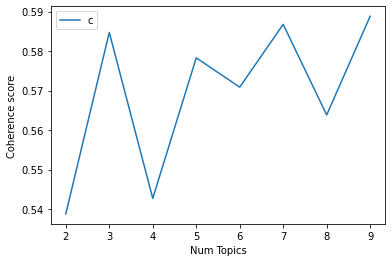

In [88]:
# Show graph

import matplotlib.pyplot as plt

limit=10; start=2; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [91]:
def get_lda_topics(model, num_topics, top_n_words):
    word_dict = {}
    for i in range(num_topics):
        word_dict['Topic# ' + '{:02d}'.format(i+1)] = [i[0] for i in model.show_topic(i,topn = top_n_words)]
    return pd.DataFrame(word_dict)
    
get_lda_topics(lda_model_comb, 9, 10)

,Topic# 01,Topic# 02,Topic# 03,Topic# 04,Topic# 05,Topic# 06,Topic# 07,Topic# 08,Topic# 09
0,room,stay,room,bed,staff,room,room,breakfast,good
1,check,like,location,shower,location,coffee,staff,service,breakfast
2,book,best,floor,room,great,air,bed,bar,price
3,staff,recommend,small,bathroom,friendly,tea,good,food,location
4,one,thing,view,tv,helpful,water,location,restaurant,expensive
5,reception,london,noise,door,nothing,hot,clean,good,free
6,ask,place,noisy,bath,excellent,work,comfortable,choice,wifi
7,time,back,old,like,room,cold,small,drink,value
8,night,everything,window,use,everything,condition,nice,area,money
9,give,time,good,one,breakfast,free,breakfast,buffet,park


In [39]:
import pyLDAvis
import pyLDAvis.gensim_models
pyLDAvis.enable_notebook()

In [57]:
LDAvis_comb = pyLDAvis.gensim_models.prepare(lda_model_comb, corpus_comb, id2word_comb)
LDAvis_comb

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1      0.108635  0.248308       1        1  33.862799
0     -0.127610 -0.084644       2        1  24.191584
3     -0.186152  0.010746       3        1  23.774652
2      0.205126 -0.174410       4        1  18.170964, topic_info=          Term          Freq         Total Category  logprob  loglift
4    breakfast  14575.000000  14575.000000  Default  30.0000  30.0000
64    location  19950.000000  19950.000000  Default  29.0000  29.0000
41       staff  23173.000000  23173.000000  Default  28.0000  28.0000
36        room  37751.000000  37751.000000  Default  27.0000  27.0000
70         bed   9833.000000   9833.000000  Default  26.0000  26.0000
..         ...           ...           ...      ...      ...      ...
36        room   2901.081901  37751.094482   Topic4  -3.9951  -0.8606
29        nice   1439.356866   7774.051368   Topic4  -4.6960   0.0188
187       well    934.962036   4275.027532   Topic4  -5.1275   0.1853
56   excellent   1002.717663   6204.812401   Topic4  -5.0575  -0.1173
41       staff    819.960343  23173.068714   Topic4  -5.2587  -1.6361

[276 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
234       1  0.999310        air
0         3  0.998523    airport
149       3  0.998882  amsterdam
648       1  0.999582    another
128       1  0.013876       area
...     ...       ...        ...
626       3  0.998813     within
189       1  0.834945       work
189       2  0.164143       work
189       4  0.000662       work
970       2  0.997153       worn

[397 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 1, 4, 3])

In [92]:
#lda_model_comb = gensim.models.LdaMulticore(corpus=corpus_comb,id2word=id2word_comb,num_topics=10) 

lda_model_comb_9 = gensim.models.ldamodel.LdaModel(corpus = corpus_comb,
                                                 id2word = id2word_comb,
                                                 num_topics = 9,
                                                 random_state = 100,
                                                 iterations = 100,
                                                 passes = 10)

In [93]:
LDAvis_comb_9 = pyLDAvis.gensim_models.prepare(lda_model_comb_9, corpus_comb, id2word_comb)
LDAvis_comb_9

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.205014  0.125135       1        1  19.483847
2     -0.033249 -0.090799       2        1  17.332382
6     -0.198182  0.027789       3        1  15.526565
4     -0.139273  0.057975       4        1  11.770431
1      0.064119  0.315652       5        1   9.498321
3      0.164118 -0.051646       6        1   8.413457
8     -0.245020 -0.082300       7        1   6.713257
7     -0.036507 -0.074638       8        1   5.694936
5      0.218980 -0.227168       9        1   5.566803, topic_info=           Term          Freq         Total Category  logprob  loglift
42        staff  23153.000000  23153.000000  Default  30.0000  30.0000
4     breakfast  14813.000000  14813.000000  Default  29.0000  29.0000
19         good  13811.000000  13811.000000  Default  28.0000  28.0000
18     friendly   8835.000000   8835.000000  Default  27.0000  27.0000
208     helpful   7820.000000   7820.000000  Default  26.0000  26.0000
...         ...           ...           ...      ...      ...      ...
226       noisy    423.236529   1568.715674   Topic9  -4.7480   1.5783
1322  difficult    277.442423    506.037061   Topic9  -5.1703   2.2874
378      shower    444.141310   3488.995862   Topic9  -4.6998   0.8271
231       sleep    295.498295   1416.829831   Topic9  -5.1073   1.3208
66     location    318.025529  20308.114024   Topic9  -5.0338  -1.2683

[558 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
562       5  0.997415  absolutely
1001      9  0.997672          ac
129       1  0.096124      access
129       2  0.010030      access
129       4  0.722182      access
...     ...       ...         ...
291       5  0.606974   wonderful
191       1  0.261903        work
191       2  0.241781        work
191       9  0.496019        work
554       1  0.996033       wrong

[913 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 3, 7, 5, 2, 4, 9, 8, 6])

In [102]:
#lda_model_comb = gensim.models.LdaMulticore(corpus=corpus_comb,id2word=id2word_comb,num_topics=10) 

lda_model_comb_7 = gensim.models.ldamodel.LdaModel(corpus = corpus_comb,
                                                 id2word = id2word_comb,
                                                 num_topics = 7,
                                                 random_state = 100,
                                                 iterations = 100,
                                                 passes = 10)

In [136]:
get_lda_topics(lda_model_comb_7, 7, 15)

,Topic# 01,Topic# 02,Topic# 03,Topic# 04,Topic# 05,Topic# 06,Topic# 07
0,room,room,breakfast,walk,park,room,staff
1,staff,check,good,location,car,bed,stay
2,location,book,coffee,close,public,shower,room
3,good,one,room,station,transport,bathroom,great
4,great,time,price,city,parking,work,friendly
5,bed,ask,food,metro,free,floor,helpful
6,breakfast,reception,tea,great,need,small,bar
7,friendly,staff,service,minute,taxi,night,lovely
8,clean,stay,value,restaurant,suite,door,love
9,helpful,give,money,easy,difficult,location,like


In [128]:
LDAvis_comb_7 = pyLDAvis.gensim_models.prepare(lda_model_comb_7, corpus_comb, id2word_comb)
LDAvis_comb_7

#Save the output to the html file
pyLDAvis.save_html(LDAvis_comb_7, "Combined_Review.html")

In [127]:
#Save the output to the html file
pyLDAvis.save_html(LDAvis_comb_7, "Combined_Review.html")

### postive review

In [104]:
df_pos = df[df['Label']==2]

In [105]:
df_pos.shape

(21824, 23)

In [106]:
df_pos = df.loc[(df['Label']==2),['review_clean','Label']]
df_pos

,review_clean,Label
2,pillow nice welcome service,2
3,include nice upgrade revamp surprise love seco...,2
4,lovely welcome staff,2
10,free upgrade executive double room complementa...,2
11,location breakfast friendly staff nice room,2
...,...,...
51558,excellent service happy reception staff maddy ...,2
51564,minute metropol five minute trainstation airport,2
51565,staff professional room large comfortable loca...,2
51567,location great staff perfect like star wonderf...,2


In [107]:
data_pos = df_pos.values.tolist()
data_words_pos = list(sent_to_words(data_pos))
print(data_words_pos[:1][0][:30])

['pillow', 'nice', 'welcome', 'service']


In [108]:
# Create Dictionary
id2word_pos = corpora.Dictionary(data_words_pos)
# Create Corpus
texts_pos = data_words_pos
# Term Document Frequency
corpus_pos = [id2word_pos.doc2bow(text) for text in texts_pos]
# View
print(corpus_pos[:1])

[[(0, 1), (1, 1), (2, 1), (3, 1)]]


In [63]:
lda_model_pos = gensim.models.ldamodel.LdaModel(corpus=corpus_pos, id2word=id2word_pos, num_topics=10, random_state = 100,
                                                 iterations = 100,
                                                 passes = 10)

In [149]:
# Compute Coherence Score
coherence_model_lda_pos = CoherenceModel(model=lda_model_pos, texts=data_words_pos, dictionary=id2word_pos, coherence='c_v')
coherence_lda = coherence_model_lda_pos.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.5741315086457162


In [109]:
# tuning lda model

model_list_pos = []
coherence_values_pos = []
model_topics_pos = []

for num_topics_pos in range(2, 11, 1):
    df_lda_pos = gensim.models.ldamodel.LdaModel(corpus=corpus_pos, id2word=id2word_pos, num_topics=num_topics_pos)
    coherencemodel = CoherenceModel(model=df_lda_pos, texts=data_words_pos, dictionary=id2word_pos, coherence='c_v')
    model_topics_pos.append(num_topics_pos)
    model_list_pos.append(df_lda_pos)
    coherence_values_pos.append(coherencemodel.get_coherence())
    print("#Topics: " + str(num_topics_pos) + " Score: " + str(coherencemodel.get_coherence()))

print(datetime.datetime.now())


#Topics: 2 Score: 0.5178825117205406
#Topics: 3 Score: 0.55077514125361
#Topics: 4 Score: 0.5627521915200522
#Topics: 5 Score: 0.5443053845066903
#Topics: 6 Score: 0.5732668024462279
#Topics: 7 Score: 0.5754386629472489
#Topics: 8 Score: 0.574486825789239
#Topics: 9 Score: 0.5518995065957877
#Topics: 10 Score: 0.5489088368566001
2022-03-22 16:47:18.118306


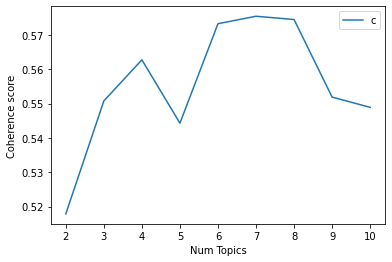

In [110]:
# Show graph

limit=11; start=2; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values_pos)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [114]:
lda_model_pos_7_2 = gensim.models.ldamodel.LdaModel(corpus=corpus_pos, id2word=id2word_pos, num_topics=7, random_state = 100,
                                                 iterations = 100,
                                                 passes = 10)

# Compute Coherence Score
coherence_model_lda_pos_7_2 = CoherenceModel(model=lda_model_pos_7_2, texts=data_words_pos, dictionary=id2word_pos, coherence='c_v')
coherence_lda_7_2 = coherence_model_lda_pos_7_2.get_coherence()
print('\nCoherence Score: ', coherence_lda_7_2)


Coherence Score:  0.6322415464179106


In [133]:
LDAvis_pos_7_2 = pyLDAvis.gensim_models.prepare(lda_model_pos_7_2, corpus_pos, id2word_pos)
LDAvis_pos_7_2

#Save the output to the html file
pyLDAvis.save_html(LDAvis_pos_7_2, "Positive_Review.html")

In [122]:
# get topics for positive reviews
    
get_lda_topics(lda_model_pos_7_2, 7, 15)

,Topic# 01,Topic# 02,Topic# 03,Topic# 04,Topic# 05,Topic# 06,Topic# 07
0,bar,stay,staff,walk,room,room,room
1,view,staff,location,location,staff,check,bed
2,restaurant,recommend,great,close,clean,night,comfortable
3,pool,best,friendly,station,comfortable,one,breakfast
4,room,love,helpful,metro,good,time,bathroom
5,area,make,excellent,city,friendly,stay,comfy
6,great,place,breakfast,good,breakfast,book,great
7,lovely,back,room,minute,location,need,good
8,top,like,good,easy,helpful,like,nice
9,beautiful,experience,service,great,nice,even,small


In [112]:
# get topics for positive reviews
    
get_lda_topics(lda_model_pos_7, 7, 15)

,Topic# 01,Topic# 02,Topic# 03,Topic# 04,Topic# 05,Topic# 06,Topic# 07
0,stay,breakfast,walk,room,staff,staff,service
1,check,restaurant,station,bed,stay,location,excellent
2,time,good,location,bathroom,helpful,great,comfort
3,recommend,street,close,comfy,friendly,room,cleanliness
4,back,room,good,comfortable,like,friendly,customer
5,book,area,room,view,best,good,detail
6,come,night,metro,lovely,make,breakfast,spa
7,early,little,city,nice,love,helpful,food
8,highly,front,easy,shower,always,excellent,attention
9,night,noise,minute,small,one,clean,class


In [101]:
# get topics for positive reviews
    
get_lda_topics(lda_model_pos, 7, 15)

,Topic# 01,Topic# 02,Topic# 03,Topic# 04,Topic# 05,Topic# 06,Topic# 07
0,stay,staff,room,location,room,stay,room
1,recommend,friendly,service,good,clean,like,free
2,best,helpful,check,great,staff,one,coffee
3,place,location,staff,breakfast,comfortable,time,bar
4,love,great,upgrade,excellent,good,book,breakfast
5,london,excellent,early,service,location,go,tea
6,back,breakfast,desk,perfect,friendly,night,area
7,experience,lovely,give,restaurant,nice,help,small
8,perfect,extremely,front,price,helpful,first,drink
9,wonderful,welcome,arrival,food,great,much,park


In [77]:
LDAvis_pos = pyLDAvis.gensim_models.prepare(lda_model_pos, corpus_pos, id2word_pos)
LDAvis_pos

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3      0.048673  0.158339       1        1  22.177558
0     -0.180219 -0.068633       2        1  18.981897
5     -0.132242  0.052386       3        1  17.741533
4      0.145282 -0.176215       4        1  14.898159
1      0.161213  0.068214       5        1  14.756611
2     -0.042706 -0.034091       6        1  11.444241, topic_info=          Term          Freq         Total Category  logprob  loglift
17       staff  23527.000000  23527.000000  Default  30.0000  30.0000
44   breakfast  14807.000000  14807.000000  Default  29.0000  29.0000
45    friendly   8940.000000   8940.000000  Default  28.0000  28.0000
46    location  20122.000000  20122.000000  Default  27.0000  27.0000
34       great  11321.000000  11321.000000  Default  26.0000  26.0000
..         ...           ...           ...      ...      ...      ...
8        hotel    823.422134  20340.287275   Topic6  -4.8385  -1.0392
80       price    547.289392   2972.587287   Topic6  -5.2470   0.4755
46    location    688.979985  20122.970832   Topic6  -5.0168  -1.2067
152       stay    588.835469   6794.631316   Topic6  -5.1739  -0.2781
330      could    541.882246   4174.848908   Topic6  -5.2570   0.1259

[528 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
18        1  0.079517  access
18        2  0.013535  access
18        3  0.774024  access
18        4  0.009305  access
18        5  0.053293  access
...     ...       ...     ...
678       1  0.088670   wrong
678       4  0.018667   wrong
678       5  0.886699   wrong
678       6  0.004667   wrong
1939      6  0.981227   yummy

[1504 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 1, 6, 5, 2, 3])

In [68]:
LDAvis_pos_7 = pyLDAvis.gensim_models.prepare(lda_model_pos_7, corpus_pos, id2word_pos)
LDAvis_pos_7

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
5     -0.165274 -0.014135       1        1  25.134847
3     -0.138770  0.027529       2        1  19.298143
2     -0.231613 -0.073882       3        1  14.597642
4      0.123223  0.201484       4        1  13.882900
1     -0.031023 -0.000599       5        1  13.489350
0      0.203595  0.187446       6        1   9.849044
6      0.239862 -0.327843       7        1   3.748074, topic_info=             Term          Freq         Total Category  logprob  loglift
14          staff   9756.000000   9756.000000  Default  30.0000  30.0000
43       location   7937.000000   7937.000000  Default  29.0000  29.0000
5       excellent   3280.000000   3280.000000  Default  28.0000  28.0000
2         service   1857.000000   1857.000000  Default  27.0000  27.0000
9            room  10012.000000  10012.000000  Default  26.0000  26.0000
..            ...           ...           ...      ...      ...      ...
58       facility    113.685091    910.858822   Topic7  -4.4686   1.2030
154         first     70.410031    311.789235   Topic7  -4.9477   1.7959
354       overall     50.739609    339.041609   Topic7  -5.2754   1.3845
455  receptionist     41.850761    124.091515   Topic7  -5.4680   2.1970
67     restaurant     45.723567   1329.944148   Topic7  -5.3795  -0.0864

[466 rows x 6 columns], token_table=      Topic      Freq           Term
term                                
304       2  0.004490     absolutely
304       4  0.992234     absolutely
15        3  0.788672         access
15        5  0.208230         access
859       4  0.134396  accommodation
...     ...       ...            ...
480       2  0.185524           work
480       4  0.141720           work
480       5  0.572033           work
480       6  0.097916           work
495       6  0.998175           year

[782 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 4, 3, 5, 2, 1, 7])

### negative review

In [116]:
df_neg = df[df['Label']==0]

In [117]:
df_neg.shape

(5922, 23)

In [118]:
df_neg = df.loc[(df['Label']==0),['review_clean','Label']]
df_neg

,review_clean,Label
1,tissue paper box present room,0
9,like construction progress stuff lie vacancy l...,0
46,wifi air condition never work properly change ...,0
57,one thing fine second visit sure third,0
75,defenetely need refurbishment view compansate ...,0
...,...,...
51531,like rabbit warren like many london hotel stay...,0
51541,force stay thieve rat infest las ramblas stole...,0
51561,room service phone order cappuccino tell coffe...,0
51570,room small chair tatty room,0


In [119]:
data_neg = df_neg.values.tolist()
data_words_neg = list(sent_to_words(data_neg))
print(data_words_neg[:1][0][:30])

['tissue', 'paper', 'box', 'present', 'room']


In [120]:
# Create Dictionary
id2word_neg = corpora.Dictionary(data_words_neg)
# Create Corpus
texts_neg = data_words_neg
# Term Document Frequency
corpus_neg = [id2word_neg.doc2bow(text) for text in texts_neg]
# View
print(corpus_neg[:1])

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1)]]


In [79]:
lda_model_neg = gensim.models.ldamodel.LdaModel(corpus=corpus_neg, id2word=id2word_neg, num_topics=10, random_state = 100,
                                                 iterations = 100,
                                                 passes = 10)

# Compute Coherence Score
coherence_model_lda_neg = CoherenceModel(model=lda_model_neg, texts=data_words_neg, dictionary=id2word_neg, coherence='c_v')
coherence_lda = coherence_model_lda_neg.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.5463279962235527


In [121]:
# tuning lda model

model_list_neg = []
coherence_values_neg = []
model_topics_neg = []

for num_topics_neg in range(2, 11, 1):
    df_lda_neg = gensim.models.ldamodel.LdaModel(corpus=corpus_neg, id2word=id2word_neg, num_topics=num_topics_neg)
    coherencemodel = CoherenceModel(model=df_lda_neg, texts=data_words_neg, dictionary=id2word_neg, coherence='c_v')
    model_topics_neg.append(num_topics_neg)
    model_list_neg.append(df_lda_neg)
    coherence_values_neg.append(coherencemodel.get_coherence())
    print("#Topics: " + str(num_topics_neg) + " Score: " + str(coherencemodel.get_coherence()))

print(datetime.datetime.now())

#Topics: 2 Score: 0.5416442359648804
#Topics: 3 Score: 0.4976519400111972
#Topics: 4 Score: 0.4669629386213341
#Topics: 5 Score: 0.5005772275181453
#Topics: 6 Score: 0.45352690730089146
#Topics: 7 Score: 0.49266437188406326
#Topics: 8 Score: 0.5111655594909504
#Topics: 9 Score: 0.48315634764452764
#Topics: 10 Score: 0.47352085091794577
2022-03-22 17:09:26.543940


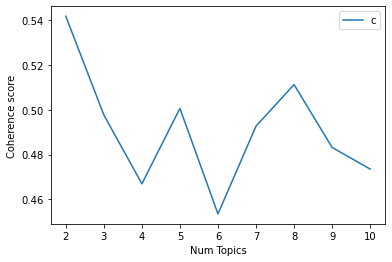

In [123]:
# Show graph

limit=11; start=2; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values_neg)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [79]:
lda_model_neg = gensim.models.ldamodel.LdaModel(corpus=corpus_neg, id2word=id2word_neg, num_topics=10, random_state = 100,
                                                 iterations = 100,
                                                 passes = 10)

# Compute Coherence Score
coherence_model_lda_neg = CoherenceModel(model=lda_model_neg, texts=data_words_neg, dictionary=id2word_neg, coherence='c_v')
coherence_lda = coherence_model_lda_neg.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.5463279962235527


In [124]:
# negative review for topics = 2
lda_model_neg_2 = gensim.models.ldamodel.LdaModel(corpus=corpus_neg, id2word=id2word_neg, num_topics=2, random_state = 100,
                                                 iterations = 100,
                                                 passes = 10)

# Compute Coherence Score
coherence_model_lda_neg = CoherenceModel(model=lda_model_neg, texts=data_words_neg, dictionary=id2word_neg, coherence='c_v')
coherence_lda = coherence_model_lda_neg.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.5463279962235527


In [125]:
# get topics for negative reviews
    
get_lda_topics(lda_model_neg_2, 2, 15)

,Topic# 01,Topic# 02
0,room,staff
1,bed,location
2,small,breakfast
3,breakfast,room
4,one,good
5,night,poor
6,bathroom,service
7,staff,book
8,work,wifi
9,good,price


In [126]:
LDAvis_neg_2 = pyLDAvis.gensim_models.prepare(lda_model_neg_2, corpus_neg, id2word_neg)
LDAvis_neg_2

PreparedData(topic_coordinates=              x    y  topics  cluster       Freq
topic                                           
0      0.097886  0.0       1        1  59.412023
1     -0.097886  0.0       2        1  40.587977, topic_info=         Term         Freq        Total Category  logprob  loglift
3        room  4457.000000  4457.000000  Default  30.0000  30.0000
53        bed   918.000000   918.000000  Default  29.0000  29.0000
100     staff  1335.000000  1335.000000  Default  28.0000  28.0000
83   location   953.000000   953.000000  Default  27.0000  27.0000
91      small   925.000000   925.000000  Default  26.0000  26.0000
..        ...          ...          ...      ...      ...      ...
327       pay   200.331411   456.815602   Topic2  -5.2762   0.0774
337      well   167.299896   322.629816   Topic2  -5.4564   0.2450
30       time   188.069602   450.908106   Topic2  -5.3394   0.0272
175       bar   165.305747   346.822929   Topic2  -5.4684   0.1607
12       like   175.135313   585.141582   Topic2  -5.4107  -0.3046

[160 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
495       1  0.038332  advertise
495       2  0.958293  advertise
18        1  0.999454        air
18        2  0.003143        air
584       1  0.018732    airport
...     ...       ...        ...
33        2  0.975892       wifi
34        1  0.992941     window
34        2  0.007580     window
35        1  0.778375       work
35        2  0.220540       work

[238 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2])

In [100]:
# get topics for negative reviews
    
get_lda_topics(lda_model_neg, 2, 15)

,Topic# 01,Topic# 02
0,room,staff
1,bed,location
2,small,breakfast
3,breakfast,room
4,one,good
5,night,poor
6,bathroom,service
7,staff,book
8,work,wifi
9,good,price


In [82]:
lda_model_neg = gensim.models.ldamodel.LdaModel(corpus=corpus_neg, id2word=id2word_neg, num_topics=2)

In [135]:
LDAvis_neg = pyLDAvis.gensim_models.prepare(lda_model_neg, corpus_neg, id2word_neg)
LDAvis_neg

#Save the output to the html file
pyLDAvis.save_html(LDAvis_neg, "Negative_Review.html")

In [132]:
import os 
#full path
dir_path = os.path.dirname(os.path.realpath('Combined_Review.html'))

#current dir
cwd = os.getcwd()

cwd

'C:\\Users\\Lily'

In [148]:
lda_model_neg_2 = gensim.models.ldamodel.LdaModel(corpus=corpus_neg, id2word=id2word_neg, num_topics=2, random_state = 100,
                                                 iterations = 1,
                                                 passes = 10)


In [149]:
# Compute Perplexity
perplex_neg_2= lda_model_neg_2.log_perplexity(corpus_neg, total_docs=None) #For LDAModel
  # a measure of how good the model is. lower the better.
print('\nPerplexity for lda_model_neg_2: ', perplex_neg_2)


Perplexity for lda_model_neg_2:  -7.22946772359253


In [150]:
lda_model_neg_2_100 = gensim.models.ldamodel.LdaModel(corpus=corpus_neg, id2word=id2word_neg, num_topics=2, random_state = 100,
                                                 iterations = 200,
                                                 passes = 10)


In [151]:
# Compute Perplexity
perplex_neg_2_100= lda_model_neg_2_100.log_perplexity(corpus_neg, total_docs=None) #For LDAModel
  # a measure of how good the model is. lower the better.
print('\nPerplexity for lda_model_neg_2_100: ', perplex_neg_2_100)


Perplexity for lda_model_neg_2_100:  -7.122167092024532


In [195]:

pd.set_option('display.max_colwidth', None)
df[(df['Label']==0)&(df['review'].str.contains('breakfast'))][['review', 'Label']]

,review,Label
196,One of the worst places we have ever stayed for sure I have travelled all around the world but this place for sure deserves to be entitled campsite They are under staffed and over loaded You ask for some ice and get charged 5 Euros even for delivering food to your room they charged you 5 They don t change the bedsheets and pillow case assuming that you would not find out They just turn them around and use the same dirty sheets The location of the hotel is awfull where you seriously fear for your life if you want to go out after 8 pm Even taxi drivers refuse to drop you off there Honestly there is no management at all Btw your breakfast was awful and the same Sh every day I will never ever stay at your awful place again and not even recommend your campsite to my enemies For the people from some countries your campsite may look alright but let s face it you are not even close to being fine. Nothing at all,0
258,We had initially booked a classic bedroom but only to find out when we arrived that the room was very very small for even 2 people too pricey for classic bedrooom We had to pay extra to upgrade for a superior room of a decent size If I had known the size of the classic bedroom I wouldn t have booked it at all The photos of the classic bedroom you find here is not realistic I was really disappointed The other issue was the hotel is undergoing renovation and we weren t informed about this There is no breakfast room available Our total price for the 3 nights stay was 700 Euros which is too pricey for this hotel. Had booked classic double room which is really really small and not worth the price that we paid 296 300 Euro roughly for 2 nights We had to move to superior bedroom at our own cost 14 euro extra per night the bed is comfortable modern and facilities in the room is excellent The hotel is centrally located with easy access to Metro I would again request the hotel management staff to put realistic picture of classic double room and please please inform the guests well ahead about any renovation work that is going on in your hotel This would atleast set the expectation We were really disappinted when we entered our room and had to immediately pay for an upgrade,0
348,Breakfast the corridors to rooms were dark and dingy Bathrooms old and in need of revamp. The breakfast ingredients were very poor quality,0
381,Room service didn t clean my room tow days. The more welcome and the breakfast not include,0
431,Our room didn t get cleaned on onne of the days during our stay informed staff and they confirmed they were busy Works going on during our stay but didn t inform us until we entered our room via letter. We got our breakfasts FOC due to the issues,0
...,...,...
51143,Twice when trying to ask something on reception the single staff was busy searching for day excursion advice on the PC for a single other visitor for too long Not much to do in the direct neighborhood. Good access to public transport Tram Station in front of Hotel Very quiet considering location next to highway Modern rooms not huge Decent breakfast same every day Good coffee 30mins from airport by public transport,0
51300,Be aware Room with NO WINDOWS This was not stated anywhere Small variery of breakfast food Bathroom would need some refreshing black marks between the tiles Shower hose damaged Toilet seat damaged faling off Noisy corridor in the morning very thin walls As compared to the same brand in Belgium this was very big disappointment Would never say it was 4 star hotel Not gonna book again.,0
51381,expensive breakfast as everywhere in London.,0
51397,No breakfast including in price of room.,0


## Neutral Review

In [173]:
df_neu = df[df['Label']==1]

In [174]:
df_neu.shape

(23668, 23)

In [175]:
df_neu = df.loc[(df['Label']==1),['review_clean','Label']]
df_neu

,review_clean,Label
0,appreciate shop sell drinking water etc necess...,1
5,free wifi location perfect lot time look city ...,1
6,room generally shabby lack maintenance crumb b...,1
7,executive room floor bath website make look li...,1
8,pity two day rain centrality proximity destina...,1
...,...,...
51563,pool excellent,1
51566,well lift location excellent access beach metro,1
51568,basic free wi fy terrible sure pay version wel...,1
51571,expensive rate mini bar price roof top pool vi...,1


In [176]:
data_neu = df_neu.values.tolist()
data_words_neu = list(sent_to_words(data_neu))
print(data_words_neu[:1][0][:30])

['appreciate', 'shop', 'sell', 'drinking', 'water', 'etc', 'necessity', 'recommend', 'like', 'arrive', 'late', 'night', 'bring', 'drink', 'plane', 'airport', 'shop', 'nearby', 'minibar', 'though', 'pay', 'price', 'great', 'clean', 'friendly', 'staff', 'free', 'breakfast', 'morning', 'good']


In [177]:
# Create Dictionary
id2word_neu = corpora.Dictionary(data_words_neu)
# Create Corpus
texts_neu = data_words_neu
# Term Document Frequency
corpus_neu = [id2word_neg.doc2bow(text) for text in texts_neu]
# View
print(corpus_neu[:1])

[[(3, 2), (12, 1), (15, 1), (19, 1), (33, 1), (80, 2), (90, 1), (92, 1), (97, 1), (100, 1), (101, 1), (108, 1), (110, 1), (137, 1), (167, 1), (196, 1), (207, 1), (221, 1), (295, 1), (324, 1), (325, 1), (327, 1), (341, 1), (370, 1), (388, 1), (407, 1), (436, 2), (440, 1), (467, 1), (584, 2), (609, 1), (731, 1), (756, 2), (870, 1), (882, 1), (916, 1), (1214, 1), (1219, 1), (1279, 1), (1389, 1), (1414, 1), (1800, 1), (2068, 1), (2462, 1), (2779, 1), (4744, 1), (5673, 1)]]


In [178]:
lda_model_neu = gensim.models.ldamodel.LdaModel(corpus=corpus_neu, id2word=id2word_neu, num_topics=10, random_state = 100,
                                                 iterations = 100,
                                                 passes = 10)

# Compute Coherence Score
coherence_model_lda_neu = CoherenceModel(model=lda_model_neu, texts=data_words_neu, dictionary=id2word_neu, coherence='c_v')
coherence_lda = coherence_model_lda_neu.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.4339902579235438


In [179]:
# tuning lda model

model_list_neu = []
coherence_values_neu = []
model_topics_neu = []

for num_topics_neu in range(2, 11, 1):
    df_lda_neu = gensim.models.ldamodel.LdaModel(corpus=corpus_neg, id2word=id2word_neg, num_topics=num_topics_neu)
    coherencemodel = CoherenceModel(model=df_lda_neu, texts=data_words_neu, dictionary=id2word_neu, coherence='c_v')
    model_topics_neu.append(num_topics_neu)
    model_list_neu.append(df_lda_neu)
    coherence_values_neu.append(coherencemodel.get_coherence())
    print("#Topics: " + str(num_topics_neu) + " Score: " + str(coherencemodel.get_coherence()))

print(datetime.datetime.now())

#Topics: 2 Score: 0.3576463502196057
#Topics: 3 Score: 0.39899976859676434
#Topics: 4 Score: 0.35568855490473494
#Topics: 5 Score: 0.405132711675665
#Topics: 6 Score: 0.35572954242894766
#Topics: 7 Score: 0.42523863508080645
#Topics: 8 Score: 0.39767435772712106
#Topics: 9 Score: 0.38974801138794474
#Topics: 10 Score: 0.41797957238087335
2022-03-23 17:45:34.714966


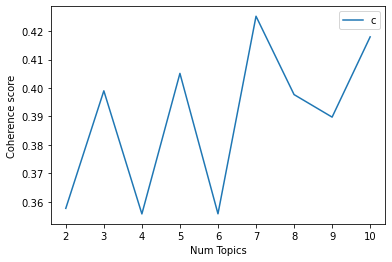

In [180]:
# Show graph

limit=11; start=2; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values_neu)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [181]:
# Neutral Reviews with 9 topics
lda_model_neu_7 = gensim.models.ldamodel.LdaModel(corpus=corpus_neu, id2word=id2word_neu, num_topics=7, random_state = 100,
                                                 iterations = 100,
                                                 passes = 10)

In [182]:
LDAvis_neu_7 = pyLDAvis.gensim_models.prepare(lda_model_neu_7, corpus_neu, id2word_neu)
LDAvis_neu_7

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.240667 -0.055532       1        1  21.653278
6      0.155014 -0.124294       2        1  18.698539
2      0.095633  0.194011       3        1  13.783277
4     -0.068368  0.172240       4        1  12.688605
1     -0.153646 -0.099830       5        1  12.361790
3     -0.080050 -0.053779       6        1  11.613654
5     -0.189248 -0.032816       7        1   9.200857, topic_info=          Term          Freq         Total Category  logprob  loglift
108     heaven   8357.000000   8357.000000  Default  30.0000  30.0000
3         bath  22818.000000  22818.000000  Default  29.0000  29.0000
100       rain  11596.000000  11596.000000  Default  28.0000  28.0000
83   nespresso  10744.000000  10744.000000  Default  27.0000  27.0000
53   available   6142.000000   6142.000000  Default  26.0000  26.0000
..         ...           ...           ...      ...      ...      ...
102  amsterdam    520.924620   2911.901472   Topic7  -4.4560   0.6649
268    outside    302.869636    820.277647   Topic7  -4.9983   1.3895
317        bar    371.885457   1787.502603   Topic7  -4.7930   0.8159
48    location    361.905866   1789.791992   Topic7  -4.8202   0.7874
359      heart    325.338572   1463.267103   Topic7  -4.9267   0.8823

[490 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
1182      3  0.987071      aboard
357       1  0.024709  absolutely
357       2  0.065043  absolutely
357       3  0.010174  absolutely
357       4  0.049418  absolutely
...     ...       ...         ...
1384      7  0.985857        wine
1685      6  0.988799        worn
2673      6  0.982974     wrongly
704       6  0.985963        year
1003      5  0.987281         yet

[876 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 7, 3, 5, 2, 4, 6])

In [183]:
# get topics for negative reviews
    
get_lda_topics(lda_model_neu_7, 7, 15)

,Topic# 01,Topic# 02,Topic# 03,Topic# 04,Topic# 05,Topic# 06,Topic# 07
0,bath,heaven,bath,rain,bath,bath,minute
1,rain,machine,two,bath,available,nespresso,immediatly
2,close,rain,available,nespresso,buzz,rain,upgraded
3,night,bath,nespresso,lovely,amsterdam,two,nespresso
4,free,nespresso,machine,fantastic,helpful,machine,bath
5,bed,tram,selection,available,near,pickpocketing,month
6,quiet,currently,crumb,pickpocketing,half,plane,hour
7,find,pickpocketing,complimentary,good,rugby,lovely,machine
8,selection,lovely,tube,recommend,ride,heaven,shuttle
9,starbucks,limit,furniture,value,deliver,hole,hotel


In [184]:
#Save the output to the html file
pyLDAvis.save_html(LDAvis_neu_7, "Neutral_Review.html")